In [60]:
from commonfunctions import *
import numpy as np
import cv2
import matplotlib.pyplot as plt
from scipy.spatial.distance import euclidean
from skimage.metrics import structural_similarity as ssim
import os
%matplotlib inline
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [140]:
def video_to_frames(video_path, output_folder, start_frame=0, end_frame=None):
    """
    Segment a video into frames and save them as images without altering resolution,
    processing frames only within a specified range.

    Args:
        video_path (str): Path to the input video file.
        output_folder (str): Directory where extracted frames will be saved.
        start_frame (int): Frame index to start processing from (default is 0).
        end_frame (int): Frame index to stop processing at (default is None, which means process until the end).
    """
    # Check if the output folder exists, create if not
    if not os.path.exists(output_folder):
        os.makedirs(output_folder)
    
    # Open the video file
    cap = cv2.VideoCapture(video_path)
    
    # Check if video opened successfully
    if not cap.isOpened():
        print("Error: Could not open video.")
        return
    
    # Get the total number of frames in the video
    total_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
    print(f"Total frames in video: {total_frames}")
    
    # Validate the end frame
    if end_frame is None or end_frame > total_frames:
        end_frame = total_frames
    
    # Ensure the start frame is valid
    if start_frame >= total_frames:
        print(f"Error: Start frame {start_frame} exceeds total frames {total_frames}.")
        return
    
    # Ensure the start frame is before the end frame
    if start_frame >= end_frame:
        print(f"Error: Start frame {start_frame} is not less than end frame {end_frame}.")
        return
    
    # Set the starting frame
    cap.set(cv2.CAP_PROP_POS_FRAMES, start_frame)
    
    # Frame counter
    frame_count = start_frame
    
    while frame_count < end_frame:
        # Read a frame from the video
        ret, frame = cap.read()
        
        # Break the loop if there are no more frames
        if not ret:
            break
        
        # Construct the output file path
        frame_filename = os.path.join(output_folder, f"frame_{frame_count:04d}.png")
        
        # Save the frame as an image (PNG format preserves resolution)
        cv2.imwrite(frame_filename, frame)
        
        # Print progress
        print(f"Saved: {frame_filename}")
        
        # Increment the frame counter
        frame_count += 1
    
    # Release the video capture object
    cap.release()
    print("Video segmentation complete!")

# Example usage
video_path = "input_video.mp4"  # Replace with your video file path
output_folder = "output_frames"  # Replace with desired output folder path
start_frame = 6000  # Start processing after the first 732 frames
end_frame = 6400  # Stop processing after frame 1500

#video_to_frames(video_path, output_folder, start_frame, end_frame)


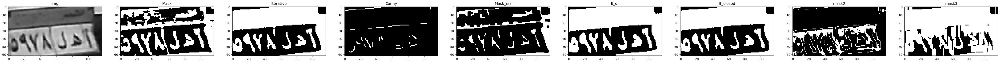

In [142]:
def adaptiveThreshold(frame):
    # only works on grayscale images represented from 0 to 1 as float, works best with sudden changes such as text
    height, width = np.shape(frame)
    threshold = 15
    window_size = width // 8
    mask = frame.copy()
    integral = frame.copy()
    # calculate the integral of the input image
    for i in range(width):
        sum = 0
        for j in range(height):
            sum += frame[j, i]
            if i == 0:
                integral[j, i] = sum
            else:
                integral[j, i] = integral[j, i - 1] + sum
    i = 0
    j = 0
    for i in range(width):
        for j in range(height):
            x1 = max(0, i - window_size // 2)
            x2 = min (width - 1, i + window_size // 2)
            y1 = max(0, j - window_size // 2)
            y2 = min (height - 1, j + window_size // 2)
            count = (x2 - x1) * (y2 - y1)
            sum = integral[y2, x2]
            if y1 > 0:
                sum -= integral[y1 - 1, x2]
            if x1 > 0:
                sum -= integral[y2, x1 - 1]
            if x1 > 0 and y1 > 0:
                sum += integral[y1 - 1, x1 - 1]
            if (frame[j, i] * count) <= (sum * (100 - threshold) / 100):
                mask[j, i] = 255
            else:
                mask[j, i] = 0
    return mask

img = rgba2rgb(io.imread("./Tests/أهل٥٩٧٨.png"))

img_g = rgb2gray(img)

mask =  adaptiveThreshold(img_g)

img_it = iterativeThreshold(img_g)

import numpy as np

f1 = np.array([[0, 0, 1, 0, 0], 
               [0, 0, 1, 0, 0], 
               [0, 0, 1, 0, 0],
               [0, 0, 0, 0, 0], 
               [0, 0, 0, 0, 0]])


img_canny = canny((img_g * 255), sigma=1, low_threshold=240, high_threshold=250)

mask_err = binary_erosion(mask, np.ones((3, 3)))

it_dil = binary_dilation(img_it, np.ones([3,1]))

it_closed = binary_erosion(it_dil, np.ones([3,1]))

mask2 = ((img_g > 0.4) & (img_g < 0.5)) 

mask2_closed = binary_erosion(mask2, np.ones([2,2]))

mask3 = binary_dilation(mask2_closed, np.ones([8,1]))

mask3 = np.logical_or(mask3,img_it)

show_images([img_g,mask,img_it,img_canny,mask_err,it_dil,it_closed,mask2,mask3],["Img","Mask","Iterative","Canny","Mask_err","It_dil","It_closed","mask2","mask3"])

In [ ]:
img = rgba2rgb(io.imread("./4_2.png"))

img_g = rgb2gray(img)

def seg(img):
    img = (img).astype("uint8")
    imgHist = np.zeros(256)
    for x in range(np.shape(img)[0]):
        for y in range(np.shape(img)[1]):
            imgHist[img[x, y]] += 1

    sum = 0
    for x in range(256):
        sum += (imgHist[x] * x)

    mean = round(sum / (np.shape(img)[0] * np.shape(img)[1]))

    sat = False    
    while(not sat):
        sum1 = 1
        count1 = 1
        sum2 = 1
        count2 = 1
        for x in range(mean):
            sum1 += (imgHist[x] * x)
            count1 += imgHist[x]
        for x in range(mean,256):
            sum2 += (imgHist[x] * x)
            count2 += imgHist[x]
        mean1 = sum1/(count1)
        mean2 = sum2/(count2)
        if math.isnan(mean1):
            print("ERRROR mean1", mean1)
            mean1 = mean2
        if math.isnan(mean2):
            print("ERRROR mean2", mean2)
            mean2 = mean1
        mean3 = round((mean1+mean2)/2)
        if (mean3 == mean):
            sat = True
        mean = mean3

    for x in range(np.shape(img)[0]):
        for y in range(np.shape(img)[1]):
            if(img[x,y] <= mean):
                img[x,y] = 0
            else:
                img[x,y] = 1
    return img

def local_thres(img):
    img = np.copy((img).astype("uint8"))

    x = np.shape(img)[0]
    y = np.shape(img)[1]

    q1 = img[0:round(x/2),0:round(y/2)]
    q2 = img[0:round(x/2),round(y/2):y]
    q3 = img[round(x/2):x,0:round(y/2)]
    q4 = img[round(x/2):x,round(y/2):y]

    q1_s = seg(np.copy(q1))
    q2_s = seg(np.copy(q2))
    q3_s = seg(np.copy(q3))
    q4_s = seg(np.copy(q4))

    return q1_s, q2_s, q3_s, q4_s

def join_quads(quad, sub_quads):
    img = np.zeros(np.shape(quad))
    x = np.shape(img)[0]
    y = np.shape(img)[1]

    img[0:round(x/2),0:round(y/2)] = sub_quads[0]
    img[0:round(x/2),round(y/2):y] = sub_quads[1]
    img[round(x/2):x,0:round(y/2)] = sub_quads[2]
    img[round(x/2):x,round(y/2):y] = sub_quads[3]

    return img

quad = local_thres(img_g * 256)

final = join_quads(img_g,quad)

x = img_g > (0.65 * img.max())

x_err = binary_dilation(x,np.ones([3,1]))

#show_images([img_g,final,x,x_err],["original","Final","X","X_err"])


In [62]:
def getHistogram(img):
    # works for grayscale images represented from 0 to 255
    hist = np.zeros(256)
    for i in range(np.shape(img)[0]):
        for j in range(np.shape(img)[1]):
            hist[img[i, j]] += 1
    return hist

def iterativeThreshold(image):
    # only works on grayscale images
    img = (image.copy()*255).astype('uint8') % 255
    hist = getHistogram(img)
    sum = 0
    weighted_sum = 0
    for i in range(256):
        sum += hist[i]
        weighted_sum += hist[i] * i
    Tinit = int(weighted_sum // sum)
    while(True):
        sum1 = 0
        weighted_sum1 = 0
        for j in range(Tinit):
            sum1 += hist[j]
            weighted_sum1 += hist[j] * j
        T1 = int(weighted_sum1 // sum1)

        sum2 = 0
        weighted_sum2 = 0
        for k in range(Tinit,256):
            sum2 += hist[k]
            weighted_sum2 += hist[k] * k
        T2 = int(weighted_sum2 // sum2)

        Told = Tinit
        Tinit = int((T1 + T2) // 2)

        if (Tinit == Told):
            break
    binary_mask = img <= Tinit
    return binary_mask

In [213]:
def refine_binary_half(image):
    binary_image = iterativeThreshold(image)

    #show_images([binary_image,image],["image given to refine binary","image"])
    freeze1 = False
    freeze2 = False
    strike1=False
    strike2=False
    index1 = 0
    index2 = 0
    index3 = 0
    index4 = 0

    #print(binary_image[:,0])
    #print(binary_image[:,1])
    #print(binary_image[:,2])
    # Correctly interpret dimensions
    height, width = np.shape(binary_image)
    
    for i in range(5):
        counter1 = 0
        counter2 = 0
        
        # Check the leftmost and rightmost columns at index i
        for j in range(5):
            # Top and bottom pixels of the left column
            if binary_image[j, i] == 1:
                counter1 += 1
            if binary_image[height - 1 - j, i] == 1:
                counter1 += 1
            
            # Top and bottom pixels of the right column
            if binary_image[j, width - 1 - i] == 1:
                counter2 += 1
            if binary_image[height - 1 - j, width - 1 - i] == 1:
                counter2 += 1
        
        # Update index1 for left side
        if counter1 > 4 and not freeze1:
            if strike1:       
                index1 += 2
                strike1=False
            else:
                index1 += 1
        elif strike1:
            freeze1 = True
        else:
            strike1=True

        # Update index2 for right side
        if counter2 > 4 and not freeze2:
            if strike2:       
                index2 += 2
                strike2=False
            else:
                index2 += 1
        elif strike2:
            freeze2 = True
        else:
            strike2=True

    freeze1 = False
    freeze2 = False
    image = image[:, index1:width - index2]
    binary_image = binary_image[:, index1:width - index2]
    width -= (index1+index2)
        
    for i in range(3):
        counter1 = 0
        counter2 = 0
        
        # Check the leftmost and rightmost columns at index i
        for j in range(7):
            # Top and bottom pixels of the left column
            if binary_image[i, j] == 1:
                counter1 += 1
            if binary_image[i, width - 1 - j] == 1:
                counter1 += 1
            
            # Top and bottom pixels of the right column
            if binary_image[height - 1 - i, j] == 1:
                counter2 += 1
            if binary_image[height - 1 - i, width - 1 - j] == 1:
                counter2 += 1
        
        # Update index1 for left side
        if counter1 > 4 and not freeze1:
            index3 += 1
        else:
            freeze1 = True

        # Update index2 for right side
        if counter2 > 4 and not freeze2:
            index4 += 1
        else:
            freeze2 = True
            

    print("After")    
    #print(binary_image[:,index1])
    image = image[index3:height - index4:,:]
    binary_image=binary_image[index3:height - index4:,:]
    
    #show_images([binary_image],["image out of refine binary"])
    # Return the cropped image
    return binary_image,image

In [215]:
def extract_half(img_it_dil,image_n):
    # # Find contours
    contours = find_contours(img_it_dil, 0.)
    bounding_boxes = []
    for contour in contours:
        Ymin = np.min(contour[:,0])
        Ymax = np.max(contour[:,0])
        Xmin = np.min(contour[:,1])
        Xmax = np.max(contour[:,1])
        aspect_ratio = (Xmax-Xmin)/(Ymax-Ymin)
        if 1 <= aspect_ratio <= 3 and (Xmax-Xmin) > 40 and (Ymax-Ymin) > 25:
            print(Xmin, Xmax, Ymin, Ymax)
            bounding_boxes.append([Xmin, Xmax, Ymin, Ymax])
    
    
    # #When provided with the correct format of the list of bounding_boxes, this section will set all pixels inside boxes in img_with_boxes
    img_with_boxes = np.zeros_like(img_it_dil)
    for box in bounding_boxes:
        [Xmin, Xmax, Ymin, Ymax] = box
        rr, cc = rectangle(start = (Ymin,Xmin), end = (Ymax,Xmax), shape=img_it_dil.shape)
        img_with_boxes[rr, cc] = 1 #set color white
        return image_n[int(Ymin+2):int(Ymax-2),int(Xmin):int(Xmax)]
    return image_n[2:int(np.shape(image_n)[0]-4),:]

import numpy as np

def refine_half(image):
    freeze1 = False
    freeze2 = False
    index1 = 0
    index2 = 0
    index3 = 0
    index4 = 0
    
    # Correctly interpret dimensions
    height, width = np.shape(image)
    
    
    print("top")
    print(image[0,:])
    print(image[1,:])
    print(image[2,:])
    '''
    print("right")
    print(image[:,width-1])
    print(image[:,width-2])
    print(image[:,width-3])
    '''
    
    
    #show_images([image],["Img1 giben to basic refine"])
    
    for i in range(3):
        counter1 = 0
        counter2 = 0
        print("top")
        print(image[i,:])
        # Check the leftmost and rightmost columns at index i
        for j in range(5):
            # Top and bottom pixels of the left column
            if image[i, j] < 0.2:
                counter1 += 1
            if image[i, width - 1 - j] < 0.2:
                counter1 += 1
            
            # Top and bottom pixels of the right column
            
            if image[height - 1 - i, j] < 0.2:
                counter2 += 1
            if image[height - 1 - i, width - 1 - j] < 0.2:
                counter2 += 1
        
        # Update index1 for left side
        if counter1 > 3 and not freeze1:
            index3 += 1
        else:
            freeze1 = True

        # Update index2 for right side
        if counter2 > 3 and not freeze2:
            index4 += 1
        else:
            freeze2 = True
            
            
    freeze1 = False
    freeze2 = False
    image=image[index3:height - index4,:]
    height -= (index3+index4)
    
    for i in range(15):
        counter1 = 0
        counter2 = 0
        
        # Check the leftmost and rightmost columns at index i
        for j in range(5):
            # Top and bottom pixels of the left column
            if image[j, i] < 0.2:
                counter1 += 1
            if image[height - 1 - j, i] < 0.2:
                counter1 += 1
            
            # Top and bottom pixels of the right column
            if image[j, width - 1 - i] < 0.2:
                counter2 += 1
            if image[height - 1 - j, width - 1 - i] < 0.3:
                counter2 += 1
        
        # Update index1 for left side
        if counter1 > 4 and not freeze1:
            index1 += 1
        else:
            freeze1 = True

        # Update index2 for right side
        if counter2 > 4 and not freeze2:
            index2 += 1
        else:
            freeze2 = True
    image=image[:, index1:width - index2]
    #show_images([image],["Img1 out of basic refine"])


    print("After")
    print(image[:,0])
    # Return the cropped image
    return image

def split_plate(img):

    img_g = rgb2gray(img)

    img_it = iterativeThreshold(img_g)

    img_it_dil = binary_dilation(img_it, np.ones([3,1]))

    #c = extract_half(img_it_dil,img_g)
    
    # Crop 40% from the top
    height, width = img_g.shape
    cropped_img = img_g[int(height * 0.4):, :]
    
    # Split the cropped image into two parts vertically
    image1 = cropped_img[:, :int(width * 0.5)]  # Left half
    image2 = cropped_img[:, int(width * 0.5):]  # Right half

    img_it = iterativeThreshold(image1)
    
    img_it_dil = binary_dilation(img_it, np.ones([3,1]))
    
    image1 = extract_half(img_it_dil,image1)
    #show_images([image1],['1'])
    
    image1 = refine_half(image1)
    #show_images([image1],['11'])
    image1_it,image1 = refine_binary_half(image1)
    
    img_it = iterativeThreshold(image2)
    
    img_it_dil = binary_dilation(img_it, np.ones([3,1]))
    
    image2 = extract_half(img_it_dil,image2)
    #show_images([image2],['2'])
    
    image2 = refine_half(image2)
    #show_images([image2],['22'])
    image2_it,image2 = refine_binary_half(image2)
    print("to horizonatal")
    #show_images([image1_it,image2_it],['1','2'])

    return image1,image1_it,image2,image2_it

In [217]:
def fix_tilt(img):

    img_g = rgb2gray(img)
    
    # Use Canny edge detection
    edges = canny(img_g * 255, 1, 70, 110)
    
    #show_images([img_g,edges],["Img","canny"])
    # Convert edges to uint8 (HoughLines requires this format)
    edges_uint8 = (edges * 255).astype(np.uint8)
    
    # Perform the Hough Line Transform
    lines = cv2.HoughLines(edges_uint8, 1, np.pi / 180, 40)
    
    # Extract angles of the detected lines
    angles = []
    if lines is not None:
        for line in lines:
            rho, theta = line[0]
            angle = np.rad2deg(theta) - 90  # Convert from radians to degrees
            angles.append(angle)
    else:
        print("No lines detected")
        return img
    # Calculate the median angle to reduce noise
    tilt_angle = np.median(angles)
    print(f"Tilt angle: {tilt_angle:.2f} degrees")
    
    # Get the center of the image
    (h, w) = img_g.shape[:2]
    center = (w // 2, h // 2)
    
    # Create the rotation matrix
    rotation_matrix = cv2.getRotationMatrix2D(center, tilt_angle, 1.0)
    
    # Apply the rotation
    corrected_image = cv2.warpAffine(img, rotation_matrix, (w, h), borderValue=(0.5,0.5,0.5))
    
    #show_images([img,corrected_image],["Img","corrected"])

    return corrected_image


In [68]:
def horizontal_segmentation(image, min_width=1, max_width=20, min_height=4):
    """
    Segment digits horizontally
    
    Args:
        binary_image (numpy.ndarray): Binary image of the license plate
        min_width (int): Minimum width of a valid digit region
        max_width (int): Maximum width of a valid digit region
        min_height (int): Minimum height of a valid digit region
    
    Returns:
        list: List of segmented digit images
    """
    print("welcome to horizontal seg")
    binary_image = iterativeThreshold(image)

    #show_images([image,binary_image],["image","binary"])
    
    # Find horizontal projection
    horizontal_projection = np.sum(binary_image, axis=0)
    
    # Find potential digit regions
    digit_regions = []
    in_digit = False
    start = 0
    
    for x in range(len(horizontal_projection)):
        # Check if we're in a potential digit region
        if not in_digit and horizontal_projection[x] > 0:
            start = x
            in_digit = True
        
        # Check if we've exited a digit region
        elif in_digit and (horizontal_projection[x] == 0 or x == len(horizontal_projection)-1):
            end = x
            print(start,end)

            #filtering
            if (end - start >= min_width and end - start <= max_width and np.sum(binary_image[:,start:end]) > min_height * (end - start)):
        
                # Extract potential digit
                digit_region = image[:, start:end]
                digit_region = iterativeThreshold(digit_region)
                
                digit_regions.append((start, end, digit_region))
            
            in_digit = False
    
    return digit_regions

def refine_segmentation(digit_regions, max_digits=4, min_separation=1):
    """
    Refine segmentation by merging or filtering regions
    
    Args:
        digit_regions (list): List of detected digit regions
        max_digits (int): Maximum number of expected digits
        min_separation (int): Minimum separation between digits
    
    Returns:
        list: Refined list of digit regions
    """
    # Sort regions from left to right
    sorted_regions = sorted(digit_regions, key=lambda x: x[0])
    
    # Merge closely connected regions
    refined_regions = []
    i = 0
    while i < len(sorted_regions):
        current = sorted_regions[i]
        
        # Look ahead to see if next region is close
        if i + 1 < len(sorted_regions):
            next_region = sorted_regions[i + 1]
            
            # If regions are close, merge them
            if next_region[0] - current[1] < min_separation:
                # Merge the two regions
                merged_region = (
                    current[0], 
                    next_region[1], 
                    np.hstack((current[2], next_region[2]))
                )
                refined_regions.append(merged_region)
                i += 2
                continue
        
        refined_regions.append(current)
        i += 1

    # Limit to max expected digits
    return refined_regions[:max_digits]

def pad_and_center_digit(digit, target_size=40, pad_value=0):
    """
    Pad and center a digit image to a target size
    
    Args:
        digit (numpy.ndarray): Input digit image
        target_size (int): Desired size of the padded image
        pad_value (int): Value to use for padding (0 for black)
    
    Returns:
        numpy.ndarray: Padded and centered digit image
    """
    # Ensure the input is a numpy array of uint8
    if not isinstance(digit, np.ndarray):
        digit = np.array(digit)
    
    # Convert to grayscale if it's a color image
    if len(digit.shape) > 2:
        digit = digit.mean(axis=2).astype(np.uint8)
    
    # Get current digit dimensions
    h, w = digit.shape
    
    # Determine scaling factor if larger than target size
    if h > target_size or w > target_size:
        # Calculate scale factor to fit within target size while maintaining aspect ratio
        scale_h = target_size / h
        scale_w = target_size / w
        scale = min(scale_h, scale_w)
        
        # Calculate new dimensions
        new_h = int(h * scale)
        new_w = int(w * scale)
        
        # Resize the digit
        from skimage.transform import resize
        digit = resize(digit, (new_h, new_w), mode='constant', cval=pad_value)
        digit = (digit * 255).astype(np.uint8)
        h, w = digit.shape
    
    # Create a blank image with pad_value
    padded = np.full((target_size, target_size), pad_value, dtype=np.uint8)
    
    # Calculate centering offsets
    start_y = (target_size - h) // 2
    start_x = (target_size - w) // 2
    
    # Place the resized (or original) digit in the center
    padded[start_y:start_y+h, start_x:start_x+w] = digit
    
    return padded

def visualize_segmentation(original, digit_regions, padded_digits):
    """
    Visualize the segmentation process
    
    Args:
        original (numpy.ndarray): Original grayscale image
        binary (numpy.ndarray): Binary image
        digit_regions (list): List of detected digit regions
        padded_digits (list): List of padded digit images
    """
    # Visualization of original and binary images
    plt.figure(figsize=(15, 5))
    
    plt.subplot(1, 1, 1)
    plt.title('Original Image')
    plt.imshow(original, cmap='gray')
    plt.axis('off')

    '''
    plt.subplot(1, 2, 2)
    plt.title('Binary Image')
    plt.imshow(binary, cmap='gray')
    plt.axis('off')
    '''
    
    plt.tight_layout()
    plt.show()
    
    # Visualize original and padded digits
    plt.figure(figsize=(15, 3))
    
    # Original digits
    plt.subplot(2, len(digit_regions), 1)
    plt.title('Original Digits')
    for i, (start, end, digit) in enumerate(digit_regions, 1):
        plt.subplot(2, len(digit_regions), i)
        plt.imshow(digit, cmap='gray')
        plt.axis('off')
    
    # Padded digits
    plt.subplot(2, len(padded_digits), len(digit_regions) + 1)
    plt.title('Padded Digits')
    for i, digit in enumerate(padded_digits, 1):
        plt.subplot(2, len(padded_digits), len(digit_regions) + i)
        plt.imshow(digit, cmap='gray')
        plt.axis('off')
    
    plt.tight_layout()
    plt.show()

def resize(img):
    
    # Step 0: Ensure the image is binary and of the correct type
    img = (img > 0).astype(np.uint8)  # Ensure binary mask of type uint8
    
    # Step 1: Check if the input image has non-zero pixels
    if np.count_nonzero(img) == 0:
        # If empty, return a blank 40x40 binary image
        return np.zeros((40, 40), dtype=np.uint8)

    max_dimension = 30  # Limit the maximum dimension of the image
    scale = max_dimension / max(img.shape[:2])
    if scale < 1:  # Only shrink large images
        img = cv2.resize(img, None, fx=scale, fy=scale, interpolation=cv2.INTER_AREA)
    
    # Step 1: Find the bounding box of the digit
    x, y, w, h = cv2.boundingRect(img)

    # Step 2: Crop the digit using the bounding box
    cropped_digit = img[y:y+h, x:x+w]
    
    # Step 3: Compute the scaling factor
    target_size = 32
    scale = min(target_size / w, target_size / h)
    
    # Step 4: Resize the cropped digit while maintaining the aspect ratio
    new_width = int(w * scale)
    new_height = int(h * scale)
    resized_digit = cv2.resize(cropped_digit, (new_width, new_height), interpolation=cv2.INTER_AREA)
    
    # Step 5: Create a 40x40 canvas and center the resized digit
    padded_digit = np.zeros((target_size, target_size), dtype=np.uint8)
    
    # Compute padding offsets
    pad_top = (target_size - new_height) // 2
    pad_bottom = target_size - new_height - pad_top
    pad_left = (target_size - new_width) // 2
    pad_right = target_size - new_width - pad_left
    
    # Place the resized digit in the center
    padded_digit[pad_top:pad_top+new_height, pad_left:pad_left+new_width] = resized_digit
    
    return pad_and_center_digit(padded_digit) * 255

#img = rgba2rgb(io.imread("./Tests/5_1.png"))

#img_g = rgb2gray(img)

#img_it = iterativeThreshold(img_g)

def prepare_half(image_n):  
    
    #img_it = iterativeThreshold(image_n)
    
    #img_it = binary_dilation(img_it, np.ones([2,1]))
        
    digit_regions = horizontal_segmentation(image_n,2,20,3)
        
    # Refine segmentation
    refined_regions = refine_segmentation(digit_regions)
    
    # Pad and center digits
    padded_digits = [
        resize(region[2]) 
        for region in refined_regions
    ]
    # Visualize segmentation
    visualize_segmentation(image_n, refined_regions,padded_digits)
    return padded_digits

In [70]:
def compare_images(image1,image2,hith_thresh,hitv_thresh,ratio):

    linesh = 0
    linesv = 0
    linesh_max = 0
    linesv_max = 0
    for i in range(40):
        hitsh = 0
        hitsv = 0
        counth1 = 0
        countv1 = 0
        counth2 = 0
        countv2 = 0
        for j in range(40):
            if (image1[i][j] == image2[i][j] and image1[i][j] == 255):
                hitsh += 1
            if (image1[j][i] == image2[j][i] and image1[j][i] == 255):
                hitsv += 1
            if image1[i][j] == 255:
                counth1 += 1
            if image1[j][i] == 255:
                countv1 += 1
            if image2[i][j] == 255:
                counth2 += 1
            if image2[j][i] == 255:
                countv2 += 1
        if hitsh>(max(counth2,counth1)*hith_thresh):
            linesh += 1
        if hitsv>(max(countv2,countv1)*hitv_thresh):
            linesv += 1
        if counth1 + counth2 > 0:
            linesh_max += 1
        if countv1 + countv2 > 0:
            linesv_max += 1


    return (ratio * linesh/linesh_max) + (linesv/linesv_max)
        

In [72]:
def compare_binary_images(image1, image2, current_half):
    """
    Multiple methods to compare binary images
    
    Args:
        image1 (numpy.ndarray): First binary image
        image2 (numpy.ndarray): Second binary image
    
    Returns:
        dict: Comparison metrics
    """
    # Ensure images are binary and same size
    assert image1.shape == image2.shape, "Images must be the same size"

    #old = np.copy(image1)
    #intersection = np.logical_and(image1, image2)
    #dil = binary_dilation(image1,np.ones([3,3]))
    #image1 = (np.logical_and(dil, image2)*255).astype('uint8')
    #image1 = (np.logical_and(intersection2, image1) * 255).astype('uint8')
    
    #intersection = np.logical_and(intersection3, image2)
    #dil = binary_dilation(intersection,np.ones([4,4]))
    #intersection2 = np.logical_and(dil, image2)
    #image1 = ((np.logical_and(intersection2, image1)) * 255).astype('uint8')
    #new = np.copy(image1)

    image3 = np.copy(image1)
    for i in range(40):
        for j in range(40):
            if image2[i][j] == 255:
                image3[i][j] = 100
    #show_images([image3],['image3'])
    
    # 1. Pixel-wise Accuracy (Accuracy Score)
    pixel_accuracy = np.mean(image1 == image2)
    
    # 2. Euclidean Distance
    euclidean_distance = euclidean(image1.ravel(), image2.ravel())
    
    # 3. Structural Similarity Index (SSIM)
    ssim_score = ssim(image1, image2)
    
    # 4. Normalized Cross-Correlation
    norm_cross_corr = np.corrcoef(image1.ravel(), image2.ravel())[0, 1]
    
    # 5. Hamming Distance
    hamming_distance = np.sum(image1 != image2) / image1.size

    # 6. Countour matching
    # Find contours for both images
    contours1, _ = cv2.findContours(image1, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    contours2, _ = cv2.findContours(image2, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    # Compare shapes using cv2.matchShapes (Hu Moments)
    similarity = cv2.matchShapes(contours1[0], contours2[0], cv2.CONTOURS_MATCH_I1, 0.0)

    # 7. IoU
    intersection = np.logical_and(image1, image2).sum()
    union = np.logical_or(image1, image2).sum()
    iou = intersection / union

    # 8. Template matching
    result = cv2.matchTemplate(image1, image2, cv2.TM_CCOEFF_NORMED)
    min_val, max_val, min_loc, max_loc = cv2.minMaxLoc(result)

    # 9. Fourier difference
    fft1 = np.fft.fft2(image1)
    fft2 = np.fft.fft2(image2)
    similarity_fourier = np.sum(np.abs(fft1 - fft2)) / np.sum(np.abs(fft1 + fft2))

    # 10. Dice
    dice = 2 * intersection / (image1.sum() + image2.sum())
    
    #11. HU
    # Compute Hu Moments
    moments1 = cv2.moments(image1)
    moments2 = cv2.moments(image2)
    
    hu1 = cv2.HuMoments(moments1).flatten()
    hu2 = cv2.HuMoments(moments2).flatten()
    
    # Compare using log-scale difference
    hu = np.sum(np.abs(np.log(np.abs(hu1) + 1e-10) - np.log(np.abs(hu2) + 1e-10)))

    #12. Custom
    if current_half == 1:
        custom = compare_images(image1,image2,0.65,0.45,1)
    else:
        custom = compare_images(image1,image2,0.65,0.45,1)
        #0.65,0.65,2
    
    
    return {
        'pixel_accuracy': pixel_accuracy,
        'euclidean_distance': euclidean_distance,
        'ssim_score': ssim_score,
        'normalized_cross_correlation': norm_cross_corr,
        'hamming_distance': hamming_distance,
        'countour_matching' : similarity,
        'IoU' : iou,
        'template_matching' : max_val,
        'fourier_difference' : similarity_fourier,
        'dice' : dice,
        'hu' : hu,
        'custom' : custom
    }

def recommend_best_match(reference_images, test_image, current_half):
    """
    Compare test image against multiple reference images
    
    Args:
        reference_images (dict): Dictionary of reference images
        test_image (numpy.ndarray): Image to match
    
    Returns:
        str: Best matching digit
    """
    # Store comparison results
    comparison_results = {}
    
    for digit, ref_images in reference_images.items():
        # Perform comparison
        weighted_score = 0
        for ref in ref_images:
            
            metrics = compare_binary_images(test_image, ref, current_half)
            
            # Use a weighted score (you can adjust weights)
            weighted_score += (
                0 * metrics['pixel_accuracy'] + 
                0 * (1 - metrics['euclidean_distance']) + 
                0 * metrics['ssim_score'] +
                0 * metrics['normalized_cross_correlation'] +
                0 * (1 - metrics['hamming_distance']) + 
                -0 * metrics['countour_matching'] + 
                0 * metrics['IoU'] + 
                0 * metrics['template_matching'] + 
                -0 * metrics['fourier_difference'] + 
                0 * metrics['dice'] + 
                -0 * metrics['hu'] +
                1 * metrics['custom']
            )
            
        comparison_results[digit] = weighted_score
    
    # Find the best match
    best_match = max(comparison_results, key=comparison_results.get)
    
    return best_match, comparison_results

def visualize_comparison(images, titles):
    """
    Visualize a set of binary images
    
    Args:
        images (list): List of binary images
        titles (list): List of titles for each image
    """
    plt.figure(figsize=(12, 4))
    
    for i, (image, title) in enumerate(zip(images, titles), 1):
        plt.subplot(1, len(images), i)
        plt.title(title)
        plt.imshow(image, cmap='gray')
        plt.axis('off')
    
    plt.tight_layout()
    plt.show()

# Example of preparing reference images
def prepare_reference_images():
    """
    Helper function to prepare reference binary images
    
    Returns:
        dict: Dictionary of reference digit and letter images
    """
    reference_digits = {}
    reference_letters = {}
    
    # Load and preprocess reference images for each digit
    
    # Define the string of characters
    characters = '١٢٣٤٥٦٧٨٩'
    
    # Iterate through each character in the string
    for digit in characters:
        # Path to the folder corresponding to the character
        folder_path = f'./Reference_Numbers/{digit}'
        
        # Initialize a list to hold processed images for this character
        processed_images = []
        
        # Iterate through all .jpg files in the folder
        for file_name in os.listdir(folder_path):
            if file_name.endswith('.jpg'):  # Check if the file is a .jpg image
                # Full path to the image
                file_path = os.path.join(folder_path, file_name)
                
                # Load and process the image
                img = io.imread(file_path)
                img_g = rgb2gray(img)           # Convert to grayscale
                img_it = iterativeThreshold(img_g)  # Apply iterative thresholding
                processed_images.append(resize(img_it))  # Resize and add to the list
        
        # Store the list of processed images in the dictionary
        reference_digits[digit] = processed_images


    # Load and preprocess reference images for each letter
    
    # Define the string of characters
    characters = 'أبجدرسصطعفقكلمنهوي'
    
    # Iterate through each character in the string
    for letter in characters:
        # Path to the folder corresponding to the character
        folder_path = f'./Reference_Letters/{letter}'
        
        # Initialize a list to hold processed images for this character
        processed_images = []
        
        # Iterate through all .jpg files in the folder
        for file_name in os.listdir(folder_path):
            if file_name.endswith('.jpg'):  # Check if the file is a .jpg image
                # Full path to the image
                file_path = os.path.join(folder_path, file_name)
                
                # Load and process the image
                img = io.imread(file_path)
                img_g = rgb2gray(img)           # Convert to grayscale
                img_it = iterativeThreshold(img_g)  # Apply iterative thresholding
                processed_images.append(resize(img_it))  # Resize and add to the list
        
        # Store the list of processed images in the dictionary
        reference_letters[letter] = processed_images
    
    return reference_digits,reference_letters

def test_half(current_half,padded_digits):

    # Simulate reference images (replace with your actual reference images)
    reference_digits,reference_letters = prepare_reference_images()
    
    # Your test image

    answer = []
    
    for i  in range(len(padded_digits)):
        test_image = padded_digits[i]
        if current_half == 1:
            #show_images([test_image,reference_digits['١'],reference_digits['٢'],reference_digits['٣'],reference_digits['٤'],reference_digits['٥'],reference_digits['٦'],reference_digits['٧'],reference_digits['٨'],reference_digits['٩']],["Test_iamge","1","2","3","4","5","6","7","8","9"])
        
            # Find best match
            best_digit, results = recommend_best_match(reference_digits, test_image, current_half)
    
        else:
            #show_images([test_image,reference_letters['أ'],reference_letters['ب'],reference_letters['ج'],reference_letters['د'],reference_letters['ر'],reference_letters['س'],reference_letters['ص'],reference_letters['ط'],reference_letters['ع']],["Test_image","أ","ب","ج","د","ر","س","ص","ط","ع"])
            #show_images([reference_letters['ف'],reference_letters['ق'],reference_letters['ك'],reference_letters['ل'],reference_letters['م'],reference_letters['ن'],reference_letters['ه'],reference_letters['و'],reference_letters['ي']],["ف","ق","ك","ل","م","ن","ه","و","ي"])
            # Find best match
            best_digit, results = recommend_best_match(reference_letters, test_image, current_half)
            
        print(f"Best match: {best_digit}")
        print("Full comparison results:", results)
        
        sorted_results = sorted(results.items(), key=lambda x: x[1], reverse=True)
    
        # Get the first two values
        first_two_values = [value for _, value in sorted_results[:2]]
    
        # Calculate and print the confidence difference
        if current_half == 1:
            print("Confidence : ", (first_two_values[0] - first_two_values[1]) / 2)
        else:
            print("Confidence : ", (first_two_values[0] - first_two_values[1]) / 2)

        answer.append(best_digit)

    return answer

# Visualize comparison
#visualize_comparison(test_image, reference_images['0'])

# Compare images
#comparison = compare_binary_images(test_image, reference_images['0'])

# Print comparison metrics
#for metric, value in comparison.items():
   # print(f"{metric}: {value}")




Tilt angle: -2.00 degrees


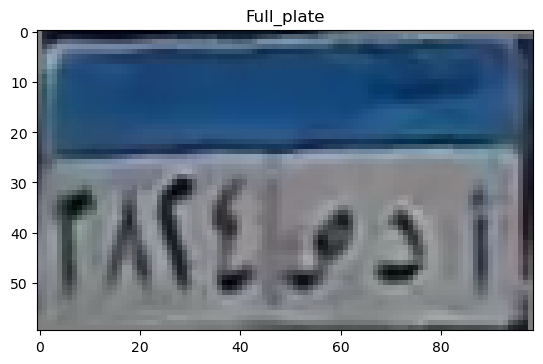

top
[0.21181904 0.31624785 0.35309189 0.42613555 0.49376561 0.48271663
 0.47767824 0.49471012 0.50823556 0.51483397 0.52232309 0.5282643
 0.5273535  0.52443064 0.52773402 0.54096805 0.55509687 0.57355771
 0.60754572 0.61017151 0.61701176 0.6213875  0.61693995 0.60085309
 0.58519275 0.57927975 0.57594029 0.57559716 0.57634471 0.57628574
 0.58902022 0.57589216 0.58529779 0.59313402 0.59318118 0.60224441
 0.60369453 0.59941755 0.60153108 0.60367569 0.60612667 0.61297409
 0.61936196 0.62025044 0.60404333 0.55480926 0.52218059 0.51911686
 0.54742569]
[0.26560129 0.36037605 0.38950596 0.48445516 0.55036333 0.55325555
 0.54927353 0.55969096 0.57354436 0.58185402 0.58906083 0.5920174
 0.59561438 0.58570183 0.57799536 0.56433977 0.56014296 0.55574338
 0.55650991 0.54911589 0.54395059 0.54186697 0.54402433 0.54091158
 0.54084603 0.56590947 0.58059453 0.59824626 0.62240667 0.61820656
 0.60280196 0.5767612  0.548873   0.53636024 0.53080525 0.54769439
 0.55375415 0.54457462 0.54410142 0.54477673 0.

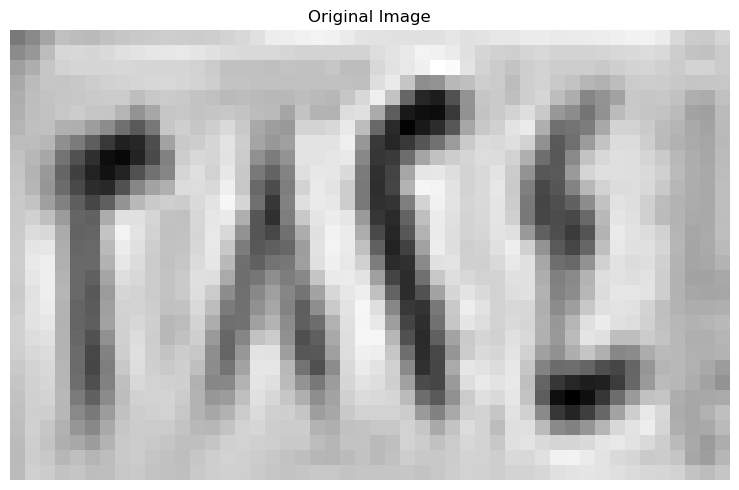

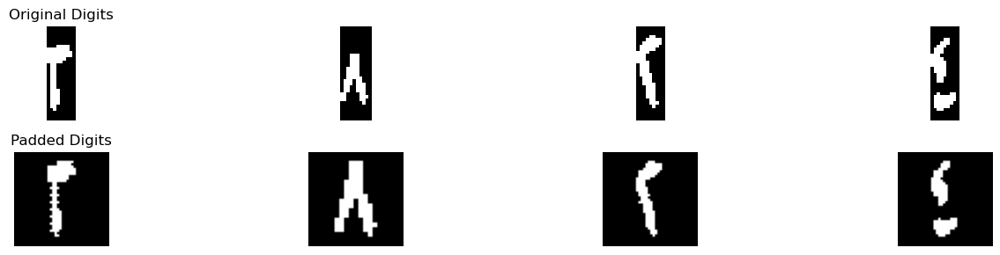

Best match: ٢
Full comparison results: {'١': 0.40625, '٢': 4.177083333333334, '٣': 4.0109326625387, '٤': 1.6234661172161173, '٥': 2.560961226595902, '٦': 1.4535714285714285, '٧': 1.0415441176470588, '٨': 0.611111111111111, '٩': 0.9627953745600805}
Confidence :  0.08307533539731704
Best match: ٨
Full comparison results: {'١': 2.708333333333333, '٢': 1.5416666666666665, '٣': 0.9367690058479531, '٤': 1.8854166666666665, '٥': 1.7143640350877192, '٦': 1.2381944444444444, '٧': 0.6694444444444445, '٨': 6.195138888888889, '٩': 3.2777777777777777}
Confidence :  1.4586805555555555
Best match: ٢
Full comparison results: {'١': 1.2272727272727273, '٢': 7.846226689976689, '٣': 4.045375386996904, '٤': 2.9724130036630036, '٥': 1.9500497567448032, '٦': 0.5767857142857142, '٧': 2.240808823529412, '٨': 0.6298611111111111, '٩': 1.5883295625942684}
Confidence :  1.9004256514898925
Best match: ٤
Full comparison results: {'١': 1.096590909090909, '٢': 3.2670454545454546, '٣': 2.123452012383901, '٤': 5.3744859

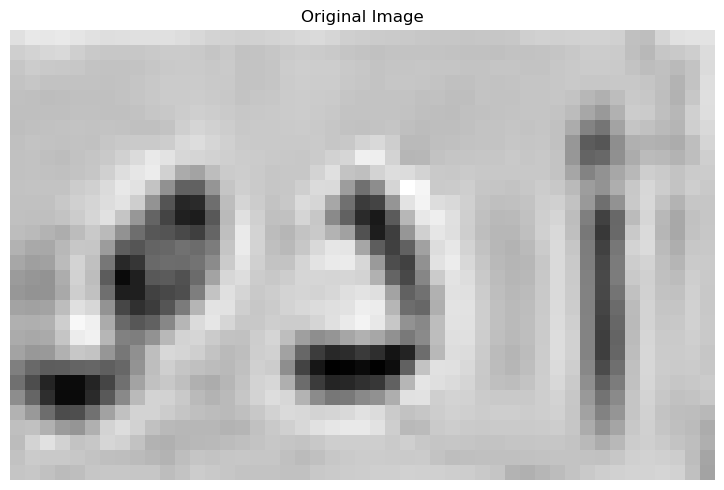

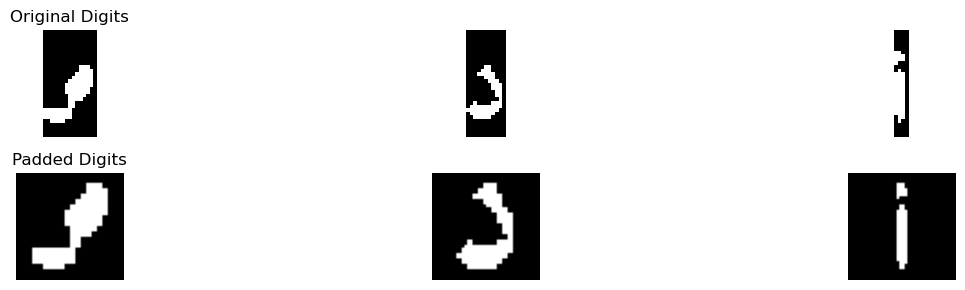

Best match: ص
Full comparison results: {'أ': 0.3526785714285714, 'ب': 0.812807881773399, 'ج': 0.5044642857142857, 'د': 2.763392857142857, 'ر': 2.2441502463054186, 'س': 4.25, 'ص': 5.0651785714285715, 'ط': 1.9017857142857142, 'ع': 0.53125, 'ف': 3.066964285714286, 'ق': 2.4330357142857144, 'ك': 1.9375, 'ل': 1.6785714285714288, 'م': 0.3125, 'ن': 1.6160714285714284, 'ه': 2.53125, 'و': 3.0401785714285716, 'ي': 3.2544642857142856}
Confidence :  0.40758928571428577
Best match: د
Full comparison results: {'أ': 0.42857142857142855, 'ب': 0.09375, 'ج': 2.695206464228203, 'د': 5.9227435064935054, 'ر': 2.201777147140715, 'س': 1.4732142857142856, 'ص': 0.9544642857142858, 'ط': 3.007040513833992, 'ع': 1.244047619047619, 'ف': 4.175925925925926, 'ق': 3.552083333333333, 'ك': 1.5369318181818183, 'ل': 2.385416666666667, 'م': 1.3612012987012987, 'ن': 3.9532142857142856, 'ه': 3.3952956989247314, 'و': 3.548611111111111, 'ي': 2.1424520226150663}
Confidence :  0.8734087902837899
Best match: أ
Full comparison resu

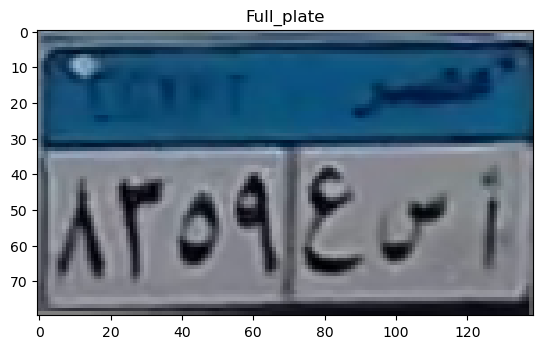

2.0 68.0 2.0 44.0
top
[0.47356004 0.59305616 0.5801762  0.57009113 0.56312581 0.55962326
 0.54994189 0.54166983 0.54177706 0.54606627 0.54631137 0.54549051
 0.54148565 0.54032529 0.57082055 0.57092266 0.5765936  0.5816577
 0.58353205 0.57677543 0.58274902 0.5771015  0.57344601 0.56288047
 0.55278907 0.54912538 0.54790241 0.54553341 0.54022709 0.53739607
 0.53868206 0.53911819 0.54147626 0.55231439 0.56618049 0.56903711
 0.56684004 0.56245545 0.55803846 0.54110784 0.52269494 0.51946691
 0.5258048  0.54043007 0.54961905 0.54350873 0.53547195 0.53280376
 0.52790451 0.53026642 0.53360347 0.53119038 0.53064289 0.52602951
 0.51996768 0.5240611  0.52874713 0.53432625 0.52626348 0.52683729
 0.52493583 0.52660339 0.52706152 0.53216846 0.52487978 0.55166164]
[0.45313491 0.59283555 0.55466577 0.53240074 0.53136942 0.53551278
 0.5346696  0.52349028 0.52304917 0.52658098 0.53050255 0.53099657
 0.53455433 0.52743116 0.52958255 0.53409435 0.53699399 0.53546054
 0.53683922 0.52603575 0.53497341 0.5368

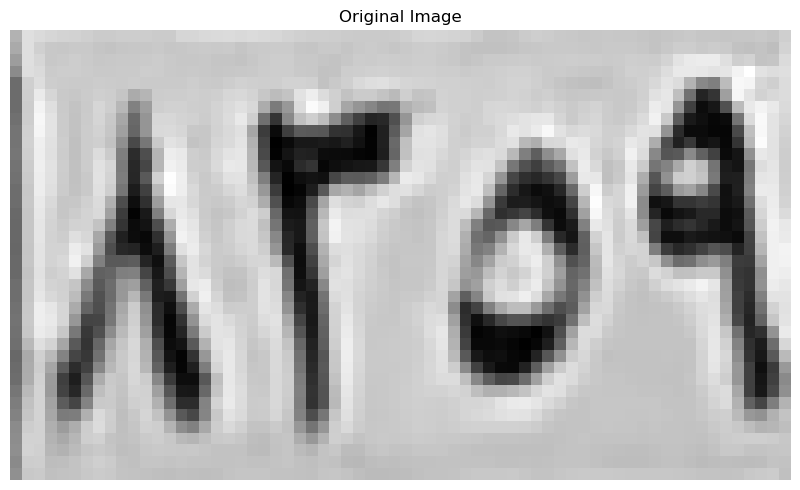

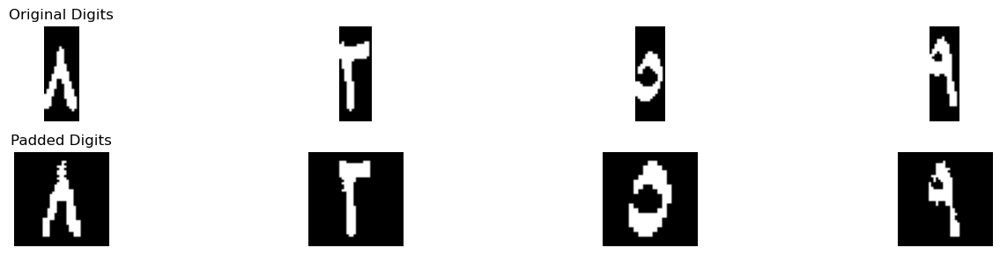

Best match: ٨
Full comparison results: {'١': 2.28125, '٢': 0.375, '٣': 0.6838235294117647, '٤': 1.3125, '٥': 0.9883440218192541, '٦': 0.9625, '٧': 0.9294117647058824, '٨': 6.597222222222222, '٩': 3.0592320261437904}
Confidence :  1.768995098039216
Best match: ٣
Full comparison results: {'١': 0.20192307692307693, '٢': 4.778846153846153, '٣': 5.050019349845201, '٤': 2.160210622710623, '٥': 1.7461807091257555, '٦': 2.3029761904761905, '٧': 1.155514705882353, '٨': 0.275, '٩': 0.5384458270487683}
Confidence :  0.13558659799952366
Best match: ٥
Full comparison results: {'١': 0.4444444444444444, '٢': 1.5138888888888888, '٣': 1.1822002923976607, '٤': 2.8263888888888884, '٥': 7.622859231411863, '٦': 1.463888888888889, '٧': 0.7069444444444444, '٨': 0.9694444444444446, '٩': 0.7013888888888888}
Confidence :  2.3982351712614873
Best match: ٩
Full comparison results: {'١': 4.211538461538461, '٢': 2.310096153846154, '٣': 1.1156153250773992, '٤': 1.9300366300366303, '٥': 0.8140802373581011, '٦': 0.986

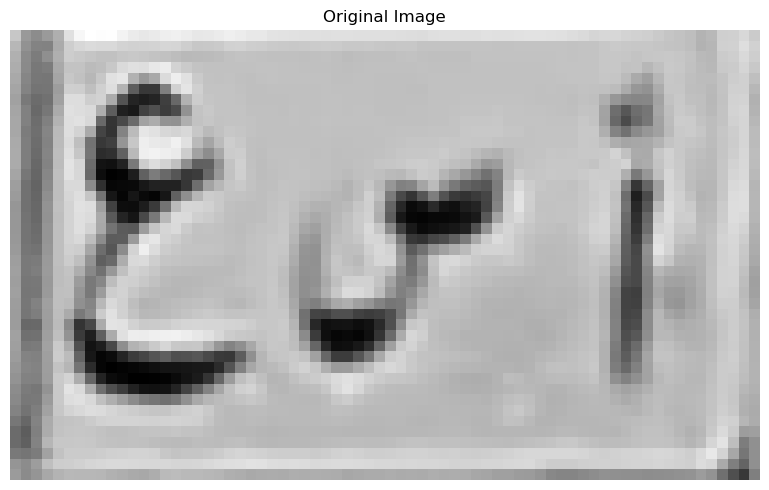

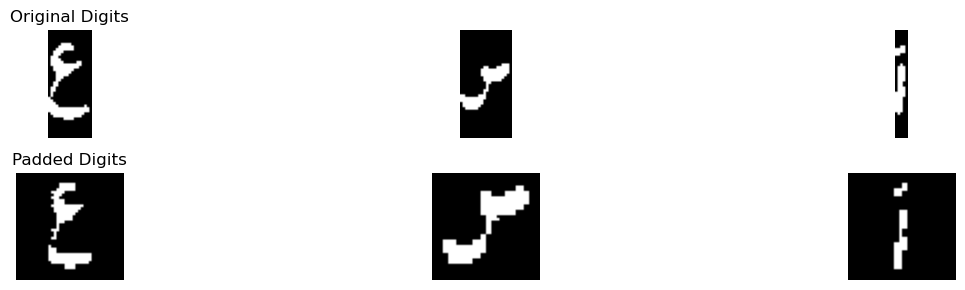

Best match: ع
Full comparison results: {'أ': 0.4375, 'ب': 0.16781609195402297, 'ج': 2.5185789049919487, 'د': 2.5794700227246667, 'ر': 0.5861375562218891, 'س': 0.36160714285714285, 'ص': 0.4595238095238095, 'ط': 1.700798748353096, 'ع': 4.468421052631579, 'ف': 1.4273531049846837, 'ق': 0.9100581314397104, 'ك': 2.0520833333333335, 'ل': 1.2374871001031993, 'م': 1.8977272727272727, 'ن': 2.743095238095238, 'ه': 0.8935483870967742, 'و': 1.2495039682539684, 'ي': 1.007469342251951}
Confidence :  0.8626629072681706
Best match: س
Full comparison results: {'أ': 0.53125, 'ب': 0.625, 'ج': 0.40625, 'د': 1.5, 'ر': 0.3125, 'س': 4.884626436781609, 'ص': 3.3122126436781607, 'ط': 0.46875, 'ع': 0.34375, 'ف': 1.1875, 'ق': 0.4375, 'ك': 0.65625, 'ل': 0.46875, 'م': 1.53125, 'ن': 0.6875, 'ه': 2.0829741379310347, 'و': 0.625, 'ي': 0.84375}
Confidence :  0.7862068965517242
Best match: أ
Full comparison results: {'أ': 3.030228311269746, 'ب': 0.19073275862068967, 'ج': 0.549746951920865, 'د': 0.589216911113196, 'ر': 0.2

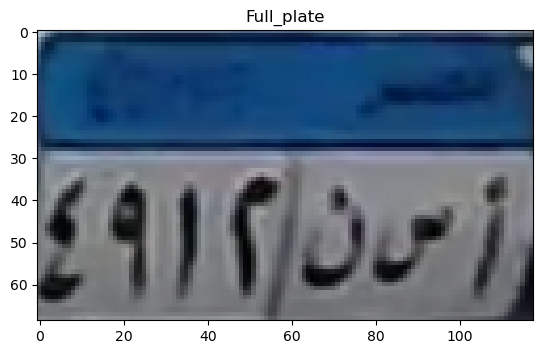

top
[0.40685412 0.3861451  0.46571529 0.5354702  0.56070392 0.56688039
 0.57136745 0.57136745 0.5640898  0.55652941 0.53161608 0.51509647
 0.51198549 0.50973059 0.51278118 0.51808667 0.52086941 0.51889725
 0.51497569 0.50713255 0.50240039 0.49681216 0.50187255 0.51644275
 0.52205373 0.53158627 0.53717451 0.53436902 0.51307176 0.50662745
 0.52509647 0.53769451 0.53572235 0.53180078 0.52395765 0.51611451
 0.50827137 0.5043498  0.5043498  0.5043498  0.5043498  0.5043498
 0.5043498  0.5043498  0.5043498  0.50827137 0.51219294 0.52003608
 0.52003608 0.52003608 0.51556392 0.51473059 0.51810157 0.52819961
 0.53604275 0.53996431 0.53996431 0.52819961 0.49262275]
[0.40430157 0.42252549 0.5063     0.57997647 0.61472    0.63068902
 0.63909765 0.64722353 0.65534941 0.65898824 0.64667294 0.63490824
 0.6248102  0.61668431 0.60266471 0.5886451  0.58555686 0.59031176
 0.6004098  0.60433137 0.60602078 0.60490471 0.60126588 0.60043255
 0.60295529 0.59903373 0.60295529 0.61051569 0.60573804 0.61049294
 0

C:\Users\PC\AppData\Local\Temp\ipykernel_8100\3822375833.py:10: RuntimeWarning: divide by zero encountered in scalar divide
  aspect_ratio = (Xmax-Xmin)/(Ymax-Ymin)


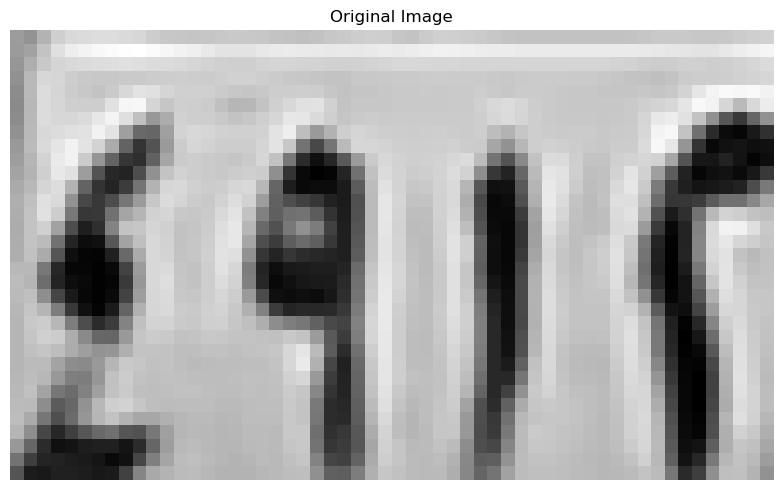

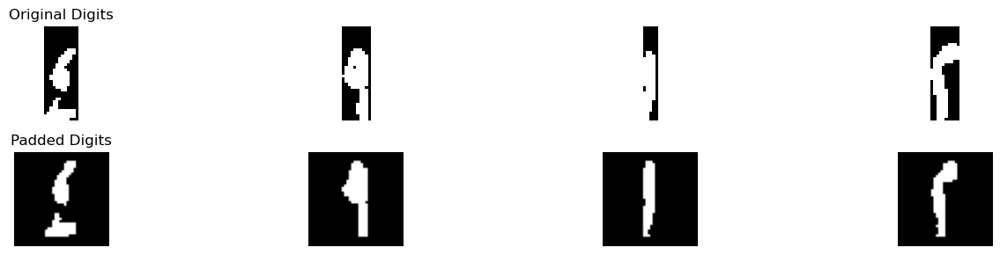

Best match: ٤
Full comparison results: {'١': 2.432692307692308, '٢': 1.0, '٣': 1.3343653250773992, '٤': 3.29757326007326, '٥': 2.20734280554327, '٦': 0.2857142857142857, '٧': 0.3463235294117647, '٨': 2.339583333333333, '٩': 1.4679958521870289}
Confidence :  0.4324404761904761
Best match: ١
Full comparison results: {'١': 3.914772727272727, '٢': 2.460518648018648, '٣': 0.9901315789473684, '٤': 1.5245192307692308, '٥': 2.279559192097892, '٦': 2.126785714285714, '٧': 0.8069852941176471, '٨': 2.204861111111111, '٩': 2.98073780794369}
Confidence :  0.46701745966451846
Best match: ١
Full comparison results: {'١': 3.6062499999999997, '٢': 1.9189248251748252, '٣': 1.43546826625387, '٤': 2.0780906593406594, '٥': 1.098311034940292, '٦': 0.14285714285714285, '٧': 0.9125, '٨': 2.0965277777777778, '٩': 0.9835030165912518}
Confidence :  0.754861111111111
Best match: ٢
Full comparison results: {'١': 0.09375, '٢': 4.187281468531468, '٣': 3.434404024767802, '٤': 2.419139194139194, '٥': 1.699741080642783

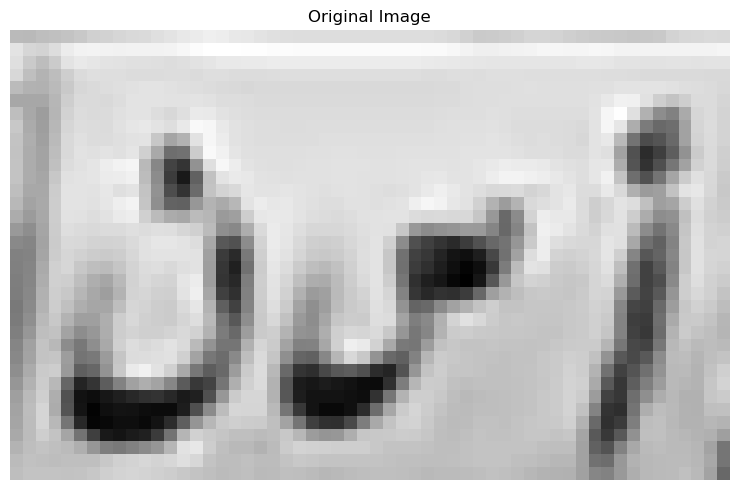

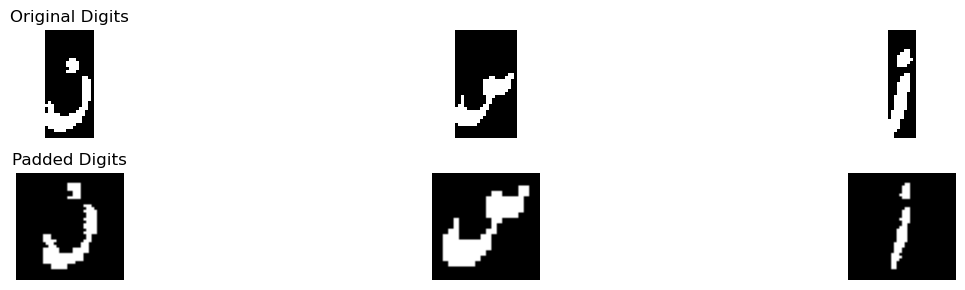

Best match: ن
Full comparison results: {'أ': 0.21350806451612903, 'ب': 0.25969827586206895, 'ج': 1.28602340694732, 'د': 3.66824494949495, 'ر': 2.9304512922110373, 'س': 1.6830357142857144, 'ص': 1.5913690476190476, 'ط': 1.4344614624505931, 'ع': 1.3592741935483872, 'ف': 2.89530103259942, 'ق': 3.376583034647551, 'ك': 0.9422348484848485, 'ل': 2.8622983870967738, 'م': 0.5613636363636364, 'ن': 4.43707757296467, 'ه': 1.4007392473118279, 'و': 2.3643998549240486, 'ي': 2.279779821627648}
Confidence :  0.38441631173486
Best match: س
Full comparison results: {'أ': 0.3125, 'ب': 0.6270833333333333, 'ج': 0.59375, 'د': 1.8125, 'ر': 0.4375, 'س': 5.5770833333333325, 'ص': 3.689583333333333, 'ط': 0.375, 'ع': 0.28125, 'ف': 1.375, 'ق': 0.71875, 'ك': 0.34375, 'ل': 0.5625, 'م': 1.125, 'ن': 1.03125, 'ه': 2.575, 'و': 0.84375, 'ي': 1.03125}
Confidence :  0.9437499999999996
Best match: أ
Full comparison results: {'أ': 1.7549059139784946, 'ب': 0.2636770557029178, 'ج': 0.18219461697722567, 'د': 0.41203281525262947, 

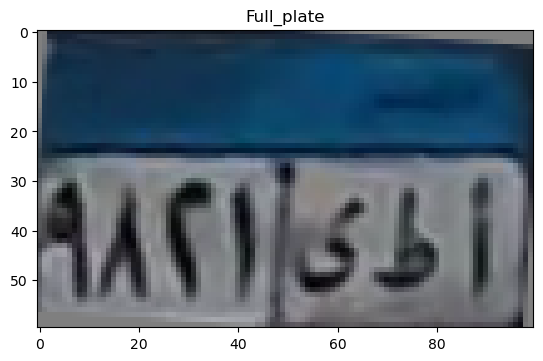

0.0 48.0 2.0 35.0
top
[0.27838153 0.33081073 0.38158239 0.38980246 0.38141571 0.41843147
 0.45067213 0.47796922 0.52416407 0.52671615 0.50937535 0.4826915
 0.47501116 0.47118631 0.46903739 0.48734162 0.50294042 0.52175073
 0.53447987 0.55105007 0.57275214 0.56054948 0.53825247 0.53849912
 0.55001266 0.56300686 0.55863861 0.55600691 0.55003524 0.54761604
 0.57593082 0.57298702 0.5763428  0.55885389 0.55758487 0.55030309
 0.55779372 0.55697344 0.54633015 0.54721858 0.54612775 0.5574771
 0.54699347 0.52675762 0.54387774 0.54216983 0.48354627 0.4332149 ]
[0.29952977 0.36938566 0.42715055 0.44123099 0.43061024 0.43284247
 0.45187924 0.46997549 0.58350153 0.56681031 0.50561624 0.48002268
 0.47028932 0.47285412 0.47246246 0.48107878 0.49251799 0.50442642
 0.51840431 0.53239701 0.55111278 0.53697804 0.50766702 0.50282623
 0.51579875 0.5333951  0.53711532 0.56513462 0.57082197 0.56321505
 0.57269824 0.53152221 0.53536877 0.54117154 0.54899893 0.54295665
 0.52642612 0.52077311 0.5186361  0.52884

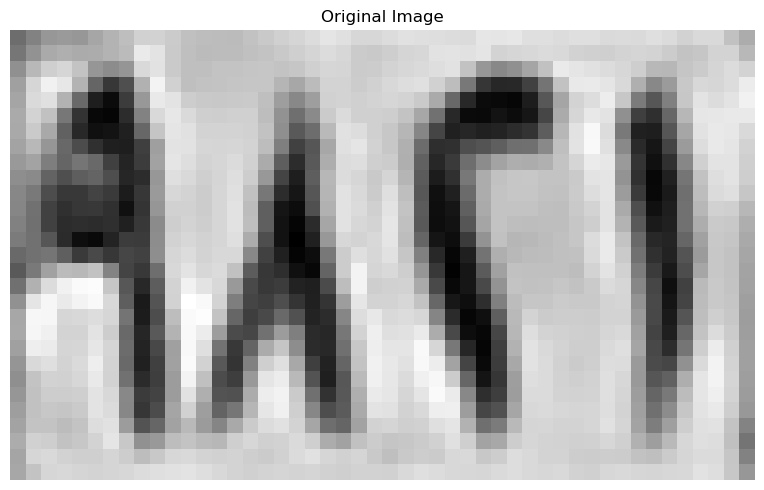

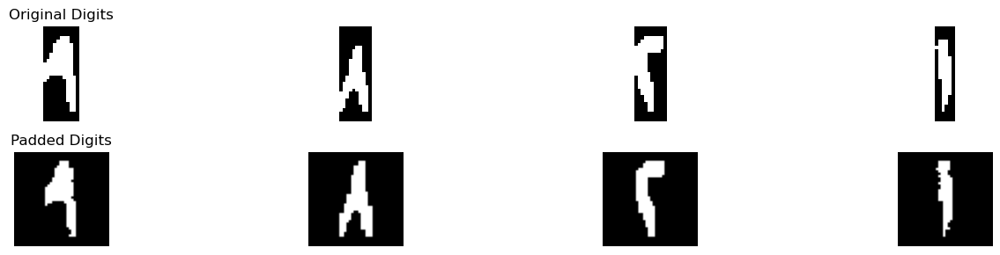

Best match: ٩
Full comparison results: {'١': 2.480769230769231, '٢': 2.3149038461538463, '٣': 1.0703366873065017, '٤': 1.6673763736263738, '٥': 2.39453412944125, '٦': 2.6907738095238094, '٧': 0.6841911764705881, '٨': 2.801388888888889, '٩': 4.920610231271997}
Confidence :  1.059610671191554
Best match: ٨
Full comparison results: {'١': 2.857142857142857, '٢': 0.7142857142857142, '٣': 0.5526315789473684, '٤': 1.4458333333333333, '٥': 1.2326358174848886, '٦': 1.2461309523809523, '٧': 0.968014705882353, '٨': 5.040277777777778, '٩': 2.330094537815126}
Confidence :  1.0915674603174603
Best match: ٢
Full comparison results: {'١': 0.8645833333333333, '٢': 7.257211538461538, '٣': 4.559404024767802, '٤': 3.1782051282051285, '٥': 2.264194493586908, '٦': 0.8767857142857143, '٧': 2.7194852941176473, '٨': 0.5805555555555556, '٩': 1.5153343388637506}
Confidence :  1.3489037568468683
Best match: ١
Full comparison results: {'١': 4.9035714285714285, '٢': 2.674096736596736, '٣': 1.1776315789473684, '٤': 

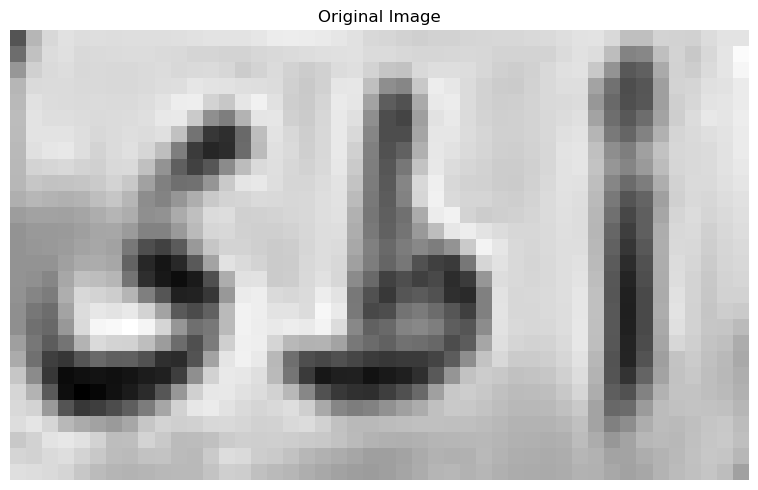

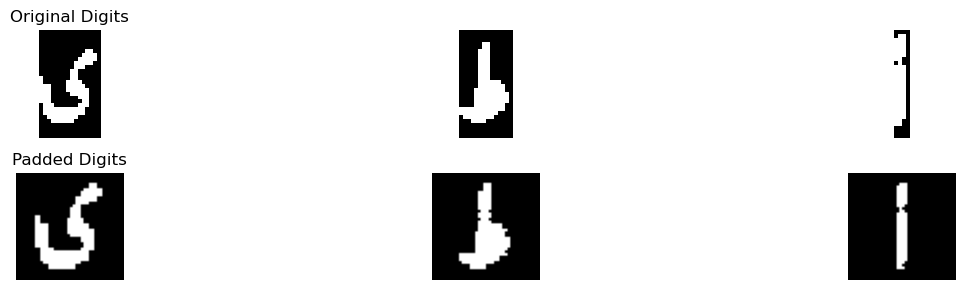

Best match: ي
Full comparison results: {'أ': 0.32, 'ب': 0.6131465517241379, 'ج': 1.9184722222222224, 'د': 3.21037037037037, 'ر': 2.5835775862068964, 'س': 1.7633928571428572, 'ص': 1.8508333333333333, 'ط': 2.0700000000000003, 'ع': 1.22, 'ف': 2.8034391534391534, 'ق': 2.3320833333333333, 'ك': 2.1862500000000002, 'ل': 2.68375, 'م': 0.19125, 'ن': 2.51875, 'ه': 1.09375, 'و': 3.0317592592592595, 'ي': 4.245352564102564}
Confidence :  0.5174910968660971
Best match: ط
Full comparison results: {'أ': 1.330592105263158, 'ب': 0.2781001326259947, 'ج': 1.3116214449166395, 'د': 2.5319158692185004, 'ر': 1.891117105920724, 'س': 1.2098214285714286, 'ص': 1.3642857142857143, 'ط': 4.131464097496706, 'ع': 0.73125, 'ف': 2.396233639654692, 'ق': 1.6158086187691452, 'ك': 1.4403409090909092, 'ل': 1.6858552631578947, 'م': 0.2230861244019139, 'ن': 1.7568703007518798, 'ه': 1.6923387096774194, 'و': 2.2743925786688943, 'ي': 2.577100569148624}
Confidence :  0.7771817641740411
Best match: أ
Full comparison results: {'أ': 

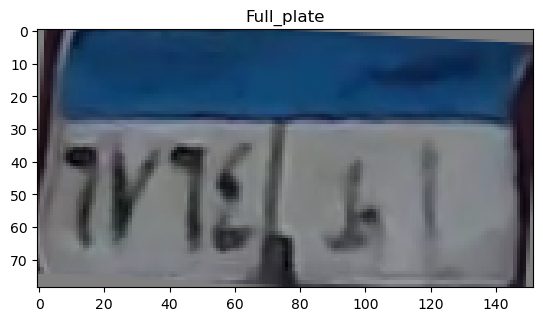

top
[0.18236351 0.06973504 0.07257281 0.21930765 0.39545256 0.40333686
 0.36626686 0.39569941 0.44249103 0.46893382 0.49040201 0.50358366
 0.50229697 0.50475777 0.5150199  0.52745824 0.54644213 0.53532907
 0.49315207 0.46551039 0.45148468 0.44671696 0.44223881 0.4383148
 0.43391585 0.45565789 0.48968612 0.50455451 0.51360627 0.52438865
 0.52716287 0.52100672 0.51074681 0.50407262 0.50519037 0.50505696
 0.50170168 0.50201751 0.50078819 0.49983078 0.5019256  0.50731776
 0.51550556 0.52495716 0.53006143 0.53583398 0.53593327 0.54555673
 0.56317069 0.56345684 0.54939258 0.53438988 0.52157371 0.51370547
 0.50837205 0.4999696  0.49995223 0.50167358 0.50475784 0.50352754
 0.49941706 0.49863581 0.50615667 0.51035804 0.51302348 0.5127554
 0.50902532 0.51280902 0.51948449 0.52155725 0.51182993 0.44451222
 0.35172863 0.30464461 0.29294118 0.38816176]
[0.15690719 0.07205107 0.07764767 0.23915676 0.40497828 0.39612179
 0.3589038  0.3857806  0.41250791 0.45003723 0.48768467 0.523901
 0.55020917 0.55

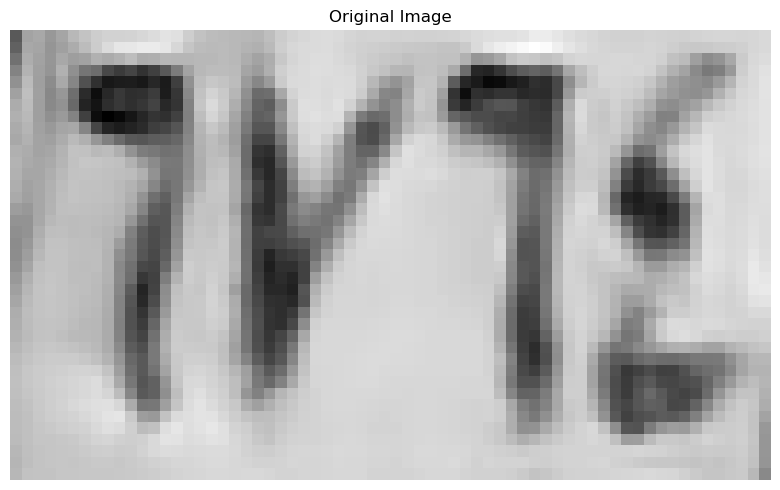

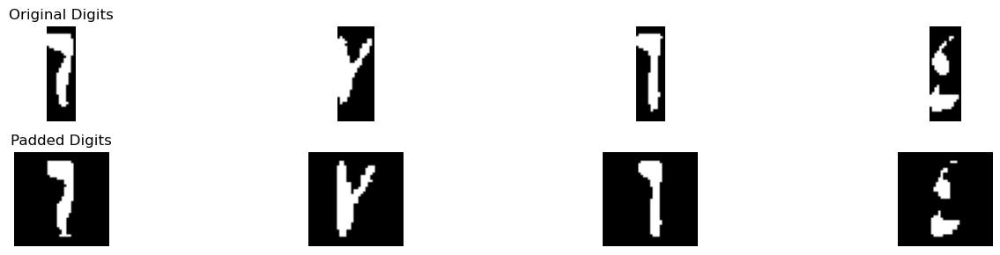

Best match: ٦
Full comparison results: {'١': 2.352272727272727, '٢': 3.3019376456876453, '٣': 1.7265866873065017, '٤': 0.6168040293040293, '٥': 2.5012853825740824, '٦': 3.850595238095238, '٧': 2.050735294117647, '٨': 0.5798611111111112, '٩': 1.4003425087983912}
Confidence :  0.27432879620379635
Best match: ٧
Full comparison results: {'١': 0.0, '٢': 0.8125, '٣': 1.4635255417956656, '٤': 1.3125, '٥': 0.9243559265811587, '٦': 0.26875, '٧': 3.4841911764705884, '٨': 0.59375, '٩': 0.5625}
Confidence :  1.0103328173374613
Best match: ٦
Full comparison results: {'١': 3.65625, '٢': 2.6276952214452214, '٣': 0.7603521671826625, '٤': 0.19642857142857142, '٥': 1.8825372254164825, '٦': 3.706845238095238, '٧': 1.0606617647058825, '٨': 0.46597222222222223, '٩': 1.7172574157868274}
Confidence :  0.02529761904761907
Best match: ٤
Full comparison results: {'١': 2.25, '٢': 0.15384615384615385, '٣': 0.41408668730650156, '٤': 4.718521062271062, '٥': 2.5210222246793452, '٦': 0.0, '٧': 0.3150735294117647, '٨'

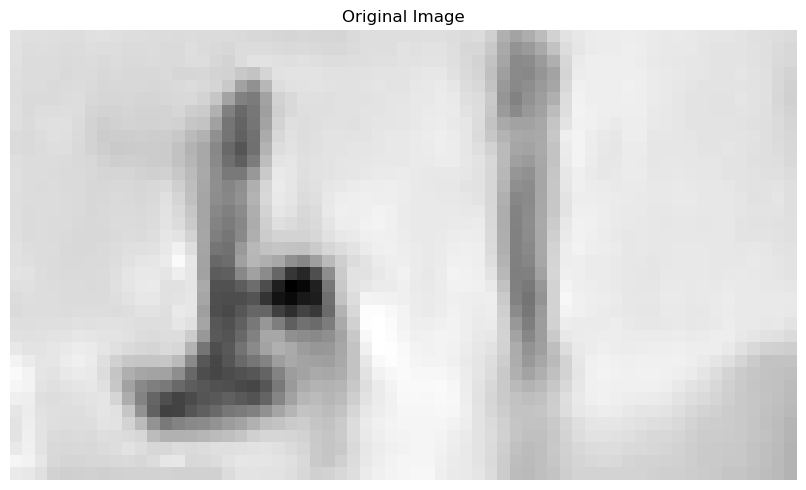

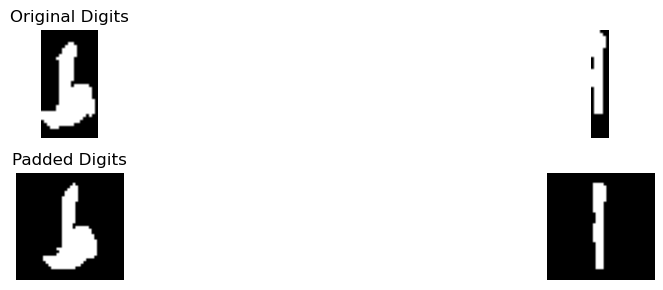

Best match: ط
Full comparison results: {'أ': 0.9500000000000001, 'ب': 0.20838859416445624, 'ج': 1.6869939038417299, 'د': 2.7604040404040404, 'ر': 2.6784673734561286, 'س': 0.8080357142857143, 'ص': 1.0666666666666667, 'ط': 5.022233201581027, 'ع': 1.13125, 'ف': 3.0340608465608465, 'ق': 2.1925925925925926, 'ك': 1.6865530303030303, 'ل': 2.1, 'م': 0.20170454545454547, 'ن': 2.0334523809523812, 'ه': 1.5631720430107527, 'و': 2.6126984126984127, 'ي': 2.89563127090301}
Confidence :  0.9940861775100904
Best match: أ
Full comparison results: {'أ': 3.288209706959707, 'ب': 0.03125, 'ج': 0.6616775937428111, 'د': 0.8094178237483192, 'ر': 0.0, 'س': 0.0, 'ص': 0.3181547619047619, 'ط': 1.417284255599473, 'ع': 0.09375, 'ف': 0.3680555555555556, 'ق': 0.08125, 'ك': 0.045454545454545456, 'ل': 0.0, 'م': 0.7539023476523476, 'ن': 0.46875, 'ه': 0.48111559139784943, 'و': 0.5345238095238095, 'ي': 0.33035714285714285}
Confidence :  0.935462725680117
[['٦', '٧', '٦', '٤'], ['ط', 'أ']]
Tilt angle: -1.00 degrees


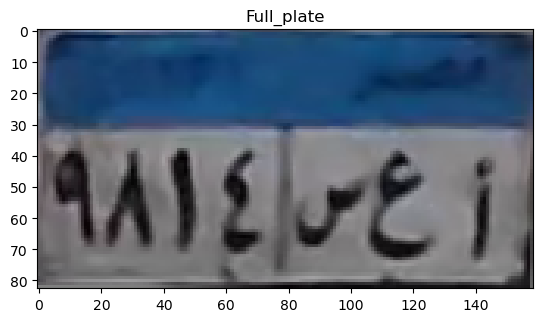

top
[0.45621502 0.43085623 0.45495541 0.48568452 0.51343919 0.52741841
 0.53172865 0.51594285 0.50445603 0.52504749 0.5138266  0.44518205
 0.41801493 0.42305722 0.47050466 0.49806151 0.49950794 0.48853564
 0.47701801 0.47167125 0.47871749 0.49811228 0.51066529 0.51923224
 0.52408824 0.53101581 0.53114282 0.535298   0.53496482 0.53203005
 0.53160509 0.53282244 0.5326556  0.53258667 0.53283176 0.53483085
 0.53148373 0.53111608 0.53111608 0.53600272 0.54006216 0.55317873
 0.55807686 0.55688772 0.54654718 0.52508885 0.51471661 0.51569505
 0.51682816 0.52087228 0.52079569 0.52257265 0.52214373 0.52947369
 0.53186339 0.53748916 0.5380751  0.53928527 0.53809042 0.5418964
 0.54231706 0.53845578 0.54051234 0.53926735 0.54046574 0.54119309
 0.53419694 0.53899961 0.53802241 0.55293482 0.55369372 0.55749086
 0.55070517 0.54652702 0.54645808 0.53896261 0.51303337 0.47645367
 0.41994985]
[0.46653676 0.43227463 0.44100778 0.4875288  0.52313377 0.53323941
 0.53058387 0.52242836 0.51369225 0.49729366 0

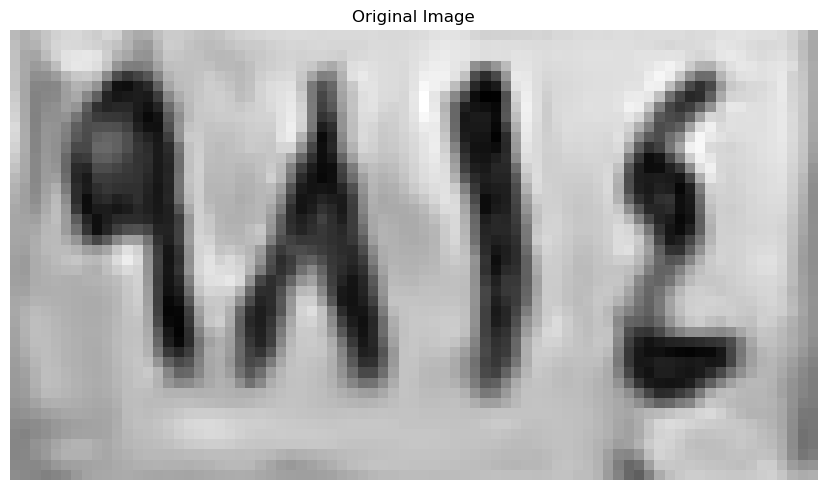

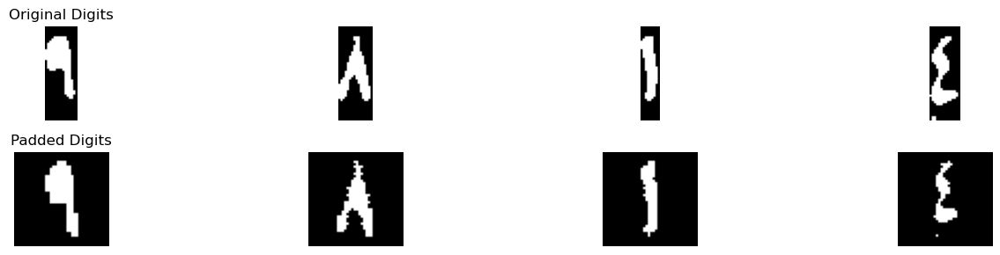

Best match: ٩
Full comparison results: {'١': 2.3839285714285716, '٢': 2.9642857142857144, '٣': 2.1448335913312695, '٤': 2.3910714285714283, '٥': 3.1428110717971394, '٦': 2.4407738095238094, '٧': 1.1845588235294118, '٨': 3.0944444444444446, '٩': 5.060311624649859}
Confidence :  0.95875027642636
Best match: ٨
Full comparison results: {'١': 2.447916666666667, '٢': 0.7604166666666666, '٣': 0.6875, '٤': 1.1270833333333334, '٥': 0.7876907341884121, '٦': 1.3458333333333332, '٧': 0.981985294117647, '٨': 5.741666666666667, '٩': 2.839501633986928}
Confidence :  1.4510825163398695
Best match: ١
Full comparison results: {'١': 5.927678571428571, '٢': 2.171765734265734, '٣': 1.1677631578947367, '٤': 1.9345009157509157, '٥': 1.500340925844022, '٦': 0.7333333333333333, '٧': 0.8676470588235294, '٨': 2.3256944444444443, '٩': 1.9424176721970838}
Confidence :  1.8009920634920635
Best match: ١
Full comparison results: {'١': 2.1, '٢': 1.495847902097902, '٣': 1.1817917956656347, '٤': 1.3685668498168497, '٥':

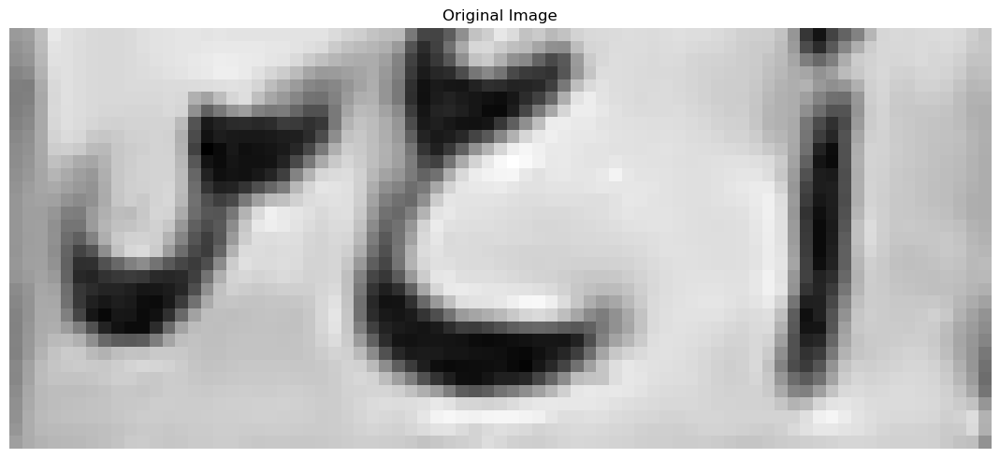

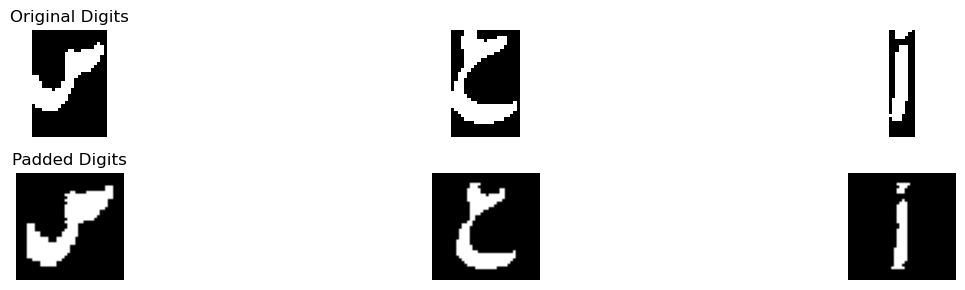

Best match: س
Full comparison results: {'أ': 0.40625, 'ب': 0.65625, 'ج': 0.53125, 'د': 1.78125, 'ر': 0.375, 'س': 5.320833333333333, 'ص': 4.220833333333333, 'ط': 0.46875, 'ع': 0.3125, 'ف': 1.21875, 'ق': 0.65625, 'ك': 0.6875, 'ل': 0.46875, 'م': 1.21875, 'ن': 0.875, 'ه': 2.664583333333333, 'و': 1.3125, 'ي': 1.0}
Confidence :  0.5499999999999998
Best match: ج
Full comparison results: {'أ': 0.045454545454545456, 'ب': 0.30860411140583555, 'ج': 4.000109793588054, 'د': 2.8523021885521884, 'ر': 1.5320018399890964, 'س': 0.6785714285714286, 'ص': 0.27840909090909094, 'ط': 1.566493741765481, 'ع': 3.008522727272727, 'ف': 1.8141835016835017, 'ق': 1.0740740740740742, 'ك': 2.2954545454545454, 'ل': 1.2102272727272727, 'م': 1.5113636363636365, 'ن': 2.3973863636363637, 'ه': 1.0748655913978493, 'و': 1.1245791245791246, 'ي': 1.4103064507955811}
Confidence :  0.4957935331576635
Best match: أ
Full comparison results: {'أ': 2.7843406593406597, 'ب': 0.25, 'ج': 0.11820652173913043, 'د': 0.5804908084977745, 'ر': 

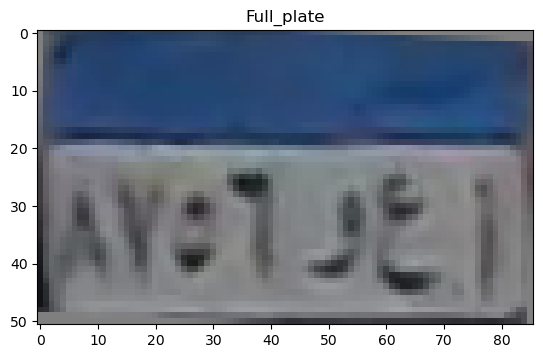

top
[0.29386544 0.3916435  0.48674391 0.52505749 0.53305695 0.49453
 0.46718431 0.48849721 0.50364888 0.51761998 0.5273385  0.53177485
 0.53143819 0.52659382 0.55811467 0.5671788  0.57929398 0.57140696
 0.56199145 0.55482235 0.54414571 0.53725321 0.54393301 0.5644451
 0.57098701 0.54144613 0.54832721 0.57438025 0.5936526  0.59341647
 0.57546613 0.56976804 0.56010577 0.55957756 0.56348151 0.56685926
 0.59026419 0.59115089 0.57637991 0.55813925 0.55061398 0.54716346
 0.55225343]
[0.27300098 0.39888922 0.47489518 0.51337534 0.52835925 0.51131922
 0.49668993 0.48975059 0.49309771 0.49888355 0.50203919 0.50646627
 0.5019626  0.49568196 0.51393349 0.51661983 0.52300004 0.52889005
 0.53372743 0.53171127 0.52191501 0.51486078 0.51569565 0.5057462
 0.49997902 0.52502364 0.53407108 0.551036   0.55998915 0.56608887
 0.56011518 0.55996191 0.5646155  0.53023583 0.55114053 0.55138369
 0.5494889  0.55244373 0.52245691 0.51598066 0.50600381 0.49871154
 0.50070644]
[0.25783529 0.39852157 0.46543333 0.4

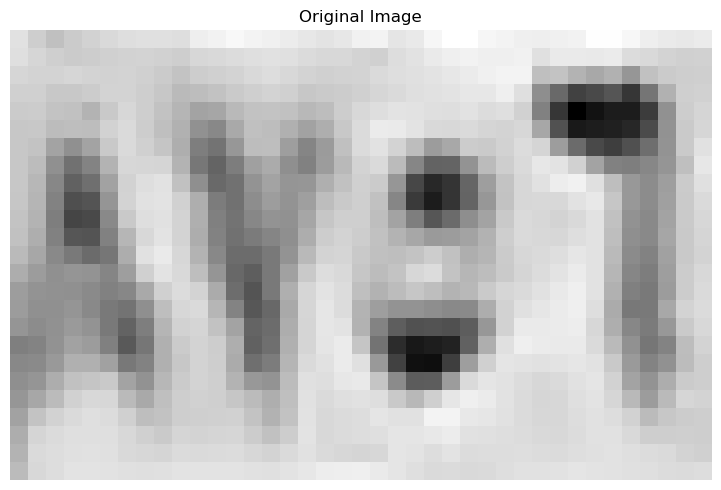

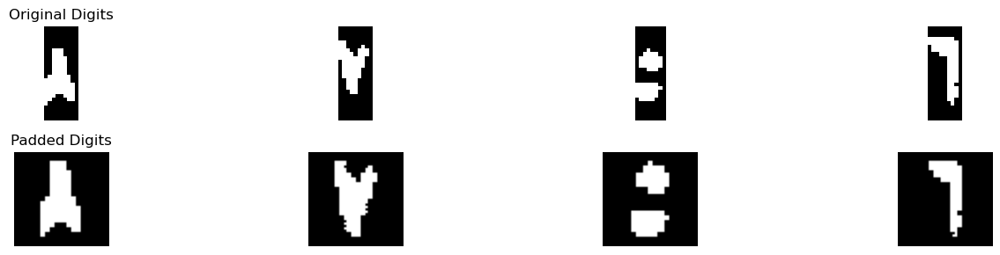

Best match: ٨
Full comparison results: {'١': 2.1158088235294117, '٢': 2.386029411764706, '٣': 1.571981424148607, '٤': 1.880514705882353, '٥': 4.00733911985847, '٦': 1.3411764705882354, '٧': 0.8632352941176471, '٨': 4.733660130718954, '٩': 3.123978758169935}
Confidence :  0.36316050543024225
Best match: ٧
Full comparison results: {'١': 0.7222222222222221, '٢': 0.8333333333333331, '٣': 1.9130116959064325, '٤': 1.5694444444444444, '٥': 2.179015246449457, '٦': 1.376388888888889, '٧': 2.985416666666667, '٨': 1.21875, '٩': 1.3715277777777777}
Confidence :  0.40320071010860503
Best match: ٥
Full comparison results: {'١': 0.875, '٢': 1.71875, '٣': 1.31046826625387, '٤': 3.1875, '٥': 6.061546329057938, '٦': 1.61875, '٧': 0.9132352941176471, '٨': 1.3381944444444445, '٩': 0.7083333333333333}
Confidence :  1.437023164528969
Best match: ٦
Full comparison results: {'١': 2.017857142857143, '٢': 0.7589285714285714, '٣': 1.1843072755417956, '٤': 0.0, '٥': 2.8997908373875867, '٦': 6.197916666666666, '٧'

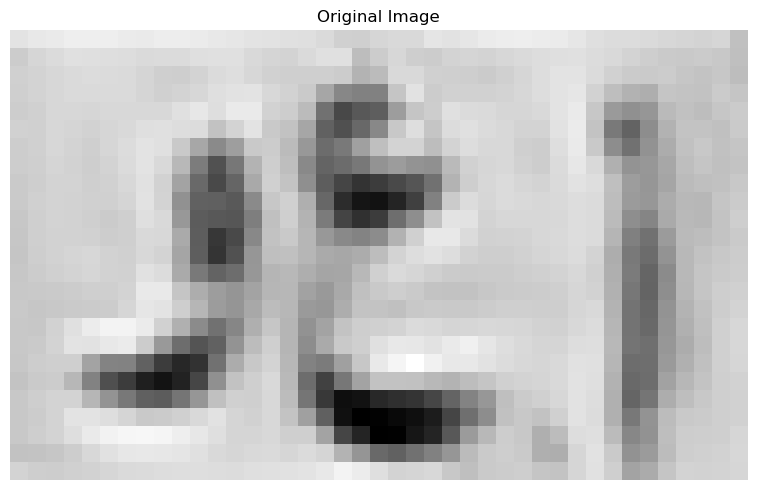

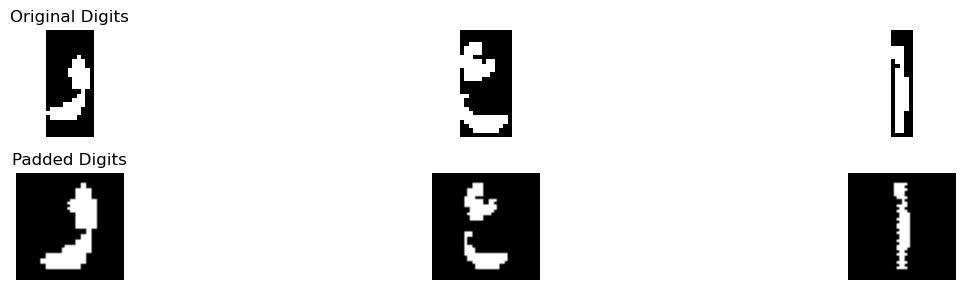

Best match: و
Full comparison results: {'أ': 0.047619047619047616, 'ب': 0.3879310344827586, 'ج': 1.2197420634920635, 'د': 4.029089706589707, 'ر': 3.995833154851146, 'س': 2.553571428571429, 'ص': 1.4785714285714286, 'ط': 2.64159255599473, 'ع': 1.2767857142857142, 'ف': 3.388227513227513, 'ق': 3.299603174603175, 'ك': 1.7556818181818181, 'ل': 3.5089285714285716, 'م': 0.3068181818181818, 'ن': 2.6989285714285716, 'ه': 3.0442876344086023, 'و': 4.676752645502646, 'ي': 2.882026397515528}
Confidence :  0.32383146945646946
Best match: ع
Full comparison results: {'أ': 0.21875, 'ب': 0.409565649867374, 'ج': 2.331457039337474, 'د': 2.299647424388003, 'ر': 1.146932783608196, 'س': 0.29910714285714285, 'ص': 0.03225806451612903, 'ط': 1.6124341238471673, 'ع': 4.51813369630974, 'ف': 1.1813735728209411, 'ق': 0.828042328042328, 'ك': 1.6770833333333333, 'ل': 1.508793122512163, 'م': 1.6988636363636362, 'ن': 2.418452380952381, 'ه': 0.8915322580645162, 'و': 1.029265873015873, 'ي': 1.3715045522110738}
Confidence :

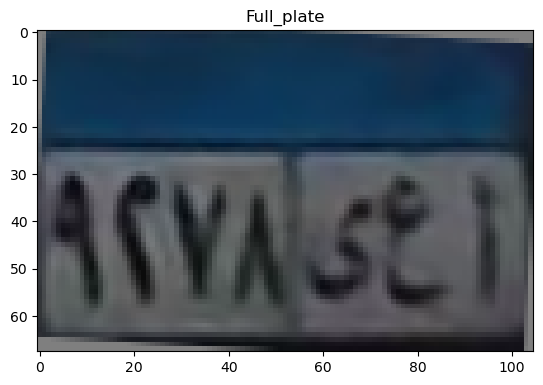

0.0 51.0 2.0 35.0
top
[0.28125024 0.33629268 0.41950827 0.43315063 0.39492516 0.31784548
 0.19160583 0.11533368 0.20216696 0.35157634 0.43825413 0.44906441
 0.42786207 0.41756024 0.42067867 0.43066771 0.44644023 0.45947904
 0.44335578 0.3606     0.23042648 0.15748203 0.14472585 0.18555918
 0.27464619 0.35122726 0.39435944 0.3785367  0.35766602 0.35352035
 0.35918838 0.36992046 0.38331322 0.39478872 0.4027843  0.40766016
 0.40863381 0.40376974 0.39204149 0.38262664 0.37697824 0.37119503
 0.36922368 0.36946347 0.37538647 0.38378516 0.3898196  0.38817688
 0.38165867 0.37922631 0.38667498]
[0.27148268 0.3235496  0.40535965 0.41470864 0.35646831 0.25232422
 0.11815403 0.04141074 0.08152956 0.22330538 0.38769153 0.44403512
 0.43495605 0.43044725 0.42534238 0.43350343 0.45102417 0.4483645
 0.36823664 0.22383545 0.08173663 0.08541237 0.09460895 0.07967529
 0.14656408 0.2870903  0.39885577 0.37959154 0.34462352 0.3039346
 0.30399242 0.35075501 0.39048629 0.40468624 0.40893249 0.40780018
 0.4049

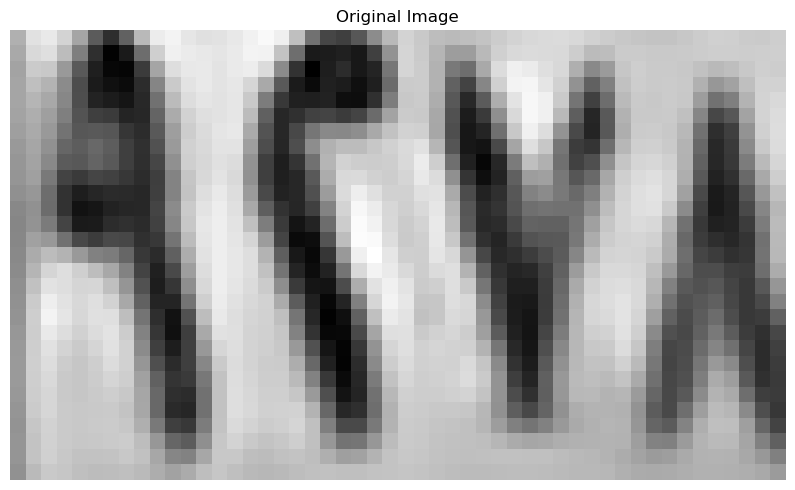

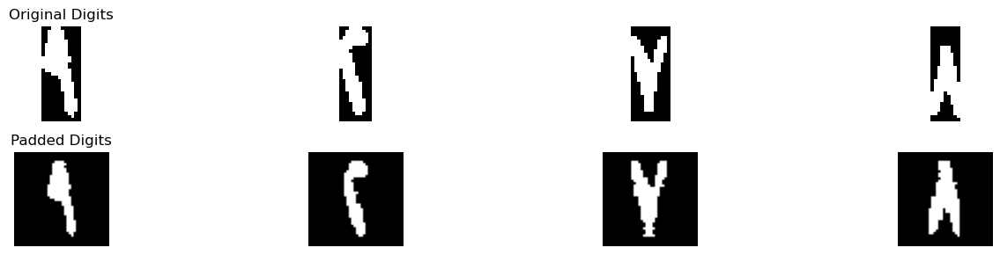

Best match: ٩
Full comparison results: {'١': 4.572916666666667, '٢': 2.287660256410257, '٣': 1.484423374613003, '٤': 2.954258241758242, '٥': 1.6931621332743623, '٦': 1.6083333333333334, '٧': 0.7466911764705882, '٨': 3.239583333333333, '٩': 5.186635872297638}
Confidence :  0.3068596028154853
Best match: ٢
Full comparison results: {'١': 1.6562499999999998, '٢': 6.964379370629371, '٣': 3.2250386996904026, '٤': 2.9631868131868133, '٥': 2.5559486952675807, '٦': 0.7461309523809523, '٧': 2.288235294117647, '٨': 0.6611111111111111, '٩': 1.4633295625942684}
Confidence :  1.8696703354694841
Best match: ٧
Full comparison results: {'١': 0.7333333333333334, '٢': 2.5124999999999997, '٣': 3.8234326625387, '٤': 2.291666666666667, '٥': 0.7012936753648829, '٦': 1.0833333333333333, '٧': 3.986764705882353, '٨': 1.3152777777777778, '٩': 1.8983660130718956}
Confidence :  0.08166602167182657
Best match: ٨
Full comparison results: {'١': 2.9519230769230766, '٢': 1.5096153846153848, '٣': 0.9942917956656346, '٤'

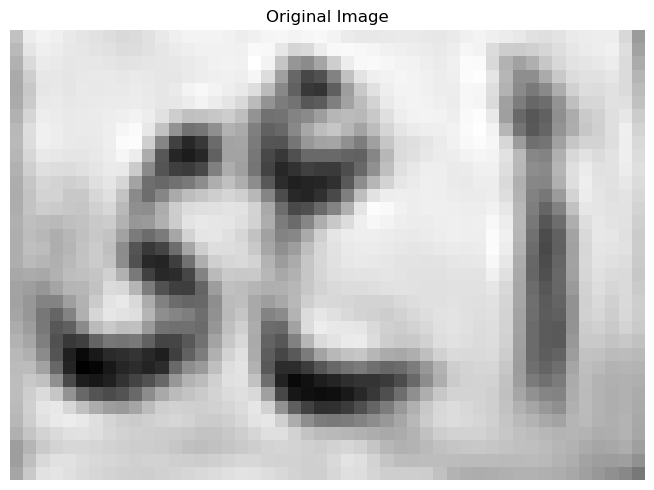

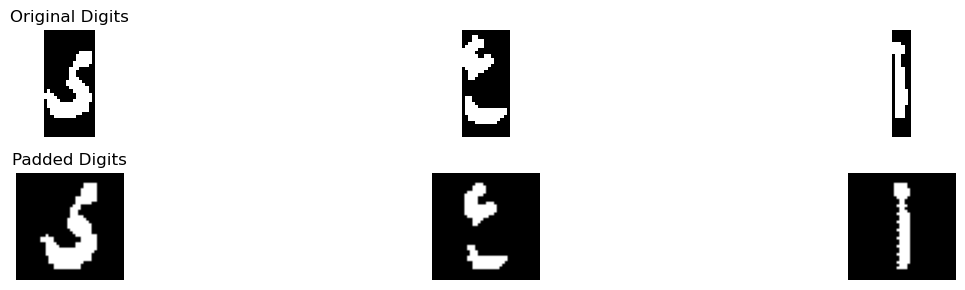

Best match: ي
Full comparison results: {'أ': 0.49107142857142855, 'ب': 0.4849137931034483, 'ج': 1.5659506556245688, 'د': 3.443449374699375, 'ر': 2.6812140358392234, 'س': 1.3169642857142856, 'ص': 1.9345238095238095, 'ط': 1.781455862977602, 'ع': 1.212797619047619, 'ف': 3.455853174603175, 'ق': 2.275628306878307, 'ك': 1.887310606060606, 'ل': 2.75, 'م': 0.12648809523809523, 'ن': 2.404821428571428, 'ه': 1.6455645161290322, 'و': 3.208829365079365, 'ي': 4.364819238732283}
Confidence :  0.45448303206455387
Best match: ع
Full comparison results: {'أ': 0.21875, 'ب': 0.2091346153846154, 'ج': 2.2604774001887944, 'د': 2.204026761422272, 'ر': 0.8825206146926537, 'س': 0.20089285714285715, 'ص': 0.0, 'ط': 1.4418231225296443, 'ع': 4.9978832718615225, 'ف': 1.1390253186730266, 'ق': 0.8081349206349207, 'ك': 1.9659090909090908, 'ل': 1.131954334365325, 'م': 2.0255681818181817, 'ن': 2.2873214285714285, 'ه': 0.5071908602150538, 'و': 1.0058041415800036, 'ي': 0.7470573206986251}
Confidence :  1.355280921645047
Be

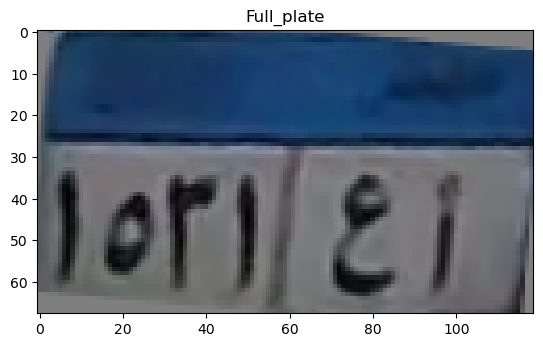

top
[0.40786958 0.34258786 0.36547275 0.4218289  0.44845881 0.46017113
 0.4610238  0.43512373 0.45389539 0.47205343 0.48068985 0.49463353
 0.50452039 0.51058657 0.5125148  0.50975993 0.50796058 0.50903338
 0.50930578 0.51387582 0.5157652  0.51756445 0.52213794 0.53195249
 0.54181431 0.54857336 0.53921202 0.53137654 0.53184376 0.53158456
 0.52655294 0.52335806 0.51661993 0.5097767  0.50752962 0.50734886
 0.51636694 0.52416926 0.53047677 0.54212007 0.54183694 0.53406175
 0.53395667 0.54098164 0.54947752 0.54196013 0.53397706 0.52844719
 0.52666735 0.52450833 0.52811507 0.534531   0.53955939 0.54354425
 0.55192129 0.55249942 0.54780276 0.56788142 0.5651907 ]
[0.40406637 0.33915216 0.36588234 0.4179726  0.45403667 0.45505312
 0.44358078 0.40342207 0.43183491 0.45976212 0.46218536 0.46639845
 0.46210103 0.45497148 0.46299159 0.46993093 0.46996157 0.47118706
 0.47661751 0.47948966 0.48969832 0.48570138 0.48413525 0.48802342
 0.4910251  0.49854248 0.5101372  0.51224551 0.5111593  0.51199634
 

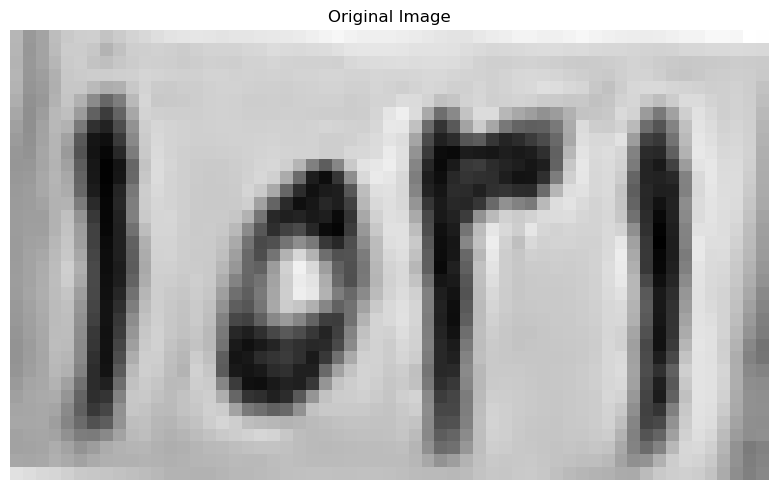

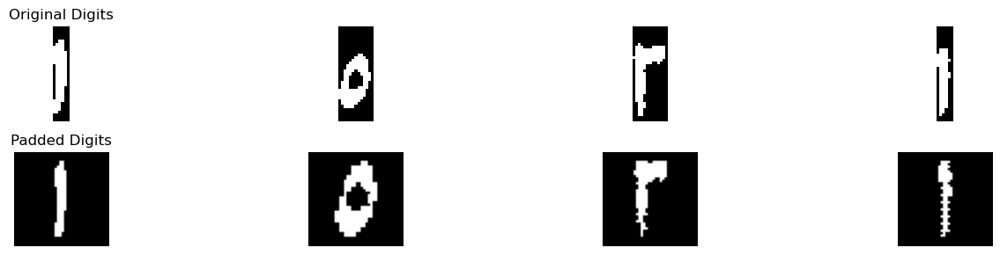

Best match: ١
Full comparison results: {'١': 4.05, '٢': 2.140515734265734, '٣': 1.7578366873065017, '٤': 2.024519230769231, '٥': 0.9569419873212444, '٦': 0.05, '٧': 0.55, '٨': 1.9715277777777778, '٩': 0.8930209904474611}
Confidence :  0.9547421328671328
Best match: ٥
Full comparison results: {'١': 0.2777777777777778, '٢': 1.4131944444444442, '٣': 1.1683114035087718, '٤': 2.295138888888889, '٥': 5.878994360902256, '٦': 1.3944444444444444, '٧': 1.0145833333333332, '٨': 1.238888888888889, '٩': 0.5208333333333334}
Confidence :  1.7919277360066836
Best match: ٣
Full comparison results: {'١': 0.6651785714285714, '٢': 3.830357142857143, '٣': 4.128579721362229, '٤': 1.8738095238095238, '٥': 1.5806059265811587, '٦': 2.029464285714286, '٧': 1.1632352941176471, '٨': 0.7666666666666667, '٩': 1.5750466853408032}
Confidence :  0.14911128925254302
Best match: ١
Full comparison results: {'١': 4.572916666666666, '٢': 2.385270979020979, '٣': 1.4802631578947367, '٤': 1.6220009157509159, '٥': 1.0983110349

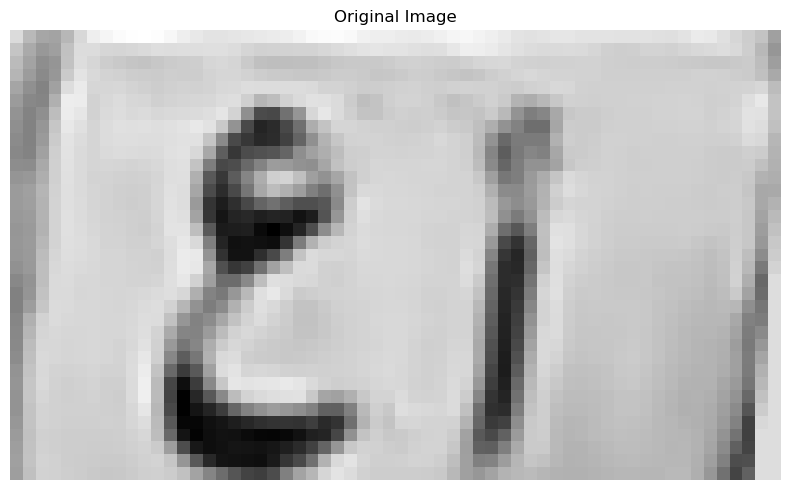

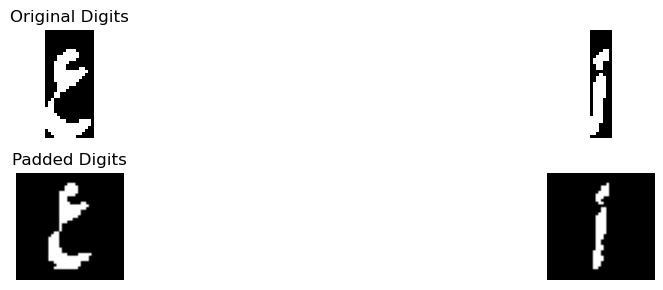

Best match: د
Full comparison results: {'أ': 0.46875, 'ب': 0.15948275862068967, 'ج': 2.284168679549114, 'د': 3.1736869338378626, 'ر': 0.524211019490255, 'س': 0.5803571428571428, 'ص': 0.39285714285714285, 'ط': 1.7009634387351777, 'ع': 2.9822368421052627, 'ف': 1.8464999303815093, 'ق': 1.3458107073238652, 'ك': 1.1647727272727273, 'ل': 1.3432469040247679, 'م': 2.7414772727272725, 'ن': 2.6142261904761908, 'ه': 1.2403897849462366, 'و': 1.6917989417989416, 'ي': 1.1333588814567077}
Confidence :  0.09572504586629993
Best match: أ
Full comparison results: {'أ': 2.649861898853834, 'ب': 0.1627155172413793, 'ج': 0.38952150908672645, 'د': 0.4628437496742451, 'ر': 0.2280800671093025, 'س': 0.1919642857142857, 'ص': 0.7776785714285714, 'ط': 0.8093084597730461, 'ع': 0.08125, 'ف': 0.4286236424394319, 'ق': 0.3277328626225061, 'ك': 0.28882575757575757, 'ل': 0.28277863777089784, 'م': 0.12215909090909091, 'ن': 0.477797619047619, 'ه': 0.3832661290322581, 'و': 0.5611441798941798, 'ي': 0.7472603785103784}
Confid

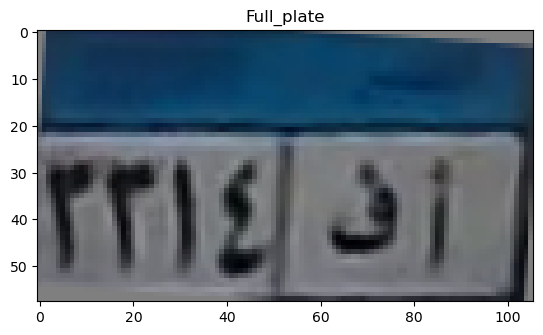

top
[0.45458469 0.48559574 0.48633187 0.44403827 0.45826492 0.46305205
 0.4433814  0.43783703 0.45342535 0.46570844 0.47802934 0.4989005
 0.50480909 0.50737806 0.5134141  0.51329148 0.50782223 0.50061016
 0.49115657 0.48693098 0.50368578 0.51537242 0.51245717 0.51147752
 0.52260745 0.52356403 0.52724415 0.52870993 0.52120628 0.51514526
 0.50825253 0.5056994  0.51256054 0.51814641 0.52130686 0.52337969
 0.52217612 0.51448173 0.51841229 0.52276706 0.52854985 0.52957176
 0.53149814 0.53324069 0.53352608 0.52411667 0.51752588 0.51935805
 0.52224187 0.516766   0.49305716 0.41288705 0.29900617]
[0.41356756 0.44310667 0.44807756 0.40254294 0.42665181 0.42792985
 0.40446958 0.40084408 0.43407614 0.47096684 0.47973745 0.4846324
 0.47549494 0.46300821 0.47896128 0.49491566 0.49524706 0.49617432
 0.50068094 0.50890608 0.5219474  0.53442824 0.51847857 0.49039701
 0.52622974 0.50310613 0.49517517 0.50674257 0.5030526  0.48804445
 0.47820771 0.48302889 0.4873978  0.48831861 0.48920431 0.48860672
 0.

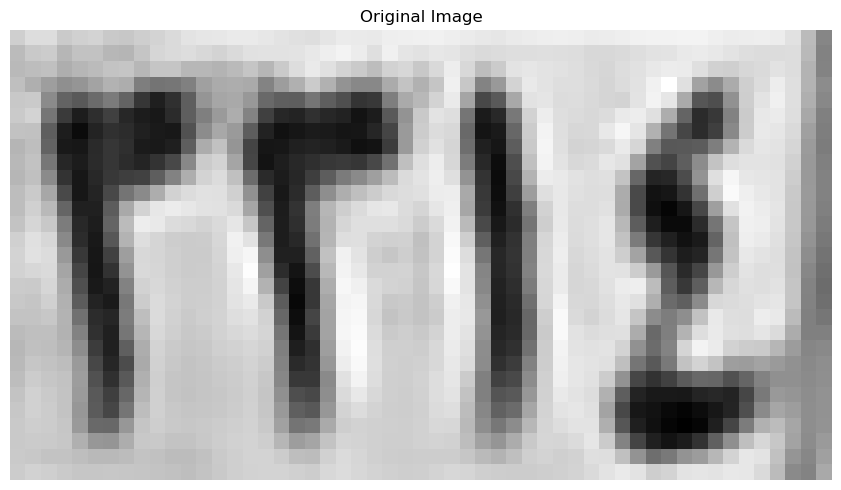

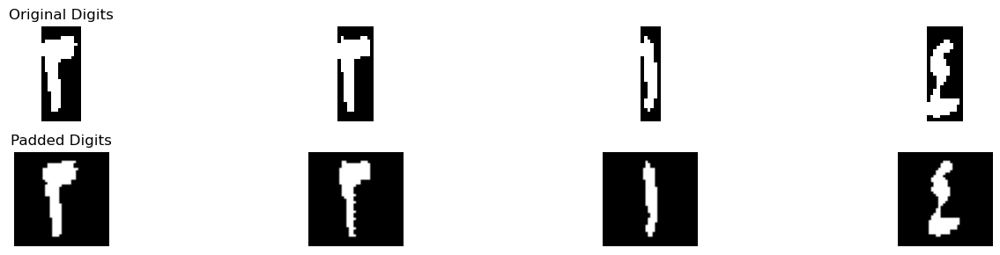

Best match: ٣
Full comparison results: {'١': 0.13333333333333333, '٢': 4.58125, '٣': 4.942724458204335, '٤': 2.7604166666666665, '٥': 2.930405056759546, '٦': 1.7125, '٧': 2.026102941176471, '٨': 0.6118055555555555, '٩': 1.2733660130718956}
Confidence :  0.1807372291021676
Best match: ٣
Full comparison results: {'١': 0.41586538461538464, '٢': 5.04326923076923, '٣': 5.768769349845201, '٤': 2.7536630036630036, '٥': 2.5248553368715907, '٦': 1.7223214285714286, '٧': 1.6033088235294117, '٨': 0.8166666666666667, '٩': 1.366154474610357}
Confidence :  0.36275005953798534
Best match: ١
Full comparison results: {'١': 5.516666666666667, '٢': 1.6673222610722611, '٣': 0.9802631578947368, '٤': 1.2291437728937729, '٥': 0.8944419873212442, '٦': 0.6833333333333332, '٧': 1.3128676470588236, '٨': 2.3388888888888886, '٩': 1.2478475364504777}
Confidence :  1.588888888888889
Best match: ٤
Full comparison results: {'١': 1.858173076923077, '٢': 2.0360576923076925, '٣': 1.750483746130031, '٤': 6.077724358974359

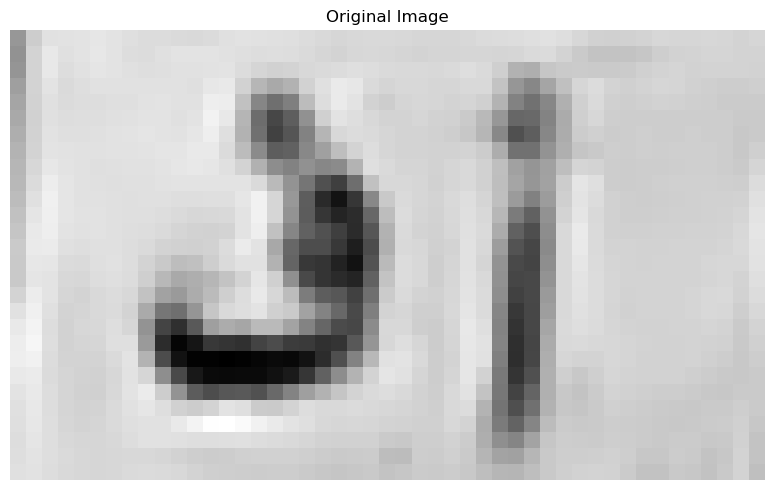

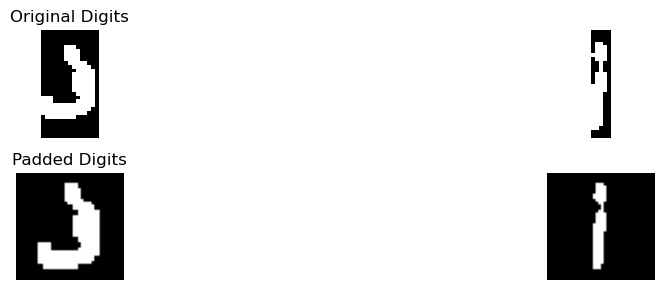

Best match: ف
Full comparison results: {'أ': 0.3736413043478261, 'ب': 0.13793103448275862, 'ج': 2.2974537037037037, 'د': 5.135931964573269, 'ر': 2.3566772863568217, 'س': 1.9866071428571428, 'ص': 1.6017210144927536, 'ط': 3.170289855072464, 'ع': 1.2581521739130435, 'ف': 5.41765873015873, 'ق': 3.4995471014492754, 'ك': 2.5321557971014492, 'ل': 2.082880434782609, 'م': 1.5081521739130435, 'ن': 3.52375, 'ه': 3.5131048387096775, 'و': 3.717240338164251, 'ي': 3.207323021181717}
Confidence :  0.1408633827927308
Best match: أ
Full comparison results: {'أ': 2.538209706959707, 'ب': 0.125, 'ج': 0.6454738900391074, 'د': 0.8585559021588433, 'ر': 0.0, 'س': 0.03125, 'ص': 0.4282738095238095, 'ط': 1.2267786561264822, 'ع': 0.09375, 'ف': 0.38988095238095233, 'ق': 0.11513157894736842, 'ك': 0.11837121212121211, 'ل': 0.0, 'م': 0.5661838161838162, 'ن': 0.46875, 'ه': 0.5123655913978494, 'و': 0.6011904761904762, 'ي': 0.3931242368742368}
Confidence :  0.6557155254166124
[['٣', '٣', '١', '٤'], ['ف', 'أ']]
Tilt angle

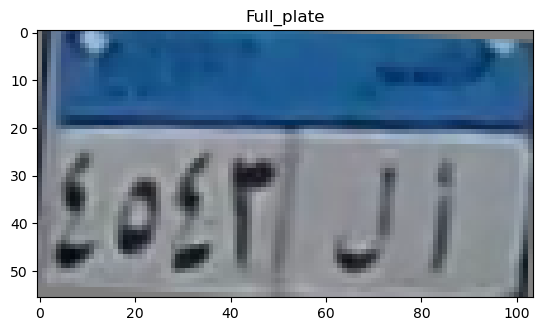

top
[0.19473429 0.44196436 0.55486877 0.52193679 0.56674539 0.59684594
 0.60555877 0.60962409 0.61069874 0.59860824 0.59360324 0.60162076
 0.60014409 0.60007105 0.60151555 0.60236667 0.60279121 0.60300734
 0.59930913 0.59679294 0.59051762 0.58273235 0.58161237 0.58316809
 0.58751462 0.58341774 0.57907401 0.57307282 0.58103419 0.60310272
 0.61366151 0.62429854 0.62821983 0.64107412 0.61566056 0.59361
 0.58906645 0.58943196 0.60174814 0.60937681 0.61077689 0.60556642
 0.59073952 0.57366078 0.59505488 0.58478647 0.594045   0.59478582
 0.59531278 0.59183392 0.58689489 0.55840013]
[0.19904717 0.45618005 0.55542214 0.51494771 0.56278642 0.59511411
 0.58232619 0.59840527 0.58492169 0.52263309 0.52409868 0.55879493
 0.58609696 0.59225012 0.59375984 0.59438118 0.59487137 0.59811509
 0.59816718 0.5931627  0.58559299 0.58463853 0.58240201 0.58030336
 0.58061968 0.57911988 0.57680676 0.57414132 0.58042196 0.60529941
 0.6196675  0.60220853 0.62582525 0.64631216 0.58746247 0.537703
 0.56432085 0.585

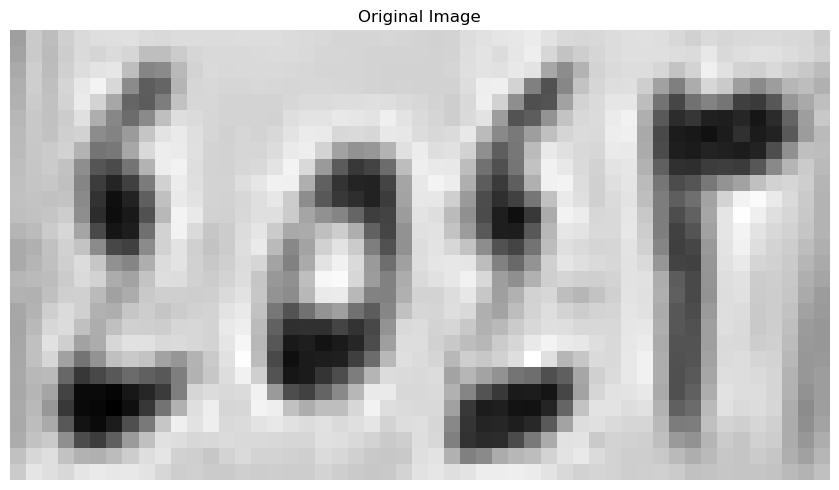

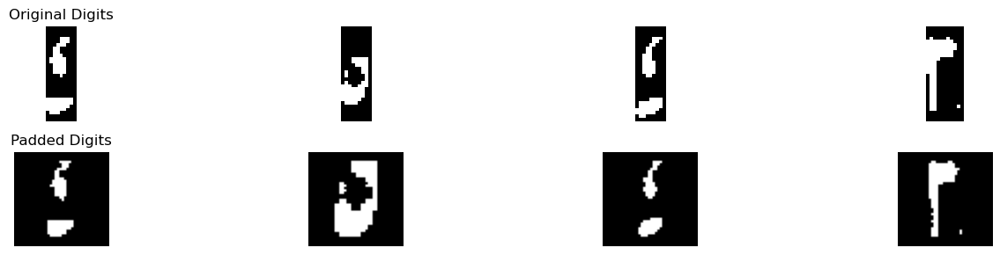

Best match: ٤
Full comparison results: {'١': 2.548295454545454, '٢': 0.8853438228438228, '٣': 0.8203366873065016, '٤': 3.721500945291268, '٥': 2.4865564646911396, '٦': 0.0, '٧': 0.03125, '٨': 1.863888888888889, '٩': 0.7122611865258924}
Confidence :  0.586602745372907
Best match: ٥
Full comparison results: {'١': 0.4444444444444444, '٢': 1.5833333333333335, '٣': 0.5849780701754386, '٤': 2.2326388888888884, '٥': 6.265716374269006, '٦': 1.4319444444444445, '٧': 1.170138888888889, '٨': 1.1437499999999998, '٩': 0.4444444444444444}
Confidence :  2.016538742690059
Best match: ١
Full comparison results: {'١': 3.0187500000000003, '٢': 0.7643502331002332, '٣': 0.5, '٤': 2.4308172338414273, '٥': 1.6809486952675807, '٦': 0.13392857142857142, '٧': 0.03125, '٨': 1.6083333333333332, '٩': 1.0508000656838417}
Confidence :  0.29396638307928646
Best match: ٣
Full comparison results: {'١': 0.9285714285714286, '٢': 2.821428571428571, '٣': 3.130611455108359, '٤': 1.324702380952381, '٥': 2.4169200574966827, '

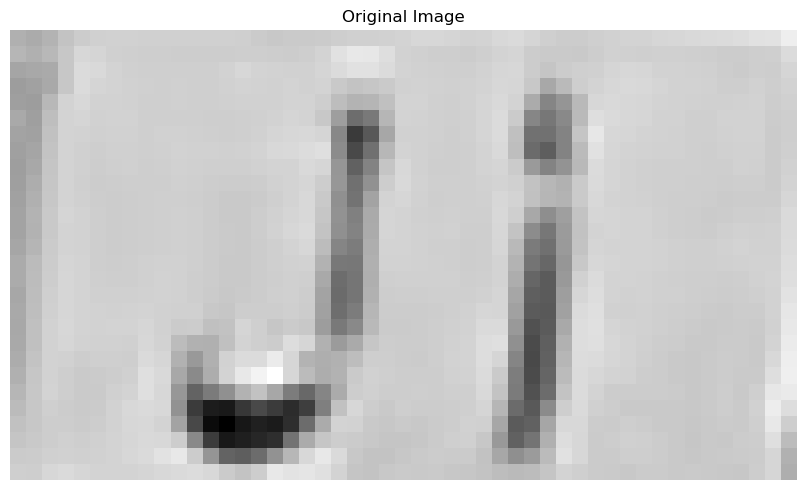

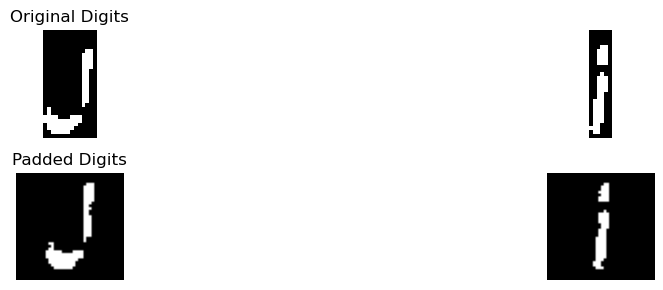

Best match: ل
Full comparison results: {'أ': 0.0, 'ب': 0.13469827586206895, 'ج': 0.4664351851851852, 'د': 2.6790736310473156, 'ر': 3.2976869600913825, 'س': 1.2053571428571428, 'ص': 1.4181547619047619, 'ط': 1.2888669301712778, 'ع': 1.2937134502923977, 'ف': 1.6151054720133668, 'ق': 2.568302701197438, 'ك': 0.9422348484848485, 'ل': 5.6340643274853806, 'م': 0.14646464646464646, 'ن': 3.6444841269841266, 'ه': 0.7936155913978494, 'و': 2.466435185185185, 'ي': 2.622679765886288}
Confidence :  0.994790100250627
Best match: أ
Full comparison results: {'أ': 3.2040189903718828, 'ب': 0.35344827586206895, 'ج': 0.6663072233724407, 'د': 0.6237623656586505, 'ر': 0.2090583279788677, 'س': 0.1607142857142857, 'ص': 0.6619047619047619, 'ط': 0.43148880105401843, 'ع': 0.09375, 'ف': 0.4117223502304147, 'ق': 0.43328841817806163, 'ك': 0.17045454545454544, 'ل': 0.058823529411764705, 'م': 0.2250561938061938, 'ن': 0.09576612903225806, 'ه': 0.40934139784946233, 'و': 0.6191798941798942, 'ي': 0.33965201465201467}
Confid

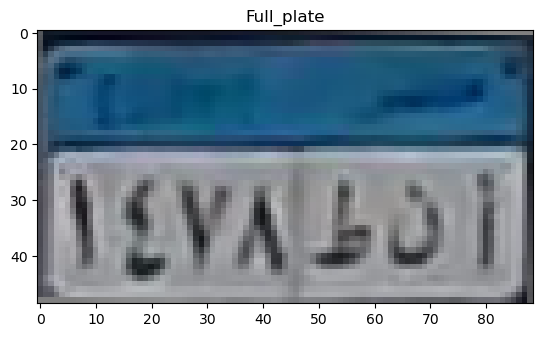

top
[0.31299381 0.35100054 0.23191916 0.23388863 0.29206219 0.29696766
 0.30592733 0.24844489 0.2760414  0.28702485 0.33219348 0.35126069
 0.35996032 0.36388588 0.3669879  0.38796676 0.41532418 0.41818406
 0.41796794 0.42678676 0.40904779 0.4005     0.40046936 0.40904779
 0.40912439 0.40133333 0.39667647 0.38652022 0.38071011 0.39079152
 0.37837412 0.36208571 0.34858534 0.34455725 0.34586669 0.35586412
 0.34593599 0.34840525 0.34575512 0.32885868 0.34654268 0.35629545
 0.34409417 0.31333436]
[0.30819795 0.30355797 0.35507192 0.47236706 0.62540015 0.66966332
 0.67806895 0.65752612 0.65354238 0.65683881 0.67979687 0.68594277
 0.67587778 0.65859542 0.64022088 0.63419789 0.63910783 0.64875701
 0.66042878 0.66548983 0.65930792 0.65532654 0.6575931  0.66496042
 0.66927457 0.66889588 0.67037558 0.67002471 0.66812818 0.67485125
 0.65940279 0.63997354 0.62792306 0.62958572 0.63164167 0.64481235
 0.63764527 0.64058118 0.66077192 0.68678681 0.70108674 0.71162788
 0.70095632 0.66781369]
[0.3071001

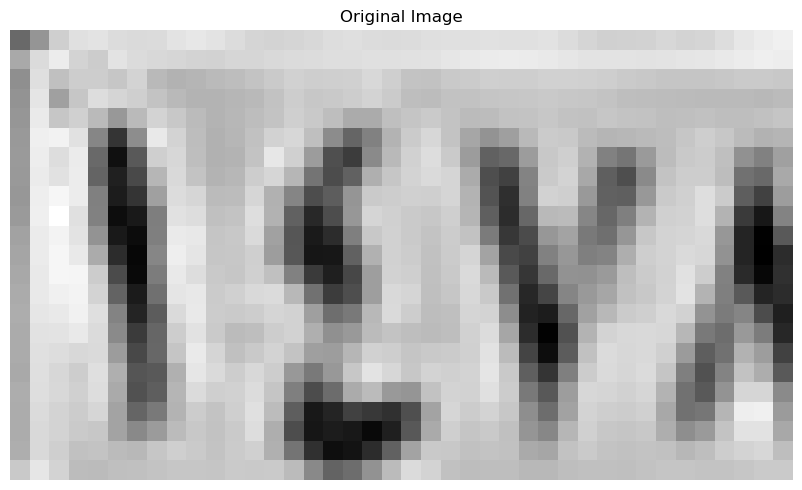

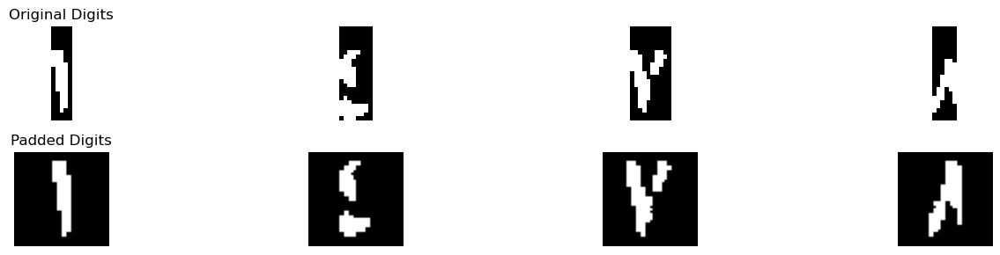

Best match: ١
Full comparison results: {'١': 6.58125, '٢': 2.312354312354312, '٣': 0.9078947368421053, '٤': 1.6220009157509159, '٥': 1.6438983488132093, '٦': 1.7202380952380953, '٧': 1.1966911764705883, '٨': 2.3076388888888886, '٩': 2.6886626445449973}
Confidence :  1.9462936777275013
Best match: ٤
Full comparison results: {'١': 0.6778846153846154, '٢': 2.300480769230769, '٣': 1.5905572755417956, '٤': 5.354647435897435, '٥': 3.0042615730502726, '٦': 0.0, '٧': 0.7904411764705883, '٨': 0.36180555555555555, '٩': 1.2445268533385232}
Confidence :  1.1751929314235814
Best match: ٧
Full comparison results: {'١': 0.0, '٢': 1.1875, '٣': 1.9046052631578947, '٤': 1.0822368421052633, '٥': 1.063674812030075, '٦': 0.41578947368421054, '٧': 3.5243421052631576, '٨': 0.6302631578947369, '٩': 0.7861842105263157}
Confidence :  0.8098684210526315
Best match: ٥
Full comparison results: {'١': 0.9107142857142856, '٢': 0.7767857142857142, '٣': 0.6488970588235294, '٤': 0.874702380952381, '٥': 2.332434947663275

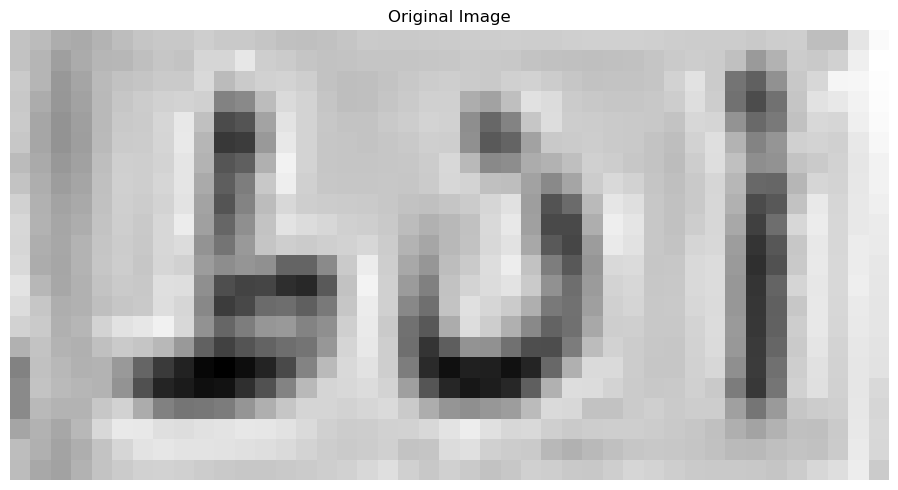

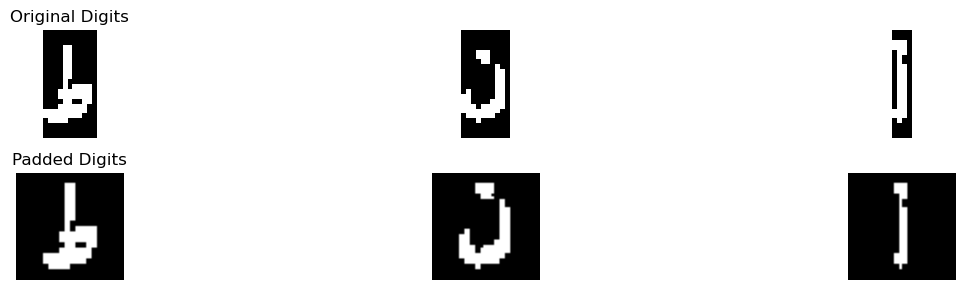

Best match: ط
Full comparison results: {'أ': 1.1375, 'ب': 0.3718501326259947, 'ج': 1.2538589832068094, 'د': 3.0833164983164982, 'ر': 2.477154547726137, 'س': 1.3125, 'ص': 1.193154761904762, 'ط': 5.851202239789195, 'ع': 0.6375, 'ف': 3.335813492063492, 'ق': 2.4175925925925927, 'ك': 1.7424242424242424, 'ل': 1.95625, 'م': 0.38636363636363635, 'ن': 2.389702380952381, 'ه': 1.2746639784946237, 'و': 2.2197089947089945, 'ي': 3.0478121516164998}
Confidence :  1.2576943738628517
Best match: د
Full comparison results: {'أ': 0.31414473684210525, 'ب': 0.125, 'ج': 2.1109230655140268, 'د': 4.577987550948078, 'ر': 2.0849210451165394, 'س': 1.21875, 'ص': 0.6648809523809524, 'ط': 2.0150279973649536, 'ع': 1.4101973684210527, 'ف': 3.387835909217488, 'ق': 2.6982229880256194, 'ك': 0.29166666666666663, 'ل': 2.2611842105263156, 'م': 1.222488038277512, 'ن': 4.190256892230576, 'ه': 1.5830645161290322, 'و': 1.7712075327206906, 'ي': 1.7406108813002403}
Confidence :  0.19386532935875067
Best match: أ
Full comparison 

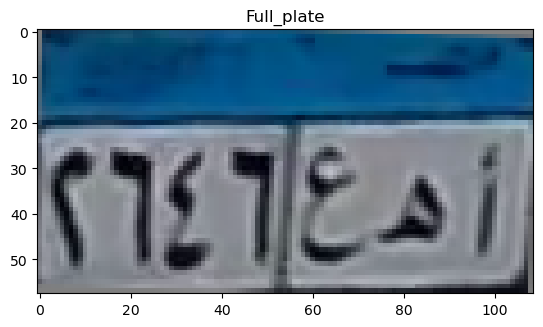

top
[0.38483668 0.597628   0.62348004 0.55194595 0.57354823 0.60024583
 0.62469289 0.64170418 0.63993212 0.65601194 0.66738291 0.66459392
 0.59121711 0.56236326 0.57181545 0.60889441 0.61222222 0.63864825
 0.67238697 0.67256431 0.67504825 0.67187439 0.64900461 0.61729598
 0.58712358 0.54804196 0.52843564 0.5291799  0.59789926 0.61784412
 0.60970532 0.60297103 0.59669039 0.57156784 0.55728475 0.56380743
 0.5554848  0.57951032 0.59766672 0.56279988 0.56288642 0.56711578
 0.56136135 0.56581765 0.56103365 0.5787851  0.60349404 0.62106451
 0.62118706 0.60332554 0.55115105 0.52413348 0.53559716 0.50055547]
[0.34895625 0.5780181  0.63043679 0.58580279 0.64220598 0.67773754
 0.62069397 0.52772593 0.42029474 0.4303988  0.56233814 0.67416412
 0.64452069 0.60658075 0.58202499 0.61417113 0.45510633 0.40844196
 0.49098667 0.51014581 0.63971076 0.6651933  0.65895096 0.61330528
 0.55237132 0.53699588 0.54939168 0.51019381 0.56894351 0.55676797
 0.54370046 0.58999314 0.60960139 0.63016706 0.55074099 0

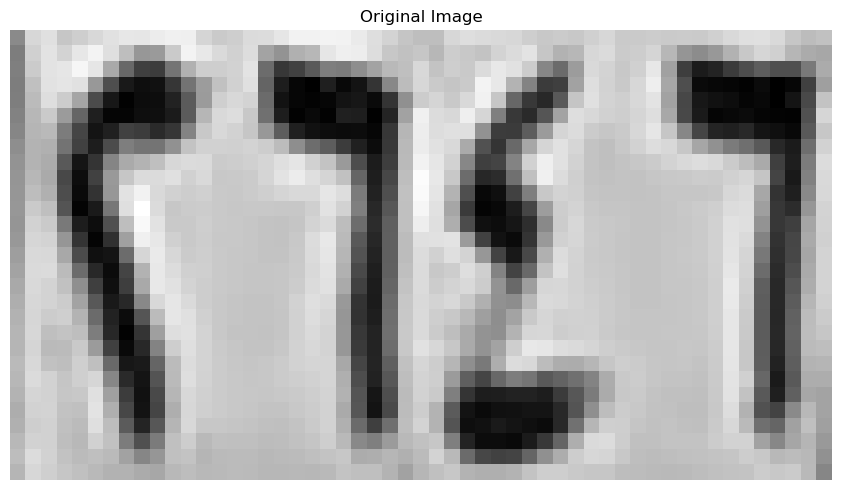

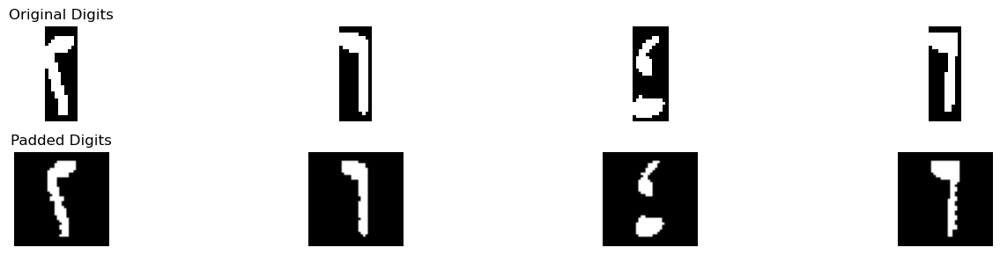

Best match: ٢
Full comparison results: {'١': 1.03125, '٢': 7.917467948717949, '٣': 4.496904024767802, '٤': 3.328960622710623, '٥': 2.0765378519828985, '٦': 0.9892857142857142, '٧': 2.353308823529412, '٨': 0.5555555555555556, '٩': 1.8413147310206135}
Confidence :  1.7102819619750735
Best match: ٦
Full comparison results: {'١': 3.2755681818181817, '٢': 1.4606643356643356, '٣': 0.6353521671826625, '٤': 0.13392857142857142, '٥': 1.8200372254164825, '٦': 5.474702380952381, '٧': 0.2977941176470588, '٨': 0.9076388888888889, '٩': 2.2793489190548013}
Confidence :  1.0995670995670999
Best match: ٤
Full comparison results: {'١': 1.0833333333333333, '٢': 1.2115384615384617, '٣': 1.3203366873065017, '٤': 5.117016719839301, '٥': 2.7905241043785938, '٦': 0.0, '٧': 0.37022058823529413, '٨': 1.5965277777777778, '٩': 0.9967213829286885}
Confidence :  1.1632463077303534
Best match: ٦
Full comparison results: {'١': 3.052083333333333, '٢': 1.7347756410256407, '٣': 1.2468072755417956, '٤': 0.0625, '٥': 1.94

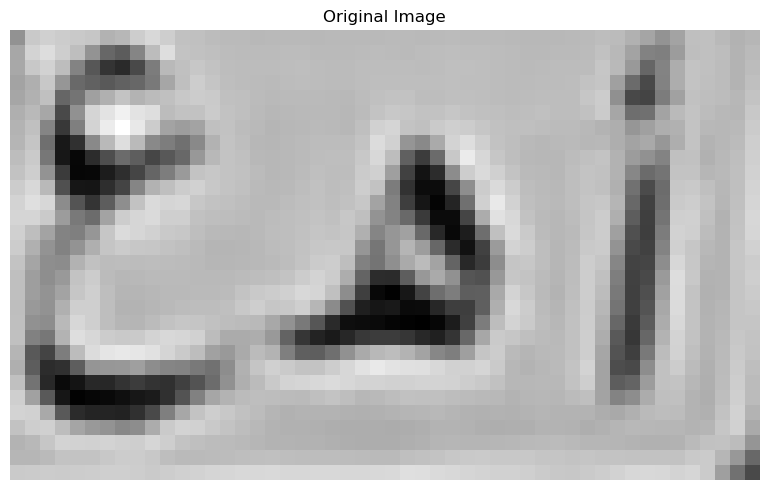

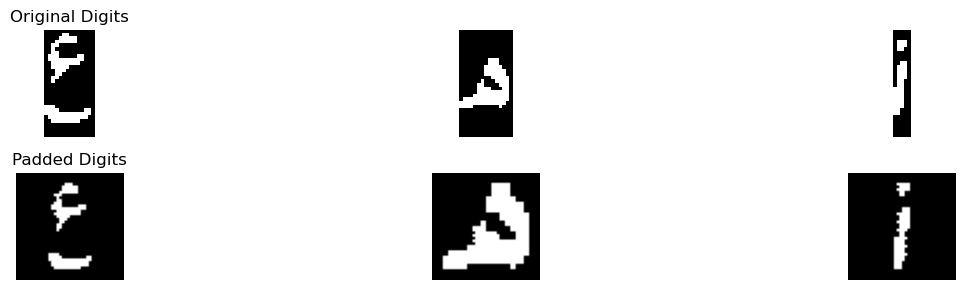

Best match: ع
Full comparison results: {'أ': 0.3125, 'ب': 0.0, 'ج': 2.10627300437083, 'د': 2.212354720299767, 'ر': 0.6309778060278617, 'س': 0.28125, 'ص': 0.41392089093701995, 'ط': 1.441905467720685, 'ع': 4.268204559647172, 'ف': 1.4503389971344132, 'ق': 1.5700898078529657, 'ك': 2.1458333333333335, 'ل': 1.1325538818766374, 'م': 2.4460227272727275, 'ن': 2.4144642857142857, 'ه': 0.4155241935483871, 'و': 1.3978825679326237, 'ي': 0.690807320698625}
Confidence :  0.9110909161872223
Best match: ه
Full comparison results: {'أ': 0.4375, 'ب': 0.21875, 'ج': 0.59375, 'د': 2.5625, 'ر': 1.3125, 'س': 2.25, 'ص': 1.3125, 'ط': 1.1875, 'ع': 0.1875, 'ف': 2.3125, 'ق': 0.6875, 'ك': 1.125, 'ل': 0.75, 'م': 0.25, 'ن': 0.71875, 'ه': 5.8125, 'و': 1.5625, 'ي': 1.25}
Confidence :  1.625
Best match: أ
Full comparison results: {'أ': 2.564064161644807, 'ب': 0.25323275862068967, 'ج': 0.42358954451345754, 'د': 0.6480404405249607, 'ر': 0.11886904761904762, 'س': 0.35714285714285715, 'ص': 0.7464285714285714, 'ط': 0.8918608

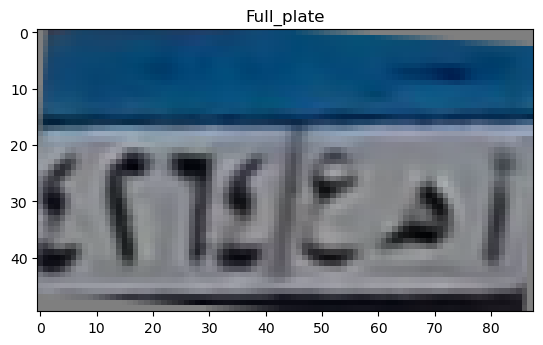

top
[0.58526917 0.58239588 0.61138108 0.60279428 0.51819606 0.42007735
 0.40894134 0.49719737 0.54590607 0.52198507 0.53355912 0.5895353
 0.62936605 0.63500211 0.51451361 0.31528356 0.19370457 0.17495162
 0.2578293  0.37447433 0.47861482 0.54465137 0.54092882 0.44295693
 0.31356707 0.24186466 0.242758   0.26125649 0.2791413  0.29480284
 0.35515878 0.46082015 0.53814499 0.56385326 0.56644112 0.57008275
 0.55517739 0.4955913  0.40845069 0.39481468 0.45921997 0.49918865
 0.50327114 0.48046202]
[0.60710272 0.60631162 0.59049191 0.47983518 0.33283022 0.26033434
 0.31697317 0.45386185 0.5343422  0.51959486 0.54052066 0.61236377
 0.59769265 0.48634001 0.31677211 0.14253792 0.05169638 0.06462336
 0.15876253 0.28223444 0.4021299  0.51075679 0.52051093 0.38251001
 0.19643735 0.07568168 0.03401207 0.03749841 0.04284537 0.08044494
 0.23584771 0.43215486 0.54668943 0.61000062 0.6252724  0.58124714
 0.48630326 0.3507962  0.2433035  0.29868442 0.44599884 0.50619839
 0.50902234 0.48169782]
[0.61942884

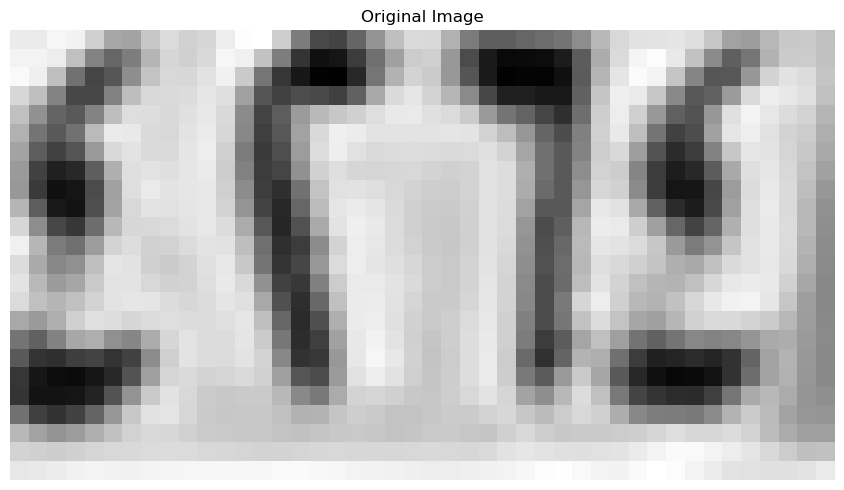

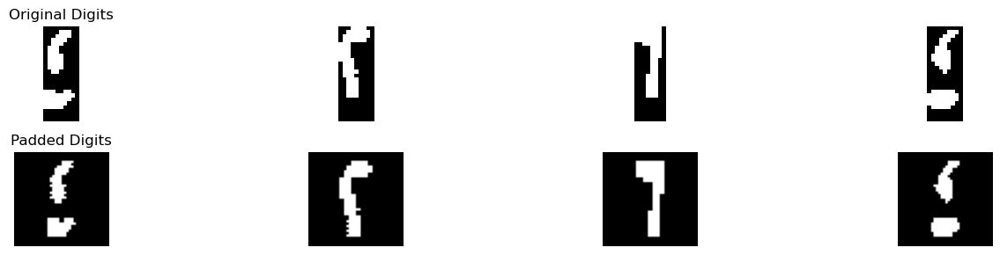

Best match: ٤
Full comparison results: {'١': 1.8541666666666665, '٢': 2.013621794871795, '٣': 1.921923374613003, '٤': 5.035997134585844, '٥': 3.2286598850066337, '٦': 0.14285714285714285, '٧': 0.43272058823529413, '٨': 1.6166666666666667, '٩': 1.362430869783811}
Confidence :  0.9036686247896051
Best match: ٢
Full comparison results: {'١': 0.17410714285714285, '٢': 5.964285714285714, '٣': 3.9422407120743035, '٤': 3.756547619047619, '٥': 2.667403803626714, '٦': 1.063392857142857, '٧': 2.0632352941176473, '٨': 0.41805555555555557, '٩': 0.9656570961718021}
Confidence :  1.0110225011057055
Best match: ٦
Full comparison results: {'١': 2.447916666666667, '٢': 2.4383012820512815, '٣': 1.5452786377708978, '٤': 0.683470695970696, '٥': 2.791703523514669, '٦': 4.288988095238095, '٧': 1.5246323529411765, '٨': 0.39861111111111114, '٩': 2.119218200100553}
Confidence :  0.7486422858617132
Best match: ٤
Full comparison results: {'١': 3.145833333333333, '٢': 1.044871794871795, '٣': 0.9552051083591331, '

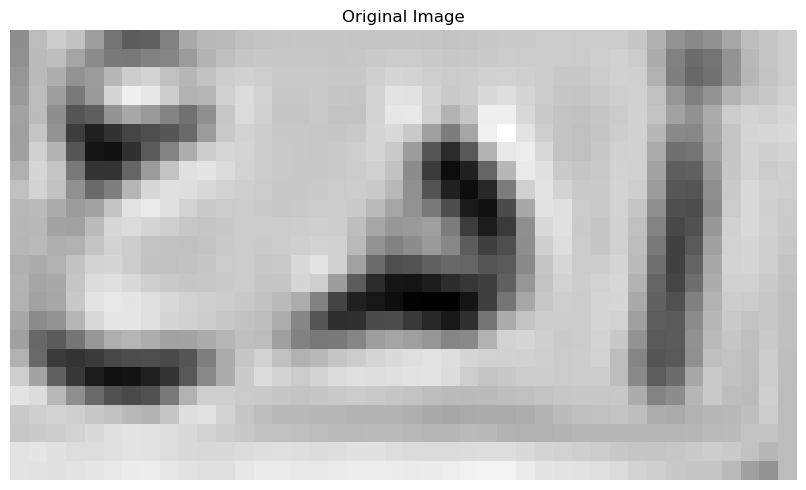

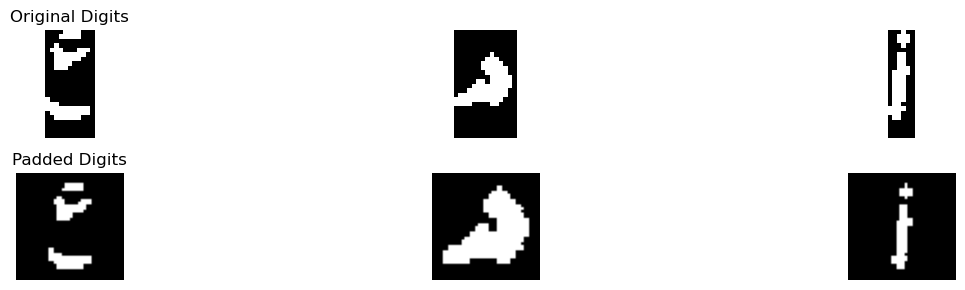

Best match: ع
Full comparison results: {'أ': 0.03125, 'ب': 0.10096153846153846, 'ج': 2.275103519668737, 'د': 3.1797208750129733, 'ر': 0.7845979192943211, 'س': 0.5133928571428572, 'ص': 0.4303571428571429, 'ط': 1.2804993306132857, 'ع': 3.9944892473118276, 'ف': 1.4703616119150924, 'ق': 1.2995333619170044, 'ك': 2.0520833333333335, 'ل': 1.604953560371517, 'م': 1.9289772727272727, 'ن': 2.189821428571429, 'ه': 0.6061155913978494, 'و': 1.2429985404123336, 'ي': 1.0319258639910813}
Confidence :  0.4073841861494272
Best match: ه
Full comparison results: {'أ': 0.4375, 'ب': 0.4375, 'ج': 0.46875, 'د': 2.3125, 'ر': 1.0, 'س': 2.5724137931034483, 'ص': 1.7629310344827585, 'ط': 0.5, 'ع': 0.25, 'ف': 2.375, 'ق': 0.75, 'ك': 0.78125, 'ل': 0.625, 'م': 0.4375, 'ن': 0.9375, 'ه': 6.2298850574712645, 'و': 1.53125, 'ي': 1.1875}
Confidence :  1.828735632183908
Best match: أ
Full comparison results: {'أ': 2.7415477667493797, 'ب': 0.35344827586206895, 'ج': 0.3004011387163561, 'د': 0.31022058823529414, 'ر': 0.47104108

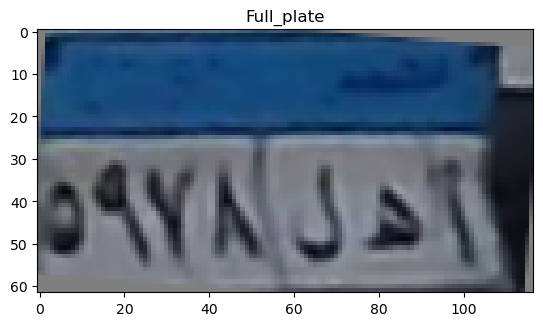

top
[0.41364534 0.38452806 0.41758696 0.45925471 0.48968158 0.51196366
 0.5181126  0.5307102  0.53261192 0.53079528 0.51942763 0.51030273
 0.4804643  0.48683346 0.49347095 0.49331384 0.50229654 0.50755949
 0.51368788 0.51722967 0.5153554  0.49953895 0.50102088 0.49826828
 0.49629386 0.49189893 0.4974311  0.50301543 0.51490355 0.51993092
 0.52199247 0.52689251 0.5368304  0.54288359 0.54806599 0.54453828
 0.53729278 0.53808653 0.55118576 0.5499721  0.55354394 0.55124693
 0.54999537 0.55657803 0.56611834 0.58049879 0.58743705 0.57388884
 0.56264847 0.54626789 0.49396363 0.40251652 0.36149022 0.39905121
 0.4717556  0.53871788 0.57672867 0.59480792]
[0.45411592 0.47198951 0.51251409 0.53988514 0.55329572 0.56566022
 0.56996972 0.57930412 0.57227093 0.56490387 0.55648426 0.55161877
 0.54825383 0.55020572 0.54614057 0.5486516  0.55201788 0.54713991
 0.53977387 0.52773685 0.51165804 0.51499804 0.52057107 0.52998985
 0.5435584  0.54532998 0.54136012 0.53445717 0.53510917 0.54851507
 0.55378877 

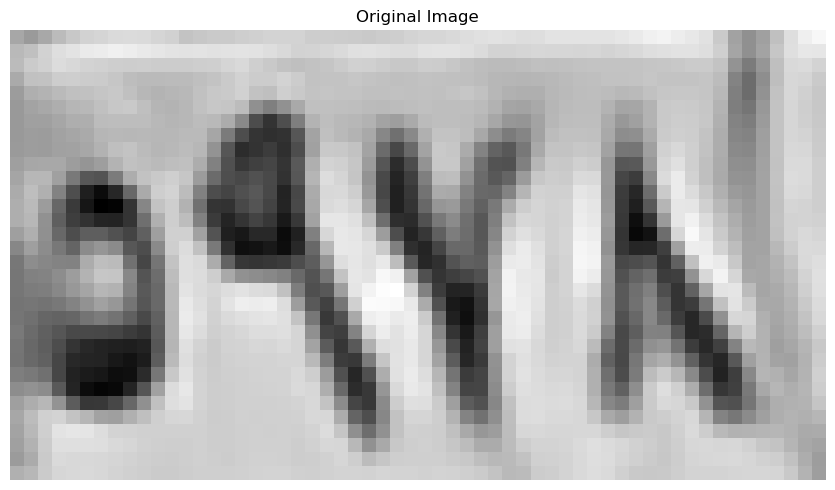

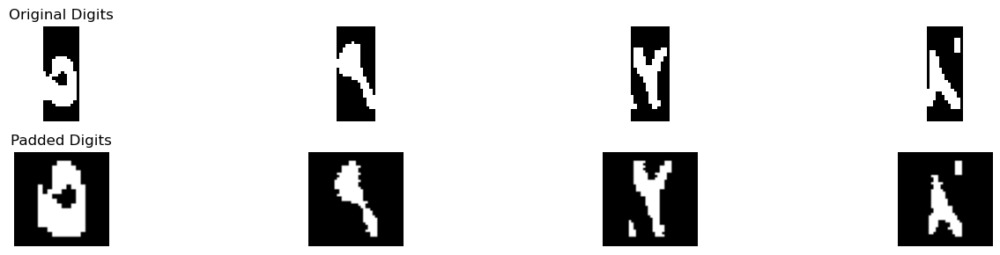

Best match: ٥
Full comparison results: {'١': 0.7499999999999999, '٢': 2.13125, '٣': 1.625, '٤': 1.5187499999999998, '٥': 6.419940476190477, '٦': 1.7249999999999999, '٧': 0.9000000000000001, '٨': 1.3499999999999999, '٩': 0.75}
Confidence :  2.144345238095238
Best match: ٩
Full comparison results: {'١': 2.03125, '٢': 1.8368055555555554, '٣': 2.0484283625730995, '٤': 2.333333333333333, '٥': 1.0531537176274017, '٦': 1.1736111111111112, '٧': 1.3020833333333333, '٨': 3.509027777777778, '٩': 5.604166666666666}
Confidence :  1.047569444444444
Best match: ١
Full comparison results: {'١': 2.6840277777777777, '٢': 1.7743055555555558, '٣': 2.632309941520468, '٤': 1.1076388888888888, '٥': 1.9529030910609857, '٦': 1.5319444444444446, '٧': 2.49375, '٨': 2.0812500000000003, '٩': 2.3715277777777777}
Confidence :  0.025858918128654818
Best match: ٢
Full comparison results: {'١': 0.3571428571428571, '٢': 3.3705357142857144, '٣': 1.594233746130031, '٤': 2.2354166666666666, '٥': 1.1143714064573196, '٦': 0.

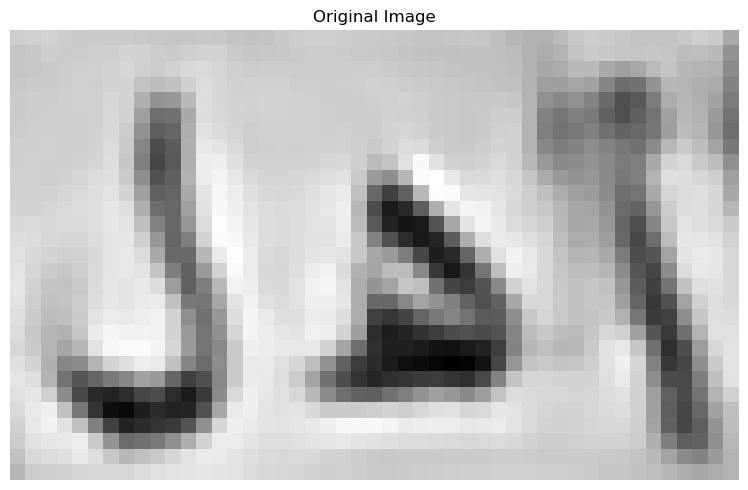

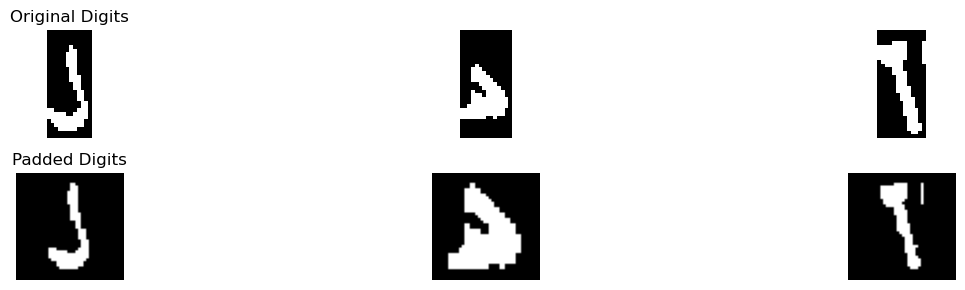

Best match: ن
Full comparison results: {'أ': 0.49374999999999997, 'ب': 0.3053713527851459, 'ج': 2.0903999884978144, 'د': 2.8957749580427596, 'ر': 2.043033394017277, 'س': 1.3571428571428572, 'ص': 0.8749999999999999, 'ط': 1.6694664031620552, 'ع': 1.4355263157894735, 'ف': 2.829556530214425, 'ق': 2.31812865497076, 'ك': 0.5492424242424242, 'ل': 2.5945239938080493, 'م': 0.853030303030303, 'ن': 3.1954166666666666, 'ه': 0.7956317204301075, 'و': 2.023148148148148, 'ي': 2.8886217948717947}
Confidence :  0.14982085431195347
Best match: ه
Full comparison results: {'أ': 0.5497685185185185, 'ب': 0.19073275862068967, 'ج': 1.505787037037037, 'د': 2.4710648148148144, 'ر': 0.9370210727969349, 'س': 1.0714285714285714, 'ص': 1.1685185185185185, 'ط': 2.0578703703703702, 'ع': 0.6770833333333333, 'ف': 2.8591269841269837, 'ق': 1.34375, 'ك': 1.494212962962963, 'ل': 0.4444444444444444, 'م': 0.8020833333333333, 'ن': 0.7743055555555556, 'ه': 4.1875, 'و': 1.8587962962962963, 'ي': 1.6458333333333335}
Confidence :  0

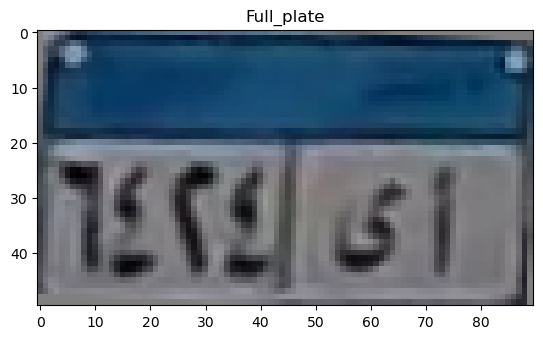

top
[0.28358319 0.33927172 0.46723309 0.55582957 0.58992035 0.61525156
 0.62166436 0.61269706 0.60144553 0.58703836 0.56987767 0.55134596
 0.54010208 0.53603652 0.53246422 0.53485392 0.53548199 0.53706517
 0.54653066 0.55216868 0.55267868 0.55315966 0.5537689  0.5493311
 0.54544958 0.53374691 0.52368706 0.54570122 0.58090038 0.58167665
 0.58379077 0.58506096 0.58388752 0.58130813 0.57771506 0.57508872
 0.55928188 0.53572708 0.53136534 0.53624714 0.5484917  0.56709496
 0.56345756 0.54870762 0.511253  ]
[0.25693911 0.31028468 0.40257706 0.45179092 0.47430741 0.52755662
 0.55934748 0.58319858 0.58507096 0.57452299 0.5650517  0.55388333
 0.52428665 0.50406106 0.50699314 0.52044098 0.51834903 0.50242923
 0.4913164  0.49399344 0.49107206 0.49177705 0.49972477 0.50506745
 0.50926433 0.50393028 0.50260863 0.50673199 0.5148098  0.52554363
 0.52700213 0.53082865 0.52762    0.52174461 0.51213157 0.50784235
 0.50747471 0.50171309 0.49862012 0.48524    0.49356627 0.50617803
 0.51224098 0.51854223 0

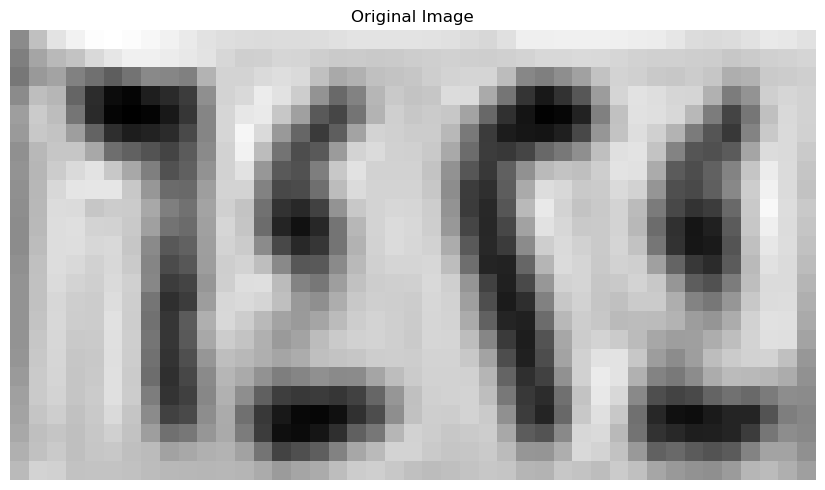

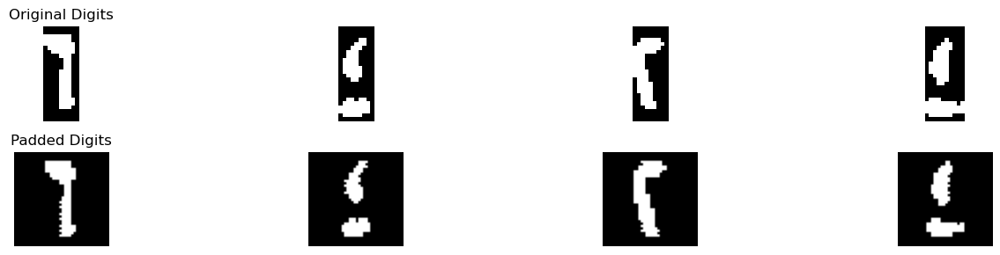

Best match: ٦
Full comparison results: {'١': 3.076923076923077, '٢': 2.276442307692308, '٣': 1.8166602167182662, '٤': 0.5453754578754579, '٥': 2.2192429603420316, '٦': 3.7163690476190476, '٧': 1.0018382352941178, '٨': 0.7034722222222222, '٩': 1.746229260935143}
Confidence :  0.31972298534798527
Best match: ٤
Full comparison results: {'١': 2.7187499999999996, '٢': 0.9615384615384616, '٣': 1.2578366873065017, '٤': 4.392929516719839, '٥': 2.5866550567595463, '٦': 0.35238095238095235, '٧': 0.3150735294117647, '٨': 2.339583333333333, '٩': 1.7157805429864255}
Confidence :  0.8370897583599197
Best match: ٢
Full comparison results: {'١': 0.14285714285714285, '٢': 5.915178571428571, '٣': 3.653154024767802, '٤': 3.7877976190476192, '٥': 2.8779301194161873, '٦': 0.9607142857142857, '٧': 2.3408088235294118, '٨': 0.34375, '٩': 0.9912464985994398}
Confidence :  1.063690476190476
Best match: ٤
Full comparison results: {'١': 1.875, '٢': 2.125, '٣': 1.9281153250773992, '٤': 5.721505376344086, '٥': 3.12

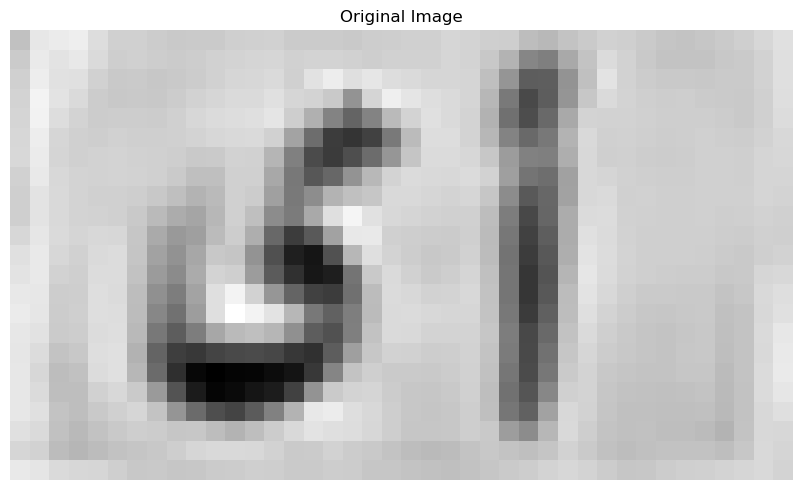

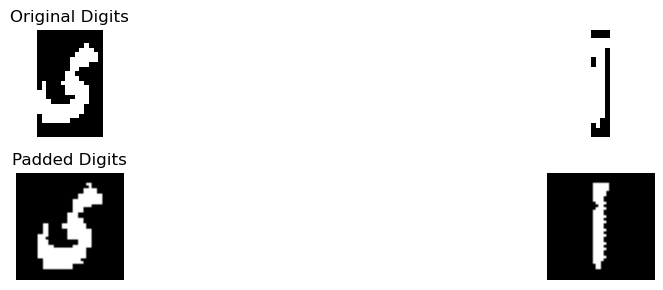

Best match: ي
Full comparison results: {'أ': 0.6458333333333334, 'ب': 0.4849137931034483, 'ج': 1.5497685185185184, 'د': 3.2633333333333336, 'ر': 2.0948132183908044, 'س': 2.388392857142857, 'ص': 2.5770833333333334, 'ط': 2.052083333333333, 'ع': 0.9583333333333333, 'ف': 2.830522486772487, 'ق': 1.9108796296296295, 'ك': 1.78125, 'ل': 2.4375, 'م': 0.20833333333333331, 'ن': 2.2141666666666664, 'ه': 1.3195564516129032, 'و': 2.8819444444444446, 'ي': 3.3716346153846155}
Confidence :  0.05415064102564093
Best match: أ
Full comparison results: {'أ': 2.1692994505494503, 'ب': 0.09375, 'ج': 0.5770215090867264, 'د': 0.7873227371756784, 'ر': 0.03125, 'س': 0.03125, 'ص': 0.3181547619047619, 'ط': 1.023262516469038, 'ع': 0.21875, 'ف': 0.5590277777777778, 'ق': 0.13943713450292397, 'ك': 0.1496212121212121, 'ل': 0.0, 'م': 0.7132867132867133, 'ن': 0.4375, 'ه': 0.5436155913978494, 'و': 0.7425595238095237, 'ي': 0.26785714285714285}
Confidence :  0.5730184670402061
[['٦', '٤', '٢', '٤'], ['ي', 'أ']]
Tilt angle: -

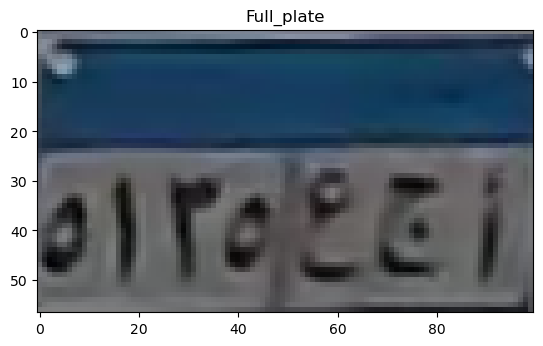

top
[0.24915988 0.22966178 0.24395752 0.25625348 0.26776995 0.28330053
 0.29526298 0.30664218 0.30832928 0.31446248 0.3212336  0.33947492
 0.34212341 0.34550858 0.35061495 0.37417534 0.38054085 0.37635465
 0.37643892 0.37020985 0.3719332  0.3677798  0.36974059 0.36790797
 0.36816838 0.36462007 0.35708126 0.35256993 0.34182186 0.33668796
 0.32757532 0.33043263 0.32261404 0.32881347 0.33513691 0.33029142
 0.32489137 0.31983249 0.32785028 0.33824022 0.35362108 0.36948668
 0.37910936 0.34964699 0.34159067 0.33745034 0.33842949 0.33050867
 0.31846618 0.30645637]
[0.30425817 0.3535582  0.40967416 0.43712897 0.44407597 0.44810017
 0.45470173 0.45594637 0.45434558 0.45409311 0.44780211 0.45300679
 0.44585917 0.44391795 0.44191493 0.44255    0.44531301 0.44601436
 0.44186279 0.4467188  0.44697922 0.44795961 0.44795961 0.44894
 0.44721665 0.44820471 0.44930765 0.44781408 0.44894    0.45196243
 0.45314431 0.45513604 0.45914444 0.47079125 0.48842994 0.496005
 0.49906873 0.50152737 0.49951297 0.497

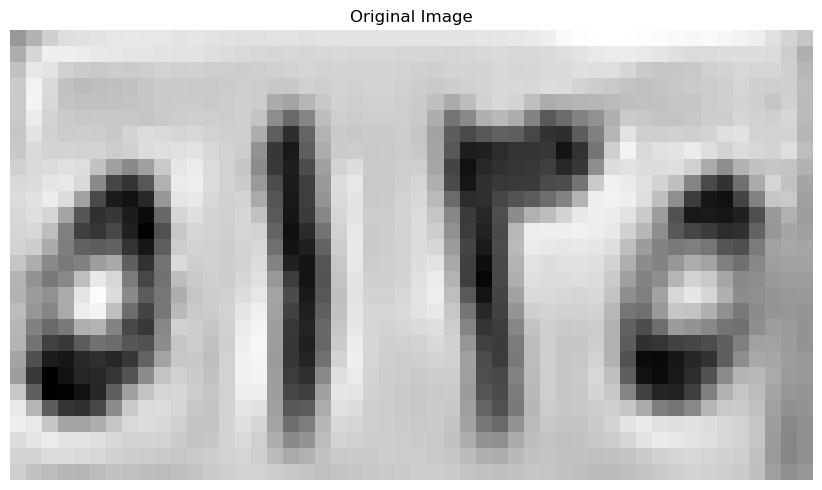

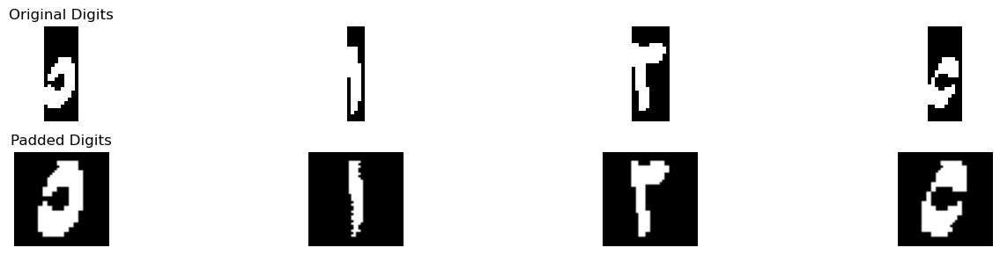

Best match: ٥
Full comparison results: {'١': 0.7894736842105262, '٢': 1.7286184210526316, '٣': 1.3832236842105263, '٤': 2.4967105263157894, '٥': 7.682879072681704, '٦': 1.6259868421052632, '٧': 1.1046052631578949, '٨': 1.4075657894736842, '٩': 0.7450657894736842}
Confidence :  2.5930842731829573
Best match: ١
Full comparison results: {'١': 5.422916666666667, '٢': 2.5635198135198136, '٣': 1.0427631578947367, '٤': 1.5505723443223443, '٥': 1.093455145215981, '٦': 0.40238095238095234, '٧': 1.1415441176470589, '٨': 2.732638888888889, '٩': 1.8382510055304173}
Confidence :  1.3451388888888889
Best match: ٣
Full comparison results: {'١': 0.4375, '٢': 3.15625, '٣': 4.929179566563468, '٤': 1.28125, '٥': 2.9118476337903583, '٦': 1.84375, '٧': 1.9386029411764705, '٨': 0.7486111111111111, '٩': 1.0159313725490196}
Confidence :  0.8864647832817338
Best match: ٥
Full comparison results: {'١': 0.6842105263157895, '٢': 1.5411184210526316, '٣': 1.299342105263158, '٤': 2.412828947368421, '٥': 6.9530075187

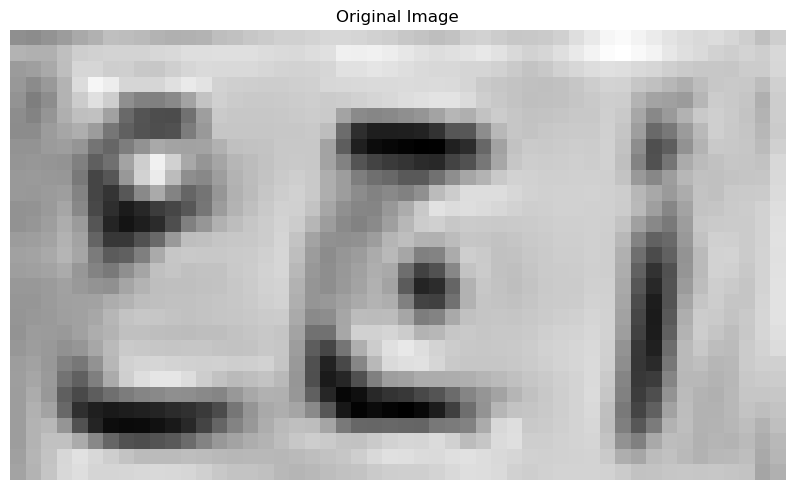

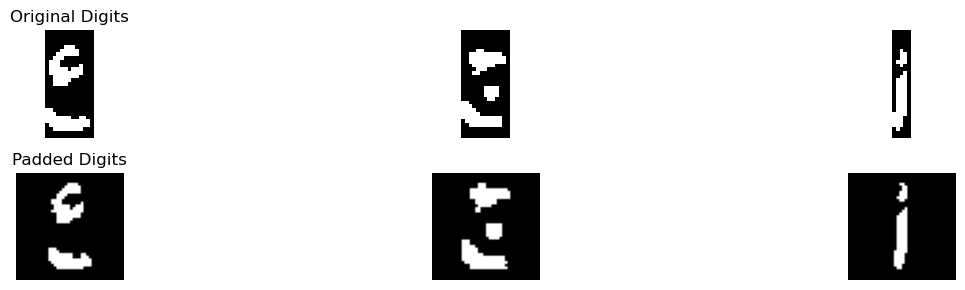

Best match: ع
Full comparison results: {'أ': 0.4375, 'ب': 0.038461538461538464, 'ج': 2.5536720726938116, 'د': 2.8145341970202313, 'ر': 0.4706395909188263, 'س': 0.3839285714285714, 'ص': 0.6214285714285714, 'ط': 1.6737456967996942, 'ع': 4.142593637863204, 'ف': 1.920645307264577, 'ق': 1.6079999540185566, 'ك': 2.121212121212121, 'ل': 1.0837637972809262, 'م': 2.221590909090909, 'ن': 2.4068452380952383, 'ه': 0.7997983870967742, 'و': 1.553753877029739, 'ي': 1.0591648086213303}
Confidence :  0.6640297204214862
Best match: ج
Full comparison results: {'أ': 0.36458333333333337, 'ب': 0.4792771883289125, 'ج': 4.505739193895115, 'د': 3.3067313485734537, 'ر': 0.6396350931677018, 'س': 0.6741071428571428, 'ص': 0.9360119047619048, 'ط': 1.6959703995404896, 'ع': 1.7917085016490057, 'ف': 2.878063213589529, 'ق': 2.29015768588137, 'ك': 1.331439393939394, 'ل': 1.3588920217209692, 'م': 1.0874368686868687, 'ن': 2.254543650793651, 'ه': 1.3966397849462366, 'و': 1.156580687830688, 'ي': 2.24247491638796}
Confidence

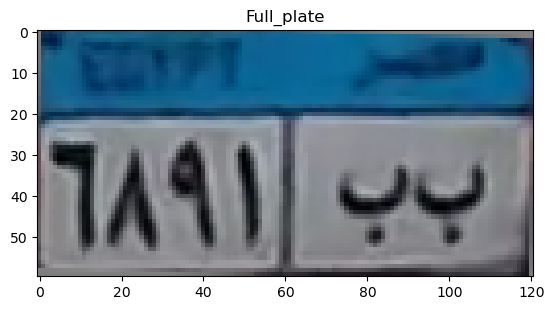

top
[0.366847   0.57913371 0.66229501 0.57912977 0.56357723 0.56808029
 0.5886263  0.65193991 0.6980182  0.65947428 0.66354083 0.65854238
 0.64457007 0.62653516 0.58592805 0.55744214 0.56774038 0.54575664
 0.54272689 0.55640174 0.54842703 0.54493413 0.55016108 0.55729956
 0.56345765 0.57109804 0.575345   0.57054792 0.57007069 0.57088029
 0.57133529 0.57440029 0.5849138  0.58952471 0.63180412 0.61961127
 0.52285456 0.48400652 0.50768912 0.54805828 0.57496064 0.56247135
 0.54366598 0.52845458 0.51934    0.52087186 0.54017333 0.56497419
 0.5914601  0.59729113 0.58675333 0.6088474  0.62380779 0.60803039
 0.5944385  0.57596961 0.56573534 0.59335713 0.61583426 0.49480181]
[0.36857114 0.58711635 0.64100625 0.48999409 0.31837103 0.37156797
 0.3959498  0.41775121 0.47302613 0.4041306  0.42820382 0.41555664
 0.36086444 0.42342271 0.52532763 0.55451728 0.58260245 0.54772292
 0.54186351 0.55139748 0.54165529 0.54419554 0.54103118 0.53533265
 0.55717701 0.56334659 0.55988075 0.55910333 0.55973522 0

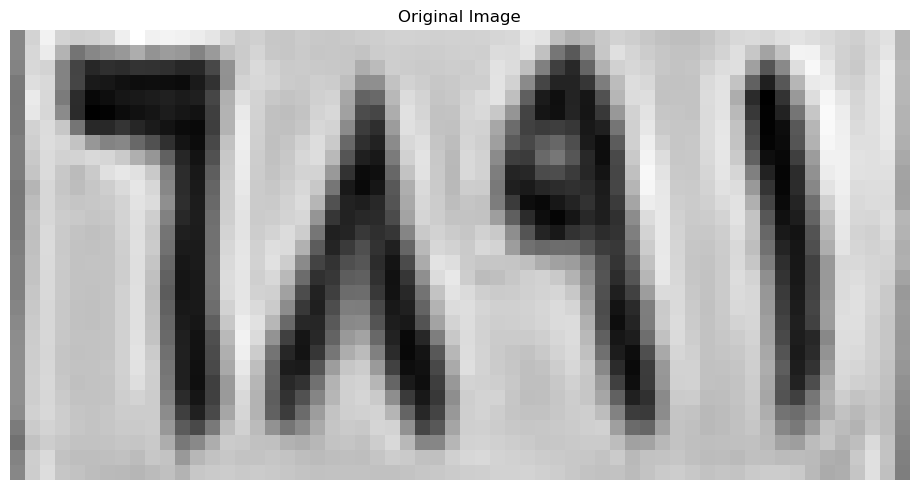

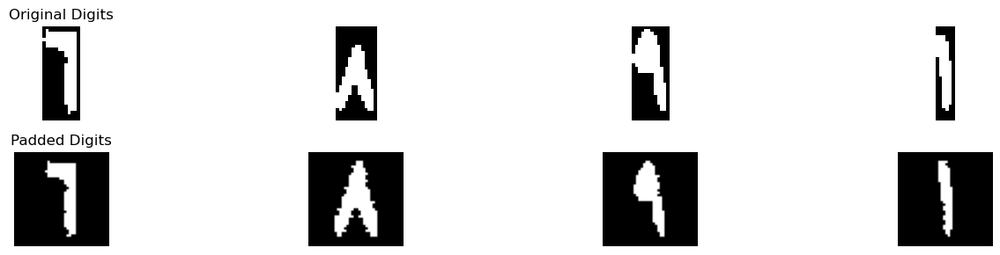

Best match: ٦
Full comparison results: {'١': 1.7259615384615383, '٢': 1.2139423076923077, '٣': 1.2879256965944272, '٤': 0.0625, '٥': 2.173112007961079, '٦': 6.286904761904762, '٧': 0.3014705882352941, '٨': 0.7097222222222221, '٩': 2.0941899195575666}
Confidence :  2.0568963769718414
Best match: ٨
Full comparison results: {'١': 1.8819444444444446, '٢': 0.9513888888888888, '٣': 0.8771929824561403, '٤': 1.4409722222222223, '٥': 2.223109857978279, '٦': 1.3194444444444442, '٧': 0.695138888888889, '٨': 5.715972222222223, '٩': 2.4965277777777777}
Confidence :  1.6097222222222225
Best match: ٩
Full comparison results: {'١': 3.6322115384615388, '٢': 2.512019230769231, '٣': 1.9396284829721362, '٤': 2.9552884615384616, '٥': 1.9608672416334956, '٦': 2.1366071428571427, '٧': 0.9768382352941176, '٨': 3.2319444444444443, '٩': 5.176014957264957}
Confidence :  0.7719017094017093
Best match: ١
Full comparison results: {'١': 6.495833333333334, '٢': 2.4020979020979025, '٣': 0.9588815789473684, '٤': 1.3541

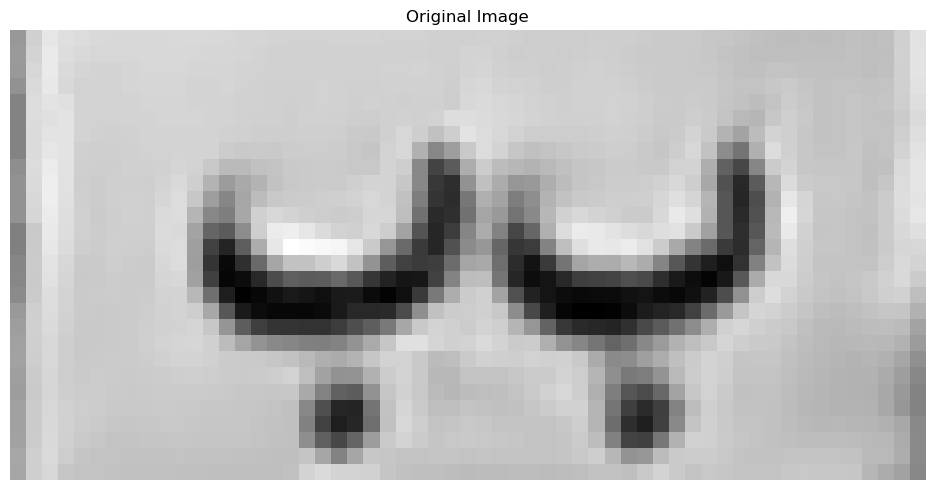

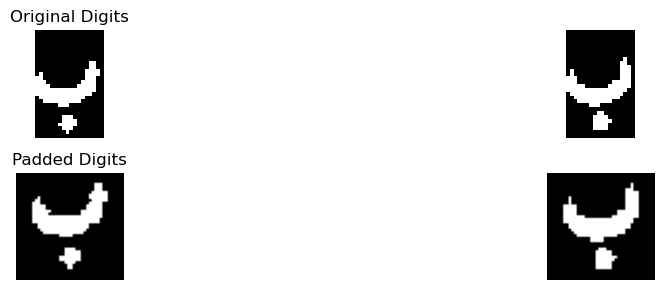

Best match: ب
Full comparison results: {'أ': 0.6160714285714286, 'ب': 4.223162972085386, 'ج': 0.39285714285714285, 'د': 0.3571428571428571, 'ر': 0.8197352216748769, 'س': 0.8973214285714286, 'ص': 2.1610119047619047, 'ط': 0.25, 'ع': 0.03225806451612903, 'ف': 0.6785714285714285, 'ق': 0.7857142857142857, 'ك': 1.4285714285714284, 'ل': 0.06696428571428571, 'م': 0.4910714285714286, 'ن': 0.3839285714285714, 'ه': 0.4375, 'و': 1.283266129032258, 'ي': 1.1014880952380952}
Confidence :  1.0310755336617405
Best match: ب
Full comparison results: {'أ': 0.6160714285714286, 'ب': 5.493908906721754, 'ج': 0.8839285714285714, 'د': 0.5267857142857143, 'ر': 0.9544334975369458, 'س': 0.5089285714285714, 'ص': 1.7636904761904761, 'ط': 0.49999999999999994, 'ع': 0.09375, 'ف': 1.0357142857142858, 'ق': 1.25, 'ك': 0.8571428571428571, 'ل': 0.14047619047619048, 'م': 0.3169642857142857, 'ن': 0.2857142857142857, 'ه': 0.65625, 'و': 1.1741071428571428, 'ي': 0.9723214285714286}
Confidence :  1.865109215265639
[['٦', '٨', '٩'

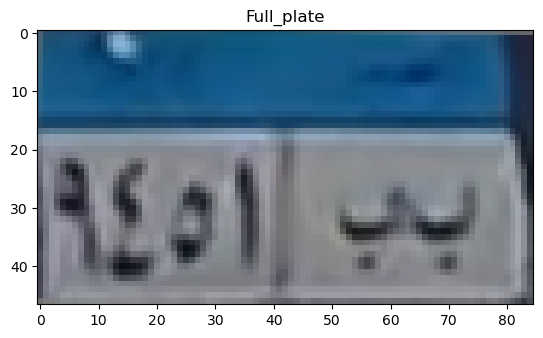

top
[0.47610226 0.54705531 0.56735265 0.55625107 0.54946114 0.54631847
 0.54653693 0.54573016 0.54289593 0.53831232 0.53815723 0.54337185
 0.54015256 0.54421821 0.54080451 0.54121791 0.53764242 0.53595754
 0.53167406 0.53151447 0.5365704  0.53079178 0.53079396 0.53118097
 0.53484989 0.53832976 0.53866816 0.54408302 0.54696119 0.54392072
 0.53998803 0.53782326 0.55380433 0.56840717 0.59982078 0.58554981
 0.55141563 0.54161532 0.56360334 0.57012612 0.54053093 0.4750863 ]
[0.46297562 0.53718368 0.55200255 0.54411467 0.51933602 0.49828133
 0.51193812 0.53812758 0.55021156 0.5488079  0.54663455 0.5471598
 0.54888085 0.55283656 0.54729127 0.53346233 0.5292234  0.53134982
 0.53927591 0.54893903 0.54946686 0.53368418 0.5288548  0.53057399
 0.53538374 0.53554458 0.52972468 0.53464314 0.53482696 0.53439599
 0.52893257 0.5319108  0.5559372  0.57418074 0.55383194 0.50931872
 0.53353225 0.56583626 0.57145204 0.58899637 0.56978357 0.48850419]
[0.45696423 0.54295343 0.51574895 0.51293025 0.40469153 0

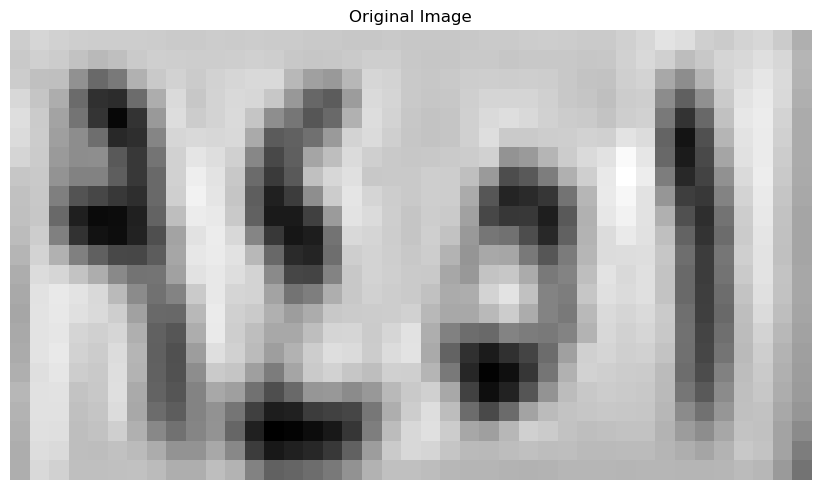

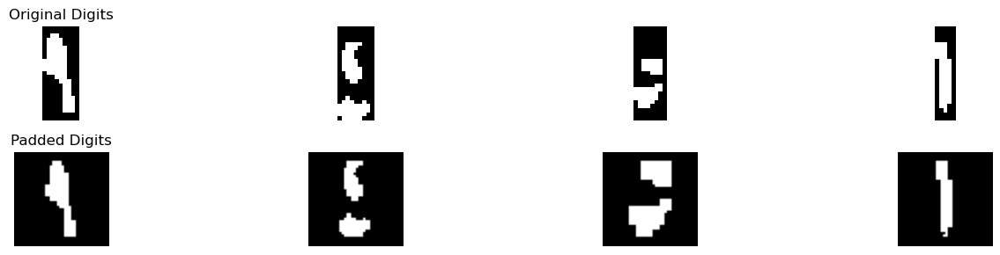

Best match: ٩
Full comparison results: {'١': 3.7884615384615383, '٢': 2.512019230769231, '٣': 1.6308049535603715, '٤': 3.2543956043956044, '٥': 1.3450998820580864, '٦': 0.8398809523809524, '٧': 1.1143382352941176, '٨': 2.7965277777777775, '٩': 4.938631221719456}
Confidence :  0.5750848416289589
Best match: ٤
Full comparison results: {'١': 2.495192307692308, '٢': 1.6033653846153848, '٣': 1.437983746130031, '٤': 5.193063186813188, '٥': 3.170688670204924, '٦': 0.0, '٧': 0.42904411764705885, '٨': 1.7597222222222224, '٩': 1.6519313887672522}
Confidence :  1.0111872583041317
Best match: ٥
Full comparison results: {'١': 0.4444444444444444, '٢': 1.9895833333333335, '٣': 1.4877558479532165, '٤': 2.170138888888889, '٥': 6.069183375104428, '٦': 2.1506944444444445, '٧': 0.9833333333333333, '٨': 1.1055555555555556, '٩': 0.4652777777777778}
Confidence :  1.9495222431077697
Best match: ١
Full comparison results: {'١': 5.202678571428571, '٢': 1.7342657342657344, '٣': 0.8453947368421053, '٤': 1.4255723

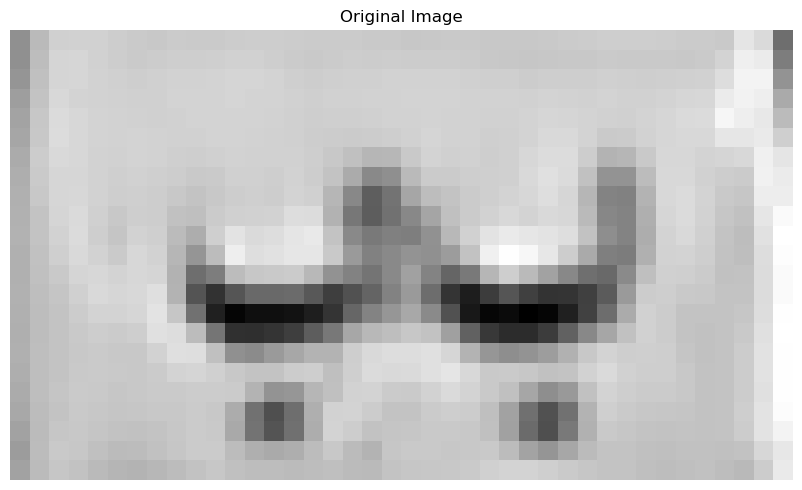

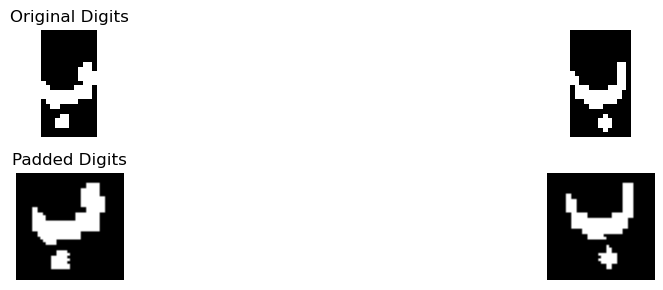

Best match: ب
Full comparison results: {'أ': 0.2361111111111111, 'ب': 2.851947637292465, 'ج': 0.4074074074074074, 'د': 0.6190636200716846, 'ر': 1.3094667943805876, 'س': 1.0133928571428572, 'ص': 2.0479166666666666, 'ط': 0.3900462962962963, 'ع': 0.13078703703703703, 'ف': 0.7863756613756614, 'ق': 0.641898148148148, 'ك': 1.2129629629629628, 'ل': 0.48581242532855434, 'م': 0.4444444444444444, 'ن': 0.5069444444444444, 'ه': 1.0, 'و': 1.625, 'ي': 1.430787037037037}
Confidence :  0.4020154853128992
Best match: ب
Full comparison results: {'أ': 0.28, 'ب': 3.988917529448675, 'ج': 0.7170370370370371, 'د': 0.514074074074074, 'ر': 0.7718965517241378, 'س': 0.2901785714285714, 'ص': 1.3079166666666666, 'ط': 0.08, 'ع': 0.0, 'ف': 1.1565079365079365, 'ق': 1.2192592592592593, 'ك': 1.215, 'ل': 0.12, 'م': 0.39125000000000004, 'ن': 0.36, 'ه': 0.375, 'و': 1.0409722222222224, 'ي': 1.1454807692307694}
Confidence :  1.3405004313910043
[['٩', '٤', '٥', '١'], ['ب', 'ب']]
Tilt angle: -1.50 degrees


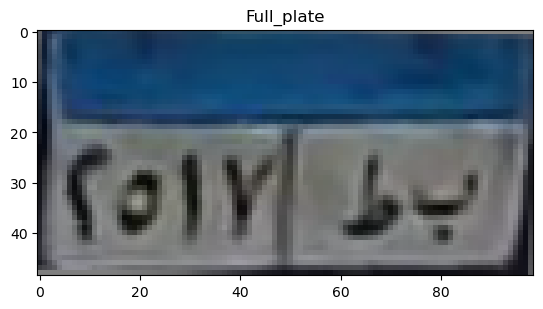

top
[0.08854623 0.04344833 0.20931271 0.43542867 0.49141371 0.49647046
 0.47881934 0.4829098  0.50497328 0.52223258 0.51639347 0.51140961
 0.50919089 0.5057599  0.50315987 0.48039333 0.46621855 0.45627749
 0.43486831 0.43057096 0.44536292 0.45988345 0.4602944  0.46407162
 0.46788713 0.46363439 0.45782909 0.46461642 0.47809681 0.48812398
 0.49       0.48636679 0.47796179 0.46464855 0.45487467 0.45525459
 0.455173   0.46348315 0.4658902  0.47263343 0.47196687 0.48735167
 0.49735944 0.50170687 0.51337004 0.51994233 0.54028864 0.53866939
 0.46669206]
[0.07571656 0.04448039 0.22143493 0.43304819 0.48546802 0.48812139
 0.47033228 0.4691447  0.47463146 0.47338717 0.45475124 0.43654658
 0.44919222 0.48579323 0.51549116 0.48594949 0.45941559 0.44676326
 0.42676268 0.42327664 0.43920162 0.45206529 0.44866467 0.4523165
 0.45372031 0.44865535 0.43941792 0.44729096 0.46275216 0.47270884
 0.47464676 0.46751606 0.46108217 0.44633189 0.43293479 0.43217384
 0.43091014 0.43464336 0.43458411 0.43855458 0

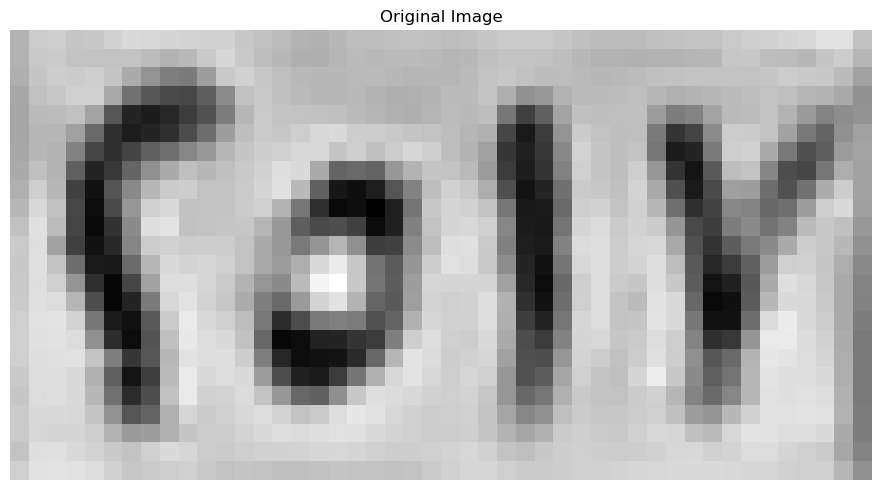

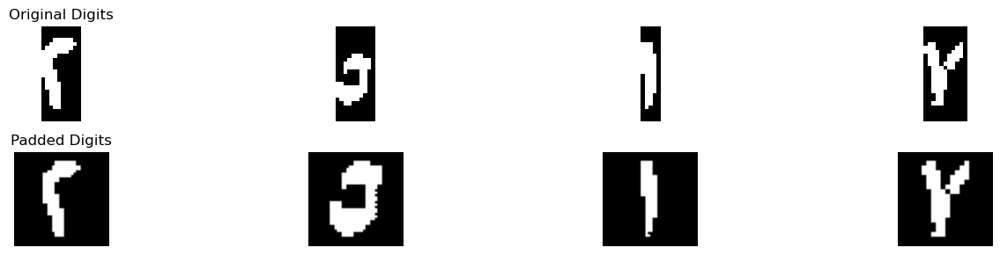

Best match: ٢
Full comparison results: {'١': 0.0, '٢': 3.8125, '٣': 3.7099458204334366, '٤': 2.5625, '٥': 2.5460802742149493, '٦': 1.00625, '٧': 1.8996323529411765, '٨': 0.3555555555555555, '٩': 0.9193218954248367}
Confidence :  0.051277089783281715
Best match: ٥
Full comparison results: {'١': 0.45454545454545453, '٢': 1.2215909090909092, '٣': 1.3380681818181819, '٤': 1.6818181818181819, '٥': 6.9460227272727275, '٦': 1.7500000000000002, '٧': 0.9090909090909091, '٨': 0.8636363636363636, '٩': 0.34943181818181823}
Confidence :  2.5980113636363638
Best match: ١
Full comparison results: {'١': 4.4973214285714285, '٢': 2.7446095571095572, '٣': 1.56046826625387, '٤': 2.0743589743589745, '٥': 0.9408816158042164, '٦': 0.37202380952380953, '٧': 1.1551470588235295, '٨': 2.6506944444444445, '٩': 2.2927036199095023}
Confidence :  0.8763559357309356
Best match: ٧
Full comparison results: {'١': 0.30000000000000004, '٢': 1.0, '٣': 1.9500000000000002, '٤': 1.6875, '٥': 1.5193452380952381, '٦': 0.55625, 

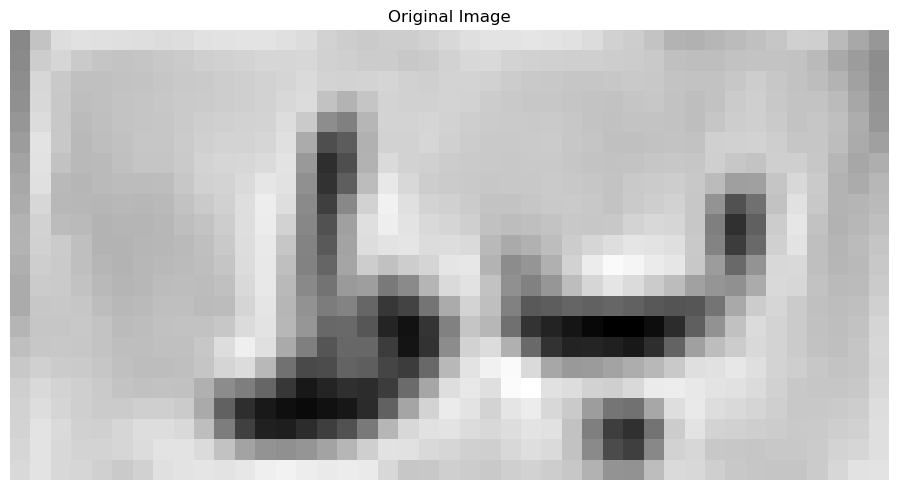

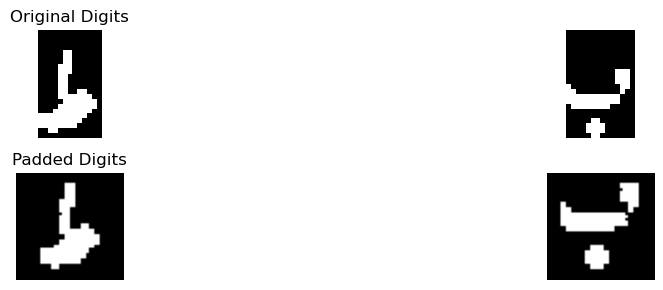

Best match: ط
Full comparison results: {'أ': 0.9488636363636364, 'ب': 0.4103116710875332, 'ج': 1.450766725223247, 'د': 3.1394781144781145, 'ر': 1.3905131525146517, 'س': 1.6785714285714286, 'ص': 1.3178030303030304, 'ط': 5.11124835309618, 'ع': 0.8323863636363635, 'ف': 2.8937439874939876, 'ق': 1.6371001683501685, 'ك': 1.696969696969697, 'ل': 1.5284090909090908, 'م': 0.47727272727272735, 'ن': 2.1407954545454544, 'ه': 2.6411290322580645, 'و': 1.4054082491582491, 'ي': 2.5515563241106722}
Confidence :  0.9858851193090326
Best match: ب
Full comparison results: {'أ': 0.5732758620689655, 'ب': 3.3855672969966633, 'ج': 0.44504310344827586, 'د': 0.4475973818646233, 'ر': 0.5161637931034483, 'س': 0.7316810344827587, 'ص': 2.4674615313311086, 'ط': 0.4137931034482759, 'ع': 0.48053392658509453, 'ف': 0.27586206896551724, 'ق': 0.62397030651341, 'ك': 1.1842672413793105, 'ل': 0.3930395913154534, 'م': 0.5075431034482759, 'ن': 0.28448275862068967, 'ه': 0.21875, 'و': 1.021551724137931, 'ي': 1.5479885057471265}


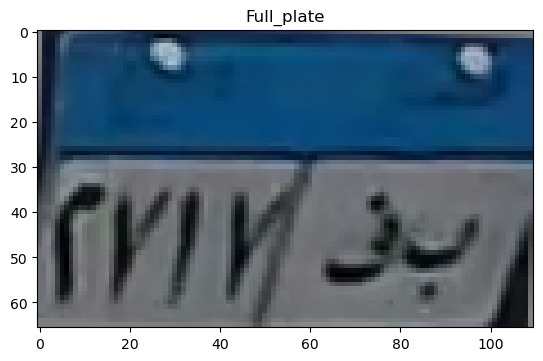

top
[0.11485573 0.11039672 0.20169447 0.26598398 0.23020722 0.16556691
 0.16598142 0.17540977 0.258582   0.25957806 0.24888143 0.24054117
 0.25009553 0.25067218 0.25667537 0.26222343 0.32011819 0.32181207
 0.29243284 0.27516319 0.26312808 0.25668331 0.25543563 0.2533949
 0.25114767 0.25019172 0.25039821 0.24481844 0.23196128 0.21403566
 0.21317701 0.21631544 0.2144435  0.21292994 0.21426929 0.20865238
 0.2090736  0.21016012 0.21400959 0.21910022 0.19198426 0.18540108
 0.18473057 0.19627897 0.18908235 0.19139392 0.19089185 0.19087626
 0.1749192  0.16217616 0.15953744 0.16216896 0.15060408 0.14844471
 0.13280918]
[0.09359485 0.13067365 0.2145838  0.26634331 0.26804228 0.29457294
 0.3813951  0.43585446 0.51085292 0.51220074 0.4943798  0.48162081
 0.4712999  0.46052051 0.45687544 0.46282355 0.51462578 0.52389498
 0.5170935  0.51208431 0.50568037 0.50647245 0.50867297 0.5089348
 0.50536098 0.51071966 0.51881328 0.50828143 0.49569174 0.48532325
 0.4856928  0.49399321 0.49500714 0.4900692  0.

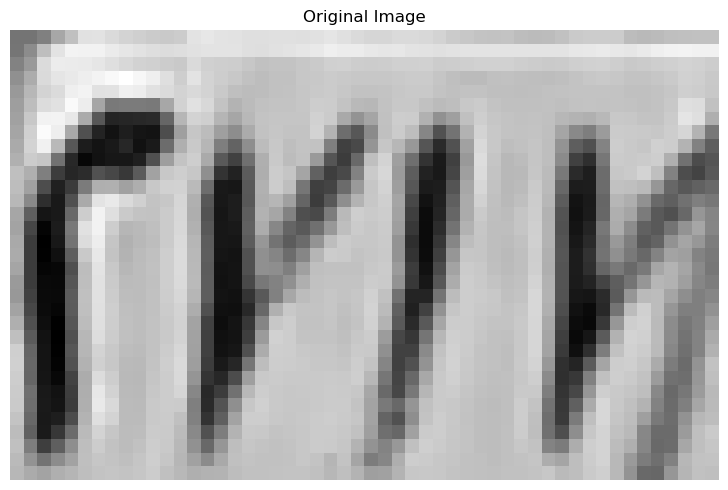

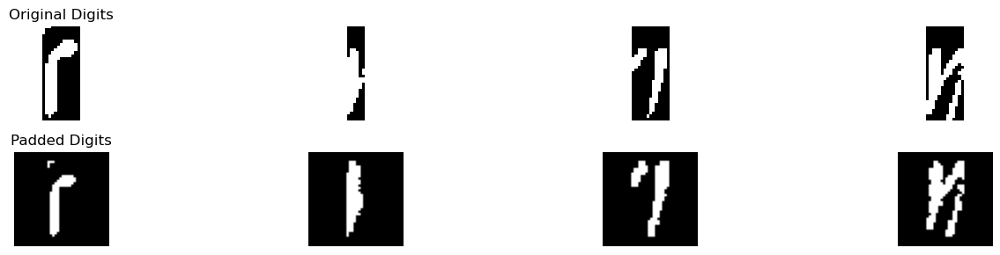

Best match: ٢
Full comparison results: {'١': 0.125, '٢': 1.470352564102564, '٣': 1.2854102167182662, '٤': 1.4396978021978022, '٥': 0.22910216718266255, '٦': 0.3366071428571429, '٧': 1.0841911764705883, '٨': 0.6493055555555556, '٩': 0.3290441176470588}
Confidence :  0.015327380952380953
Best match: ١
Full comparison results: {'١': 3.871428571428571, '٢': 1.9236596736596736, '٣': 1.3067917956656347, '٤': 2.3243589743589745, '٥': 0.8780729397021967, '٦': 0.14285714285714285, '٧': 1.3525735294117647, '٨': 2.682638888888889, '٩': 1.5353035444947212}
Confidence :  0.594394841269841
Best match: ٦
Full comparison results: {'١': 1.84375, '٢': 1.625, '٣': 1.7406153250773995, '٤': 0.1875, '٥': 1.9528739127229837, '٦': 4.11875, '٧': 2.872794117647059, '٨': 0.36041666666666666, '٩': 1.633578431372549}
Confidence :  0.6229779411764707
Best match: ٥
Full comparison results: {'١': 1.15625, '٢': 1.84375, '٣': 1.6505417956656347, '٤': 1.625, '٥': 2.563241744066047, '٦': 1.29375, '٧': 1.2757352941176472,

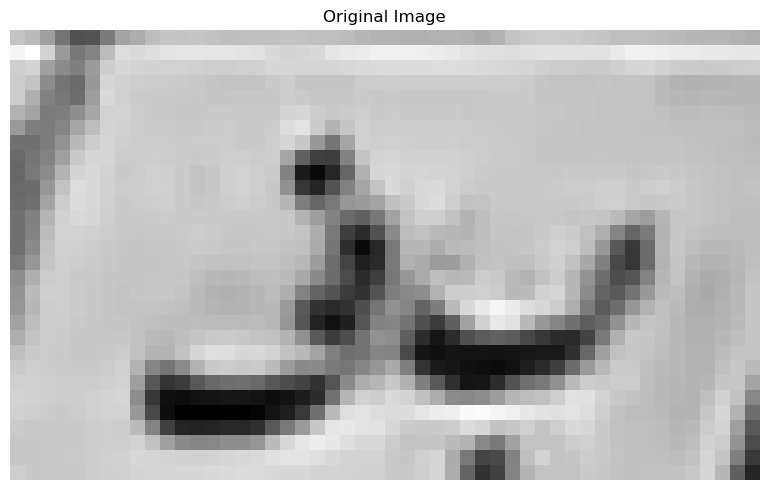

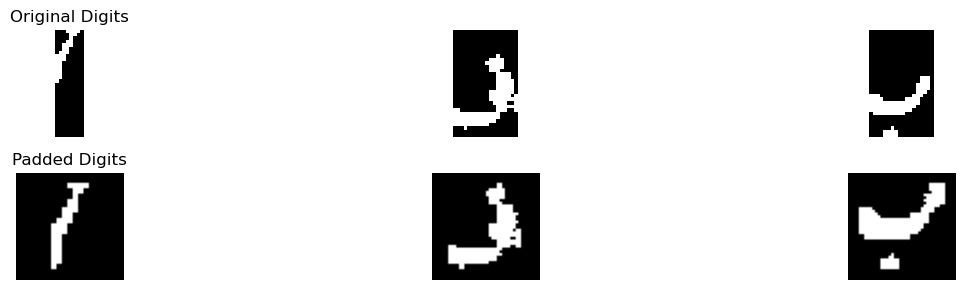

Best match: م
Full comparison results: {'أ': 0.3482142857142857, 'ب': 0.03125, 'ج': 0.13657407407407407, 'د': 0.41570928584086475, 'ر': 0.03125, 'س': 0.4419642857142857, 'ص': 0.4928571428571429, 'ط': 0.1875, 'ع': 0.4292763157894737, 'ف': 0.24305555555555555, 'ق': 0.10555555555555556, 'ك': 0.13920454545454547, 'ل': 0.11513157894736842, 'م': 2.106737012987013, 'ن': 0.0, 'ه': 0.8581989247311828, 'و': 0.2375, 'ي': 0.07670454545454546}
Confidence :  0.6242690441279152
Best match: ف
Full comparison results: {'أ': 0.1111111111111111, 'ب': 0.35600255427841637, 'ج': 1.0532407407407407, 'د': 3.7060185185185186, 'ر': 2.784402937420179, 'س': 2.540178571428571, 'ص': 2.2, 'ط': 1.8726851851851851, 'ع': 0.38425925925925924, 'ف': 4.6030092592592595, 'ق': 3.1365740740740735, 'ك': 1.3668981481481481, 'ل': 2.252314814814815, 'م': 0.31828703703703703, 'ن': 2.0104166666666665, 'ه': 2.875, 'و': 3.0173611111111116, 'ي': 2.7743055555555554}
Confidence :  0.44849537037037046
Best match: ب
Full comparison result

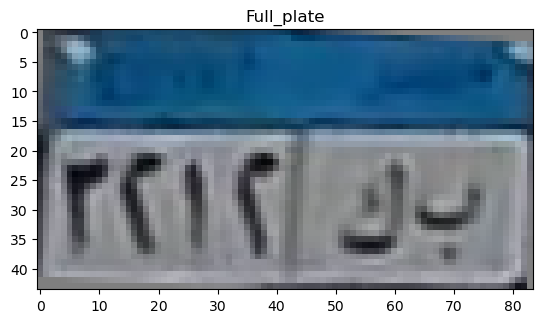

top
[0.10192276 0.19888956 0.45010963 0.57319463 0.62635362 0.60859295
 0.54363437 0.56014399 0.56197477 0.57126517 0.59564763 0.60881147
 0.59771158 0.588237   0.59457408 0.60163619 0.61135604 0.63021211
 0.65030136 0.65457879 0.65061559 0.64654597 0.64058892 0.63610392
 0.62807235 0.58475718 0.5816789  0.58667725 0.57883412 0.58370544
 0.58795941 0.58685089 0.58701295 0.59018923 0.61997022 0.64420784
 0.64405893 0.6505517  0.66738107 0.62889151 0.61094006 0.61782346]
[0.08604816 0.1988763  0.4715922  0.60865301 0.58963287 0.60240461
 0.54740939 0.57674089 0.6081151  0.60594762 0.61434689 0.61487926
 0.5944735  0.56777866 0.59159282 0.58309311 0.56227044 0.53715779
 0.54262189 0.5684927  0.63555765 0.65983767 0.59847591 0.56476196
 0.54783868 0.5693596  0.53624998 0.54204643 0.56521569 0.56013515
 0.53969267 0.53425577 0.5463166  0.58168439 0.63110348 0.63059091
 0.57596381 0.53345196 0.53819305 0.55246838 0.60815474 0.62611849]
[0.11288784 0.28997118 0.46501667 0.57751667 0.51489412 

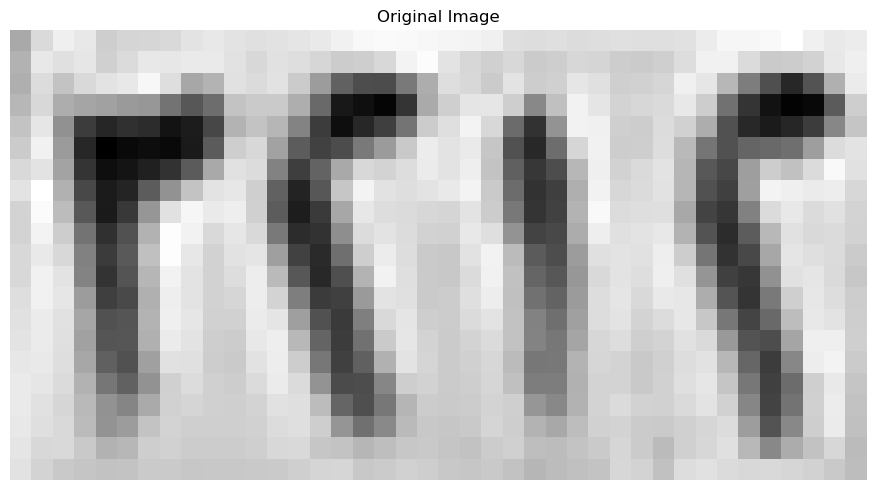

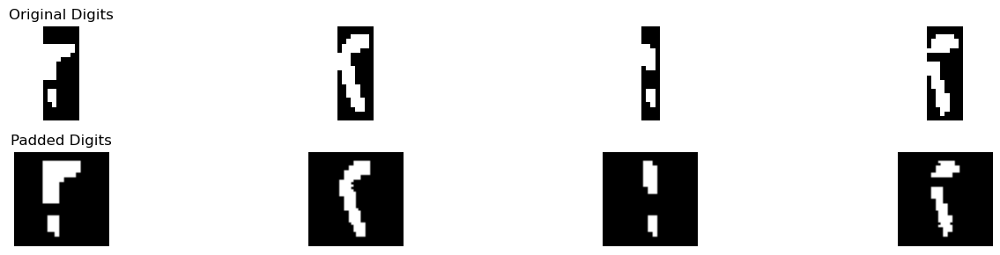

Best match: ٣
Full comparison results: {'١': 0.5625, '٢': 2.09375, '٣': 4.435371517027864, '٤': 2.162298387096774, '٥': 2.3152734778121773, '٦': 1.8875, '٧': 1.5522058823529412, '٨': 0.5416666666666666, '٩': 1.6885212418300655}
Confidence :  1.0600490196078434
Best match: ٢
Full comparison results: {'١': 0.5889423076923077, '٢': 6.6706730769230775, '٣': 3.6880804953560373, '٤': 3.4460622710622713, '٥': 2.526343432109686, '٦': 0.45535714285714285, '٧': 2.3772058823529414, '٨': 0.7611111111111111, '٩': 1.3850710155857213}
Confidence :  1.49129629078352
Best match: ١
Full comparison results: {'١': 4.989583333333334, '٢': 2.463432400932401, '٣': 0.9552051083591331, '٤': 1.186494889519083, '٥': 1.6370061182367683, '٦': 1.1392857142857142, '٧': 0.6838235294117647, '٨': 1.8270833333333332, '٩': 2.0958208655670703}
Confidence :  1.2630754662004664
Best match: ٢
Full comparison results: {'١': 0.20833333333333331, '٢': 6.663461538461538, '٣': 3.1979489164086687, '٤': 2.2484661172161173, '٥': 2.0

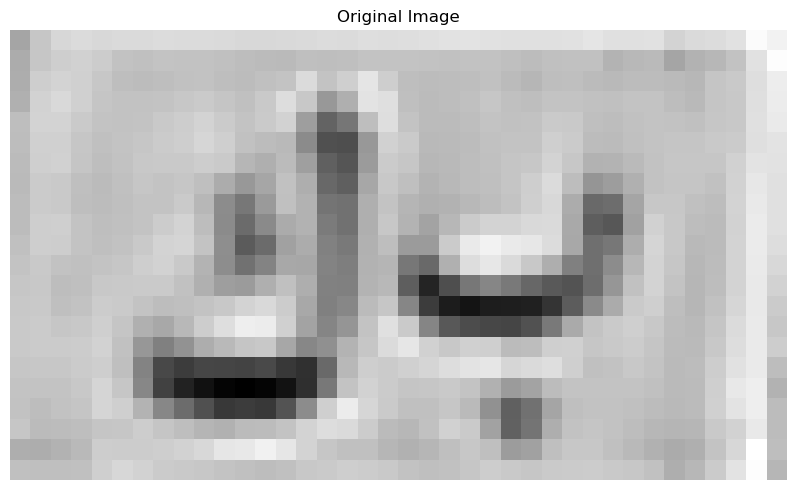

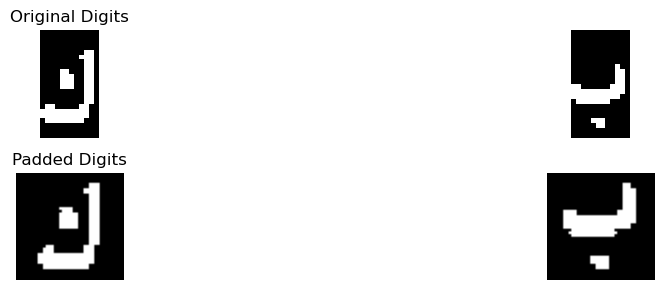

Best match: ك
Full comparison results: {'أ': 0.34782608695652173, 'ب': 0.763013925729443, 'ج': 1.349788647342995, 'د': 2.7169726247987116, 'ر': 3.1365910794602696, 'س': 1.2232142857142856, 'ص': 1.7865942028985509, 'ط': 2.7504528985507246, 'ع': 2.014945652173913, 'ف': 2.663259144237405, 'ق': 1.4287942834138487, 'ك': 5.256793478260869, 'ل': 1.6480978260869563, 'م': 0.08695652173913043, 'ن': 2.447554347826087, 'ه': 1.2570564516129032, 'و': 2.9679448470209344, 'ي': 2.6728469899665552}
Confidence :  1.0601011994002998
Best match: ب
Full comparison results: {'أ': 0.4699074074074074, 'ب': 5.2221405940802486, 'ج': 0.8032407407407407, 'د': 0.2534722222222222, 'ر': 0.7071360153256705, 'س': 0.4776785714285714, 'ص': 2.001388888888889, 'ط': 0.18518518518518517, 'ع': 0.39206242532855434, 'ف': 0.6926256613756614, 'ق': 0.7037037037037037, 'ك': 1.8078703703703702, 'ل': 0.03571428571428571, 'م': 0.43287037037037035, 'ن': 0.3900462962962963, 'ه': 0.46875, 'و': 1.067839008363202, 'ي': 1.1747685185185184}


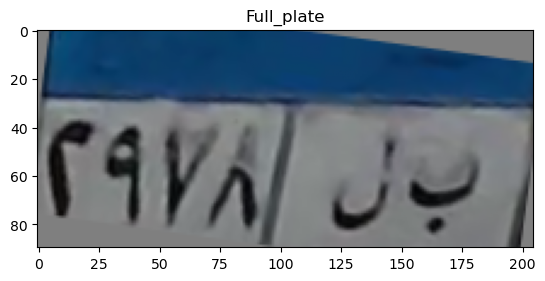

top
[0.37863255 0.33993608 0.39974    0.48388392 0.49976903 0.491274
 0.49121934 0.48948011 0.49201656 0.49556196 0.49970918 0.49662392
 0.44169973 0.33480889 0.26545819 0.22300711 0.20109823 0.17709902
 0.24192951 0.29853665 0.31343167 0.34553613 0.42756973 0.45580568
 0.47814625 0.51010946 0.52258725 0.52804451 0.5338227  0.53958735
 0.54115508 0.54073808 0.54625895 0.5477425  0.54616179 0.54466041
 0.5458526  0.54910015 0.56028275 0.56363752 0.56622637 0.56786027
 0.56659568 0.56313559 0.55867824 0.55426647 0.55025299 0.54654588
 0.54393406 0.54321065 0.54067775 0.53781754 0.53442578 0.52394784
 0.50728118 0.48742824 0.46977735 0.46155124 0.46381072 0.47695495
 0.49630473 0.51167591 0.52467015 0.53369951 0.53881306 0.54368162
 0.54532782 0.54536081 0.54452009 0.53894378 0.52837353 0.51737027
 0.5083295  0.5031249  0.50585344 0.5222541  0.53655066 0.54827707
 0.55209907 0.55024845 0.54812387 0.53042451 0.51553135 0.54422362
 0.55903746 0.55101547 0.53448641 0.5239118  0.52269583 0.52

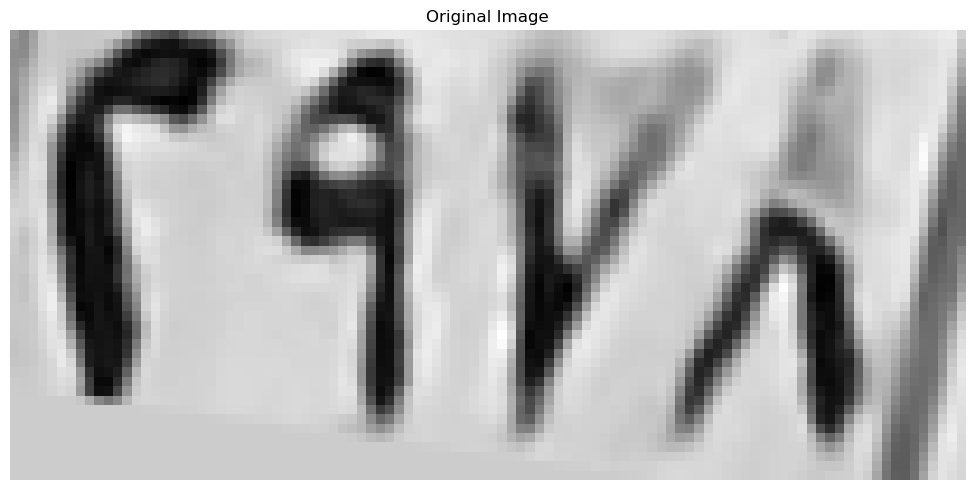

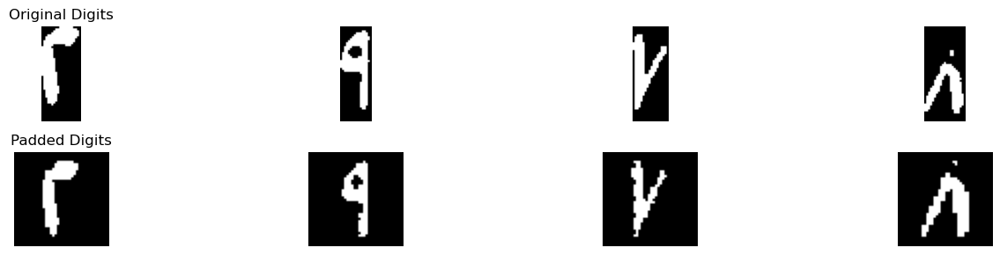

Best match: ٣
Full comparison results: {'١': 0.4, '٢': 2.5958333333333337, '٣': 2.992066563467492, '٤': 1.5, '٥': 2.820129367536488, '٦': 2.1020833333333333, '٧': 1.1253676470588236, '٨': 0.6291666666666667, '٩': 1.0894607843137254}
Confidence :  0.08596859796550205
Best match: ٩
Full comparison results: {'١': 2.565340909090909, '٢': 2.5154428904428907, '٣': 1.2093653250773992, '٤': 0.7730540293040293, '٥': 1.3185491301783872, '٦': 2.0452380952380955, '٧': 0.9319852941176471, '٨': 1.6569444444444443, '٩': 3.3489190548014074}
Confidence :  0.3917890728552491
Best match: ٧
Full comparison results: {'١': 0.06666666666666667, '٢': 0.6583333333333333, '٣': 1.0218653250773992, '٤': 0.9479166666666666, '٥': 0.682736252395695, '٦': 0.14791666666666667, '٧': 2.726470588235294, '٨': 0.7173611111111111, '٩': 0.4268790849673203}
Confidence :  0.8523026315789475
Best match: ٨
Full comparison results: {'١': 0.75, '٢': 0.2, '٣': 0.25, '٤': 0.03125, '٥': 1.1598214285714286, '٦': 0.93125, '٧': 0.750000

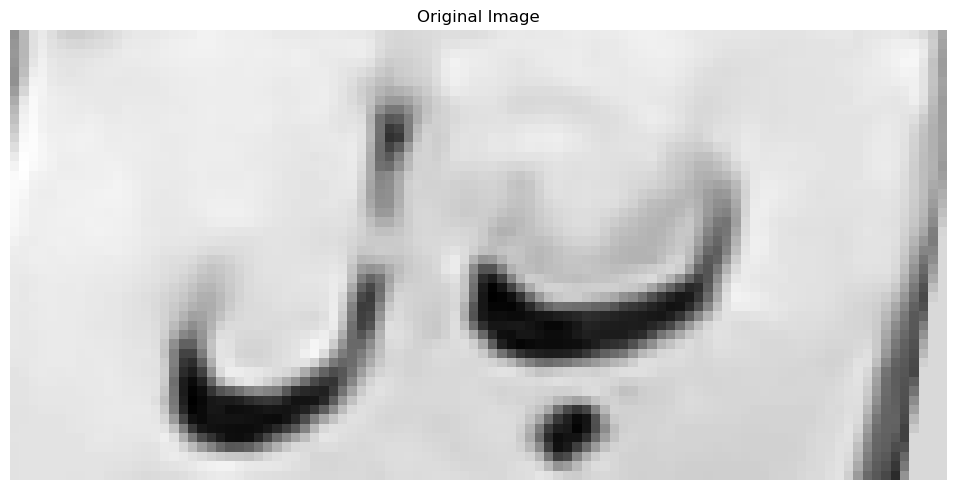

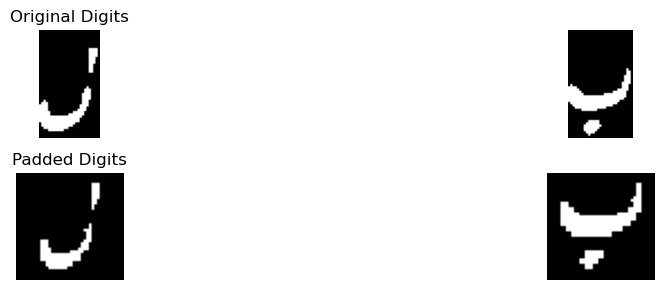

Best match: ل
Full comparison results: {'أ': 0.0, 'ب': 0.10419429708222812, 'ج': 0.7593951941778028, 'د': 2.3864267676767676, 'ر': 3.1474452735753333, 'س': 2.0982142857142856, 'ص': 1.6962121212121213, 'ط': 2.2495993841102537, 'ع': 0.951271614925675, 'ف': 1.6969997594997595, 'ق': 2.364793771043771, 'ك': 1.8181818181818181, 'ل': 4.01462542087542, 'م': 0.13636363636363635, 'ن': 2.9319318181818184, 'ه': 0.4759408602150538, 'و': 2.178451178451178, 'ي': 2.5048589383968065}
Confidence :  0.43359007365004354
Best match: ب
Full comparison results: {'أ': 0.26249999999999996, 'ب': 4.853195128626163, 'ج': 0.17142857142857143, 'د': 0.33333333333333337, 'ر': 0.19374999999999998, 'س': 0.9166666666666666, 'ص': 2.10625, 'ط': 0.13333333333333333, 'ع': 0.26666666666666666, 'ف': 0.19999999999999998, 'ق': 0.43333333333333335, 'ك': 0.7999999999999999, 'ل': 0.1, 'م': 0.33125, 'ن': 0.36249999999999993, 'ه': 0.4375, 'و': 0.13333333333333333, 'ي': 0.33333333333333337}
Confidence :  1.3734725643130816
[['٣', '٩'

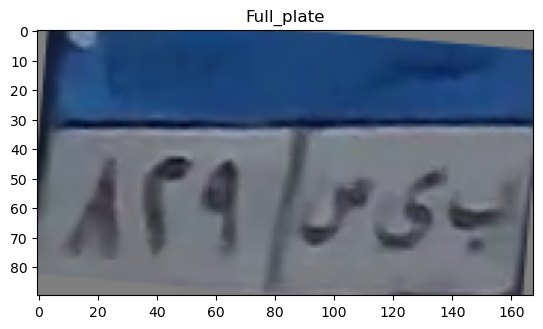

top
[0.20051646 0.09215078 0.13312061 0.22230156 0.33731333 0.4062261
 0.44696926 0.4621552  0.46588751 0.47434873 0.48010466 0.48362
 0.48438326 0.48676932 0.48629814 0.47594644 0.46614681 0.46622647
 0.45891986 0.45754211 0.46657189 0.47261169 0.4727802  0.47576733
 0.4757498  0.47258978 0.47242127 0.47726196 0.48434017 0.48975583
 0.49872028 0.50457851 0.50943009 0.50705893 0.49925427 0.49037907
 0.47872148 0.47353284 0.47482565 0.47754118 0.48861294 0.50421727
 0.4954014  0.48239588 0.48233461 0.48624852 0.49033323 0.49453436
 0.4947067  0.4925506  0.4919302  0.49721545 0.50073466 0.50122337
 0.50311462 0.50668679 0.51313886 0.51689485 0.51668625 0.51653835
 0.51769364 0.51902779 0.51532195 0.51115631 0.51062931 0.50898248
 0.50237865 0.49606363 0.49420241 0.49849929 0.50451645 0.50654004
 0.50702218 0.50789922 0.50935553 0.5108288  0.51186133 0.51713088
 0.52240653 0.51897714 0.5172271  0.52250107 0.52544357 0.52837551]
[0.1593624  0.0899449  0.14001506 0.23297098 0.34850039 0.416

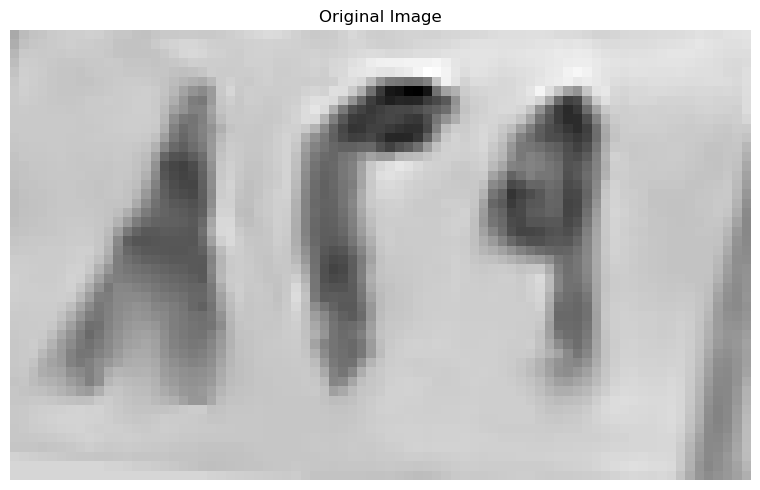

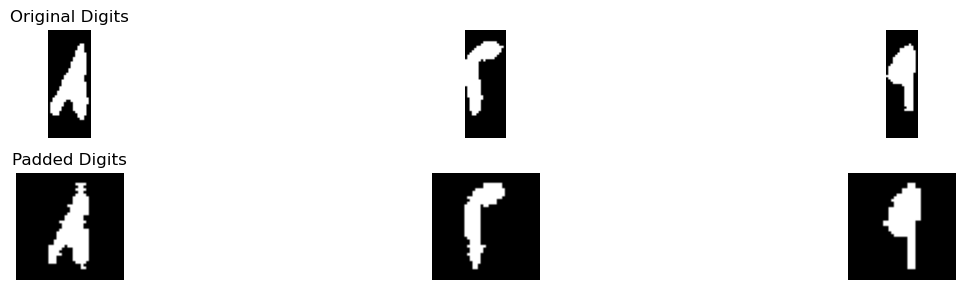

Best match: ٨
Full comparison results: {'١': 1.4145833333333333, '٢': 0.7333333333333334, '٣': 0.5, '٤': 0.37916666666666665, '٥': 1.9499898643667992, '٦': 1.4895833333333333, '٧': 1.2147058823529413, '٨': 3.10625, '٩': 0.85}
Confidence :  0.5781300678166005
Best match: ٣
Full comparison results: {'١': 0.3645833333333333, '٢': 3.2687499999999994, '٣': 3.4196981424148607, '٤': 1.9104166666666667, '٥': 3.247217307975822, '٦': 1.9729166666666667, '٧': 1.1529411764705884, '٨': 0.6416666666666667, '٩': 1.360580065359477}
Confidence :  0.07547407120743066
Best match: ٩
Full comparison results: {'١': 2.9598214285714284, '٢': 2.1517857142857144, '٣': 1.6390286377708978, '٤': 1.0666666666666667, '٥': 1.8509785493144628, '٦': 1.7955357142857142, '٧': 1.4672794117647059, '٨': 2.1847222222222222, '٩': 3.8276143790849675}
Confidence :  0.43389647525676955
In horizontal_segmentation_1
0 29
31 83
In sub_horizontal_segmentation
0 23
24 52
In refine_segmentation_1


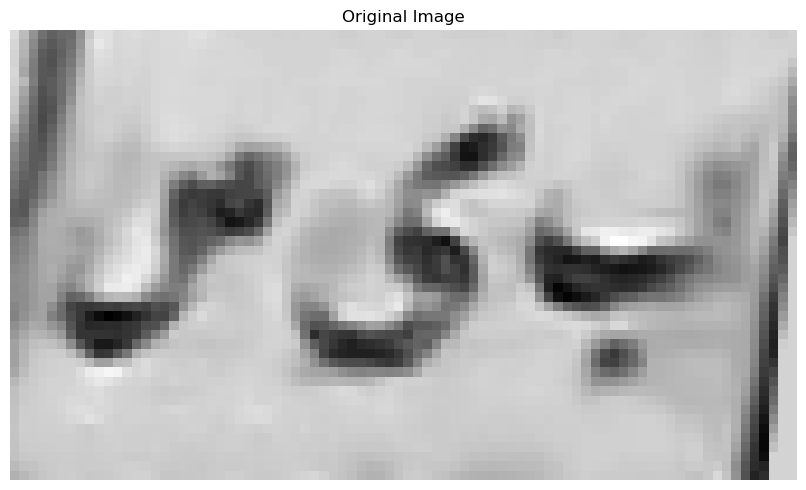

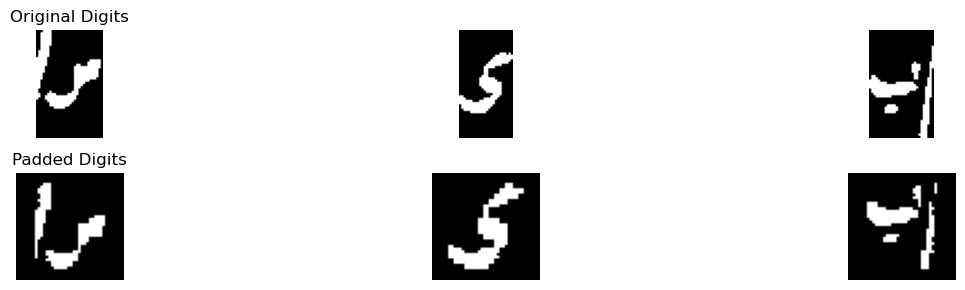

Best match: ل
Full comparison results: {'أ': 0.0, 'ب': 1.4273043766578248, 'ج': 0.5822649572649573, 'د': 1.3308404558404558, 'ر': 2.2927718832891246, 'س': 1.3035714285714286, 'ص': 1.0193910256410257, 'ط': 1.4110576923076923, 'ع': 0.6634615384615384, 'ف': 1.5239748677248677, 'ق': 2.0684650997151, 'ك': 0.6923076923076924, 'ل': 2.4158653846153846, 'م': 0.0, 'ن': 2.004807692307692, 'ه': 0.375, 'و': 1.690081908831909, 'ي': 2.132051282051282}
Confidence :  0.06154675066312998
Best match: ي
Full comparison results: {'أ': 0.6830357142857142, 'ب': 0.520628078817734, 'ج': 1.3705357142857144, 'د': 2.7767857142857144, 'ر': 2.4512007389162562, 'س': 2.522321428571429, 'ص': 2.774702380952381, 'ط': 2.3883928571428568, 'ع': 0.65625, 'ف': 2.361607142857143, 'ق': 1.9017857142857144, 'ك': 2.53125, 'ل': 2.0982142857142856, 'م': 0.03125, 'ن': 1.3973214285714286, 'ه': 1.59375, 'و': 3.022321428571429, 'ي': 3.7116071428571433}
Confidence :  0.34464285714285725
Best match: م
Full comparison results: {'أ': 0.0, 

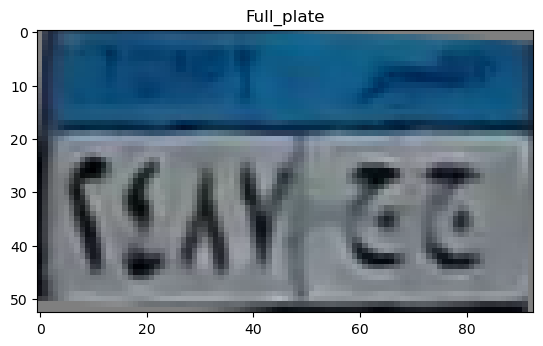

top
[0.07254657 0.1406779  0.32782063 0.4483649  0.53511081 0.53266396
 0.55016208 0.59960418 0.53460376 0.48212436 0.4527381  0.51360369
 0.57092676 0.57659837 0.5607962  0.54042549 0.51072507 0.48885449
 0.52521474 0.54357013 0.57852893 0.56829696 0.56788331 0.5800074
 0.53845738 0.49361385 0.48371698 0.4821298  0.48041946 0.48410326
 0.48719608 0.48449978 0.48990265 0.48701333 0.49428892 0.50832013
 0.51554093 0.51674932 0.52112315 0.52521145 0.53647023 0.54105638
 0.54029839 0.54781095 0.56228705 0.55859909]
[0.03408593 0.1587846  0.34967471 0.46459848 0.52735137 0.53734325
 0.55609807 0.55763904 0.39341846 0.2259835  0.14282333 0.17946325
 0.3199304  0.48358001 0.55039221 0.53816794 0.51870262 0.50505761
 0.55493806 0.58037995 0.53294417 0.44115025 0.47908848 0.60276812
 0.54048259 0.5153294  0.50115201 0.48911157 0.4863103  0.47984573
 0.47727176 0.48513673 0.48709448 0.49138406 0.50612582 0.52850812
 0.54099331 0.53067613 0.50191504 0.48340931 0.51346684 0.55216676
 0.55390607 0

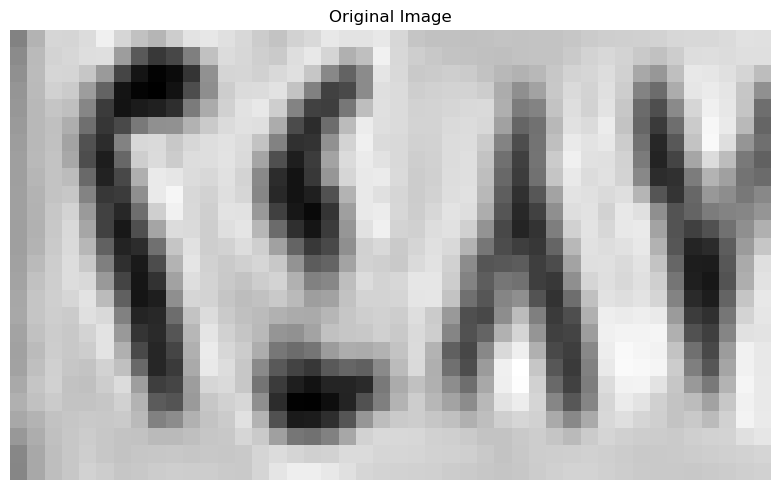

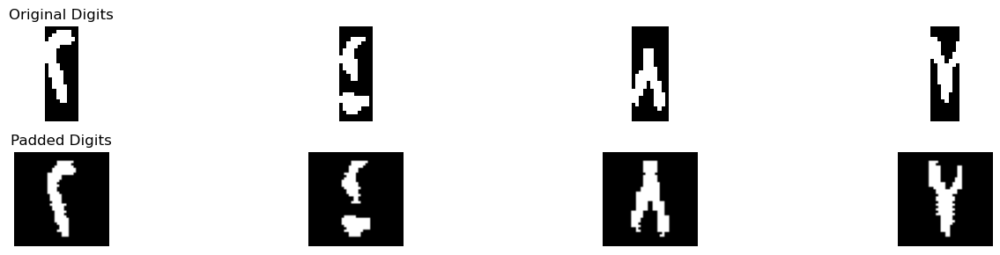

Best match: ٢
Full comparison results: {'١': 0.6458333333333334, '٢': 7.298878205128204, '٣': 3.8364938080495357, '٤': 3.3835622710622713, '٥': 2.45734280554327, '٦': 0.6616071428571428, '٧': 2.384558823529412, '٨': 0.5861111111111111, '٩': 1.1994406737053798}
Confidence :  1.7311921985393344
Best match: ٤
Full comparison results: {'١': 1.9999999999999998, '٢': 1.9134615384615385, '٣': 1.62296826625387, '٤': 4.779744180550632, '٥': 2.8003925254312256, '٦': 0.14285714285714285, '٧': 0.5139705882352941, '٨': 1.4659722222222222, '٩': 1.4942967571644044}
Confidence :  0.9896758275597033
Best match: ٨
Full comparison results: {'١': 2.875, '٢': 1.4375, '٣': 0.8943498452012384, '٤': 1.78125, '٥': 1.9194401444788443, '٦': 1.11875, '٧': 0.936764705882353, '٨': 7.036111111111111, '٩': 3.7085375816993467}
Confidence :  1.6637867647058824
Best match: ٧
Full comparison results: {'١': 1.1785714285714286, '٢': 3.299107142857143, '٣': 2.516157120743034, '٤': 1.6639880952380952, '٥': 0.5584319254017396

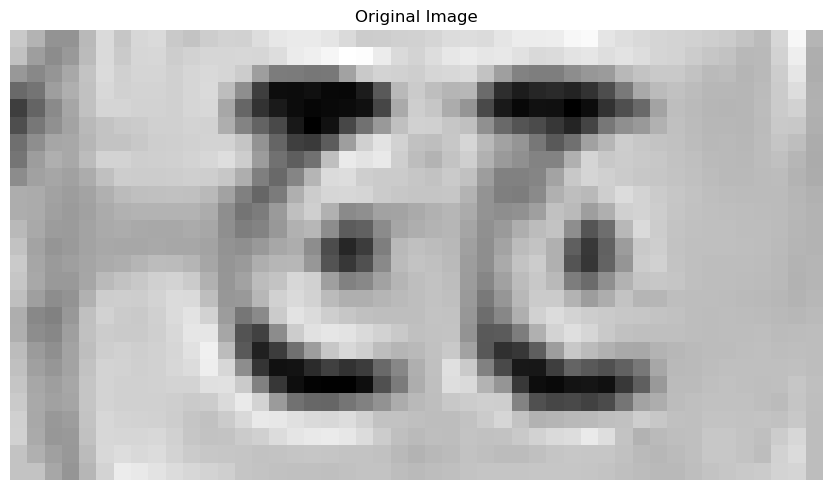

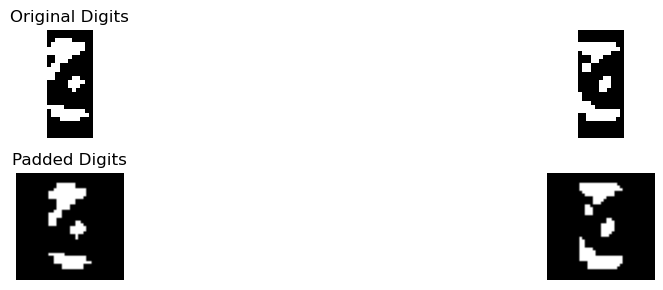

Best match: ج
Full comparison results: {'أ': 0.25, 'ب': 0.6196516287033529, 'ج': 4.313194841071528, 'د': 2.1824549110190192, 'ر': 0.29000000000000004, 'س': 0.07142857142857142, 'ص': 0.09375, 'ط': 0.9541337285902504, 'ع': 1.7374878167641326, 'ف': 1.6848370927318295, 'ق': 1.768718671679198, 'ك': 0.7689393939393939, 'ل': 0.5652890466531441, 'م': 2.1306818181818183, 'ن': 1.6655952380952381, 'ه': 0.5436827956989247, 'و': 1.248346560846561, 'ي': 1.2943097361575622}
Confidence :  1.0653699650262545
Best match: ج
Full comparison results: {'أ': 0.78125, 'ب': 0.548988726790451, 'ج': 4.983597790838324, 'د': 2.191781749382369, 'ر': 0.36987711213517666, 'س': 0.3214285714285714, 'ص': 0.15625, 'ط': 1.19972560457308, 'ع': 2.353374363327674, 'ف': 2.250809314954052, 'ق': 2.5722344054580897, 'ك': 1.6827651515151514, 'ل': 0.8826837611105562, 'م': 1.0284090909090908, 'ن': 1.7905952380952381, 'ه': 0.4457661290322581, 'و': 1.1339285714285714, 'ي': 1.2630597361575622}
Confidence :  1.2056816926901173
[['٢', '

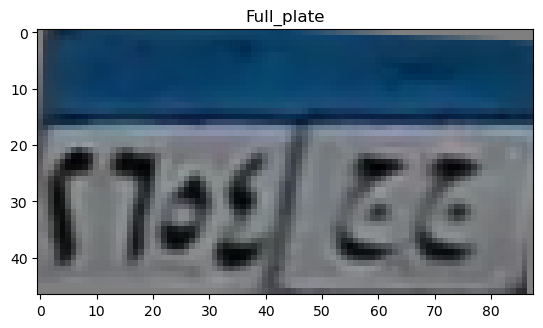

top
[0.3434205  0.40830226 0.51817182 0.54391646 0.53699426 0.56525692
 0.60171903 0.55724465 0.59376576 0.60477995 0.55538493 0.53605699
 0.53003177 0.51986051 0.51984982 0.51268239 0.51898424 0.53774523
 0.54808892 0.53461061 0.52153585 0.54697462 0.53386663 0.48853222
 0.47837221 0.48208603 0.48245258 0.47818102 0.47546806 0.47645388
 0.47657025 0.47403742 0.47167661 0.47569597 0.4821468  0.48482955
 0.49772728 0.51724063 0.53227206 0.5289273  0.5269539  0.51859546
 0.51037311 0.49114174]
[0.33673267 0.4496407  0.5320996  0.55460041 0.53675045 0.46678555
 0.31491485 0.22989912 0.32547017 0.4167529  0.50750223 0.53581657
 0.53441557 0.46868519 0.38142142 0.31330065 0.3348554  0.43577913
 0.47268482 0.46088353 0.46012378 0.49306725 0.50506628 0.49046874
 0.47661311 0.47020792 0.47147775 0.4747043  0.47767803 0.47721929
 0.47806317 0.47407379 0.4691859  0.47629618 0.49087443 0.50498244
 0.52306001 0.53788479 0.49471464 0.44489125 0.46098358 0.48330741
 0.5017986  0.47953034]
[0.342911 

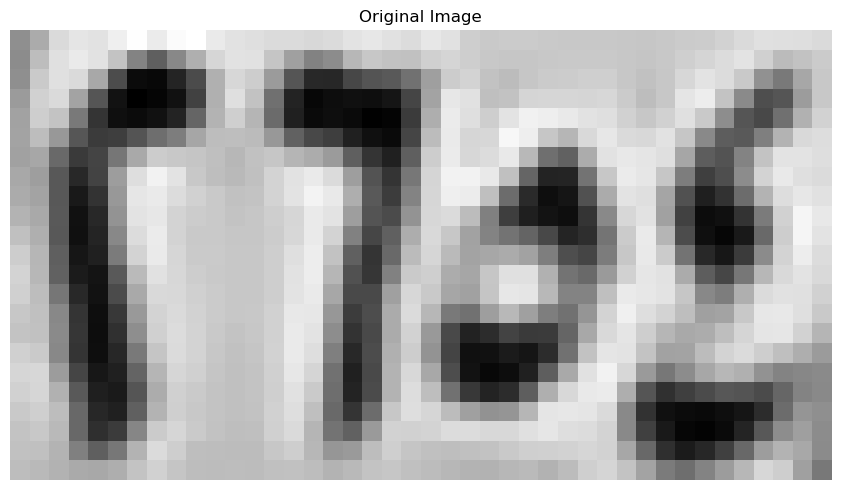

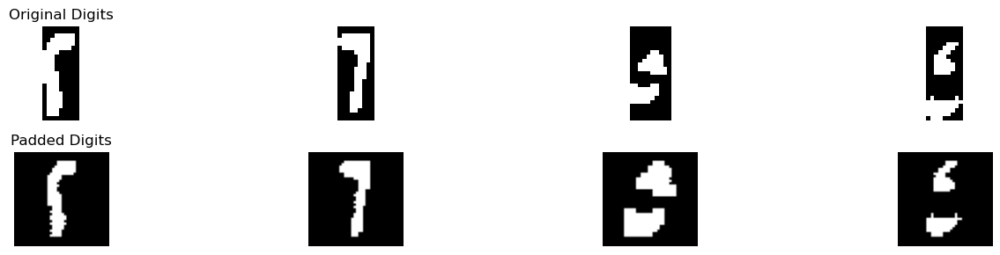

Best match: ٢
Full comparison results: {'١': 0.25, '٢': 6.2972756410256405, '٣': 3.827109133126935, '٤': 3.255128205128205, '٥': 2.3846657083886185, '٦': 0.7184523809523808, '٧': 1.5205882352941176, '٨': 0.425, '٩': 0.5213675213675213}
Confidence :  1.2350832539493528
Best match: ٦
Full comparison results: {'١': 2.4278846153846154, '٢': 2.2163461538461537, '٣': 1.9416602167182662, '٤': 0.9032509157509158, '٥': 2.4501418988648087, '٦': 3.6532738095238098, '٧': 1.4194852941176472, '٨': 0.3611111111111111, '٩': 1.2455693815987934}
Confidence :  0.6015659553295005
Best match: ٥
Full comparison results: {'١': 0.5454545454545454, '٢': 0.9772727272727273, '٣': 1.1051136363636365, '٤': 1.8948863636363638, '٥': 6.232954545454545, '٦': 1.2840909090909092, '٧': 0.8636363636363638, '٨': 1.0767045454545454, '٩': 0.5340909090909092}
Confidence :  2.169034090909091
Best match: ٤
Full comparison results: {'١': 1.7499999999999998, '٢': 1.5291666666666666, '٣': 1.27921826625387, '٤': 3.5729166666666665,

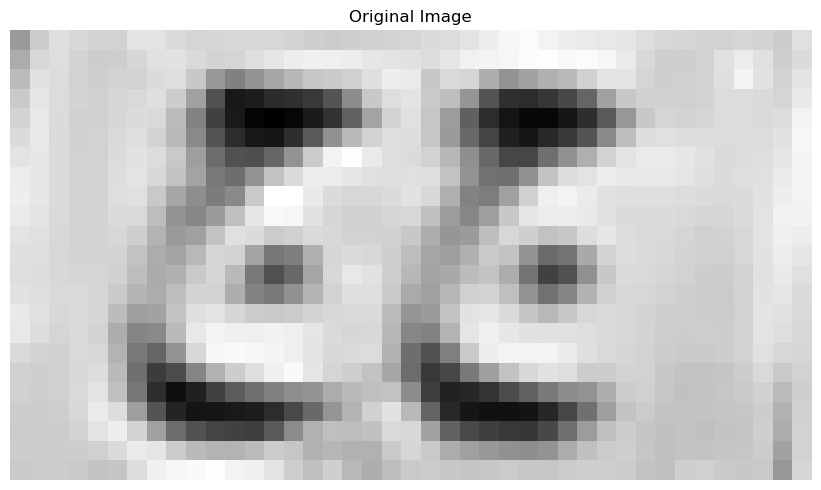

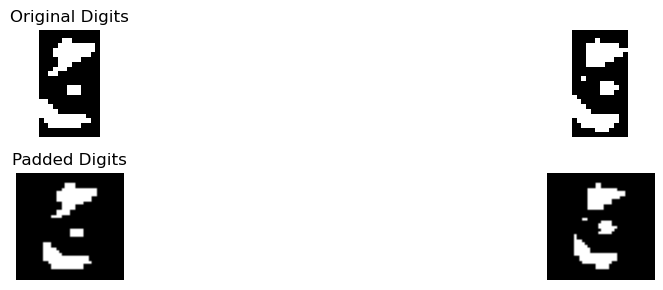

Best match: ج
Full comparison results: {'أ': 0.525, 'ب': 0.21236737400530503, 'ج': 4.2789112884034175, 'د': 3.7329178691678693, 'ر': 1.001182712215321, 'س': 0.7723214285714286, 'ص': 0.9211309523809523, 'ط': 1.9927963529232453, 'ع': 2.3242504135649296, 'ف': 2.339351851851852, 'ق': 2.4340395118620926, 'ك': 2.09375, 'ل': 1.6903846153846156, 'م': 1.8022727272727272, 'ن': 2.6209523809523807, 'ه': 1.2726478494623656, 'و': 1.334339264379587, 'ي': 2.0817865105908586}
Confidence :  0.2729967096177741
Best match: ج
Full comparison results: {'أ': 0.5575657894736842, 'ب': 0.5930868700265253, 'ج': 3.7331674727590256, 'د': 3.3956251107566895, 'ر': 0.5049437781109445, 'س': 0.7678571428571428, 'ص': 0.8544642857142857, 'ط': 1.2770347780655127, 'ع': 1.2418187606112054, 'ف': 2.219367864104706, 'ق': 1.7950240183792814, 'ك': 0.7897727272727273, 'ل': 1.2646892014519056, 'م': 1.506877990430622, 'ن': 2.3275845864661653, 'ه': 1.3341397849462366, 'و': 1.4162576580339739, 'ي': 2.189582138537627}
Confidence :  0.

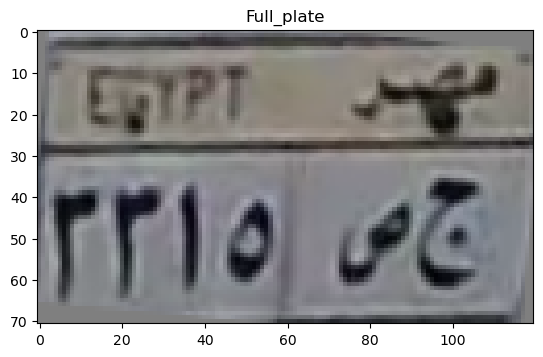

top
[0.32031135 0.25938508 0.32294887 0.37518793 0.39735987 0.40091693
 0.39639314 0.39777387 0.39203327 0.36873148 0.35814477 0.36557676
 0.39315338 0.42320059 0.43655605 0.44024929 0.44644623 0.45496804
 0.4771491  0.48275444 0.47781653 0.47633631 0.48341735 0.48961982
 0.5156505  0.55510321 0.55987633 0.55272228 0.54353507 0.54331755
 0.54976574 0.55258594 0.5594483  0.55462136 0.52430177 0.50624953
 0.50366375 0.50343091 0.53169158 0.55087173 0.54343708 0.53392995
 0.52050843 0.51772059 0.51870251 0.51778493 0.53373775 0.5529182
 0.56446287 0.58572846 0.57997455 0.55486287 0.54541776 0.54192374
 0.53146447 0.5319434  0.55014576 0.57182928 0.57116292 0.55968926]
[0.3187332  0.33388057 0.4517483  0.525666   0.56557861 0.58098762
 0.58457822 0.59045858 0.58873328 0.57968382 0.57432351 0.57854907
 0.59633245 0.61235175 0.61834464 0.61472015 0.61296494 0.60585969
 0.61173743 0.60865132 0.60362696 0.60252056 0.60560278 0.61586304
 0.63147421 0.65021621 0.65623987 0.65236438 0.6498338  0.

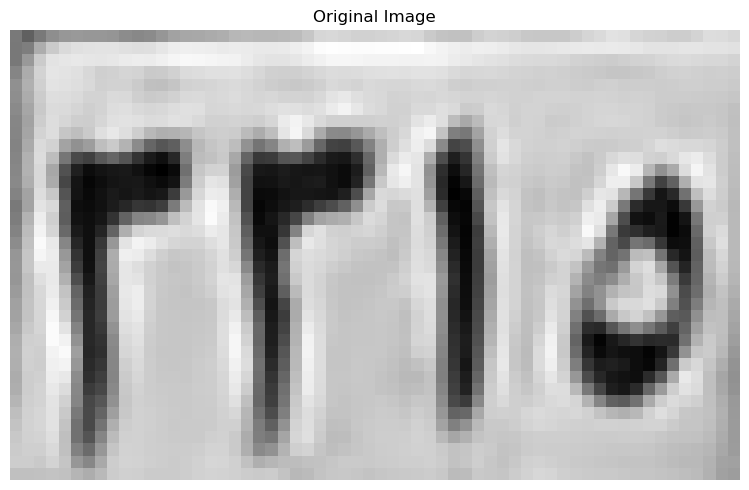

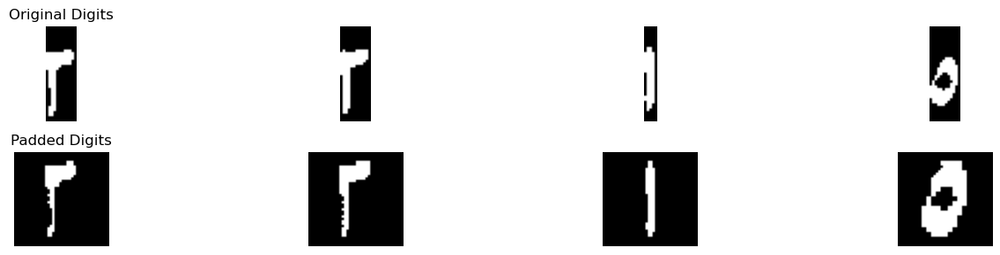

Best match: ٣
Full comparison results: {'١': 0.8461538461538463, '٢': 3.139423076923077, '٣': 4.044698142414861, '٤': 1.5155906593406594, '٥': 1.6857124428718857, '٦': 2.125297619047619, '٧': 0.986764705882353, '٨': 0.4916666666666667, '٩': 1.004917672197084}
Confidence :  0.4526375327458918
Best match: ٣
Full comparison results: {'١': 0.7692307692307693, '٢': 3.266826923076923, '٣': 3.6483165634674926, '٤': 1.5431089743589743, '٥': 1.8270814904909334, '٦': 2.339583333333333, '٧': 0.924264705882353, '٨': 0.4736111111111111, '٩': 1.0572052538964303}
Confidence :  0.19074482019528483
Best match: ١
Full comparison results: {'١': 3.84375, '٢': 1.9906759906759905, '٣': 1.3651315789473684, '٤': 1.2964056776556778, '٥': 0.9569419873212444, '٦': 0.19285714285714284, '٧': 0.7389705882352942, '٨': 1.9527777777777775, '٩': 0.907444067370538}
Confidence :  0.9265370046620047
Best match: ٥
Full comparison results: {'١': 0.7368421052631579, '٢': 1.7286184210526316, '٣': 1.4358552631578947, '٤': 2.55

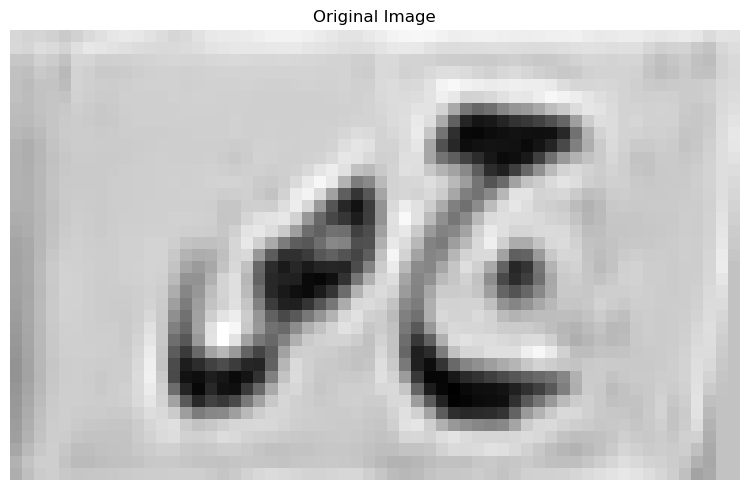

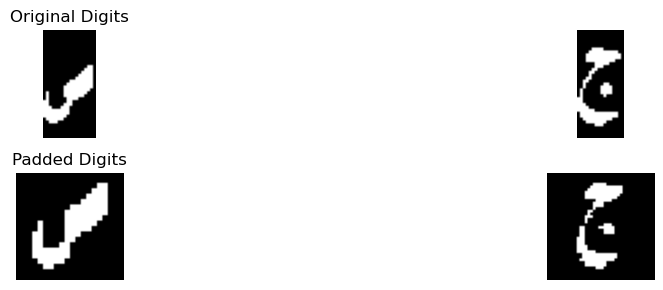

Best match: ص
Full comparison results: {'أ': 0.3928571428571428, 'ب': 0.7470751231527093, 'ج': 0.6116071428571428, 'د': 1.8303571428571428, 'ر': 1.3951662561576352, 'س': 4.535714285714286, 'ص': 5.3220238095238095, 'ط': 1.3928571428571428, 'ع': 0.25, 'ف': 2.0625, 'ق': 1.5223214285714286, 'ك': 1.2901785714285714, 'ل': 0.9285714285714286, 'م': 0.4910714285714286, 'ن': 1.25, 'ه': 2.09375, 'و': 1.7232142857142856, 'ي': 1.9425595238095237}
Confidence :  0.39315476190476195
Best match: ج
Full comparison results: {'أ': 0.5992647058823529, 'ب': 0.315815649867374, 'ج': 3.779374128878605, 'د': 2.8152116234585276, 'ر': 0.4250398855194252, 'س': 0.6071428571428572, 'ص': 0.36160714285714285, 'ط': 0.9351119894598156, 'ع': 1.5114938080495357, 'ف': 1.6710091200222779, 'ق': 2.126310568086884, 'ك': 0.793560606060606, 'ل': 0.9956462848297214, 'م': 1.7190842245989304, 'ن': 1.8910084033613446, 'ه': 0.7363575268817204, 'و': 1.1904081076875195, 'ي': 1.7391722408026755}
Confidence :  0.48208125271003865
[['٣', 

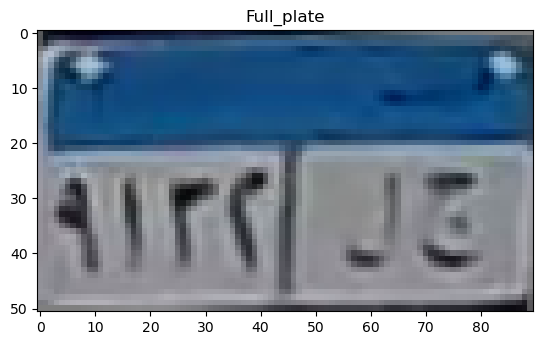

top
[0.59562801 0.53066353 0.48990039 0.46877032 0.48952429 0.54811122
 0.5677248  0.57742667 0.57766411 0.58413022 0.5919367  0.60871195
 0.61469907 0.62163675 0.62123529 0.62374289 0.62286431 0.60399477
 0.60269339 0.59591355 0.59425241 0.59277417 0.59176161 0.58611534
 0.59004703 0.58215494 0.58108039 0.58675429 0.59898304 0.61171251
 0.61560087 0.62448402 0.62660707 0.63042576 0.63404993 0.64495213
 0.65024696 0.64401694 0.64238326 0.6349767  0.61927358 0.60714588
 0.60694603 0.58716968 0.45657072]
[0.59222386 0.54616561 0.59395978 0.62730325 0.62299187 0.62261044
 0.64370955 0.6733105  0.64928075 0.63846379 0.63491111 0.63362063
 0.6321086  0.63514048 0.63778939 0.63924476 0.63641005 0.63266438
 0.63140644 0.62921068 0.63189958 0.63775565 0.63883537 0.63084024
 0.62078673 0.61853076 0.6221548  0.62001689 0.61993311 0.62679946
 0.62772596 0.63334732 0.63660887 0.63154959 0.62171978 0.62006331
 0.62819863 0.64348607 0.67210833 0.68681826 0.65595775 0.63805879
 0.67499684 0.68048294 

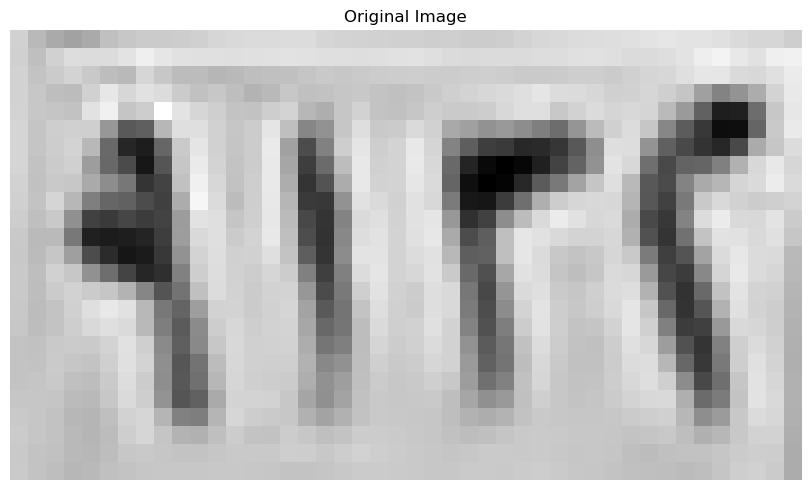

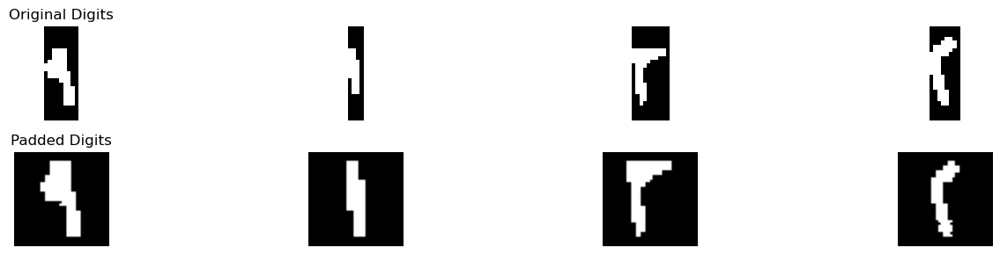

Best match: ٩
Full comparison results: {'١': 1.8933823529411764, '٢': 2.75735294117647, '٣': 1.9322755417956659, '٤': 2.1525735294117645, '٥': 3.3170748562582926, '٦': 2.497426470588236, '٧': 1.0397058823529413, '٨': 2.9669117647058822, '٩': 5.057598039215686}
Confidence :  0.8702615914786969
Best match: ١
Full comparison results: {'١': 4.3875, '٢': 2.6908508158508155, '٣': 1.328173374613003, '٤': 2.1234661172161173, '٥': 1.1111602535751142, '٦': 0.6833333333333332, '٧': 1.4654411764705884, '٨': 2.5381944444444446, '٩': 2.4529600301659125}
Confidence :  0.8483245920745923
Best match: ٣
Full comparison results: {'١': 0.631578947368421, '٢': 1.2894736842105263, '٣': 2.990131578947368, '٤': 1.2286184210526316, '٥': 1.8214285714285716, '٦': 1.800986842105263, '٧': 1.2174342105263158, '٨': 0.5131578947368421, '٩': 0.662828947368421}
Confidence :  0.5843515037593983
Best match: ٢
Full comparison results: {'١': 0.2708333333333333, '٢': 5.982371794871795, '٣': 3.7119775541795663, '٤': 2.866597

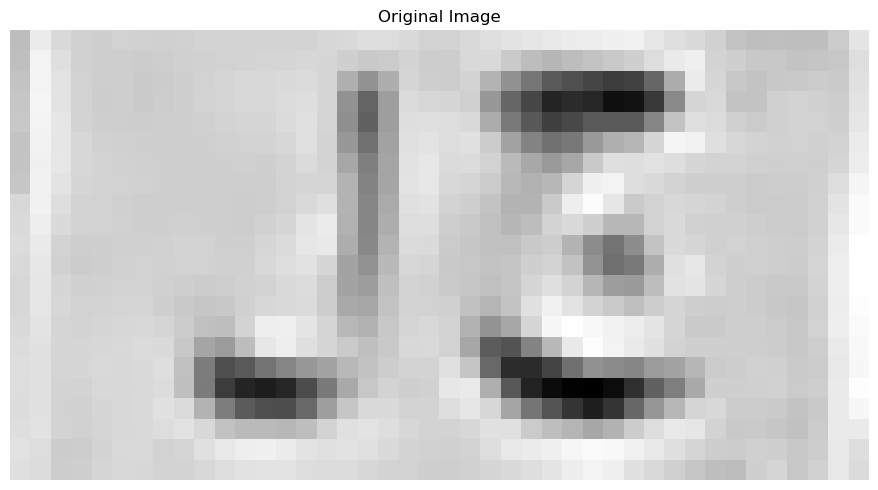

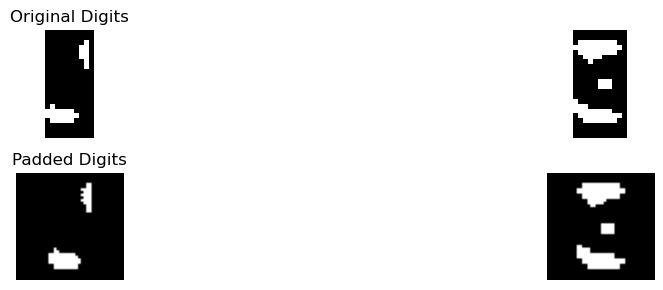

Best match: ل
Full comparison results: {'أ': 0.0, 'ب': 0.2981598143236074, 'ج': 0.6994907407407407, 'د': 1.8938855945147168, 'ر': 3.19571080531163, 'س': 1.1785714285714286, 'ص': 1.1122023809523809, 'ط': 2.0869030446897767, 'ع': 1.6766541128807684, 'ف': 1.3027433053961068, 'ق': 2.2339033370340085, 'ك': 1.2660984848484849, 'ل': 4.428386222910216, 'م': 0.5596590909090909, 'ن': 3.022440476190476, 'ه': 0.31760752688172045, 'و': 2.1238768016785254, 'ي': 2.3531284838350053}
Confidence :  0.6163377087992932
Best match: ج
Full comparison results: {'أ': 0.5, 'ب': 0.440815649867374, 'ج': 4.951103059581321, 'د': 2.74914736335789, 'ر': 0.4851295986622074, 'س': 0.5401785714285714, 'ص': 0.29910714285714285, 'ط': 1.027197490512708, 'ع': 1.6079673646481796, 'ف': 2.3626138037746696, 'ق': 2.60359753550543, 'ك': 1.2964015151515151, 'ل': 1.147793726741095, 'م': 0.6534090909090908, 'ن': 2.25593253968254, 'ه': 0.6676075268817204, 'و': 1.2619378306878306, 'ي': 1.6664601089653686}
Confidence :  1.1009778481117

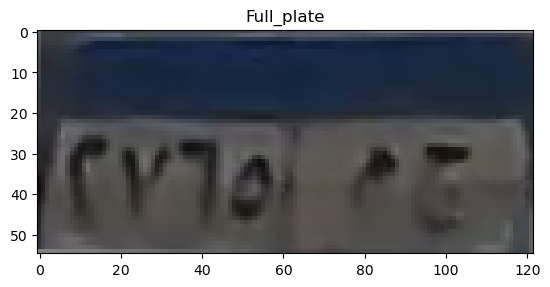

top
[0.21081659 0.19816395 0.19793846 0.19425863 0.20553314 0.25873473
 0.40432297 0.40763179 0.41070317 0.40280259 0.38573381 0.36630213
 0.35026353 0.35179156 0.34815722 0.34642863 0.33994991 0.33628252
 0.34009196 0.33760651 0.33265094 0.32478099 0.31289374 0.30565952
 0.31051552 0.31556684 0.32330275 0.32832725 0.33109227 0.33275434
 0.33971665 0.34376843 0.35246941 0.36216145 0.367539   0.36832956
 0.36946784 0.37206435 0.37227881 0.36970228 0.36858637 0.35242522
 0.34642798 0.34316811 0.34161858 0.34166619 0.35064608 0.35624338
 0.36256527 0.36949695 0.37353341 0.37304321 0.37075308 0.36572091
 0.36592005 0.36136276 0.36202146 0.36979566 0.3532975  0.30099205
 0.27143475]
[0.20344245 0.19743766 0.19399863 0.19032216 0.21679275 0.30359238
 0.44705899 0.39682585 0.39533994 0.39180563 0.38646373 0.35018475
 0.31522266 0.31791108 0.31560078 0.31098506 0.31956189 0.33036172
 0.34038451 0.33683116 0.3329096  0.32132929 0.31360104 0.31162934
 0.31289313 0.30775814 0.31045422 0.31295593 

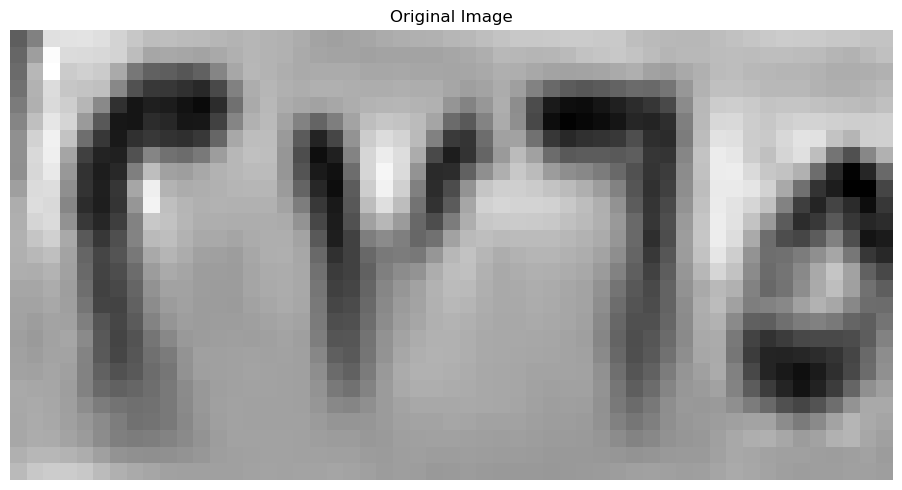

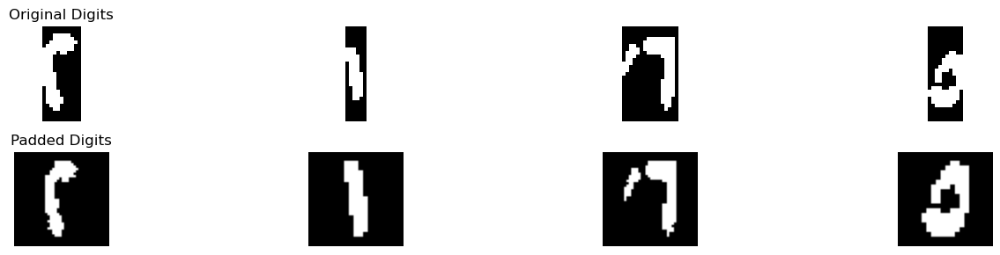

Best match: ٢
Full comparison results: {'١': 0.0, '٢': 4.299107142857142, '٣': 3.170859133126935, '٤': 2.4577380952380956, '٥': 2.9255491670352347, '٦': 1.2029761904761904, '٧': 1.3955882352941178, '٨': 0.43680555555555556, '٩': 0.5927579365079365}
Confidence :  0.5641240048651037
Best match: ١
Full comparison results: {'١': 4.4125000000000005, '٢': 2.6515879953379957, '٣': 1.5058049535603715, '٤': 1.618269230769231, '٥': 1.223311034940292, '٦': 2.006845238095238, '٧': 1.2316176470588236, '٨': 2.725, '٩': 3.200273378582202}
Confidence :  0.6061133107088992
Best match: ٣
Full comparison results: {'١': 0.045454545454545456, '٢': 0.7272727272727272, '٣': 2.0454545454545454, '٤': 0.09090909090909091, '٥': 1.0823863636363638, '٦': 2.03125, '٧': 0.5454545454545455, '٨': 0.4431818181818182, '٩': 0.65625}
Confidence :  0.007102272727272707
Best match: ٥
Full comparison results: {'١': 0.45, '٢': 0.98125, '٣': 1.00625, '٤': 2.1625, '٥': 6.034821428571429, '٦': 1.43125, '٧': 0.9500000000000002, '

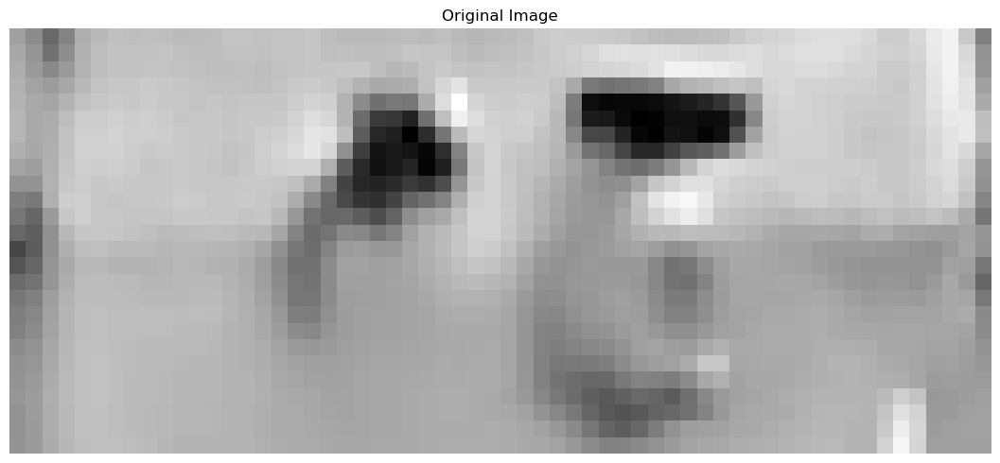

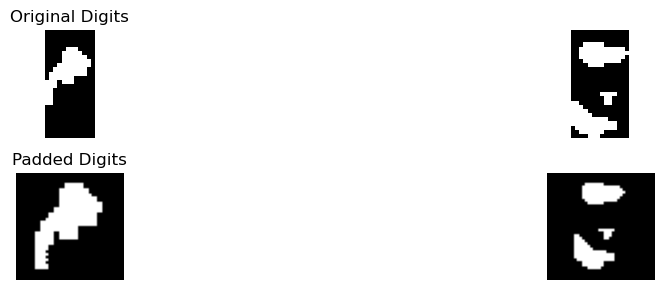

Best match: م
Full comparison results: {'أ': 0.51125, 'ب': 0.7252155172413793, 'ج': 1.3347222222222221, 'د': 1.194398148148148, 'ر': 0.28, 'س': 2.0982142857142856, 'ص': 1.5608333333333333, 'ط': 0.4, 'ع': 0.15125, 'ف': 0.5367526455026455, 'ق': 0.8076851851851851, 'ك': 0.24, 'ل': 0.32, 'م': 2.9774999999999996, 'ن': 0.7025, 'ه': 2.25, 'و': 2.026435185185185, 'ي': 0.5302564102564102}
Confidence :  0.3637499999999998
Best match: ج
Full comparison results: {'أ': 0.47368421052631576, 'ب': 0.10344827586206896, 'ج': 4.338316352475391, 'د': 2.7318759968102073, 'ر': 0.9551566416040099, 'س': 0.9866071428571428, 'ص': 0.6116071428571428, 'ط': 1.0711114067092329, 'ع': 1.3926715871219266, 'ف': 1.807504873294347, 'ق': 2.080017022843848, 'ك': 0.615530303030303, 'ل': 1.1468821510297482, 'م': 1.0677332535885167, 'ن': 2.140097117794486, 'ه': 0.9811827956989247, 'و': 0.9535849592619541, 'ي': 1.5594767173354682}
Confidence :  0.8032201778325918
[['٢', '١', '٣', '٥'], ['م', 'ج']]
Tilt angle: -3.00 degrees


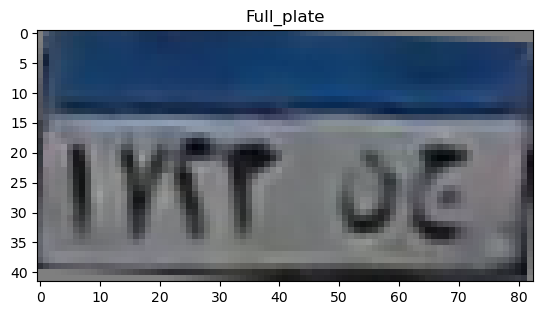

top
[0.21758728 0.46345686 0.5401332  0.52406431 0.48986548 0.46607412
 0.44529517 0.45294836 0.48696961 0.5099552  0.49362225 0.45394701
 0.47177789 0.52045819 0.45239282 0.40957725 0.4981802  0.52207725
 0.51506132 0.47906255 0.43509809 0.430995   0.44368353 0.45479584
 0.33271684 0.20877024 0.1346508  0.16122773 0.25571338 0.38984137
 0.46357081 0.47707717 0.48607293 0.45117722 0.43197936 0.4053099
 0.39022278 0.37063359 0.42860262 0.52113823 0.53728201]
[0.2365046  0.49204669 0.53770184 0.55368517 0.58174961 0.38956536
 0.2396794  0.29735717 0.4689442  0.54862267 0.50548598 0.47272013
 0.50007276 0.46015509 0.33945174 0.32840559 0.46458534 0.50297098
 0.50429462 0.4381536  0.31549451 0.37800311 0.42934529 0.41610206
 0.2576583  0.07942036 0.0214035  0.04328574 0.12368158 0.2687799
 0.33206052 0.35754884 0.33663938 0.24696831 0.18149297 0.16249021
 0.13732936 0.16670666 0.27016484 0.41860304 0.48501755]
[0.20962451 0.52808127 0.53560814 0.51147765 0.55314431 0.31295961
 0.09592529 0

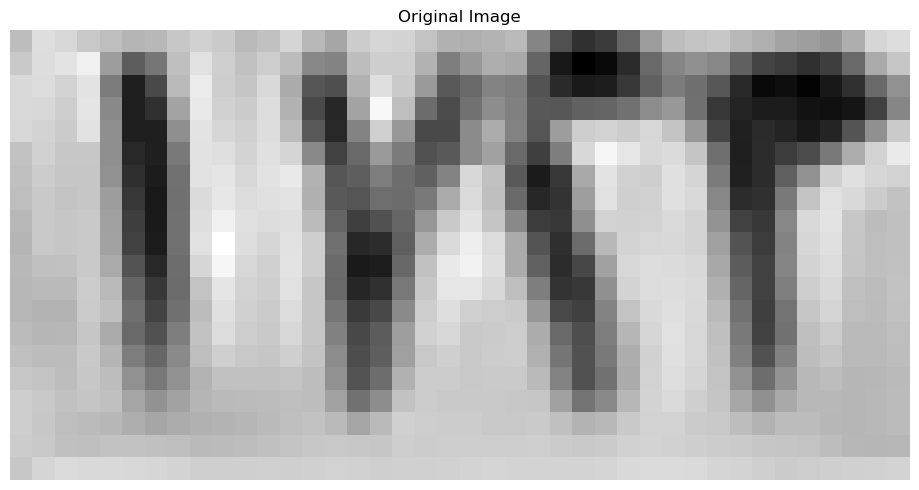

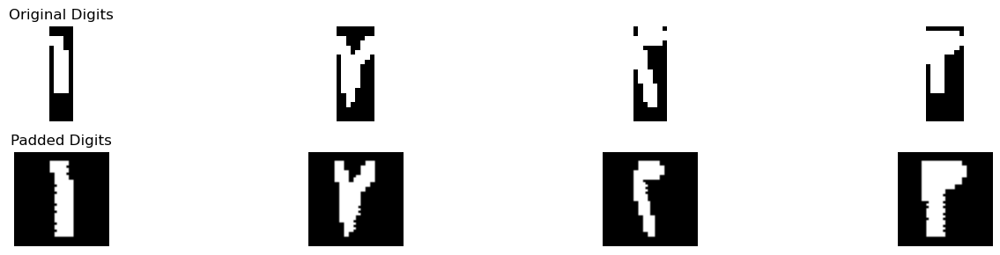

Best match: ١
Full comparison results: {'١': 2.96875, '٢': 2.6063519813519815, '٣': 1.02921826625387, '٤': 1.6271978021978024, '٥': 2.305253022261536, '٦': 1.7011904761904761, '٧': 1.0466911764705882, '٨': 1.9402777777777778, '٩': 1.41091628959276}
Confidence :  0.18119900932400923
Best match: ٣
Full comparison results: {'١': 0.7647058823529412, '٢': 1.4117647058823528, '٣': 3.3002128482972135, '٤': 1.7279411764705883, '٥': 1.6525873507297653, '٦': 0.6591911764705882, '٧': 3.254779411764706, '٨': 1.6255718954248366, '٩': 1.3555964052287583}
Confidence :  0.022716718266253766
Best match: ٢
Full comparison results: {'١': 0.07692307692307693, '٢': 6.500000000000001, '٣': 4.594814241486068, '٤': 3.452586996336996, '٥': 2.590875165855816, '٦': 1.0205357142857143, '٧': 2.4308823529411763, '٨': 0.2125, '٩': 1.2896398944193062}
Confidence :  0.9525928792569665
Best match: ٣
Full comparison results: {'١': 0.47368421052631576, '٢': 1.3782894736842106, '٣': 3.537828947368421, '٤': 1.8996710526315

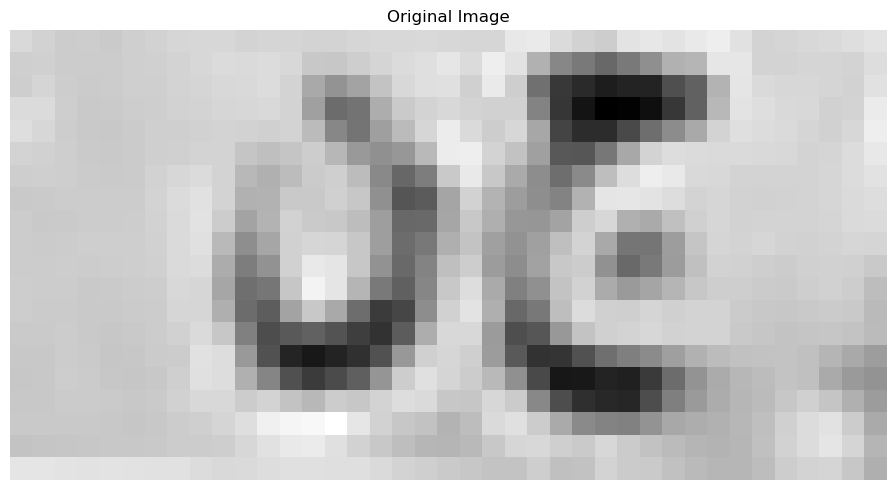

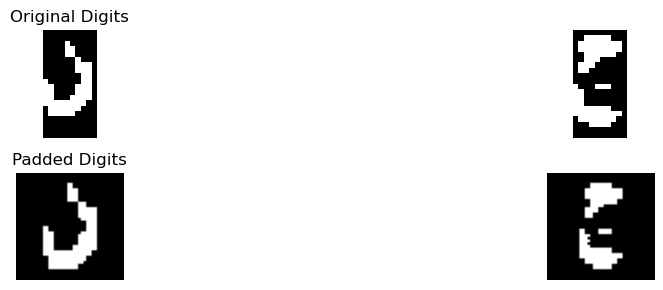

Best match: د
Full comparison results: {'أ': 0.2875, 'ب': 0.23814655172413793, 'ج': 1.6786605705083966, 'د': 4.936237373737374, 'ر': 2.437676608124509, 'س': 1.2544642857142856, 'ص': 0.6711309523809523, 'ط': 2.2838850461133067, 'ع': 1.4249999999999998, 'ف': 3.734623015873016, 'ق': 3.574966931216931, 'ك': 1.0568181818181819, 'ل': 2.88125, 'م': 0.4943181818181819, 'ن': 4.234047619047619, 'ه': 1.9632392473118279, 'و': 3.3689153439153436, 'ي': 2.4285813823857305}
Confidence :  0.35109487734487743
Best match: ج
Full comparison results: {'أ': 0.84375, 'ب': 0.2941810344827586, 'ج': 4.231571226355588, 'د': 3.052656909653814, 'ر': 0.5937163561076605, 'س': 0.29464285714285715, 'ص': 0.09375, 'ط': 1.0898400689684484, 'ع': 1.4897622079392028, 'ف': 1.7464059454191032, 'ق': 1.2078616680590364, 'ك': 0.38636363636363635, 'ل': 0.9218542680229986, 'م': 2.0710227272727275, 'ن': 1.7230952380952382, 'ه': 1.3321236559139784, 'و': 1.4679872845195425, 'ي': 1.4280657748049053}
Confidence :  0.5894571583508872
[[

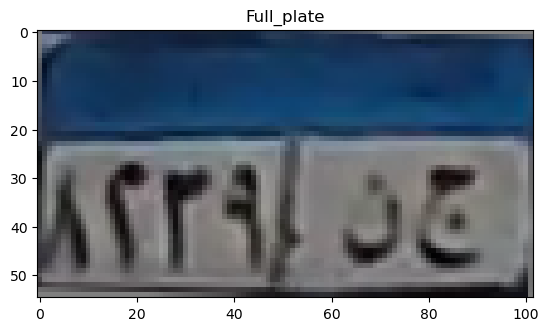

1.0 50.0 0.0 29.0
top
[0.24799353 0.38912291 0.50443684 0.56998855 0.54799306 0.54915258
 0.55287245 0.56019529 0.57000986 0.57496451 0.57402005 0.56865157
 0.56449202 0.55774149 0.55731755 0.5601196  0.5687449  0.57680023
 0.57889662 0.57563042 0.57827061 0.58025137 0.57027895 0.56888663
 0.56035855 0.55994175 0.56837433 0.57894892 0.576654   0.57974501
 0.57119555 0.56962567 0.57192667 0.57743218 0.57651    0.57795831
 0.5766798  0.57748716 0.58726751 0.5941008  0.60051824 0.60145044
 0.59572144 0.58944923 0.57811115 0.5630718  0.54802571 0.53374492
 0.54873037]
[0.26621152 0.47396952 0.57146539 0.59417555 0.5606059  0.54423594
 0.51918498 0.52026689 0.52292609 0.52459181 0.5171561  0.51068839
 0.50388917 0.49709536 0.4921551  0.49526809 0.51812983 0.55142487
 0.56085348 0.55738712 0.548789   0.53879525 0.52826071 0.51996063
 0.51679058 0.51460441 0.51713667 0.52157014 0.51645179 0.51079854
 0.49912326 0.50155898 0.50581858 0.51453692 0.51922779 0.52802021
 0.52935706 0.52484515 0.53

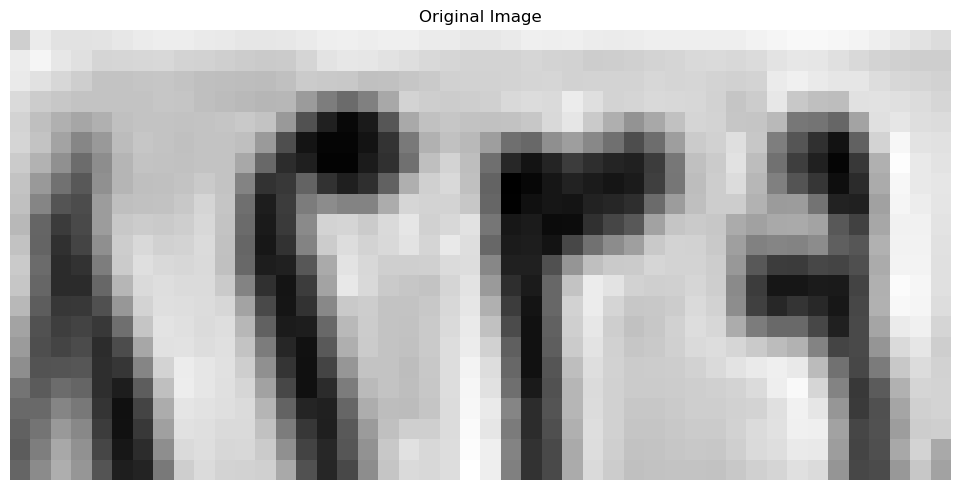

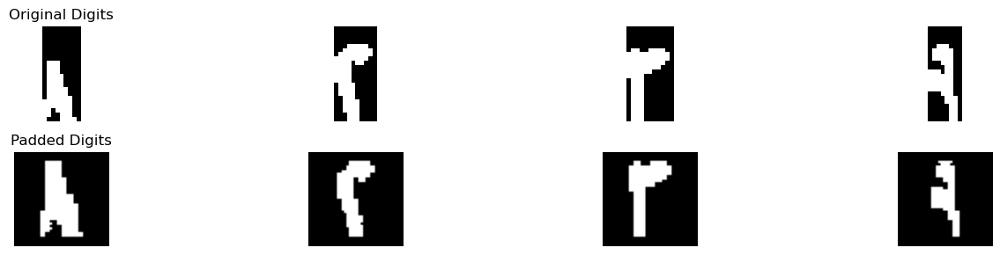

Best match: ٨
Full comparison results: {'١': 1.5451388888888888, '٢': 1.5555555555555556, '٣': 1.544407894736842, '٤': 2.3506944444444446, '٥': 2.5867533416875523, '٦': 1.0388888888888888, '٧': 1.2409722222222221, '٨': 3.0319444444444446, '٩': 2.836805555555556}
Confidence :  0.09756944444444438
Best match: ٣
Full comparison results: {'١': 0.1875, '٢': 4.40625, '٣': 4.522445820433436, '٤': 3.03125, '٥': 2.8729175880878666, '٦': 1.35, '٧': 2.988970588235294, '٨': 0.48750000000000004, '٩': 0.8255718954248367}
Confidence :  0.05809791021671806
Best match: ٣
Full comparison results: {'١': 0.6666666666666667, '٢': 1.5347222222222223, '٣': 3.795321637426901, '٤': 1.2569444444444444, '٥': 2.4243421052631575, '٦': 2.051388888888889, '٧': 2.0659722222222223, '٨': 1.0055555555555555, '٩': 1.125}
Confidence :  0.6854897660818717
Best match: ٩
Full comparison results: {'١': 2.5937500000000004, '٢': 2.758814102564103, '٣': 1.1130998452012384, '٤': 1.6103708791208793, '٥': 1.8873977222467935, '٦': 1

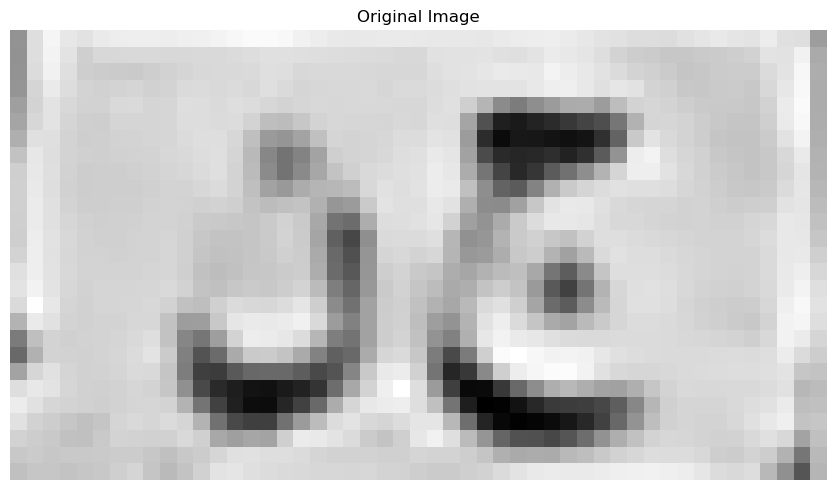

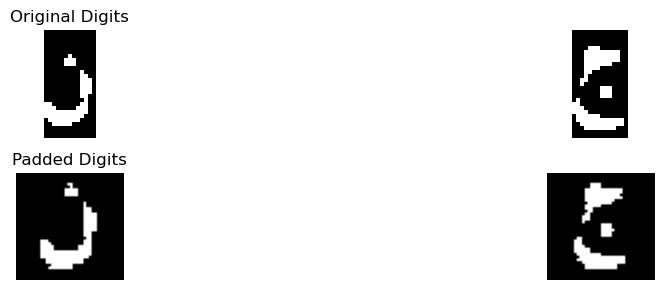

Best match: ن
Full comparison results: {'أ': 0.09375, 'ب': 0.4368368700265252, 'ج': 1.5505521048999311, 'د': 4.627298581048581, 'ر': 3.0585831191547084, 'س': 1.5982142857142856, 'ص': 1.3827380952380952, 'ط': 2.2687885162990353, 'ع': 1.6491071428571429, 'ف': 3.1202050264550265, 'ق': 3.6998933265062295, 'ك': 1.2793560606060606, 'ل': 3.767261904761905, 'م': 0.2805735930735931, 'ن': 4.940510752688172, 'ه': 1.4611559139784946, 'و': 2.8339093701996925, 'ي': 2.429288103201147}
Confidence :  0.1566060858197953
Best match: ج
Full comparison results: {'أ': 0.3157894736842105, 'ب': 0.548988726790451, 'ج': 4.781564039930744, 'د': 3.096498316498317, 'ر': 0.5668163615560641, 'س': 0.4464285714285714, 'ص': 0.5675595238095238, 'ط': 1.4663619894598157, 'ع': 2.3901315789473685, 'ف': 2.255639097744361, 'ق': 1.8880604288499026, 'ك': 1.8219696969696968, 'ل': 1.2351973684210524, 'م': 1.5053827751196172, 'ن': 1.9885839598997492, 'ه': 1.0155241935483872, 'و': 1.037733221943748, 'ي': 1.642763524614211}
Confiden

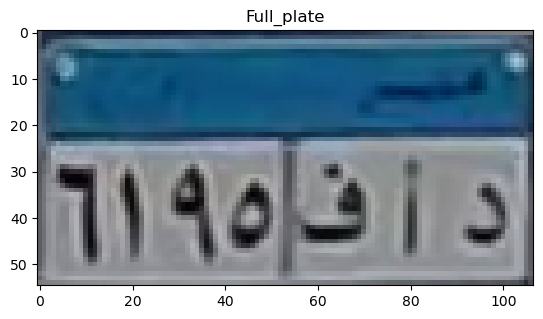

1.0 52.0 2.0 32.0
top
[0.35343059 0.49240118 0.70741255 0.62052529 0.61653196 0.62229176
 0.61215961 0.60321353 0.6136302  0.62882627 0.61997824 0.59693902
 0.59305333 0.58790627 0.61176392 0.62610216 0.62426392 0.62426392
 0.61953176 0.62173765 0.58446    0.57808745 0.5681251  0.57939961
 0.57351725 0.57915451 0.58377549 0.59100588 0.59965608 0.60504824
 0.59345686 0.56502549 0.60044216 0.59811373 0.56870196 0.56600588
 0.57135078 0.57686549 0.5886302  0.6001498  0.61189    0.61752725
 0.62232564 0.61825236 0.6111223  0.59328836 0.59312657 0.5755415
 0.56735004 0.59082819 0.59916594]
[0.35762999 0.47446456 0.65685569 0.63963118 0.67075161 0.63571424
 0.62884194 0.64874141 0.63820219 0.64339578 0.62774532 0.58056395
 0.56476998 0.56624056 0.56611936 0.56636446 0.5754002  0.60971392
 0.61043228 0.59616662 0.59152152 0.55868096 0.54617273 0.55400961
 0.55204882 0.55559648 0.56165576 0.56573662 0.5685121  0.56936994
 0.56979907 0.55950495 0.57275094 0.59382937 0.58518615 0.57293125
 0.565

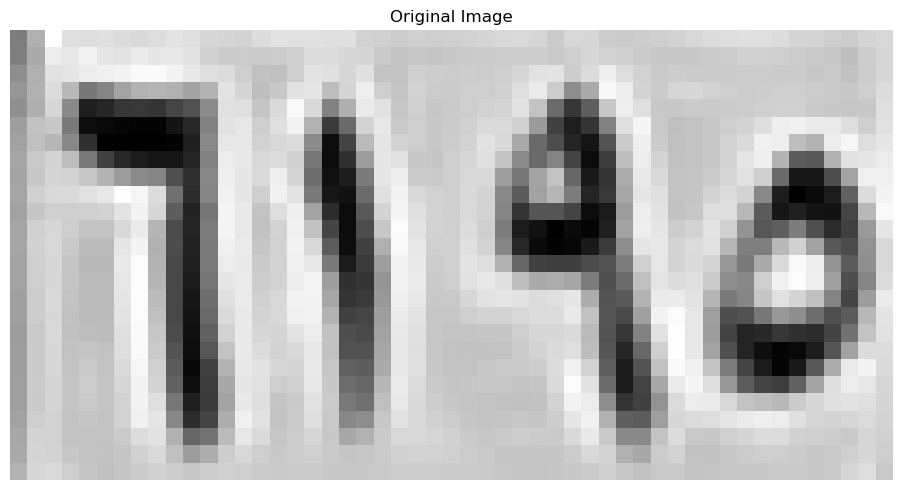

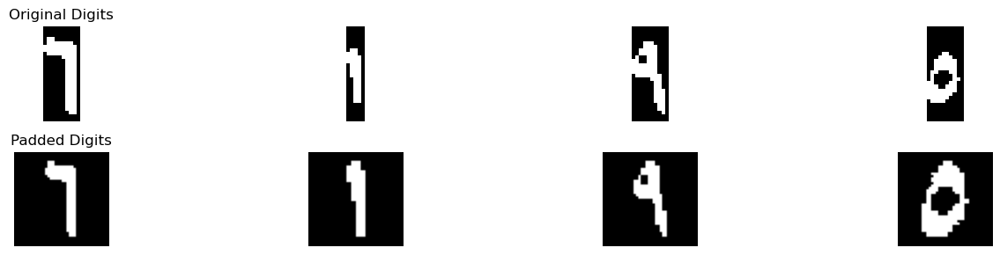

Best match: ٦
Full comparison results: {'١': 1.310096153846154, '٢': 0.7331730769230769, '٣': 1.6395123839009287, '٤': 0.0, '٥': 1.9122991301783872, '٦': 7.180059523809524, '٧': 0.3014705882352941, '٨': 0.5347222222222222, '٩': 2.022404474610357}
Confidence :  2.5788275245995833
Best match: ١
Full comparison results: {'١': 6.39375, '٢': 2.4970134032634035, '٣': 0.8026315789473684, '٤': 1.4345009157509159, '٥': 2.100591552410438, '٦': 2.0639880952380953, '٧': 0.8841911764705883, '٨': 2.1569444444444446, '٩': 2.0152086475615887}
Confidence :  1.9483682983682982
Best match: ٩
Full comparison results: {'١': 2.3125, '٢': 2.6562500000000004, '٣': 0.9568498452012384, '٤': 1.695238095238095, '٥': 1.8888858174848886, '٦': 2.487202380952381, '٧': 0.7981617647058823, '٨': 2.94375, '٩': 5.141077264239029}
Confidence :  1.0986636321195145
Best match: ٥
Full comparison results: {'١': 0.85, '٢': 1.34375, '٣': 1.16875, '٤': 2.5374999999999996, '٥': 7.883035714285715, '٦': 1.5374999999999999, '٧': 0.62

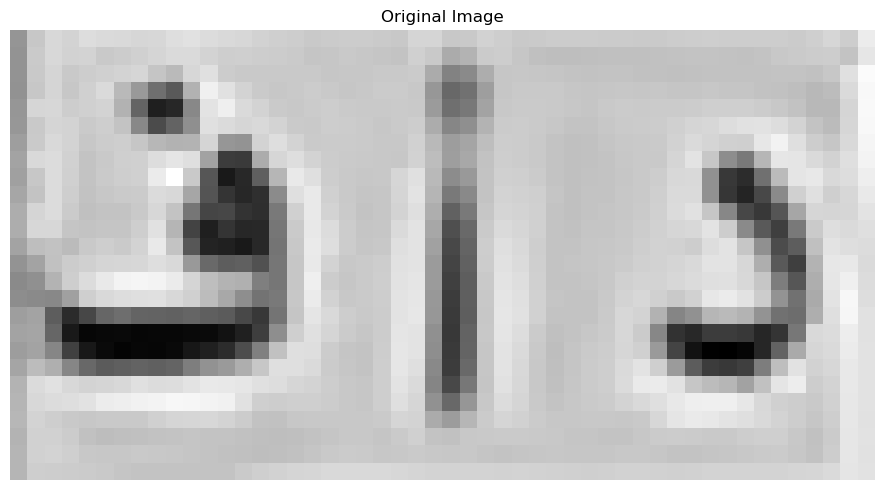

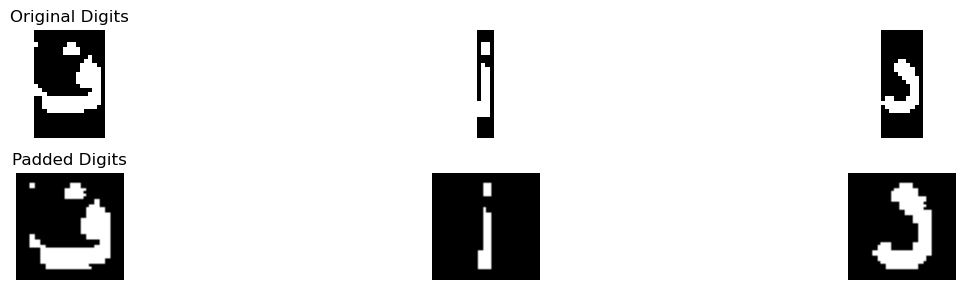

Best match: ف
Full comparison results: {'أ': 0.13125, 'ب': 0.29166666666666663, 'ج': 1.9979166666666668, 'د': 3.997916666666667, 'ر': 2.5708333333333333, 'س': 1.6104166666666666, 'ص': 1.3520833333333333, 'ط': 2.2541666666666664, 'ع': 0.8770833333333332, 'ف': 4.28125, 'ق': 2.410416666666667, 'ك': 1.8583333333333334, 'ل': 1.4604166666666667, 'م': 0.5333333333333333, 'ن': 2.50625, 'ه': 3.875, 'و': 2.747916666666667, 'ي': 2.0770833333333334}
Confidence :  0.1416666666666666
Best match: أ
Full comparison results: {'أ': 4.038107792744889, 'ب': 0.5441810344827587, 'ج': 0.6064599148838279, 'د': 0.6416433817014313, 'ر': 0.581160134218605, 'س': 0.2589285714285714, 'ص': 0.6619047619047619, 'ط': 0.8740331538776067, 'ع': 0.18388157894736842, 'ف': 0.37113617376775265, 'ق': 0.5383180172653856, 'ك': 0.10416666666666666, 'ل': 0.5655572755417957, 'م': 0.09375, 'ن': 0.7826785714285716, 'ه': 0.09684139784946236, 'و': 0.7249669312169312, 'ي': 0.8016941391941391}
Confidence :  1.5820373194336415
Best match:

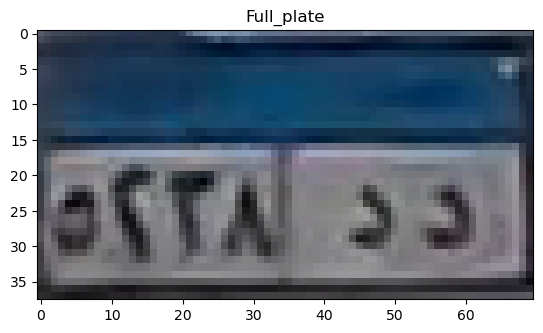

top
[0.27459216 0.30596471 0.40843843 0.50255608 0.52412824 0.53197137
 0.56169216 0.58914314 0.61355843 0.61748    0.60770235 0.61946706
 0.64161255 0.64161255 0.64581686 0.64973843 0.65532667 0.6631698
 0.67829059 0.67044745 0.6561302  0.65220863 0.65473137 0.64688824
 0.6390749  0.61946706 0.61137882 0.61137882 0.61112588 0.61896902
 0.62175176 0.6178302  0.5794251  0.43824863 0.33541686]
[0.29137961 0.40118353 0.52376314 0.57474353 0.58006392 0.58398549
 0.59605569 0.60389882 0.60421922 0.57676824 0.50842706 0.55156431
 0.55972784 0.51659059 0.52443373 0.52835529 0.53506745 0.53506745
 0.54090078 0.54482235 0.55431725 0.5856898  0.59942667 0.58766196
 0.57283882 0.56499569 0.55774078 0.54597608 0.53340784 0.53340784
 0.56169216 0.52639804 0.52438824 0.43419216 0.30867922]
[0.28353647 0.4051051  0.51199843 0.49631216 0.47418157 0.47418157
 0.4823302  0.4940949  0.50618    0.49833686 0.56332902 0.52019176
 0.41070824 0.30874745 0.31266902 0.40678667 0.4919302  0.48408706
 0.48207725 

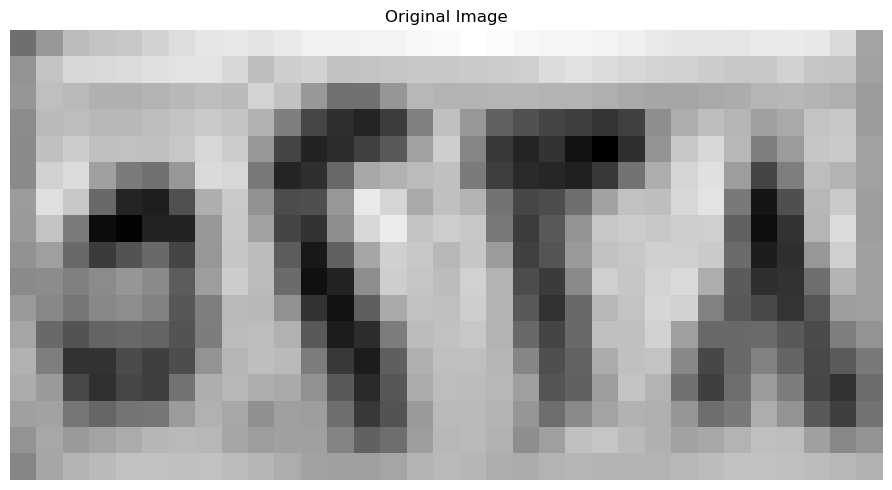

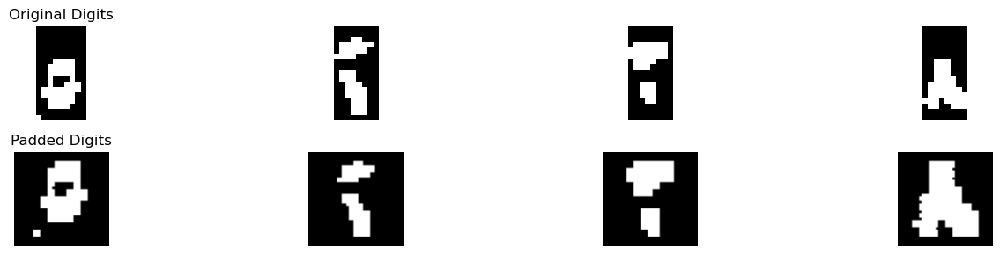

Best match: ٥
Full comparison results: {'١': 0.6956521739130435, '٢': 2.1467391304347827, '٣': 1.8125, '٤': 0.7391304347826088, '٥': 3.7894021739130435, '٦': 1.7690217391304346, '٧': 0.8016304347826088, '٨': 0.8573369565217392, '٩': 0.8084239130434782}
Confidence :  0.8213315217391304
Best match: ٢
Full comparison results: {'١': 0.6875, '٢': 3.875, '٣': 3.308920278637771, '٤': 1.375, '٥': 2.914671789768539, '٦': 2.03125, '٧': 1.6893382352941178, '٨': 0.7854166666666667, '٩': 1.5161356209150327}
Confidence :  0.2830398606811144
Best match: ٣
Full comparison results: {'١': 0.9499999999999998, '٢': 2.05, '٣': 3.5687500000000005, '٤': 2.39375, '٥': 2.5508928571428573, '٦': 1.6875, '٧': 2.3125, '٨': 0.9, '٩': 1.8852822580645159}
Confidence :  0.5089285714285716
Best match: ٥
Full comparison results: {'١': 0.9285714285714286, '٢': 1.7008928571428572, '٣': 1.4375, '٤': 0.9642857142857143, '٥': 3.571428571428571, '٦': 1.4732142857142856, '٧': 0.45535714285714285, '٨': 1.8125, '٩': 1.7008928571

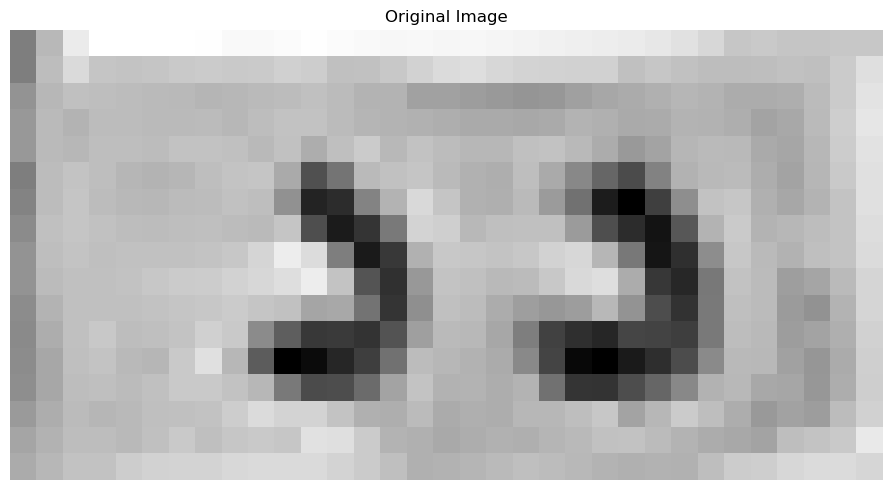

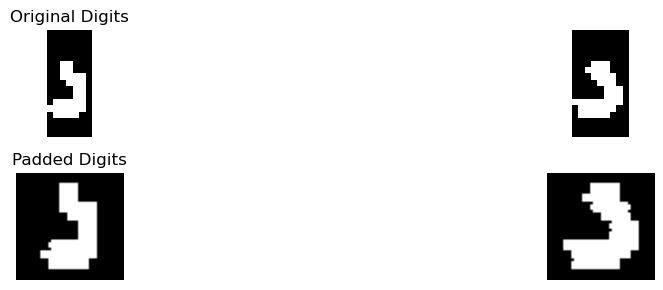

Best match: د
Full comparison results: {'أ': 0.7752976190476191, 'ب': 0.0, 'ج': 1.9634230503795722, 'د': 4.9276196488696495, 'ر': 1.4216363246947952, 'س': 1.625, 'ص': 1.0589285714285714, 'ط': 2.5539361001317524, 'ع': 1.068452380952381, 'ف': 4.553902116402115, 'ق': 2.630621693121693, 'ك': 1.696969696969697, 'ل': 1.7380952380952381, 'م': 1.6707251082251084, 'ن': 3.0125595238095237, 'ه': 4.624327956989247, 'و': 2.9432870370370368, 'ي': 1.843453376333811}
Confidence :  0.15164584594020125
Best match: ه
Full comparison results: {'أ': 0.4955357142857143, 'ب': 0.0, 'ج': 3.1696428571428568, 'د': 3.973214285714286, 'ر': 1.2463054187192117, 'س': 2.196428571428571, 'ص': 1.0395833333333333, 'ط': 1.7767857142857142, 'ع': 0.7946428571428572, 'ف': 3.9017857142857144, 'ق': 1.96875, 'ك': 1.5535714285714288, 'ل': 0.9821428571428572, 'م': 1.4955357142857144, 'ن': 1.9330357142857142, 'ه': 5.25, 'و': 2.330357142857143, 'ي': 1.5568452380952382}
Confidence :  0.638392857142857
[['٥', '٢', '٣', '٥'], ['د', 'ه

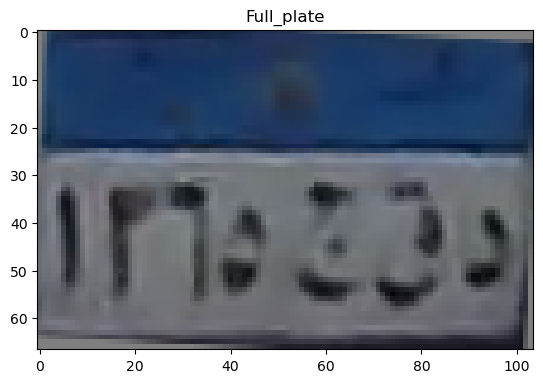

top
[0.43348435 0.43674836 0.46797291 0.48313924 0.49016277 0.49124656
 0.48589161 0.48749569 0.48187028 0.47396235 0.47101815 0.46363474
 0.4565135  0.44974554 0.44662874 0.46127373 0.47581876 0.48269683
 0.48558822 0.48596735 0.48335553 0.47722042 0.47996766 0.47799654
 0.4903867  0.50092994 0.49911713 0.49481911 0.4837946  0.47185449
 0.44851656 0.43641484 0.43168904 0.42946784 0.43617666 0.44974855
 0.46239985 0.46491037 0.4588161  0.45982522 0.46318582 0.46211789
 0.46480756 0.46493267 0.46882704 0.4732873  0.47950311 0.48398969
 0.49783418 0.51265906 0.52952309 0.52140066]
[0.43704049 0.44413083 0.46369348 0.46499239 0.4648565  0.45695742
 0.4420792  0.45440304 0.47403571 0.46769613 0.46540099 0.45381067
 0.44879765 0.4550668  0.47569987 0.49360638 0.49266922 0.48611531
 0.47372914 0.47545344 0.47592388 0.47723243 0.47149912 0.46812606
 0.46598053 0.4637985  0.46105901 0.461021   0.45999434 0.46279179
 0.45844263 0.45484388 0.45625717 0.45299725 0.4572712  0.45881132
 0.4608655  

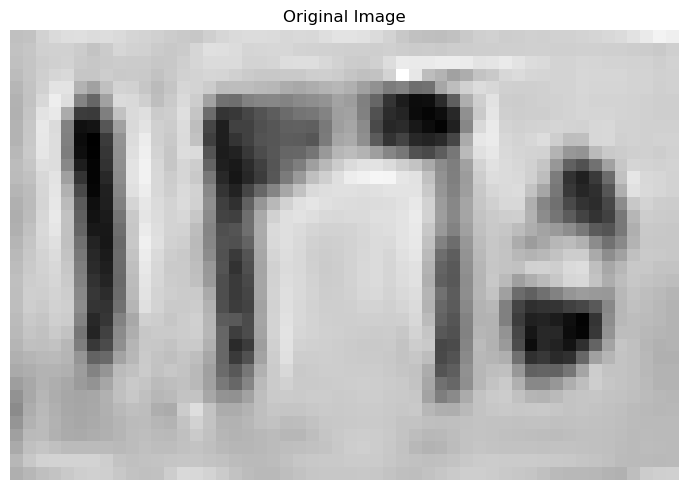

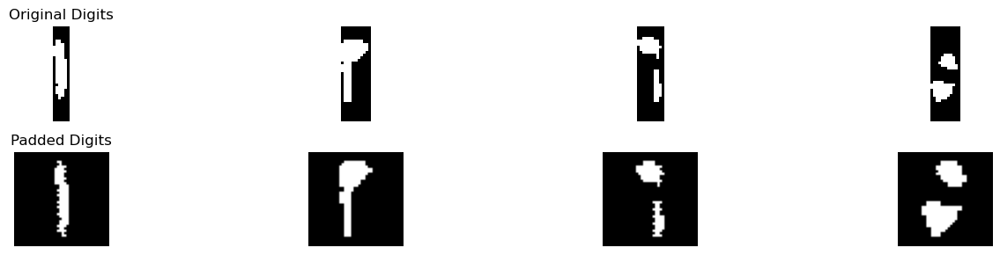

Best match: ١
Full comparison results: {'١': 5.579166666666666, '٢': 2.2626748251748254, '٣': 1.1365131578947367, '٤': 1.461584249084249, '٥': 0.9256919873212442, '٦': 0.5404761904761904, '٧': 1.2816176470588236, '٨': 2.0458333333333334, '٩': 1.0950697586726998}
Confidence :  1.6582459207459201
Best match: ٣
Full comparison results: {'١': 0.888392857142857, '٢': 3.044642857142857, '٣': 4.117066563467493, '٤': 1.637202380952381, '٥': 2.7676544301931294, '٦': 2.192559523809524, '٧': 1.0091911764705883, '٨': 1.0277777777777777, '٩': 1.6804971988795518}
Confidence :  0.5362118531623177
Best match: ٦
Full comparison results: {'١': 2.729166666666667, '٢': 1.721955128205128, '٣': 0.8504256965944272, '٤': 0.23660714285714285, '٥': 2.685260946483856, '٦': 4.302678571428571, '٧': 0.11764705882352941, '٨': 1.1388888888888888, '٩': 2.806718200100553}
Confidence :  0.7479801856640091
Best match: ٥
Full comparison results: {'١': 0.2631578947368421, '٢': 1.9917763157894735, '٣': 1.34375, '٤': 1.16447

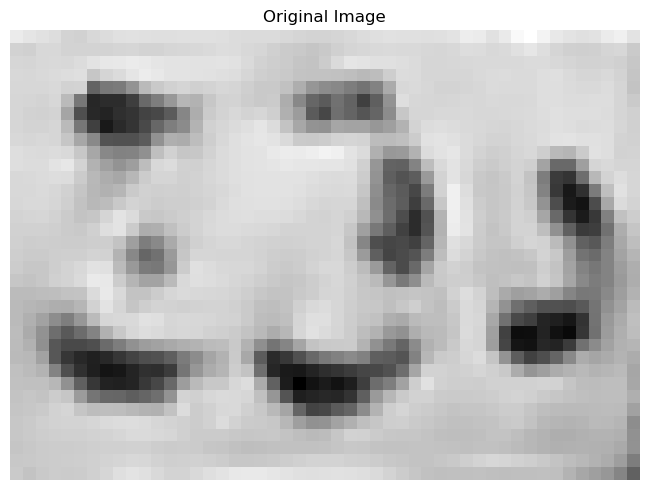

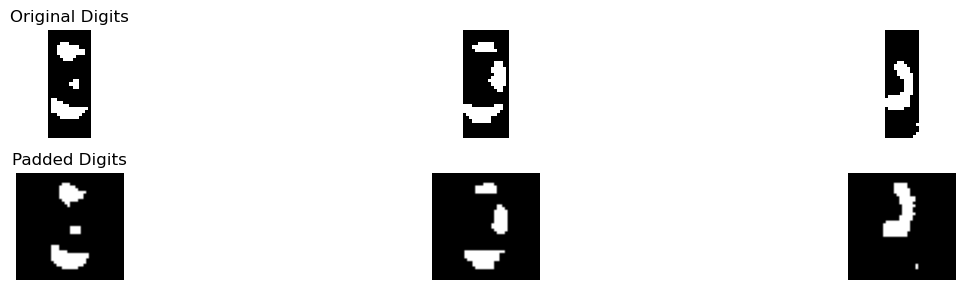

Best match: د
Full comparison results: {'أ': 0.7286866359447004, 'ب': 0.5660035366931919, 'ج': 3.0093785944329423, 'د': 3.810342563926155, 'ر': 1.0595119404583422, 'س': 0.6116071428571428, 'ص': 0.6050595238095238, 'ط': 2.4683476064997802, 'ع': 2.029530984719864, 'ف': 2.656812843039498, 'ق': 2.0676082567529934, 'ك': 1.018939393939394, 'ل': 1.4951026463216865, 'م': 1.479301948051948, 'ن': 3.460952380952381, 'ه': 0.7280241935483871, 'و': 1.4353835978835976, 'ي': 1.8386246146326792}
Confidence :  0.174695091486887
Best match: ق
Full comparison results: {'أ': 0.21975806451612903, 'ب': 0.8389980071014553, 'ج': 2.4567877271681615, 'د': 3.6846237269495785, 'ر': 1.9742685799957165, 'س': 1.03125, 'ص': 1.2107142857142856, 'ط': 1.2134881422924901, 'ع': 1.9689116286508699, 'ف': 3.191983936094717, 'ق': 4.301082201373779, 'ك': 0.34090909090909094, 'ل': 3.19504766086696, 'م': 0.6534090909090909, 'ن': 3.655044162826421, 'ه': 0.7352150537634409, 'و': 2.355580642218573, 'ي': 2.270898364920104}
Confidence

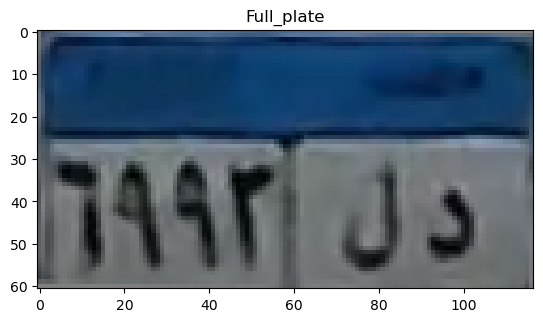

top
[0.35302776 0.32807343 0.30029115 0.36465105 0.40885724 0.40780792
 0.40871983 0.40835629 0.40713204 0.41225295 0.408395   0.40755566
 0.40442419 0.40442339 0.40030135 0.40973581 0.41422823 0.4129357
 0.41600194 0.41839094 0.42544922 0.42519263 0.43347298 0.4441076
 0.4701843  0.47961931 0.47052576 0.46597566 0.45741255 0.44390152
 0.44521892 0.43605838 0.44436804 0.47005295 0.49259214 0.49646885
 0.48848903 0.48505659 0.47126878 0.45133069 0.42469048 0.42008923
 0.4193593  0.42147633 0.41848871 0.4016935  0.3799774  0.38719584
 0.38229005 0.38149348 0.37629281 0.36963686 0.3666287  0.35665674
 0.35438792 0.37683244 0.24580066 0.11094602]
[0.36989651 0.35325725 0.32558881 0.44094502 0.52553148 0.54332029
 0.53177605 0.51992392 0.50745922 0.50184423 0.50071365 0.51134396
 0.52617705 0.54142603 0.56005048 0.56249922 0.55912612 0.55335794
 0.55530806 0.55251017 0.55068395 0.54335409 0.53448408 0.52979619
 0.53571897 0.54360363 0.54359188 0.54032659 0.53655961 0.53942559
 0.53691333 0.

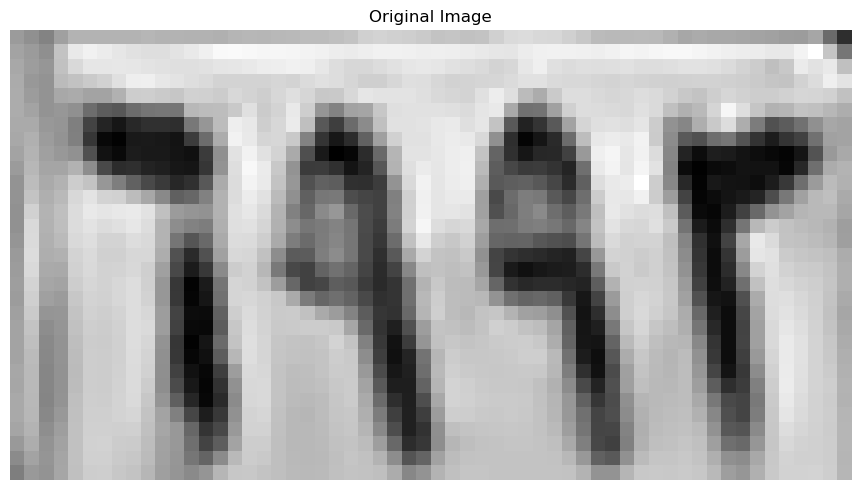

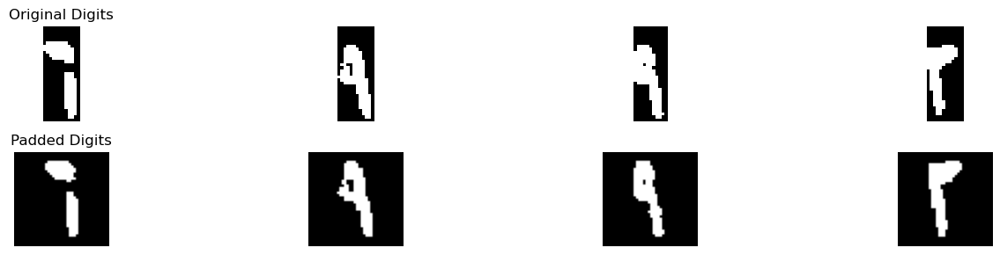

Best match: ٦
Full comparison results: {'١': 1.4910714285714284, '٢': 1.0133928571428572, '٣': 0.9030572755417956, '٤': 0.0, '٥': 2.220731055580127, '٦': 5.936904761904762, '٧': 0.11764705882352941, '٨': 1.4048611111111111, '٩': 2.3565009337068163}
Confidence :  1.7902019140989727
Best match: ٩
Full comparison results: {'١': 2.7, '٢': 2.3041666666666667, '٣': 1.4494969040247678, '٤': 1.3708333333333333, '٥': 1.330605926581159, '٦': 2.8666666666666667, '٧': 0.9029411764705882, '٨': 2.9208333333333334, '٩': 5.070833333333333}
Confidence :  1.0749999999999997
Best match: ٩
Full comparison results: {'١': 3.6466346153846154, '٢': 3.4711538461538463, '٣': 2.404702012383901, '٤': 2.9594551282051285, '٥': 1.3891944935869085, '٦': 1.0232142857142859, '٧': 1.363235294117647, '٨': 2.451388888888889, '٩': 4.66885055304173}
Confidence :  0.5111079688285571
Best match: ٣
Full comparison results: {'١': 0.03125, '٢': 5.178571428571429, '٣': 5.255224458204335, '٤': 2.7211309523809524, '٥': 2.3094731313

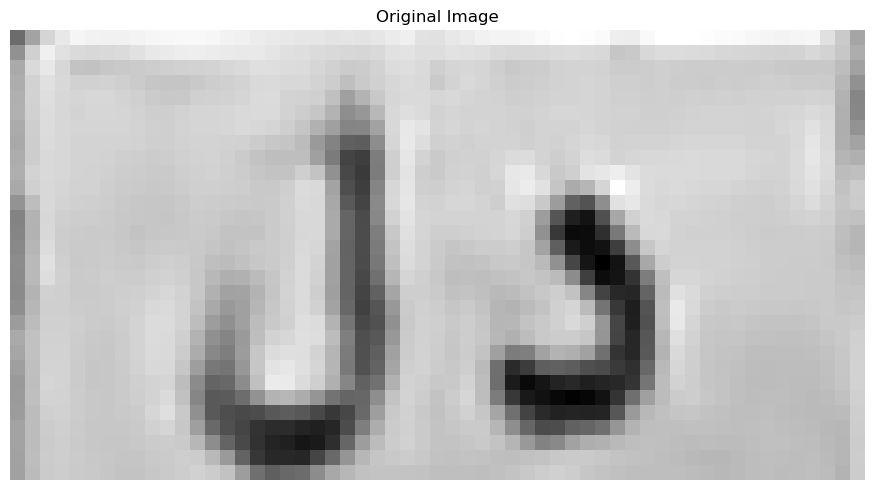

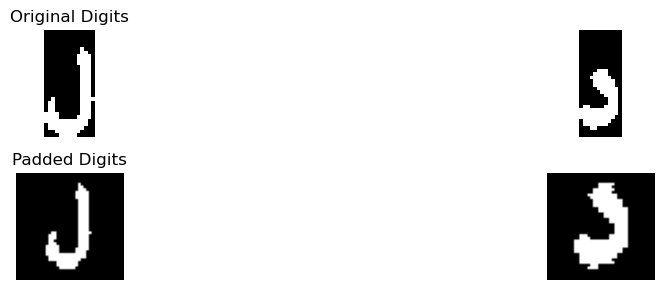

Best match: ل
Full comparison results: {'أ': 0.058823529411764705, 'ب': 0.2629310344827586, 'ج': 0.6148290233967983, 'د': 2.606672308742742, 'ر': 2.439415077125303, 'س': 1.0491071428571428, 'ص': 0.856547619047619, 'ط': 1.1724720026350464, 'ع': 1.2157314241486068, 'ف': 2.1529779309384574, 'ق': 2.6711466165413533, 'ك': 0.43465909090909094, 'ل': 3.8299922600619194, 'م': 0.16310160427807485, 'ن': 3.069663865546218, 'ه': 1.2383064516129032, 'و': 2.150803376906318, 'ي': 2.371339650687477}
Confidence :  0.38016419725785067
Best match: د
Full comparison results: {'أ': 0.7, 'ب': 0.0, 'ج': 1.9030063837129054, 'د': 5.0837373737373746, 'ر': 1.2312943528235882, 'س': 1.78125, 'ص': 0.8898809523809523, 'ط': 1.4964179841897232, 'ع': 0.6937500000000001, 'ف': 3.3279431216931217, 'ق': 1.8694444444444445, 'ك': 0.3162878787878788, 'ل': 1.3875, 'م': 2.033522727272727, 'ن': 2.683809523809524, 'ه': 4.274395161290323, 'و': 2.9788359788359786, 'ي': 1.5822185061315497}
Confidence :  0.404671106223526
[['٦', '٩', 

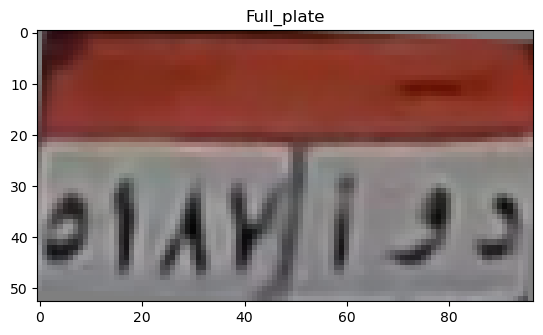

top
[0.45365083 0.59533896 0.62379774 0.60938896 0.60570236 0.60169651
 0.59852332 0.59480702 0.56879985 0.55671349 0.55586016 0.56293046
 0.58788937 0.59692203 0.60309078 0.5927942  0.58964752 0.59203792
 0.5913897  0.59464781 0.59782183 0.59588802 0.59171835 0.59353414
 0.60410553 0.6069592  0.61074771 0.61496614 0.64355656 0.65962706
 0.65494323 0.65804291 0.63097105 0.62450076 0.62162638 0.61251568
 0.60035278 0.592688   0.58385    0.59008258 0.58926467 0.57991509
 0.58003803 0.58790025 0.60599791 0.60953514 0.60932242 0.59515548]
[0.48745982 0.62926046 0.599417   0.55158701 0.544116   0.53927534
 0.54354142 0.54897355 0.55501774 0.55797554 0.55800806 0.55903299
 0.57287409 0.5787598  0.58119927 0.57896902 0.5793738  0.58354028
 0.58466392 0.58055783 0.57409335 0.57218001 0.56723036 0.56647127
 0.57155006 0.5720693  0.57033114 0.57076688 0.56510772 0.56707804
 0.57167793 0.58196935 0.58891644 0.5907136  0.59067621 0.58609633
 0.58217515 0.58079881 0.58379551 0.58589476 0.59112825 0

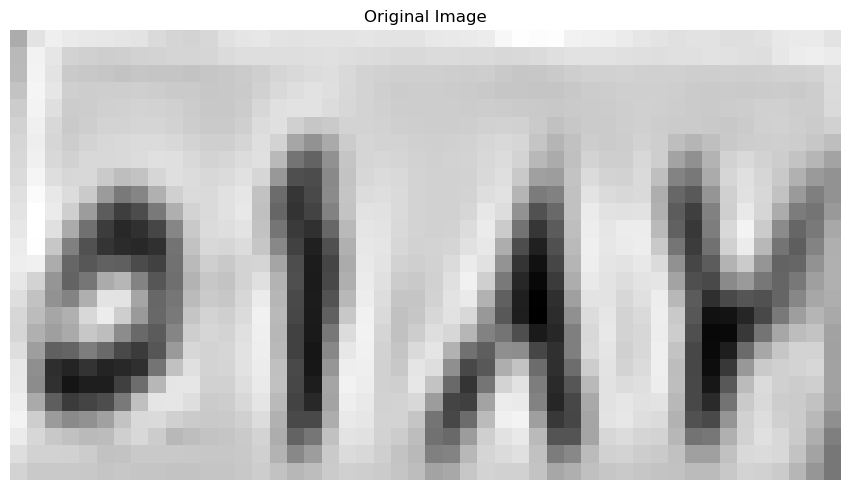

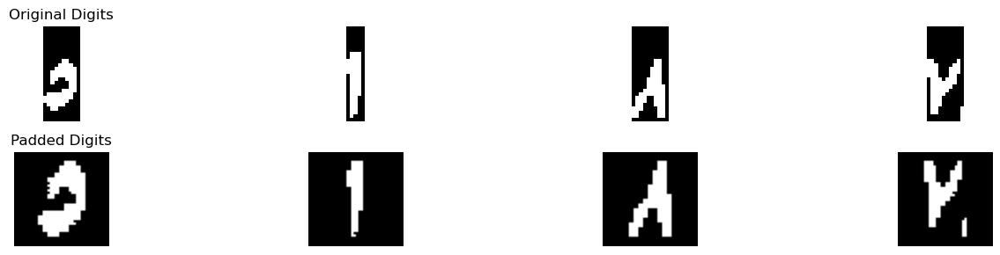

Best match: ٥
Full comparison results: {'١': 0.55, '٢': 1.01875, '٣': 1.0625, '٤': 2.00625, '٥': 5.969940476190476, '٦': 1.4437499999999999, '٧': 0.8999999999999999, '٨': 1.3624999999999998, '٩': 0.6375}
Confidence :  1.9818452380952378
Best match: ١
Full comparison results: {'١': 4.6535714285714285, '٢': 2.203015734265734, '٣': 1.6365131578947367, '٤': 1.4032509157509159, '٥': 1.2558970956803774, '٦': 0.5961309523809524, '٧': 0.7926470588235294, '٨': 1.9395833333333332, '٩': 1.1368149824032177}
Confidence :  1.2252778471528472
Best match: ٨
Full comparison results: {'١': 0.9444444444444444, '٢': 0.2222222222222222, '٣': 0.0, '٤': 0.19791666666666666, '٥': 1.8762792397660817, '٦': 1.5270833333333331, '٧': 0.9590277777777778, '٨': 2.7416666666666663, '٩': 1.2291666666666665}
Confidence :  0.4326937134502923
Best match: ٧
Full comparison results: {'١': 0.2777777777777778, '٢': 0.8958333333333333, '٣': 1.8227339181286548, '٤': 0.8298611111111112, '٥': 0.7930764411027568, '٦': 0.4833333333

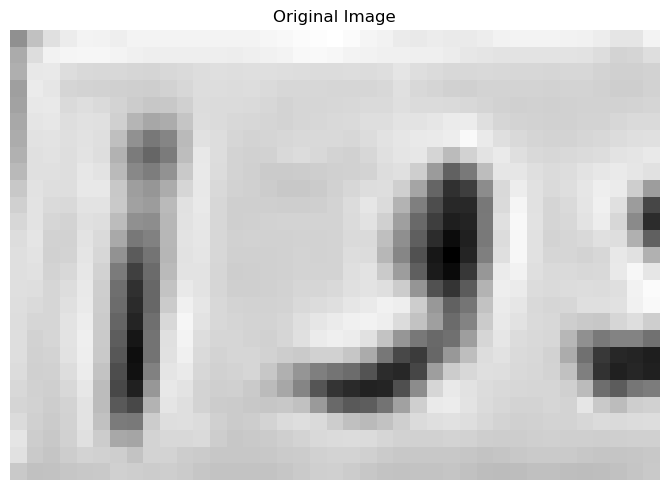

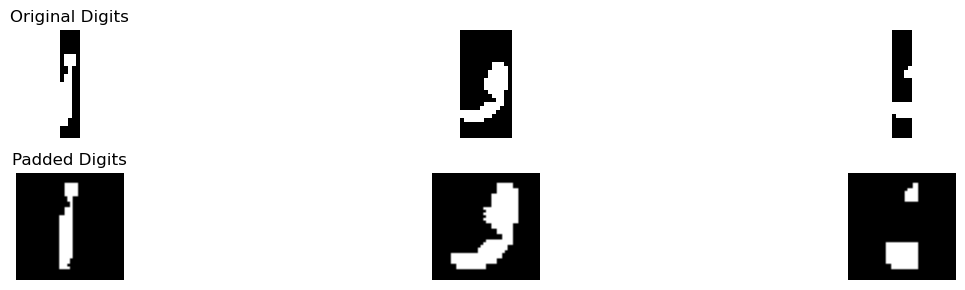

Best match: أ
Full comparison results: {'أ': 1.9639423076923075, 'ب': 0.15625, 'ج': 0.20930383022774326, 'د': 0.37272058823529414, 'ر': 0.0625, 'س': 0.0, 'ص': 0.2720238095238095, 'ط': 1.04590744400527, 'ع': 0.25, 'ف': 0.21875, 'ق': 0.10555555555555556, 'ك': 0.23674242424242423, 'ل': 0.0, 'م': 0.6938061938061939, 'ن': 0.3125, 'ه': 0.6404569892473118, 'و': 0.580654761904762, 'ي': 0.26785714285714285}
Confidence :  0.45901743184351873
Best match: و
Full comparison results: {'أ': 0.32, 'ب': 0.49610411140583555, 'ج': 0.46375, 'د': 3.9810185185185185, 'ر': 4.007758620689655, 'س': 3.6294642857142856, 'ص': 2.700833333333333, 'ط': 2.715, 'ع': 0.6675, 'ف': 3.4305489417989414, 'ق': 2.6618055555555555, 'ك': 2.2199999999999998, 'ل': 2.4112500000000003, 'م': 0.08, 'ن': 1.94375, 'ه': 2.9375, 'و': 4.6527314814814815, 'ي': 3.6041025641025644}
Confidence :  0.3224864303959132
Best match: د
Full comparison results: {'أ': 0.23717948717948717, 'ب': 0.5234218576195773, 'ج': 1.885062753269275, 'د': 2.9857169

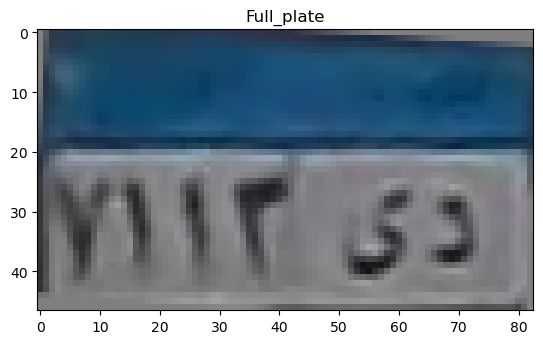

top
[0.22589278 0.25360765 0.30856498 0.35842711 0.42991914 0.50540858
 0.49304196 0.46062314 0.45065662 0.46075696 0.45977515 0.4729614
 0.4709389  0.46039471 0.45262204 0.43828037 0.45896588 0.49316985
 0.49569515 0.49543045 0.49044672 0.49423431 0.50995714 0.51363467
 0.5120977  0.53722703 0.56924975 0.57338664 0.59823739 0.53517381
 0.52221146 0.520004   0.50495897 0.50186767 0.50153373 0.49516093
 0.4749067  0.46645398 0.45802534 0.4481027  0.43716903]
[0.20339758 0.29638312 0.40863927 0.49098891 0.54421817 0.60424409
 0.62950794 0.61827144 0.61278787 0.61557344 0.62877147 0.64135346
 0.6435142  0.63398271 0.60943461 0.59590826 0.59846647 0.59889804
 0.59618005 0.61070211 0.61502196 0.61914197 0.62847042 0.64331292
 0.64660656 0.63279681 0.62410349 0.60374635 0.59237886 0.57847025
 0.57575221 0.57484828 0.58240554 0.59362841 0.60998608 0.62466121
 0.6374     0.64263525 0.64423799 0.64425062 0.64122015]
[0.19728952 0.32096387 0.42628822 0.50571559 0.53158181 0.54544039
 0.55078884 

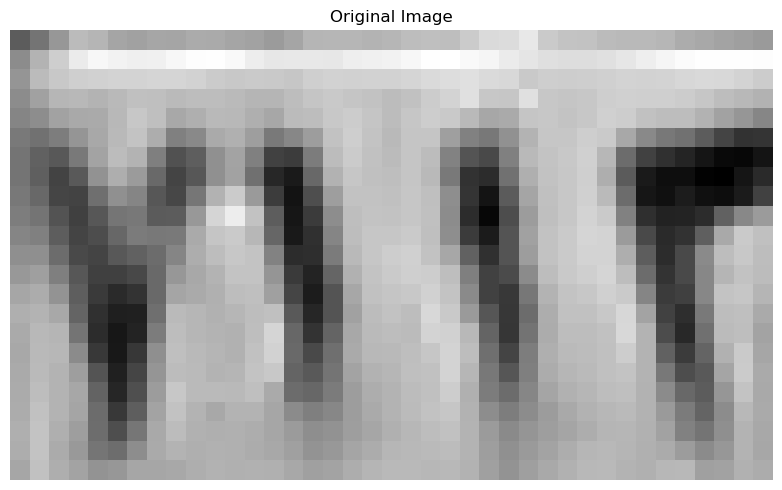

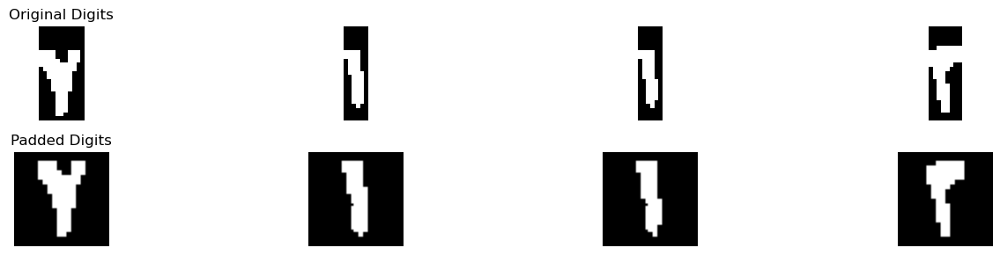

Best match: ٧
Full comparison results: {'١': 1.2937500000000002, '٢': 1.94375, '٣': 3.0062499999999996, '٤': 1.4625, '٥': 2.4363095238095243, '٦': 1.7687499999999998, '٧': 3.31875, '٨': 1.7625000000000002, '٩': 2.1750000000000003}
Confidence :  0.15625000000000022
Best match: ١
Full comparison results: {'١': 4.068181818181818, '٢': 3.5778700466200464, '٣': 1.24796826625387, '٤': 1.3940247252747253, '٥': 2.3040736031254605, '٦': 2.0199404761904765, '٧': 1.2466911764705884, '٨': 2.5, '٩': 2.613216440422323}
Confidence :  0.24515588578088598
Best match: ١
Full comparison results: {'١': 4.318181818181818, '٢': 3.5153700466200464, '٣': 1.24796826625387, '٤': 2.0073946886446885, '٥': 1.7854240380362671, '٦': 1.2580357142857141, '٧': 1.3441176470588236, '٨': 2.6680555555555556, '٩': 2.803575917546506}
Confidence :  0.401405885780886
Best match: ٣
Full comparison results: {'١': 0.5625, '٢': 5.25, '٣': 5.91515092879257, '٤': 2.84375, '٥': 2.4722237579242226, '٦': 1.625, '٧': 3.674264705882353, 

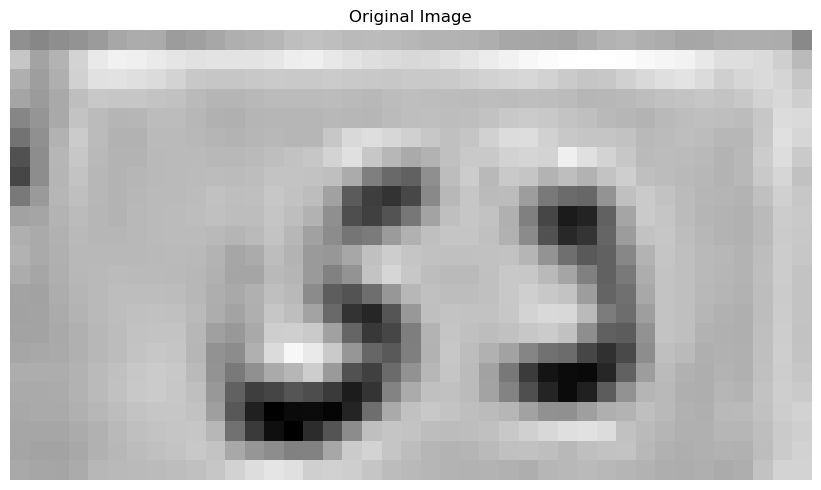

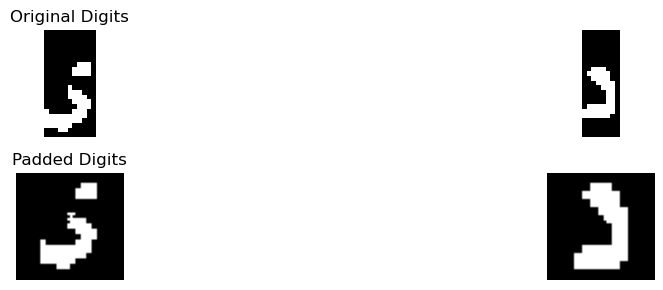

Best match: ي
Full comparison results: {'أ': 0.5598955850415805, 'ب': 0.4536637931034483, 'ج': 1.5790144482290343, 'د': 3.6456084656084657, 'ر': 2.773093274791176, 'س': 2.361607142857143, 'ص': 2.063690476190476, 'ط': 1.4013230127360563, 'ع': 0.9191628264208909, 'ف': 3.519270566649599, 'ق': 2.476071001877453, 'ك': 1.4640151515151514, 'ل': 2.520385304659498, 'م': 0.26501623376623373, 'ن': 2.4309850230414742, 'ه': 1.7080645161290322, 'و': 2.7950535500938725, 'ي': 4.084896274833161}
Confidence :  0.21964390461234773
Best match: د
Full comparison results: {'أ': 0.68125, 'ب': 0.0, 'ج': 3.4674286864504253, 'د': 5.075635521885522, 'ر': 1.5486264903262652, 'س': 1.6294642857142856, 'ص': 0.8919642857142858, 'ط': 2.4683794466403164, 'ع': 1.2, 'ف': 4.218320105820106, 'ق': 2.668121693121693, 'ك': 1.352272727272727, 'ل': 1.5437500000000002, 'م': 1.6102272727272726, 'ن': 2.8149404761904764, 'ه': 4.085819892473118, 'و': 3.4652777777777777, 'ي': 1.6964464882943144}
Confidence :  0.42865770803270786
[['٧

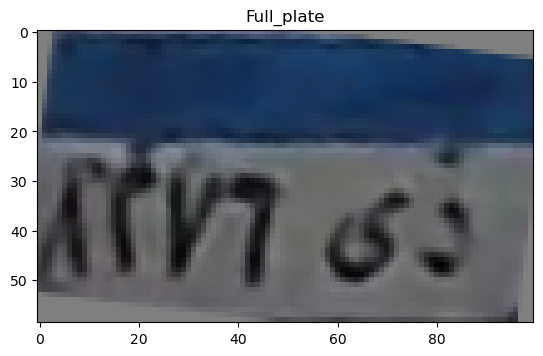

top
[0.42631745 0.42168598 0.42979026 0.41734778 0.43013221 0.43255385
 0.4168466  0.40666012 0.41081764 0.40245826 0.38113929 0.38961019
 0.42364335 0.46748571 0.4980634  0.53067055 0.54606558 0.49193557
 0.38465682 0.30420173 0.21532032 0.22236808 0.31919576 0.43819021
 0.51305069 0.50471626 0.48993299 0.51056898 0.51251798 0.45313498
 0.37450001 0.35007491 0.37568303 0.41703301 0.44545375 0.45892888
 0.47452892 0.48282564 0.48296402 0.48314052 0.48297879 0.47966274
 0.46838157 0.45305724 0.4472885  0.44578952 0.44337155 0.44387086
 0.44430507 0.44391509]
[0.41162328 0.41041059 0.4127574  0.40474598 0.41711282 0.38893216
 0.33685973 0.31019514 0.30929303 0.28738227 0.23216073 0.23763152
 0.27269206 0.36857914 0.44299292 0.48773792 0.49459466 0.47068501
 0.3530935  0.28355958 0.22683616 0.21326281 0.30637626 0.43586358
 0.481166   0.48634653 0.46881774 0.47038577 0.45559139 0.39151663
 0.33543632 0.32604687 0.35064249 0.38673781 0.42624296 0.43176942
 0.45941293 0.48040492 0.47579882 

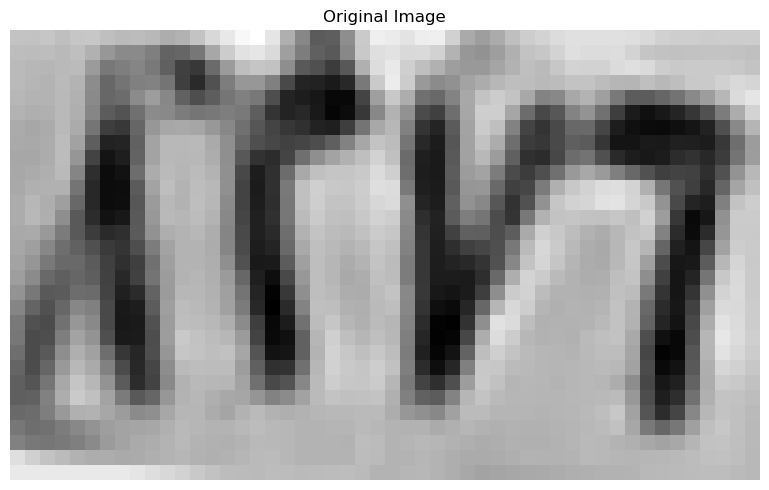

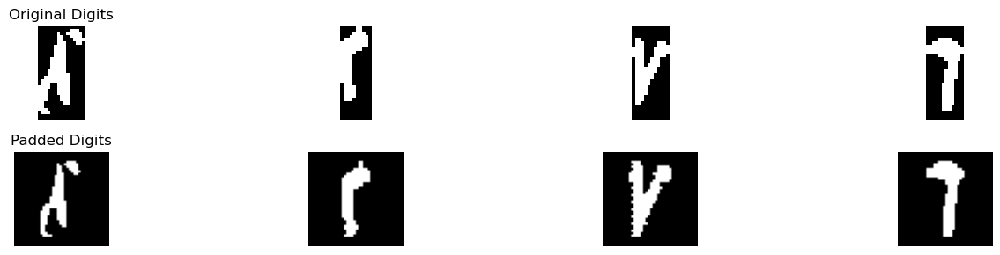

Best match: ٨
Full comparison results: {'١': 1.6599264705882355, '٢': 2.292279411764706, '٣': 2.065112229102167, '٤': 1.1158088235294117, '٥': 1.069733156420463, '٦': 0.2665441176470588, '٧': 1.3136029411764707, '٨': 2.7939133986928106, '٩': 0.8417075163398693}
Confidence :  0.2508169934640523
Best match: ٣
Full comparison results: {'١': 0.7916666666666666, '٢': 2.7756410256410255, '٣': 3.1317724458204332, '٤': 2.575091575091575, '٥': 2.816766180156273, '٦': 0.7976190476190477, '٧': 1.4580882352941176, '٨': 1.2840277777777778, '٩': 1.145676219205631}
Confidence :  0.15750313283208017
Best match: ٧
Full comparison results: {'١': 0.38888888888888895, '٢': 1.1666666666666665, '٣': 1.906067251461988, '٤': 0.8229166666666667, '٥': 1.3075657894736843, '٦': 0.4541666666666667, '٧': 3.3277777777777775, '٨': 1.195138888888889, '٩': 1.4583333333333333}
Confidence :  0.7108552631578947
Best match: ٦
Full comparison results: {'١': 2.1875, '٢': 1.96875, '٣': 1.9942917956656347, '٤': 0.5625, '٥': 2.

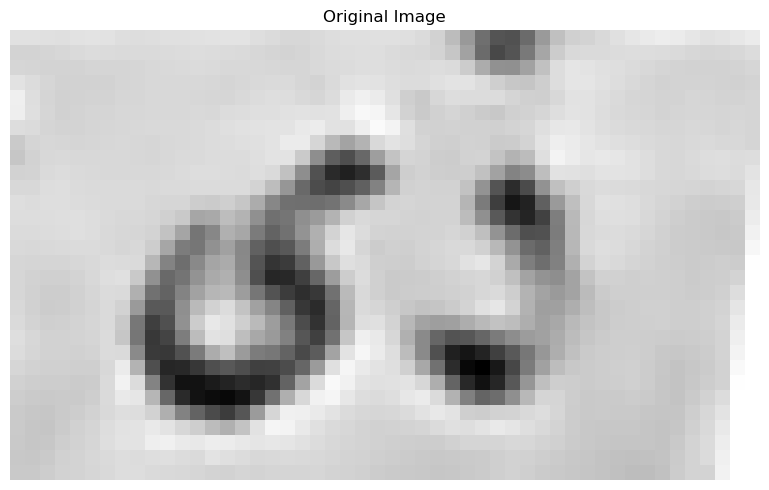

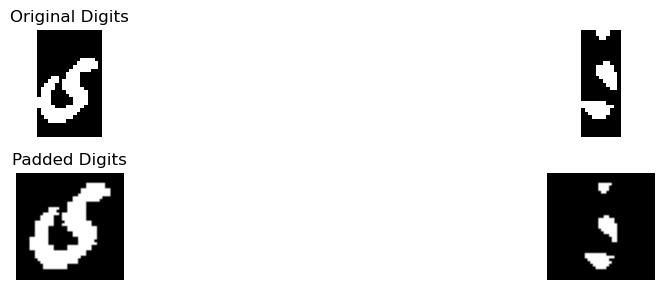

Best match: ي
Full comparison results: {'أ': 0.3666666666666667, 'ب': 0.60625, 'ج': 1.3125, 'د': 2.85625, 'ر': 1.5020833333333332, 'س': 2.5541666666666667, 'ص': 1.8937499999999998, 'ط': 1.29375, 'ع': 1.0770833333333334, 'ف': 1.7666666666666668, 'ق': 1.2979166666666668, 'ك': 1.1812500000000001, 'ل': 1.5625, 'م': 0.5083333333333333, 'ن': 1.4104166666666667, 'ه': 1.3125, 'و': 2.2874999999999996, 'ي': 3.2583333333333333}
Confidence :  0.20104166666666656
Best match: ي
Full comparison results: {'أ': 0.6845569150908417, 'ب': 1.4010205936999596, 'ج': 1.466571773636991, 'د': 0.9769224885594854, 'ر': 1.024518544299279, 'س': 0.48214285714285715, 'ص': 0.7014880952380953, 'ط': 0.8958396675787981, 'ع': 0.5640131578947368, 'ف': 1.3735832075708987, 'ق': 1.4745742561532034, 'ك': 0.553030303030303, 'ل': 1.1723720526951327, 'م': 0.0625, 'ن': 1.7175595238095238, 'ه': 0.0, 'و': 1.465575396825397, 'ي': 2.3143315913477203}
Confidence :  0.2983860337690982
[['٨', '٣', '٧', '٦'], ['ي', 'ي']]
Tilt angle: -3.50

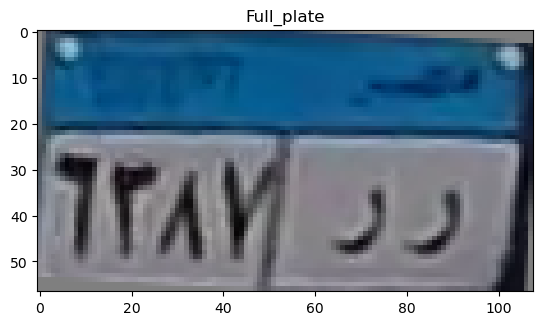

top
[0.3376662  0.35234444 0.4667699  0.58988238 0.6367343  0.60631857
 0.5749307  0.56749842 0.56369407 0.55747817 0.55437793 0.5564099
 0.56329207 0.54824643 0.60076868 0.61386417 0.60789578 0.60074974
 0.59743446 0.59479051 0.59426109 0.60338343 0.60586765 0.60198105
 0.59553624 0.59128866 0.58564935 0.58323924 0.58661191 0.59631884
 0.60550493 0.61209844 0.62170398 0.62419539 0.62169322 0.61155121
 0.60295651 0.59106158 0.58400286 0.58261131 0.58831022 0.59478755
 0.60283711 0.61396364 0.61748042 0.62059531 0.62562863 0.64387311
 0.64810105 0.58947667 0.61043255 0.57759794 0.41706157 0.36756402]
[0.32104263 0.309414   0.51443544 0.64467942 0.59270225 0.55728406
 0.5579973  0.56249    0.56658039 0.56782251 0.57556423 0.56155824
 0.54218435 0.53235013 0.52823763 0.53205323 0.5341426  0.53592141
 0.53916354 0.53648732 0.53056038 0.52333926 0.52034235 0.52099645
 0.52682343 0.53501277 0.53464206 0.53476461 0.5321298  0.53422846
 0.53750664 0.54054586 0.55330551 0.55825725 0.55530459 0.

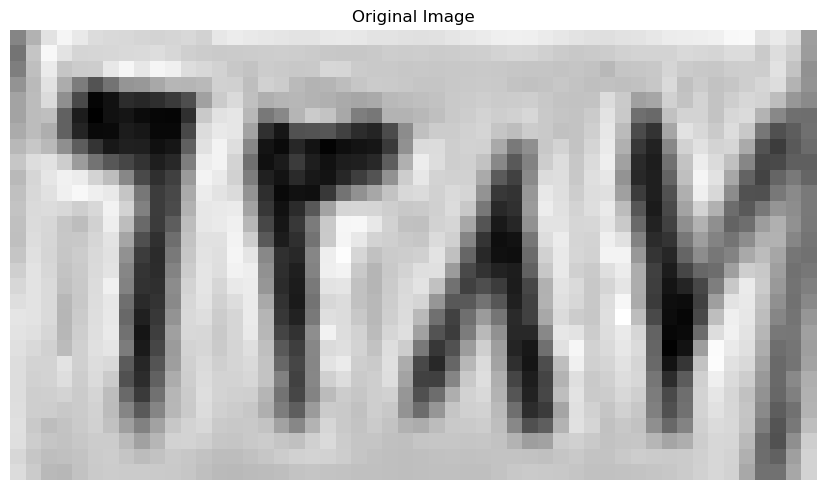

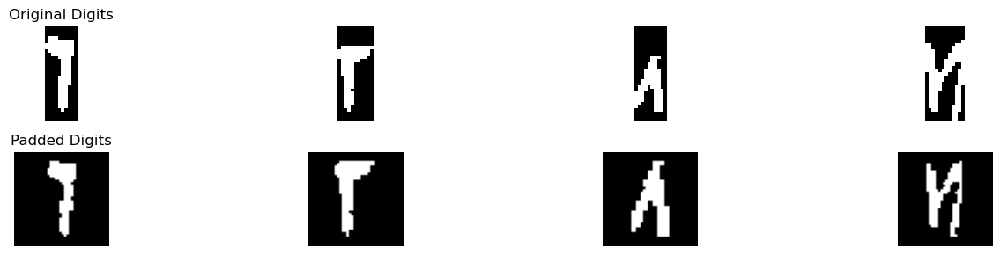

Best match: ٦
Full comparison results: {'١': 2.7395833333333335, '٢': 3.034455128205128, '٣': 1.6916602167182662, '٤': 0.47394688644688643, '٥': 2.4309486952675807, '٦': 4.137202380952381, '٧': 2.0922794117647063, '٨': 0.6798611111111111, '٩': 1.7758766968325792}
Confidence :  0.5513736263736264
Best match: ٣
Full comparison results: {'١': 0.4466911764705882, '٢': 3.299632352941176, '٣': 4.357004643962848, '٤': 2.2867647058823533, '٥': 1.6113122880731239, '٦': 1.7058823529411766, '٧': 1.573529411764706, '٨': 0.665563725490196, '٩': 1.0222630718954249}
Confidence :  0.528686145510836
Best match: ٨
Full comparison results: {'١': 1.46875, '٢': 0.625, '٣': 0.6525735294117647, '٤': 0.5625, '٥': 1.7135347560076661, '٦': 1.50625, '٧': 0.7893382352941176, '٨': 5.680555555555555, '٩': 1.9805964052287583}
Confidence :  1.8499795751633985
Best match: ٥
Full comparison results: {'١': 0.3520833333333333, '٢': 1.0895833333333333, '٣': 0.500483746130031, '٤': 0.9395833333333333, '٥': 1.91904854046881

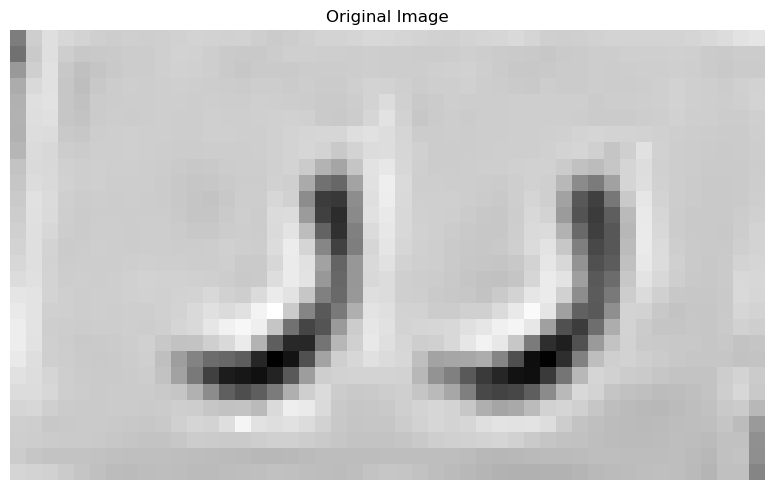

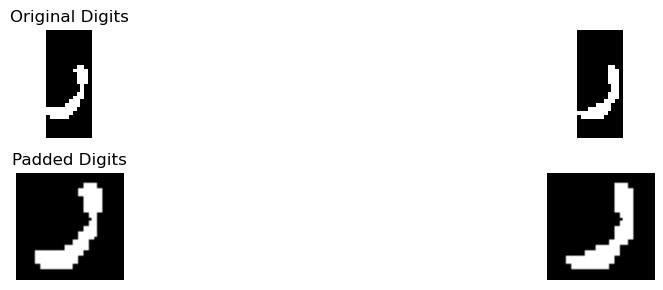

Best match: ر
Full comparison results: {'أ': 0.04, 'ب': 0.3951425729442971, 'ج': 0.4898611111111111, 'د': 3.3877314814814814, 'ر': 4.249008620689656, 'س': 2.736607142857143, 'ص': 2.2016666666666667, 'ط': 2.76375, 'ع': 0.7475, 'ف': 3.051051587301588, 'ق': 2.4168055555555554, 'ك': 2.29625, 'ل': 2.6337499999999996, 'م': 0.04, 'ن': 2.65625, 'ه': 1.40625, 'و': 3.3481944444444447, 'ي': 3.408141025641026}
Confidence :  0.4204337975243151
Best match: ر
Full comparison results: {'أ': 0.04, 'ب': 0.6308023872679045, 'ج': 0.634537037037037, 'د': 3.7244444444444444, 'ر': 5.088922413793103, 'س': 1.6964285714285714, 'ص': 1.6241666666666668, 'ط': 2.99875, 'ع': 1.0325, 'ف': 3.5141269841269844, 'ق': 2.3113425925925926, 'ك': 2.96, 'ل': 2.5487499999999996, 'م': 0.04, 'ن': 3.1275, 'ه': 1.03125, 'و': 3.6202314814814813, 'ي': 3.133429487179487}
Confidence :  0.6822389846743293
[['٦', '٣', '٨', '٥'], ['ر', 'ر']]
Tilt angle: -2.00 degrees


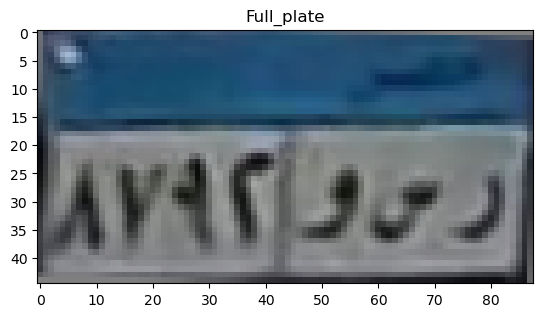

top
[0.0609114  0.1814395  0.35804755 0.45709602 0.54914888 0.56379963
 0.56779498 0.57434278 0.5718155  0.56101549 0.54934608 0.53410681
 0.53931108 0.54903303 0.5404126  0.54097561 0.54768424 0.54872711
 0.55004297 0.55435579 0.55367708 0.55632535 0.556835   0.56253
 0.57338632 0.58198601 0.57397771 0.56338718 0.56705677 0.56250162
 0.55712667 0.55066553 0.5400722  0.5427218  0.54642668 0.56143281
 0.59928838 0.62822203 0.63251971 0.62977544 0.64135758 0.61174227
 0.5409034  0.43763348]
[0.03704588 0.16656255 0.35233051 0.39797201 0.52626268 0.53118461
 0.52667522 0.53411699 0.5346002  0.53097699 0.53201064 0.52981931
 0.54482069 0.54107197 0.5113188  0.49110647 0.51797571 0.53385681
 0.52732362 0.53221408 0.53329479 0.52814096 0.52735207 0.53555094
 0.53887125 0.55104779 0.54601528 0.5441715  0.56453331 0.56909096
 0.56837098 0.56174189 0.53313829 0.54015568 0.54790771 0.55510188
 0.5797075  0.56516473 0.51182344 0.48795874 0.49925003 0.53624144
 0.51033022 0.3787806 ]
[0.03947922 0

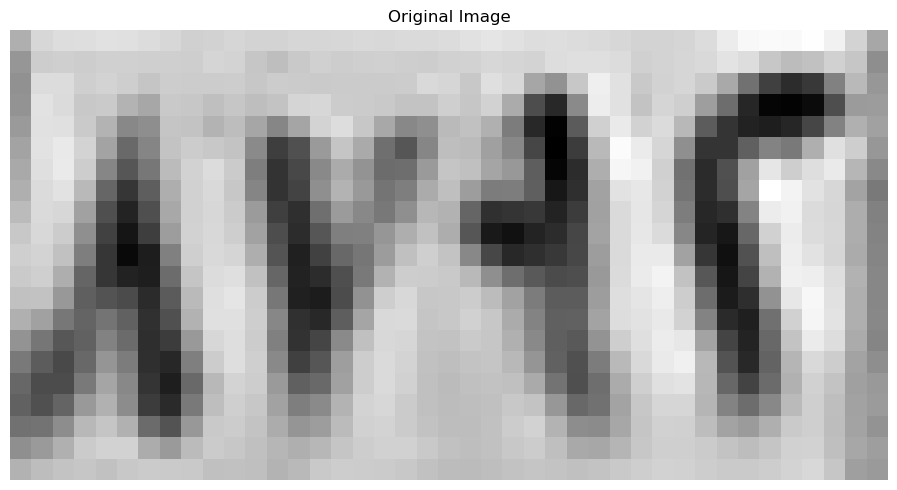

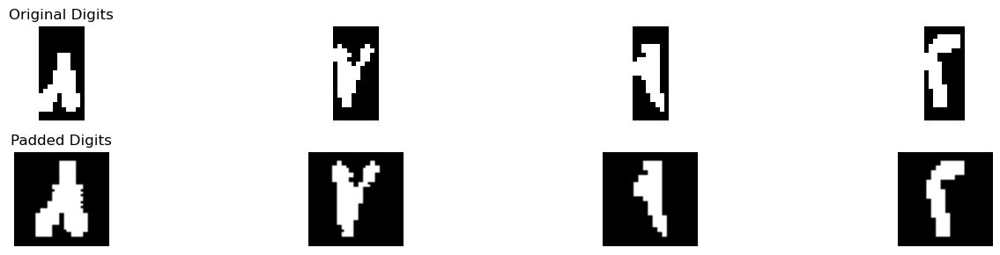

Best match: ٥
Full comparison results: {'١': 0.9545454545454545, '٢': 1.4829545454545454, '٣': 0.7585227272727273, '٤': 1.0482954545454546, '٥': 4.303977272727273, '٦': 1.2017045454545456, '٧': 0.6818181818181818, '٨': 2.3835227272727275, '٩': 1.1761363636363638}
Confidence :  0.9602272727272729
Best match: ٧
Full comparison results: {'١': 0.35, '٢': 0.7999999999999999, '٣': 1.9812500000000002, '٤': 1.2687499999999998, '٥': 1.288095238095238, '٦': 0.325, '٧': 3.0812500000000003, '٨': 1.19375, '٩': 1.2625}
Confidence :  0.55
Best match: ٩
Full comparison results: {'١': 2.705357142857143, '٢': 3.3303571428571432, '٣': 1.71671826625387, '٤': 1.3157738095238094, '٥': 2.0597080937638212, '٦': 2.3086309523809523, '٧': 1.099264705882353, '٨': 2.756944444444444, '٩': 3.8019082633053216}
Confidence :  0.2357755602240892
Best match: ٢
Full comparison results: {'١': 0.21875, '٢': 4.78125, '٣': 4.452109133126935, '٤': 3.25, '٥': 2.867905056759546, '٦': 1.05, '٧': 2.4886029411764707, '٨': 0.5618055

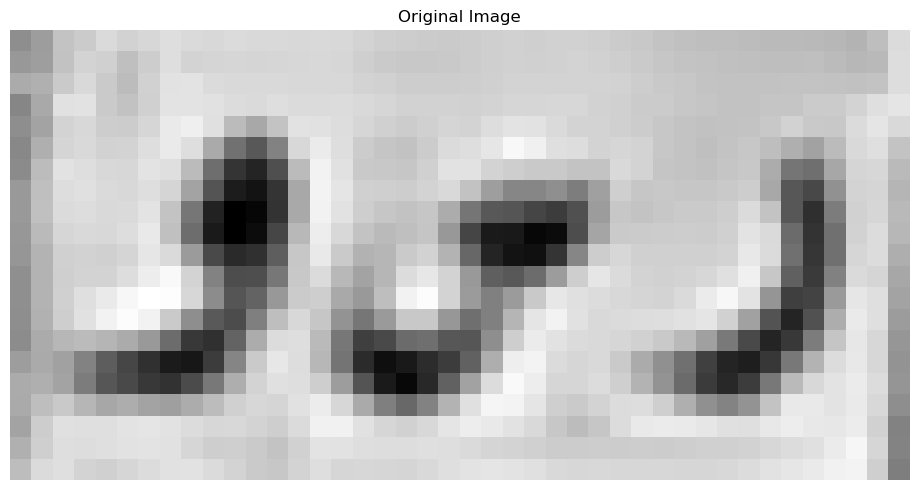

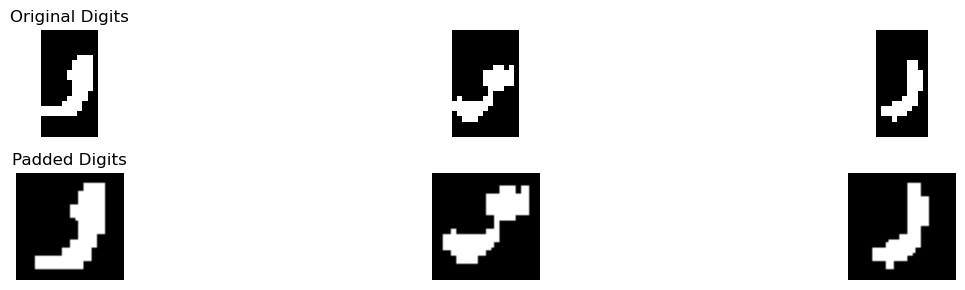

Best match: و
Full comparison results: {'أ': 0.2692307692307693, 'ب': 0.5305868700265253, 'ج': 0.7279202279202279, 'د': 3.3338675213675213, 'ر': 3.858670424403183, 'س': 2.78125, 'ص': 2.106730769230769, 'ط': 2.7836538461538463, 'ع': 0.889423076923077, 'ف': 3.688263125763126, 'ق': 2.4339387464387467, 'ك': 2.2019230769230766, 'ل': 2.0048076923076925, 'م': 0.0, 'ن': 1.9447115384615383, 'ه': 2.90625, 'و': 4.368055555555555, 'ي': 3.3205128205128203}
Confidence :  0.25469256557618625
Best match: س
Full comparison results: {'أ': 0.28125, 'ب': 0.6875, 'ج': 0.875, 'د': 1.78125, 'ر': 0.8125, 'س': 5.042025862068965, 'ص': 3.948994252873563, 'ط': 0.09375, 'ع': 0.28125, 'ف': 1.28125, 'ق': 0.5625, 'ك': 0.5625, 'ل': 0.5, 'م': 0.9375, 'ن': 0.875, 'ه': 2.8899425287356326, 'و': 1.03125, 'ي': 1.0625}
Confidence :  0.5465158045977012
Best match: ه
Full comparison results: {'أ': 0.23809523809523808, 'ب': 0.25323275862068967, 'ج': 0.45205026455026454, 'د': 3.0397919672919675, 'ر': 1.9755911330049263, 'س': 3.0

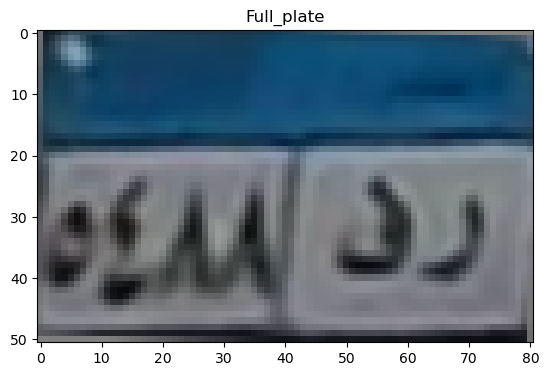

top
[0.28287489 0.33662614 0.49530076 0.55555584 0.5597804  0.52378209
 0.50629484 0.49711164 0.49636964 0.50140682 0.50834487 0.51421314
 0.53030464 0.5365233  0.54098847 0.54628943 0.54287083 0.53679526
 0.54004006 0.54068657 0.53352461 0.5260783  0.52747555 0.52735134
 0.52549913 0.51624139 0.51976289 0.52872472 0.5380179  0.53562237
 0.53309104 0.52820015 0.53113434 0.54167751 0.53908114 0.51772287
 0.49551805 0.49565526 0.53487368 0.52313283]
[0.25637964 0.30959028 0.48852732 0.53780889 0.5359853  0.50340867
 0.4842484  0.46379284 0.46381719 0.47115419 0.48232443 0.49471848
 0.51870495 0.53799831 0.53758707 0.51541706 0.488986   0.48092279
 0.50122466 0.51198896 0.51034921 0.50749404 0.51275528 0.51515544
 0.51306398 0.50621034 0.5092129  0.51265241 0.51807335 0.51782083
 0.51692313 0.50868846 0.50343432 0.52113217 0.52509496 0.50207019
 0.48732972 0.50598275 0.54796203 0.5200642 ]
[0.24790054 0.32218578 0.49806201 0.53358911 0.52281559 0.49910865
 0.48506564 0.47648338 0.48193917

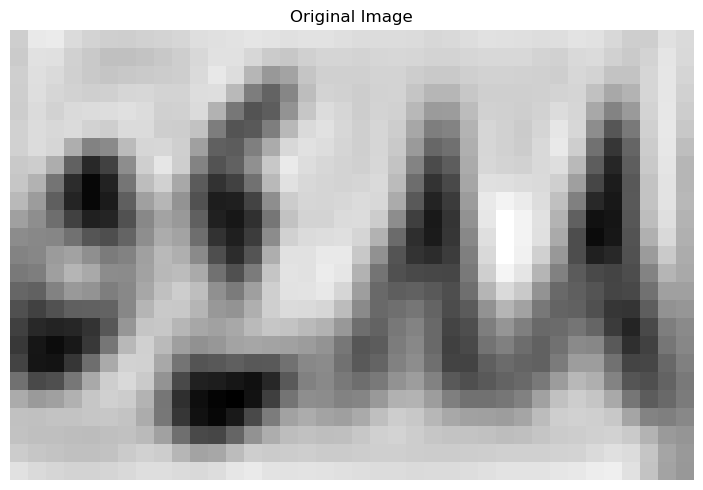

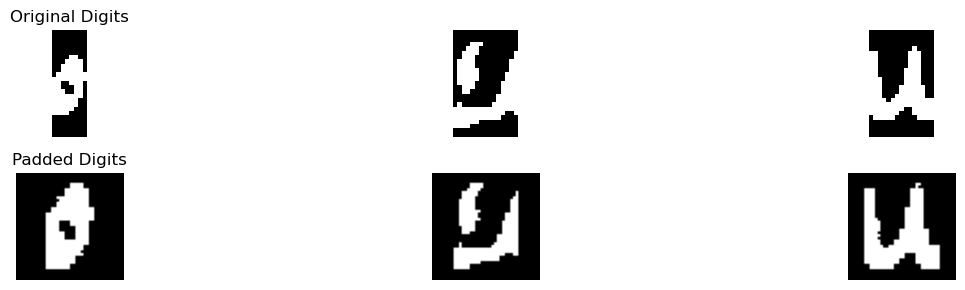

Best match: ٥
Full comparison results: {'١': 1.1666666666666667, '٢': 1.3159722222222223, '٣': 1.5537280701754388, '٤': 2.5902777777777777, '٥': 6.564170843776107, '٦': 1.4569444444444444, '٧': 0.73125, '٨': 1.836111111111111, '٩': 1.2638888888888888}
Confidence :  1.9869465329991645
Best match: ٥
Full comparison results: {'١': 0.08333333333333333, '٢': 0.3333333333333333, '٣': 0.29166666666666663, '٤': 0.90625, '٥': 2.4479166666666665, '٦': 0.03125, '٧': 0.3333333333333333, '٨': 0.5833333333333333, '٩': 1.03125}
Confidence :  0.7083333333333333
Best match: ٥
Full comparison results: {'١': 0.3928571428571428, '٢': 0.3571428571428571, '٣': 0.17857142857142855, '٤': 0.17857142857142855, '٥': 1.9955357142857144, '٦': 0.8214285714285714, '٧': 0.8526785714285714, '٨': 0.8928571428571428, '٩': 0.46428571428571425}
Confidence :  0.5513392857142858
In horizontal_segmentation_1
0 1
7 19
21 31
In refine_segmentation_1


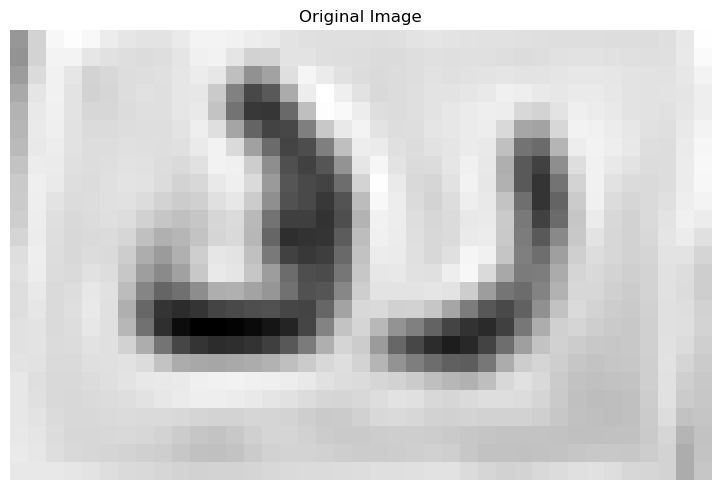

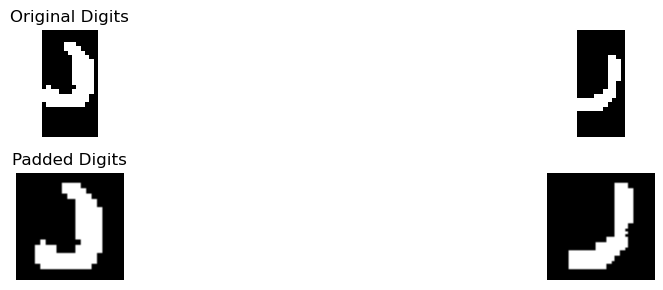

Best match: ف
Full comparison results: {'أ': 0.07125000000000001, 'ب': 0.10344827586206896, 'ج': 2.4214814814814813, 'د': 4.826990740740741, 'ر': 2.4880603448275864, 'س': 2.330357142857143, 'ص': 1.40125, 'ط': 2.5825, 'ع': 1.455, 'ف': 5.410244708994709, 'ق': 3.3268518518518517, 'ك': 2.465, 'ل': 1.765, 'م': 1.15875, 'ن': 3.06, 'ه': 3.75, 'و': 3.3668981481481484, 'ي': 2.419871794871795}
Confidence :  0.29162698412698385
Best match: ر
Full comparison results: {'أ': 0.041666666666666664, 'ب': 0.5650696286472148, 'ج': 0.6469907407407407, 'د': 4.133981481481481, 'ر': 4.556005747126437, 'س': 2.616071428571429, 'ص': 2.0083333333333333, 'ط': 3.260416666666667, 'ع': 0.9479166666666667, 'ف': 3.5783730158730167, 'ق': 2.3900462962962967, 'ك': 2.604166666666667, 'ل': 2.854166666666667, 'م': 0.041666666666666664, 'ن': 3.0320833333333335, 'ه': 1.8518145161290323, 'و': 3.3773148148148144, 'ي': 3.0059294871794866}
Confidence :  0.2110121328224781
[['٥', '٥', '٥'], ['ف', 'ر']]
Tilt angle: -2.00 degrees


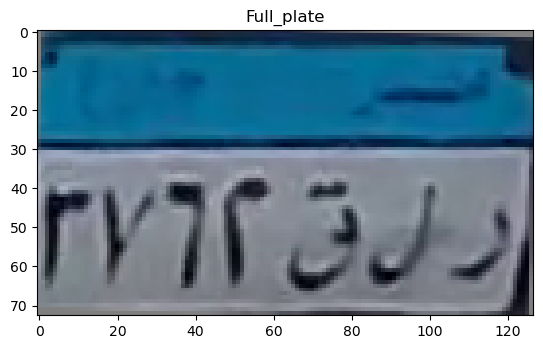

top
[0.59155039 0.6099599  0.62324039 0.63486275 0.6467048  0.65465966
 0.65879338 0.64831213 0.63443485 0.60652711 0.59359192 0.58507616
 0.5643519  0.56448941 0.57105285 0.5768167  0.53599635 0.52988462
 0.54745648 0.57435356 0.56121101 0.5661509  0.57914593 0.58517503
 0.59928643 0.61142801 0.61213855 0.61278471 0.61473318 0.6221131
 0.63620343 0.64961627 0.65319979 0.66286536 0.67563942 0.67358457
 0.66133661 0.64255569 0.62925529 0.6250848  0.62008903 0.61651008
 0.60788186 0.59247898 0.60728863 0.59485578 0.58045281 0.59377824
 0.58719506 0.60621696 0.62487816 0.63278995 0.63826757 0.63805078
 0.64005906 0.64155645 0.64240668 0.63822059 0.63258978 0.62735314
 0.61988305 0.62983605 0.63881267]
[0.64377496 0.62582329 0.63487535 0.64644926 0.65252741 0.65394447
 0.64824533 0.6514051  0.658804   0.65351907 0.65324333 0.64850222
 0.64037952 0.64772863 0.64981426 0.65073809 0.642849   0.64591272
 0.64785819 0.6639887  0.66541103 0.65434627 0.65106809 0.65589346
 0.6531001  0.65403596 0

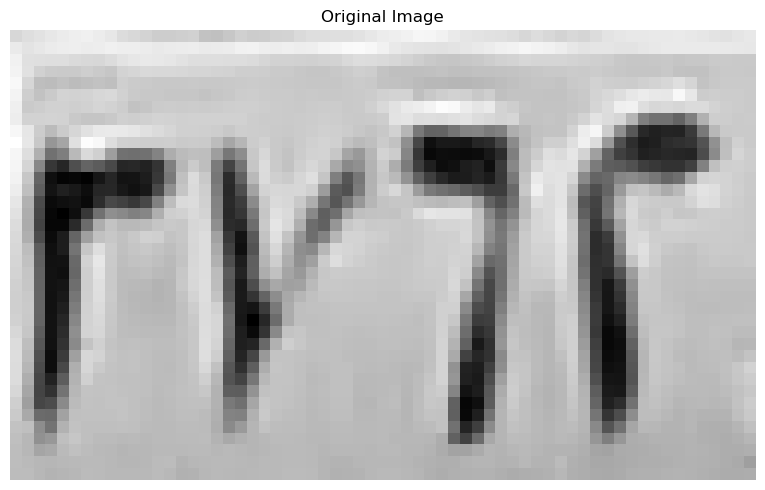

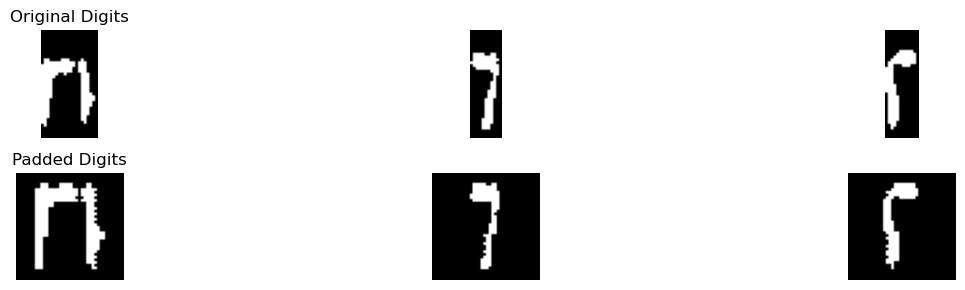

Best match: ٦
Full comparison results: {'١': 0.46461538461538465, '٢': 0.3076923076923077, '٣': 1.6057692307692308, '٤': 0.0, '٥': 0.608173076923077, '٦': 1.8942307692307692, '٧': 0.42307692307692313, '٨': 0.11538461538461539, '٩': 0.8076923076923077}
Confidence :  0.14423076923076916
Best match: ٦
Full comparison results: {'١': 1.8892045454545454, '٢': 2.609265734265734, '٣': 1.548955108359133, '٤': 0.620970695970696, '٥': 2.3982106000294854, '٦': 3.194642857142857, '٧': 1.2481617647058825, '٨': 0.3055555555555556, '٩': 1.8626822523881348}
Confidence :  0.2926885614385615
Best match: ٢
Full comparison results: {'١': 0.0, '٢': 3.175480769230769, '٣': 2.2181695046439627, '٤': 1.7082875457875457, '٥': 2.0153739127229837, '٦': 1.3526785714285714, '٧': 1.0867647058823529, '٨': 0.21250000000000002, '٩': 0.5257038712921066}
Confidence :  0.47865563229340324
In horizontal_segmentation_1
1 20
22 39
43 58
In refine_segmentation_1


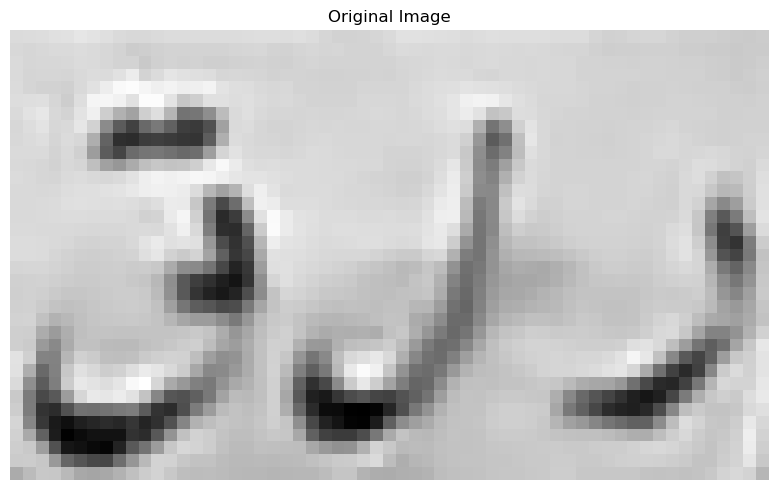

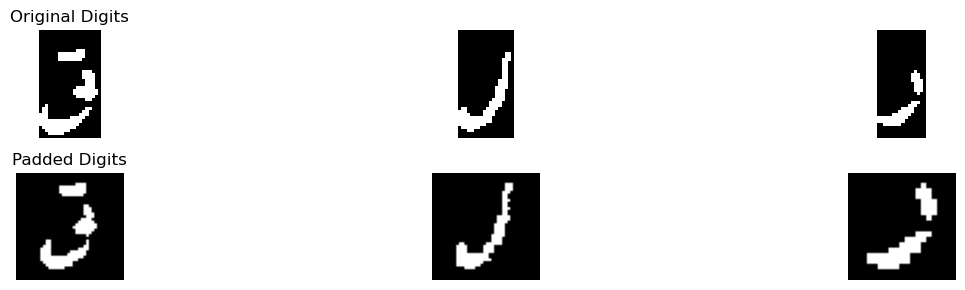

Best match: ق
Full comparison results: {'أ': 0.07886904761904762, 'ب': 0.5417771883289124, 'ج': 2.349057933910669, 'د': 3.8364992280718084, 'ر': 2.742709895052474, 'س': 1.5044642857142856, 'ص': 1.4437499999999999, 'ط': 1.9627251715051566, 'ع': 1.3053640950262198, 'ف': 3.4470686123911927, 'ق': 4.454668914902507, 'ك': 1.3806818181818183, 'ل': 3.3403897849462365, 'م': 0.5760281385281385, 'ن': 3.192488479262673, 'ه': 0.9893817204301075, 'و': 2.7167328042328043, 'ي': 2.896518155757286}
Confidence :  0.3090848434153495
Best match: ل
Full comparison results: {'أ': 0.0, 'ب': 0.4343501326259947, 'ج': 0.5123792270531401, 'د': 2.107869167869168, 'ر': 2.551682819304633, 'س': 2.5669642857142856, 'ص': 2.350595238095238, 'ط': 1.5358613306982871, 'ع': 0.45982142857142855, 'ف': 1.7546296296296295, 'ق': 2.1142526455026456, 'ك': 1.5890151515151514, 'ل': 2.75, 'م': 0.3203463203463203, 'ن': 1.9818452380952383, 'ه': 0.8893817204301075, 'و': 1.8363095238095237, 'ي': 1.912220297818124}
Confidence :  0.0915178

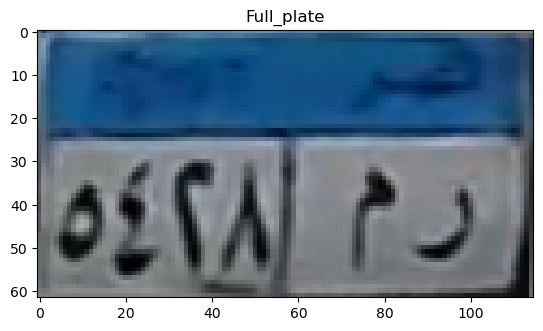

top
[0.34521456 0.40120763 0.37550282 0.41289686 0.47946094 0.53950514
 0.56023701 0.55050774 0.54185484 0.53829539 0.53544484 0.54797211
 0.56618031 0.58132935 0.58832077 0.591705   0.59188318 0.58904189
 0.5894138  0.59212196 0.5896291  0.5925465  0.58877695 0.58915283
 0.5933732  0.60363475 0.5977637  0.5942857  0.59387271 0.59607783
 0.59350536 0.58872132 0.60139716 0.60977778 0.61745978 0.62096914
 0.61792636 0.61709108 0.61404069 0.6210995  0.60705482 0.59646655
 0.60090438 0.60505005 0.60603985 0.60913451 0.61491359 0.61670806
 0.62148859 0.63203598 0.64146119 0.65479835 0.65553414 0.6592111
 0.66780336 0.61229255 0.50767788]
[0.34588721 0.41681912 0.39910584 0.44942264 0.50877881 0.55561011
 0.59260434 0.58494857 0.57555321 0.57341042 0.566116   0.56093583
 0.56406979 0.57230504 0.57928648 0.58484862 0.59012807 0.59712469
 0.61389325 0.63070322 0.62416662 0.60908639 0.59938031 0.59206858
 0.59347419 0.60668142 0.61314622 0.62043369 0.61965589 0.61914777
 0.62005662 0.61487381 0

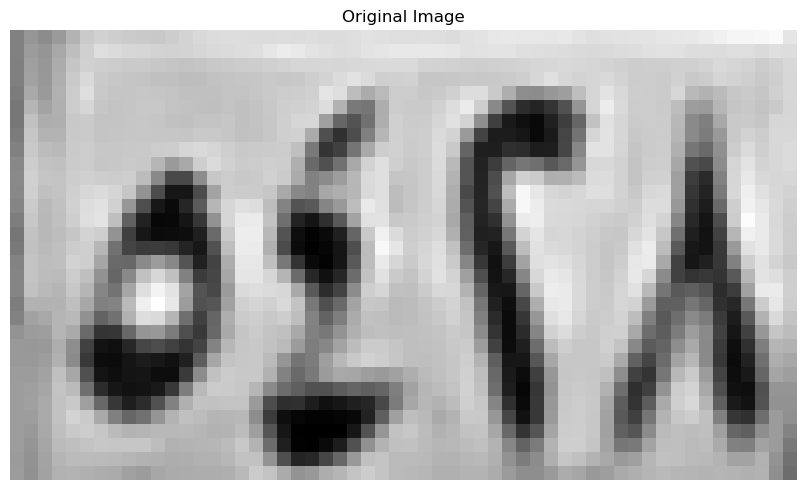

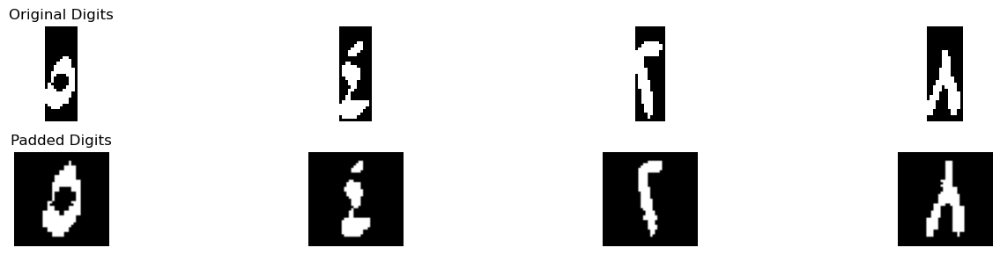

Best match: ٥
Full comparison results: {'١': 0.375, '٢': 0.90625, '٣': 0.8692917956656346, '٤': 1.8125, '٥': 4.566950464396284, '٦': 1.46875, '٧': 1.0933823529411766, '٨': 1.4381944444444446, '٩': 0.3715277777777778}
Confidence :  1.3772252321981422
Best match: ٤
Full comparison results: {'١': 1.739583333333333, '٢': 1.3052884615384615, '٣': 0.9453366873065016, '٤': 4.656318681318681, '٥': 2.9629911174996315, '٦': 0.21428571428571427, '٧': 0.5452205882352941, '٨': 1.6354166666666667, '٩': 1.2125911261940674}
Confidence :  0.8466637819095248
Best match: ٢
Full comparison results: {'١': 1.0625, '٢': 6.546547202797203, '٣': 3.5864938080495357, '٤': 3.1194368131868133, '٥': 1.9139438670204922, '٦': 0.41160714285714284, '٧': 1.8341911764705883, '٨': 0.6486111111111111, '٩': 1.2962543991955757}
Confidence :  1.4800266973738339
Best match: ٨
Full comparison results: {'١': 1.9375, '٢': 0.0625, '٣': 0.125, '٤': 0.6875, '٥': 1.7287243844906384, '٦': 1.1375, '٧': 0.8356617647058824, '٨': 4.933333

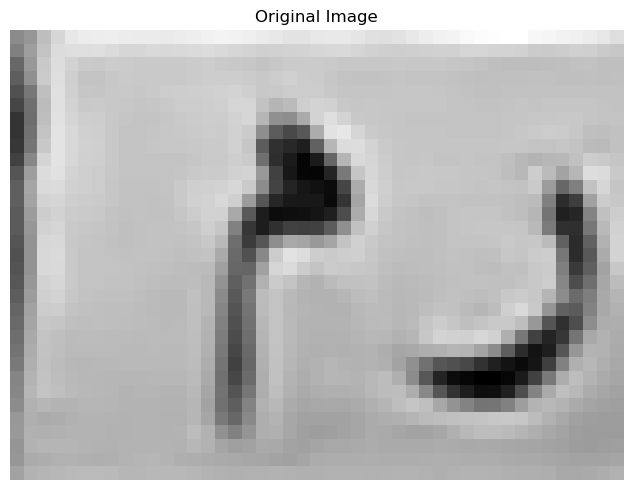

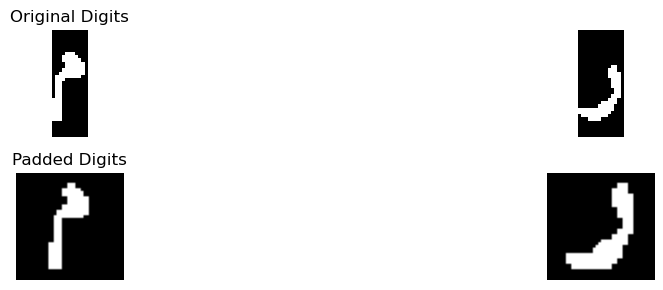

Best match: م
Full comparison results: {'أ': 0.25416666666666665, 'ب': 0.09375, 'ج': 0.4209584195997239, 'د': 2.1486023939081216, 'ر': 0.19011904761904763, 'س': 1.4330357142857144, 'ص': 0.7982142857142858, 'ط': 0.3682065217391304, 'ع': 1.1246710526315788, 'ف': 0.7471282372598163, 'ق': 0.5765124617098301, 'ك': 0.46969696969696967, 'ل': 0.4618808049535604, 'م': 4.962878787878788, 'ن': 0.7319047619047618, 'ه': 2.0278225806451613, 'و': 0.9901785714285715, 'ي': 0.2959887334887335}
Confidence :  1.4071381969853332
Best match: ر
Full comparison results: {'أ': 0.08, 'ب': 0.7349966843501327, 'ج': 0.836574074074074, 'د': 4.445416666666667, 'ر': 5.214439655172414, 'س': 2.205357142857143, 'ص': 1.9270833333333335, 'ط': 3.4575, 'ع': 1.12625, 'ف': 3.8616666666666664, 'ق': 2.2488425925925926, 'ك': 3.20875, 'ل': 2.9175, 'م': 0.0, 'ن': 3.23875, 'ه': 1.9375, 'و': 3.831805555555556, 'ي': 3.16676282051282}
Confidence :  0.38451149425287356
[['٥', '٤', '٢', '٨'], ['م', 'ر']]
Tilt angle: -3.00 degrees


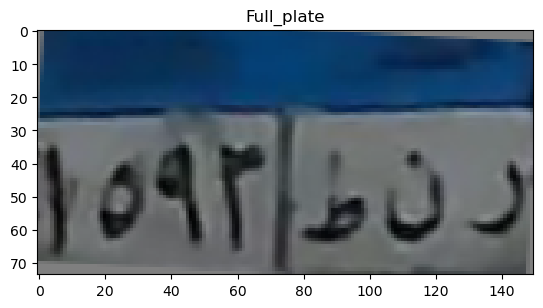

top
[0.4434541  0.42299012 0.42734555 0.43201655 0.43591286 0.44263789
 0.45514947 0.46467031 0.46997756 0.47267682 0.47423362 0.47514807
 0.47739628 0.47677317 0.47627597 0.4736291  0.47237297 0.47394938
 0.47658088 0.47702228 0.47669162 0.47425673 0.47116419 0.46893049
 0.46414901 0.45768768 0.44889116 0.44609114 0.44767876 0.4468272
 0.44523124 0.44506058 0.44680032 0.44753681 0.4451226  0.43962896
 0.42808948 0.41588941 0.40136735 0.38172887 0.36745191 0.36163743
 0.36910199 0.3875506  0.40652272 0.41893963 0.42097833 0.41533989
 0.40843952 0.39974536 0.38195893 0.36780533 0.36015293 0.35639906
 0.36616085 0.38945104 0.41838653 0.4490873  0.46649104 0.45917411
 0.44891614 0.44688196 0.45694987 0.46575297 0.46235882 0.44983464
 0.43722807 0.44209299 0.45636497 0.46450231 0.48592619 0.48949972
 0.40691517 0.28161765 0.20855182]
[0.42769977 0.42058044 0.42503094 0.43166778 0.43789177 0.44091679
 0.45349262 0.46493237 0.46995759 0.47416885 0.47594226 0.47638545
 0.47935534 0.47752174 0

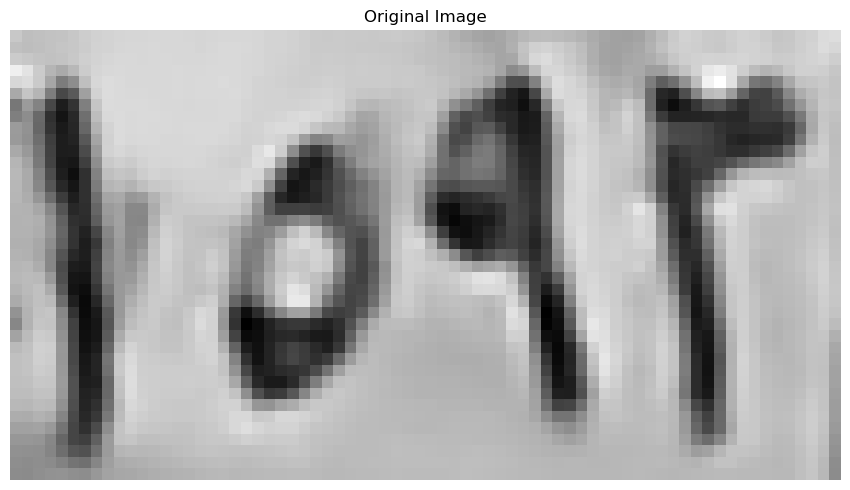

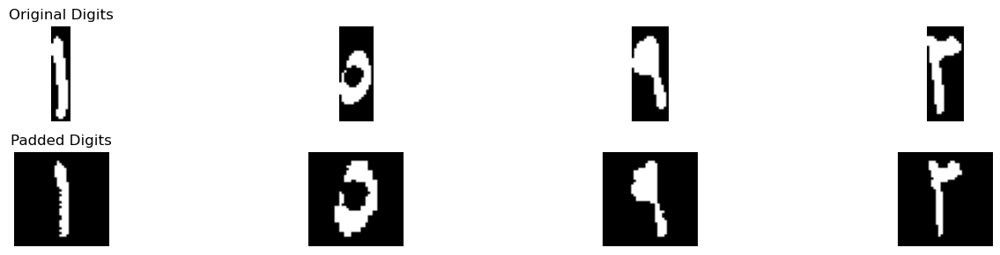

Best match: ١
Full comparison results: {'١': 5.641666666666666, '٢': 2.0359120046620047, '٣': 0.8088235294117647, '٤': 1.014125457875458, '٥': 1.1537667698658411, '٦': 1.1705357142857142, '٧': 1.1066176470588236, '٨': 1.9451388888888888, '٩': 1.487226621417798}
Confidence :  1.8028773310023305
Best match: ٥
Full comparison results: {'١': 0.33333333333333337, '٢': 2.1458333333333335, '٣': 1.4009502923976607, '٤': 1.8784722222222223, '٥': 6.39155179615706, '٦': 1.495138888888889, '٧': 0.8979166666666666, '٨': 1.4416666666666664, '٩': 0.6944444444444444}
Confidence :  2.122859231411863
Best match: ٩
Full comparison results: {'١': 2.7270833333333337, '٢': 2.5625, '٣': 2.310952012383901, '٤': 2.8166666666666664, '٥': 2.2655305543269937, '٦': 1.6458333333333333, '٧': 1.0893382352941177, '٨': 2.9986111111111113, '٩': 5.872875816993464}
Confidence :  1.4371323529411761
Best match: ٣
Full comparison results: {'١': 0.09375, '٢': 3.794642857142857, '٣': 5.038506191950464, '٤': 1.842857142857143, 

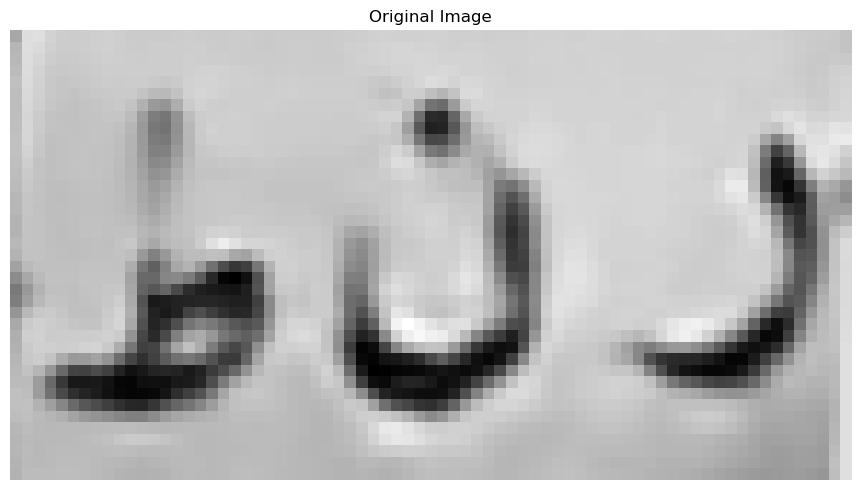

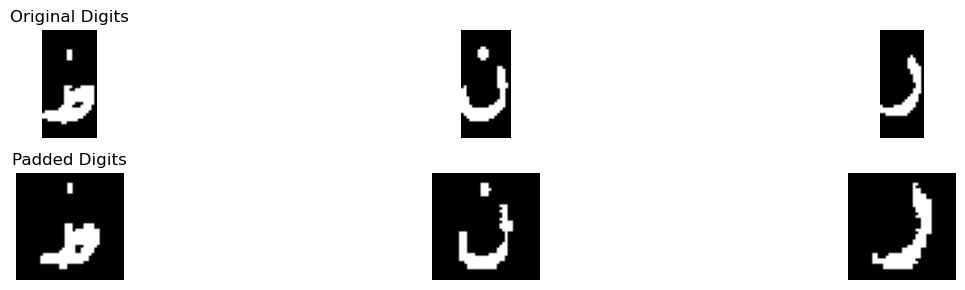

Best match: ط
Full comparison results: {'أ': 0.7705287019246975, 'ب': 0.6035311671087533, 'ج': 1.1156296400861616, 'د': 2.6303956228956227, 'ر': 2.6215971603359156, 'س': 1.2410714285714286, 'ص': 1.219128787878788, 'ط': 6.016798418972332, 'ع': 0.6026745431987368, 'ف': 2.9406172904156778, 'ق': 2.1703523395403264, 'ك': 1.397727272727273, 'ل': 2.0187168342410278, 'م': 0.03125, 'ن': 2.29766862170088, 'ه': 1.3110887096774193, 'و': 2.09650266101879, 'ي': 3.0019116139820907}
Confidence :  1.5074434024951207
Best match: ن
Full comparison results: {'أ': 0.30302419354838706, 'ب': 0.6387599469496021, 'ج': 1.5229799286864507, 'د': 3.4783249158249157, 'ر': 2.7456956343256946, 'س': 0.9910714285714286, 'ص': 0.8125, 'ط': 3.118943653173413, 'ع': 2.4520833333333334, 'ف': 2.516894947943335, 'ق': 3.5298991825131982, 'ك': 1.7178030303030303, 'ل': 4.911311179087876, 'م': 0.49715909090909094, 'ن': 4.931703149001536, 'ه': 0.7602822580645161, 'و': 2.786324458098652, 'ي': 2.1003901895206245}
Confidence :  0.0101

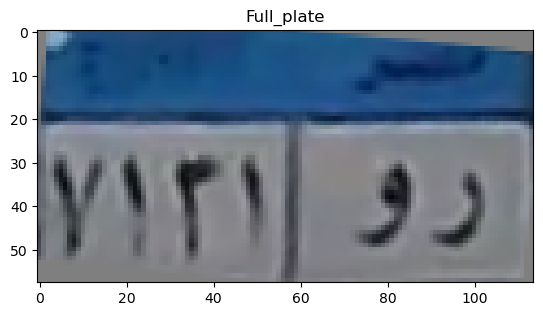

top
[0.46815196 0.50686012 0.57922612 0.58049372 0.55469056 0.55021804
 0.56047722 0.55324811 0.54175501 0.53663446 0.53327579 0.53068411
 0.53070439 0.53441206 0.53910124 0.53780218 0.54247703 0.54549163
 0.54807874 0.55408681 0.55434365 0.55367953 0.55220246 0.55531545
 0.55749554 0.56468615 0.55982961 0.55129207 0.54370703 0.54191855
 0.54076712 0.54106353 0.54509675 0.54616852 0.54380227 0.54035741
 0.53927231 0.54328844 0.54966408 0.55558216 0.55770393 0.55116878
 0.54631743 0.54185101 0.53891373 0.53777271 0.53676674 0.53435278
 0.53468649 0.53336173 0.53013061 0.52982121 0.53325703 0.53720305
 0.54039821 0.55136513 0.53323523]
[0.45796291 0.50088074 0.58351203 0.57499511 0.56089236 0.57075725
 0.58581079 0.5643181  0.55063843 0.54261593 0.5373661  0.53482767
 0.53147629 0.5314999  0.5300501  0.52934449 0.53378564 0.53796672
 0.53994587 0.54508281 0.54556135 0.54978673 0.55035206 0.55283101
 0.55119255 0.55519873 0.55848963 0.55780544 0.55536455 0.55123026
 0.56050194 0.55850663 

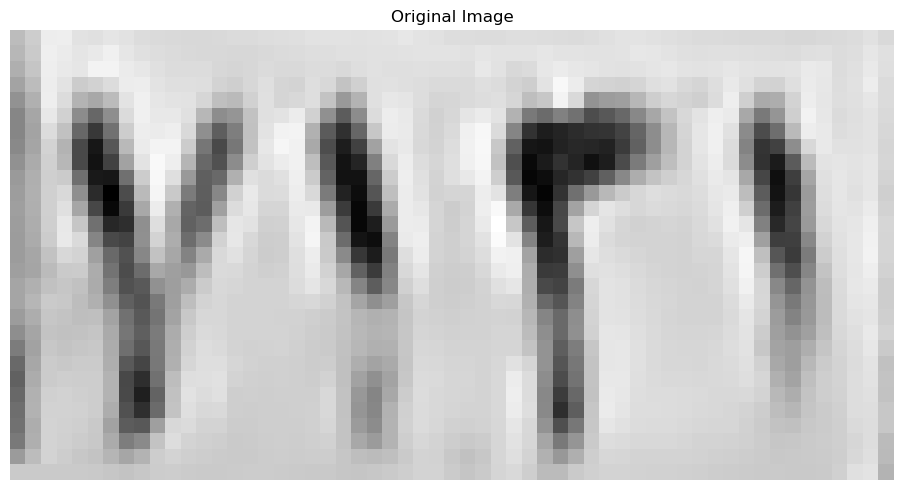

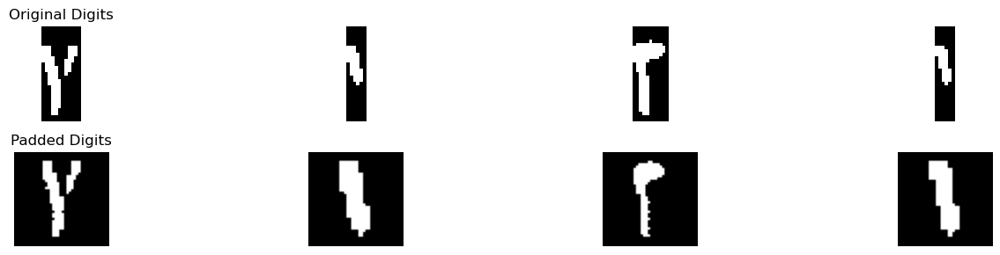

Best match: ٣
Full comparison results: {'١': 0.0, '٢': 3.1875, '٣': 4.093169504643963, '٤': 1.5, '٥': 0.7551046734483267, '٦': 0.66875, '٧': 3.6669117647058824, '٨': 0.46875, '٩': 0.8110702614379085}
Confidence :  0.21312886996904012
Best match: ٩
Full comparison results: {'١': 2.326923076923077, '٢': 3.204326923076923, '٣': 2.6625386996904026, '٤': 2.5703296703296705, '٥': 1.754017396432257, '٦': 0.9169642857142857, '٧': 1.6544117647058825, '٨': 2.590972222222222, '٩': 3.441914906988436}
Confidence :  0.11879399195575657
Best match: ٣
Full comparison results: {'١': 0.2620192307692308, '٢': 5.324519230769231, '٣': 5.546342879256966, '٤': 2.2759844322344325, '٥': 2.4957891051157306, '٦': 1.6160714285714286, '٧': 1.161764705882353, '٨': 0.6541666666666667, '٩': 1.0226872800402211}
Confidence :  0.11091182424386758
Best match: ١
Full comparison results: {'١': 3.1682692307692304, '٢': 2.7475961538461537, '٣': 2.439628482972136, '٤': 1.8957875457875457, '٥': 1.7739108801415302, '٦': 1.80505

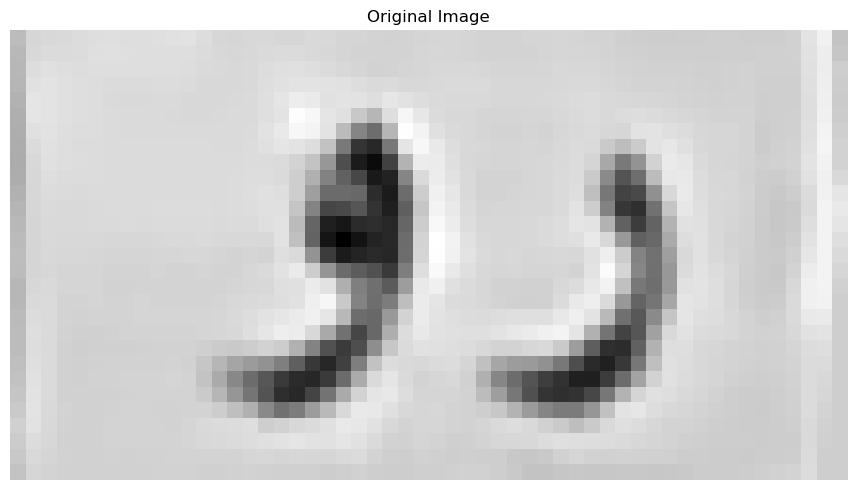

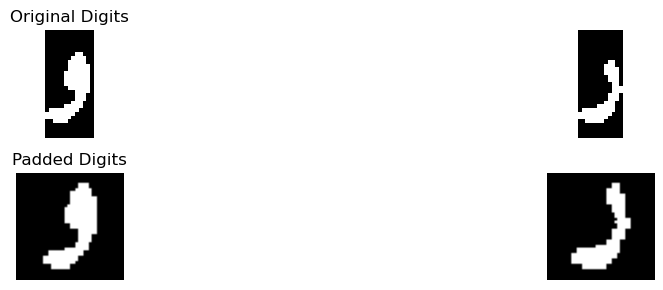

Best match: و
Full comparison results: {'أ': 0.53125, 'ب': 0.15948275862068967, 'ج': 0.6161231884057972, 'د': 3.65989898989899, 'ر': 2.8724566288284428, 'س': 2.763392857142857, 'ص': 2.475595238095238, 'ط': 2.168272397891963, 'ع': 1.08125, 'ف': 2.619940476190476, 'ق': 2.8529100529100524, 'ك': 1.7812500000000002, 'ل': 2.6687499999999997, 'م': 0.6068181818181818, 'ن': 2.159702380952381, 'ه': 2.724529569892473, 'و': 4.594345238095238, 'ي': 3.0922658862876253}
Confidence :  0.46722312409812417
Best match: د
Full comparison results: {'أ': 0.13636363636363635, 'ب': 0.6868368700265253, 'ج': 1.1895449055775142, 'د': 4.593388047138047, 'ر': 3.938885102903094, 'س': 2.294642857142857, 'ص': 1.6295454545454546, 'ط': 2.5686758893280635, 'ع': 1.2414772727272727, 'ف': 3.168545574795575, 'ق': 3.2460016835016834, 'ك': 1.9857954545454546, 'ل': 3.741477272727273, 'م': 0.16761363636363635, 'ن': 3.6026136363636363, 'ه': 2.0360887096774194, 'و': 3.8720538720538724, 'ي': 3.4026192104996453}
Confidence :  0.327

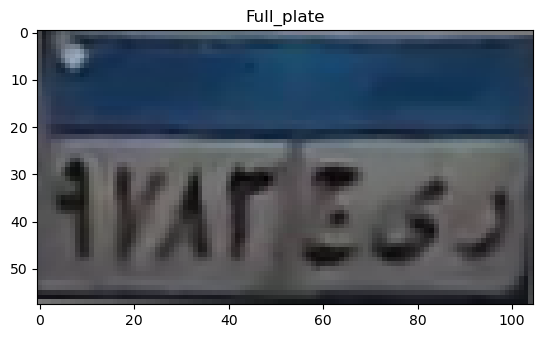

top
[0.32545386 0.32748933 0.32401966 0.37404263 0.37953436 0.41071083
 0.41375324 0.41987007 0.41731952 0.4100202  0.40206517 0.3851388
 0.38317201 0.39400392 0.4043057  0.4119114  0.41702647 0.40576515
 0.40408145 0.41126801 0.41739547 0.42716875 0.42988781 0.43579314
 0.4427185  0.44422799 0.44820752 0.44796527 0.44839419 0.4453611
 0.44791135 0.44571515 0.44384462 0.44364843 0.45171534 0.45838365
 0.45872232 0.45792892 0.45604473 0.45721048 0.45956955 0.46800245
 0.47072917 0.47132659 0.48133732 0.48789216 0.49358303 0.49046722
 0.48944853 0.49018382 0.48856005 0.48803768]
[0.3178032  0.33056482 0.33014186 0.36970719 0.3924071  0.41368749
 0.39877115 0.36593548 0.36405129 0.40640475 0.43454754 0.42189637
 0.39754482 0.37690728 0.38743289 0.40548942 0.41019765 0.42183108
 0.4231401  0.42439689 0.42162422 0.41902511 0.42741708 0.42972431
 0.43469888 0.42928835 0.4353177  0.43488353 0.43105827 0.42498903
 0.4205569  0.41754407 0.41659812 0.41779059 0.41882476 0.42139983
 0.414681   0.

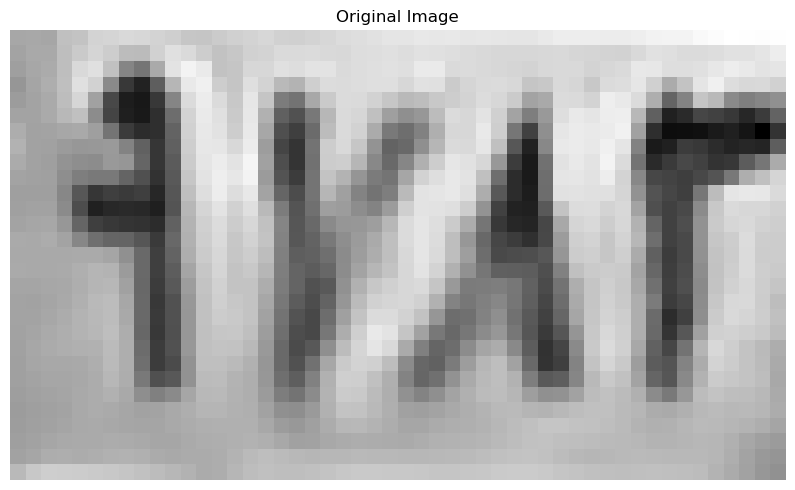

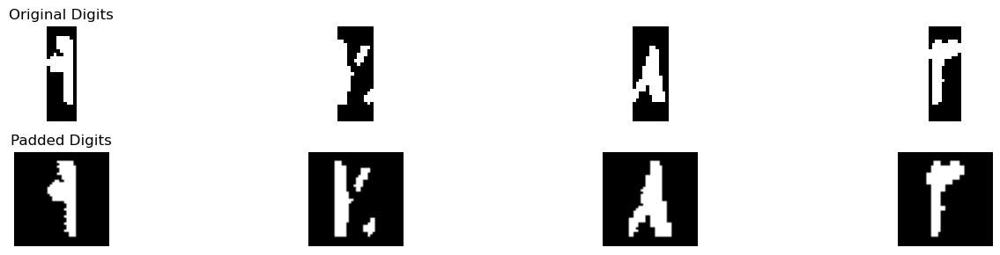

Best match: ٩
Full comparison results: {'١': 2.354166666666667, '٢': 1.7740384615384617, '٣': 0.75, '٤': 0.7105540293040293, '٥': 2.1958296476485333, '٦': 2.8363095238095237, '٧': 0.6893382352941176, '٨': 2.029166666666667, '٩': 3.657742584213172}
Confidence :  0.4107165302018241
Best match: ٨
Full comparison results: {'١': 0.0, '٢': 0.35294117647058826, '٣': 0.9324690402476781, '٤': 0.47058823529411764, '٥': 1.0311071797139908, '٦': 0.25772058823529415, '٧': 0.893014705882353, '٨': 1.249877450980392, '٩': 0.7338643790849674}
Confidence :  0.10938513563320063
Best match: ٨
Full comparison results: {'١': 1.7326388888888888, '٢': 1.3645833333333333, '٣': 0.7748538011695906, '٤': 0.7569444444444444, '٥': 2.095420843776107, '٦': 1.1881944444444446, '٧': 0.9187500000000002, '٨': 4.461805555555555, '٩': 1.6770833333333335}
Confidence :  1.1831923558897242
Best match: ٣
Full comparison results: {'١': 0.625, '٢': 2.6875, '٣': 4.427534829721362, '٤': 1.9375, '٥': 2.0698851909184723, '٦': 1.8187

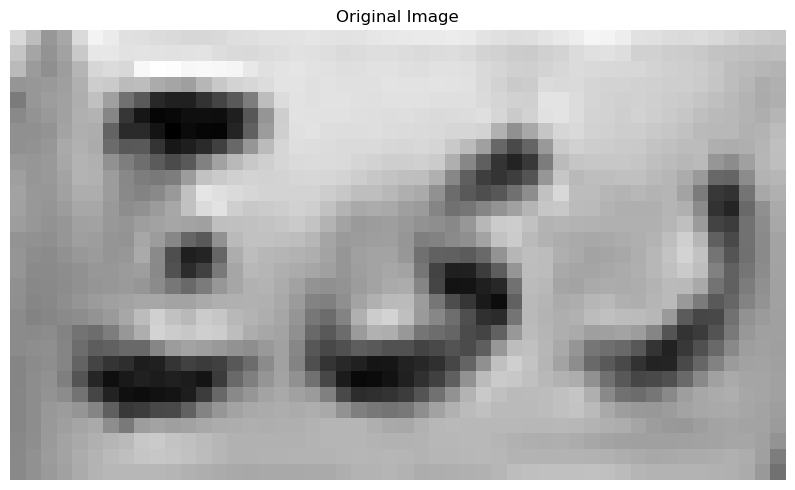

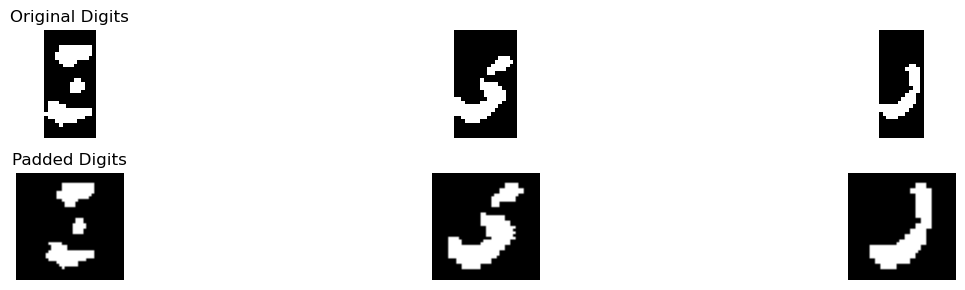

Best match: ج
Full comparison results: {'أ': 0.5625, 'ب': 0.2658810715609937, 'ج': 3.7495902346445824, 'د': 3.419770703098743, 'ر': 0.579236899407439, 'س': 0.8883928571428572, 'ص': 0.7648809523809523, 'ط': 1.2806441746659138, 'ع': 0.779250882582801, 'ف': 2.8494095902839534, 'ق': 2.0811366066569215, 'ك': 0.646780303030303, 'ل': 1.1684502923976607, 'م': 1.2095959595959598, 'ن': 2.160297619047619, 'ه': 1.6507392473118279, 'و': 1.5483796296296295, 'ي': 2.0702366610325935}
Confidence :  0.16490976577291971
Best match: ي
Full comparison results: {'أ': 0.49553571428571425, 'ب': 0.42041256157635465, 'ج': 1.1339285714285716, 'د': 3.0357142857142856, 'ر': 1.7045566502463054, 'س': 2.986607142857143, 'ص': 3.5306547619047617, 'ط': 1.9872023809523809, 'ع': 0.5848214285714285, 'ف': 3.1785714285714284, 'ق': 1.9375, 'ك': 1.9910714285714286, 'ل': 1.6580357142857143, 'م': 0.24553571428571425, 'ن': 1.776785714285714, 'ه': 1.9375, 'و': 2.299107142857143, 'ي': 3.9413786482334867}
Confidence :  0.20536194316

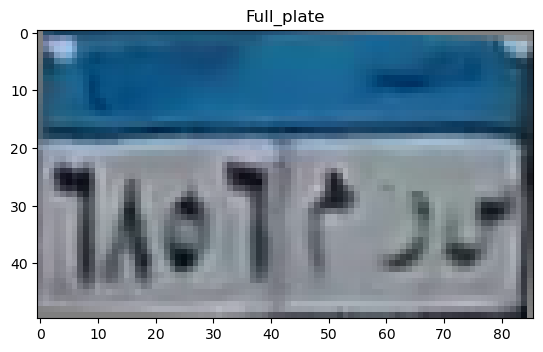

top
[0.47526862 0.60630395 0.65338004 0.60717186 0.59055881 0.65424983
 0.69904268 0.66740099 0.61514985 0.61774696 0.64777523 0.61211637
 0.59154032 0.5875351  0.58289265 0.57643246 0.56750971 0.56490201
 0.56590343 0.56247925 0.56179186 0.56253121 0.56153192 0.56157525
 0.56006054 0.55991439 0.55684331 0.55908451 0.57438074 0.59255686
 0.61796257 0.64968184 0.61970679 0.56717392 0.60278205 0.65065756
 0.68486116 0.70755833 0.67895422 0.64685642 0.64028611 0.58384256
 0.46646165]
[0.48208629 0.62498086 0.62500416 0.48677225 0.41325907 0.48663705
 0.61987304 0.56343941 0.47542127 0.54188078 0.6558267  0.63373952
 0.57689369 0.56187529 0.55630601 0.55478379 0.55373897 0.55740956
 0.5601282  0.55201581 0.54999157 0.55384962 0.55501384 0.55194858
 0.54780955 0.55401135 0.56044517 0.56908181 0.58146692 0.59800338
 0.61544064 0.65700549 0.51099164 0.30821613 0.33551392 0.38182673
 0.44176699 0.4770274  0.51047757 0.54220292 0.54650745 0.45122559
 0.39677623]
[0.48955804 0.68134725 0.5422068

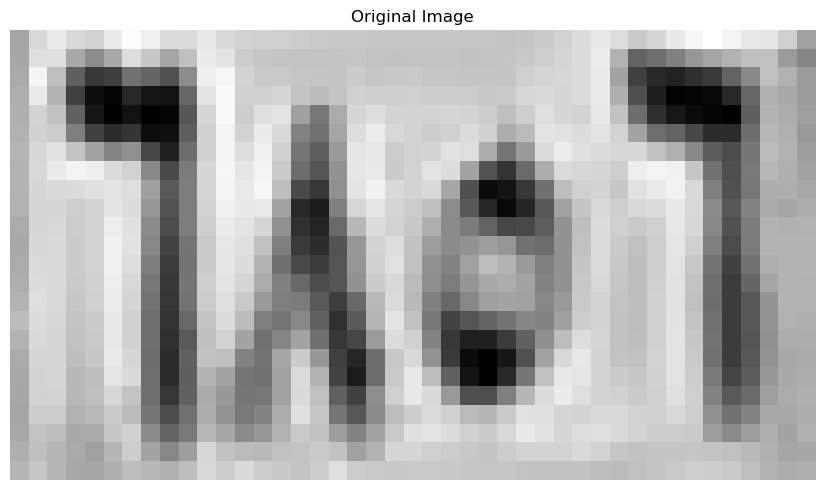

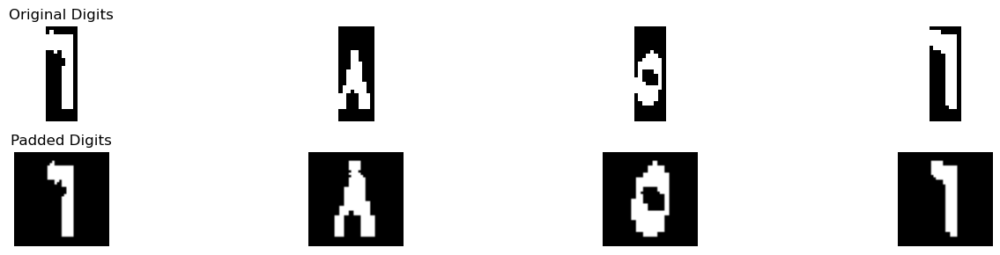

Best match: ٦
Full comparison results: {'١': 3.0511363636363638, '٢': 1.8512529137529135, '٣': 1.6353521671826625, '٤': 0.125, '٥': 2.2028739127229837, '٦': 4.78125, '٧': 0.7705882352941176, '٨': 0.6041666666666666, '٩': 1.1509552538964303}
Confidence :  0.8650568181818181
Best match: ٨
Full comparison results: {'١': 2.639705882352941, '٢': 1.5330882352941178, '٣': 0.9690402476780187, '٤': 1.715073529411765, '٥': 1.7531650818222024, '٦': 0.9459558823529413, '٧': 0.9106617647058824, '٨': 6.357066993464052, '٩': 3.4479166666666665}
Confidence :  1.4545751633986927
Best match: ٥
Full comparison results: {'١': 0.4375, '٢': 1.6875, '٣': 1.3031153250773992, '٤': 2.53125, '٥': 5.9166574524546665, '٦': 1.625, '٧': 1.3897058823529411, '٨': 0.6548611111111111, '٩': 0.4895833333333333}
Confidence :  1.6927037262273332
Best match: ٦
Full comparison results: {'١': 3.997159090909091, '٢': 1.7783362470862467, '٣': 1.2603521671826625, '٤': 0.19642857142857142, '٥': 2.0927548651039363, '٦': 4.41875, '٧

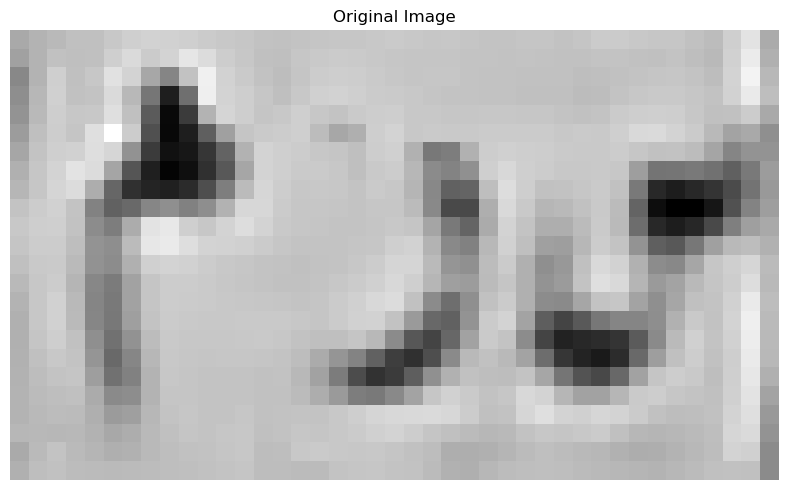

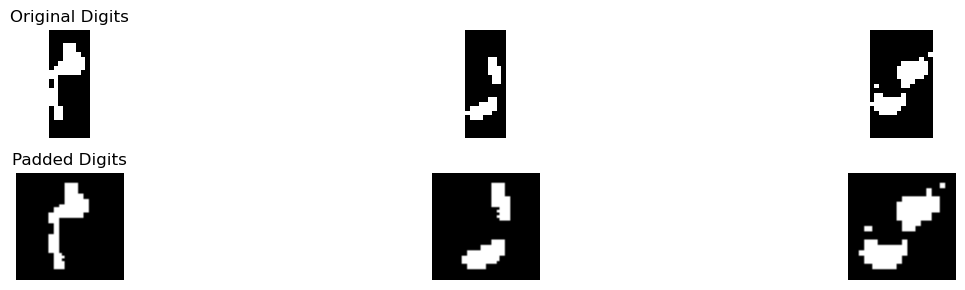

Best match: م
Full comparison results: {'أ': 0.09375, 'ب': 0.0, 'ج': 0.7255219116632159, 'د': 1.9759708149607533, 'ر': 0.27835180623973726, 'س': 1.2544642857142856, 'ص': 0.41755952380952377, 'ط': 0.3407444005270092, 'ع': 1.4236842105263157, 'ف': 0.9207393483709272, 'ق': 0.2378306878306878, 'ك': 0.3409090909090909, 'ل': 0.2864551083591331, 'م': 5.333333333333334, 'ن': 0.7863690476190477, 'ه': 1.8653897849462366, 'و': 1.2127976190476188, 'ي': 0.4279817404817404}
Confidence :  1.6786812591862903
Best match: ر
Full comparison results: {'أ': 0.08680555555555555, 'ب': 0.1939655172413793, 'ج': 1.0276460592028613, 'د': 3.6503016160253, 'ر': 3.7130264133806117, 'س': 1.5669642857142856, 'ص': 1.0333333333333332, 'ط': 2.008020421607378, 'ع': 1.0606439261235527, 'ف': 2.1220297046379386, 'ق': 2.631132488789022, 'ك': 1.2585227272727273, 'ل': 3.3382748538011695, 'م': 0.23327020202020202, 'ن': 2.8945833333333333, 'ه': 1.5882392473118279, 'و': 3.1118238004013867, 'ي': 2.6646576551467853}
Confidence :  0

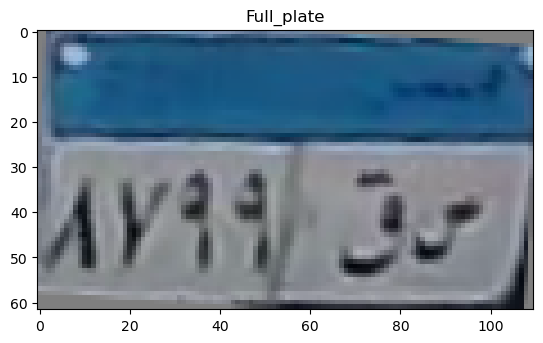

top
[0.47232305 0.4983711  0.50212079 0.53093515 0.61327444 0.64827701
 0.62605547 0.62420393 0.63237465 0.61851757 0.60993797 0.60988081
 0.61411686 0.61601265 0.62260863 0.62372275 0.63055858 0.6371224
 0.64816451 0.6522001  0.64508941 0.64349627 0.63616631 0.62775689
 0.62335098 0.62350418 0.62080161 0.61693338 0.61508146 0.62318163
 0.6242552  0.6258148  0.62558593 0.63361777 0.63907648 0.64266515
 0.64834212 0.65769074 0.67314304 0.68120681 0.67716949 0.64288338
 0.62862885 0.63139233 0.64385403 0.65234055 0.65619319 0.66410011
 0.67263755 0.67754029 0.69521767 0.7178969  0.73856173 0.7096434
 0.65799306]
[0.46679811 0.49671421 0.4786117  0.52809888 0.62856433 0.63111762
 0.57822773 0.58058044 0.58332725 0.57132209 0.5628621  0.56337725
 0.56017333 0.5559011  0.55849706 0.56645737 0.57657322 0.58118465
 0.57609634 0.57099512 0.58030461 0.5841662  0.58245289 0.57041058
 0.56178436 0.55520576 0.55116368 0.55478844 0.55854418 0.56565202
 0.56469461 0.5654731  0.56004953 0.57051063 0.

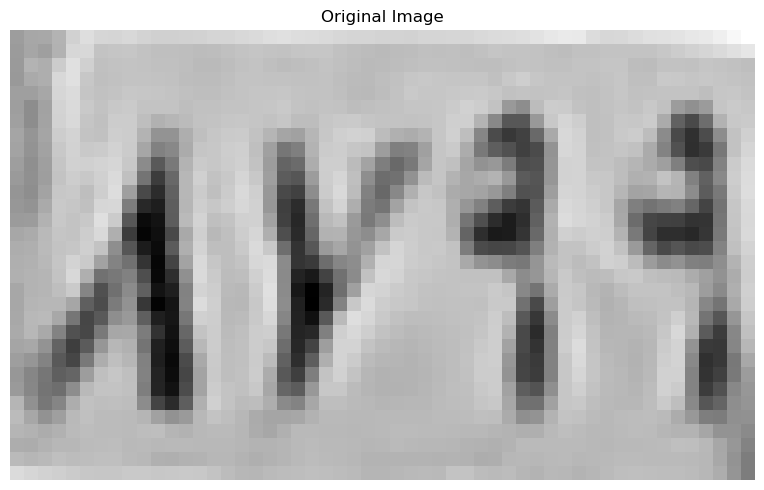

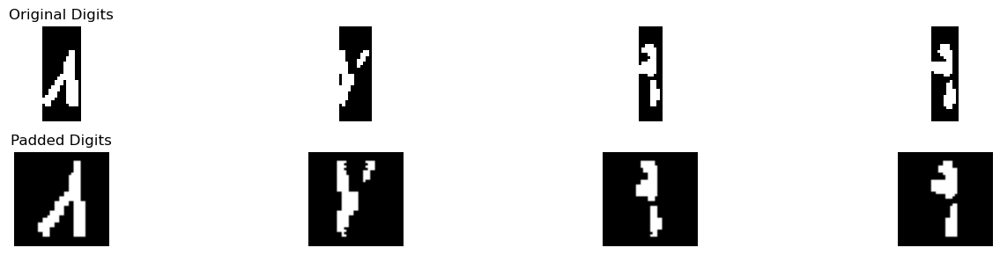

Best match: ٥
Full comparison results: {'١': 0.0, '٢': 0.15000000000000002, '٣': 0.0, '٤': 0.15000000000000002, '٥': 1.223809523809524, '٦': 0.5750000000000001, '٧': 1.1124999999999998, '٨': 0.9875, '٩': 0.35000000000000003}
Confidence :  0.05565476190476204
Best match: ٧
Full comparison results: {'١': 0.0625, '٢': 1.9375, '٣': 2.3077592879256965, '٤': 1.25, '٥': 0.8306059265811587, '٦': 0.1875, '٧': 2.955514705882353, '٨': 0.6430555555555555, '٩': 0.21875}
Confidence :  0.32387770897832824
Best match: ١
Full comparison results: {'١': 3.522727272727273, '٢': 3.22370337995338, '٣': 1.1463815789473684, '٤': 2.087019230769231, '٥': 1.4271800825593395, '٦': 0.7273809523809524, '٧': 0.818014705882353, '٨': 2.30625, '٩': 3.313921122626056}
Confidence :  0.10440307505060842
Best match: ١
Full comparison results: {'١': 3.2642045454545454, '٢': 2.37842365967366, '٣': 0.78125, '٤': 0.718452380952381, '٥': 2.0778739127229837, '٦': 1.8982142857142856, '٧': 0.5955882352941176, '٨': 1.37569444444444

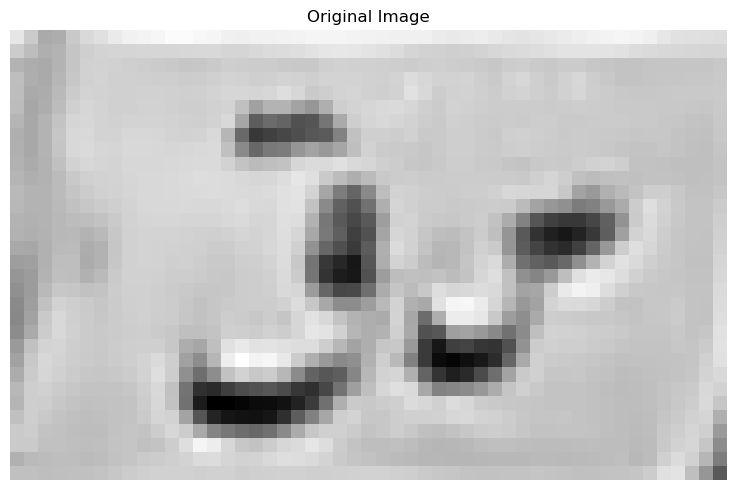

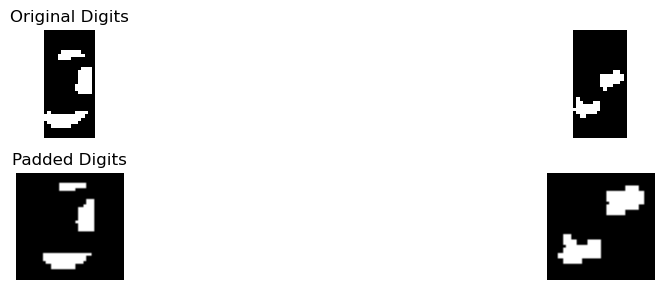

Best match: ق
Full comparison results: {'أ': 0.0625, 'ب': 0.2629310344827586, 'ج': 2.331775997965929, 'د': 4.122585367848526, 'ر': 2.9961616925287053, 'س': 1.5625, 'ص': 1.4678571428571427, 'ط': 2.7225708168642946, 'ع': 1.9622403858265343, 'ف': 3.9925061870626384, 'ق': 5.259421122250069, 'ك': 1.5823863636363635, 'ل': 3.732465675057208, 'م': 0.45319976076555024, 'ن': 3.9394398294122404, 'ه': 1.2736559139784946, 'و': 3.4269283566876654, 'ي': 2.390113976412603}
Confidence :  0.5684178772007717
Best match: س
Full comparison results: {'أ': 0.03125, 'ب': 0.59375, 'ج': 0.40625, 'د': 1.46875, 'ر': 0.4375, 'س': 4.14367816091954, 'ص': 3.258030012771392, 'ط': 0.125, 'ع': 0.25, 'ف': 1.09375, 'ق': 0.626008064516129, 'ك': 0.53125, 'ل': 0.3125, 'م': 0.875, 'ن': 0.75, 'ه': 1.488146551724138, 'و': 0.38469827586206895, 'ي': 0.75}
Confidence :  0.4428240740740741
[['٥', '٧', '١', '١'], ['ق', 'س']]
Tilt angle: -3.00 degrees


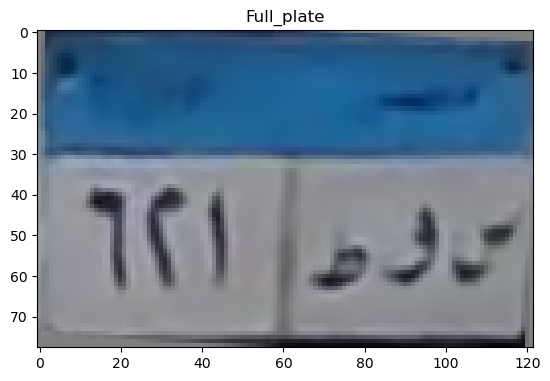

top
[0.5635224  0.54066075 0.53316506 0.57539692 0.59700402 0.60572147
 0.62749017 0.64212271 0.64069945 0.64197473 0.64280317 0.63688036
 0.62182756 0.60951299 0.60909977 0.61660399 0.63107533 0.6296161
 0.62957801 0.63172001 0.63883471 0.64139631 0.63271719 0.62618647
 0.62590236 0.62718422 0.63058074 0.63883815 0.64309046 0.64738984
 0.64864784 0.64485437 0.62860862 0.61243058 0.60914861 0.61154886
 0.61715067 0.62349508 0.62586918 0.62481443 0.62309438 0.62049258
 0.62056824 0.62057028 0.6184422  0.61334017 0.60746315 0.60224646
 0.60063021 0.60059456 0.60100118 0.60350743 0.60540361 0.60656882
 0.61349862 0.62264027 0.63139076 0.6350273  0.63022898 0.62002879
 0.59917238]
[0.56681434 0.53284323 0.54449158 0.59426076 0.59691488 0.59622706
 0.61350434 0.6189098  0.61200643 0.60315951 0.59921064 0.59030939
 0.57685539 0.56288481 0.5556692  0.55719382 0.57233672 0.58085458
 0.58507996 0.58721792 0.59597961 0.60584714 0.60529469 0.59104771
 0.58330538 0.58594812 0.59293578 0.60025739 0

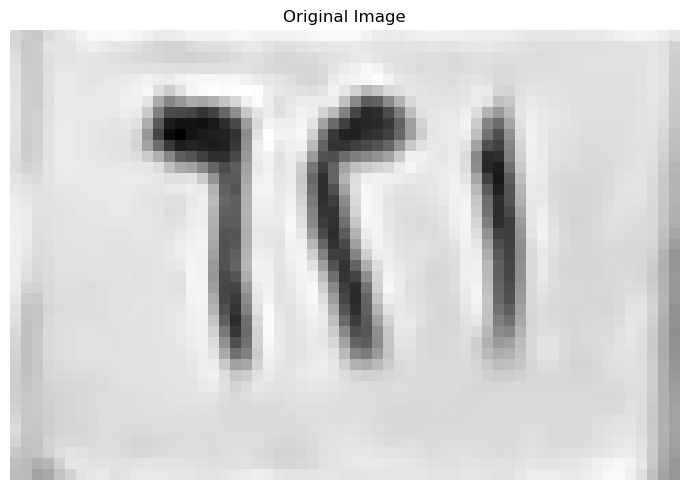

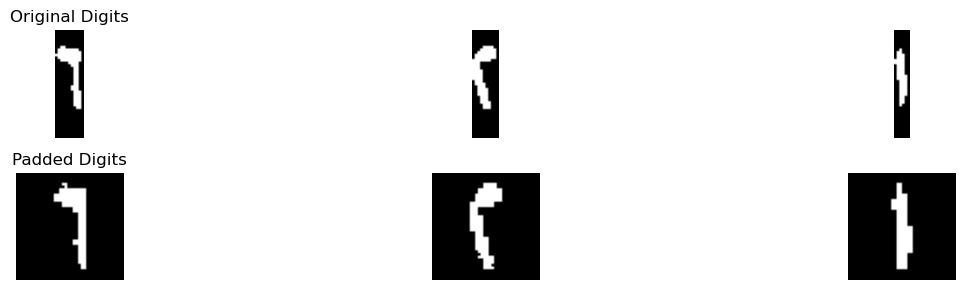

Best match: ٦
Full comparison results: {'١': 1.6041666666666667, '٢': 0.65625, '٣': 1.2020123839009287, '٤': 0.0, '٥': 2.14656586318738, '٦': 5.456547619047619, '٧': 0.11764705882352941, '٨': 0.8034722222222221, '٩': 2.656344268476621}
Confidence :  1.400101675285499
Best match: ٢
Full comparison results: {'١': 0.09375, '٢': 6.392628205128206, '٣': 4.274477554179566, '٤': 2.736538461538462, '٥': 2.6609031770602978, '٦': 0.8086309523809523, '٧': 2.077205882352941, '٨': 0.5625, '٩': 1.0527432126696832}
Confidence :  1.05907532547432
Best match: ١
Full comparison results: {'١': 4.775, '٢': 1.9670017482517483, '٣': 0.8240131578947368, '٤': 1.2603937728937729, '٥': 0.8468229397021967, '٦': 0.24285714285714285, '٧': 1.6841911764705884, '٨': 2.301388888888889, '٩': 0.9909030920060332}
Confidence :  1.2368055555555557
In horizontal_segmentation_1
0 1
7 20
25 38
41 56
58 59
In refine_segmentation_1


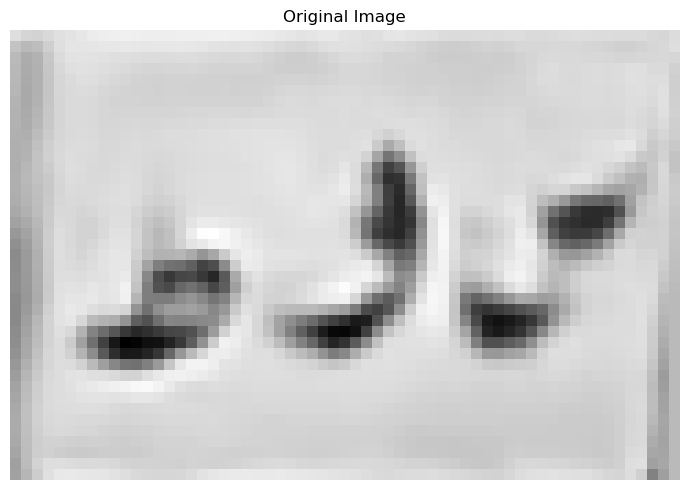

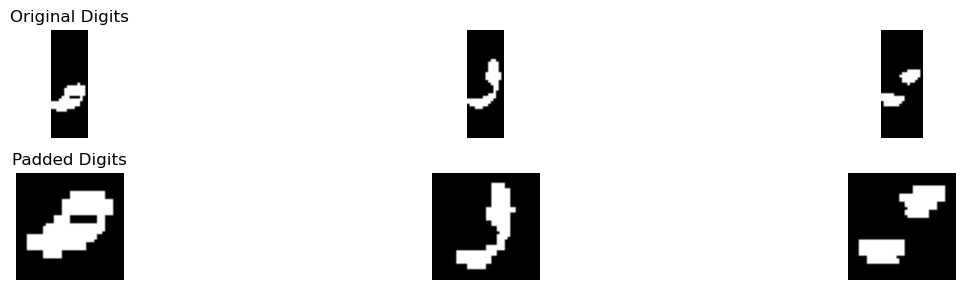

Best match: س
Full comparison results: {'أ': 0.40625, 'ب': 1.259698275862069, 'ج': 0.5, 'د': 0.9375, 'ر': 0.65625, 'س': 2.582327586206896, 'ص': 1.739074074074074, 'ط': 0.3125, 'ع': 0.28125, 'ف': 1.09375, 'ق': 0.4375, 'ك': 0.46875, 'ل': 0.40625, 'م': 0.90625, 'ن': 0.46875, 'ه': 2.490311986863711, 'و': 0.9375, 'ي': 1.21875}
Confidence :  0.04600779967159263
Best match: و
Full comparison results: {'أ': 0.21306818181818182, 'ب': 0.1314655172413793, 'ج': 0.3893097643097643, 'د': 3.567748316498317, 'ر': 3.2849773408750167, 'س': 3.084821428571429, 'ص': 2.2267045454545453, 'ط': 1.8966567852437417, 'ع': 0.7613636363636364, 'ف': 2.707762145262145, 'ق': 2.9531776094276094, 'ك': 1.5549242424242424, 'ل': 2.897727272727273, 'م': 0.3039772727272727, 'ن': 2.3692045454545454, 'ه': 2.219422043010753, 'و': 4.263257575757576, 'ي': 2.952215719063545}
Confidence :  0.34775462962962966
Best match: س
Full comparison results: {'أ': 0.0625, 'ب': 0.59375, 'ج': 0.46875, 'د': 1.90625, 'ر': 0.75, 'س': 5.00545977011

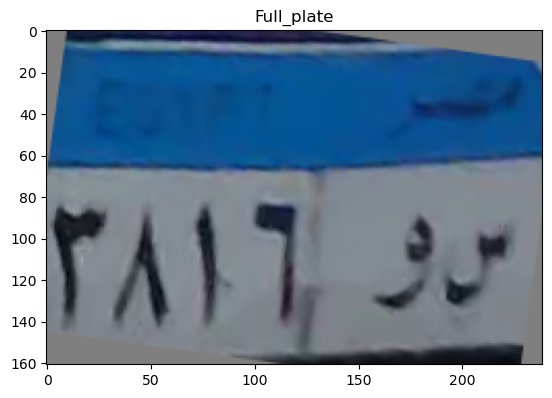

top
[0.46700751 0.34130759 0.36245408 0.37300217 0.37309268 0.3546798
 0.34204752 0.32523035 0.33836927 0.33216474 0.33734862 0.33346104
 0.35426953 0.34917252 0.34704353 0.34363285 0.34292152 0.33608359
 0.31525079 0.29887192 0.29782847 0.29045511 0.28779363 0.28039725
 0.30172872 0.31643087 0.33250232 0.32046515 0.32152892 0.30747953
 0.29215971 0.28786646 0.3037706  0.30272835 0.29988363 0.29501208
 0.30837071 0.30744203 0.31600947 0.31846326 0.33951642 0.33664157
 0.33509552 0.32325161 0.30535522 0.29276146 0.27789956 0.27491654
 0.27781331 0.2830559  0.29091266 0.29302901 0.29095927 0.27733043
 0.26979084 0.2512438  0.25329295 0.25738981 0.25960705 0.25713395
 0.25212769 0.2509986  0.24359312 0.2464758  0.25759888 0.25882569
 0.24732368 0.23656228 0.22407373 0.20737397 0.20760266 0.22396931
 0.24000167 0.25349652 0.25852613 0.25794569 0.24341017 0.21591344
 0.2043972  0.21230675 0.23995726 0.26586059 0.28387766 0.29819615
 0.30322164 0.30856515 0.30656998 0.29872812 0.28705074 0.2

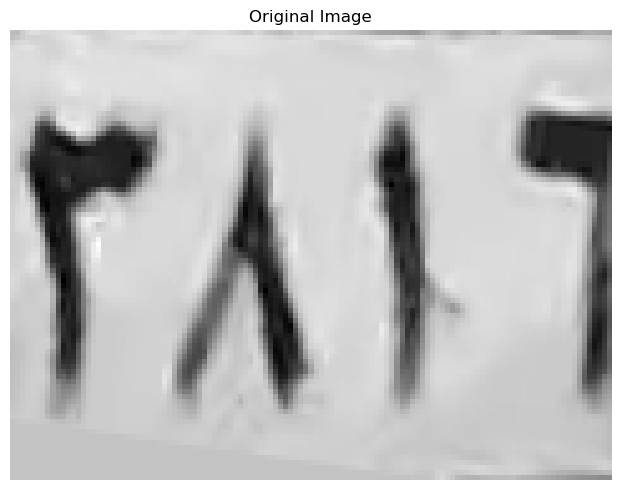

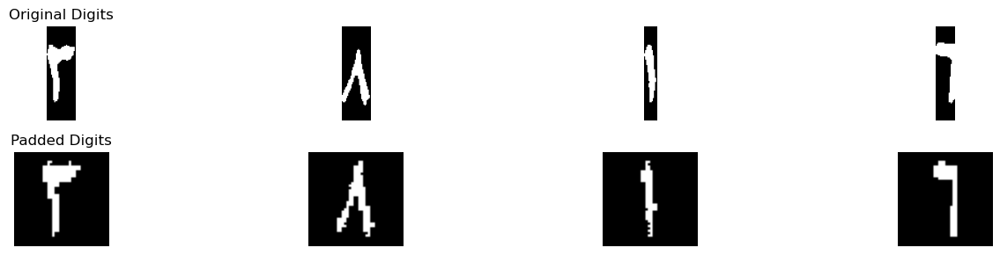

Best match: ٣
Full comparison results: {'١': 0.0625, '٢': 3.34375, '٣': 5.5640479876160995, '٤': 2.25, '٥': 1.7171190844758957, '٦': 1.88125, '٧': 1.4433823529411764, '٨': 0.48611111111111105, '٩': 1.258169934640523}
Confidence :  1.1101489938080498
Best match: ٨
Full comparison results: {'١': 2.28125, '٢': 0.125, '٣': 0.5452786377708978, '٤': 0.875, '٥': 0.6137356258292791, '٦': 0.99375, '٧': 0.8143382352941178, '٨': 4.964583333333334, '٩': 2.4940767973856204}
Confidence :  1.2352532679738566
Best match: ١
Full comparison results: {'١': 3.803571428571429, '٢': 1.7366695804195804, '٣': 1.4490131578947367, '٤': 1.3541437728937729, '٥': 0.6351172047766475, '٦': 0.3047619047619048, '٧': 0.5275735294117647, '٨': 1.0416666666666665, '٩': 0.6497611865258924}
Confidence :  1.0334509240759242
Best match: ٦
Full comparison results: {'١': 3.24375, '٢': 1.1822552447552448, '٣': 0.6843072755417956, '٤': 0.03125, '٥': 1.7020814904909334, '٦': 4.920238095238095, '٧': 0.2389705882352941, '٨': 0.50416

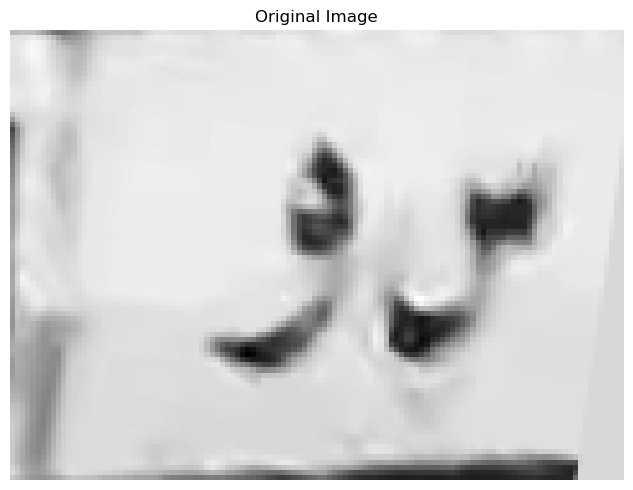

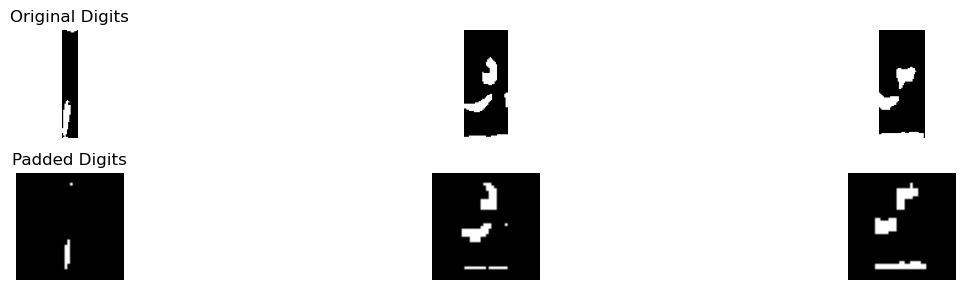

Best match: ر
Full comparison results: {'أ': 0.0, 'ب': 0.09698275862068965, 'ج': 0.0625, 'د': 0.27394669085071566, 'ر': 0.31569911472835016, 'س': 0.2544642857142857, 'ص': 0.0625, 'ط': 0.09090909090909091, 'ع': 0.10263157894736842, 'ف': 0.28279030910609854, 'ق': 0.19284321915900862, 'ك': 0.041666666666666664, 'ل': 0.28277863777089784, 'م': 0.0, 'ن': 0.259047619047619, 'ه': 0.0625, 'و': 0.08333333333333333, 'ي': 0.09401709401709402}
Confidence :  0.016454402811125812
Best match: م
Full comparison results: {'أ': 0.2775735294117647, 'ب': 0.9905503978779842, 'ج': 0.3028639595934992, 'د': 0.5940342016657806, 'ر': 0.037037037037037035, 'س': 0.125, 'ص': 0.17678571428571427, 'ط': 0.13078703703703703, 'ع': 0.1488970588235294, 'ف': 0.1909722222222222, 'ق': 0.05, 'ك': 0.33049242424242425, 'ل': 0.0, 'م': 1.5155468345696053, 'ن': 0.0625, 'ه': 0.4153225806451613, 'و': 0.0625, 'ي': 0.09375}
Confidence :  0.26249821834581055
Best match: م
Full comparison results: {'أ': 0.34375, 'ب': 0.9017585224481777,

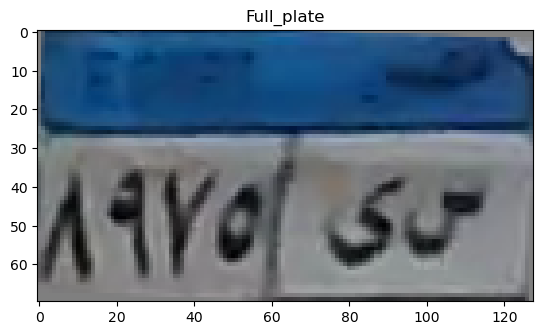

top
[0.53670577 0.52216654 0.47631817 0.51032701 0.54278363 0.5508742
 0.52769684 0.51871404 0.52786282 0.53292103 0.52547618 0.51445442
 0.50997373 0.50684021 0.50679098 0.51247991 0.52064297 0.53735262
 0.54631216 0.55223578 0.54882262 0.55483627 0.55662713 0.55606237
 0.55746392 0.55670669 0.54994047 0.54063955 0.53715689 0.53418036
 0.5298451  0.52731728 0.52774618 0.5265379  0.51965559 0.51575767
 0.52037891 0.53484694 0.55016265 0.55655868 0.55654184 0.55899255
 0.55727686 0.55073423 0.55055593 0.55310658 0.55301587 0.54983725
 0.55277843 0.55660043 0.55792549 0.5624598  0.55648937 0.55038873
 0.54874197 0.55022405 0.5526061  0.55386973 0.55109686 0.54876077
 0.54873013 0.56145991 0.54139941 0.46414619]
[0.54951986 0.54576426 0.50089871 0.52182174 0.53781819 0.53849288
 0.52760382 0.52075343 0.52705858 0.5230791  0.49797485 0.48255252
 0.48320303 0.48655898 0.48757863 0.49173581 0.49280762 0.50177091
 0.51077294 0.51751162 0.5220676  0.52909348 0.53925115 0.54583816
 0.55421745 0

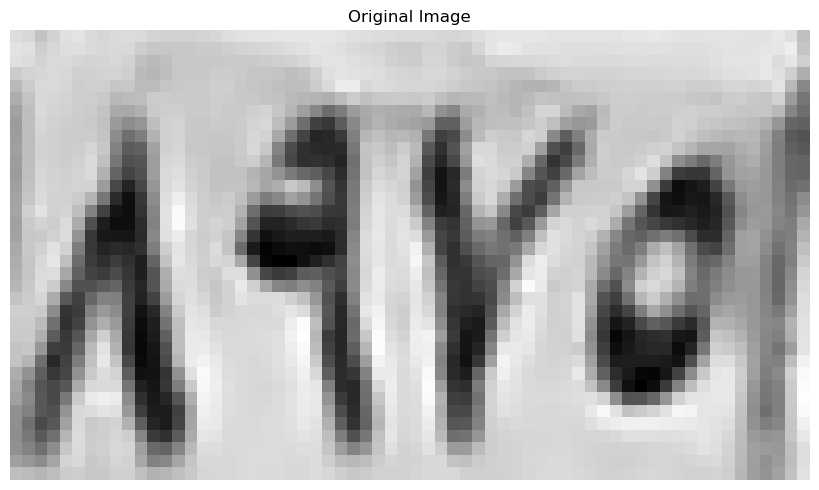

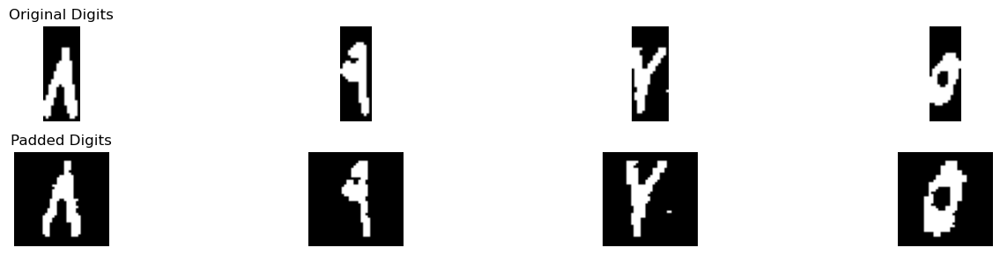

Best match: ٨
Full comparison results: {'١': 1.8125, '٢': 0.5625, '٣': 0.5452786377708978, '٤': 0.53125, '٥': 1.8140940586761019, '٦': 1.2125, '٧': 0.8080882352941177, '٨': 6.072916666666666, '٩': 2.469975490196078}
Confidence :  1.801470588235294
Best match: ٩
Full comparison results: {'١': 2.802083333333334, '٢': 0.6458333333333333, '٣': 0.6739551083591331, '٤': 1.1845009157509159, '٥': 1.1081794559929234, '٦': 2.349702380952381, '٧': 0.6268382352941176, '٨': 2.452777777777778, '٩': 4.205615258924082}
Confidence :  0.7017659627953741
Best match: ٧
Full comparison results: {'١': 0.42105263157894735, '٢': 1.1677631578947367, '٣': 1.7878289473684208, '٤': 1.1414473684210524, '٥': 0.8596491228070176, '٦': 0.513157894736842, '٧': 1.7957236842105262, '٨': 1.438486842105263, '٩': 1.2582236842105263}
Confidence :  0.003947368421052699
Best match: ٥
Full comparison results: {'١': 0.9444444444444444, '٢': 1.246527777777778, '٣': 1.0190058479532165, '٤': 1.767361111111111, '٥': 6.54928989139515

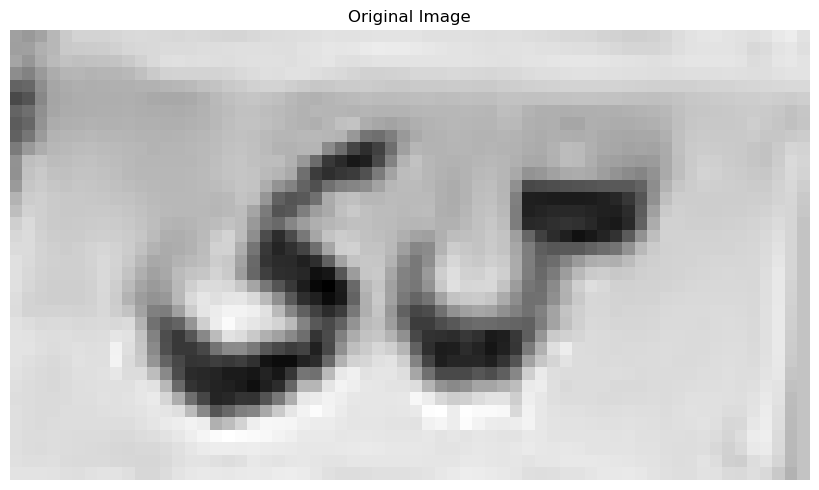

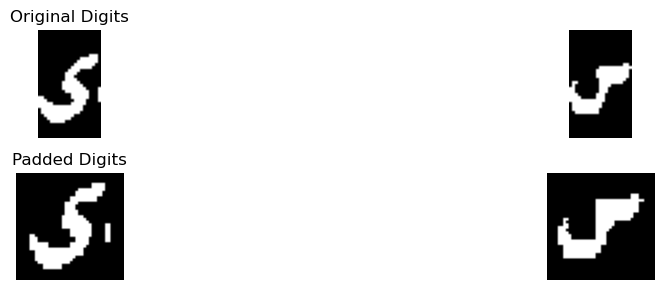

Best match: ص
Full comparison results: {'أ': 0.5, 'ب': 0.25416666666666665, 'ج': 0.8937499999999999, 'د': 2.5770833333333334, 'ر': 1.44375, 'س': 3.3395833333333336, 'ص': 3.4520833333333334, 'ط': 1.6104166666666666, 'ع': 0.4624999999999999, 'ف': 2.3020833333333335, 'ق': 1.4083333333333332, 'ك': 1.4604166666666667, 'ل': 1.3854166666666667, 'م': 0.26041666666666663, 'ن': 1.2270833333333333, 'ه': 2.0625, 'و': 2.152083333333333, 'ي': 2.9416666666666664}
Confidence :  0.05624999999999991
Best match: س
Full comparison results: {'أ': 0.375, 'ب': 0.40625, 'ج': 0.28125, 'د': 1.09375, 'ر': 0.15625, 'س': 4.758477011494253, 'ص': 3.8613425925925924, 'ط': 0.28125, 'ع': 0.21875, 'ف': 0.75, 'ق': 0.4375, 'ك': 0.15625, 'ل': 0.28125, 'م': 1.0, 'ن': 0.6875, 'ه': 2.0526477832512318, 'و': 0.75, 'ي': 0.65625}
Confidence :  0.4485672094508302
[['٨', '٩', '٧', '٥'], ['ص', 'س']]
Tilt angle: 1.50 degrees


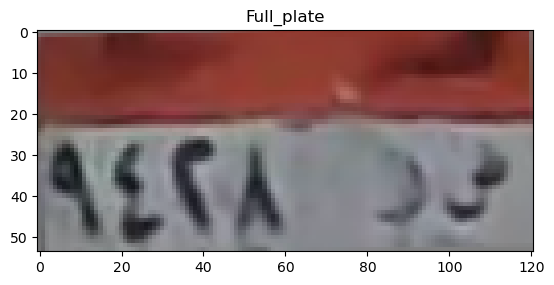

top
[0.28989348 0.35138007 0.42391577 0.43874233 0.41279115 0.40210005
 0.39420833 0.39733681 0.39334729 0.39470617 0.39281427 0.38972589
 0.38601058 0.3797966  0.36565269 0.34849026 0.34885311 0.36036118
 0.3799307  0.39404491 0.40034662 0.41541287 0.42212446 0.44073692
 0.45082648 0.4608494  0.47501822 0.48446828 0.49137443 0.4933487
 0.49393467 0.49617254 0.49345117 0.50582741 0.5104769  0.5080368
 0.50643406 0.50206734 0.50144013 0.51113081 0.52776985 0.53274463
 0.53474427 0.54505609 0.54403713 0.52398206 0.53282567 0.54157867
 0.56798382 0.57945487 0.57714384 0.59388459 0.5929443  0.58298204
 0.60745206 0.61624226 0.61518539 0.58453887 0.53222343 0.48185611]
[0.36076335 0.42956369 0.502984   0.51315612 0.5009125  0.49900769
 0.50554336 0.51461086 0.52213104 0.53442687 0.53925566 0.54640626
 0.55225505 0.55334129 0.55597024 0.55541752 0.57148514 0.58030461
 0.58255681 0.59204945 0.59855038 0.60166667 0.59645982 0.5941472
 0.59507853 0.59975183 0.60694654 0.61361363 0.61668537 0.61

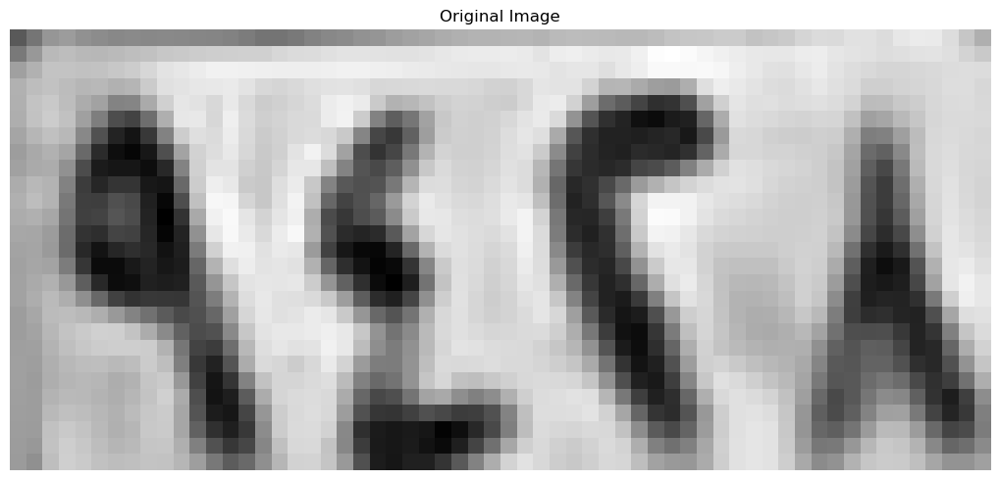

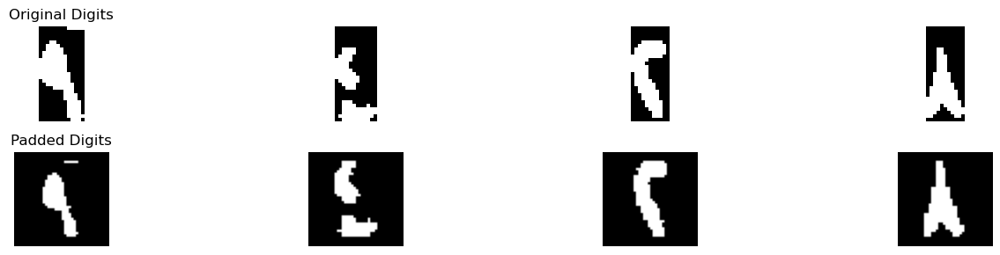

Best match: ٤
Full comparison results: {'١': 2.2062500000000003, '٢': 2.6145833333333335, '٣': 1.6369969040247678, '٤': 2.6625, '٥': 0.5074450832964765, '٦': 0.4145833333333333, '٧': 1.8735294117647059, '٨': 1.9111111111111112, '٩': 2.606576797385621}
Confidence :  0.023958333333333304
Best match: ٤
Full comparison results: {'١': 0.08680555555555555, '٢': 1.5, '٣': 1.2012061403508771, '٤': 4.165882616487456, '٥': 2.396459899749374, '٦': 0.29236111111111107, '٧': 1.1743055555555555, '٨': 0.8368055555555555, '٩': 2.1041666666666665}
Confidence :  0.8847113583690409
Best match: ٢
Full comparison results: {'١': 1.2857142857142856, '٢': 5.263392857142857, '٣': 3.5515673374613, '٤': 3.247916666666667, '٥': 2.183137070617721, '٦': 1.8851190476190476, '٧': 2.603676470588235, '٨': 0.6680555555555555, '٩': 1.820903361344538}
Confidence :  0.8559127598407783
Best match: ٨
Full comparison results: {'١': 2.588235294117647, '٢': 1.823529411764706, '٣': 1.1241292569659445, '٤': 3.0772058823529416, '٥

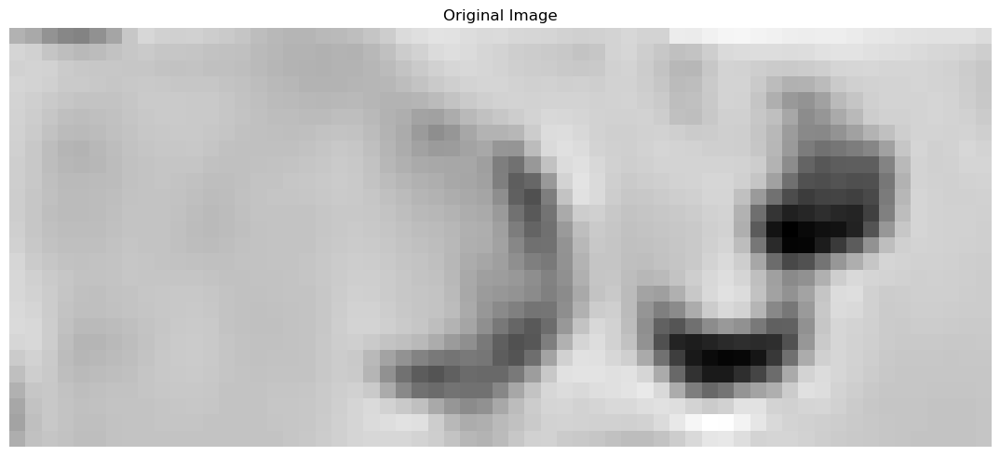

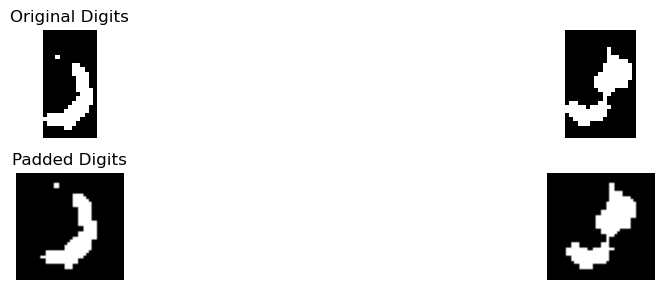

Best match: د
Full comparison results: {'أ': 0.34672619047619047, 'ب': 0.3599137931034483, 'ج': 0.6812169312169312, 'د': 3.8702507215007214, 'ر': 2.1943099878632113, 'س': 2.138392857142857, 'ص': 1.1624999999999999, 'ط': 2.05471837944664, 'ع': 0.8092261904761904, 'ف': 3.162202380952381, 'ق': 2.8768187830687832, 'ك': 0.646780303030303, 'ل': 2.6776113671274966, 'م': 0.23011363636363635, 'ن': 2.6592857142857143, 'ه': 1.8756720430107527, 'و': 2.699239417989418, 'ي': 2.369254658385093}
Confidence :  0.3540241702741702
Best match: س
Full comparison results: {'أ': 0.34615384615384615, 'ب': 0.6308023872679045, 'ج': 1.1298967236467237, 'د': 3.124198717948718, 'ر': 2.1700928381962865, 'س': 4.339285714285714, 'ص': 4.321634615384616, 'ط': 1.5985576923076923, 'ع': 0.75, 'ف': 2.6011904761904763, 'ق': 2.5651709401709404, 'ك': 1.9567307692307694, 'ل': 2.076923076923077, 'م': 0.42307692307692313, 'ن': 1.920673076923077, 'ه': 2.625, 'و': 3.501157407407407, 'ي': 2.9216346153846153}
Confidence :  0.0088255

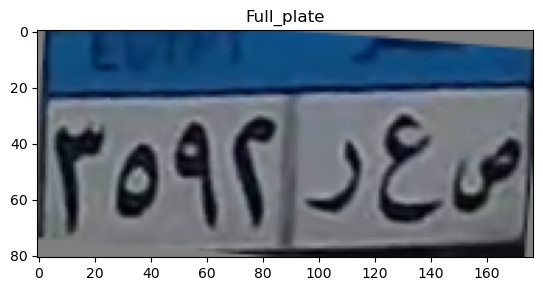

top
[0.39205647 0.19306898 0.14574439 0.33693899 0.52057678 0.55377339
 0.55274904 0.51738324 0.45126024 0.37310608 0.45126076 0.52792236
 0.54633142 0.54544931 0.53528877 0.55988282 0.52290686 0.45307599
 0.38196784 0.41350921 0.50965055 0.55797998 0.43009521 0.36495275
 0.45292762 0.49792039 0.50380998 0.49948141 0.49470765 0.49708313
 0.49966058 0.50656406 0.50936978 0.50585469 0.50452471 0.50743196
 0.50627814 0.50804415 0.51181855 0.51002627 0.5090229  0.50853271
 0.50782039 0.50612768 0.50940563 0.5155375  0.51066329 0.50620693
 0.49947462 0.46934325 0.50104608 0.55903314 0.54427203 0.40188124
 0.18774943 0.06615712 0.04558983 0.06874903 0.18389446 0.41588307
 0.54781952 0.54186313 0.50255198 0.48765816 0.48919824 0.49544824
 0.50096294 0.50395989 0.50719521 0.50063118 0.50787689 0.53268577
 0.53650701 0.41250571 0.20680202 0.07500553 0.03672192 0.04476377
 0.05296788 0.06924232 0.09104498 0.06554106 0.03106469 0.04876661
 0.13861807 0.34588602 0.51746213 0.49618043]
[0.38384426 

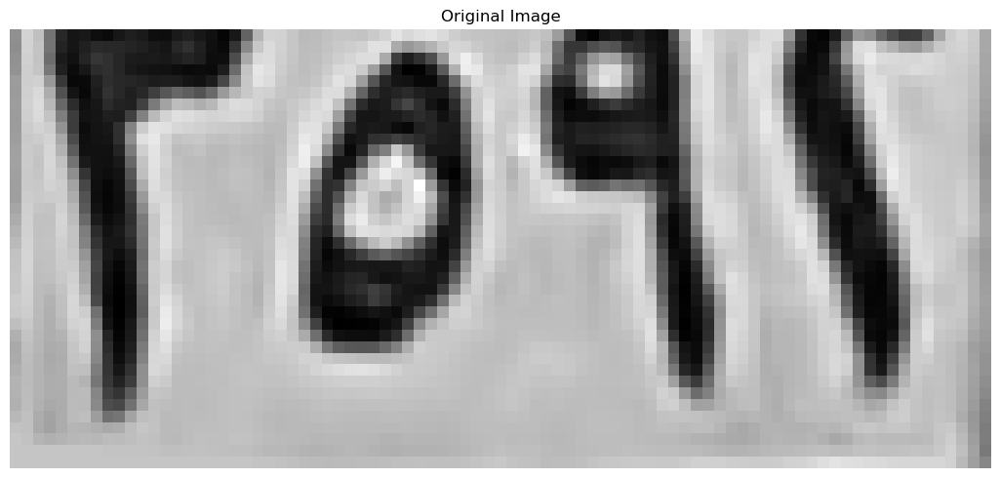

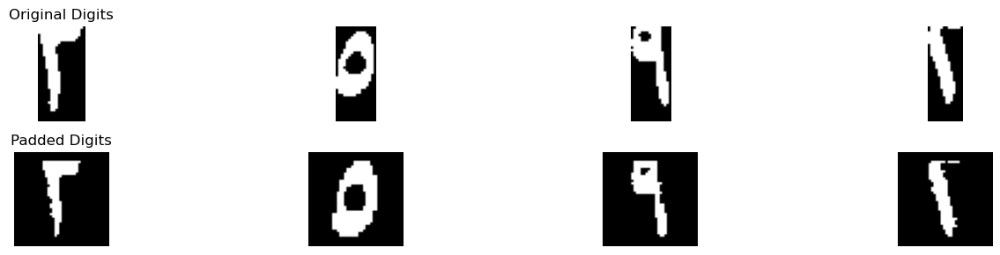

Best match: ٣
Full comparison results: {'١': 0.28125, '٢': 4.03125, '٣': 5.304179566563468, '٤': 2.25, '٥': 1.2316913607548283, '٦': 1.775, '٧': 1.5169117647058823, '٨': 0.2625, '٩': 0.7107843137254902}
Confidence :  0.6364647832817338
Best match: ٥
Full comparison results: {'١': 0.21052631578947367, '٢': 1.8338815789473684, '٣': 1.424342105263158, '٤': 2.5180921052631575, '٥': 7.605889724310777, '٦': 1.738486842105263, '٧': 1.018092105263158, '٨': 0.8016447368421052, '٩': 0.555921052631579}
Confidence :  2.5438988095238098
Best match: ٩
Full comparison results: {'١': 1.8979166666666665, '٢': 1.21875, '٣': 2.4285990712074303, '٤': 0.7604166666666667, '٥': 2.1022362892525432, '٦': 3.2666666666666666, '٧': 1.000735294117647, '٨': 2.7625, '٩': 4.735375816993464}
Confidence :  0.7343545751633989
Best match: ٢
Full comparison results: {'١': 2.2067307692307696, '٢': 4.46875, '٣': 2.859907120743034, '٤': 3.2200091575091574, '٥': 0.8932625681851687, '٦': 0.9708333333333333, '٧': 2.530882352941

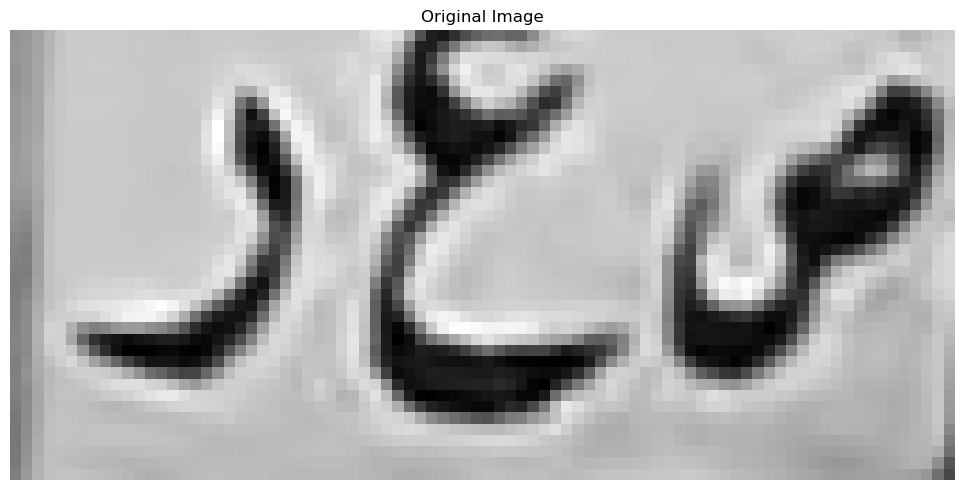

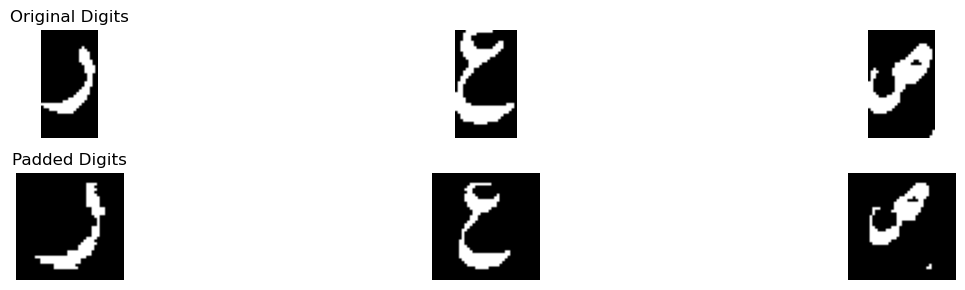

Best match: ر
Full comparison results: {'أ': 0.0, 'ب': 0.2974137931034483, 'ج': 0.5072115384615384, 'د': 2.027510683760684, 'ر': 5.011853448275862, 'س': 1.40625, 'ص': 0.8517628205128205, 'ط': 2.7019230769230766, 'ع': 1.2379807692307692, 'ف': 1.8250407000407, 'ق': 1.9670584045584045, 'ك': 2.668269230769231, 'ل': 3.2908653846153846, 'م': 0.0, 'ن': 2.802884615384615, 'ه': 0.78125, 'و': 3.9002849002849, 'ي': 2.7644230769230766}
Confidence :  0.555784273995481
Best match: ع
Full comparison results: {'أ': 0.0, 'ب': 0.06896551724137931, 'ج': 2.9214101830663615, 'د': 2.778997208931419, 'ر': 1.508584279288927, 'س': 0.6205357142857143, 'ص': 0.22023809523809523, 'ط': 1.5571063899868247, 'ع': 4.060197368421052, 'ف': 0.859840573656363, 'ق': 1.2252332219437483, 'ك': 1.9725378787878787, 'ل': 1.3717105263157894, 'م': 1.4186602870813396, 'ن': 2.3283834586466163, 'ه': 0.5364247311827957, 'و': 1.0363147451963242, 'ي': 1.4368919791116588}
Confidence :  0.5693935926773455
Best match: م
Full comparison resu

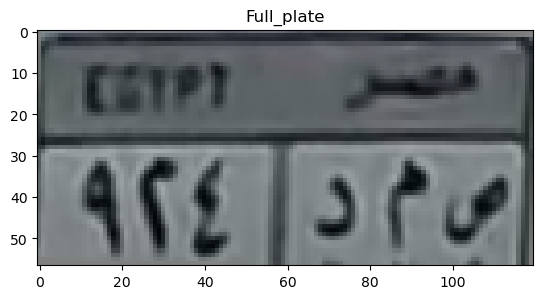

0.0 57.0 7.0 34.0
top
[0.36092395 0.55888657 0.60236849 0.55551647 0.53076157 0.53215556
 0.53400912 0.53618436 0.54016721 0.55176341 0.56985471 0.58518865
 0.60780322 0.5859384  0.49594233 0.50743116 0.52618788 0.58786941
 0.600446   0.54644784 0.50712493 0.51329833 0.5169748  0.52562983
 0.55465863 0.58485164 0.60717088 0.57425115 0.41724594 0.28734743
 0.30861083 0.34816353 0.42160103 0.49788779 0.52867824 0.53486696
 0.54787248 0.55680324 0.52512431 0.54027444 0.59176034 0.60554711
 0.53210961 0.41492211 0.44277137 0.48675402 0.50374493 0.51124349
 0.51711267 0.5200998  0.52578301 0.52028363 0.51904282 0.5208351
 0.54023997 0.55411979 0.51626177]
[0.34820116 0.53281063 0.59835501 0.55968314 0.54483939 0.55161022
 0.54329221 0.53282192 0.52461114 0.52719616 0.55251402 0.58777367
 0.60019325 0.51682162 0.33430783 0.27692425 0.33030967 0.51666843
 0.63887637 0.59523892 0.53675115 0.52829527 0.5161093  0.52618896
 0.59068804 0.61598675 0.55729343 0.47982713 0.24124047 0.07305477
 0.085

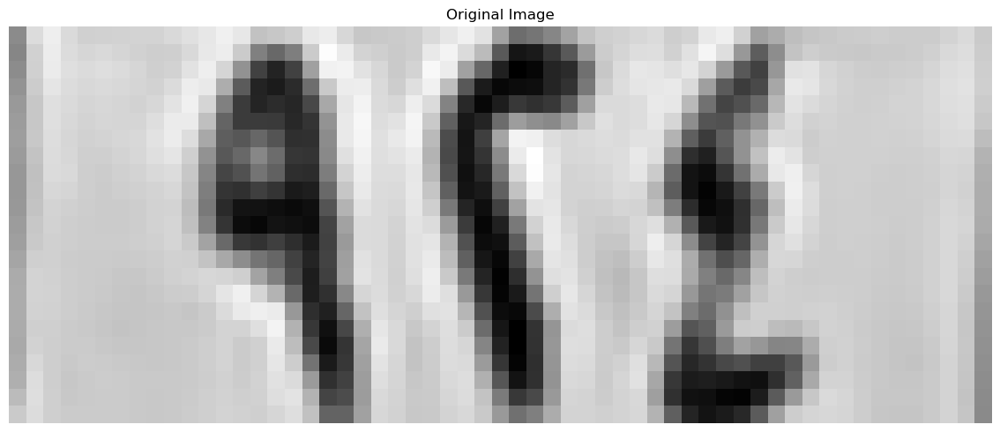

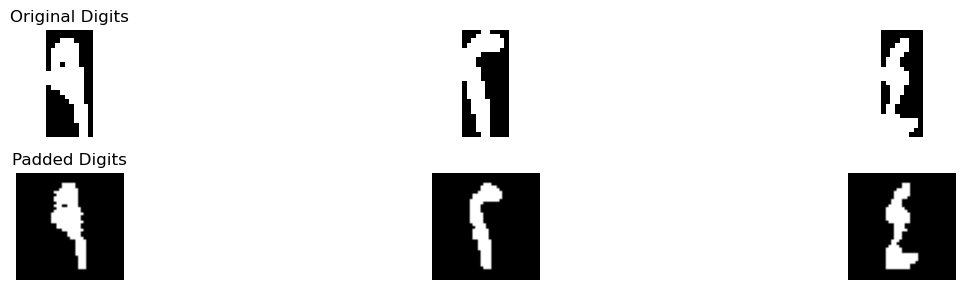

Best match: ٩
Full comparison results: {'١': 3.1947115384615383, '٢': 2.872596153846154, '٣': 1.7833784829721362, '٤': 2.32135989010989, '٥': 2.1716285198289844, '٦': 2.083333333333333, '٧': 1.118014705882353, '٨': 2.888888888888889, '٩': 5.439165409753645}
Confidence :  1.1222269356460535
Best match: ٢
Full comparison results: {'١': 0.28125, '٢': 7.259615384615385, '٣': 4.528154024767802, '٤': 3.2407051282051285, '٥': 2.227623286156568, '٦': 0.6080357142857142, '٧': 2.6183823529411763, '٨': 0.6673611111111111, '٩': 1.0885338109602816}
Confidence :  1.3657306799237916
Best match: ٤
Full comparison results: {'١': 1.5729166666666665, '٢': 1.5448717948717947, '٣': 1.8380417956656347, '٤': 6.149152930402931, '٥': 3.2535659000442285, '٦': 0.21428571428571427, '٧': 0.5363970588235294, '٨': 1.6972222222222222, '٩': 1.1390145801910507}
Confidence :  1.447793515179351
In horizontal_segmentation_1
8 17
25 35
39 54
In refine_segmentation_1


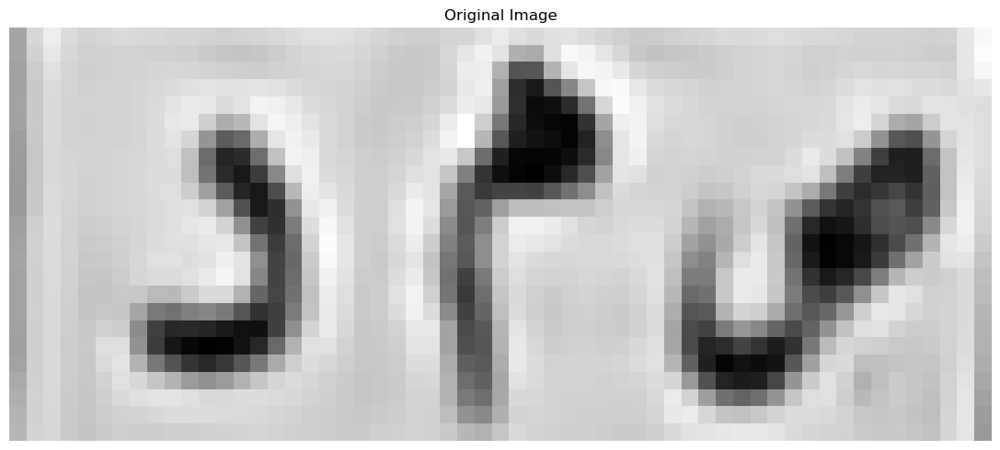

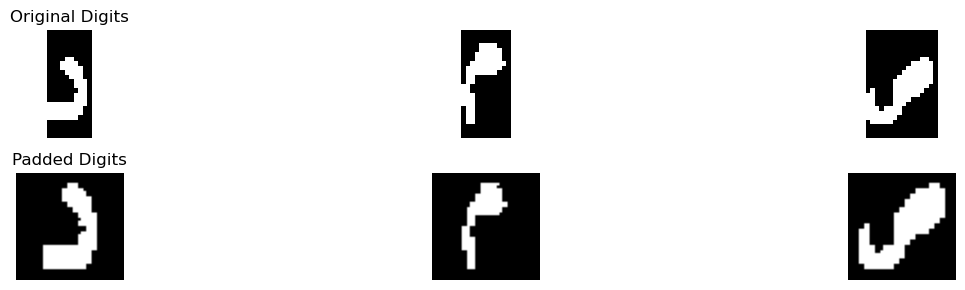

Best match: د
Full comparison results: {'أ': 0.69375, 'ب': 0.0625, 'ج': 2.6184940763745113, 'د': 5.907470538720539, 'ر': 1.9165324480616834, 'س': 1.6339285714285714, 'ص': 1.0041666666666667, 'ط': 2.653903162055336, 'ع': 1.0312500000000002, 'ف': 4.860582010582011, 'ق': 2.7090608465608463, 'ك': 1.9053030303030305, 'ل': 1.96875, 'م': 1.6022727272727273, 'ن': 3.4639285714285712, 'ه': 3.7046370967741935, 'و': 3.231084656084656, 'ي': 1.9985646599777034}
Confidence :  0.5234442640692643
Best match: م
Full comparison results: {'أ': 0.0625, 'ب': 0.06896551724137931, 'ج': 0.9393285091814503, 'د': 1.8376795821997058, 'ر': 0.26050420168067223, 'س': 0.7723214285714286, 'ص': 0.19107142857142856, 'ط': 0.03125, 'ع': 1.194891640866873, 'ف': 0.6911897800055694, 'ق': 0.294000626566416, 'ك': 0.07291666666666666, 'ل': 0.35294117647058826, 'م': 5.004177807486631, 'ن': 0.4325735294117647, 'ه': 1.5206317204301076, 'و': 0.7531512605042017, 'ي': 0.05555555555555555}
Confidence :  1.5832491126434625
Best match: 

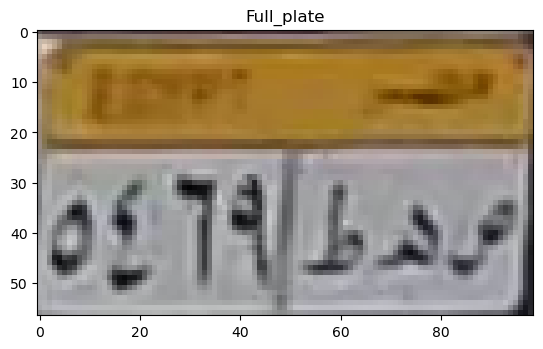

top
[0.53468467 0.51511884 0.5302136  0.54352678 0.56471569 0.56904674
 0.55134877 0.54708048 0.5513427  0.53944336 0.55032501 0.56385566
 0.57260607 0.57636956 0.57386308 0.57496602 0.56422    0.56409745
 0.56409745 0.55426289 0.55417098 0.55336369 0.55333765 0.55354463
 0.56054759 0.58050806 0.57726929 0.59024051 0.59611756 0.60366534
 0.60173555 0.60704346 0.60721196 0.5996792  0.59624252 0.60026673
 0.60087488 0.59714202 0.60095059 0.60373074 0.60346031 0.59528093
 0.59442768 0.59036825 0.58277021 0.5863203  0.59403706 0.60567922
 0.61058118]
[0.55132765 0.54871127 0.63317681 0.66663241 0.70549514 0.73599738
 0.72128654 0.70788041 0.69584941 0.70408398 0.70424287 0.70238112
 0.70619081 0.70946276 0.71193973 0.71581534 0.71448164 0.71439355
 0.71546203 0.71652569 0.71652569 0.71592022 0.71685044 0.71985674
 0.72206127 0.72524889 0.72398357 0.72295169 0.72054723 0.71837529
 0.71674563 0.70968403 0.70886597 0.70416084 0.70348605 0.70251642
 0.70486002 0.70643356 0.70913829 0.70922705 

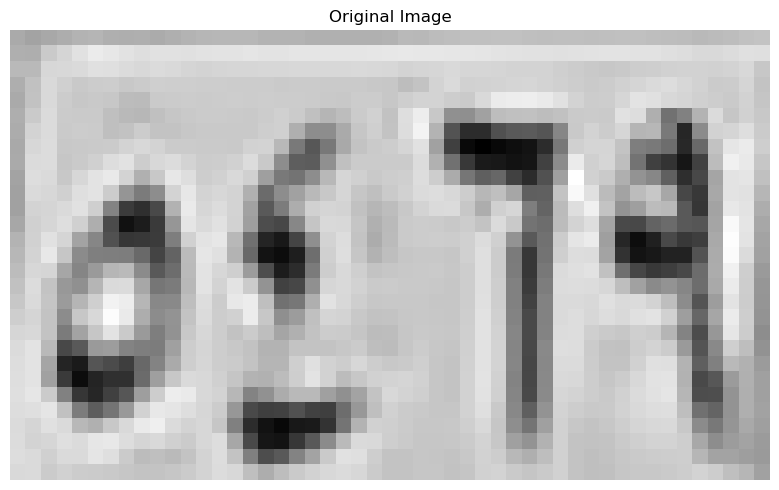

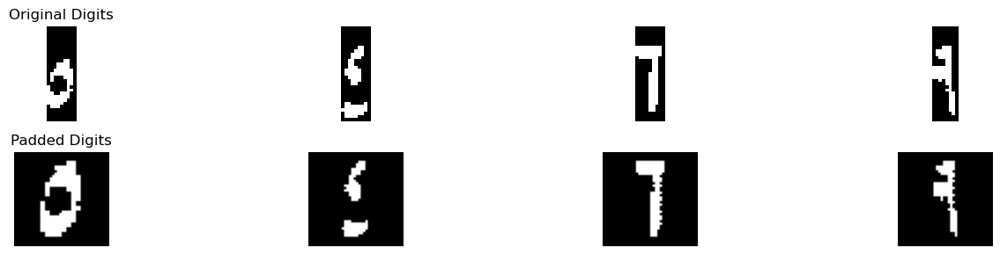

Best match: ٥
Full comparison results: {'١': 0.9411764705882353, '٢': 1.5312500000000002, '٣': 1.0273800309597525, '٤': 2.7573529411764706, '٥': 7.252271303258145, '٦': 1.6500000000000001, '٧': 0.8459558823529413, '٨': 1.2443218954248367, '٩': 0.6799428104575163}
Confidence :  2.2474591810408375
Best match: ٤
Full comparison results: {'١': 2.3892045454545454, '٢': 1.1300990675990676, '٣': 1.1291602167182662, '٤': 4.712709736500059, '٥': 2.251128740970072, '٦': 0.14285714285714285, '٧': 0.03125, '٨': 2.0395833333333333, '٩': 1.1866252290825345}
Confidence :  1.161752595522757
Best match: ٦
Full comparison results: {'١': 2.572916666666666, '٢': 2.565705128205128, '٣': 1.0416021671826625, '٤': 0.2630952380952381, '٥': 1.8740048651039363, '٦': 4.5125, '٧': 1.0481617647058825, '٨': 0.2791666666666667, '٩': 1.3104732277526396}
Confidence :  0.969791666666667
Best match: ١
Full comparison results: {'١': 4.3374999999999995, '٢': 2.0254224941724943, '٣': 0.5625, '٤': 1.242239010989011, '٥': 1.2

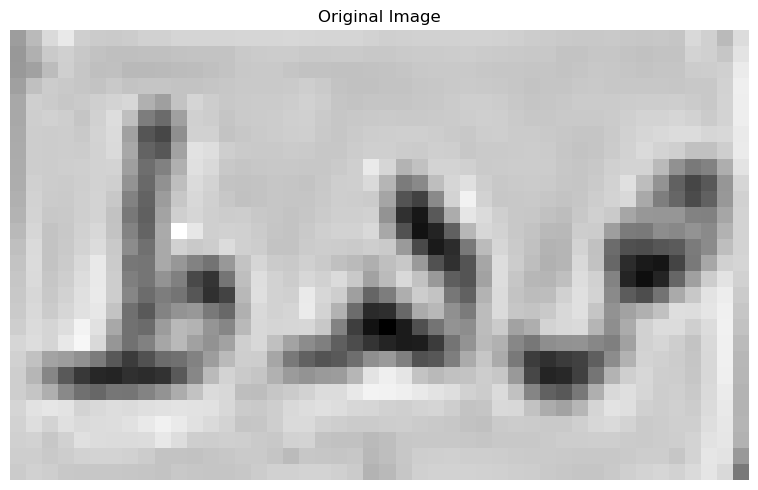

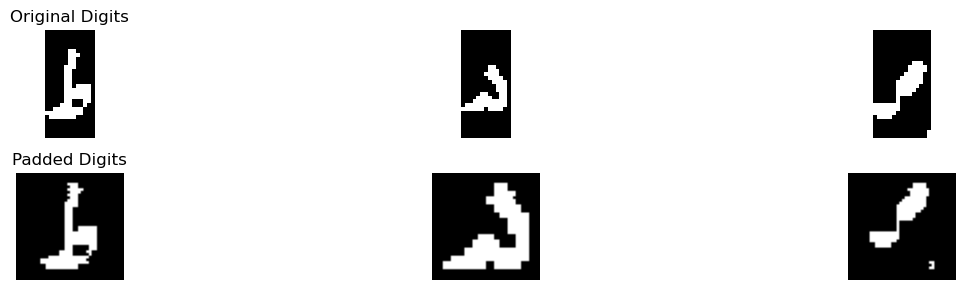

Best match: ط
Full comparison results: {'أ': 1.4464285714285712, 'ب': 0.2508289124668435, 'ج': 1.7555785599263862, 'د': 2.3909343434343437, 'ر': 2.24529860069965, 'س': 0.8973214285714286, 'ص': 1.087202380952381, 'ط': 6.054883069828723, 'ع': 0.8482142857142857, 'ف': 2.611441798941799, 'ق': 2.394510582010582, 'ك': 1.5890151515151514, 'ل': 2.0372023809523805, 'م': 0.2969426406926407, 'ن': 2.1732142857142858, 'ه': 0.8310483870967742, 'و': 2.7280092592592595, 'ي': 2.8923833412963846}
Confidence :  1.581249864266169
Best match: ه
Full comparison results: {'أ': 0.375, 'ب': 0.28125, 'ج': 0.8125, 'د': 3.28125, 'ر': 2.1875, 'س': 2.1875, 'ص': 1.09375, 'ط': 1.90625, 'ع': 0.3125, 'ف': 3.0625, 'ق': 0.9375, 'ك': 1.71875, 'ل': 1.0625, 'م': 0.3125, 'ن': 1.1875, 'ه': 5.21875, 'و': 2.03125, 'ي': 1.59375}
Confidence :  0.96875
Best match: م
Full comparison results: {'أ': 0.03125, 'ب': 0.5093105587404809, 'ج': 0.3194444444444444, 'د': 0.6611574074074075, 'ر': 0.7010488505747127, 'س': 1.1830357142857144, 'ص

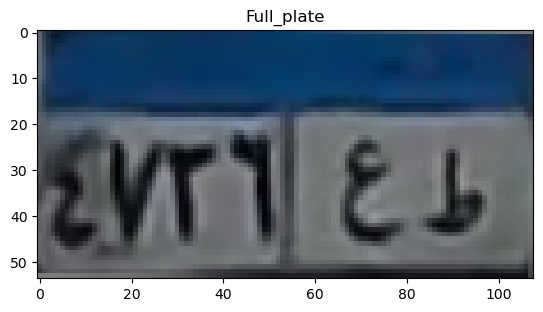

top
[0.34093458 0.34703943 0.35603904 0.35775673 0.35767999 0.35468276
 0.31279196 0.27943624 0.28045708 0.24120322 0.22587306 0.23670366
 0.26426159 0.29574027 0.36249777 0.39812783 0.41675744 0.42858263
 0.46712709 0.48676503 0.48565677 0.47824781 0.46673772 0.46569359
 0.46307017 0.46357426 0.479658   0.48128228 0.49117198 0.48566942
 0.48927068 0.49842404 0.50845206 0.51547182 0.51462857 0.52093028
 0.52380762 0.49631131 0.45885104 0.44966296 0.45763037 0.43157638
 0.35078835 0.1925624  0.14106294 0.2794314  0.36239096 0.33992871
 0.23772889 0.23671213 0.35923277 0.39568645 0.39384929 0.33097875]
[0.33561528 0.33998875 0.34493218 0.34534814 0.33572615 0.31900242
 0.27056905 0.21622098 0.20192629 0.18887789 0.21130436 0.22603285
 0.23766839 0.25135106 0.32099415 0.34473792 0.27610147 0.23222618
 0.37219193 0.48124782 0.492865   0.48901324 0.46833925 0.45304979
 0.41424946 0.34900339 0.34104608 0.36778929 0.41409545 0.4002491
 0.40621308 0.44338855 0.46992444 0.46891198 0.45928551 0.

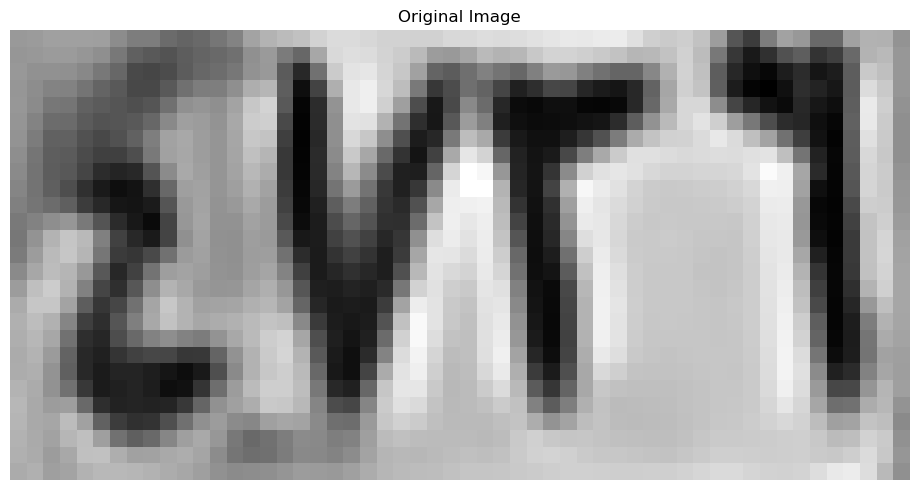

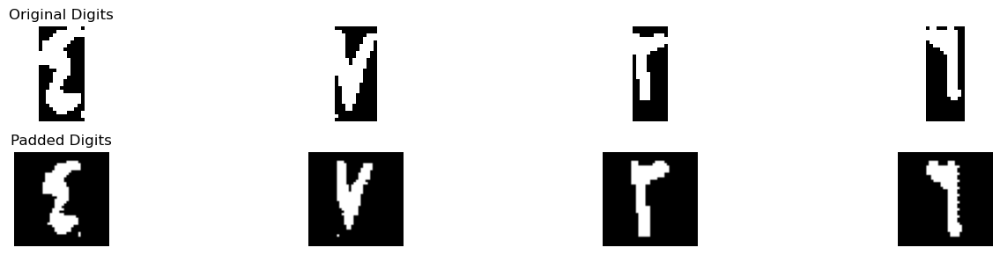

Best match: ٢
Full comparison results: {'١': 1.25, '٢': 3.875, '٣': 3.280185758513932, '٤': 3.34375, '٥': 3.3751981055580127, '٦': 0.975, '٧': 1.3606617647058825, '٨': 1.1902777777777778, '٩': 2.308006535947712}
Confidence :  0.24990094722099365
Best match: ٧
Full comparison results: {'١': 0.8666666666666667, '٢': 1.9958333333333333, '٣': 2.5833010835913313, '٤': 1.5625, '٥': 0.5661165782102314, '٦': 0.4145833333333333, '٧': 2.6613970588235296, '٨': 1.4770833333333333, '٩': 1.8979575163398692}
Confidence :  0.03904798761609918
Best match: ٣
Full comparison results: {'١': 0.0, '٢': 3.1875, '٣': 5.022929566563468, '٤': 1.8125, '٥': 1.921623912722984, '٦': 1.71875, '٧': 1.8522058823529413, '٨': 0.3125, '٩': 0.5927287581699346}
Confidence :  0.9177147832817338
Best match: ٦
Full comparison results: {'١': 3.004166666666667, '٢': 1.1229166666666666, '٣': 2.487422600619195, '٤': 0.12916666666666665, '٥': 2.0499917072091995, '٦': 5.214583333333334, '٧': 0.5441176470588236, '٨': 1.31875, '٩': 2

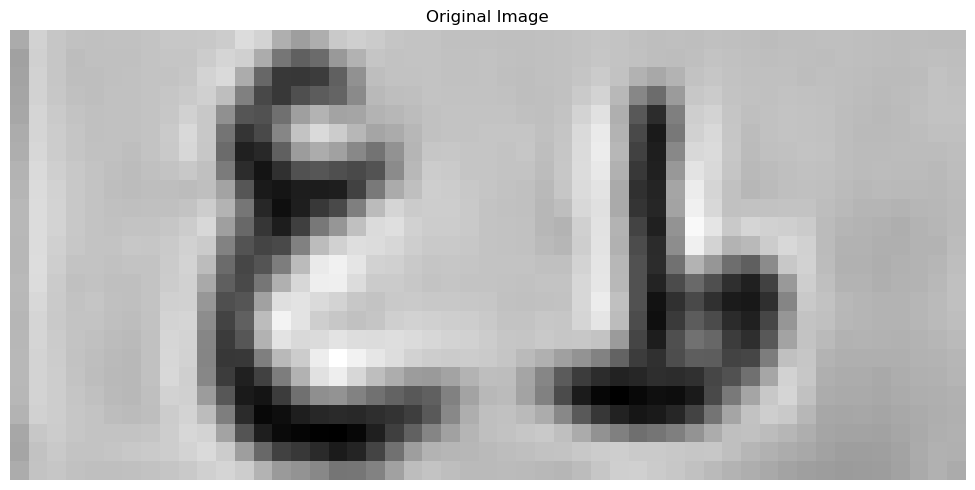

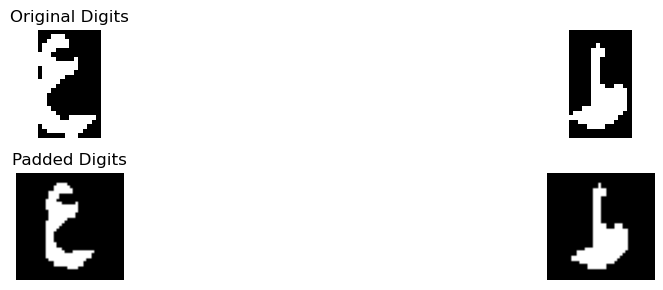

Best match: ع
Full comparison results: {'أ': 0.22916666666666666, 'ب': 0.2669098143236074, 'ج': 2.1251078329882676, 'د': 2.4786020290625554, 'ر': 0.959287856071964, 'س': 0.24107142857142858, 'ص': 0.11011904761904762, 'ط': 1.6969285243741767, 'ع': 4.162865497076024, 'ف': 1.4526507240323028, 'ق': 0.9161758563074353, 'ك': 1.8759469696969697, 'ل': 1.1238669590643275, 'م': 1.505050505050505, 'ن': 2.57406746031746, 'ه': 0.5738575268817204, 'و': 1.1071428571428572, 'ي': 1.193464325529543}
Confidence :  0.794399018379282
Best match: ط
Full comparison results: {'أ': 1.0580357142857144, 'ب': 0.440815649867374, 'ج': 1.5551817345295607, 'د': 3.0359391534391538, 'ر': 2.152199614478475, 'س': 0.9553571428571428, 'ص': 1.0830357142857143, 'ط': 5.6603260869565215, 'ع': 0.8645833333333333, 'ف': 3.4460978835978837, 'ق': 2.0540674603174605, 'ك': 1.3740530303030303, 'ل': 2.005952380952381, 'م': 0.09375, 'ن': 2.606071428571428, 'ه': 1.9161962365591398, 'و': 2.1633597883597884, 'ي': 2.813746217550565}
Confide

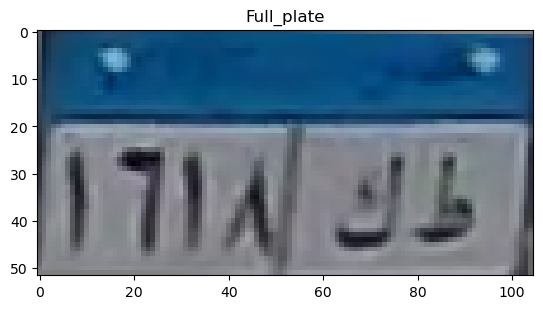

top
[0.19361713 0.28153528 0.3805739  0.52273536 0.59815049 0.55526015
 0.47741331 0.49891879 0.54542661 0.60290975 0.60914061 0.60584132
 0.60797015 0.60207825 0.57144529 0.54321658 0.58853928 0.60627866
 0.59469837 0.5825534  0.56397381 0.55444647 0.56526752 0.5729598
 0.58140172 0.58612107 0.58818963 0.58477625 0.59588944 0.58107044
 0.57735151 0.5712436  0.57637459 0.57444392 0.5711449  0.57071584
 0.5730271  0.57489882 0.57238917 0.57123855 0.57347897 0.57653581
 0.5749874  0.57815115 0.57342235 0.57018364 0.56831977 0.55905565
 0.55449825 0.54682257 0.54683044 0.55045477]
[0.18963938 0.28585087 0.42096801 0.54079828 0.59570716 0.54824147
 0.49610759 0.52371816 0.53693543 0.53017931 0.54690665 0.55699092
 0.54631929 0.53368339 0.52181294 0.52928978 0.56077475 0.55003174
 0.54773466 0.57162841 0.56980527 0.58114105 0.59413891 0.60976091
 0.6191352  0.58573759 0.55015017 0.52662842 0.52627456 0.5372044
 0.55894306 0.55984686 0.54605857 0.53841157 0.53935142 0.53828843
 0.53025545 0.

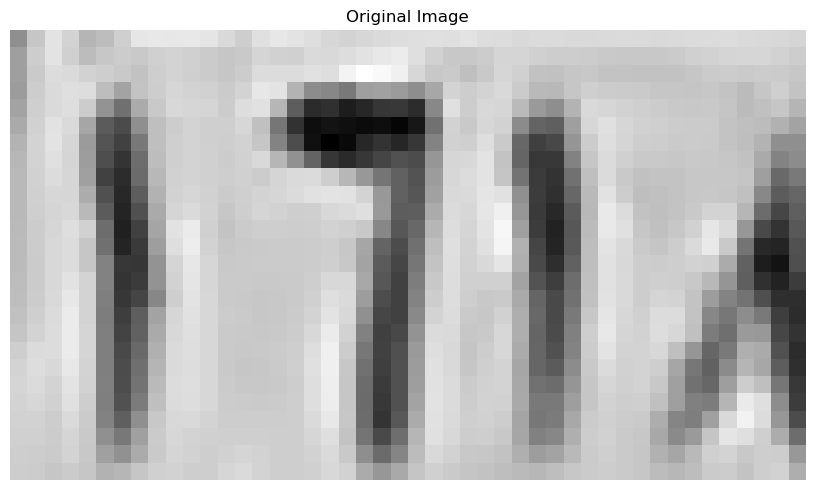

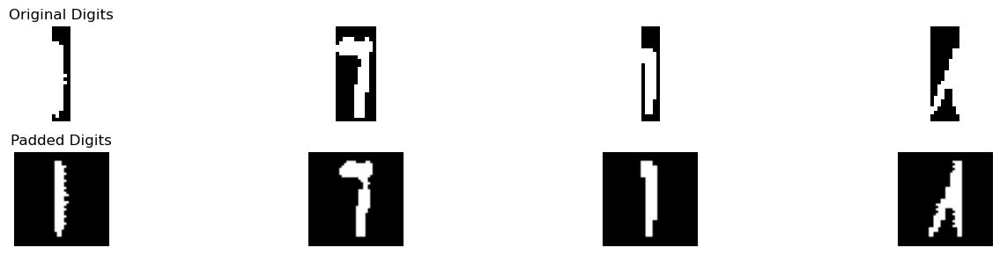

Best match: ١
Full comparison results: {'١': 3.0854166666666667, '٢': 2.4269376456876457, '٣': 1.62296826625387, '٤': 1.9530906593406594, '٥': 0.8780729397021967, '٦': 0.0, '٧': 1.1625, '٨': 1.9409722222222223, '٩': 0.4970619658119658}
Confidence :  0.3292395104895105
Best match: ٦
Full comparison results: {'١': 2.0937500000000004, '٢': 2.147321428571429, '٣': 1.6353521671826625, '٤': 0.3345238095238095, '٥': 2.1697442134748637, '٦': 5.799404761904762, '٧': 1.3897058823529413, '٨': 0.5597222222222222, '٩': 1.6189017273576098}
Confidence :  1.8148302742149494
Best match: ١
Full comparison results: {'١': 4.6223214285714285, '٢': 2.3876748251748254, '٣': 0.9490131578947368, '٤': 1.1443223443223443, '٥': 1.2871470956803774, '٦': 1.1580357142857143, '٧': 1.1363970588235295, '٨': 1.8652777777777776, '٩': 1.8938065610859727}
Confidence :  1.1173233016983015
Best match: ٦
Full comparison results: {'١': 0.7857142857142856, '٢': 0.7142857142857142, '٣': 0.0625, '٤': 0.3839285714285714, '٥': 0.98

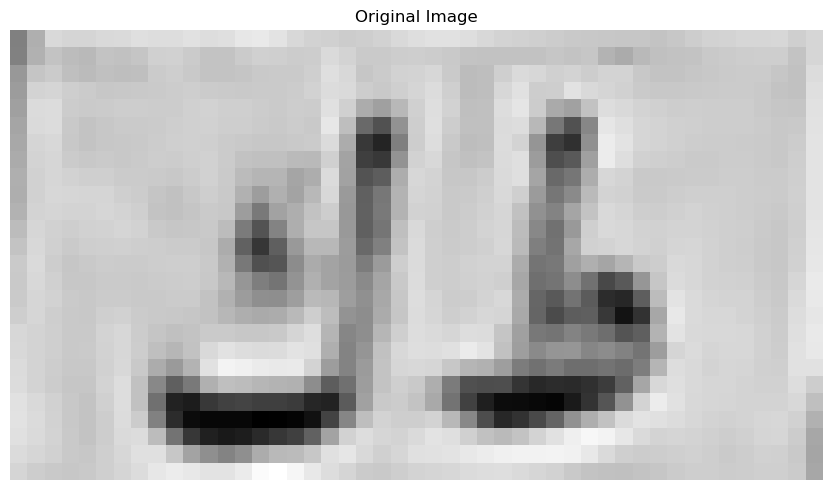

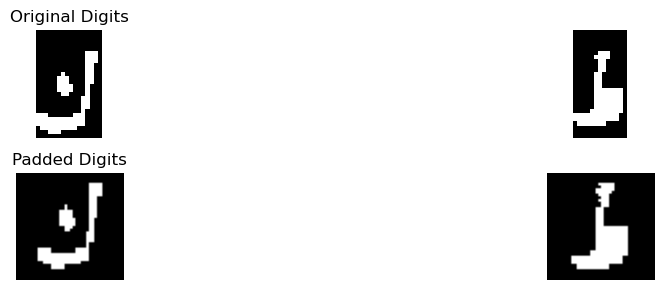

Best match: ك
Full comparison results: {'أ': 0.08333333333333333, 'ب': 0.3951425729442971, 'ج': 0.5428240740740741, 'د': 2.28375, 'ر': 2.786192528735632, 'س': 1.7276785714285714, 'ص': 1.7270833333333333, 'ط': 2.5208333333333335, 'ع': 1.1041666666666667, 'ف': 2.197420634920635, 'ق': 1.5474537037037037, 'ك': 4.395833333333334, 'ل': 2.5833333333333335, 'م': 0.041666666666666664, 'ن': 2.5095833333333335, 'ه': 0.9415322580645161, 'و': 2.4525462962962963, 'ي': 2.495673076923077}
Confidence :  0.804820402298851
Best match: ط
Full comparison results: {'أ': 1.3526785714285712, 'ب': 0.06573275862068965, 'ج': 1.7243285599263862, 'د': 2.7682094757094755, 'ر': 3.0436533518954807, 'س': 1.0223214285714286, 'ص': 1.3223214285714286, 'ط': 5.729372529644269, 'ع': 0.8169642857142857, 'ف': 3.6527777777777777, 'ق': 2.663359788359789, 'ك': 1.7035984848484849, 'ل': 2.0223214285714284, 'م': 0.28125, 'ن': 2.3397023809523807, 'ه': 1.3798387096774194, 'و': 3.016699735449736, 'ي': 3.073175465838509}
Confidence :  

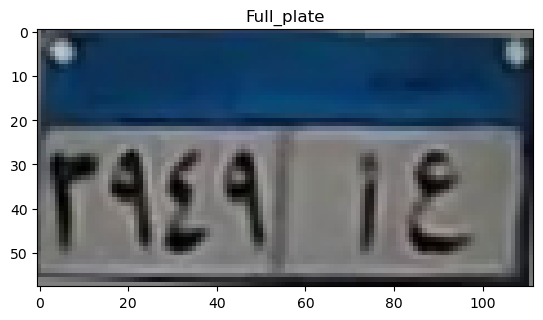

top
[0.29281389 0.37292608 0.48706882 0.51986695 0.51110132 0.52111262
 0.49414588 0.47392673 0.4690213  0.46935705 0.47602846 0.49486915
 0.50602995 0.51372652 0.51176549 0.49714867 0.48406555 0.47838215
 0.48923061 0.50717142 0.51362902 0.51598426 0.52627723 0.52378525
 0.5104375  0.49700695 0.48784897 0.47567765 0.50339331 0.52287475
 0.52371235 0.52854309 0.52851103 0.53272672 0.5310815  0.52782172
 0.51939691 0.50954782 0.50769    0.49395917 0.4917     0.5236087
 0.54684706 0.55269877 0.55619142 0.54133235 0.5207288  0.52693284
 0.53788566 0.53018574 0.52607235 0.53008505 0.52390059 0.46817755
 0.4257327  0.38909206]
[0.29314522 0.38142757 0.48523201 0.49646191 0.49485559 0.50347066
 0.4945352  0.50298942 0.50477853 0.50046634 0.49351168 0.49786051
 0.49756475 0.49724907 0.4958159  0.49115952 0.48969493 0.49609811
 0.55213748 0.58949126 0.53825368 0.49400199 0.5223223  0.56980893
 0.53107012 0.49981559 0.47888592 0.4678845  0.49217259 0.51696114
 0.52575251 0.53358319 0.54609947 0

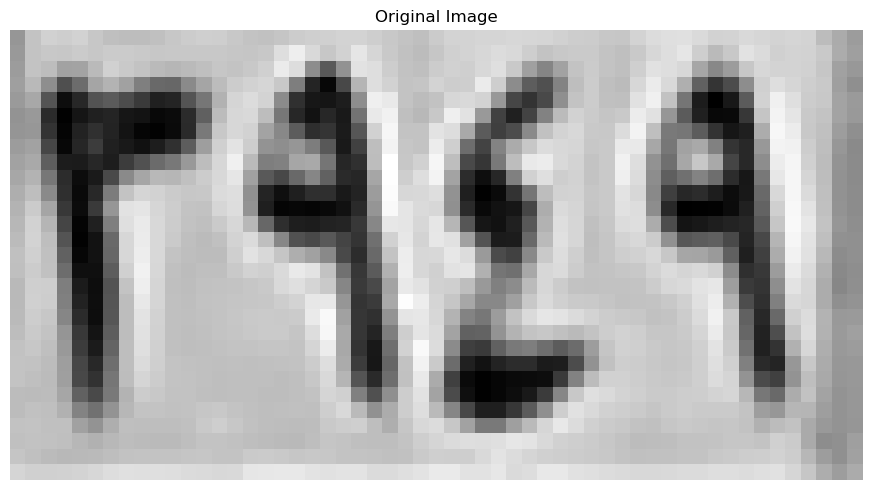

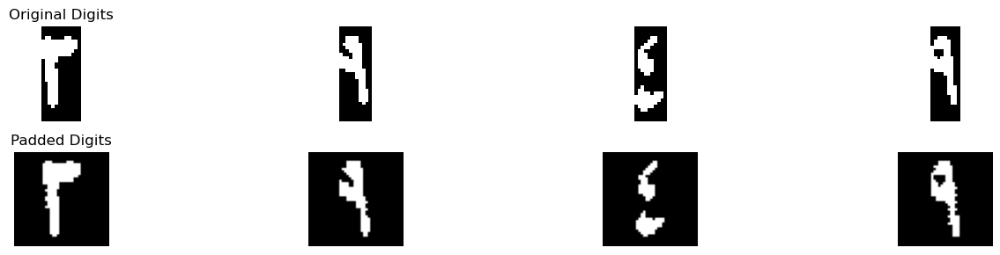

Best match: ٣
Full comparison results: {'١': 0.1875, '٢': 3.125, '٣': 5.019253095975232, '٤': 1.90625, '٥': 2.009025320654578, '٦': 1.9875, '٧': 2.2036764705882352, '٨': 0.6541666666666667, '٩': 1.1303104575163399}
Confidence :  0.9471265479876161
Best match: ٩
Full comparison results: {'١': 3.8653846153846154, '٢': 2.870192307692308, '٣': 1.4281153250773992, '٤': 2.369734432234432, '٥': 1.4206794559929234, '٦': 1.8752976190476192, '٧': 0.8330882352941176, '٨': 2.9194444444444443, '٩': 5.681403971845149}
Confidence :  0.9080096782302667
Best match: ٤
Full comparison results: {'١': 1.1875, '٢': 1.4342948717948718, '٣': 1.1640866873065017, '٤': 4.698855311355311, '٥': 2.425392525431225, '٦': 0.0, '٧': 0.4275735294117647, '٨': 1.4423611111111112, '٩': 0.9573982508636208}
Confidence :  1.136731392962043
Best match: ٩
Full comparison results: {'١': 3.2812500000000004, '٢': 2.9126602564102564, '٣': 1.4281153250773992, '٤': 1.9322344322344323, '٥': 1.624705145215981, '٦': 1.9163690476190478, 

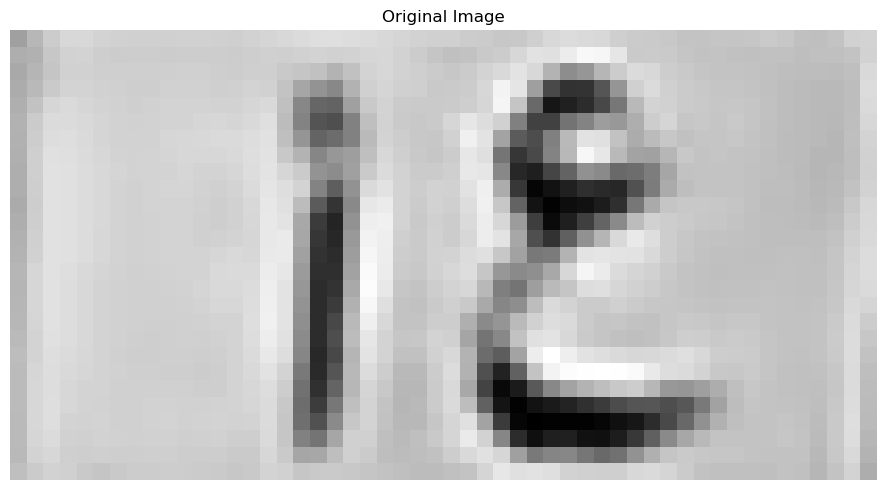

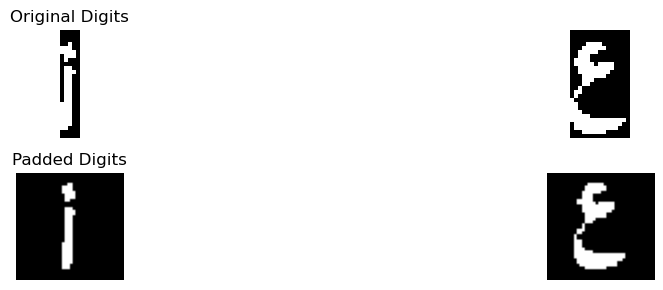

Best match: أ
Full comparison results: {'أ': 3.5238951908306744, 'ب': 0.125, 'ج': 0.562140556705774, 'د': 0.7374543161230467, 'ر': 0.08761904761904762, 'س': 0.1294642857142857, 'ص': 0.3806547619047619, 'ط': 1.737195322793149, 'ع': 0.14638157894736842, 'ف': 0.6571929375409851, 'ق': 0.20287906145291543, 'ك': 0.0, 'ل': 0.0, 'م': 0.23317307692307693, 'ن': 0.7318298771121352, 'ه': 0.3811827956989247, 'و': 0.35773809523809524, 'ي': 0.3851877289377289}
Confidence :  0.8933499340187627
Best match: ع
Full comparison results: {'أ': 0.3256578947368421, 'ب': 0.034482758620689655, 'ج': 3.2212021599893452, 'د': 3.064915824915825, 'ر': 0.8138830584707646, 'س': 0.4910714285714286, 'ص': 0.29910714285714285, 'ط': 2.022686100131752, 'ع': 5.20328947368421, 'ف': 1.5933932052353104, 'ق': 1.168302701197438, 'ك': 1.6903409090909092, 'ل': 1.0657894736842106, 'م': 2.279754784688995, 'ن': 2.74109649122807, 'ه': 0.8551075268817204, 'و': 1.3629124895572264, 'ي': 1.3413604559056505}
Confidence :  0.9910436568474323

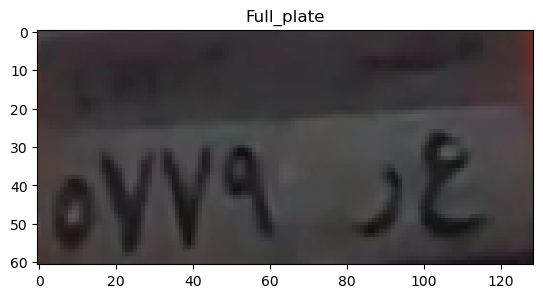

top
[0.24247373 0.24247373 0.24192314 0.24192314 0.23773373 0.2340949
 0.23273373 0.23273373 0.23527137 0.2313498  0.2411651  0.24900824
 0.25685137 0.26077294 0.26469451 0.26105569 0.26217176 0.26609333
 0.26609333 0.26609333 0.26609333 0.2700149  0.26609333 0.27393647
 0.27785804 0.28177961 0.2915949  0.28767333 0.28375176 0.28375176
 0.28375176 0.28375176 0.28375176 0.28375176 0.28767333 0.29943804
 0.30842    0.30925333 0.31205882 0.31205882 0.30813725 0.30421569
 0.30421569 0.30421569 0.31010941 0.31010941 0.31628588 0.32020745
 0.31909137 0.31909137 0.32384627 0.31992471 0.31600314 0.31208157
 0.30618784 0.30618784 0.30618784 0.30702118 0.30421569 0.30421569
 0.30196078 0.29411765 0.28627451 0.29019608]
[0.24948353 0.24948353 0.24948353 0.24976627 0.2464102  0.2464102
 0.24533176 0.24533176 0.25095765 0.25376314 0.25685137 0.26469451
 0.27253765 0.27253765 0.27253765 0.28038078 0.28177961 0.27785804
 0.27785804 0.27785804 0.28570118 0.28570118 0.28962275 0.29746588
 0.30530902 0.

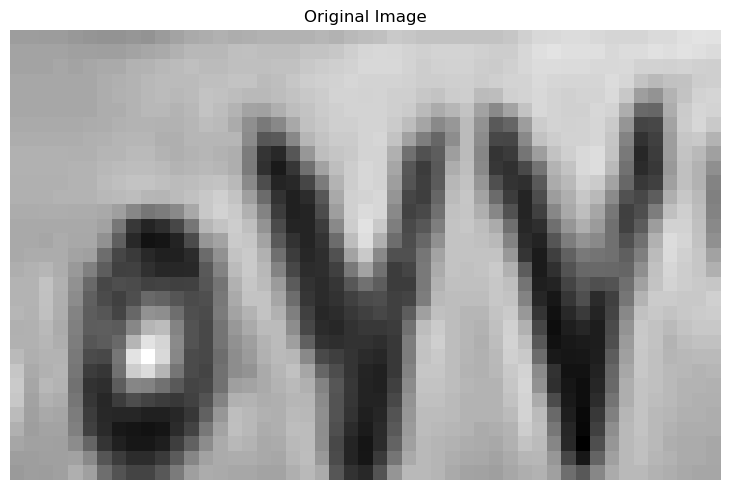

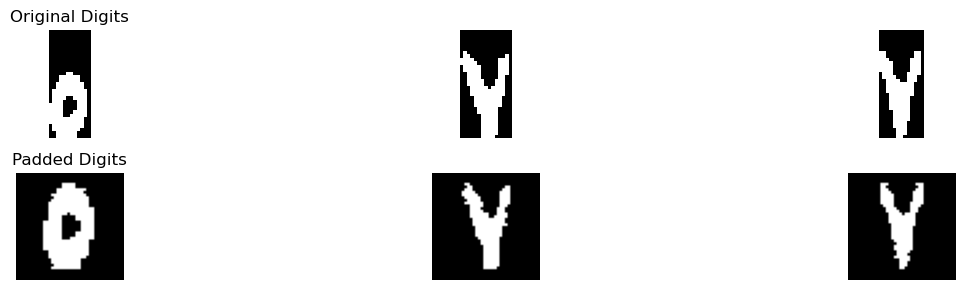

Best match: ٥
Full comparison results: {'١': 0.9473684210526315, '٢': 2.098684210526316, '٣': 1.6134868421052633, '٤': 2.3601973684210527, '٥': 7.4790100250626566, '٦': 1.8134868421052632, '٧': 0.9779605263157894, '٨': 1.044407894736842, '٩': 0.7549342105263157}
Confidence :  2.5594063283208017
Best match: ٧
Full comparison results: {'١': 0.982638888888889, '٢': 2.7152777777777777, '٣': 2.2046783625730995, '٤': 1.4444444444444446, '٥': 1.4088606934001668, '٦': 1.8791666666666667, '٧': 3.345833333333333, '٨': 1.6013888888888888, '٩': 2.048611111111111}
Confidence :  0.31527777777777777
Best match: ٧
Full comparison results: {'١': 0.90625, '٢': 2.71875, '٣': 3.1666989164086687, '٤': 1.75, '٥': 0.5761370337608727, '٦': 1.4375, '٧': 5.045955882352941, '٨': 1.5895833333333331, '٩': 1.8733660130718954}
Confidence :  0.9396284829721362
In horizontal_segmentation_1
18 31
35 44
In refine_segmentation_1


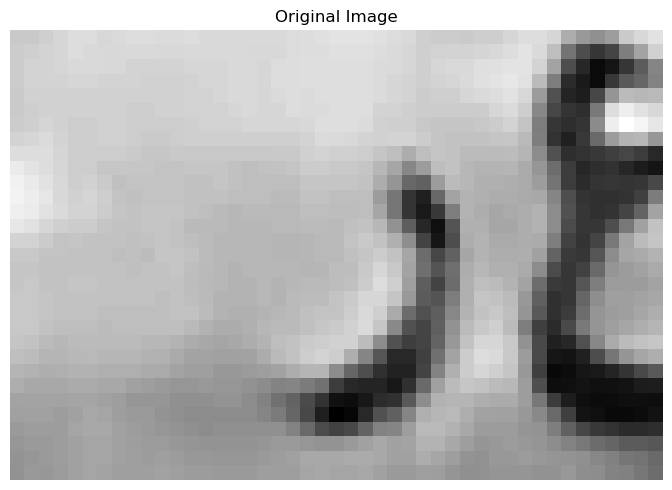

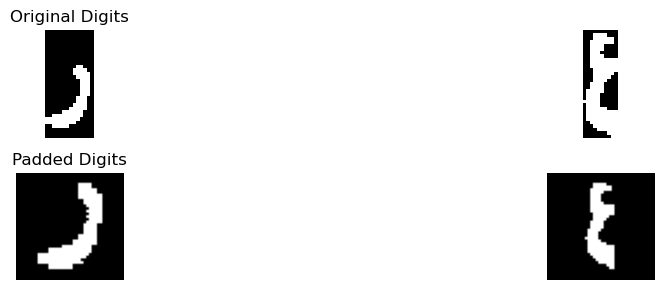

Best match: ر
Full comparison results: {'أ': 0.125, 'ب': 0.5546253315649867, 'ج': 1.048611111111111, 'د': 3.9347685185185184, 'ر': 4.740172413793103, 'س': 2.392857142857143, 'ص': 1.9604166666666667, 'ط': 3.0416666666666665, 'ع': 1.0416666666666665, 'ف': 3.5770502645502646, 'ق': 2.4999999999999996, 'ك': 2.2083333333333335, 'ل': 2.96875, 'م': 0.041666666666666664, 'ن': 3.0737499999999995, 'ه': 1.7570564516129032, 'و': 4.173611111111111, 'ي': 3.225801282051282}
Confidence :  0.2832806513409962
Best match: أ
Full comparison results: {'أ': 1.4042832167832169, 'ب': 0.6322115384615384, 'ج': 0.6767238900391074, 'د': 1.387400214737676, 'ر': 0.420523845220247, 'س': 0.22767857142857142, 'ص': 0.3181547619047619, 'ط': 0.6881175889328063, 'ع': 0.6167763157894737, 'ف': 1.2351103453077137, 'ق': 0.7147921888053467, 'ك': 0.0625, 'ل': 0.1488970588235294, 'م': 1.0032467532467533, 'ن': 0.5538690476190475, 'ه': 1.3997311827956989, 'و': 1.2985119047619047, 'ي': 0.3307615995115995}
Confidence :  0.00227601699

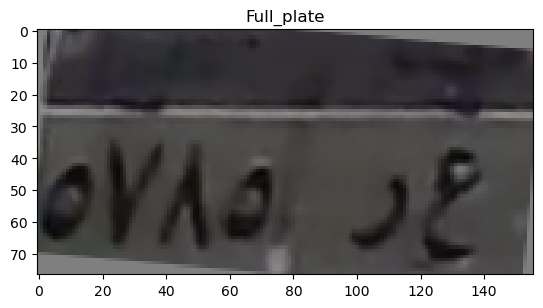

top
[0.50567678 0.36250525 0.27344657 0.27797706 0.3132099  0.33275647
 0.3243752  0.31749647 0.32239843 0.32435922 0.32437689 0.32192826
 0.32069631 0.32043765 0.31560257 0.31411168 0.31452635 0.31174391
 0.30774422 0.29763239 0.29151869 0.28257007 0.28264302 0.28396664
 0.28449513 0.2850849  0.28685975 0.28752589 0.2875524  0.29010025
 0.29362709 0.29533353 0.29541231 0.29525647 0.29746235 0.29912825
 0.29605304 0.29507552 0.2981088  0.30205914 0.30405047 0.30311098
 0.30215714 0.30190547 0.30184592 0.30232843 0.30458793 0.30821078
 0.31057216 0.31136056 0.31149765 0.31168941 0.31205706 0.31063243
 0.30703255 0.30752275 0.3091398  0.30691401 0.30428728 0.30334471
 0.30120035 0.29928176 0.29801828 0.29666406 0.29638256 0.29995546
 0.30334471 0.30328257 0.30333145 0.30334471 0.30251049 0.30064123
 0.29818129 0.29573265 0.29460213 0.29509303 0.29694988 0.29889299]
[0.50635799 0.356508   0.29046174 0.30486125 0.32169259 0.32716517
 0.32078081 0.31777078 0.32321584 0.32435922 0.32222222 0

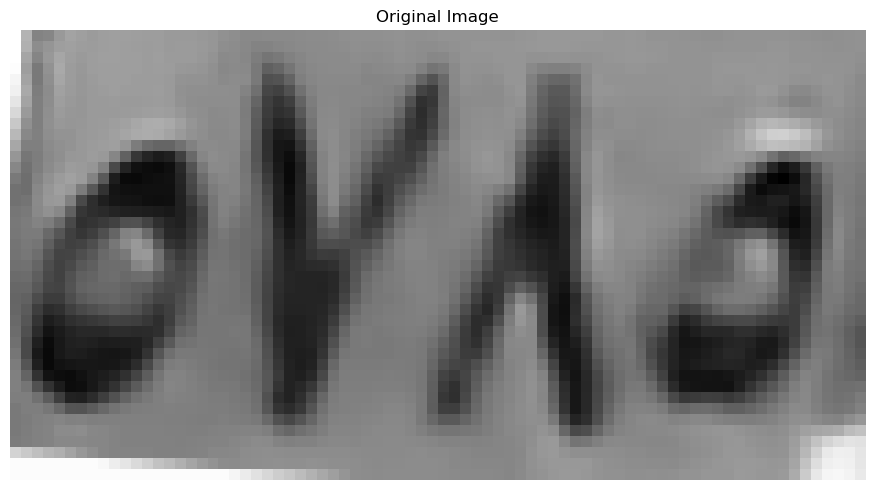

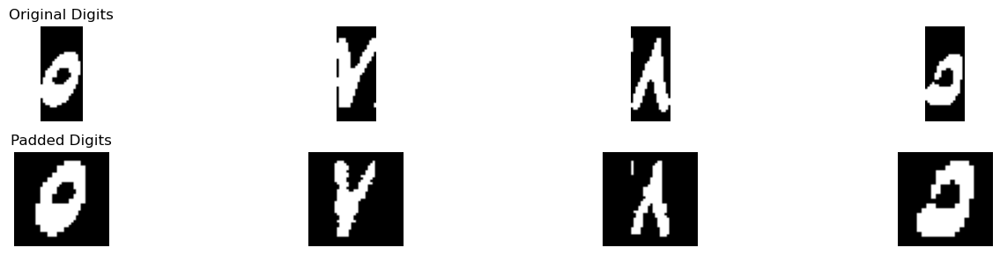

Best match: ٥
Full comparison results: {'١': 0.47619047619047616, '٢': 1.1086309523809523, '٣': 1.4047619047619047, '٤': 1.6279761904761902, '٥': 6.662202380952381, '٦': 1.5014880952380951, '٧': 1.1904761904761905, '٨': 0.8095238095238095, '٩': 0.3958333333333333}
Confidence :  2.517113095238096
Best match: ٧
Full comparison results: {'١': 0.1764705882352941, '٢': 1.0, '٣': 1.6349651702786379, '٤': 0.886029411764706, '٥': 1.1345735662686127, '٦': 0.2077205882352941, '٧': 4.295220588235294, '٨': 1.1924428104575164, '٩': 0.9121732026143792}
Confidence :  1.330127708978328
Best match: ٨
Full comparison results: {'١': 1.40625, '٢': 0.5625, '٣': 0.42395510835913314, '٤': 0.625, '٥': 1.5033171163202124, '٦': 1.45, '٧': 1.1422794117647057, '٨': 4.454861111111111, '٩': 2.046364379084967}
Confidence :  1.2042483660130718
Best match: ٥
Full comparison results: {'١': 0.33333333333333337, '٢': 0.8333333333333333, '٣': 1.125, '٤': 1.2395833333333333, '٥': 5.71875, '٦': 1.2083333333333335, '٧': 0.83

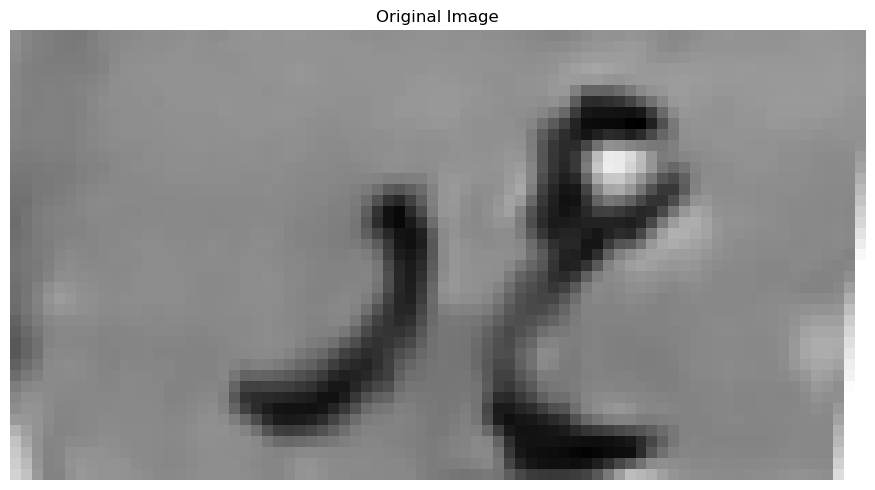

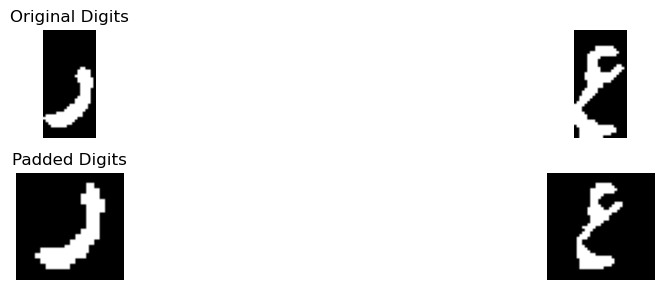

Best match: ر
Full comparison results: {'أ': 0.11538461538461539, 'ب': 0.35344827586206895, 'ج': 0.5846688034188035, 'د': 3.774305555555556, 'ر': 4.345822281167108, 'س': 2.821428571428571, 'ص': 2.1596153846153845, 'ط': 2.84375, 'ع': 0.7259615384615385, 'ف': 3.3266051078551078, 'ق': 2.295405982905983, 'ك': 2.581730769230769, 'ل': 2.6274038461538463, 'م': 0.038461538461538464, 'ن': 2.59375, 'ه': 2.03125, 'و': 3.0584045584045585, 'ي': 3.048397435897436}
Confidence :  0.28575836280577627
Best match: د
Full comparison results: {'أ': 0.4742647058823529, 'ب': 0.0, 'ج': 2.348672258758576, 'د': 2.65348913542025, 'ر': 0.6112500000000001, 'س': 0.6339285714285714, 'ص': 0.6357142857142857, 'ط': 1.490818511198946, 'ع': 2.227109133126935, 'ف': 1.6851242690058477, 'ق': 1.7790169869117238, 'ك': 1.6240530303030305, 'ل': 1.4899380804953561, 'م': 2.342078877005348, 'ن': 2.0305042016806722, 'ه': 0.9570564516129032, 'و': 1.7472864145658265, 'ي': 1.3235878855444072}
Confidence :  0.15240843833083706
[['٥', '

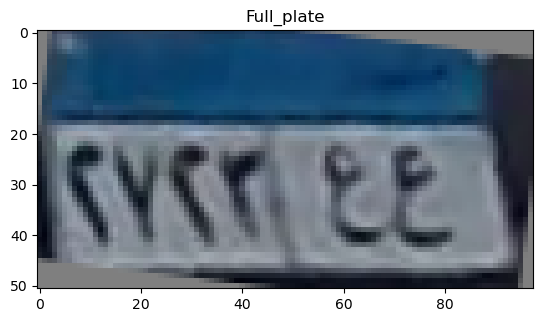

top
[0.15412471 0.30608549 0.34267686 0.4148276  0.60953896 0.57543559
 0.61817108 0.57858067 0.45816297 0.39359325 0.41749681 0.47967529
 0.5374022  0.55985422 0.5506333  0.48675128 0.49380308 0.51427532
 0.5241354  0.52757241 0.51401395 0.50770219 0.49916182 0.50035818
 0.5325609  0.54814695 0.53691414 0.50707066 0.48079015 0.43294654
 0.42797058 0.46775461 0.53734549 0.56770582 0.54683548 0.53667381
 0.53794846 0.52462716 0.53400068 0.57089029 0.56229748 0.53886824
 0.529673   0.51801039 0.46288317 0.44009886 0.48179595 0.54113579
 0.55197844]
[0.14579137 0.29126526 0.35353471 0.39567112 0.55064647 0.55809652
 0.57160662 0.42646713 0.22102787 0.17291639 0.15843349 0.26784836
 0.41348095 0.5236652  0.56083884 0.39535849 0.41847608 0.50514474
 0.55374592 0.53000165 0.51814912 0.47334001 0.44150741 0.45091376
 0.51802379 0.49690279 0.51404428 0.41246932 0.32508625 0.22694487
 0.18857567 0.22092595 0.3515759  0.47522611 0.55016321 0.53068992
 0.50063937 0.48261965 0.52698524 0.55183718 

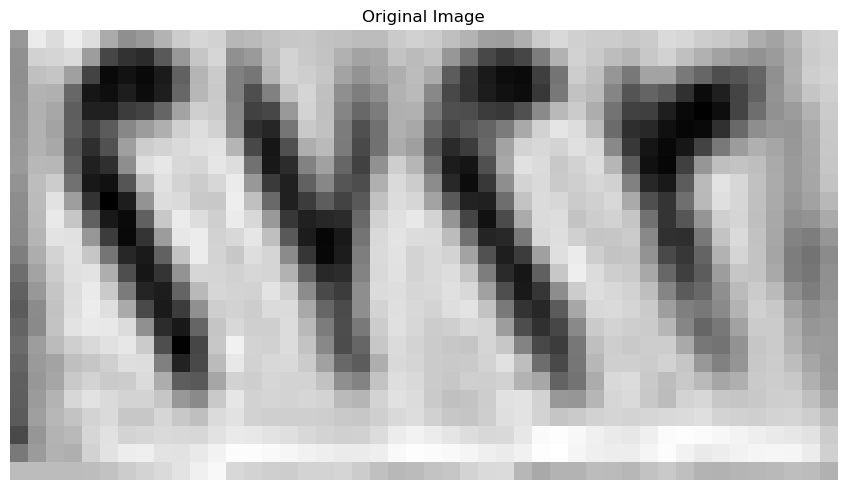

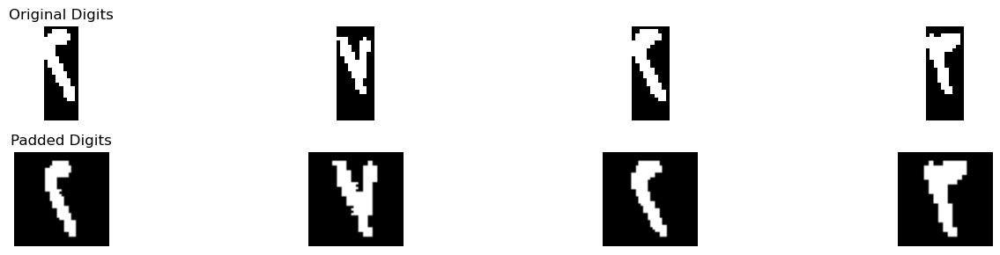

Best match: ٢
Full comparison results: {'١': 1.6466346153846154, '٢': 6.350961538461538, '٣': 3.468846749226006, '٤': 3.3341575091575093, '٥': 2.2242554916703523, '٦': 1.1898809523809524, '٧': 2.2121323529411767, '٨': 0.9666666666666667, '٩': 3.1443721719457014}
Confidence :  1.441057394617766
Best match: ٩
Full comparison results: {'١': 1.575657894736842, '٢': 1.8503289473684208, '٣': 2.0180921052631575, '٤': 1.0526315789473684, '٥': 1.530545112781955, '٦': 1.775, '٧': 2.4450657894736842, '٨': 1.413486842105263, '٩': 2.476973684210526}
Confidence :  0.01595394736842093
Best match: ٢
Full comparison results: {'١': 1.3958333333333333, '٢': 5.449999999999999, '٣': 3.3500386996904026, '٤': 2.8541666666666665, '٥': 2.173268649565089, '٦': 1.3979166666666667, '٧': 2.329779411764706, '٨': 1.0652777777777778, '٩': 2.8650735294117644}
Confidence :  1.0499806501547984
Best match: ٣
Full comparison results: {'١': 1.1180555555555556, '٢': 4.322916666666667, '٣': 5.156980994152047, '٤': 2.50347222

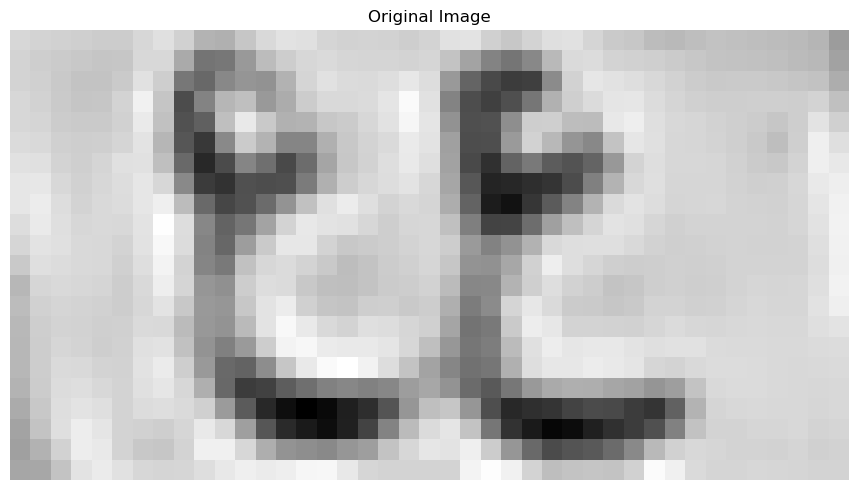

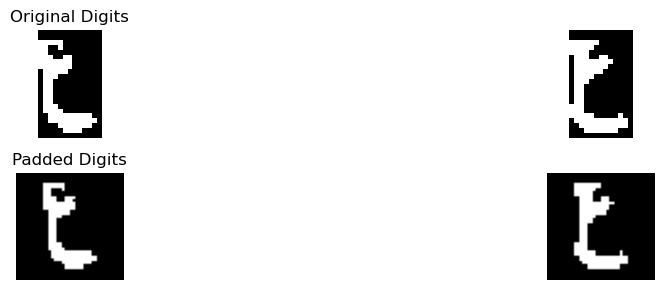

Best match: ع
Full comparison results: {'أ': 0.1, 'ب': 0.5690484084880637, 'ج': 2.0324088451805844, 'د': 1.870273569023569, 'ر': 1.1196449989291066, 'س': 0.39285714285714285, 'ص': 0.03125, 'ط': 1.4168725296442688, 'ع': 3.11875, 'ف': 1.2328042328042328, 'ق': 0.305787037037037, 'ك': 2.081439393939394, 'ل': 0.8, 'م': 1.572159090909091, 'ن': 1.9104761904761907, 'ه': 0.7383064516129032, 'و': 0.5480158730158731, 'ي': 0.5558528428093645}
Confidence :  0.5186553030303029
Best match: ع
Full comparison results: {'أ': 0.05, 'ب': 0.1466346153846154, 'ج': 2.635326086956521, 'د': 2.1549326599326597, 'ر': 0.5463830584707646, 'س': 0.36160714285714285, 'ص': 0.09375, 'ط': 1.0119812252964426, 'ع': 4.3875, 'ف': 0.983829365079365, 'ق': 0.7193121693121693, 'ك': 2.5009469696969697, 'ل': 0.76875, 'م': 2.264772727272727, 'ن': 1.7545833333333332, 'ه': 0.6415322580645162, 'و': 0.7778108465608465, 'ي': 0.8136078595317726}
Confidence :  0.8760869565217395
[['٢', '٩', '٢', '٣'], ['ع', 'ع']]
Tilt angle: -2.50 degree

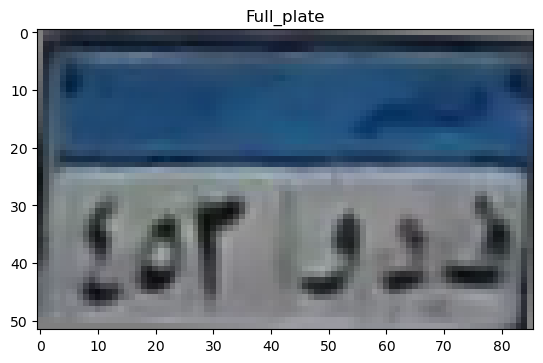

top
[0.15305332 0.27261291 0.38421463 0.28837777 0.182341   0.17061873
 0.17086389 0.17238652 0.16678072 0.16334756 0.16845674 0.1925958
 0.19925668 0.19313621 0.19080238 0.19085562 0.19734866 0.19957416
 0.19125521 0.14931013 0.1111535  0.13210021 0.16203498 0.13109838
 0.12166378 0.12396745 0.1329663  0.15916188 0.1694768  0.17866996
 0.19142863 0.19674436 0.20122833 0.20457699 0.20659215 0.20349653
 0.19584825 0.19182981 0.18780049 0.17719581 0.1715184  0.17105702
 0.17100426]
[0.13424994 0.27673555 0.37863386 0.30923407 0.29759178 0.29311058
 0.27857864 0.27473377 0.27868938 0.28585161 0.29607065 0.26524497
 0.24229955 0.23897248 0.24426687 0.24464377 0.24235666 0.22454718
 0.2137411  0.20170023 0.23997717 0.26217354 0.26718372 0.26696251
 0.26828568 0.26623213 0.27861947 0.2935514  0.30195267 0.30550775
 0.31304228 0.32705951 0.31524132 0.31168784 0.32228877 0.31681983
 0.3164461  0.29884468 0.29106925 0.25250281 0.23424917 0.23909332
 0.2463881 ]
[0.09975899 0.28629552 0.40045126

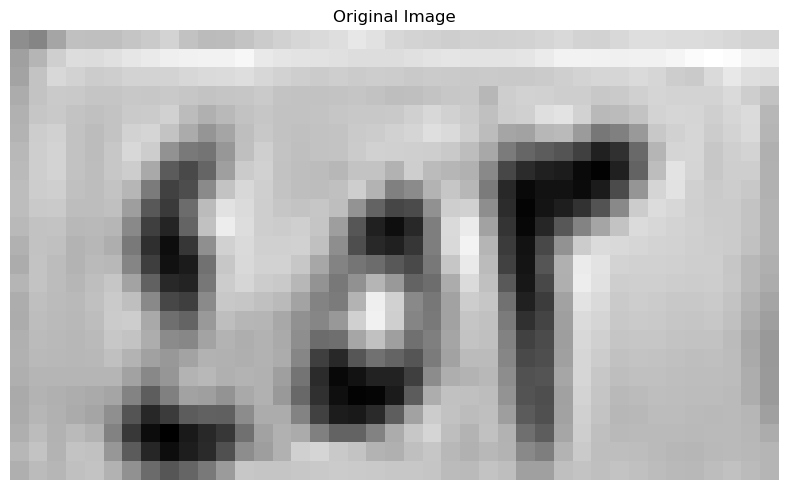

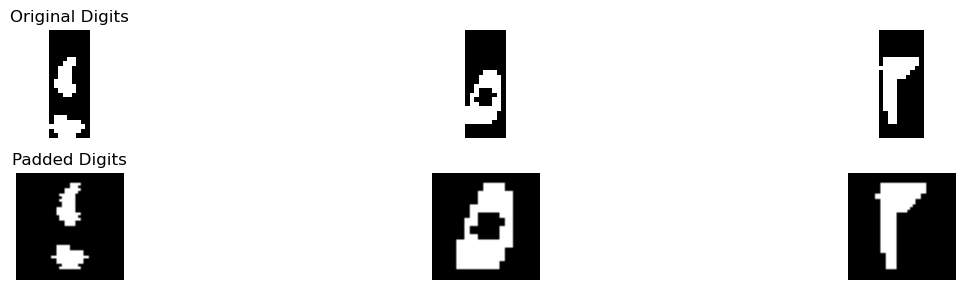

Best match: ٤
Full comparison results: {'١': 2.700892857142857, '٢': 1.125, '٣': 1.24796826625387, '٤': 4.017655529953917, '٥': 2.6683482603567743, '٦': 0.14285714285714285, '٧': 0.19375, '٨': 2.165277777777778, '٩': 1.7888288379868076}
Confidence :  0.6583813364055298
Best match: ٥
Full comparison results: {'١': 0.5238095238095237, '٢': 1.3586309523809523, '٣': 1.2619047619047619, '٤': 2.0714285714285716, '٥': 6.772321428571429, '٦': 1.5163690476190474, '٧': 0.9523809523809523, '٨': 1.1264880952380953, '٩': 0.41220238095238093}
Confidence :  2.350446428571429
Best match: ٣
Full comparison results: {'١': 0.631578947368421, '٢': 1.657894736842105, '٣': 3.7039473684210527, '٤': 1.3223684210526316, '٥': 2.8853383458646613, '٦': 2.0098684210526314, '٧': 1.3779605263157895, '٨': 0.9736842105263157, '٩': 1.15625}
Confidence :  0.40930451127819567
In horizontal_segmentation_1
3 13
17 25
27 39
In refine_segmentation_1


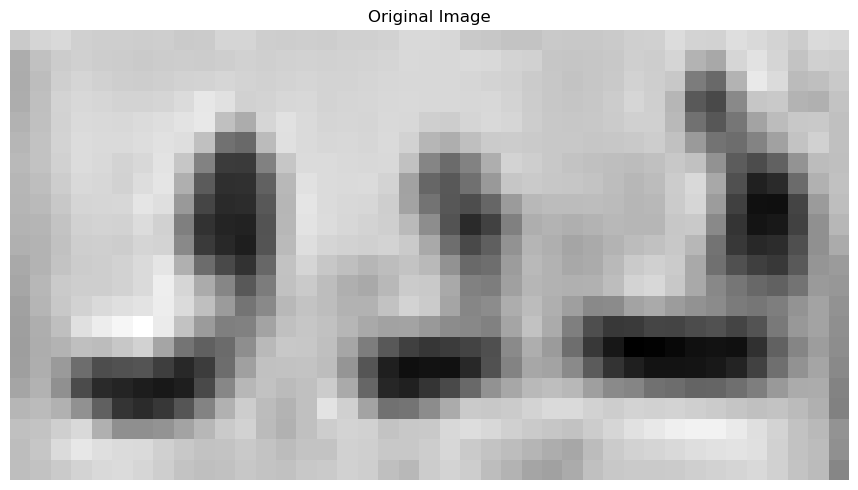

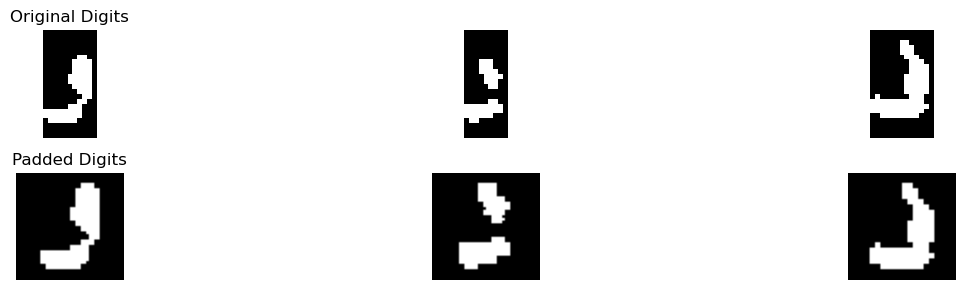

Best match: و
Full comparison results: {'أ': 0.2727272727272727, 'ب': 0.2661637931034483, 'ج': 1.2826178451178452, 'د': 4.500652356902357, 'ر': 4.068455261005861, 'س': 2.830357142857143, 'ص': 1.86875, 'ط': 2.4930006587615283, 'ع': 1.4715909090909092, 'ف': 3.412277537277537, 'ق': 3.356902356902357, 'ك': 2.684659090909091, 'ل': 2.835227272727273, 'م': 0.16761363636363635, 'ن': 2.645, 'ه': 2.719422043010753, 'و': 4.903935185185185, 'ي': 3.486131802979629}
Confidence :  0.201641414141414
Best match: د
Full comparison results: {'أ': 0.7154605263157894, 'ب': 0.0625, 'ج': 1.7253482437979006, 'د': 5.043918793195109, 'ر': 1.4795706470073233, 'س': 2.392857142857143, 'ص': 1.3187499999999999, 'ط': 2.2688557206001105, 'ع': 1.0794090110333303, 'ف': 3.561131210643095, 'ق': 1.8442477160643544, 'ك': 1.3039772727272727, 'ل': 2.0780214424951264, 'م': 2.1815191387559807, 'ن': 2.8256109022556393, 'ه': 3.7015456989247313, 'و': 2.4228837179154783, 'ي': 1.5596579240744}
Confidence :  0.671186547135189
Best ma

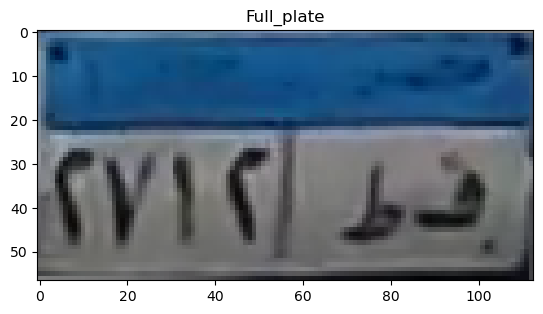

top
[0.55498382 0.49948121 0.50298483 0.61563824 0.66008388 0.68050301
 0.65065167 0.61613043 0.57788447 0.58495637 0.61216091 0.60919462
 0.60227195 0.59911078 0.58379516 0.57612583 0.58424605 0.58455456
 0.56897987 0.54817388 0.55426304 0.56093583 0.55590667 0.55969721
 0.5608814  0.5607275  0.55798381 0.55706765 0.55143039 0.54724075
 0.54727273 0.54017468 0.54566837 0.55927093 0.57897069 0.58886652
 0.59870243 0.60769047 0.60902319 0.60889451 0.61542325 0.61493529
 0.61522034 0.61581482 0.63394907 0.62610216 0.59061821 0.57655276
 0.61790539 0.61698627 0.61673217 0.61127507 0.58657078 0.58924777
 0.52168797 0.47555816]
[0.55966554 0.51184682 0.50452656 0.58674835 0.60521326 0.62811645
 0.62360973 0.61643012 0.60929881 0.59804505 0.57900306 0.55135853
 0.57149825 0.57083451 0.56360794 0.55463308 0.55568455 0.5558979
 0.55753296 0.56108172 0.5225013  0.52454748 0.52400228 0.53086772
 0.52643648 0.52246181 0.51450038 0.50824451 0.50132214 0.49337482
 0.50053364 0.48619718 0.49868169 0

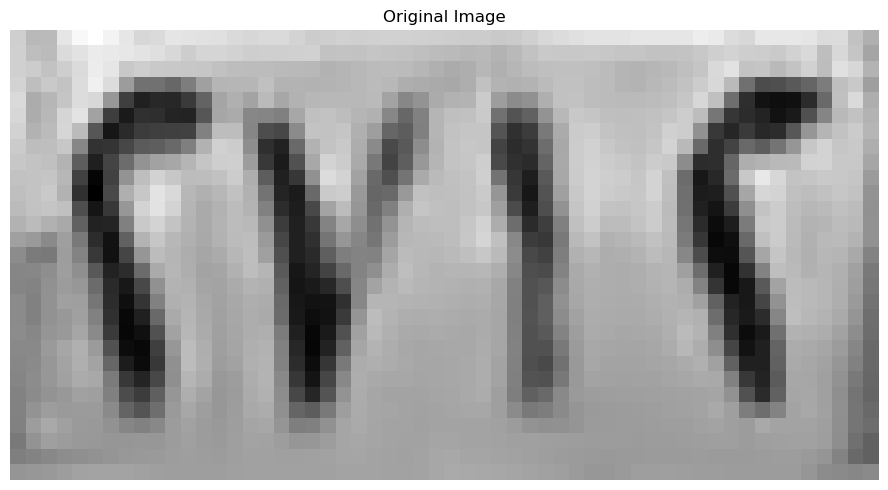

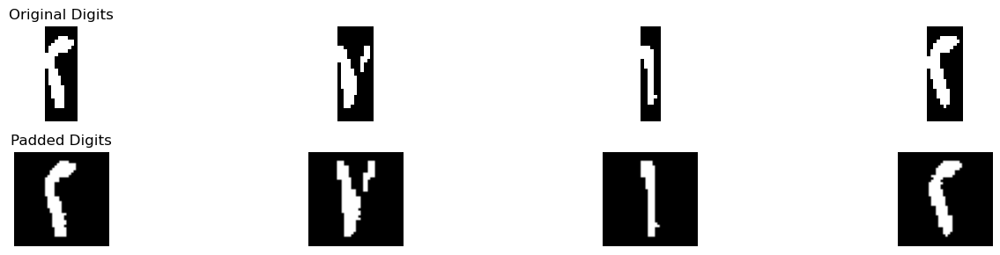

Best match: ٢
Full comparison results: {'١': 0.125, '٢': 5.831730769230769, '٣': 3.3369775541795663, '٤': 3.2692536630036626, '٥': 2.5246986952675807, '٦': 0.7330357142857142, '٧': 1.875735294117647, '٨': 0.39375000000000004, '٩': 0.9736205379587732}
Confidence :  1.2473766075256014
Best match: ٧
Full comparison results: {'١': 0.0625, '٢': 2.09375, '٣': 3.0380224458204332, '٤': 2.15625, '٥': 0.6976172047766475, '٦': 0.5375, '٧': 3.930514705882353, '٨': 0.6805555555555556, '٩': 0.47834967320261446}
Confidence :  0.4462461300309599
Best match: ١
Full comparison results: {'١': 4.6625, '٢': 2.3800990675990676, '٣': 1.330205108359133, '٤': 1.2785485347985348, '٥': 1.0506919873212444, '٦': 1.1357142857142857, '٧': 0.8327205882352942, '٨': 1.4284722222222221, '٩': 1.786167672197084}
Confidence :  1.141200466200466
Best match: ٢
Full comparison results: {'١': 0.16517857142857142, '٢': 6.495535714285714, '٣': 3.7432275541795663, '٤': 3.547023809523809, '٥': 2.2732106000294854, '٦': 0.7232142857

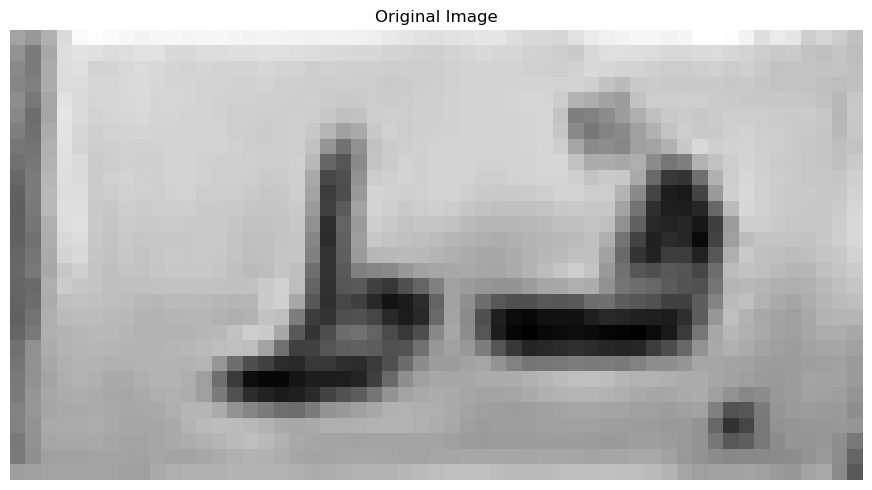

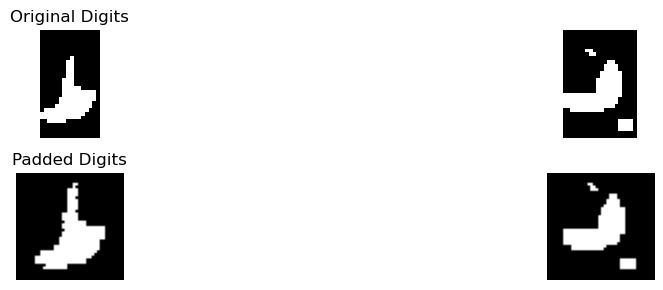

Best match: ط
Full comparison results: {'أ': 0.7331730769230771, 'ب': 0.20838859416445624, 'ج': 1.0784366096866096, 'د': 3.163639601139601, 'ر': 1.6828580901856762, 'س': 1.5357142857142856, 'ص': 1.6241987179487178, 'ط': 4.288461538461539, 'ع': 0.5673076923076923, 'ف': 3.4268798331298336, 'ق': 2.0127314814814814, 'ك': 1.9447115384615388, 'ل': 1.2908653846153846, 'م': 0.18509615384615385, 'ن': 1.7548076923076923, 'ه': 2.875, 'و': 1.8514957264957266, 'ي': 2.956730769230769}
Confidence :  0.4307908526658528
Best match: ه
Full comparison results: {'أ': 0.3275462962962963, 'ب': 0.8453144955300128, 'ج': 0.3333333333333333, 'د': 0.6631944444444444, 'ر': 0.2534722222222222, 'س': 0.7901785714285714, 'ص': 1.7851532567049808, 'ط': 0.037037037037037035, 'ع': 0.1423611111111111, 'ف': 1.7245370370370368, 'ق': 1.0902777777777777, 'ك': 0.2174432497013142, 'ل': 0.4583333333333333, 'م': 0.37037037037037035, 'ن': 0.5925925925925926, 'ه': 1.875, 'و': 1.2430555555555554, 'ي': 0.9759259259259259}
Confidence 

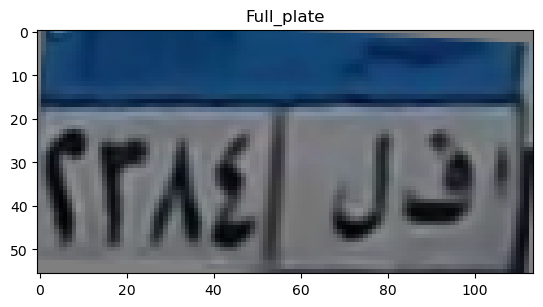

top
[0.4586252  0.52562811 0.54480841 0.51327545 0.43194242 0.28182283
 0.1354576  0.04495564 0.02450196 0.07798528 0.2117891  0.38030616
 0.48213757 0.47663433 0.46758694 0.46332714 0.44010177 0.45947053
 0.49732857 0.51114204 0.47236631 0.4393     0.42885074 0.42414847
 0.42512979 0.44024134 0.46470069 0.47042842 0.4684696  0.46777423
 0.46552583 0.46138601 0.44490691 0.42897171 0.4483743  0.46897105
 0.47371217 0.47411045 0.47311484 0.47034184 0.47056211 0.47364412
 0.47728464 0.4955067  0.5133019  0.46968206 0.36148895 0.29971989
 0.36145859 0.46726085 0.51485109 0.5339376  0.53573041 0.45027225
 0.3049558  0.22998538 0.29391146]
[0.4644704  0.53614451 0.50736567 0.40396428 0.27519321 0.12873659
 0.06234481 0.04656013 0.03961314 0.05798493 0.14836563 0.32133428
 0.46535752 0.49111782 0.45814287 0.40065585 0.37200985 0.42184701
 0.45548289 0.46334019 0.40159636 0.31737167 0.28899647 0.29926121
 0.36332309 0.42671075 0.47397217 0.4821859  0.47596842 0.48600761
 0.50102296 0.47382706 

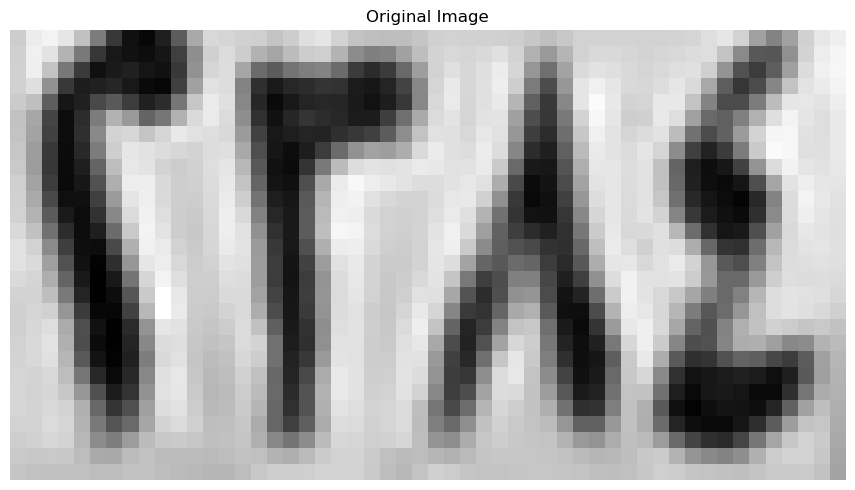

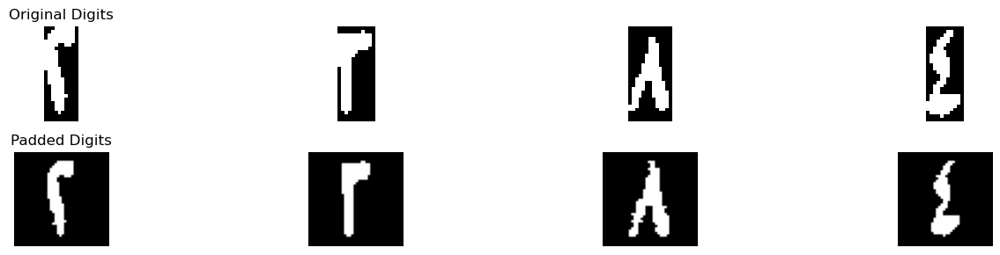

Best match: ٢
Full comparison results: {'١': 0.0, '٢': 6.758886946386948, '٣': 3.996904024767802, '٤': 3.075526556776557, '٥': 2.017562288073124, '٦': 0.8282738095238096, '٧': 2.0466911764705884, '٨': 0.375, '٩': 1.268680869783811}
Confidence :  1.380991460809573
Best match: ٢
Full comparison results: {'١': 0.53125, '٢': 4.916666666666666, '٣': 4.288506191950464, '٤': 2.4009844322344325, '٥': 2.434625165855816, '٦': 1.838095238095238, '٧': 1.1378676470588236, '٨': 0.7354166666666666, '٩': 1.1600992961287078}
Confidence :  0.31408023735810087
Best match: ٨
Full comparison results: {'١': 2.3731617647058827, '٢': 0.5055147058823529, '٣': 0.5882352941176471, '٤': 0.6305147058823529, '٥': 1.6056040837387586, '٦': 1.0136029411764707, '٧': 0.8444852941176472, '٨': 5.908946078431372, '٩': 2.5504493464052285}
Confidence :  1.6792483660130717
Best match: ٤
Full comparison results: {'١': 2.395833333333333, '٢': 1.3846153846153848, '٣': 1.6505417956656347, '٤': 4.383562271062271, '٥': 2.3286663349

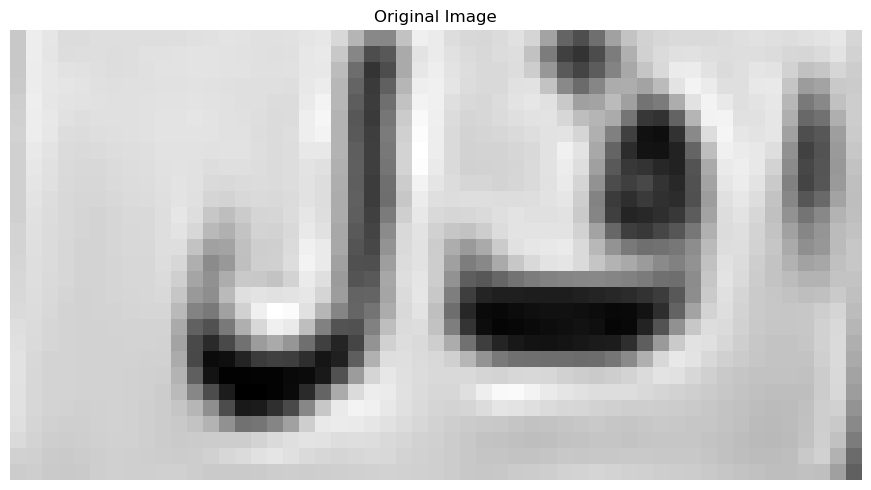

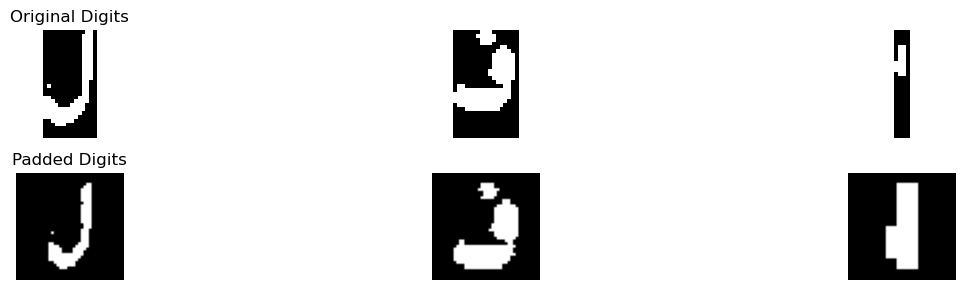

Best match: ل
Full comparison results: {'أ': 0.25, 'ب': 0.1627155172413793, 'ج': 0.19328703703703703, 'د': 2.3209792324691705, 'ر': 3.0442086992218176, 'س': 0.9821428571428572, 'ص': 1.2705357142857143, 'ط': 0.7219614624505928, 'ع': 0.8792763157894736, 'ف': 1.671331105541632, 'ق': 2.184567321080479, 'ك': 0.38257575757575757, 'ل': 4.63078560371517, 'م': 0.1534090909090909, 'ن': 3.351309523809524, 'ه': 1.04872311827957, 'و': 2.1711309523809526, 'ي': 2.1413182831661093}
Confidence :  0.639738039952823
Best match: ف
Full comparison results: {'أ': 0.6145833333333333, 'ب': 0.3879310344827586, 'ج': 2.5949074074074074, 'د': 5.021203703703703, 'ر': 2.43492816091954, 'س': 2.080357142857143, 'ص': 1.6145833333333333, 'ط': 2.6770833333333335, 'ع': 1.3645833333333335, 'ف': 5.634920634920634, 'ق': 3.4953703703703702, 'ك': 2.166666666666667, 'ل': 1.7916666666666667, 'م': 0.6770833333333333, 'ن': 3.7425, 'ه': 3.8578629032258065, 'و': 3.252314814814815, 'ي': 2.216666666666667}
Confidence :  0.30685846560

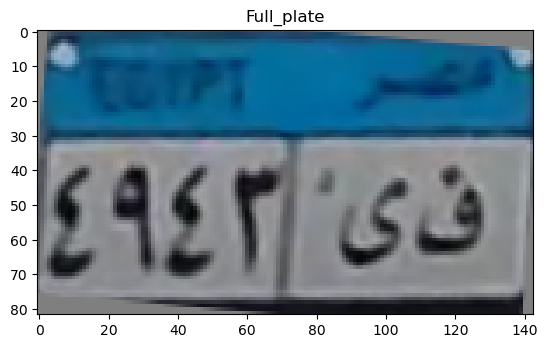

top
[0.44915091 0.39177817 0.37281761 0.48587015 0.61344875 0.65792984
 0.6602665  0.65793506 0.65217433 0.64629761 0.64066072 0.63572355
 0.63333399 0.63345049 0.63604789 0.63461069 0.63306166 0.63096514
 0.62694143 0.62337902 0.62142253 0.62103317 0.6184397  0.61647039
 0.61168664 0.60130294 0.58937567 0.58180721 0.58794746 0.59700573
 0.60073626 0.59826271 0.58503533 0.57909149 0.58636054 0.58479187
 0.58544516 0.60229316 0.6139889  0.61127333 0.60494428 0.59924939
 0.59657404 0.59516093 0.59462047 0.59474534 0.59962594 0.61069611
 0.61953672 0.62485988 0.62634484 0.62545771 0.62655692 0.62581582
 0.62333721 0.62057447 0.61673644 0.61272637 0.60449045 0.59599297
 0.5900727  0.59071568 0.59256235 0.59372475 0.59713194 0.59130433
 0.57751485 0.57744097 0.59151536 0.6097185  0.60455008]
[0.43957107 0.40275202 0.40253086 0.51837049 0.61550437 0.63628163
 0.62217293 0.60856829 0.60548065 0.60516513 0.60638622 0.60590547
 0.60294035 0.59705792 0.59311451 0.59087888 0.59039628 0.5935952
 0

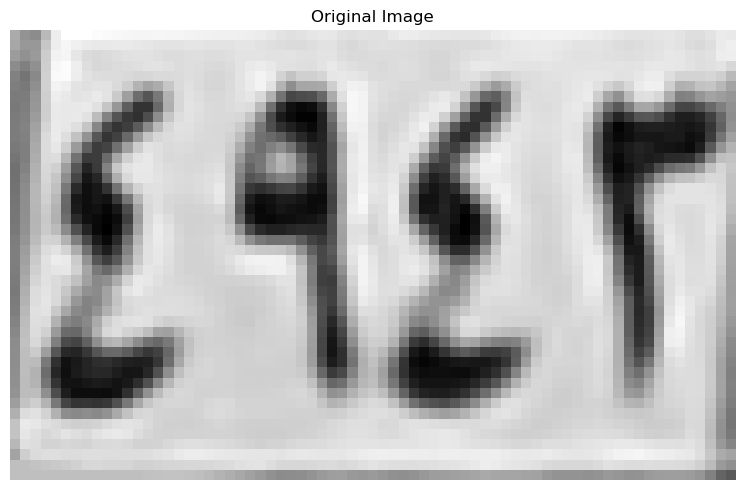

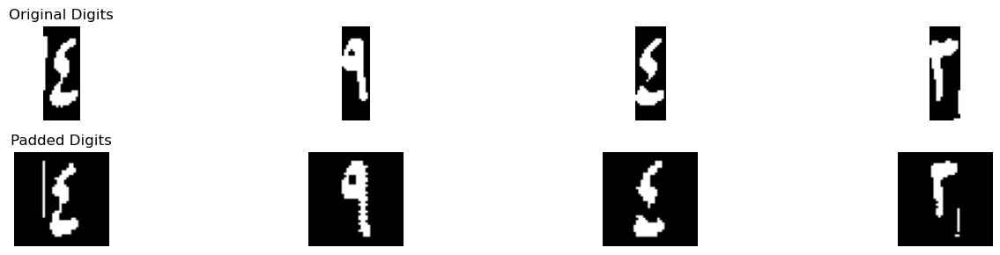

Best match: ٤
Full comparison results: {'١': 1.7163461538461537, '٢': 0.8952380952380952, '٣': 1.1994969040247678, '٤': 2.8333333333333335, '٥': 2.352872069880584, '٦': 0.26666666666666666, '٧': 0.6227941176470588, '٨': 1.6402777777777777, '٩': 1.641433239962652}
Confidence :  0.2402306317263747
Best match: ٩
Full comparison results: {'١': 3.375, '٢': 3.2147435897435903, '٣': 1.1505417956656347, '٤': 1.6588827838827838, '٥': 2.1403739127229837, '٦': 1.957142857142857, '٧': 0.7481617647058824, '٨': 1.8555555555555556, '٩': 4.169227626948215}
Confidence :  0.3971138134741077
Best match: ٤
Full comparison results: {'١': 1.7283653846153848, '٢': 1.076923076923077, '٣': 1.0078366873065017, '٤': 5.469970755051401, '٥': 3.133730465870559, '٦': 0.14285714285714285, '٧': 0.2525735294117647, '٨': 1.976388888888889, '٩': 1.5580693815987936}
Confidence :  1.168120144590421
Best match: ٢
Full comparison results: {'١': 0.625, '٢': 4.321314102564103, '٣': 3.596845975232198, '٤': 1.8332875457875457, '

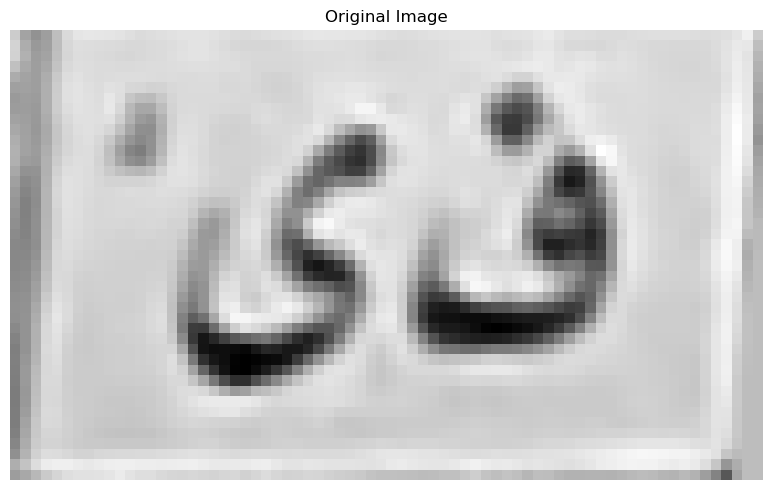

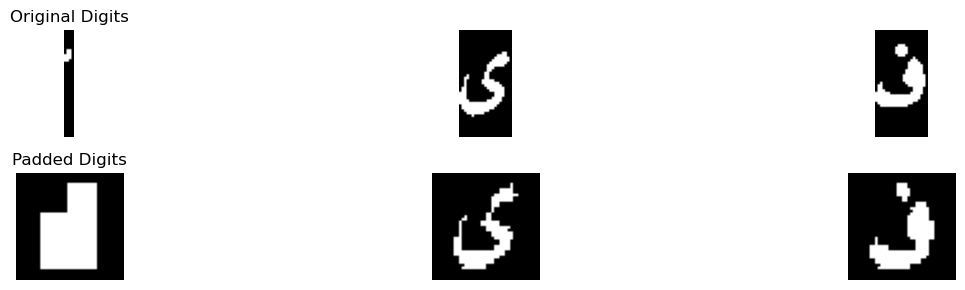

Best match: ه
Full comparison results: {'أ': 0.619047619047619, 'ب': 0.8782327586206897, 'ج': 1.741021106510237, 'د': 2.4963425925925926, 'ر': 1.0024803669593774, 'س': 0.7276785714285714, 'ص': 0.2869047619047619, 'ط': 1.2229907773386033, 'ع': 0.5505952380952381, 'ف': 2.222222222222222, 'ق': 0.7569444444444444, 'ك': 1.4119318181818183, 'ل': 0.6800595238095237, 'م': 1.0039231601731602, 'ن': 1.056547619047619, 'ه': 3.5048387096774194, 'و': 2.1825396825396823, 'ي': 1.1876751871317088}
Confidence :  0.5042480585424134
Best match: ي
Full comparison results: {'أ': 0.375, 'ب': 0.4921253315649867, 'ج': 1.6608796296296298, 'د': 3.1811574074074076, 'ر': 2.9256609195402303, 'س': 2.142857142857143, 'ص': 2.1395833333333334, 'ط': 2.020833333333333, 'ع': 0.84375, 'ف': 2.7607473544973544, 'ق': 2.6261574074074074, 'ك': 2.010416666666667, 'ل': 2.6875, 'م': 0.11458333333333333, 'ن': 2.40875, 'ه': 1.2247983870967742, 'و': 3.039351851851852, 'ي': 4.3150641025641026}
Confidence :  0.5669533475783475
Best mat

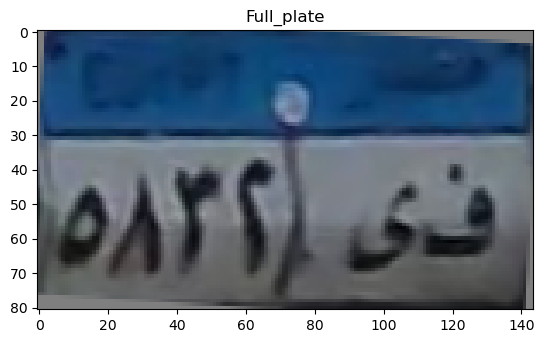

top
[0.45781963 0.42169832 0.41452399 0.4486665  0.51300706 0.54017973
 0.5348569  0.53329873 0.53087926 0.52872152 0.52732478 0.5266175
 0.52909443 0.53020447 0.53012878 0.53002196 0.53287298 0.53691958
 0.53874368 0.53759699 0.53542529 0.53055928 0.52327652 0.51807013
 0.5195201  0.52287398 0.52844281 0.53163452 0.53501314 0.53902206
 0.54541783 0.55312335 0.5560641  0.55450252 0.55345005 0.55237701
 0.54661513 0.53648972 0.52870786 0.52458973 0.52509583 0.52429776
 0.52425782 0.52314708 0.52347891 0.52322757 0.5225903  0.52209989
 0.5230112  0.52658678 0.52749763 0.52493459 0.51948505 0.51554431
 0.51288283 0.51142205 0.51282333 0.5164123  0.51863838 0.52343691
 0.52691206 0.53082286 0.53434282 0.53713593 0.53534538 0.52954931
 0.52312104 0.51891286 0.51505191 0.51397931 0.49510909 0.42296107]
[0.46952889 0.44263847 0.43012439 0.46236574 0.52683337 0.53971932
 0.52996782 0.52801019 0.52482163 0.52076059 0.51589123 0.5151371
 0.51666829 0.51725059 0.51639792 0.51585813 0.51936456 0.5

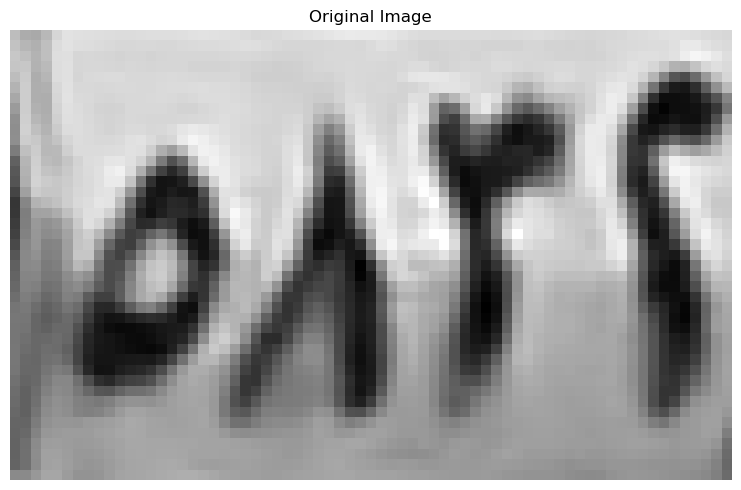

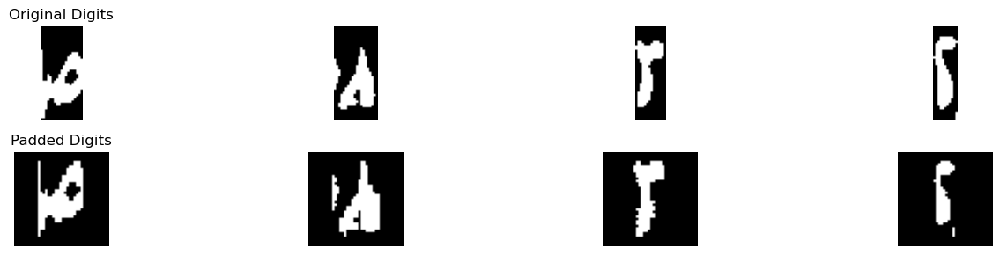

Best match: ٨
Full comparison results: {'١': 0.9473684210526315, '٢': 0.7368421052631579, '٣': 0.7368421052631579, '٤': 0.10526315789473684, '٥': 2.1662750626566414, '٦': 1.1207236842105264, '٧': 1.0394736842105263, '٨': 2.4282894736842104, '٩': 1.0625}
Confidence :  0.13100720551378453
Best match: ٥
Full comparison results: {'١': 0.6000000000000001, '٢': 0.7000000000000001, '٣': 0.30000000000000004, '٤': 0.625, '٥': 2.3916666666666666, '٦': 0.95, '٧': 0.9, '٨': 1.23125, '٩': 0.6500000000000001}
Confidence :  0.5802083333333333
Best match: ٢
Full comparison results: {'١': 0.6466346153846154, '٢': 4.685096153846153, '٣': 4.350522445820433, '٤': 2.3337225274725277, '٥': 2.795536635706914, '٦': 1.268154761904762, '٧': 1.3529411764705883, '٨': 0.6854166666666666, '٩': 0.5043363499245852}
Confidence :  0.16728685401286025
Best match: ٢
Full comparison results: {'١': 0.9680555555555554, '٢': 4.447698135198135, '٣': 2.189628482972136, '٤': 1.9984661172161173, '٥': 1.4467648901665928, '٦': 0.2

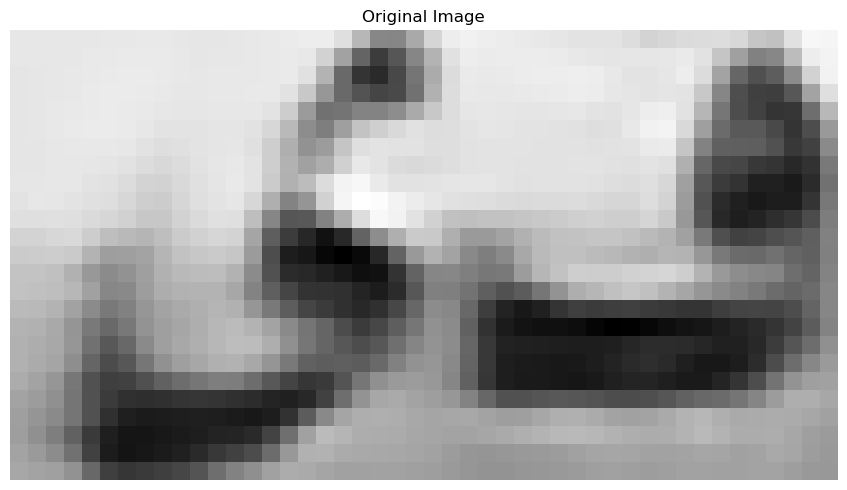

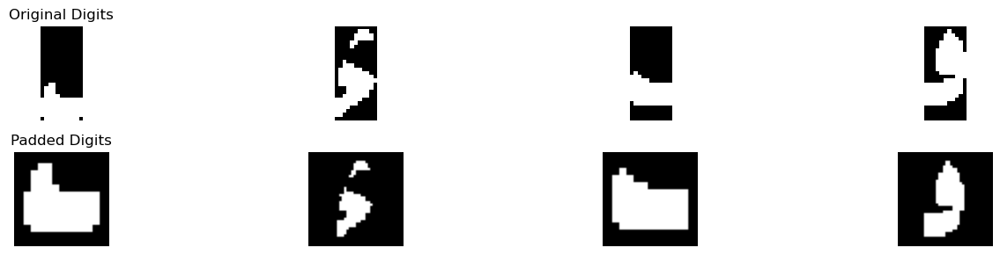

Best match: ه
Full comparison results: {'أ': 0.40625, 'ب': 1.2941810344827587, 'ج': 1.09375, 'د': 0.875, 'ر': 0.6875, 'س': 0.40625, 'ص': 0.625, 'ط': 1.4375, 'ع': 0.4375, 'ف': 2.0, 'ق': 0.875, 'ك': 1.3125, 'ل': 0.25, 'م': 0.28125, 'ن': 0.625, 'ه': 3.50933908045977, 'و': 0.84375, 'ي': 1.40625}
Confidence :  0.7546695402298851
Best match: ه
Full comparison results: {'أ': 0.9978494623655914, 'ب': 0.5794098143236074, 'ج': 0.6848577439390903, 'د': 0.6344663482086083, 'ر': 0.24444911472835013, 'س': 0.4732142857142857, 'ص': 0.8401785714285714, 'ط': 1.094632269904009, 'ع': 0.2677631578947368, 'ف': 0.6743887047367523, 'ق': 0.39572542467279304, 'ك': 0.2642045454545454, 'ل': 0.456733746130031, 'م': 0.5479166666666666, 'ن': 0.3223771121351766, 'ه': 1.3663978494623656, 'و': 0.49923941798941796, 'ي': 0.4618978243978244}
Confidence :  0.13588278977917834
Best match: ه
Full comparison results: {'أ': 0.40625, 'ب': 1.1379310344827587, 'ج': 0.5, 'د': 0.8125, 'ر': 0.5625, 'س': 0.34375, 'ص': 0.53125, 'ط': 1

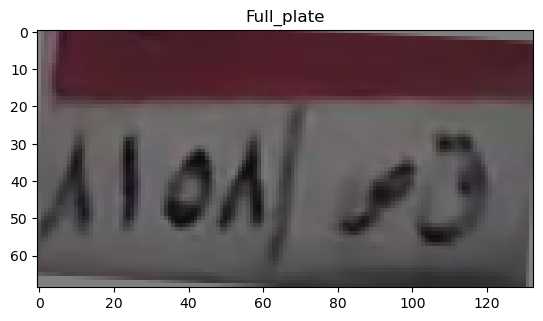

top
[0.4060309  0.39116021 0.3947698  0.3955051  0.39880162 0.40367081
 0.40199648 0.40342581 0.40128288 0.37007228 0.30322546 0.26803855
 0.31209629 0.36973792 0.39878017 0.41101061 0.4156972  0.41828337
 0.41555843 0.41800941 0.42511725 0.43415525 0.4002522  0.27902659
 0.18323525 0.20404888 0.28461813 0.37141877 0.42388569 0.42842907
 0.42395538 0.42346327 0.42073105 0.41901643 0.42041388 0.42617382
 0.43247531 0.43631507 0.43835759 0.43738603 0.43621286 0.43837917
 0.44169471 0.44470099 0.44396181 0.44557877 0.44354583 0.4415148
 0.4358231  0.42616926 0.41598331 0.41108207 0.41360088 0.4125833
 0.40657419 0.39931009 0.3589686  0.29060665 0.27473216 0.3385802
 0.40576529 0.43127294 0.43210421 0.4397357  0.44096083 0.41087434]
[0.40072765 0.39095382 0.39619444 0.39673059 0.39721792 0.40117103
 0.40126201 0.4035704  0.39709665 0.35345676 0.2764111  0.24333545
 0.30321066 0.37458922 0.4054836  0.41465716 0.416133   0.4165021
 0.41511036 0.41968297 0.42695549 0.4379849  0.38902616 0.220

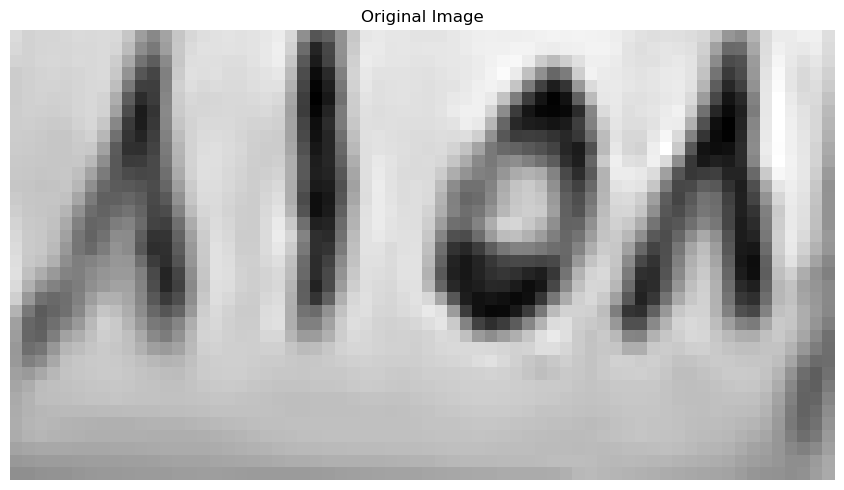

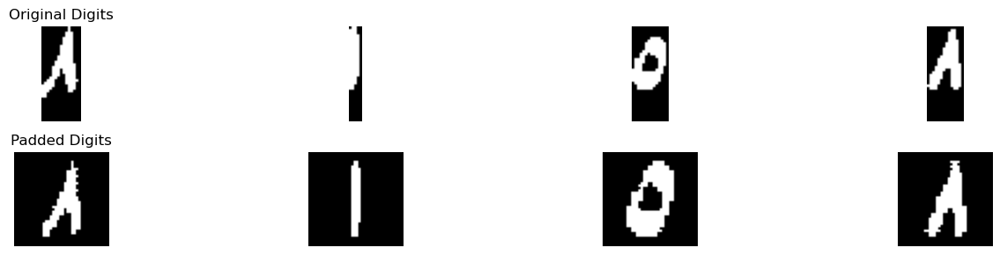

Best match: ٨
Full comparison results: {'١': 0.6875, '٢': 0.5, '٣': 0.0625, '٤': 0.3125, '٥': 0.9320359722836502, '٦': 1.66875, '٧': 1.053308823529412, '٨': 1.7256944444444444, '٩': 0.9679330065359477}
Confidence :  0.028472222222222232
Best match: ١
Full comparison results: {'١': 3.1062499999999997, '٢': 2.5439248251748254, '٣': 1.4177631578947367, '٤': 1.4880723443223443, '٥': 0.8566913607548283, '٦': 0.14285714285714285, '٧': 0.9838235294117648, '٨': 1.8541666666666667, '٩': 0.7128739316239316}
Confidence :  0.28116258741258715
Best match: ٥
Full comparison results: {'١': 0.35, '٢': 1.1500000000000001, '٣': 1.15625, '٤': 2.25625, '٥': 7.083928571428572, '٦': 1.4124999999999999, '٧': 1.0499999999999998, '٨': 1.08125, '٩': 0.33125}
Confidence :  2.4138392857142863
Best match: ٨
Full comparison results: {'١': 0.9201388888888888, '٢': 0.2777777777777778, '٣': 0.32748538011695905, '٤': 0.4201388888888889, '٥': 1.6365914786967417, '٦': 1.3958333333333335, '٧': 1.1215277777777777, '٨': 2.2

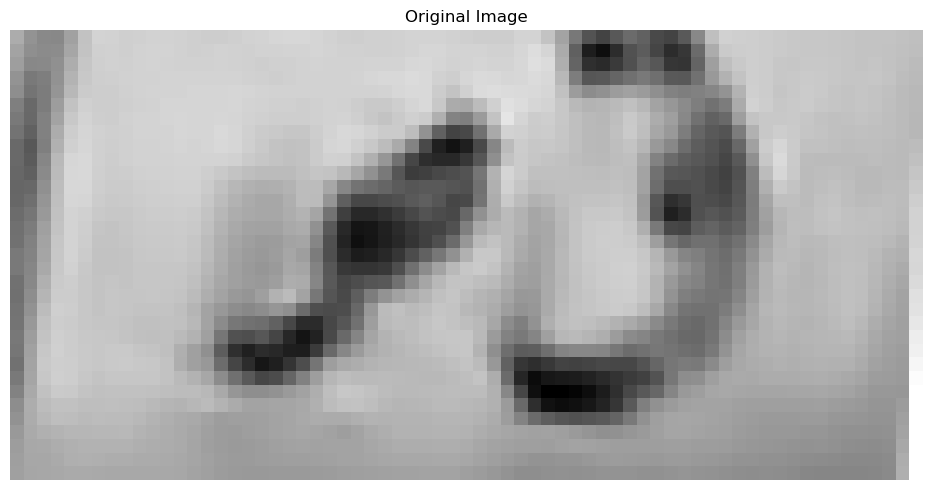

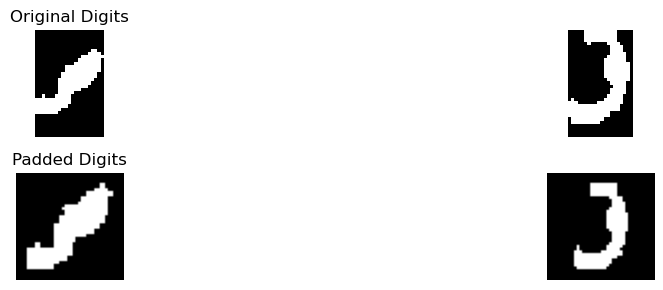

Best match: ص
Full comparison results: {'أ': 0.40625, 'ب': 1.53125, 'ج': 0.1875, 'د': 1.5, 'ر': 1.0, 'س': 3.90625, 'ص': 4.40625, 'ط': 0.90625, 'ع': 0.15625, 'ف': 1.84375, 'ق': 1.28125, 'ك': 1.0, 'ل': 0.59375, 'م': 0.75, 'ن': 0.75, 'ه': 3.09375, 'و': 1.4375, 'ي': 1.5}
Confidence :  0.25
Best match: ق
Full comparison results: {'أ': 0.08125, 'ب': 0.3046253315649867, 'ج': 2.6331363584080973, 'د': 4.368291245791246, 'ر': 3.6751122652959234, 'س': 1.3794642857142856, 'ص': 1.1270833333333332, 'ط': 2.7561758893280635, 'ع': 1.85, 'ف': 4.247652116402117, 'ق': 4.804596560846561, 'ك': 1.6202651515151516, 'ل': 3.33125, 'م': 0.7784090909090908, 'ن': 3.4613095238095237, 'ه': 1.7496639784946235, 'و': 4.458234126984127, 'ي': 2.7342042920847267}
Confidence :  0.17318121693121702
[['٨', '١', '٥', '٨'], ['ص', 'ق']]
Tilt angle: -2.00 degrees


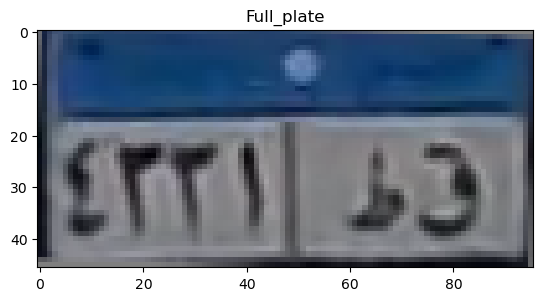

top
[0.0591625  0.16947922 0.36775078 0.46160032 0.49432645 0.52955451
 0.52691106 0.54115246 0.53846978 0.51320397 0.51048222 0.52606379
 0.51793056 0.50269567 0.48545778 0.4889077  0.52826739 0.5552292
 0.55447235 0.55140412 0.55058074 0.54983396 0.55294336 0.55222784
 0.55687941 0.55390547 0.54856428 0.53129912 0.51184586 0.51542779
 0.51889586 0.52128157 0.52128645 0.51947592 0.51518364 0.50558422
 0.49332549 0.4829701  0.48263692 0.50017292 0.50907617 0.52299637
 0.54194363 0.51445099 0.48151045 0.49478294 0.52653846 0.41953784]
[0.04446792 0.17413608 0.3700278  0.48577847 0.53110534 0.54882971
 0.52768387 0.53871482 0.49092759 0.3823101  0.36498809 0.45024426
 0.47072993 0.43043357 0.46403498 0.45381745 0.48108461 0.57703743
 0.5407476  0.55585176 0.53504412 0.53073463 0.49694767 0.50323578
 0.52882779 0.48912319 0.50942676 0.51343363 0.52650193 0.54858494
 0.5535261  0.54145013 0.50450322 0.46761436 0.49603126 0.50730741
 0.51064026 0.50990931 0.54003775 0.5386098  0.44936709 0.

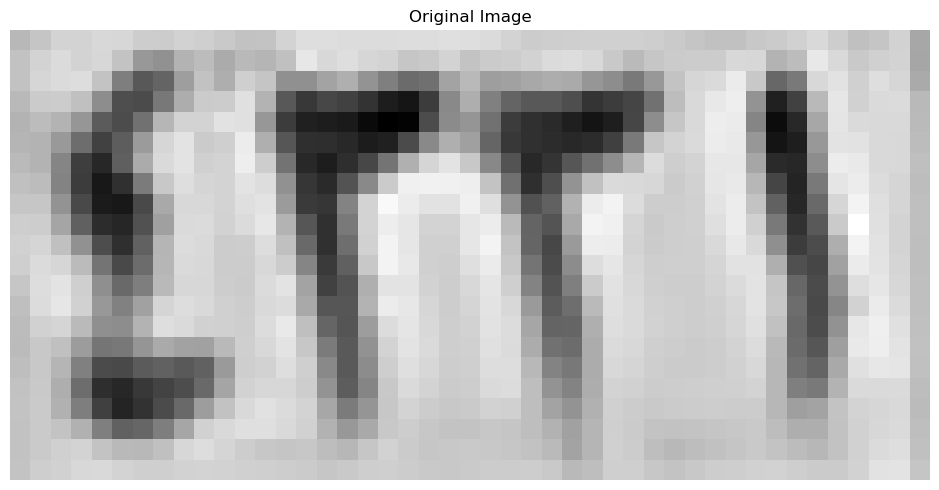

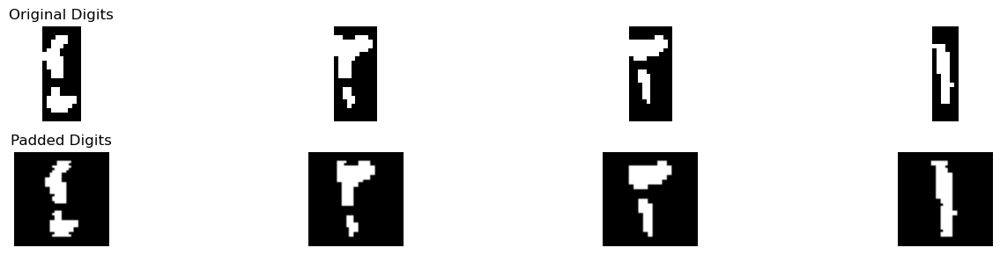

Best match: ٤
Full comparison results: {'١': 1.5624999999999998, '٢': 2.665178571428571, '٣': 2.064628482972136, '٤': 5.331845238095238, '٥': 3.093155683325962, '٦': 0.17410714285714285, '٧': 0.6702205882352941, '٨': 1.3854166666666667, '٩': 1.4891748366013071}
Confidence :  1.1193447773846381
Best match: ٣
Full comparison results: {'١': 0.6875, '٢': 3.15625, '٣': 5.675503095975232, '٤': 2.408266129032258, '٥': 2.4061993218339968, '٦': 1.64375, '٧': 1.9911764705882353, '٨': 0.8291666666666666, '٩': 1.7160947712418302}
Confidence :  1.259626547987616
Best match: ٣
Full comparison results: {'١': 0.05555555555555555, '٢': 3.5694444444444446, '٣': 5.387792397660819, '٤': 1.2083333333333333, '٥': 2.178153717627402, '٦': 1.4944444444444445, '٧': 3.4548611111111107, '٨': 0.3055555555555556, '٩': 0.7847222222222221}
Confidence :  0.9091739766081872
Best match: ١
Full comparison results: {'١': 3.991477272727273, '٢': 2.707677738927739, '٣': 1.24796826625387, '٤': 2.3734661172161173, '٥': 1.2690

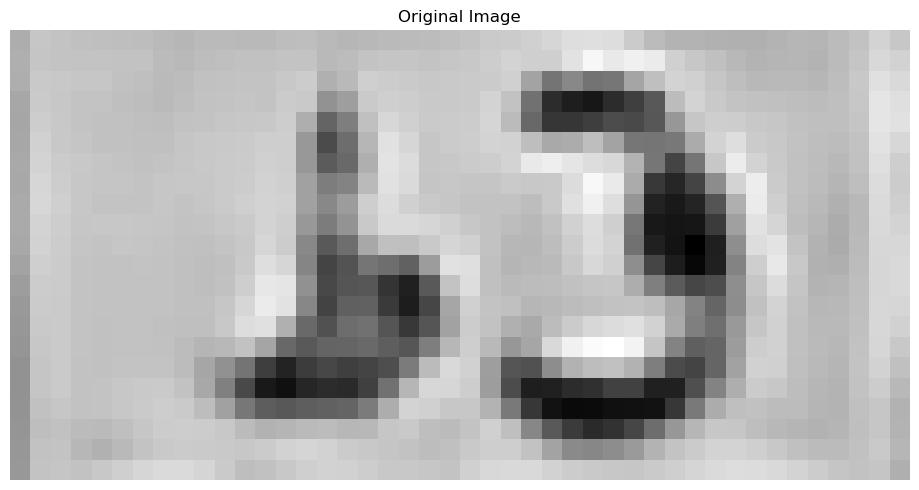

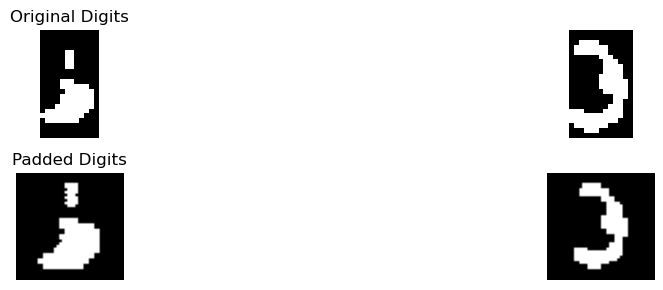

Best match: ط
Full comparison results: {'أ': 0.8749561711079944, 'ب': 0.4088196286472148, 'ج': 2.042218474096285, 'د': 3.5219182769726247, 'ر': 2.3549129899336045, 'س': 0.8928571428571428, 'ص': 1.1918478260869565, 'ط': 5.366847826086957, 'ع': 0.741453366058906, 'ف': 3.306216931216931, 'ق': 2.2990640096618358, 'ك': 2.3220108695652173, 'ل': 1.576863354037267, 'م': 0.4741847826086957, 'ن': 2.040271739130435, 'ه': 2.5433467741935485, 'و': 2.3700684380032206, 'ي': 2.7637242870500236}
Confidence :  0.9224647745571661
Best match: د
Full comparison results: {'أ': 0.38125000000000003, 'ب': 0.4680868700265252, 'ج': 3.011098171152519, 'د': 4.632478956228956, 'ر': 1.5501145855643603, 'س': 1.4241071428571428, 'ص': 1.3976190476190475, 'ط': 1.3437911725955205, 'ع': 1.8062500000000001, 'ف': 4.269874338624339, 'ق': 4.411640211640211, 'ك': 0.8484848484848485, 'ل': 1.75625, 'م': 0.37386363636363634, 'ن': 3.093809523809524, 'ه': 1.7496639784946235, 'و': 2.8397156084656086, 'ي': 2.7705824972129323}
Confide

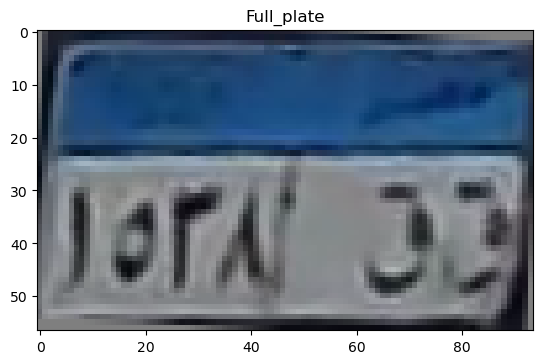

top
[0.11929132 0.2508219  0.3516375  0.35250196 0.45420657 0.4750724
 0.50176006 0.55044273 0.56415658 0.56212549 0.52358229 0.48023824
 0.50565184 0.52521756 0.50053952 0.49489338 0.49666809 0.49822648
 0.54165218 0.55541363 0.55433142 0.56523034 0.59202588 0.6037501
 0.62192096 0.63214034 0.62473379 0.62809623 0.65011824 0.63760451
 0.62026335 0.58525417 0.55783181 0.55939853 0.57347697 0.56491299
 0.52395563 0.55420018 0.60454882 0.59602505 0.59682657 0.62445623
 0.60784152 0.58007973 0.55230867 0.57165596 0.56764729]
[0.08959669 0.26826173 0.41721289 0.43448298 0.55200944 0.57970598
 0.61775669 0.66114134 0.69284783 0.69520843 0.680925   0.6625873
 0.66044827 0.65721005 0.64229307 0.6340551  0.63127407 0.63485304
 0.63238571 0.64041624 0.6428048  0.63550025 0.62646296 0.62641137
 0.62757569 0.62885928 0.63480966 0.63685897 0.64293922 0.64809711
 0.65303049 0.64717451 0.64154257 0.63946    0.64673324 0.65515147
 0.64017647 0.63305836 0.64524208 0.6394054  0.65359884 0.67796722
 0.6

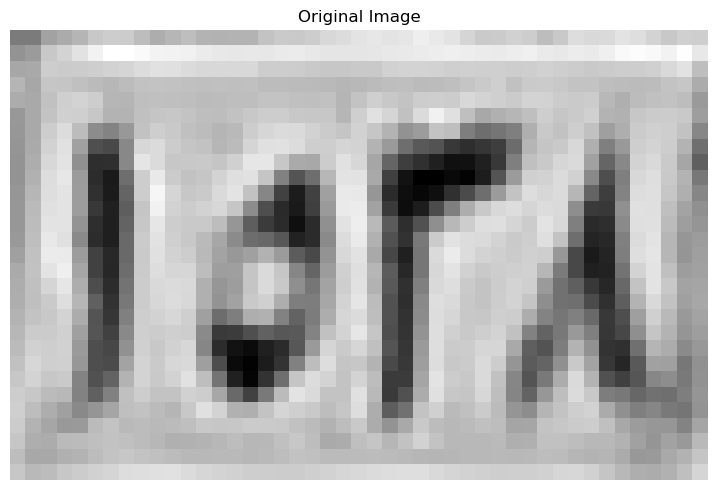

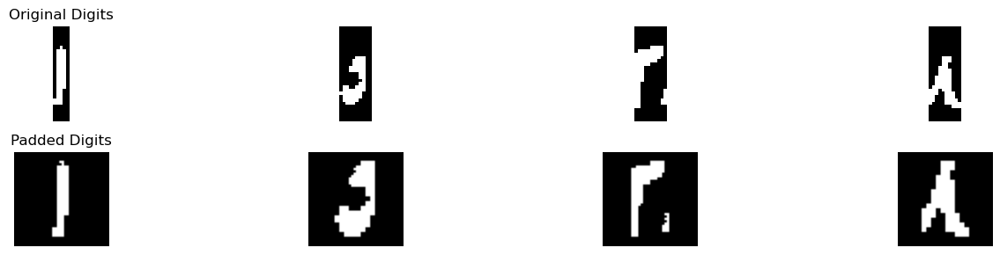

Best match: ١
Full comparison results: {'١': 3.3107142857142855, '٢': 1.8905157342657344, '٣': 1.1052631578947367, '٤': 1.4568223443223443, '٥': 0.9881919873212444, '٦': 0.43363095238095234, '٧': 0.9764705882352942, '٨': 1.9090277777777778, '٩': 1.1051564856711915}
Confidence :  0.7008432539682539
Best match: ٥
Full comparison results: {'١': 0.47058823529411764, '٢': 1.0036764705882353, '٣': 0.9961300309597524, '٤': 1.4944852941176472, '٥': 5.6105014374170725, '٦': 1.6562500000000002, '٧': 1.0323529411764707, '٨': 0.9318218954248367, '٩': 0.5204248366013072}
Confidence :  1.9771257187085363
Best match: ٣
Full comparison results: {'١': 0.9375, '٢': 2.25, '٣': 3.1030379256965945, '٤': 0.90625, '٥': 2.060168804363851, '٦': 2.26875, '٧': 0.6003676470588235, '٨': 1.5069444444444444, '٩': 1.3627450980392157}
Confidence :  0.41714396284829736
Best match: ٨
Full comparison results: {'١': 2.05625, '٢': 1.825, '٣': 1.05, '٤': 1.4125, '٥': 2.4160714285714286, '٦': 0.6625, '٧': 0.8624999999999999,

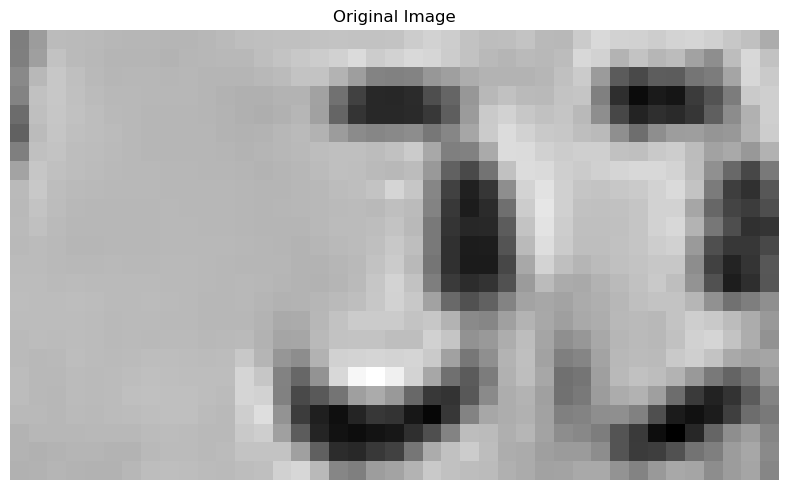

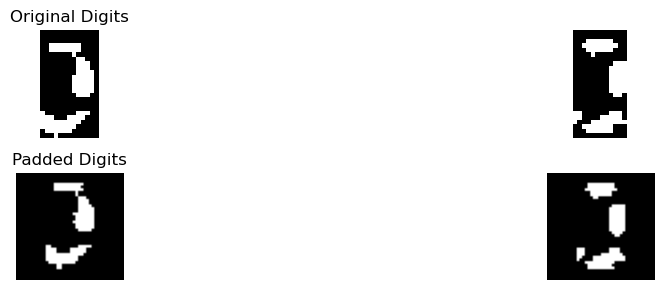

Best match: ق
Full comparison results: {'أ': 0.0, 'ب': 0.3678713527851459, 'ج': 1.5050255130371322, 'د': 3.612432216905901, 'ر': 1.831253867114062, 'س': 1.8214285714285714, 'ص': 1.5104166666666665, 'ط': 0.8535902503293807, 'ع': 1.1778926850713485, 'ف': 3.021048083919476, 'ق': 4.21296992481203, 'ك': 0.6401515151515151, 'ل': 2.060843079922027, 'م': 0.5157828282828283, 'ن': 3.2798214285714287, 'ه': 1.4350806451612903, 'و': 2.2939612503016287, 'ي': 1.5570234113712376}
Confidence :  0.30026885395306446
Best match: ق
Full comparison results: {'أ': 0.19791666666666666, 'ب': 0.3715896172792724, 'ج': 2.7076144467448815, 'د': 3.509797631705526, 'ر': 1.6341351645605768, 'س': 0.3973214285714286, 'ص': 0.44732142857142854, 'ط': 1.3074028326745717, 'ع': 2.118179745959882, 'ف': 3.2752170524878506, 'ق': 4.9631361674772485, 'ك': 0.7481060606060606, 'ل': 3.0127847793594826, 'م': 0.89614898989899, 'ن': 3.5670609318996416, 'ه': 1.1778897849462366, 'و': 2.570899470899471, 'ي': 1.603555834262356}
Confidence 

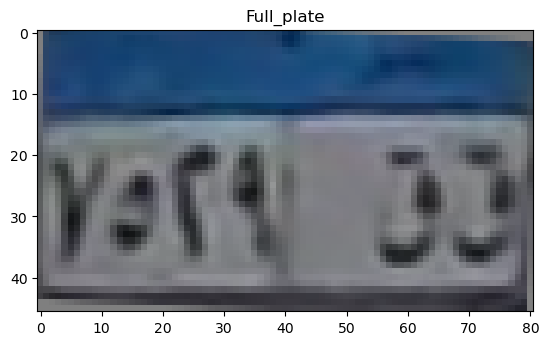

top
[0.33612749 0.41446687 0.42013267 0.41470803 0.44814733 0.48335214
 0.50628365 0.51355501 0.48142615 0.44684828 0.42454239 0.43879954
 0.49301983 0.48995618 0.47009069 0.48909088 0.52145714 0.5188768
 0.50655178 0.49388251 0.49556385 0.49895015 0.46881212 0.39071582
 0.29720162 0.20528739 0.13974424 0.12908907 0.23297251 0.39539336
 0.51282882 0.56254979 0.50026973 0.35194696 0.24101851 0.26290309
 0.40075434 0.5022206  0.51348982 0.49815294]
[0.33218122 0.40679972 0.38246034 0.32153608 0.34796441 0.45255372
 0.51618449 0.52540671 0.47014867 0.39745683 0.35982046 0.41831713
 0.50827047 0.51928615 0.50939567 0.53321097 0.5708545  0.57156408
 0.54607115 0.51190943 0.50879688 0.4934286  0.42410998 0.28976012
 0.16826257 0.12514843 0.13344    0.12313322 0.2236737  0.39929234
 0.52102531 0.56837129 0.43840698 0.23914967 0.16362647 0.22129229
 0.37003501 0.48640831 0.52246255 0.49668646]
[0.33176647 0.4021508  0.33392157 0.22668941 0.24324667 0.40213607
 0.52865261 0.54160386 0.44994534 

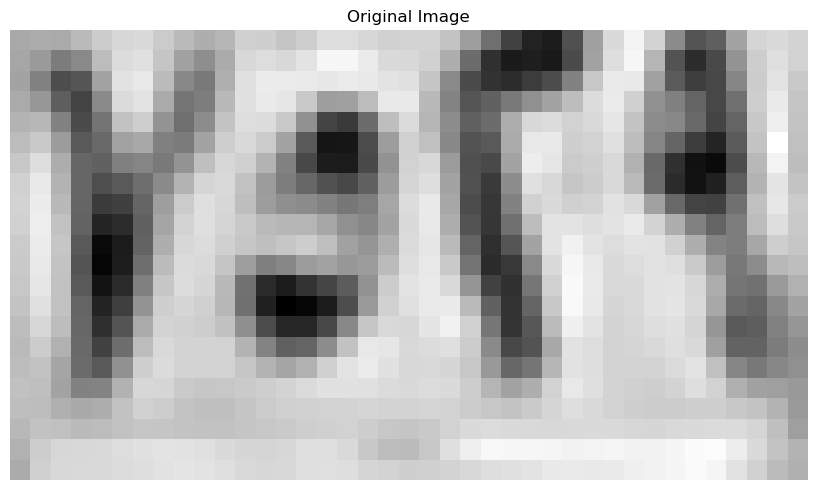

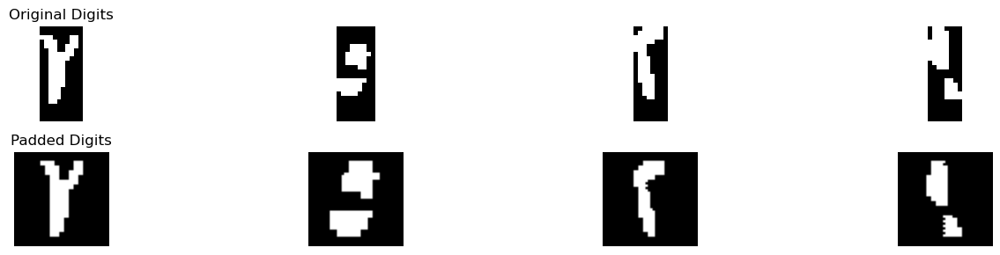

Best match: ٧
Full comparison results: {'١': 0.8090277777777777, '٢': 1.3402777777777777, '٣': 2.9702119883040936, '٤': 1.7951388888888888, '٥': 1.444862155388471, '٦': 0.9097222222222222, '٧': 3.0180555555555557, '٨': 1.75, '٩': 1.1180555555555556}
Confidence :  0.023921783625731052
Best match: ٥
Full comparison results: {'١': 0.8571428571428571, '٢': 1.607142857142857, '٣': 1.2455357142857144, '٤': 2.3229166666666665, '٥': 6.514880952380952, '٦': 1.9062499999999998, '٧': 0.7619047619047619, '٨': 1.3482142857142856, '٩': 0.994575652841782}
Confidence :  2.0959821428571423
Best match: ٢
Full comparison results: {'١': 0.3557692307692308, '٢': 6.483173076923077, '٣': 4.774477554179566, '٤': 2.7667582417582417, '٥': 2.1841644552557864, '٦': 0.9705357142857143, '٧': 2.4746323529411764, '٨': 0.51875, '٩': 0.8596970839617899}
Confidence :  0.8543477613717552
Best match: ٩
Full comparison results: {'١': 1.5833333333333333, '٢': 3.310416666666667, '٣': 2.5198335913312695, '٤': 3.72688172043010

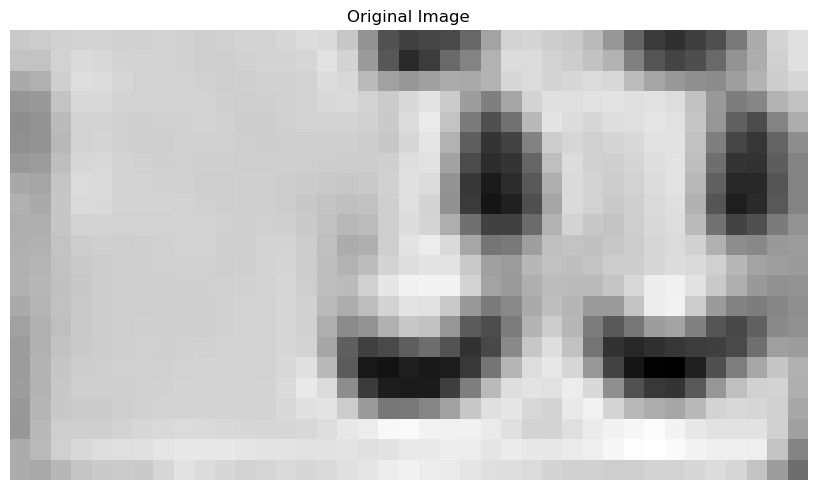

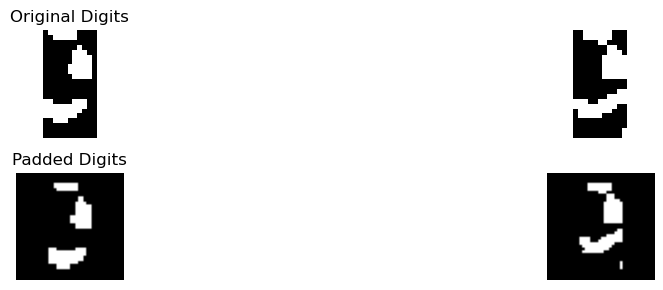

Best match: د
Full comparison results: {'أ': 0.09375, 'ب': 0.16594827586206895, 'ج': 1.7254931561996778, 'د': 4.322142542556629, 'ر': 1.8051284985387492, 'س': 1.5669642857142856, 'ص': 1.3413690476190476, 'ط': 1.2001386586765268, 'ع': 1.6535801579867355, 'ف': 3.2655597326649963, 'ق': 4.21527399156124, 'ك': 0.8835227272727273, 'ل': 2.747810943599408, 'م': 0.4772727272727273, 'ن': 3.409940476190476, 'ه': 1.1809811827956989, 'و': 2.795238095238095, 'ي': 2.385869565217391}
Confidence :  0.05343427549769464
Best match: ه
Full comparison results: {'أ': 0.1875, 'ب': 0.03125, 'ج': 0.03125, 'د': 1.2713255100019807, 'ر': 0.28535714285714286, 'س': 0.9553571428571428, 'ص': 0.5866071428571429, 'ط': 0.2301534808109142, 'ع': 0.15833333333333333, 'ف': 1.1899714564188246, 'ق': 0.7860693400167085, 'ك': 0.0, 'ل': 0.5416021671826625, 'م': 0.8664772727272727, 'ن': 0.7139880952380953, 'ه': 1.3311155913978494, 'و': 1.190524193548387, 'ي': 0.10597826086956522}
Confidence :  0.02989504069793436
[['٧', '٥', '٢',

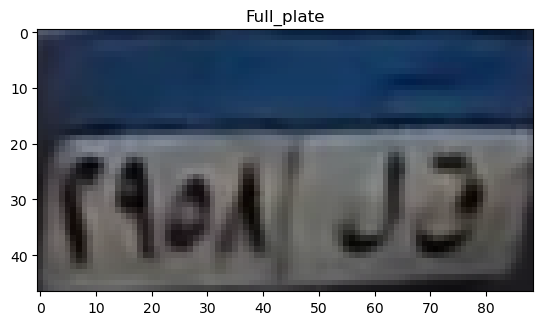

top
[0.14232235 0.12663608 0.13449412 0.20032745 0.27456941 0.35216745
 0.42667725 0.49334392 0.51211843 0.49643216 0.48578353 0.51240118
 0.52136039 0.48943725 0.48411686 0.51548941 0.53538    0.52249922
 0.49840431 0.50624745 0.52193373 0.53341569 0.53845333 0.53341569
 0.51884549 0.49923765 0.4871902  0.47542549 0.46758235 0.46758235
 0.47486    0.47569333 0.48073882 0.47177961 0.44711137 0.42441529
 0.41573882 0.41966039 0.42386471 0.43282392 0.44515412 0.45019176
 0.45411333 0.45411333]
[0.13895137 0.12354784 0.15073098 0.24401529 0.32106275 0.37204314
 0.41154157 0.47428667 0.52526706 0.5331102  0.53703176 0.5448749
 0.51014627 0.47093059 0.47064784 0.49698275 0.51659059 0.50090431
 0.48381922 0.48745804 0.49137961 0.4796149  0.47541059 0.4678502
 0.46000706 0.45216392 0.45188118 0.44795961 0.44515412 0.45271451
 0.45635333 0.45607059 0.45802784 0.4577451  0.44400824 0.43699843
 0.42915529 0.42131216 0.41795608 0.41795608 0.42327647 0.43140235
 0.43532392 0.43532392]
[0.13921922 

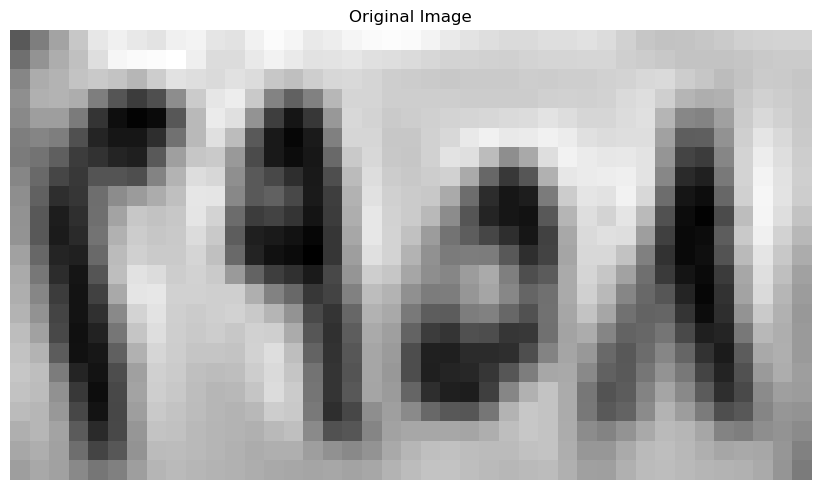

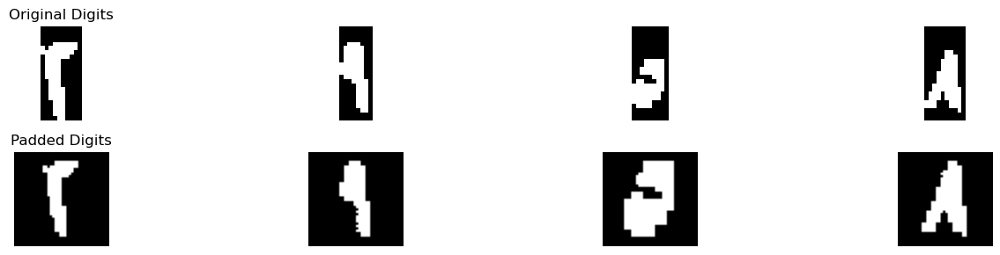

Best match: ٢
Full comparison results: {'١': 0.7875, '٢': 5.841666666666667, '٣': 4.284345975232198, '٤': 3.3625, '٥': 2.100591552410438, '٦': 1.45, '٧': 2.1305147058823533, '٨': 0.6680555555555556, '٩': 1.1144607843137255}
Confidence :  0.7786603457172343
Best match: ٩
Full comparison results: {'١': 3.0697115384615388, '٢': 3.814903846153846, '٣': 1.8495549535603715, '٤': 2.2859432234432235, '٥': 2.8176184947663274, '٦': 2.0214285714285714, '٧': 0.9268382352941177, '٨': 2.5277777777777777, '٩': 4.490463172448467}
Confidence :  0.33777966314731067
Best match: ٥
Full comparison results: {'١': 0.5238095238095237, '٢': 1.4389880952380953, '٣': 1.3392857142857144, '٤': 1.989583333333333, '٥': 6.912202380952381, '٦': 1.8764880952380951, '٧': 1.0, '٨': 1.1428571428571428, '٩': 0.4583333333333333}
Confidence :  2.461309523809524
Best match: ٨
Full comparison results: {'١': 1.368421052631579, '٢': 1.03125, '٣': 0.8421052631578947, '٤': 0.7039473684210527, '٥': 2.725955513784461, '٦': 1.4134868

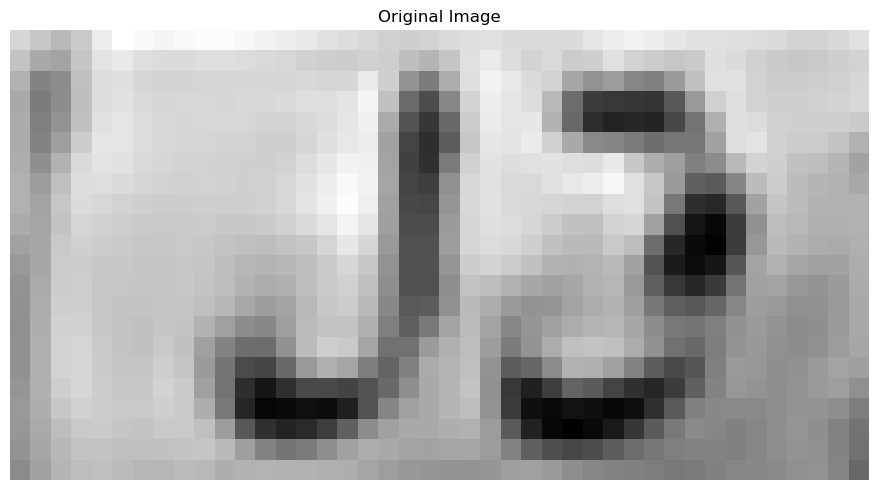

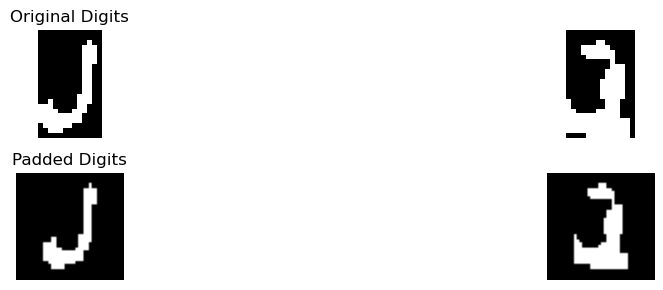

Best match: ل
Full comparison results: {'أ': 0.15000000000000002, 'ب': 0.03125, 'ج': 0.6776972624798712, 'د': 2.61493265993266, 'ر': 3.4620170272006856, 'س': 1.7767857142857144, 'ص': 1.919642857142857, 'ط': 1.4677618577075098, 'ع': 0.7625000000000002, 'ف': 2.139616402116402, 'ق': 2.0109126984126986, 'ك': 1.0918560606060606, 'ل': 4.38125, 'م': 0.15000000000000002, 'ن': 3.244940476190476, 'ه': 1.1153897849462366, 'و': 2.146130952380952, 'ي': 2.317119565217391}
Confidence :  0.459616486399657
Best match: ف
Full comparison results: {'أ': 0.86875, 'ب': 0.22844827586206895, 'ج': 3.000416954221302, 'د': 4.6590867003367, 'ر': 1.3933735810666095, 'س': 1.4419642857142856, 'ص': 1.1916666666666667, 'ط': 1.7538290513833992, 'ع': 1.3562500000000002, 'ف': 4.831283068783069, 'ق': 3.917261904761905, 'ك': 1.1893939393939394, 'ل': 1.3499999999999999, 'م': 0.7971590909090909, 'ن': 3.1865476190476194, 'ه': 2.0903225806451613, 'و': 2.17364417989418, 'ي': 1.9227494425863991}
Confidence :  0.08609818422318449

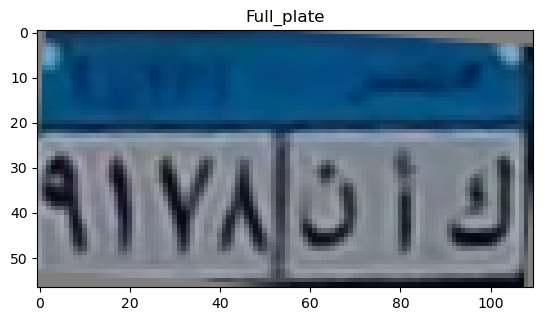

0.0 52.0 2.0 34.0
top
[0.65502391 0.57696995 0.56856049 0.55380784 0.54427529 0.5635152
 0.57601694 0.57832012 0.55174501 0.52451265 0.51890192 0.51321789
 0.51430964 0.52563922 0.52975936 0.54486181 0.54721602 0.54114352
 0.56417456 0.56986728 0.52718558 0.50134099 0.52945277 0.54654965
 0.55116968 0.55710928 0.5525032  0.54436299 0.53743034 0.52975036
 0.52612026 0.52779825 0.51984552 0.51571637 0.51868561 0.52607404
 0.53073699 0.54273106 0.55139779 0.5633751  0.54748061 0.51082973
 0.51200885 0.51895921 0.5241727  0.53050079 0.53128456 0.53265774
 0.53402627 0.54062678 0.56532651 0.57045575]
[0.62309715 0.59366607 0.626298   0.58926088 0.43940706 0.42687701
 0.48247964 0.57082206 0.57518404 0.55678519 0.52963673 0.50567371
 0.5045505  0.53991385 0.56324412 0.57791936 0.55474986 0.47680099
 0.52198352 0.59750249 0.55617617 0.49951696 0.50802968 0.5272652
 0.53098587 0.54508667 0.56077571 0.53314526 0.50323368 0.5142863
 0.55922382 0.5756401  0.53694695 0.52656968 0.5489282  0.551059

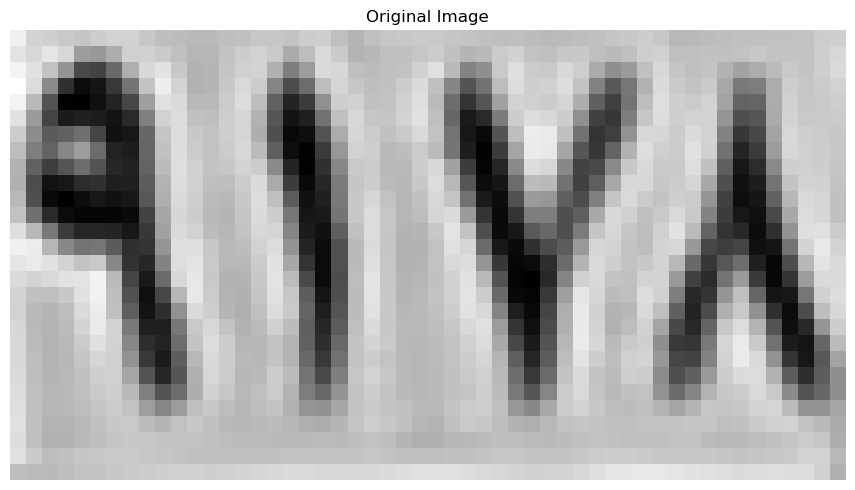

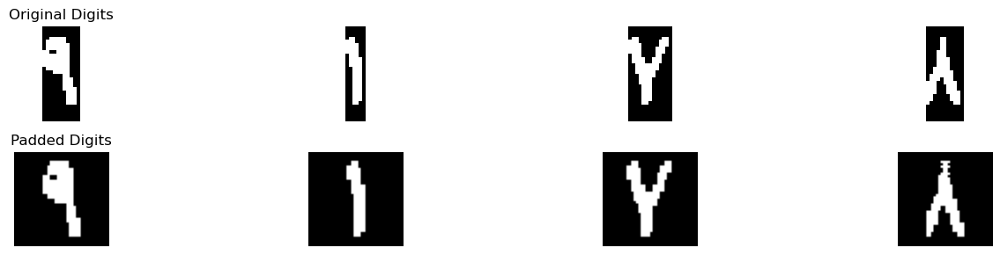

Best match: ٩
Full comparison results: {'١': 1.90625, '٢': 2.59375, '٣': 2.342202012383901, '٤': 1.90625, '٥': 2.572322349992629, '٦': 3.0625, '٧': 1.144485294117647, '٨': 2.8187499999999996, '٩': 5.120098039215686}
Confidence :  1.0287990196078431
Best match: ١
Full comparison results: {'١': 6.3625, '٢': 1.6469259906759905, '٣': 0.7364551083591331, '٤': 1.2953754578754577, '٥': 1.390221878224974, '٦': 1.4000000000000001, '٧': 1.224264705882353, '٨': 2.3944444444444444, '٩': 1.9460941427853191}
Confidence :  1.9840277777777777
Best match: ٧
Full comparison results: {'١': 0.21052631578947367, '٢': 1.5773026315789473, '٣': 2.725328947368421, '٤': 1.6924342105263155, '٥': 1.0274122807017543, '٦': 0.4131578947368421, '٧': 4.67828947368421, '٨': 1.2023026315789473, '٩': 1.6990131578947367}
Confidence :  0.9764802631578948
Best match: ٨
Full comparison results: {'١': 3.15625, '٢': 1.03125, '٣': 0.7401315789473684, '٤': 1.59375, '٥': 1.1571345643520565, '٦': 0.4875, '٧': 0.8503676470588236, '

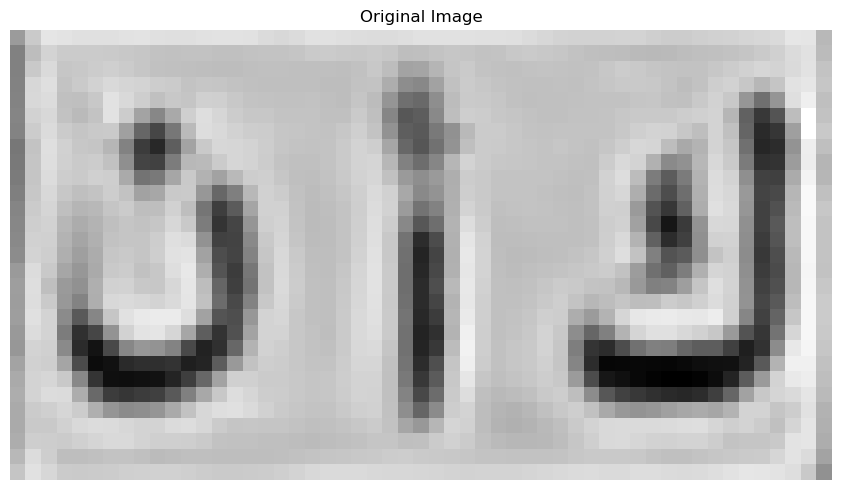

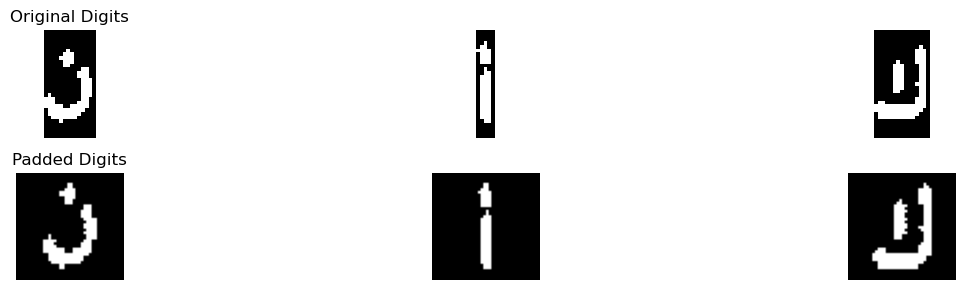

Best match: ن
Full comparison results: {'أ': 0.6062500000000001, 'ب': 0.39588859416445626, 'ج': 1.5408629514607777, 'د': 4.083316498316498, 'ر': 1.8651474262868564, 'س': 1.0580357142857144, 'ص': 0.9999999999999999, 'ط': 2.0509305006587617, 'ع': 1.075, 'ف': 3.254728835978836, 'ق': 2.6426256613756616, 'ك': 0.5388257575757576, 'ل': 2.8812500000000005, 'م': 0.797159090909091, 'ن': 4.774166666666667, 'ه': 1.2643817204301075, 'و': 2.0620039682539684, 'ي': 1.7319467670011148}
Confidence :  0.34542508417508433
Best match: أ
Full comparison results: {'أ': 3.4345201169797943, 'ب': 0.47521551724137934, 'ج': 0.7762609270761444, 'د': 0.5914052287581699, 'ر': 0.0, 'س': 0.0, 'ص': 0.29970238095238094, 'ط': 1.150278645501296, 'ع': 0.0625, 'ف': 0.32291666666666663, 'ق': 0.05263157894736842, 'ك': 0.11837121212121211, 'ل': 0.0, 'م': 0.0625, 'ن': 0.28125, 'ه': 0.4467741935483871, 'و': 0.4660714285714286, 'ي': 0.4810210622710622}
Confidence :  1.142120735739249
Best match: ك
Full comparison results: {'أ': 0

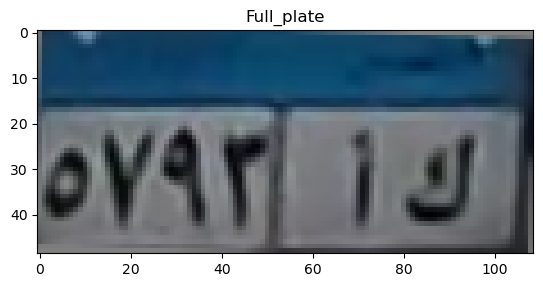

top
[0.37829329 0.46608583 0.44425848 0.46386164 0.47192582 0.47214725
 0.45709538 0.44446319 0.4459175  0.45121891 0.4608585  0.46603329
 0.46984309 0.48449114 0.49064629 0.46192573 0.48300285 0.52124281
 0.50917888 0.48496108 0.48088356 0.49136175 0.50975179 0.48456372
 0.43758408 0.44769    0.47727362 0.4877217  0.5194203  0.56148571
 0.53863338 0.40199738 0.33014546 0.43809201 0.56321926 0.55434103
 0.51248221 0.50797869 0.52392854 0.5441707  0.54679135 0.50587234
 0.49025131 0.54224348 0.59103002 0.56158251 0.52713074 0.52275672
 0.51203583 0.49007708 0.43508423 0.36574979 0.31278124 0.30446825]
[0.3808268  0.48228696 0.4515623  0.47239702 0.48122598 0.48048237
 0.47104494 0.46031134 0.45297201 0.45125543 0.45502915 0.45725767
 0.47512478 0.49121207 0.4723795  0.38255027 0.38339034 0.50486656
 0.53124605 0.49218549 0.49673413 0.51720855 0.51830078 0.42889547
 0.3655127  0.40421338 0.47995347 0.50649423 0.56299149 0.54268642
 0.39578342 0.19998686 0.13361904 0.27012873 0.4821943  0

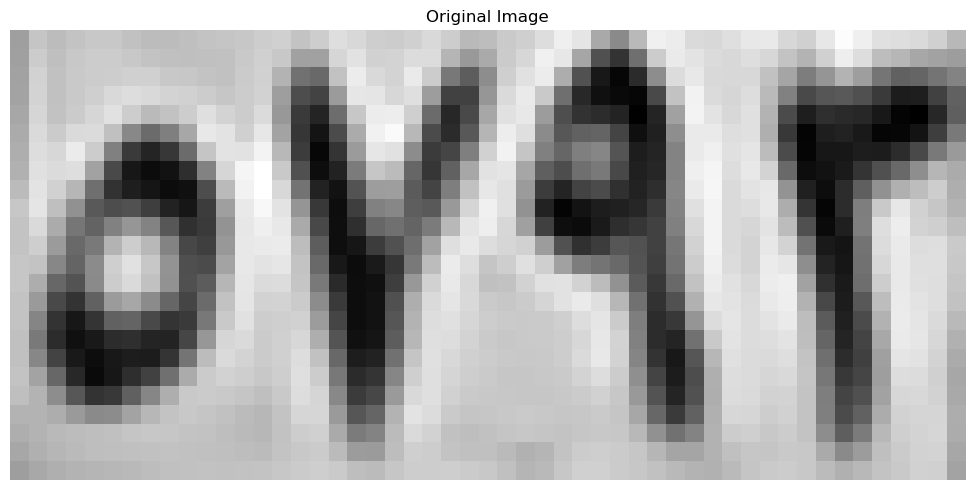

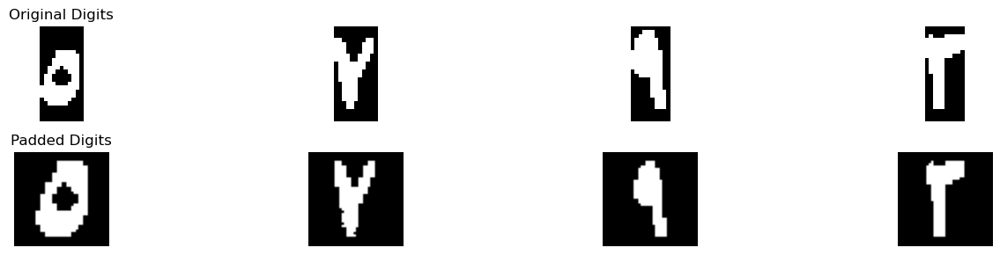

Best match: ٥
Full comparison results: {'١': 0.6363636363636364, '٢': 1.0028409090909092, '٣': 1.1789772727272727, '٤': 2.0625, '٥': 6.187499999999999, '٦': 1.4204545454545456, '٧': 0.909090909090909, '٨': 0.8181818181818181, '٩': 0.30397727272727276}
Confidence :  2.0624999999999996
Best match: ٧
Full comparison results: {'١': 0.4117647058823529, '٢': 1.411764705882353, '٣': 3.0403444272445816, '٤': 1.9319852941176472, '٥': 1.6077924590888986, '٦': 0.511764705882353, '٧': 4.040073529411765, '٨': 1.4700163398692812, '٩': 1.6744281045751634}
Confidence :  0.4998645510835915
Best match: ٩
Full comparison results: {'١': 2.955357142857143, '٢': 3.004464285714286, '٣': 1.74593653250774, '٤': 2.5250000000000004, '٥': 2.938942024178092, '٦': 2.264880952380952, '٧': 1.238235294117647, '٨': 2.795138888888889, '٩': 4.957633053221288}
Confidence :  0.9765843837535011
Best match: ٣
Full comparison results: {'١': 0.1875, '٢': 3.75, '٣': 5.429179566563468, '٤': 2.78125, '٥': 2.6904301194161877, '٦':

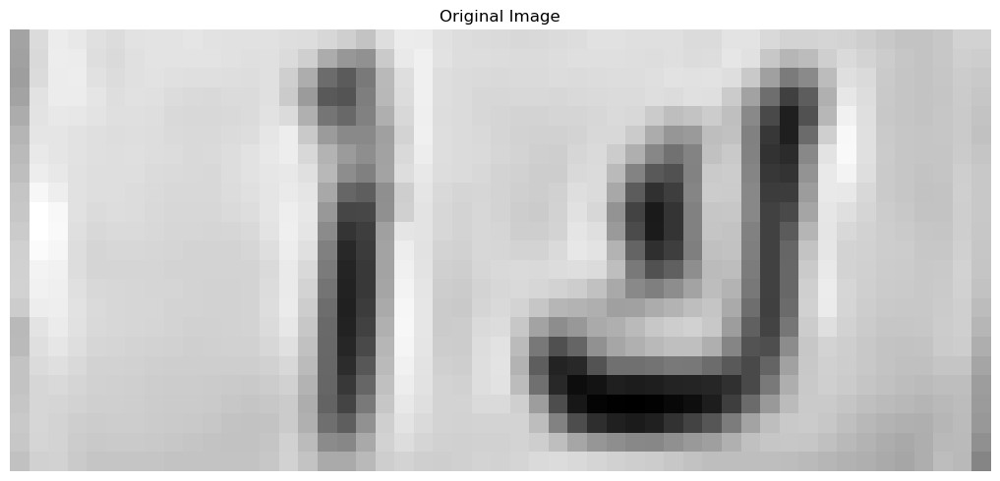

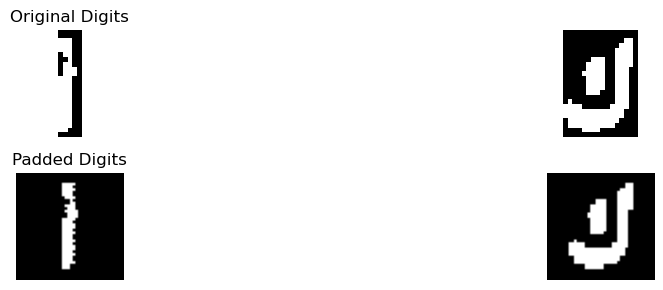

Best match: أ
Full comparison results: {'أ': 2.4956501831501834, 'ب': 0.25, 'ج': 0.38819875776397517, 'د': 0.7891008120419886, 'ر': 0.03125, 'س': 0.1294642857142857, 'ص': 0.4303571428571429, 'ط': 1.1292407773386033, 'ع': 0.25, 'ف': 0.6811038011695907, 'ق': 0.11513157894736842, 'ك': 0.0, 'ل': 0.0, 'م': 0.30965909090909094, 'ن': 0.4375, 'ه': 0.7342069892473118, 'و': 0.6116071428571428, 'ي': 0.36395757020757014}
Confidence :  0.68320470290579
Best match: ك
Full comparison results: {'أ': 0.6145833333333334, 'ب': 0.5233753315649867, 'ج': 1.0891203703703702, 'د': 3.164027777777778, 'ر': 2.493778735632184, 'س': 1.7946428571428572, 'ص': 1.9833333333333334, 'ط': 2.03125, 'ع': 1.1979166666666667, 'ف': 2.392857142857143, 'ق': 1.4039351851851853, 'ك': 3.854166666666666, 'ل': 2.1145833333333335, 'م': 0.125, 'ن': 2.719583333333333, 'ه': 2.134072580645161, 'و': 2.6203703703703702, 'ي': 2.2810897435897433}
Confidence :  0.345069444444444
[['٥', '٧', '٩', '٣'], ['أ', 'ك']]
Tilt angle: -1.00 degrees


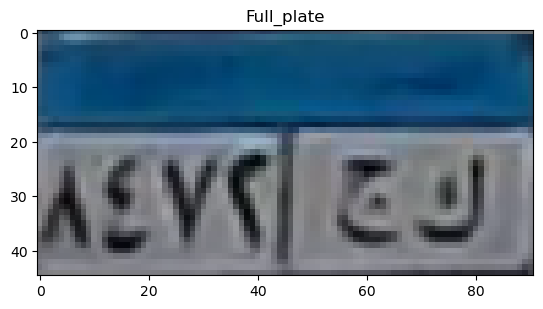

top
[0.55480631 0.59848219 0.60319145 0.5800046  0.55881362 0.5701725
 0.57922446 0.58578213 0.58954333 0.59038066 0.59310392 0.59125881
 0.59684012 0.59911494 0.59594549 0.59355195 0.59238804 0.5998898
 0.604622   0.5975763  0.59040488 0.59493667 0.60545828 0.60928895
 0.5970889  0.59626788 0.59462327 0.59412933 0.59376168 0.59661034
 0.60013719 0.60585735 0.61110845 0.6073802  0.60391733 0.58211391
 0.6044752  0.6623694  0.68101257 0.68788039 0.68418586 0.67516127
 0.66554575 0.61525069 0.44665219]
[0.57426745 0.57929196 0.55292118 0.51836235 0.50600412 0.51249922
 0.5149502  0.5334551  0.53546314 0.53644353 0.54154941 0.54498078
 0.54988275 0.54718667 0.53333863 0.53174549 0.53538784 0.54519176
 0.52860392 0.50740294 0.48774784 0.49951255 0.53782314 0.54836235
 0.5204098  0.51857157 0.51375804 0.5181698  0.52601294 0.52650314
 0.53021373 0.52727255 0.5303949  0.52218412 0.51354353 0.52604353
 0.57914154 0.60862755 0.66090295 0.65775339 0.60536427 0.61257776
 0.5885076  0.56047374 0.

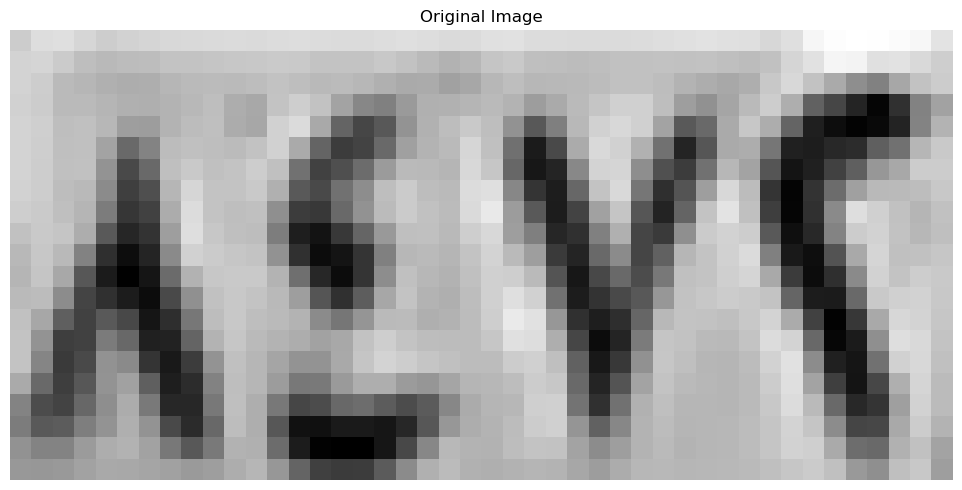

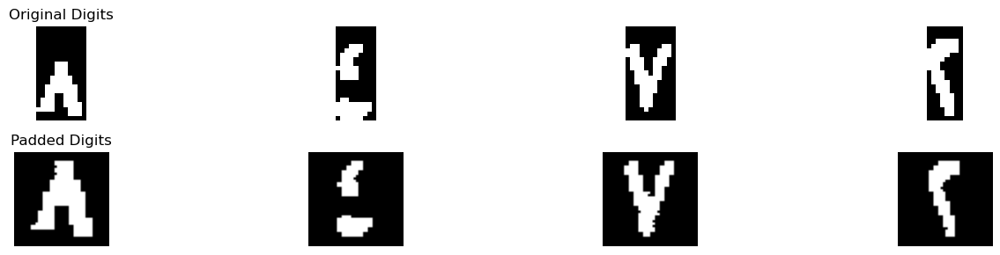

Best match: ٥
Full comparison results: {'١': 0.9615384615384616, '٢': 1.4807692307692308, '٣': 0.6778846153846154, '٤': 1.1322115384615385, '٥': 3.6947115384615383, '٦': 1.1274038461538463, '٧': 0.4855769230769231, '٨': 2.5673076923076925, '٩': 1.6826923076923077}
Confidence :  0.5637019230769229
Best match: ٤
Full comparison results: {'١': 1.1791666666666667, '٢': 2.4604166666666667, '٣': 1.5432469040247678, '٤': 5.543346774193548, '٥': 4.133030185758514, '٦': 0.26666666666666666, '٧': 0.6191176470588236, '٨': 1.3888888888888888, '٩': 2.02240275142315}
Confidence :  0.705158294217517
Best match: ٧
Full comparison results: {'١': 0.47619047619047616, '٢': 1.412202380952381, '٣': 1.6800595238095237, '٤': 1.3794642857142858, '٥': 1.9598214285714284, '٦': 1.2217261904761905, '٧': 4.419642857142857, '٨': 0.8854166666666667, '٩': 1.2633928571428572}
Confidence :  1.2299107142857142
Best match: ٢
Full comparison results: {'١': 1.4350961538461537, '٢': 6.78125, '٣': 4.260448916408668, '٤': 3.1

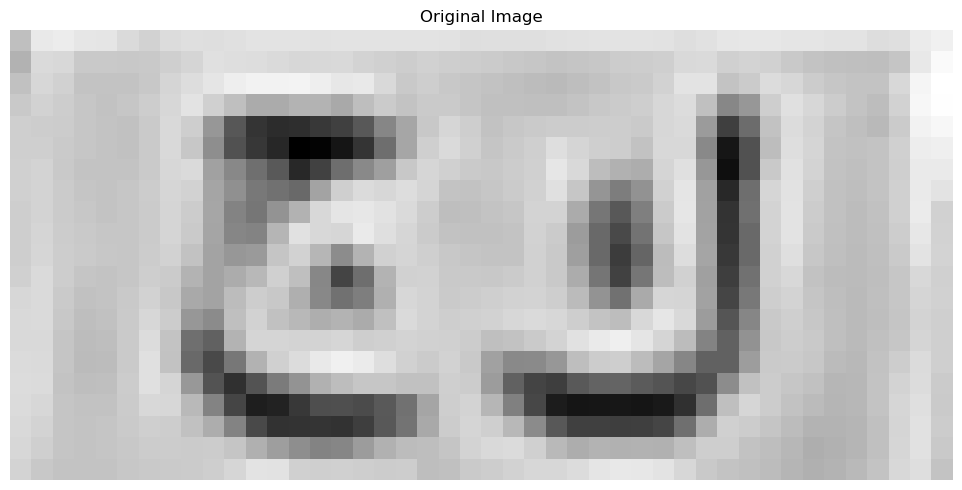

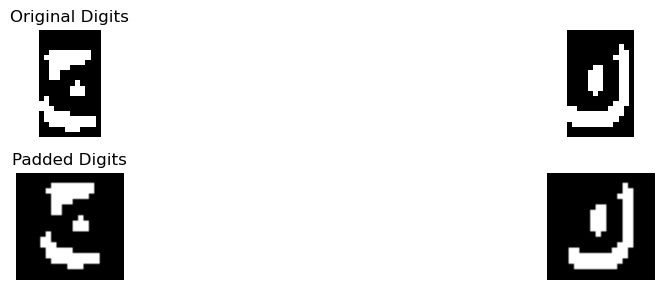

Best match: ج
Full comparison results: {'أ': 0.36363636363636365, 'ب': 0.4856598143236074, 'ج': 5.008106426584687, 'د': 2.383114478114478, 'ر': 0.6081438258143657, 'س': 0.35714285714285715, 'ص': 0.26420454545454547, 'ط': 0.9523221343873518, 'ع': 1.3011363636363638, 'ف': 2.5630711880711883, 'ق': 1.906881313131313, 'ك': 0.9251893939393939, 'ل': 0.71875, 'م': 0.8977272727272727, 'ن': 1.4698863636363637, 'ه': 0.7956989247311828, 'و': 1.3420664983164983, 'ي': 1.5376469544947806}
Confidence :  1.2225176192567495
Best match: ك
Full comparison results: {'أ': 0.49999999999999994, 'ب': 0.8287466843501327, 'ج': 1.1226851851851851, 'د': 2.8214351851851855, 'ر': 2.910574712643678, 'س': 1.25, 'ص': 1.69375, 'ط': 3.3958333333333335, 'ع': 1.4895833333333335, 'ف': 2.4770171957671954, 'ق': 1.2916666666666667, 'ك': 5.40625, 'ل': 1.6666666666666667, 'م': 0.041666666666666664, 'ن': 2.3741666666666665, 'ه': 1.5060483870967742, 'و': 2.5381944444444446, 'ي': 2.3886217948717947}
Confidence :  1.0052083333333333

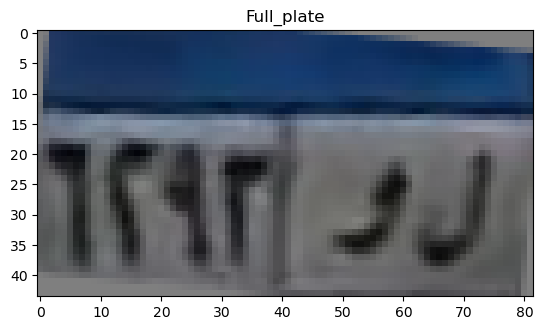

top
[0.39214488 0.29374237 0.15202479 0.13738091 0.10881309 0.10239305
 0.14317572 0.14121971 0.28974882 0.43481337 0.44614412 0.45152304
 0.38476219 0.28481007 0.17231977 0.09370179 0.08360738 0.09748498
 0.17036551 0.21322146 0.30549137 0.37504904 0.33052759 0.31467487
 0.25491583 0.24364696 0.33450767 0.42177882 0.44243786 0.4742462
 0.46874999 0.40424152 0.38303994 0.39810987 0.42116505 0.42663409
 0.41285304 0.4029019  0.39937626 0.3838532  0.35997235]
[0.35105154 0.26845585 0.09363735 0.05818154 0.0375575  0.02405271
 0.04615233 0.04749948 0.26403166 0.40903488 0.42463857 0.41428137
 0.30264687 0.16662978 0.0848567  0.04403789 0.01952463 0.0364416
 0.11341201 0.24703083 0.31768417 0.35519783 0.3211542  0.24209049
 0.16949039 0.1565962  0.24939623 0.37037208 0.3960507  0.40931531
 0.38451484 0.33164139 0.29650821 0.28737926 0.31905053 0.32318926
 0.29814045 0.28980235 0.30355703 0.31406594 0.32002229]
[0.34270825 0.29543025 0.14279723 0.07918893 0.06909225 0.07587975
 0.06327088 0

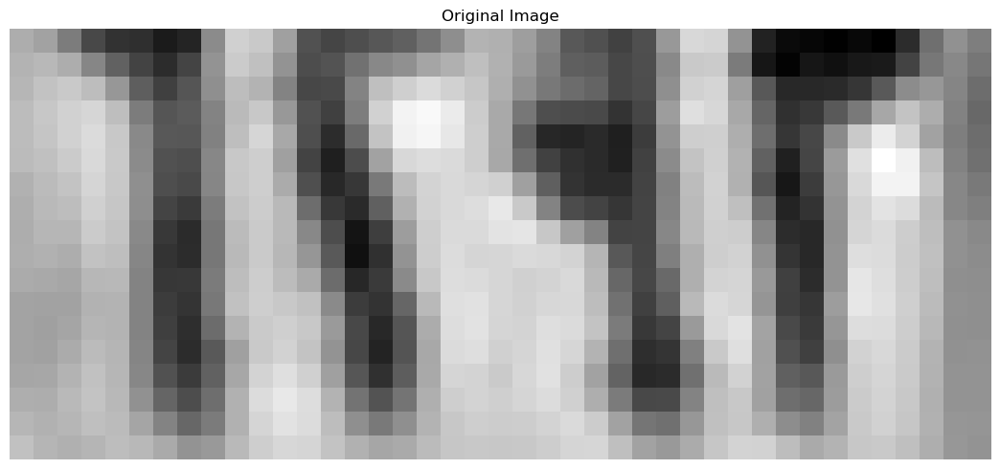

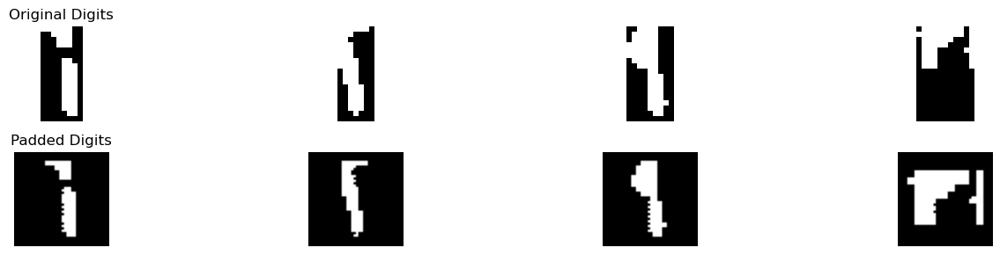

Best match: ٦
Full comparison results: {'١': 1.670673076923077, '٢': 1.4230769230769231, '٣': 0.3713235294117647, '٤': 0.33035714285714285, '٥': 1.6781245392893998, '٦': 3.336309523809524, '٧': 0.2665441176470588, '٨': 1.1194444444444445, '٩': 1.2086004273504274}
Confidence :  0.8290924922600622
Best match: ٢
Full comparison results: {'١': 0.8835227272727273, '٢': 4.976471445221446, '٣': 2.5823335913312695, '٤': 3.4996336996336996, '٥': 1.2264438670204925, '٦': 0.3229166666666667, '٧': 2.0606617647058822, '٨': 0.7986111111111112, '٩': 1.6671694318753145}
Confidence :  0.738418872793873
Best match: ٢
Full comparison results: {'١': 3.2354166666666666, '٢': 3.9875, '٣': 2.279702012383901, '٤': 2.408333333333333, '٥': 2.8127579979360164, '٦': 1.6833333333333331, '٧': 1.2283088235294117, '٨': 2.115972222222222, '٩': 3.822222222222222}
Confidence :  0.08263888888888893
Best match: ٩
Full comparison results: {'١': 0.59375, '٢': 0.5, '٣': 0.8125, '٤': 0.46875, '٥': 0.78125, '٦': 0.40625, '٧': 

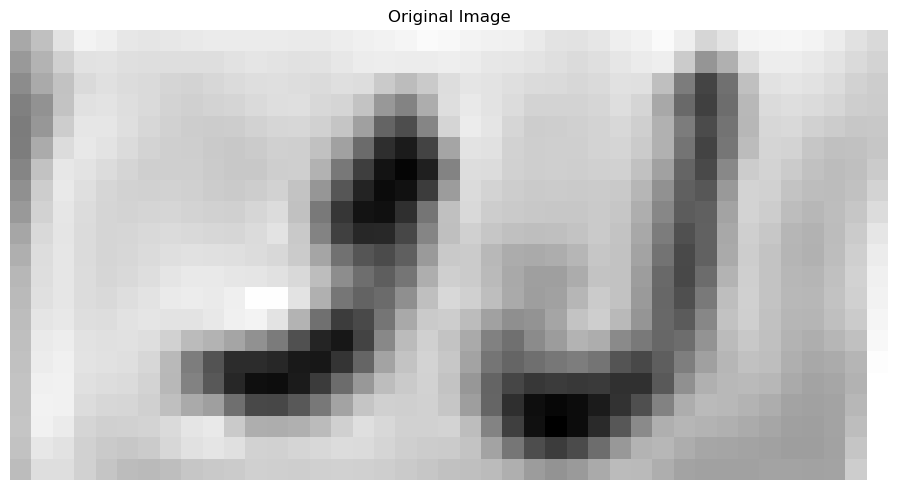

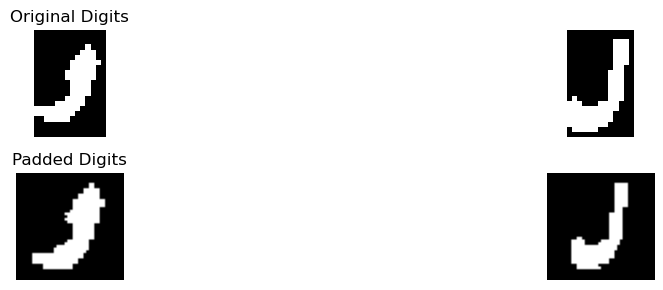

Best match: و
Full comparison results: {'أ': 0.48148148148148145, 'ب': 0.42496807151979565, 'ج': 0.46064814814814814, 'د': 3.3877314814814814, 'ر': 3.124201787994891, 'س': 3.486607142857143, 'ص': 3.4194444444444443, 'ط': 2.84375, 'ع': 0.5949074074074074, 'ف': 3.5808531746031744, 'ق': 2.418981481481481, 'ك': 2.6643518518518516, 'ل': 1.8703703703703702, 'م': 0.1423611111111111, 'ن': 1.6342592592592593, 'ه': 3.09375, 'و': 4.030092592592592, 'ي': 3.17037037037037}
Confidence :  0.22461970899470862
Best match: د
Full comparison results: {'أ': 0.14285714285714285, 'ب': 0.28771551724137934, 'ج': 0.9331794916034045, 'د': 3.484591750841751, 'ر': 2.9460099414578425, 'س': 2.633928571428571, 'ص': 2.0964285714285715, 'ط': 1.9214426877470359, 'ع': 0.9479166666666665, 'ف': 3.3389550264550265, 'ق': 2.560846560846561, 'ك': 1.9015151515151514, 'ل': 2.732142857142857, 'م': 0.2792207792207792, 'ن': 2.7080357142857148, 'ه': 1.3913978494623656, 'و': 2.447420634920635, 'ي': 2.567391304347826}
Confidence :  0

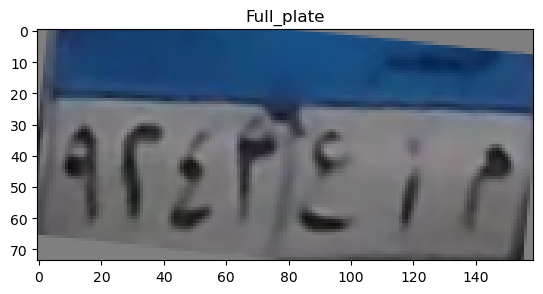

top
[0.1898132  0.23852445 0.38830526 0.41422977 0.37931921 0.38855716
 0.43038402 0.45678188 0.4707851  0.48218471 0.49757495 0.50993495
 0.47367957 0.37964968 0.28970936 0.26789542 0.34005592 0.43996873
 0.49235323 0.49341304 0.48504737 0.48377169 0.48403409 0.48454103
 0.48472592 0.4869808  0.49638901 0.51251281 0.52634752 0.52475956
 0.47555584 0.37074757 0.24874416 0.1680853  0.15717441 0.183382
 0.19625455 0.21277926 0.27057645 0.36996217 0.46425292 0.51047381
 0.51612638 0.50825251 0.50349349 0.50237674 0.50352453 0.50844089
 0.51307761 0.5191481  0.51604608 0.50539318 0.49677852 0.48794445
 0.48073389 0.4760279  0.47142189 0.46837005 0.47208798 0.48238354
 0.49212317 0.49759147 0.50234912 0.50660844 0.49733908 0.46557324
 0.41725087 0.37242179 0.34446789 0.34888818 0.37143437 0.39255696
 0.41059005 0.42915469 0.44369742 0.45662351 0.47194166 0.4928757
 0.50818426]
[0.14034953 0.24702636 0.41843203 0.42554718 0.37996953 0.395242
 0.4442883  0.470459   0.48075782 0.48780258 0.503

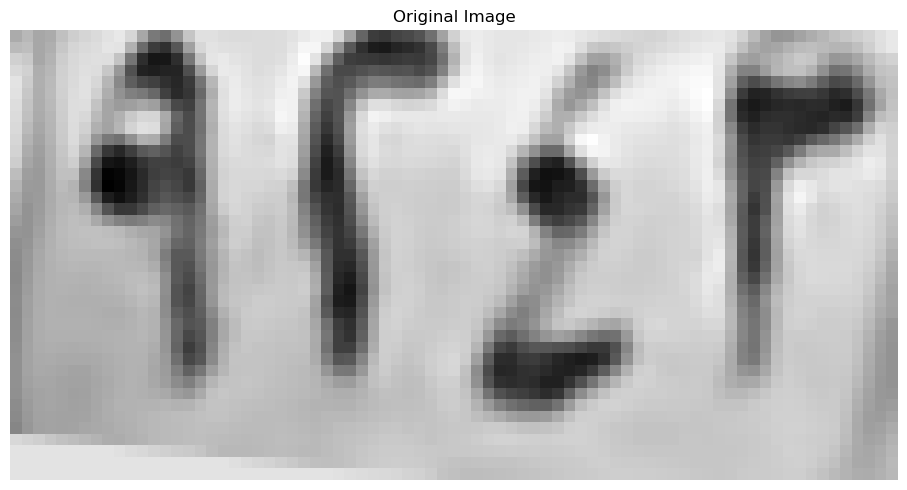

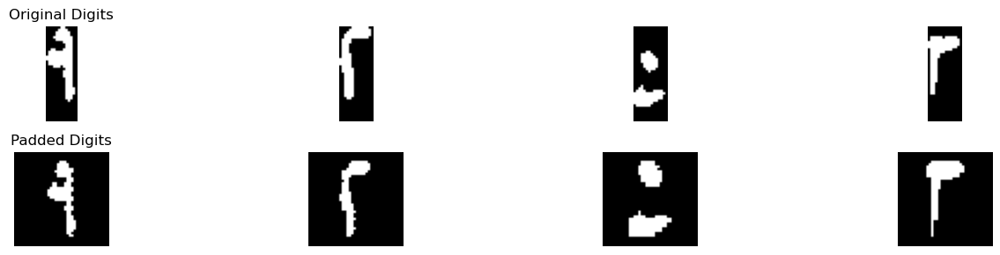

Best match: ٩
Full comparison results: {'١': 3.052083333333334, '٢': 1.8966346153846154, '٣': 0.7916021671826625, '٤': 1.4572573260073263, '٥': 1.356843395252838, '٦': 2.5267857142857144, '٧': 0.7481617647058824, '٨': 2.247916666666667, '٩': 4.0292703619909505}
Confidence :  0.48859351432880826
Best match: ٢
Full comparison results: {'١': 0.0, '٢': 4.675480769230769, '٣': 2.9135061919504643, '٤': 1.9713827838827838, '٥': 1.6743559265811587, '٦': 1.2589285714285714, '٧': 0.9191176470588236, '٨': 0.35, '٩': 0.6507038712921066}
Confidence :  0.8809872886401524
Best match: ٥
Full comparison results: {'١': 1.1041666666666667, '٢': 1.7187499999999996, '٣': 0.9391447368421052, '٤': 2.694444444444444, '٥': 5.360432330827068, '٦': 1.0118055555555556, '٧': 0.0, '٨': 2.1993055555555556, '٩': 1.375560035842294}
Confidence :  1.332993943191312
Best match: ٣
Full comparison results: {'١': 0.75, '٢': 2.46875, '٣': 4.583784829721362, '٤': 0.96875, '٥': 1.137609649122807, '٦': 2.8375, '٧': 1.0970588235

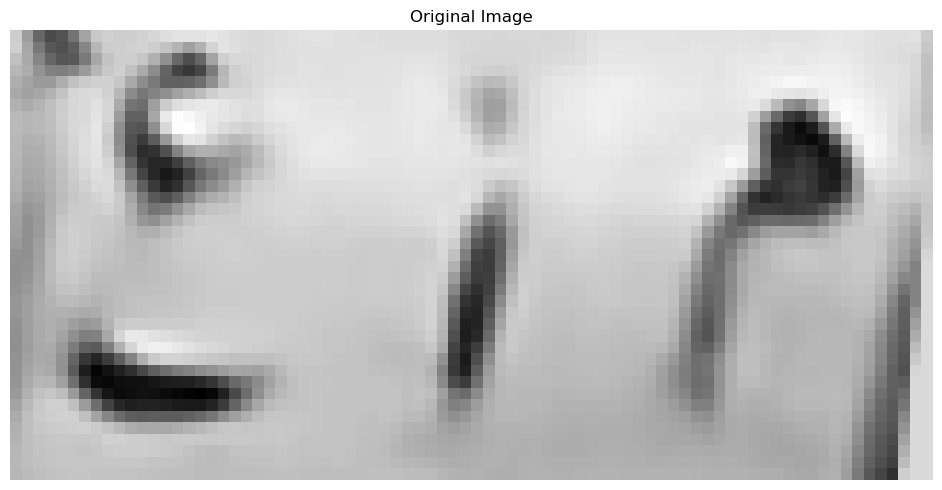

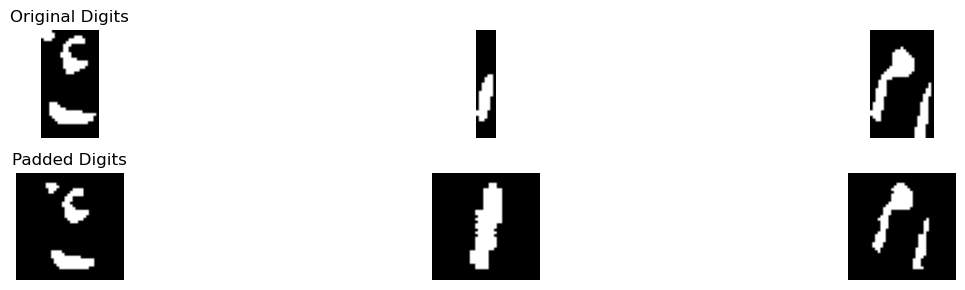

Best match: ج
Full comparison results: {'أ': 0.35416666666666663, 'ب': 0.06896551724137931, 'ج': 2.4347897975615367, 'د': 2.2233048736795875, 'ر': 0.9501071785535804, 'س': 0.75, 'ص': 0.6526785714285714, 'ط': 1.6122139168685452, 'ع': 1.893025728865258, 'ف': 1.6951451208666828, 'ق': 2.0210930103035367, 'ك': 1.5873106060606061, 'ل': 1.4947050597508262, 'م': 0.8945707070707072, 'ن': 1.970436507936508, 'ه': 0.3509408602150538, 'و': 1.8580779054916985, 'ي': 1.4188730955035305}
Confidence :  0.10574246194097459
Best match: و
Full comparison results: {'أ': 1.2451923076923077, 'ب': 0.1939655172413793, 'ج': 0.521314987347596, 'د': 1.3382825676788523, 'ر': 0.6831917077175698, 'س': 0.9285714285714286, 'ص': 1.3848214285714286, 'ط': 0.9405467720685112, 'ع': 0.2375, 'ف': 0.8537141464773044, 'ق': 0.3743438457254247, 'ك': 0.5814393939393939, 'ل': 0.7321013931888545, 'م': 1.444649100899101, 'ن': 0.634345238095238, 'ه': 1.7133064516129033, 'و': 1.8766203703703703, 'ي': 0.681594794094794}
Confidence :  0.

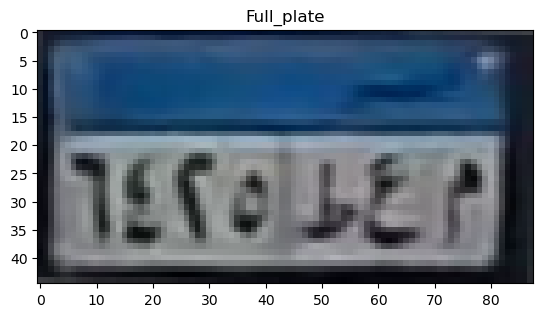

top
[0.09074235 0.05671137 0.1656102  0.39739941 0.52970333 0.57856164
 0.61947314 0.63999179 0.64001412 0.64213728 0.64639804 0.65150745
 0.6510465  0.64402996 0.64012539 0.63396286 0.63254653 0.63413266
 0.63739618 0.63573429 0.63241451 0.63308544 0.63422971 0.63752497
 0.63420879 0.640168   0.66385325 0.67446684 0.69741032 0.70605204
 0.70178094 0.68703778 0.62713585 0.6155963  0.65678131 0.66765382
 0.67440283 0.67475146 0.67119761 0.67314195 0.67525789 0.67203978
 0.63421744 0.58275569]
[0.0862877  0.0465177  0.15685275 0.41339238 0.55415371 0.55038553
 0.54748832 0.56773419 0.55667502 0.5747086  0.58906998 0.58872194
 0.59130085 0.58992653 0.58431137 0.58311892 0.58976961 0.59634961
 0.58596787 0.57232537 0.5613315  0.55569118 0.56256228 0.56953833
 0.58013265 0.60354473 0.61478054 0.5761776  0.55212451 0.55067
 0.5693051  0.61267368 0.60645837 0.58481863 0.58759265 0.57608418
 0.5712515  0.57074132 0.57012787 0.57309602 0.57537767 0.5792055
 0.5400363  0.48692235]
[0.08000706 0.

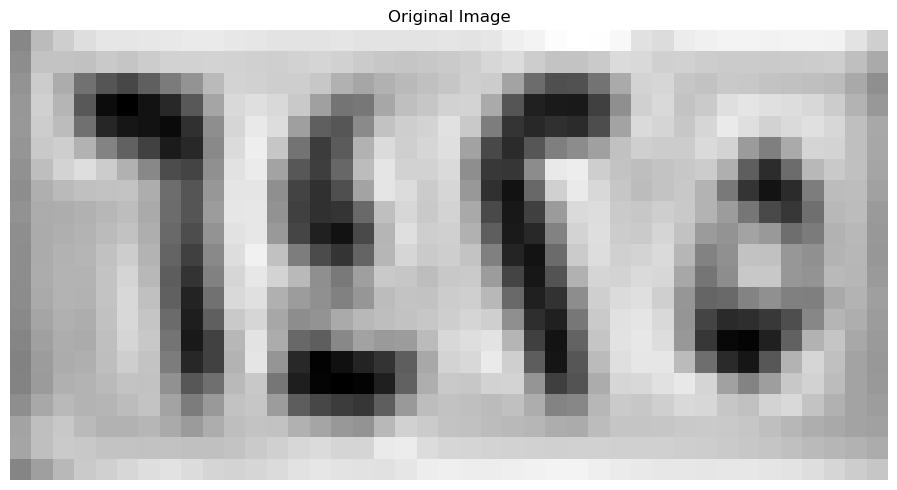

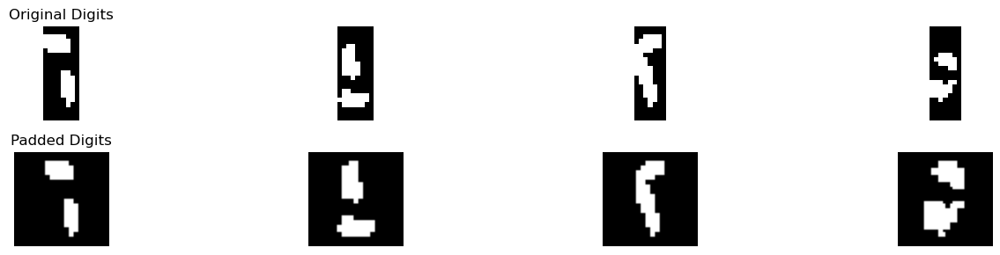

Best match: ٦
Full comparison results: {'١': 2.129464285714286, '٢': 1.4330357142857142, '٣': 1.8582623839009287, '٤': 0.0, '٥': 2.134025320654578, '٦': 5.722321428571429, '٧': 0.4852941176470588, '٨': 1.5854166666666667, '٩': 2.9343487394957983}
Confidence :  1.3939863445378153
Best match: ٤
Full comparison results: {'١': 2.09375, '٢': 1.34375, '٣': 1.435952012383901, '٤': 4.387096774193548, '٥': 2.920536635706914, '٦': 0.125, '٧': 0.7841911764705882, '٨': 2.6618055555555555, '٩': 2.9111519607843137}
Confidence :  0.733280069243317
Best match: ٢
Full comparison results: {'١': 1.40625, '٢': 6.719551282051282, '٣': 3.5552438080495357, '٤': 3.299038461538462, '٥': 2.4311053368715907, '٦': 0.8705357142857143, '٧': 2.8459558823529414, '٨': 0.9236111111111112, '٩': 1.9367458521870284}
Confidence :  1.5821537370008731
Best match: ٥
Full comparison results: {'١': 0.1764705882352941, '٢': 2.0716911764705883, '٣': 1.8116292569659445, '٤': 1.2261029411764708, '٥': 5.640415376676986, '٦': 1.72352

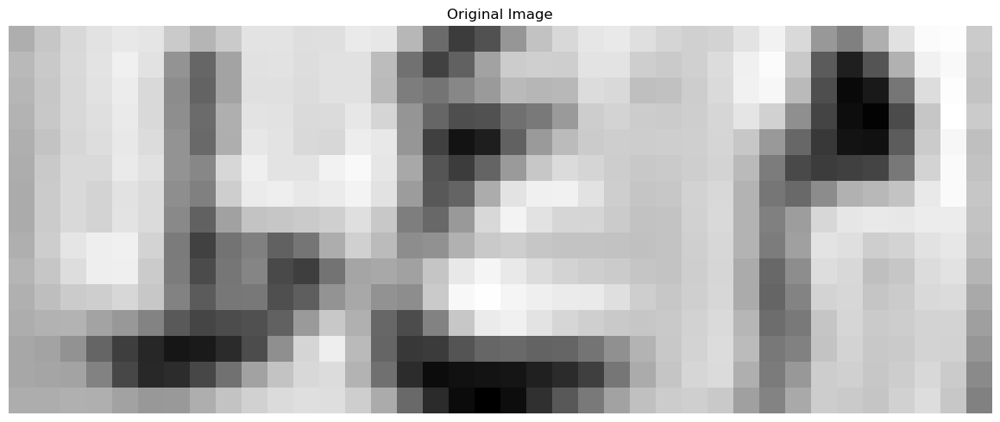

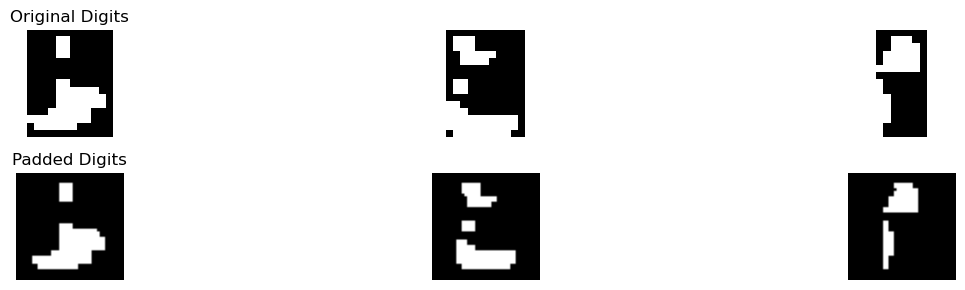

Best match: ط
Full comparison results: {'أ': 0.6163679808841098, 'ب': 0.5055076628352491, 'ج': 1.690972222222222, 'د': 3.4837962962962963, 'ر': 2.3202211661263386, 'س': 0.9241071428571428, 'ص': 0.6643518518518519, 'ط': 5.215046296296297, 'ع': 0.7255953116631648, 'ف': 4.161450332821301, 'ق': 1.4232601553166067, 'ك': 1.6990740740740742, 'ل': 0.914053166069295, 'م': 0.29282407407407407, 'ن': 2.1677867383512543, 'ه': 2.59375, 'و': 1.349537037037037, 'ي': 2.3220728793309435}
Confidence :  0.5267979817374981
Best match: ج
Full comparison results: {'أ': 0.19886363636363635, 'ب': 0.4160311671087533, 'ج': 3.3141423290879817, 'د': 3.101614129803785, 'ر': 1.4458742307168095, 'س': 0.7767857142857143, 'ص': 0.3773338220918866, 'ط': 1.644881788903528, 'ع': 1.986764310700629, 'ف': 2.1618013855917084, 'ق': 1.2328282828282828, 'ك': 2.7559872922776147, 'ل': 1.1666666666666667, 'م': 0.5681818181818181, 'ن': 2.6847727272727275, 'ه': 1.2623655913978493, 'و': 0.869984606914529, 'ي': 1.0521989026634888}
Confi

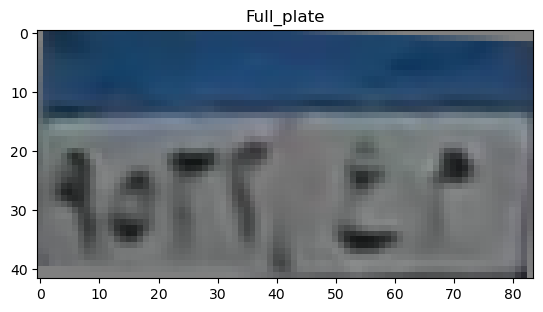

top
[0.44988255 0.48598879 0.45736414 0.46036192 0.46723522 0.48099713
 0.48495592 0.48071898 0.47407792 0.46851005 0.46203971 0.45934788
 0.45183618 0.44996858 0.44660973 0.44911914 0.45409627 0.45959473
 0.45957925 0.46252973 0.47184402 0.48221945 0.49090765 0.48784407
 0.49332408 0.50003493 0.50888625 0.51434085 0.51732336 0.51233444
 0.50532078 0.49982727 0.49733157 0.51495468 0.51945152 0.46470573
 0.44023605 0.45309211 0.47344032 0.47128501 0.45305982 0.43771005]
[0.4376101  0.487176   0.43815548 0.45174447 0.47111255 0.47964125
 0.47845794 0.46635329 0.45695553 0.45075689 0.449031   0.44899425
 0.44784732 0.45015486 0.44812048 0.45485395 0.46245245 0.47179679
 0.47362849 0.47716066 0.4871478  0.49616611 0.51065918 0.49567843
 0.48396813 0.50332252 0.51587789 0.51836126 0.50667956 0.48334122
 0.49881534 0.50225817 0.48820889 0.46419161 0.42247835 0.33685522
 0.2883834  0.30060564 0.3422843  0.41118775 0.44259379 0.44004165]
[0.42908701 0.48541401 0.44749828 0.459338   0.4429149  

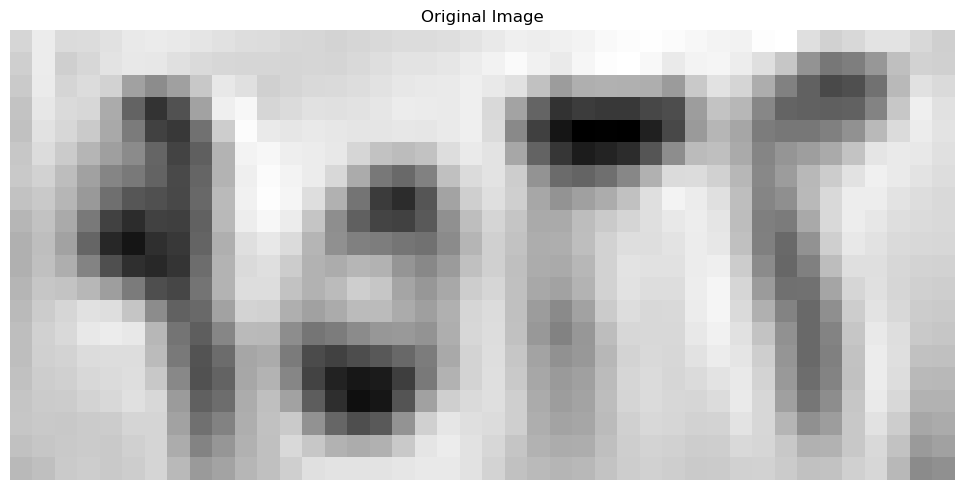

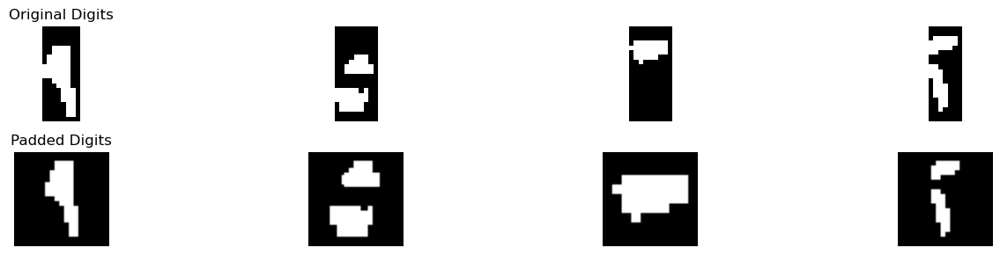

Best match: ٩
Full comparison results: {'١': 2.7857142857142856, '٢': 3.0892857142857144, '٣': 1.9433049535603715, '٤': 1.8511904761904763, '٥': 3.0951920241780915, '٦': 2.7836309523809524, '٧': 0.7555147058823529, '٨': 2.664583333333333, '٩': 4.616275676937441}
Confidence :  0.7605418263796748
Best match: ٥
Full comparison results: {'١': 0.47619047619047616, '٢': 1.6711309523809523, '٣': 1.3407738095238095, '٤': 2.132440476190476, '٥': 6.389880952380952, '٦': 1.4999999999999998, '٧': 0.9999999999999998, '٨': 1.0, '٩': 0.3943452380952381}
Confidence :  2.128720238095238
Best match: ٨
Full comparison results: {'١': 0.78125, '٢': 0.625, '٣': 0.5625, '٤': 0.625, '٥': 1.1875, '٦': 0.65625, '٧': 0.84375, '٨': 1.3125, '٩': 1.0}
Confidence :  0.0625
Best match: ٢
Full comparison results: {'١': 0.08333333333333333, '٢': 6.680288461538462, '٣': 3.621904024767802, '٤': 2.0609661172161173, '٥': 1.8300622880731239, '٦': 0.9017857142857142, '٧': 2.0680147058823533, '٨': 0.42500000000000004, '٩': 1.

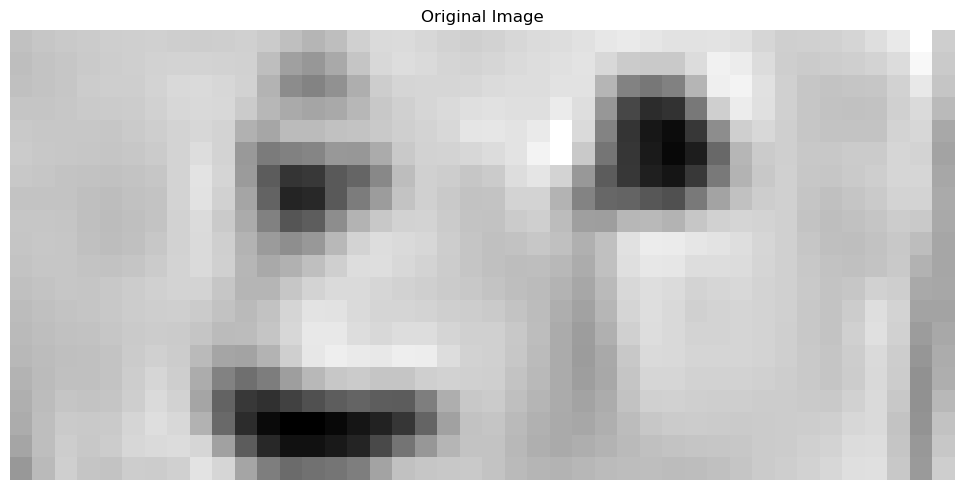

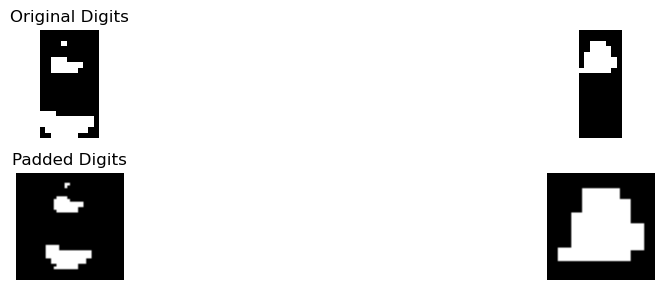

Best match: د
Full comparison results: {'أ': 0.1488970588235294, 'ب': 0.30347590627763044, 'ج': 2.1268784408969834, 'د': 3.7036754021119345, 'ر': 1.5910583993717426, 'س': 1.0982142857142856, 'ص': 0.606084656084656, 'ط': 1.836501009055357, 'ع': 3.5950828684106675, 'ف': 2.071701430996847, 'ق': 0.9476722720780446, 'ك': 1.5994318181818181, 'ل': 2.0173826109391126, 'م': 1.2760695187165776, 'ن': 3.2718977591036413, 'ه': 1.2403225806451612, 'و': 1.2557957570001181, 'ي': 1.7717577108881457}
Confidence :  0.05429626685063349
Best match: ه
Full comparison results: {'أ': 0.40625, 'ب': 0.7004310344827587, 'ج': 1.21875, 'د': 1.5625, 'ر': 0.6875, 'س': 0.8833333333333333, 'ص': 0.53125, 'ط': 0.875, 'ع': 0.21875, 'ف': 1.90625, 'ق': 0.875, 'ك': 0.71875, 'ل': 0.34375, 'م': 1.034274193548387, 'ن': 0.6875, 'ه': 4.920392036124795, 'و': 1.28125, 'ي': 0.875}
Confidence :  1.5070710180623976
[['٩', '٥', '٨', '٢'], ['د', 'ه']]
Tilt angle: -3.00 degrees


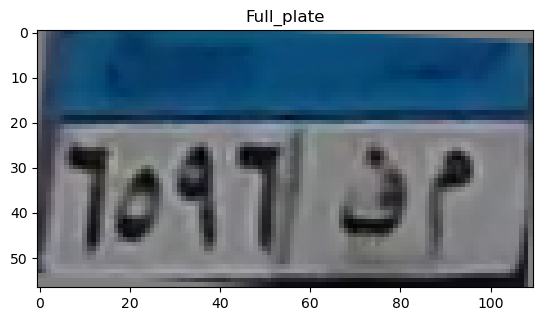

top
[0.28863672 0.23702652 0.22244855 0.27895755 0.31845358 0.42737843
 0.46787097 0.47832183 0.51506598 0.5649158  0.60913657 0.59522082
 0.58074859 0.53401501 0.49154412 0.48388097 0.47699263 0.49125961
 0.50553028 0.50119176 0.50267502 0.50636896 0.50503493 0.50564319
 0.50811583 0.5043538  0.4980735  0.49167189 0.49235232 0.49777191
 0.50567263 0.51045912 0.52194199 0.53331937 0.53373232 0.53200855
 0.5295688  0.530885   0.55978369 0.55639947 0.54561654 0.52600843
 0.51803049 0.53250966 0.53920825 0.53908729 0.53372577 0.55098221
 0.57900605 0.59236176 0.630522   0.5931614  0.55885012 0.55489983
 0.55724725]
[0.27863569 0.23447403 0.22129009 0.28154257 0.36597317 0.45546238
 0.47683681 0.41042473 0.3618716  0.450452   0.53379131 0.55844435
 0.5516578  0.49832934 0.47029513 0.49024157 0.53779555 0.53133314
 0.49715993 0.49405897 0.49350617 0.50028056 0.50411022 0.50801647
 0.51432775 0.51362309 0.5071326  0.50047841 0.49648025 0.50337363
 0.52383931 0.55882706 0.57895267 0.55817142 

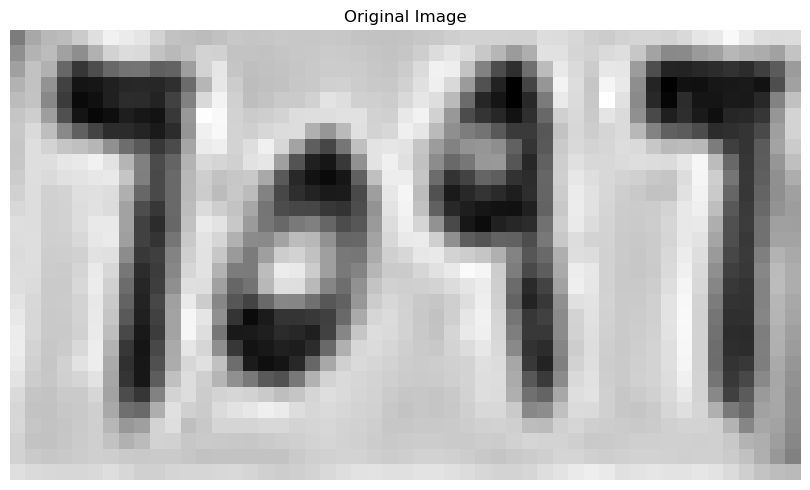

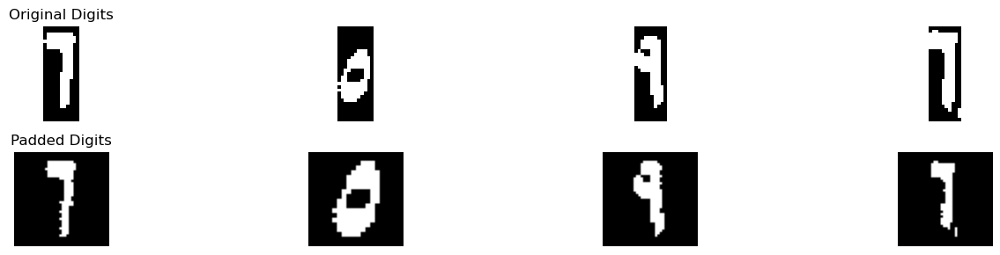

Best match: ٦
Full comparison results: {'١': 2.7524038461538463, '٢': 3.1971153846153846, '٣': 1.8093072755417956, '٤': 0.19642857142857142, '٥': 2.3059486952675807, '٦': 4.708928571428571, '٧': 1.3731617647058825, '٨': 0.5659722222222222, '٩': 1.9095493966817496}
Confidence :  0.7559065934065934
Best match: ٥
Full comparison results: {'١': 0.49999999999999994, '٢': 0.83125, '٣': 1.1125, '٤': 2.04375, '٥': 5.795833333333333, '٦': 1.4124999999999999, '٧': 1.05, '٨': 1.3625, '٩': 0.4625}
Confidence :  1.8760416666666666
Best match: ٢
Full comparison results: {'١': 3.199519230769231, '٢': 4.002403846153846, '٣': 1.5843653250773992, '٤': 1.9069139194139193, '٥': 2.060016769865841, '٦': 2.38125, '٧': 0.8731617647058824, '٨': 2.370833333333333, '٩': 3.841440422322775}
Confidence :  0.08048171191553544
Best match: ١
Full comparison results: {'١': 3.3579545454545454, '٢': 3.160110722610722, '٣': 1.4906153250773992, '٤': 0.2901785714285714, '٥': 1.872516769865841, '٦': 2.4351190476190476, '٧': 

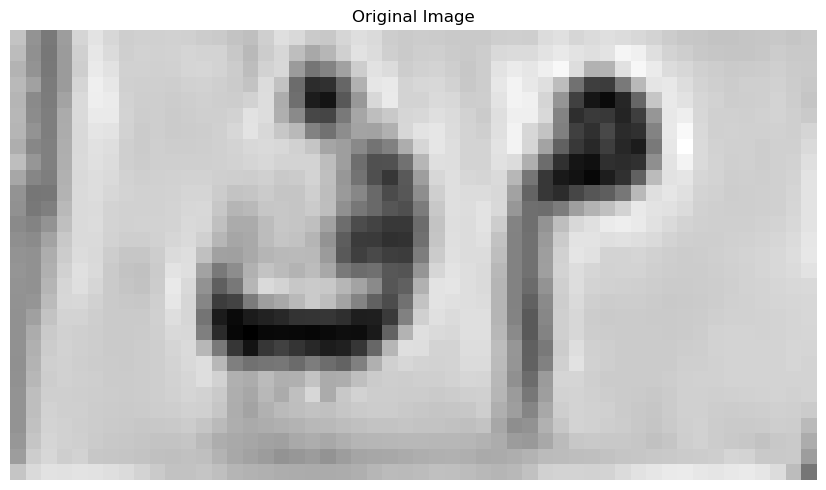

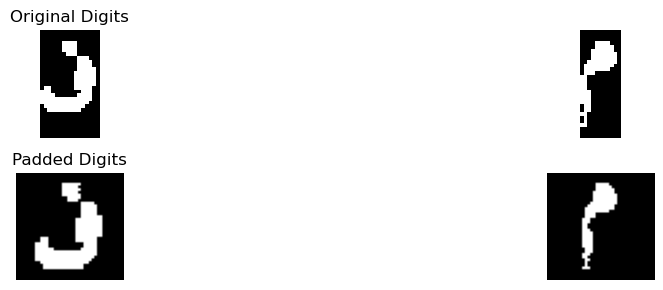

Best match: ف
Full comparison results: {'أ': 0.10250000000000001, 'ب': 0.3743368700265252, 'ج': 2.6519444444444447, 'د': 5.097314814814815, 'ر': 2.6180603448275863, 'س': 1.8303571428571428, 'ص': 1.3720833333333333, 'ط': 2.8850000000000002, 'ع': 1.55375, 'ف': 5.661746031746031, 'ق': 3.955601851851852, 'ك': 2.105, 'ل': 1.815, 'م': 1.27875, 'ن': 3.91125, 'ه': 2.84375, 'و': 3.4067592592592595, 'ي': 2.660801282051282}
Confidence :  0.282215608465608
Best match: م
Full comparison results: {'أ': 0.09375, 'ب': 0.034482758620689655, 'ج': 0.7653769841269841, 'د': 1.728267061742294, 'ر': 0.0, 'س': 0.5803571428571428, 'ص': 0.11011904761904762, 'ط': 0.07291666666666666, 'ع': 0.5855263157894737, 'ف': 0.7783782372598163, 'ق': 0.3024801587301587, 'ك': 0.0, 'ل': 0.058823529411764705, 'م': 5.958759990009989, 'ن': 0.7667261904761905, 'ه': 1.6456317204301076, 'و': 0.587202380952381, 'ي': 0.03125}
Confidence :  2.1152464641338478
[['٦', '٥', '٢', '١'], ['ف', 'م']]
Tilt angle: -2.00 degrees


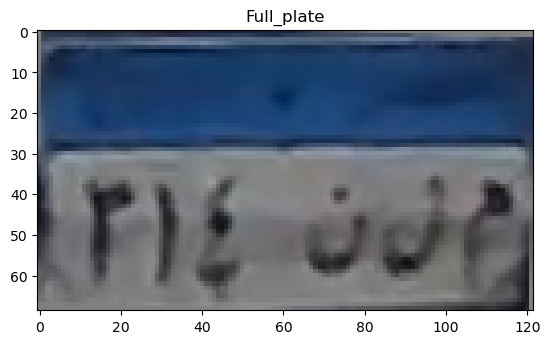

0.0 60.0 3.0 36.0
top
[0.34783412 0.36046453 0.35994266 0.43830074 0.51066098 0.55449906
 0.56346429 0.57159848 0.57579195 0.58093884 0.57953866 0.57912123
 0.57305122 0.54989599 0.53160774 0.5345964  0.53928926 0.54607848
 0.54499392 0.54175739 0.54010333 0.5385102  0.53501755 0.52643387
 0.51160268 0.50196343 0.50789174 0.49872654 0.50119509 0.50167762
 0.50296592 0.50478118 0.50845765 0.50638102 0.50723025 0.50646336
 0.50967931 0.51216763 0.51963451 0.52746137 0.53528824 0.53829478
 0.53248949 0.52180088 0.51373667 0.50857471 0.50586472 0.50535059
 0.50544154 0.50566941 0.50945216 0.50980353 0.5110587  0.51215303
 0.51208314 0.51194431 0.51249483 0.51285386 0.52246439 0.54660038]
[0.28431647 0.35526882 0.39607765 0.51564431 0.54628157 0.53491826
 0.51888458 0.5105001  0.51964012 0.52938194 0.54952533 0.55811343
 0.55098094 0.5302274  0.50951826 0.50069711 0.49950814 0.50327168
 0.4976449  0.50013838 0.49805598 0.49732162 0.49952843 0.50162887
 0.49436453 0.48895725 0.48535172 0.467

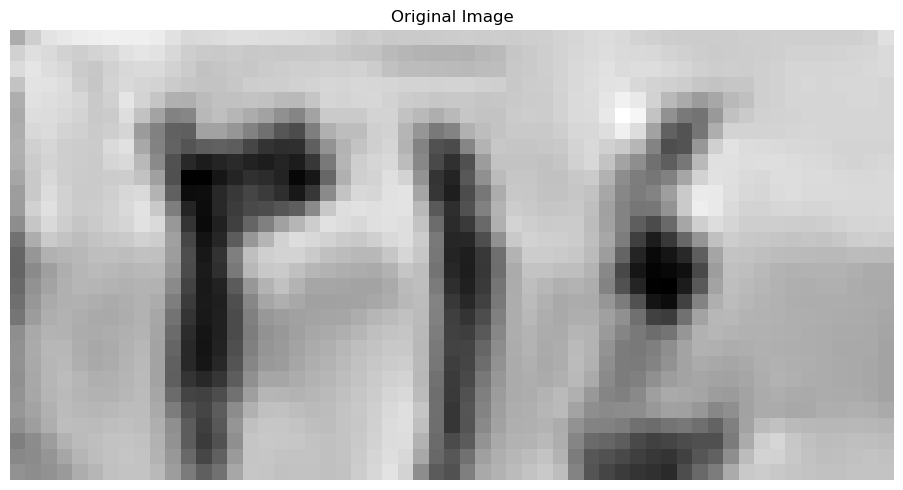

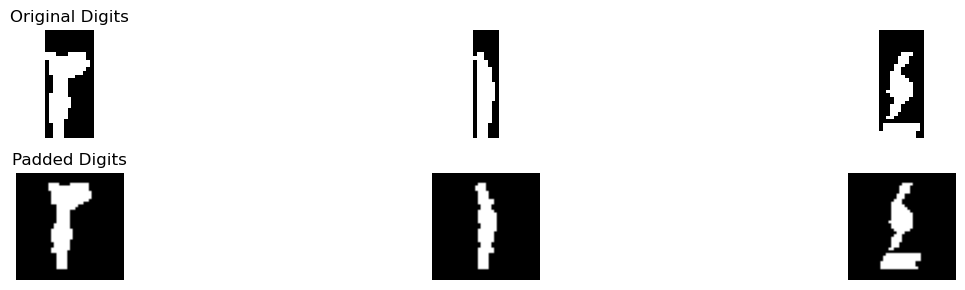

Best match: ٣
Full comparison results: {'١': 0.84375, '٢': 3.40625, '٣': 4.8625193498452015, '٤': 2.3125, '٥': 2.501285382574082, '٦': 1.4625, '٧': 1.884558823529412, '٨': 1.3465277777777778, '٩': 0.7530637254901961}
Confidence :  0.7281346749226008
Best match: ١
Full comparison results: {'١': 4.18125, '٢': 2.106424825174825, '٣': 1.12296826625387, '٤': 1.7343406593406594, '٥': 0.9420610349402918, '٦': 0.41488095238095235, '٧': 1.7441176470588236, '٨': 2.645833333333333, '٩': 1.3938851181498242}
Confidence :  0.7677083333333337
Best match: ٤
Full comparison results: {'١': 2.10625, '٢': 1.5833333333333333, '٣': 1.5880417956656347, '٤': 3.9291666666666663, '٥': 2.624797287335987, '٦': 0.26666666666666666, '٧': 0.7863970588235294, '٨': 2.696527777777778, '٩': 1.3611928104575162}
Confidence :  0.6163194444444442
In horizontal_segmentation_1
0 2
5 22
23 42
43 55
In refine_segmentation_1


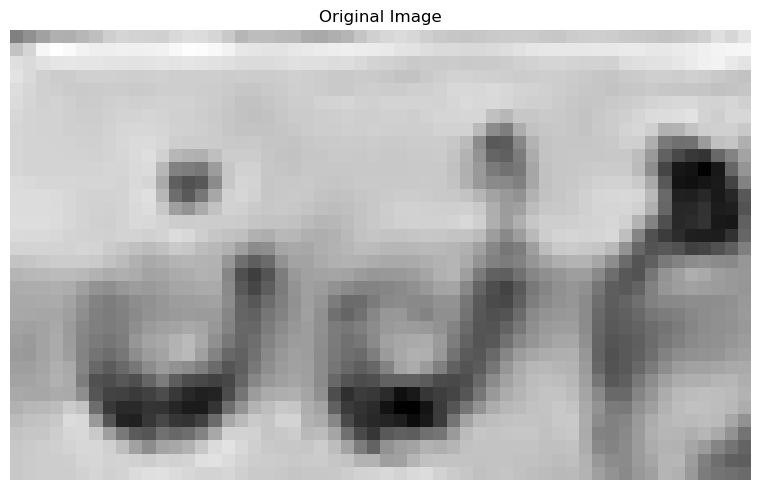

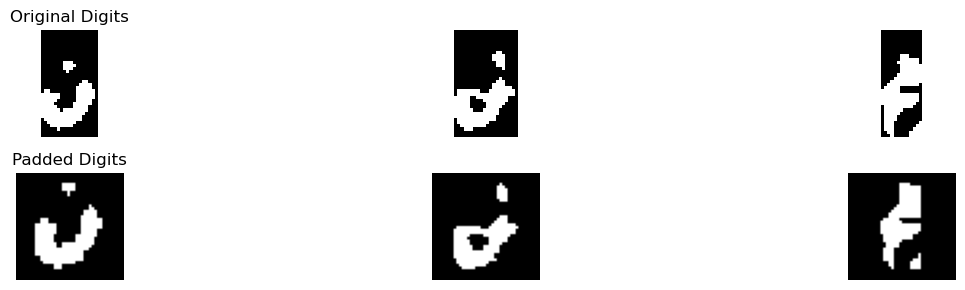

Best match: د
Full comparison results: {'أ': 0.21475806451612905, 'ب': 0.5104442970822282, 'ج': 1.5397222222222222, 'د': 3.4524074074074074, 'ر': 1.9156465517241381, 'س': 1.7366071428571428, 'ص': 1.1520833333333333, 'ط': 1.8963649425287357, 'ع': 0.8787499999999999, 'ف': 3.0745366103430625, 'ق': 2.2457067523585876, 'ك': 0.41875000000000007, 'ل': 1.4469897107897665, 'م': 0.6637500000000001, 'ن': 3.29508064516129, 'ه': 1.9375, 'و': 1.9849223416965354, 'ي': 1.3918589743589744}
Confidence :  0.0786633811230586
Best match: ل
Full comparison results: {'أ': 0.125, 'ب': 1.388013925729443, 'ج': 1.1247685185185183, 'د': 2.159027777777778, 'ر': 2.1301436781609193, 'س': 2.080357142857143, 'ص': 1.6291666666666667, 'ط': 1.1747685185185186, 'ع': 0.6145833333333333, 'ف': 2.219987412527735, 'ق': 1.3777703106332138, 'ك': 0.59375, 'ل': 2.333893369175627, 'م': 0.25, 'ن': 1.7752822580645162, 'ه': 1.036290322580645, 'و': 1.3715277777777777, 'ي': 2.146887923904053}
Confidence :  0.05695297832394619
Best match

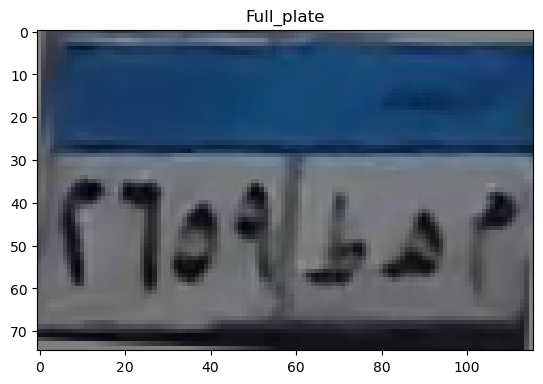

top
[0.35462154 0.40024863 0.34472352 0.34071619 0.37048195 0.40546504
 0.4197324  0.4222582  0.42848022 0.44423917 0.45864862 0.47631535
 0.47614588 0.47006991 0.46710617 0.46184725 0.44594361 0.44036549
 0.44631477 0.45485817 0.46101918 0.45876397 0.46294756 0.46984064
 0.47648863 0.47979847 0.47987661 0.48945877 0.49009147 0.48050091
 0.47482798 0.47413365 0.47301609 0.47266344 0.47098832 0.47095333
 0.47050271 0.46773498 0.46905922 0.46960176 0.47187811 0.47565569
 0.47422339 0.47619567 0.47777088 0.47852381 0.47541881 0.47149398
 0.47386865 0.47677536 0.47818043 0.48288309 0.48628708 0.4831743
 0.47944697 0.4770567  0.47530718 0.44399681]
[0.35856613 0.41344059 0.36053184 0.35292297 0.37939806 0.40531485
 0.42142868 0.43322672 0.45416003 0.4781114  0.4780749  0.48111593
 0.49057132 0.47685597 0.47222042 0.46475378 0.44929757 0.44845505
 0.45865956 0.46984686 0.4737064  0.47030118 0.47866593 0.49199328
 0.51463363 0.53242239 0.50867086 0.49174377 0.49058722 0.485781
 0.47725816 0.4

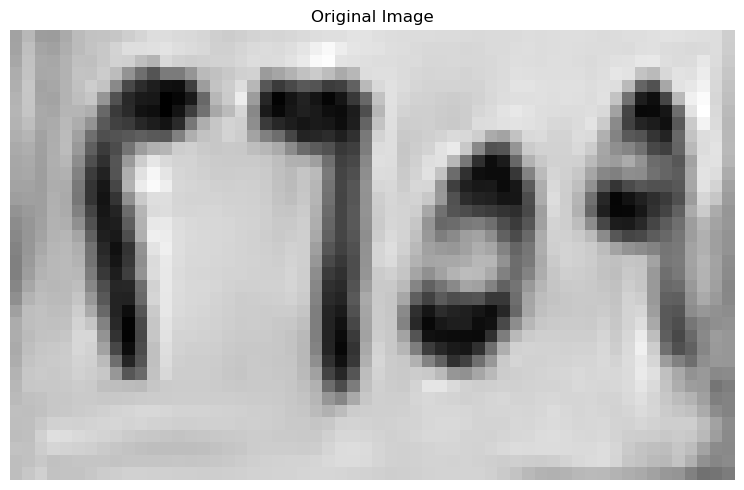

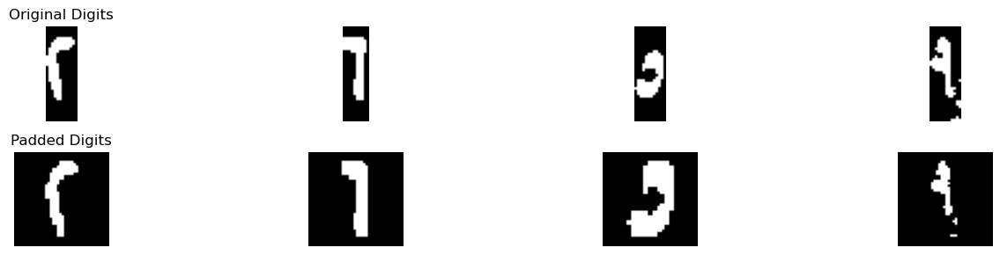

Best match: ٢
Full comparison results: {'١': 0.3125, '٢': 5.535714285714286, '٣': 3.7448722910216716, '٤': 3.0785714285714283, '٥': 2.044983782986879, '٦': 0.8398809523809523, '٧': 1.486764705882353, '٨': 0.5555555555555556, '٩': 0.9740896358543416}
Confidence :  0.895420997346307
Best match: ٦
Full comparison results: {'١': 3.2642045454545454, '٢': 2.531104312354312, '٣': 1.1978521671826625, '٤': 0.4162087912087912, '٥': 2.3371986952675807, '٦': 4.15297619047619, '٧': 0.880514705882353, '٨': 0.6722222222222222, '٩': 2.046301533433886}
Confidence :  0.44438582251082237
Best match: ٥
Full comparison results: {'١': 0.7499999999999999, '٢': 1.1625, '٣': 1.35, '٤': 1.9375, '٥': 6.569047619047619, '٦': 1.6624999999999999, '٧': 0.45, '٨': 1.3625, '٩': 0.5750000000000001}
Confidence :  2.3157738095238094
Best match: ١
Full comparison results: {'١': 3.741477272727273, '٢': 0.900058275058275, '٣': 1.1390286377708978, '٤': 1.4880597896726928, '٥': 0.5186495650891936, '٦': 0.7666666666666666, '٧'

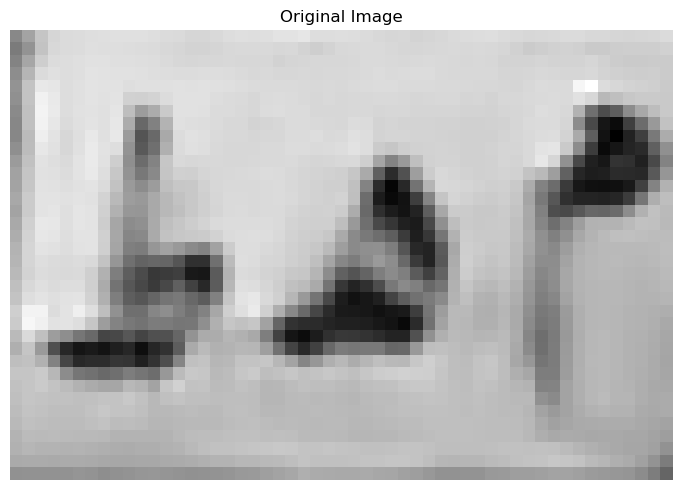

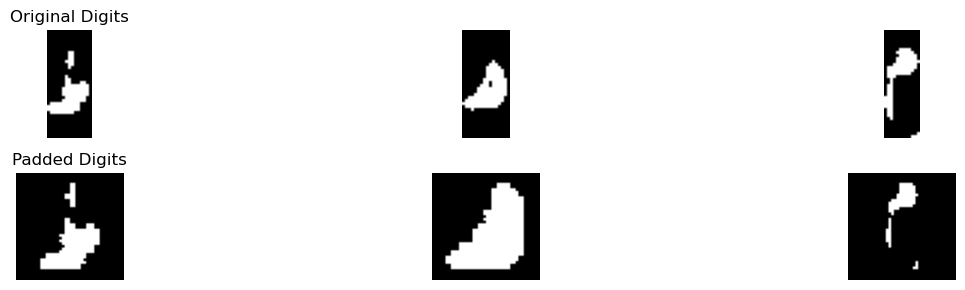

Best match: ط
Full comparison results: {'أ': 0.7956378299120235, 'ب': 0.6107427055702918, 'ج': 1.5441887642037566, 'د': 3.048989898989899, 'ر': 2.6609900650324185, 'س': 1.1517857142857144, 'ص': 0.9719696969696969, 'ط': 5.854743083003953, 'ع': 0.7313049853372434, 'ف': 3.03873556998557, 'ق': 2.148779461279461, 'ك': 2.2007575757575757, 'ل': 1.8315746753246753, 'م': 0.03125, 'ن': 2.203068181818182, 'ه': 1.4996639784946235, 'و': 2.1559343434343434, 'ي': 2.9200788633993398}
Confidence :  1.402876592007027
Best match: ه
Full comparison results: {'أ': 0.48275862068965514, 'ب': 0.6756465517241379, 'ج': 1.177801724137931, 'د': 3.016163793103448, 'ر': 1.4375, 'س': 2.3038793103448274, 'ص': 2.0811781609195403, 'ط': 1.7467672413793103, 'ع': 0.37284482758620685, 'ف': 3.3017241379310343, 'ق': 1.1185344827586208, 'ك': 2.1142241379310347, 'ل': 0.7586206896551724, 'م': 0.2413793103448276, 'ن': 1.021551724137931, 'ه': 4.75, 'و': 2.157327586206897, 'ي': 2.02823275862069}
Confidence :  0.7241379310344829
Be

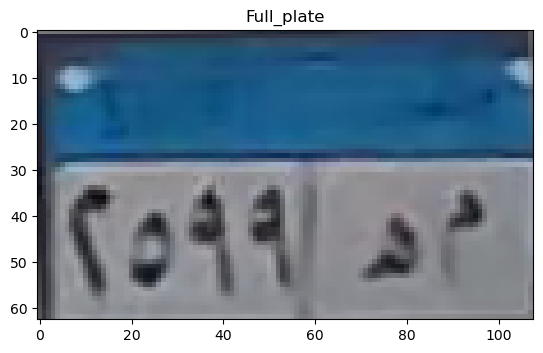

4.0 53.0 5.0 37.0
top
[0.56413127 0.58151321 0.57942988 0.56874809 0.58577098 0.60360824
 0.61909268 0.64339971 0.6436763  0.63571061 0.61282975 0.5951827
 0.58147437 0.57497928 0.5778601  0.5773699  0.57909864 0.56310635
 0.54815537 0.55115817 0.55324151 0.5519551  0.56764137 0.5674579
 0.5583779  0.56628267 0.56860471 0.57019784 0.58160201 0.58552358
 0.54733701 0.59991054 0.65176598 0.63193025 0.56219985 0.59003569
 0.52247422 0.57603651 0.55701131 0.55404292 0.55299061 0.55028499
 0.55291221 0.56712789 0.59330589 0.58333347 0.55731256 0.56050281
 0.59067394]
[0.51975707 0.56110812 0.56875594 0.56872531 0.58955375 0.59346194
 0.63593955 0.61463588 0.6057849  0.62676176 0.58879071 0.59129531
 0.60630314 0.59122737 0.5783133  0.571696   0.5702643  0.57034314
 0.56986826 0.57022059 0.5684398  0.56862745 0.56862745 0.56684666
 0.56867771 0.57052325 0.570922   0.57318881 0.58443987 0.58859157
 0.57457933 0.64523231 0.66089944 0.605446   0.52280584 0.59363534
 0.53243654 0.57884862 0.5651

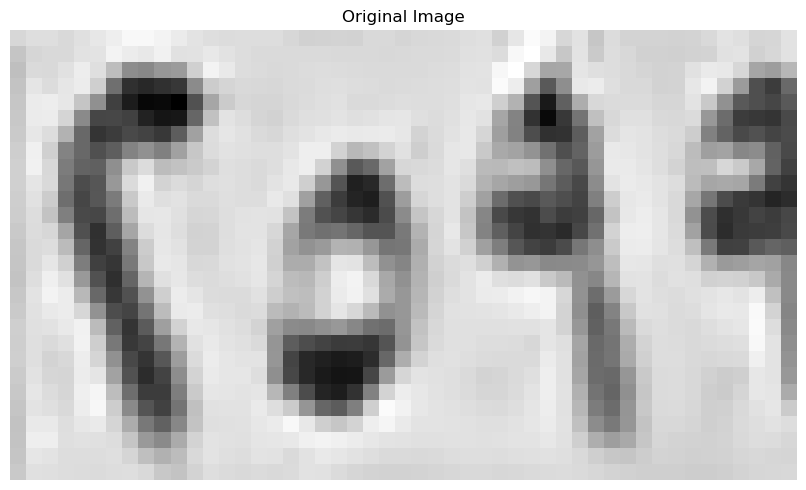

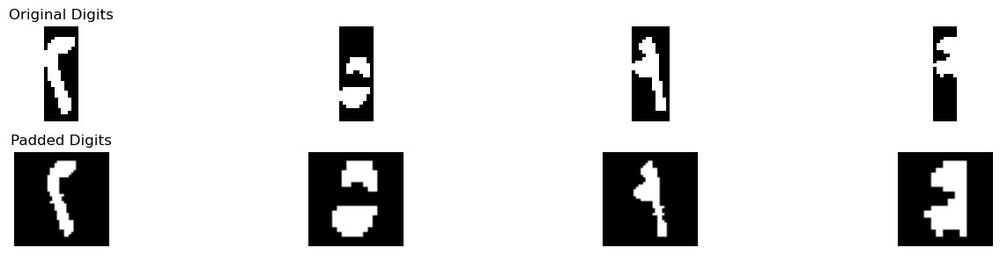

Best match: ٢
Full comparison results: {'١': 1.4166666666666667, '٢': 7.14423076923077, '٣': 3.7078173374613, '٤': 3.061698717948718, '٥': 2.4197442134748637, '٦': 1.2211309523809524, '٧': 2.172058823529412, '٨': 0.7736111111111111, '٩': 2.057126696832579}
Confidence :  1.718206715884735
Best match: ٥
Full comparison results: {'١': 0.5263157894736842, '٢': 1.9506578947368418, '٣': 1.5082236842105263, '٤': 2.5493421052631575, '٥': 6.90703320802005, '٦': 1.9697368421052632, '٧': 1.0180921052631577, '٨': 0.8684210526315789, '٩': 0.4934210526315789}
Confidence :  2.1788455513784464
Best match: ٩
Full comparison results: {'١': 3.6607142857142856, '٢': 1.7410714285714288, '٣': 0.9490131578947368, '٤': 1.8517857142857146, '٥': 1.2410161432994251, '٦': 1.5723214285714284, '٧': 0.6029411764705883, '٨': 3.6486111111111112, '٩': 5.612278244631185}
Confidence :  0.9757819794584499
Best match: ٥
Full comparison results: {'١': 0.888888888888889, '٢': 1.4513888888888888, '٣': 1.7238669590643276, '٤':

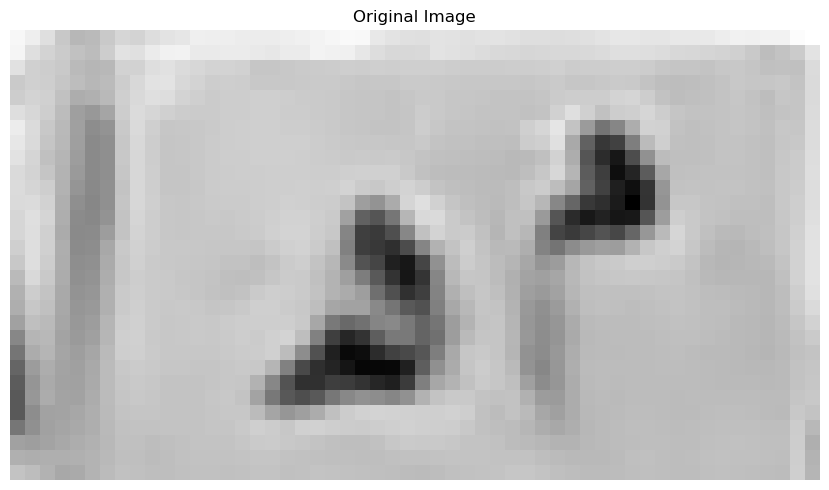

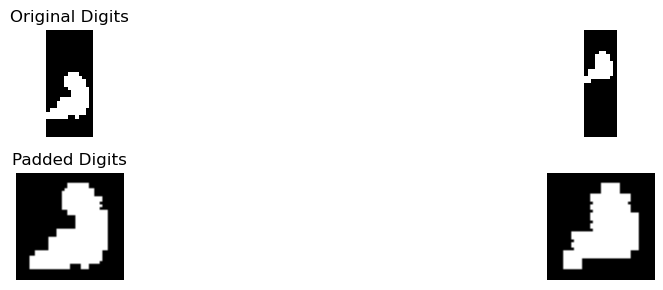

Best match: ه
Full comparison results: {'أ': 0.4795258620689655, 'ب': 0.09375, 'ج': 1.6163793103448276, 'د': 3.4202586206896552, 'ر': 1.25, 'س': 2.3071120689655173, 'ص': 1.1902298850574713, 'ط': 1.6314655172413792, 'ع': 0.1314655172413793, 'ف': 3.4989224137931036, 'ق': 1.1713362068965516, 'ك': 1.5657327586206897, 'ل': 0.6551724137931034, 'م': 0.685344827586207, 'ن': 0.8491379310344828, 'ه': 5.5625, 'و': 2.1045258620689653, 'ي': 1.3442528735632184}
Confidence :  1.0317887931034482
Best match: ه
Full comparison results: {'أ': 0.4598214285714285, 'ب': 0.25, 'ج': 0.7723214285714286, 'د': 2.4464285714285716, 'ر': 1.081896551724138, 'س': 1.8705357142857144, 'ص': 1.3916666666666666, 'ط': 0.7276785714285714, 'ع': 0.2767857142857143, 'ف': 2.15625, 'ق': 1.0223214285714284, 'ك': 0.8392857142857142, 'ل': 0.5714285714285714, 'م': 1.0758928571428572, 'ن': 0.7991071428571428, 'ه': 4.75, 'و': 1.8973214285714286, 'ي': 1.063392857142857}
Confidence :  1.1517857142857142
[['٢', '٥', '٩', '٥'], ['ه', 'ه']

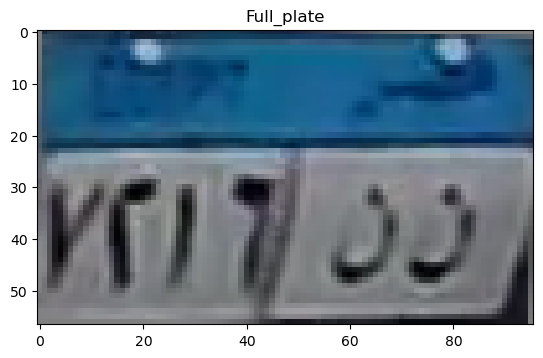

top
[0.40569936 0.37174684 0.40386544 0.46590961 0.59612407 0.59485569
 0.59268963 0.59464735 0.59981507 0.6112501  0.62088091 0.62532922
 0.63057662 0.62727556 0.63269299 0.65656083 0.67343049 0.6841125
 0.699415   0.70789922 0.70050877 0.68653132 0.67242688 0.66370475
 0.65890383 0.65895407 0.65705439 0.64893696 0.64250533 0.63409413
 0.63380438 0.63428934 0.63552469 0.63955748 0.65062515 0.66553272
 0.67449808 0.67358162 0.66994704 0.66804176 0.67119436 0.67332451
 0.66977928 0.65427973 0.61596697 0.62297366 0.65234693 0.5506129 ]
[0.4155514  0.43276015 0.52640286 0.56146576 0.62165677 0.61176392
 0.61100774 0.61075717 0.6028673  0.61401213 0.62964765 0.61670271
 0.61401452 0.6027242  0.59657703 0.58965618 0.59189888 0.59269303
 0.5939495  0.59809529 0.60141561 0.60404658 0.60271915 0.59787294
 0.59451315 0.5908837  0.59144018 0.58175775 0.57981423 0.5765097
 0.57985174 0.58333686 0.58986761 0.59352004 0.6001186  0.60999622
 0.61488718 0.60814914 0.59482966 0.58894441 0.58580604 0.5

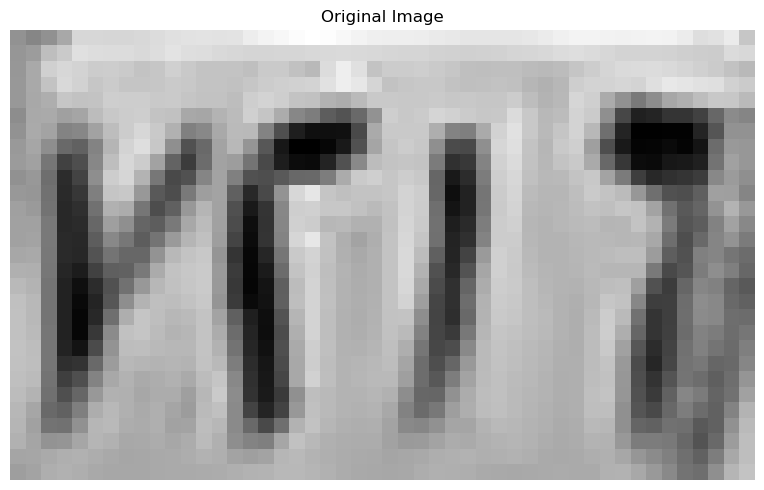

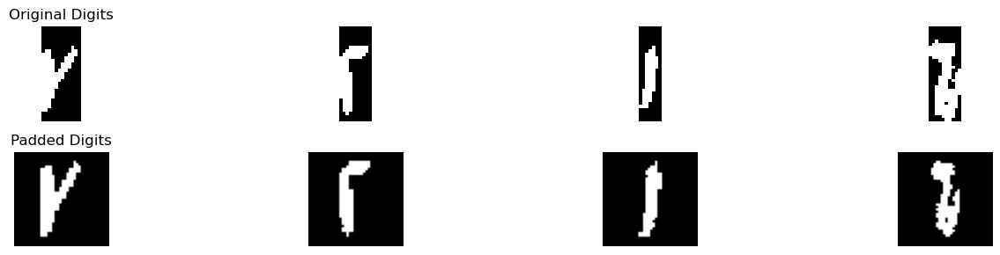

Best match: ٧
Full comparison results: {'١': 0.29411764705882354, '٢': 1.1176470588235294, '٣': 1.7036571207430342, '٤': 0.8308823529411765, '٥': 1.2638858174848886, '٦': 0.3165441176470588, '٧': 2.430514705882353, '٨': 1.112377450980392, '٩': 1.1511437908496733}
Confidence :  0.36342879256965943
Best match: ٢
Full comparison results: {'١': 0.0, '٢': 4.6514423076923075, '٣': 2.3530379256965945, '٤': 2.5115613553113554, '٥': 1.9614108801415302, '٦': 1.3839285714285714, '٧': 1.2816176470588236, '٨': 0.3625, '٩': 0.594284188034188}
Confidence :  1.069940476190476
Best match: ١
Full comparison results: {'١': 2.66875, '٢': 1.2679195804195802, '٣': 1.1640866873065017, '٤': 1.2693223443223443, '٥': 1.3178534571723426, '٦': 0.5586309523809524, '٧': 1.6904411764705882, '٨': 1.7888888888888888, '٩': 0.7194098793363499}
Confidence :  0.4399305555555557
Best match: ٢
Full comparison results: {'١': 2.4791666666666665, '٢': 2.8173076923076916, '٣': 1.328173374613003, '٤': 1.5605311355311355, '٥': 2.

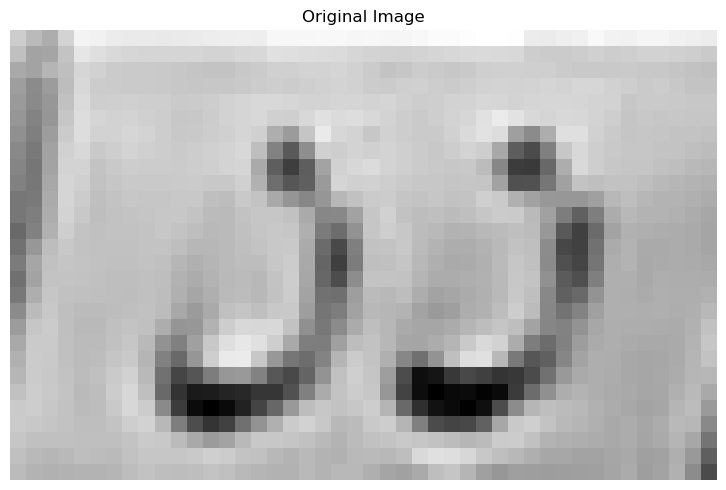

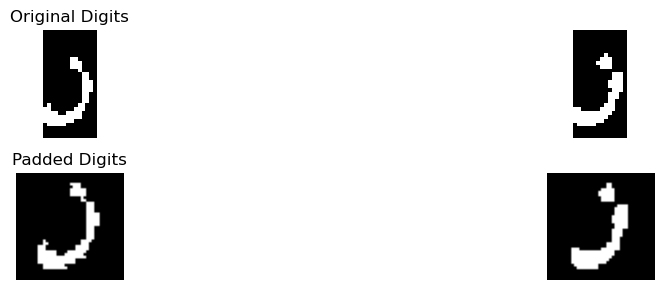

Best match: ر
Full comparison results: {'أ': 0.07472826086956522, 'ب': 0.2956730769230769, 'ج': 0.8523047504025766, 'د': 3.3679528985507248, 'ر': 3.592786731634183, 'س': 2.169642857142857, 'ص': 1.524909420289855, 'ط': 2.1317934782608696, 'ع': 0.5597826086956521, 'ف': 2.573520531400966, 'ق': 3.2923208534621575, 'ك': 1.4483695652173914, 'ل': 3.335597826086957, 'م': 0.46059782608695654, 'ن': 2.972445652173913, 'ه': 1.4445564516129032, 'و': 3.1027073268921095, 'ي': 2.1503623188405796}
Confidence :  0.11241691654172903
Best match: د
Full comparison results: {'أ': 0.12648809523809523, 'ب': 0.26044429708222816, 'ج': 1.3351233609385784, 'د': 4.2718278018278015, 'ر': 3.5458527878917683, 'س': 2.508928571428571, 'ص': 1.7184523809523808, 'ط': 2.2480409813421733, 'ع': 0.7901785714285714, 'ف': 3.51367020822666, 'ق': 3.841008491210104, 'ك': 1.5265151515151514, 'ل': 2.950028801843318, 'م': 0.7843614718614719, 'ن': 3.475925499231951, 'ه': 2.3516129032258064, 'و': 3.465608465608466, 'ي': 2.6311166188883

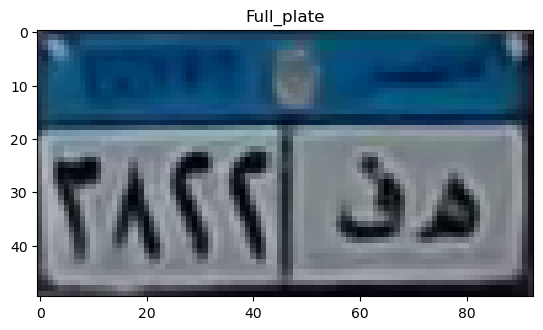

top
[0.52798985 0.68263432 0.60422304 0.52603605 0.5251785  0.6030557
 0.58136806 0.58034825 0.58627656 0.58130566 0.5765226  0.56806141
 0.55071978 0.53425297 0.51957407 0.53051392 0.54108377 0.56991343
 0.53188158 0.49548417 0.49721882 0.50624297 0.51358042 0.52734185
 0.54654711 0.56116143 0.61551192 0.65449017 0.61085506 0.50196643
 0.49109097 0.49898466 0.55239576 0.56645662 0.54947563 0.5485707
 0.5897896  0.62934724 0.60732672 0.5220326  0.41242199 0.42102222
 0.4783292  0.59877574 0.60370651 0.42224706]
[0.49005852 0.68711734 0.62134176 0.5296751  0.54166137 0.67464662
 0.63897279 0.60845809 0.54378691 0.49970578 0.50765951 0.53658108
 0.57795701 0.53523412 0.53052294 0.5311254  0.54979044 0.55037255
 0.52804505 0.52257603 0.50912955 0.51205505 0.51268405 0.53707777
 0.58784882 0.63552451 0.6246636  0.49615328 0.29577008 0.13300129
 0.13509367 0.22347233 0.47459545 0.56618275 0.55427561 0.55243193
 0.60990003 0.60166405 0.44726331 0.28524987 0.12868757 0.09053325
 0.15400982 0.

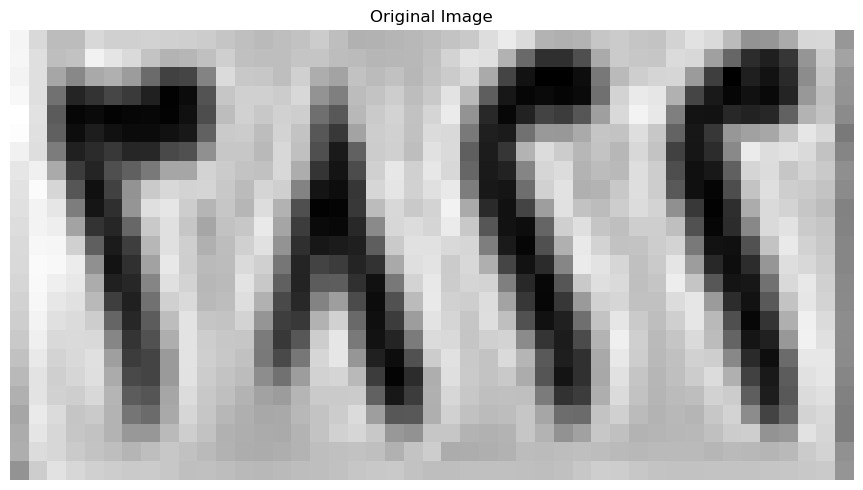

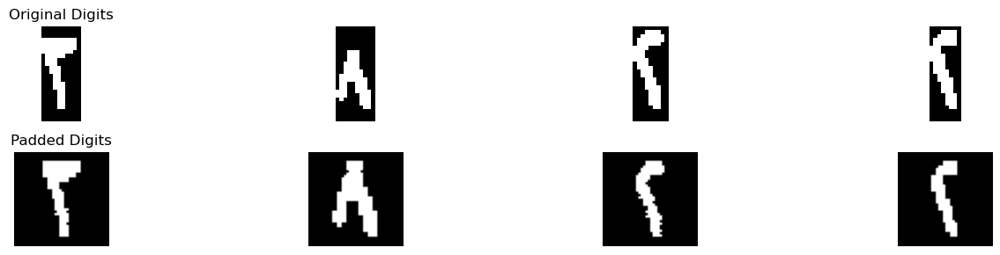

Best match: ٣
Full comparison results: {'١': 1.15625, '٢': 5.40625, '٣': 6.1437693498452015, '٤': 2.34375, '٥': 1.8841819622585878, '٦': 1.9, '٧': 2.5775735294117648, '٨': 0.8173611111111111, '٩': 1.4042075163398693}
Confidence :  0.36875967492260076
Best match: ٨
Full comparison results: {'١': 2.268092105263158, '٢': 1.689144736842105, '٣': 1.28125, '٤': 1.776315789473684, '٥': 3.4791666666666665, '٦': 1.2582236842105263, '٧': 0.6674342105263157, '٨': 5.322368421052632, '٩': 3.7023026315789473}
Confidence :  0.8100328947368423
Best match: ٢
Full comparison results: {'١': 2.3645833333333335, '٢': 6.375801282051282, '٣': 3.121420278637771, '٤': 3.2402701465201464, '٥': 2.135361381394663, '٦': 1.2211309523809524, '٧': 1.7558823529411767, '٨': 0.8416666666666667, '٩': 2.197288210155857}
Confidence :  1.5677655677655677
Best match: ٢
Full comparison results: {'١': 1.8210227272727273, '٢': 6.778481934731934, '٣': 3.0198335913312695, '٤': 2.86007326007326, '٥': 1.9874917072091995, '٦': 0.783

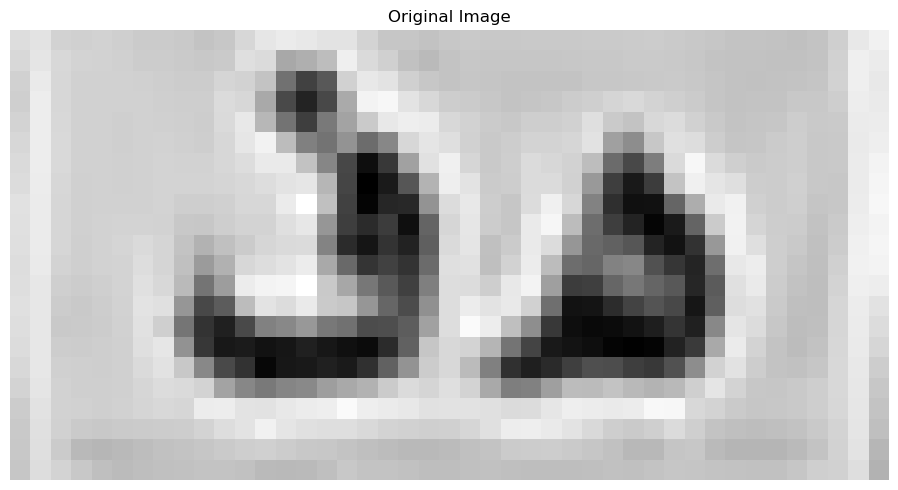

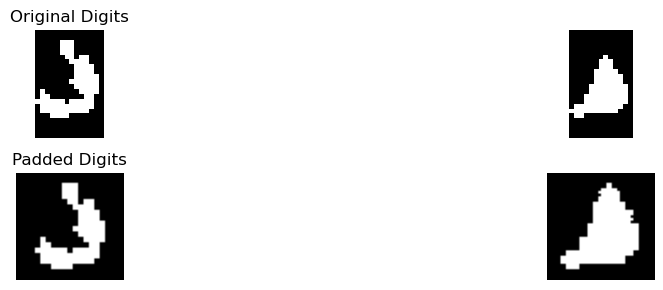

Best match: ف
Full comparison results: {'أ': 0.3798076923076923, 'ب': 0.06573275862068965, 'ج': 2.1112001424501425, 'د': 5.119123931623931, 'ر': 1.8751657824933687, 'س': 1.6071428571428572, 'ص': 1.516025641025641, 'ط': 2.6225961538461537, 'ع': 1.3004807692307692, 'ف': 5.302108770858771, 'ق': 3.1969373219373223, 'ك': 2.105769230769231, 'ل': 1.7836538461538463, 'م': 1.2403846153846154, 'ن': 3.5144230769230766, 'ه': 4.15625, 'و': 3.1164529914529915, 'ي': 2.6863782051282055}
Confidence :  0.09149241961742005
Best match: ه
Full comparison results: {'أ': 0.5140086206896551, 'ب': 0.38146551724137934, 'ج': 0.9267241379310345, 'د': 3.1346982758620685, 'ر': 1.209051724137931, 'س': 1.9601293103448276, 'ص': 1.8279454022988506, 'ط': 1.4967672413793103, 'ع': 0.3599137931034483, 'ف': 2.997844827586207, 'ق': 1.322198275862069, 'ك': 1.271551724137931, 'ل': 0.6487068965517242, 'م': 1.2661637931034484, 'ن': 1.2122844827586206, 'ه': 5.78125, 'و': 2.1982758620689653, 'ي': 1.5520833333333333}
Confidence :  

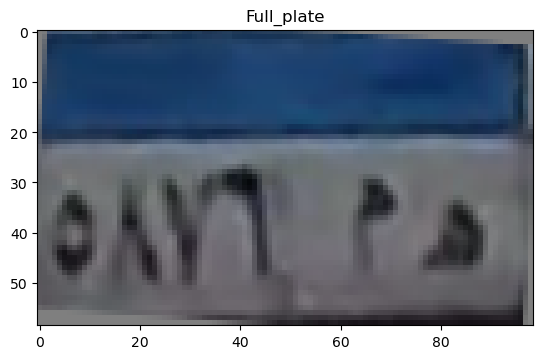

top
[0.41794196 0.43208371 0.4592639  0.46947235 0.47064048 0.4643361
 0.46129294 0.45924295 0.46012112 0.46128187 0.46157862 0.45770355
 0.4558045  0.4607803  0.46330344 0.46403147 0.46411112 0.46798322
 0.47461708 0.47354405 0.46494997 0.45961928 0.460752   0.45246612
 0.44108879 0.44162946 0.44574762 0.45076276 0.45750372 0.46324624
 0.46496813 0.47156933 0.47435304 0.47331384 0.48131592 0.49016333
 0.4924048  0.50767275 0.50968442 0.50698755 0.50415415 0.50000491
 0.49267863 0.48328271 0.47466566 0.47161079 0.46914273 0.45485689
 0.44728266]
[0.41148876 0.44325619 0.45752843 0.46092849 0.45871977 0.44983425
 0.44550686 0.44658876 0.45041517 0.45199809 0.45214791 0.44919902
 0.45137468 0.45505074 0.45383827 0.45409459 0.45430135 0.45787089
 0.45862162 0.44942281 0.44177466 0.44196529 0.44902157 0.44233824
 0.43594006 0.44044389 0.4420115  0.44038364 0.45101339 0.45756067
 0.46491703 0.47256011 0.47938716 0.47386395 0.47419372 0.48239037
 0.48774896 0.50410999 0.51084848 0.51094305 0

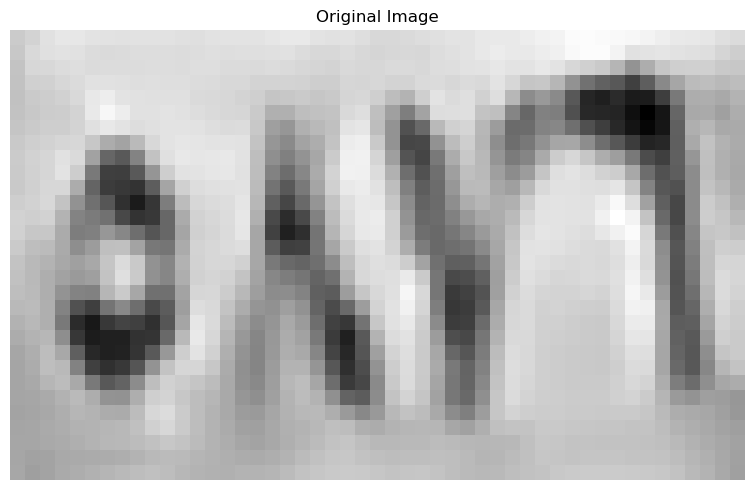

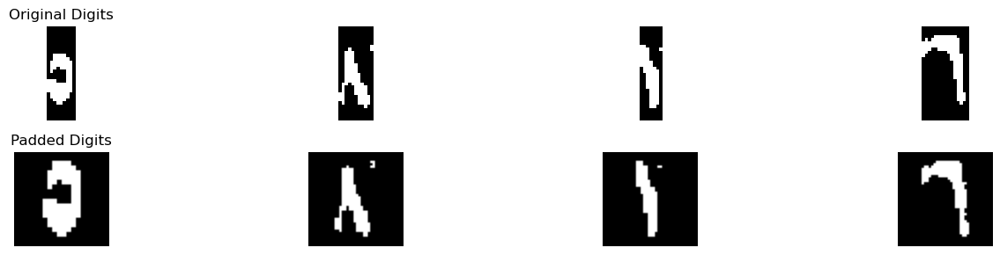

Best match: ٥
Full comparison results: {'١': 0.5625, '٢': 2.71875, '٣': 1.6781153250773995, '٤': 2.3125, '٥': 6.004058860386259, '٦': 2.175, '٧': 1.2871323529411764, '٨': 0.7986111111111112, '٩': 0.5902777777777778}
Confidence :  1.6426544301931294
Best match: ٢
Full comparison results: {'١': 1.3566176470588236, '٢': 3.1544117647058827, '٣': 2.2551277089783284, '٤': 2.626838235294118, '٥': 0.5011010983340705, '٦': 0.1488970588235294, '٧': 2.070220588235294, '٨': 2.177736928104575, '٩': 1.8531454248366013}
Confidence :  0.26378676470588225
Best match: ٢
Full comparison results: {'١': 2.477272727272727, '٢': 4.317016317016317, '٣': 2.467202012383901, '٤': 2.492971611721612, '٥': 0.5124576146247972, '٦': 1.0288690476190476, '٧': 2.4419117647058823, '٨': 1.4527777777777777, '٩': 1.9739190548014076}
Confidence :  0.9120223526473525
Best match: ٦
Full comparison results: {'١': 0.6, '٢': 0.53125, '٣': 1.9374999999999998, '٤': 0.0, '٥': 2.2494047619047617, '٦': 3.75625, '٧': 0.7125, '٨': 0.362

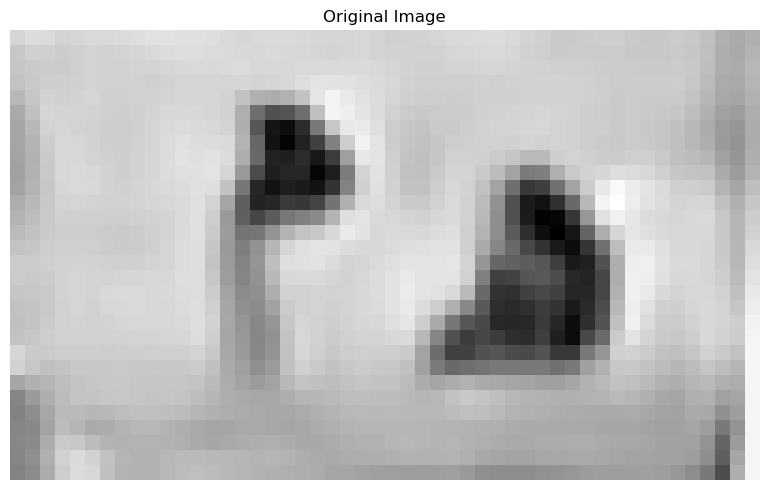

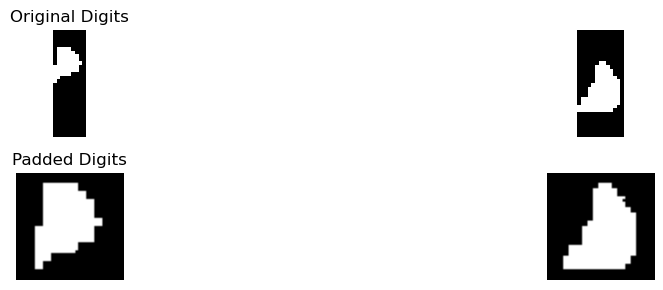

Best match: ه
Full comparison results: {'أ': 0.48000000000000004, 'ب': 0.9759615384615384, 'ج': 1.4384722222222222, 'د': 0.867361111111111, 'ر': 0.32, 'س': 0.9196428571428572, 'ص': 1.3720833333333333, 'ط': 0.44, 'ع': 0.08, 'ف': 1.2647949735449735, 'ق': 1.0389351851851851, 'ك': 0.31999999999999995, 'ل': 0.4, 'م': 1.335, 'ن': 0.64, 'ه': 1.96875, 'و': 1.1600000000000001, 'ي': 0.5538461538461539}
Confidence :  0.2651388888888889
Best match: ه
Full comparison results: {'أ': 0.48148148148148145, 'ب': 0.53125, 'ج': 1.6793981481481481, 'د': 3.34375, 'ر': 0.9715038314176245, 'س': 1.8392857142857144, 'ص': 1.2993055555555555, 'ط': 1.3912037037037035, 'ع': 0.2673611111111111, 'ف': 3.0773809523809526, 'ق': 1.1701388888888888, 'ك': 1.636574074074074, 'ل': 0.5925925925925926, 'م': 1.5578703703703702, 'ن': 1.0648148148148147, 'ه': 5.0625, 'و': 2.0891203703703702, 'ي': 1.1541666666666666}
Confidence :  0.859375
[['٥', '٢', '٢', '٦'], ['ه', 'ه']]
Tilt angle: 0.00 degrees


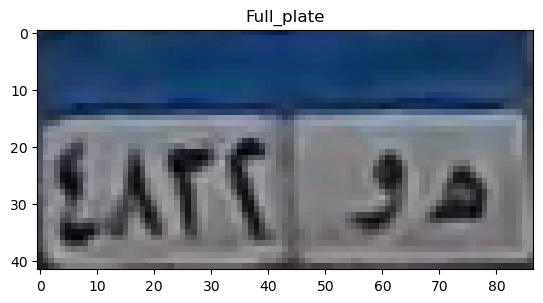

top
[0.30065137 0.52418078 0.56757098 0.55188471 0.5448749  0.52918863
 0.51234863 0.49274078 0.49217529 0.53923412 0.53506745 0.53114588
 0.52275216 0.51883059 0.52026706 0.52026706 0.50823451 0.50823451
 0.50934353 0.5132651  0.50849529 0.51241686 0.51295255 0.5443251
 0.56362745 0.56362745 0.57033176 0.57033176 0.57228118 0.56835961
 0.52383843 0.48462275 0.52020667 0.53981451 0.57681294 0.55328353
 0.52583255 0.49053843 0.5067902  0.49502549 0.49053843 0.48661686
 0.44515412]
[0.31014627 0.49446    0.53589294 0.52412824 0.52606275 0.54567059
 0.46441882 0.40951686 0.48402667 0.53108549 0.52185843 0.51009373
 0.50591216 0.50983373 0.52275216 0.51490902 0.51966392 0.51182078
 0.51462627 0.52639098 0.53927176 0.5353502  0.5353502  0.57456588
 0.5930349  0.5812702  0.53587804 0.50450549 0.47705451 0.43391725
 0.47538784 0.50283882 0.44765412 0.54177176 0.55271804 0.42330627
 0.21602863 0.14544039 0.28605137 0.45075725 0.51153804 0.4919302
 0.43894784]
[0.31406784 0.48661686 0.56726549 

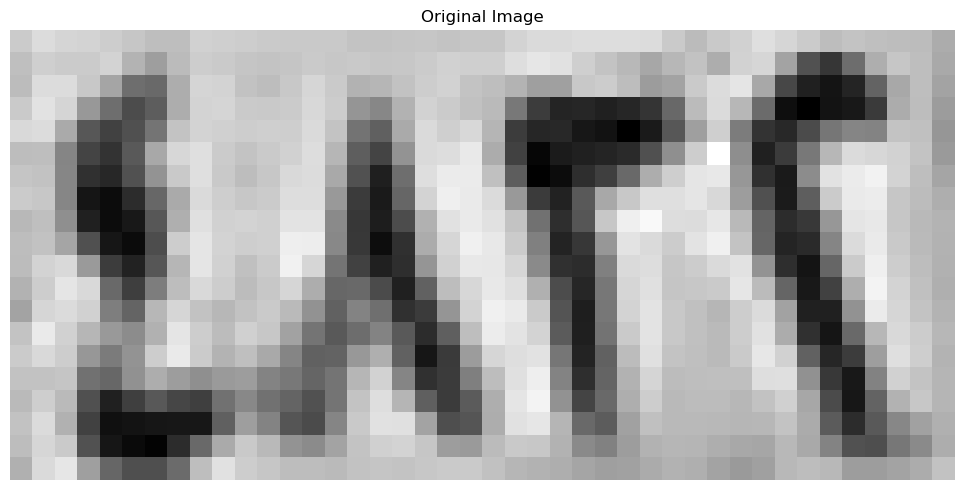

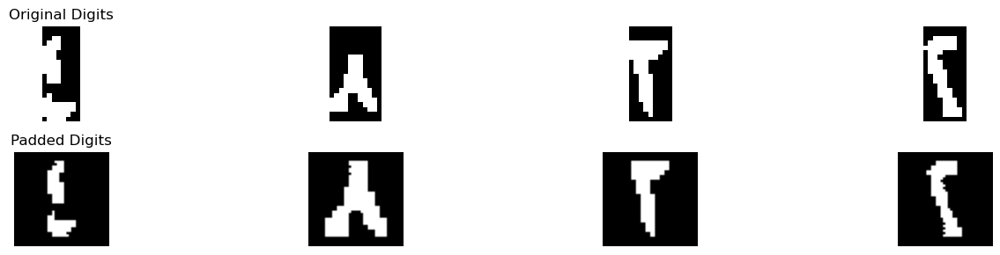

Best match: ٤
Full comparison results: {'١': 1.3125, '٢': 2.542467948717949, '٣': 1.7895704334365325, '٤': 5.828159340659341, '٥': 2.6590234778121777, '٦': 0.0, '٧': 0.7716911764705883, '٨': 1.167361111111111, '٩': 1.5124748617395678}
Confidence :  1.5845679314235817
Best match: ٥
Full comparison results: {'١': 1.1490384615384617, '٢': 1.2884615384615385, '٣': 0.576923076923077, '٤': 1.3173076923076925, '٥': 3.483173076923077, '٦': 0.9879807692307693, '٧': 0.40865384615384615, '٨': 3.141826923076923, '٩': 1.8942307692307692}
Confidence :  0.1706730769230771
Best match: ٣
Full comparison results: {'١': 0.78125, '٢': 5.40625, '٣': 5.911474458204335, '٤': 3.125, '٥': 2.0631496019460416, '٦': 1.65625, '٧': 3.066176470588235, '٨': 0.7555555555555555, '٩': 1.1895424836601307}
Confidence :  0.2526122291021675
Best match: ٢
Full comparison results: {'١': 1.35625, '٢': 5.785416666666666, '٣': 3.3672600619195046, '٤': 3.33125, '٥': 2.436269902697921, '٦': 1.2104166666666667, '٧': 1.8158088235294

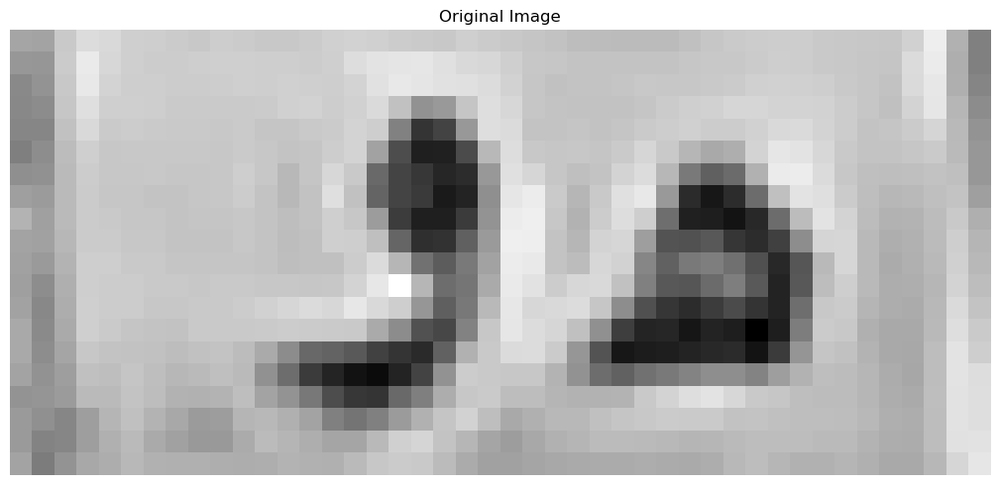

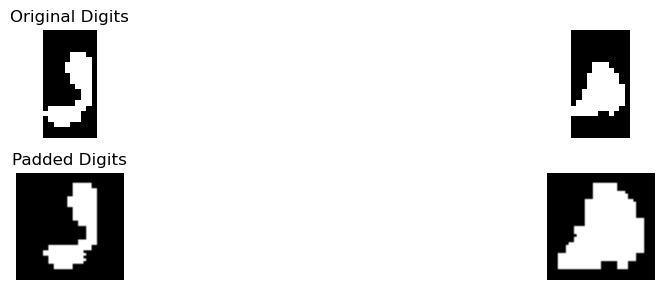

Best match: د
Full comparison results: {'أ': 0.23125, 'ب': 0.25969827586206895, 'ج': 1.2476046698872785, 'د': 4.671578282828283, 'ر': 3.0156265617191407, 'س': 2.227678571428571, 'ص': 1.3976190476190475, 'ط': 1.472743741765481, 'ع': 1.11875, 'ف': 3.372321428571429, 'ق': 2.329728835978836, 'ك': 1.4261363636363635, 'ل': 2.6374999999999997, 'م': 0.7818181818181819, 'ن': 2.8588095238095237, 'ه': 2.8423387096774198, 'و': 3.8410052910052914, 'ي': 2.5215928093645483}
Confidence :  0.4152864959114957
Best match: ه
Full comparison results: {'أ': 0.40625, 'ب': 0.625, 'ج': 0.90625, 'د': 1.96875, 'ر': 0.6875, 'س': 1.34375, 'ص': 0.84375, 'ط': 0.625, 'ع': 0.46875, 'ف': 2.09375, 'ق': 0.625, 'ك': 0.90625, 'ل': 0.46875, 'م': 1.09375, 'ن': 0.59375, 'ه': 4.34375, 'و': 1.5, 'ي': 0.5625}
Confidence :  1.125
[['٤', '٥', '٣', '٢'], ['د', 'ه']]
Tilt angle: -4.50 degrees


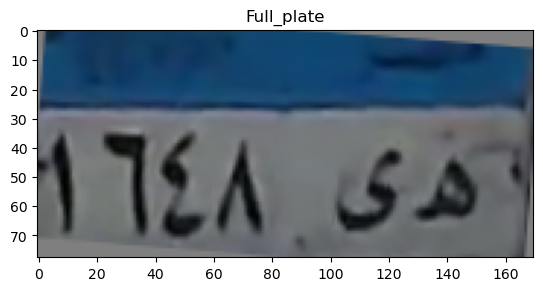

top
[0.45654772 0.47149141 0.46578678 0.45030206 0.45004531 0.45299827
 0.45576584 0.44399963 0.44552738 0.45106887 0.45250095 0.44653076
 0.44625529 0.44708214 0.44484962 0.44691324 0.45204529 0.45333205
 0.45614996 0.45427725 0.4532414  0.45282063 0.45268651 0.46547745
 0.47587073 0.4810313  0.48829512 0.49624379 0.49873183 0.49704311
 0.50202485 0.51063422 0.52492763 0.52964637 0.52105352 0.50393953
 0.48954141 0.48205462 0.47441269 0.46472748 0.45704092 0.45714863
 0.45798556 0.45758118 0.45909428 0.4556194  0.45863442 0.4659349
 0.47487051 0.4810552  0.47285717 0.47560266 0.50282801 0.52013783
 0.51775196 0.50612113 0.5003494  0.49505975 0.48738853 0.47944971
 0.47597642 0.47555352 0.47368055 0.47055276 0.4680985  0.46680222
 0.46599706 0.46559429 0.46499013 0.46291381 0.46079694 0.46014907
 0.46125993 0.46282663 0.46319627 0.46340696 0.46372299 0.46393368
 0.46424971 0.46335745 0.46267947 0.46358312 0.46571679 0.46742377
 0.46915892]
[0.44133119 0.46560511 0.45908097 0.44413669 0

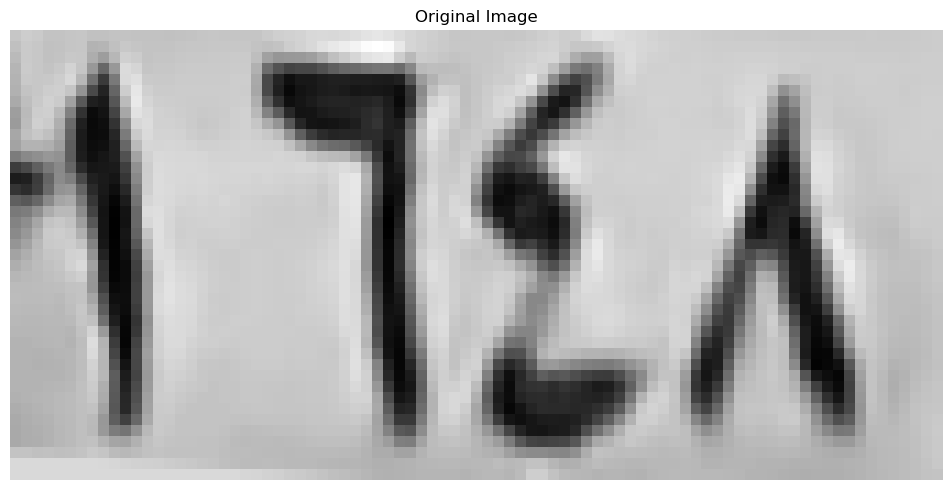

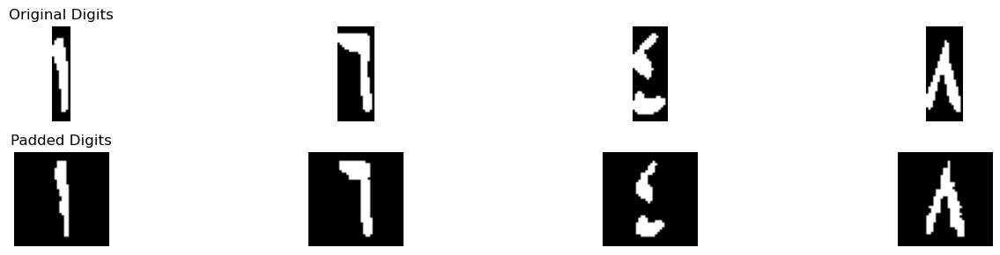

Best match: ١
Full comparison results: {'١': 6.370833333333334, '٢': 1.446168414918415, '٣': 0.5802051083591331, '٤': 0.9426968864468864, '٥': 1.172015516733009, '٦': 1.1663690476190476, '٧': 0.7977941176470589, '٨': 2.11875, '٩': 1.9350647310206135}
Confidence :  2.1260416666666666
Best match: ٦
Full comparison results: {'١': 1.4910714285714284, '٢': 0.6875, '٣': 0.9343072755417956, '٤': 0.0, '٥': 1.8840253206545776, '٦': 7.395833333333334, '٧': 0.11764705882352941, '٨': 1.0256944444444445, '٩': 2.5874474789915967}
Confidence :  2.4041929271708686
Best match: ٤
Full comparison results: {'١': 1.21875, '٢': 2.3381410256410255, '٣': 1.531733746130031, '٤': 6.2653713222261604, '٥': 2.8870982603567743, '٦': 0.0, '٧': 0.5452205882352941, '٨': 1.3291666666666666, '٩': 1.1853475364504777}
Confidence :  1.689136530934693
Best match: ٨
Full comparison results: {'١': 2.59375, '٢': 0.3125, '٣': 0.4276315789473684, '٤': 0.46875, '٥': 0.7891788294265074, '٦': 1.3125, '٧': 0.9069852941176472, '٨': 7

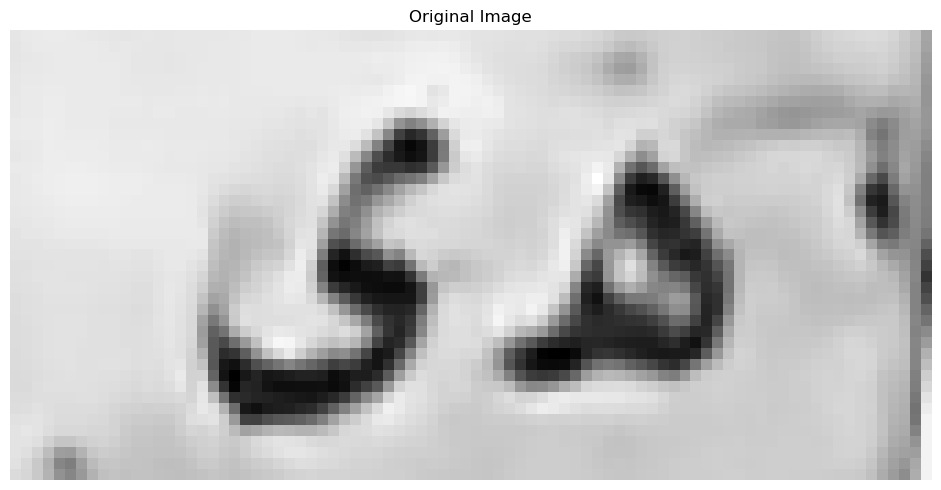

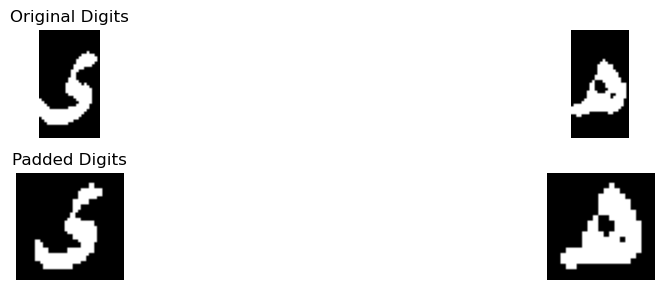

Best match: ي
Full comparison results: {'أ': 0.565, 'ب': 0.5193965517241379, 'ج': 1.5025462962962963, 'د': 3.2081944444444446, 'ر': 3.0750431034482757, 'س': 2.366071428571429, 'ص': 2.61375, 'ط': 2.76875, 'ع': 0.6725000000000001, 'ف': 3.398015873015873, 'ق': 2.773055555555555, 'ك': 2.54125, 'ل': 2.57625, 'م': 0.14250000000000002, 'ن': 2.2912500000000002, 'ه': 1.5625, 'و': 3.5850462962962966, 'ي': 4.601698717948718}
Confidence :  0.5083262108262108
Best match: ه
Full comparison results: {'أ': 0.4666666666666667, 'ب': 0.12708333333333333, 'ج': 0.5791666666666666, 'د': 2.7249999999999996, 'ر': 1.4124999999999999, 'س': 2.520833333333333, 'ص': 1.0520833333333333, 'ط': 1.2395833333333333, 'ع': 0.19374999999999998, 'ف': 2.69375, 'ق': 1.0270833333333333, 'ك': 1.4416666666666667, 'ل': 0.7270833333333333, 'م': 0.7749999999999999, 'ن': 0.925, 'ه': 6.71875, 'و': 1.7979166666666666, 'ي': 1.15}
Confidence :  1.9968750000000002
[['١', '٦', '٤', '٨'], ['ي', 'ه']]
Tilt angle: -6.00 degrees


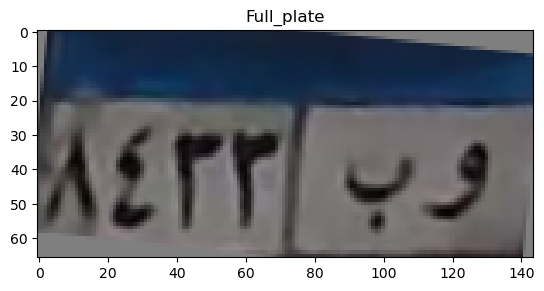

top
[0.22392618 0.24062064 0.24869853 0.27326074 0.36569735 0.43714021
 0.44925174 0.43457682 0.40480716 0.3794949  0.35020569 0.32597928
 0.29624279 0.32520123 0.37768635 0.39633586 0.4027777  0.40853534
 0.41775958 0.43107779 0.43657161 0.43631567 0.43674873 0.43742688
 0.44606188 0.45311378 0.45655869 0.45537616 0.44014937 0.40560505
 0.35275877 0.29397978 0.29766786 0.3586275  0.39467566 0.40267301
 0.40917159 0.42126935 0.44043618 0.44165218 0.42483301 0.39520166
 0.38104078 0.39053104 0.4119531  0.42314531 0.43423873 0.4330328
 0.41729005 0.40543941 0.4066392  0.41699336 0.42299703 0.41820463
 0.40912278 0.40860524 0.41409824 0.40827694 0.38989088 0.38883485
 0.40851508 0.44166809 0.46259218 0.44797527 0.42031939 0.4071696
 0.40378289 0.40861626 0.41735234 0.40508074 0.38166118 0.3896562 ]
[0.20788085 0.25896402 0.26673866 0.28031678 0.36110729 0.4245655
 0.4256769  0.41121229 0.38964642 0.36308842 0.3180343  0.28291943
 0.25899865 0.31787147 0.39135816 0.4119652  0.41673597 0.41

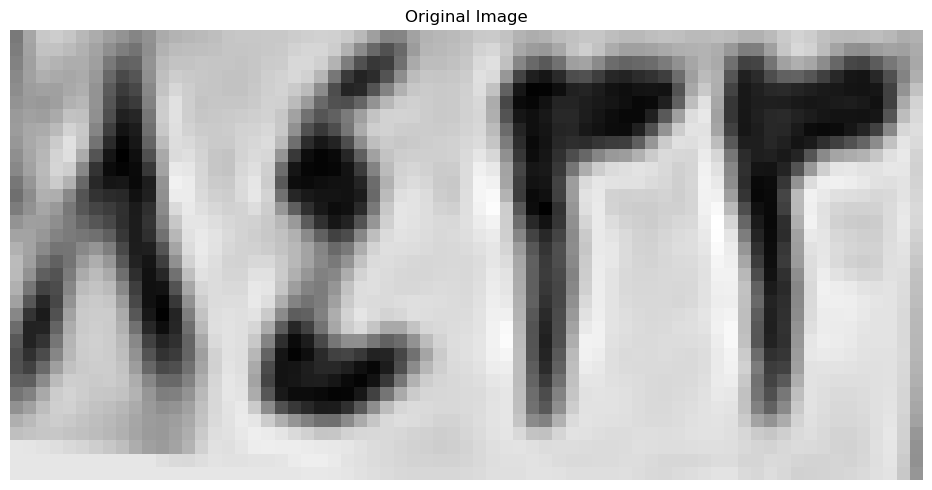

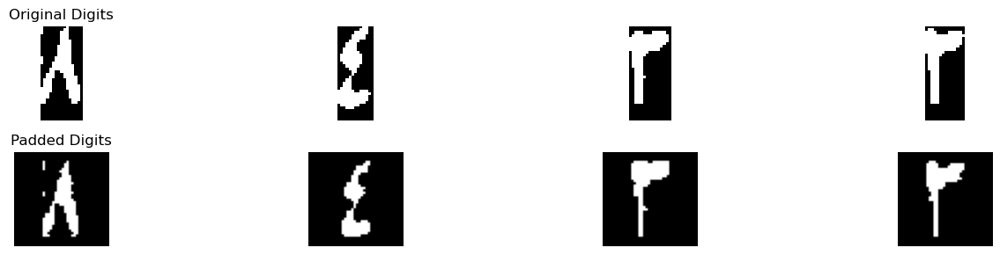

Best match: ٨
Full comparison results: {'١': 2.420833333333334, '٢': 0.0, '٣': 0.3125, '٤': 0.5979166666666667, '٥': 1.4018870706177207, '٦': 1.3770833333333332, '٧': 0.4466911764705882, '٨': 5.300694444444444, '٩': 2.086846405228758}
Confidence :  1.439930555555555
Best match: ٤
Full comparison results: {'١': 1.6354166666666665, '٢': 1.048878205128205, '٣': 1.2541602167182662, '٤': 4.3872939560439566, '٥': 3.0184468524251806, '٦': 0.14285714285714285, '٧': 0.4863970588235294, '٨': 2.177777777777778, '٩': 1.6219048516842636}
Confidence :  0.684423551809388
Best match: ٣
Full comparison results: {'١': 0.9375, '٢': 2.40625, '٣': 5.010255417956657, '٤': 1.28125, '٥': 2.030563541205956, '٦': 2.7125, '٧': 1.5000000000000002, '٨': 0.6916666666666667, '٩': 1.5741421568627452}
Confidence :  1.1488777089783284
Best match: ٣
Full comparison results: {'١': 0.9375, '٢': 2.09375, '٣': 4.795181888544891, '٤': 1.09375, '٥': 1.4840317706029782, '٦': 2.0875, '٧': 1.5551470588235294, '٨': 0.597222222222

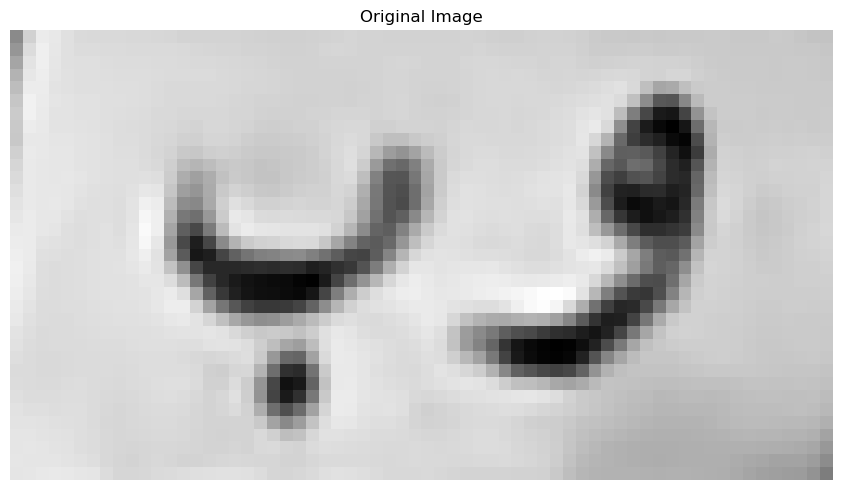

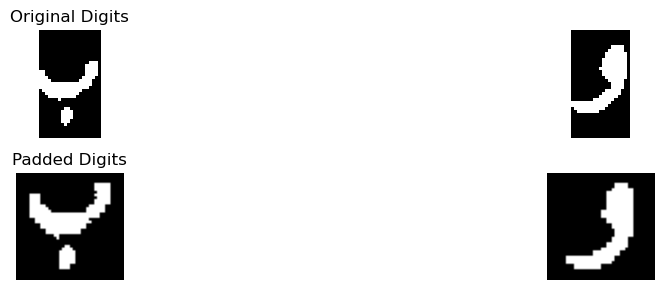

Best match: ب
Full comparison results: {'أ': 0.6187499999999999, 'ب': 3.7873655913978492, 'ج': 0.29791666666666666, 'د': 0.3333333333333333, 'ر': 0.3583333333333333, 'س': 1.1041666666666665, 'ص': 1.9541666666666666, 'ط': 0.46458333333333335, 'ع': 0.29791666666666666, 'ف': 0.1, 'ق': 0.3333333333333333, 'ك': 0.9000000000000001, 'ل': 0.03333333333333333, 'م': 0.5270833333333333, 'ن': 0.1958333333333333, 'ه': 0.15625, 'و': 0.6916666666666667, 'ي': 0.6270833333333333}
Confidence :  0.9165994623655913
Best match: و
Full comparison results: {'أ': 0.0, 'ب': 0.3951425729442971, 'ج': 0.3925, 'د': 3.452407407407408, 'ر': 4.316206896551724, 'س': 2.6517857142857144, 'ص': 1.7354166666666666, 'ط': 2.4475, 'ع': 0.65875, 'ف': 3.4275859788359786, 'ق': 2.63337962962963, 'ك': 1.9975, 'ل': 2.43375, 'م': 0.12, 'ن': 2.1975000000000002, 'ه': 2.65625, 'و': 4.976805555555555, 'ي': 3.3374358974358973}
Confidence :  0.33029932950191565
[['٨', '٤', '٣', '٣'], ['ب', 'و']]
Tilt angle: -1.00 degrees


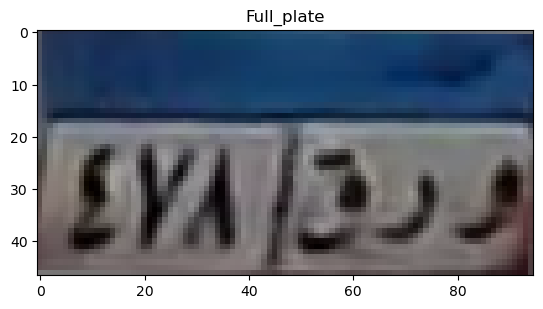

top
[0.37821179 0.33311126 0.46629983 0.51488975 0.53068632 0.49886541
 0.4918407  0.49225277 0.48105332 0.48737868 0.49252915 0.50697586
 0.50930853 0.50506669 0.49543403 0.49143799 0.49395785 0.49550886
 0.50430941 0.52106799 0.51809311 0.50354642 0.49837934 0.50338988
 0.50517357 0.50079078 0.48479343 0.49610593 0.50185397 0.51114637
 0.52031162 0.51384581 0.49979343 0.46305066 0.45507929 0.50518186
 0.50965255 0.51348821 0.50852027 0.51212946 0.51648466 0.52912252
 0.53281125 0.54057314 0.54180853 0.52571931 0.48851874]
[0.36737592 0.32314281 0.47971987 0.54583693 0.53606466 0.48912429
 0.48384391 0.47644454 0.46862385 0.47106036 0.4762571  0.49556997
 0.48952887 0.47009866 0.48966846 0.48360943 0.48114952 0.48016137
 0.49884765 0.51993312 0.47452828 0.43521305 0.46636493 0.48442275
 0.49028774 0.48367719 0.46162926 0.44363077 0.44917165 0.46007649
 0.4654042  0.46639174 0.46027794 0.45413042 0.45602808 0.46873535
 0.4743942  0.48522361 0.48898464 0.48654513 0.46889821 0.45799333
 

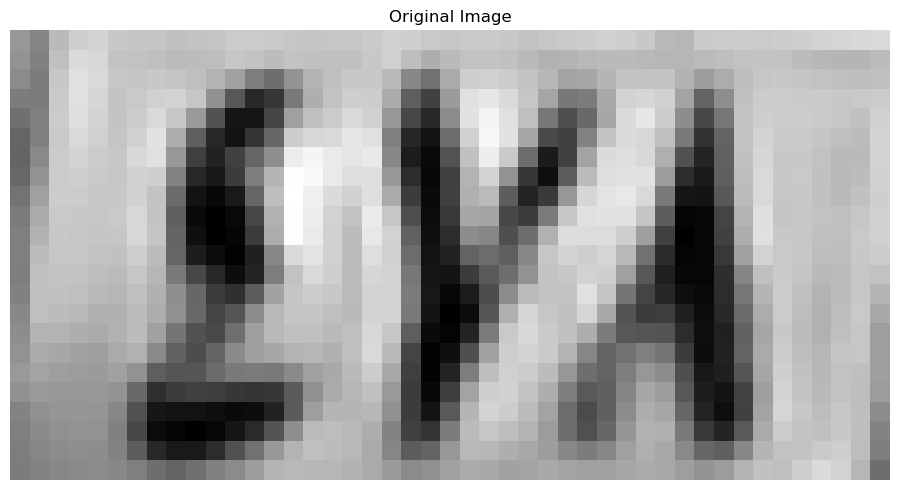

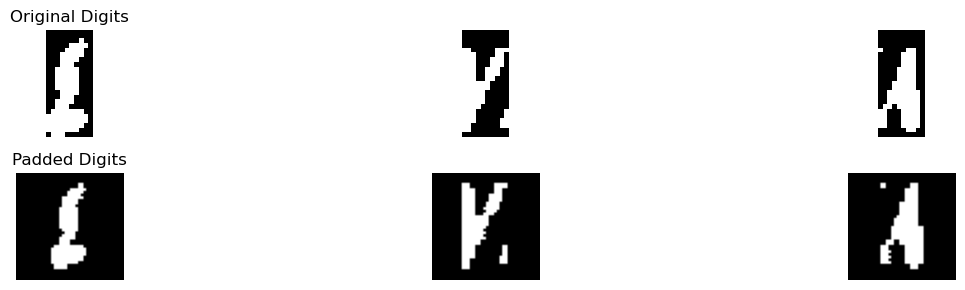

Best match: ٥
Full comparison results: {'١': 2.5576923076923075, '٢': 2.0216346153846154, '٣': 1.5395704334365325, '٤': 3.4411630036630036, '٥': 3.495033539731682, '٦': 0.5086309523809524, '٧': 0.9077205882352941, '٨': 2.84375, '٩': 1.5210218702865763}
Confidence :  0.0269352680343391
Best match: ٧
Full comparison results: {'١': 0.29411764705882354, '٢': 1.2941176470588236, '٣': 1.6448335913312695, '٤': 0.693014705882353, '٥': 1.3104774804658705, '٦': 0.4529411764705883, '٧': 2.047794117647059, '٨': 2.0364787581699346, '٩': 1.6605392156862746}
Confidence :  0.005657679738562127
Best match: ٨
Full comparison results: {'١': 1.4375, '٢': 0.9375, '٣': 0.5625, '٤': 0.28125, '٥': 1.8938384564352053, '٦': 1.36875, '٧': 0.8720588235294118, '٨': 3.4291666666666667, '٩': 1.2977941176470589}
Confidence :  0.7676641051157307
In horizontal_segmentation_1
0 17
In sub_horizontal_segmentation
0 5
7 16
18 30
33 45
In refine_segmentation_1


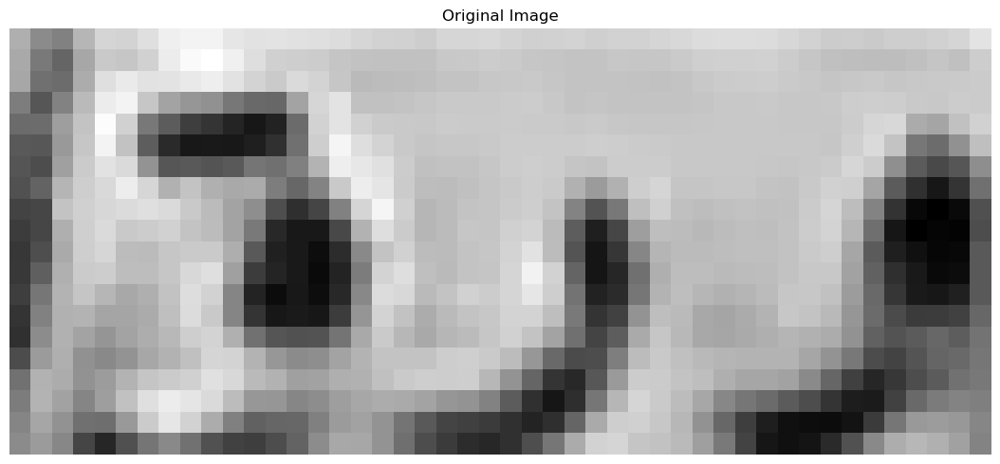

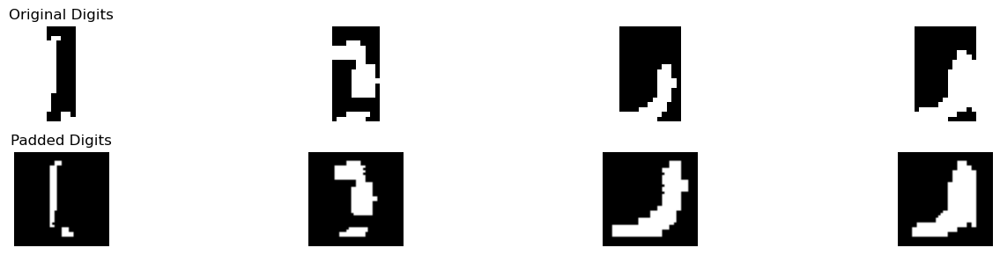

Best match: ع
Full comparison results: {'أ': 0.3581730769230769, 'ب': 0.375, 'ج': 0.19328703703703703, 'د': 0.09375, 'ر': 0.3763830584707646, 'س': 0.0, 'ص': 0.0, 'ط': 0.39282773386034253, 'ع': 1.0417763157894737, 'ف': 0.21875, 'ق': 0.13465608465608464, 'ك': 0.32386363636363635, 'ل': 0.8483359133126935, 'م': 0.5688061938061938, 'ن': 0.37660714285714286, 'ه': 0.4155241935483871, 'و': 0.21944444444444444, 'ي': 0.05555555555555555}
Confidence :  0.09672020123839009
Best match: ج
Full comparison results: {'أ': 0.8159722222222223, 'ب': 0.3653795278795279, 'ج': 2.8170595961619807, 'د': 1.673456630538549, 'ر': 0.17261904761904762, 'س': 0.1607142857142857, 'ص': 0.9910714285714285, 'ط': 1.0478837285902505, 'ع': 0.903610859044162, 'ف': 2.0190493595098857, 'ق': 2.1432470064049007, 'ك': 0.5217803030303031, 'ل': 0.5114247311827957, 'م': 0.7133838383838385, 'ن': 1.0292063492063492, 'ه': 0.9217069892473118, 'و': 1.9131944444444444, 'ي': 0.9875301932367149}
Confidence :  0.33690629487853996
Best match:

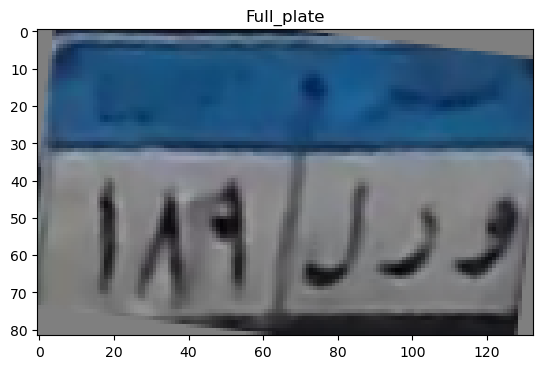

top
[0.39315809 0.42621682 0.46836667 0.46165957 0.50978459 0.55252085
 0.5791011  0.6094751  0.63414077 0.64244081 0.63351956 0.63263064
 0.62838564 0.61232589 0.59200918 0.57526745 0.56617648 0.56778349
 0.57287726 0.57502472 0.58010571 0.59012083 0.59942811 0.60573463
 0.59899023 0.58113105 0.57264364 0.57508841 0.58667945 0.59385102
 0.57906339 0.5667679  0.57818332 0.59794629 0.61443127 0.6209728
 0.62466801 0.62535259 0.62791169 0.63044473 0.63211615 0.6368288
 0.63673091 0.62532207 0.62132479 0.61565814 0.60719458 0.60914534
 0.61412141 0.61709053 0.6132793  0.59145135 0.57769333 0.57099308
 0.5749223  0.5807994  0.588748   0.59864917 0.60506239 0.59535082
 0.58592971 0.5775712  0.567318   0.55841349 0.54831321 0.55458285]
[0.36475894 0.45662872 0.48838783 0.47052421 0.52907239 0.57098448
 0.58399809 0.58706127 0.5872014  0.57478203 0.57305179 0.58315672
 0.59324877 0.59069528 0.5793796  0.56758152 0.55666661 0.55481156
 0.56433766 0.56804198 0.56480108 0.56264629 0.56002715 0.5

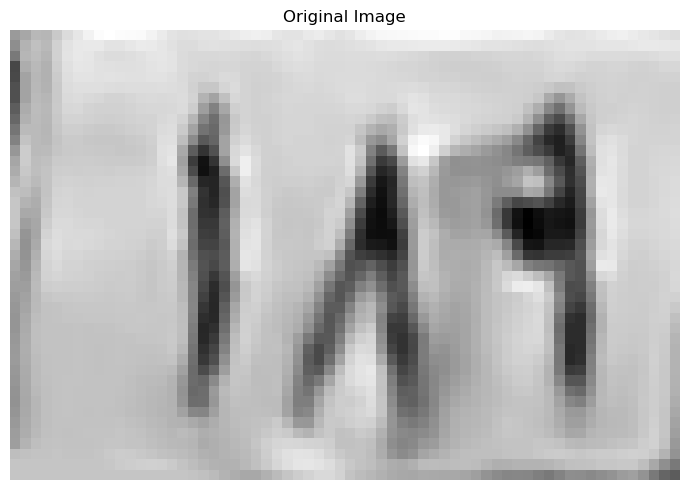

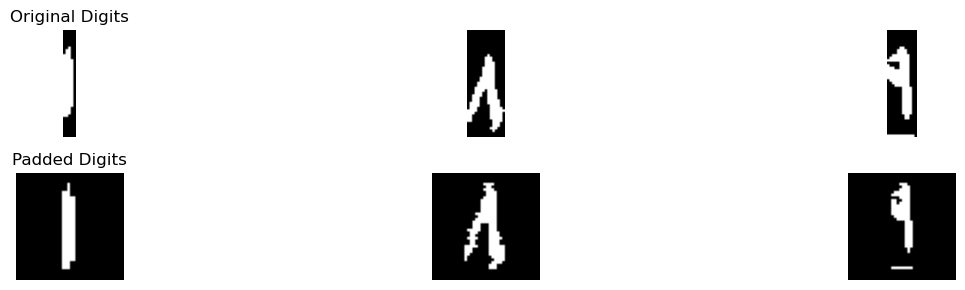

Best match: ١
Full comparison results: {'١': 3.3562499999999997, '٢': 1.446168414918415, '٣': 1.34171826625387, '٤': 1.6405906593406594, '٥': 1.0109096270086981, '٦': 0.14285714285714285, '٧': 1.4202205882352943, '٨': 2.240972222222222, '٩': 0.6017628205128205}
Confidence :  0.5576388888888888
Best match: ٨
Full comparison results: {'١': 2.70625, '٢': 0.5874999999999999, '٣': 0.5390866873065016, '٤': 0.60625, '٥': 1.1131919873212444, '٦': 1.24375, '٧': 0.6841911764705882, '٨': 5.3, '٩': 2.759150326797386}
Confidence :  1.270424836601307
Best match: ١
Full comparison results: {'١': 5.8875, '٢': 0.34090909090909094, '٣': 0.5802051083591331, '٤': 1.0220238095238094, '٥': 1.069249410290432, '٦': 1.0613095238095238, '٧': 0.3014705882352941, '٨': 2.697222222222222, '٩': 2.7374780040221216}
Confidence :  1.5750109979889393
In horizontal_segmentation_1
0 22
25 41
46 66
In refine_segmentation_1


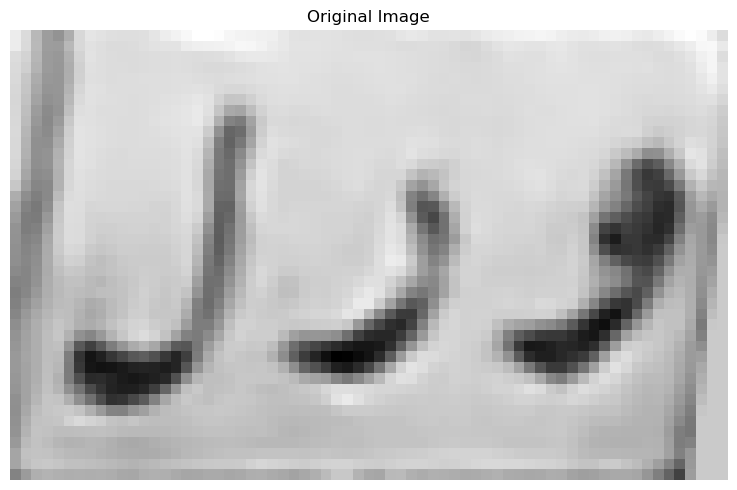

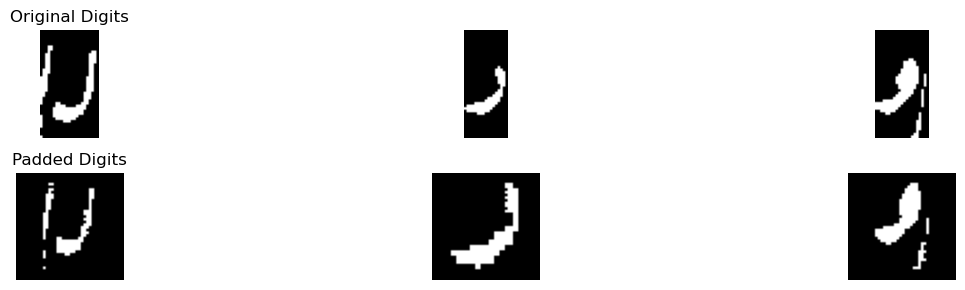

Best match: ب
Full comparison results: {'أ': 0.05263157894736842, 'ب': 0.6270990202789424, 'ج': 0.043478260869565216, 'د': 0.11670454545454546, 'ر': 0.18786967418546366, 'س': 0.375, 'ص': 0.49136904761904765, 'ط': 0.043478260869565216, 'ع': 0.14375, 'ف': 0.08388157894736842, 'ق': 0.3893953634085213, 'ك': 0.3068181818181818, 'ل': 0.18914473684210525, 'م': 0.13636363636363635, 'ن': 0.4178822055137844, 'ه': 0.4790322580645161, 'و': 0.2518709969367864, 'ي': 0.05263157894736842}
Confidence :  0.06786498632994736
Best match: ر
Full comparison results: {'أ': 0.08, 'ب': 0.42713859416445626, 'ج': 0.264537037037037, 'د': 2.708796296296296, 'ر': 3.2147413793103445, 'س': 2.4107142857142856, 'ص': 2.0079166666666666, 'ط': 2.2825, 'ع': 0.49875, 'ف': 2.633009259259259, 'ق': 1.2422222222222223, 'ك': 2.3600000000000003, 'ل': 1.54, 'م': 0.08, 'ن': 1.7837500000000002, 'ه': 1.25, 'و': 1.6111111111111112, 'ي': 2.2522115384615384}
Confidence :  0.2529725415070243
Best match: م
Full comparison results: {'أ': 0

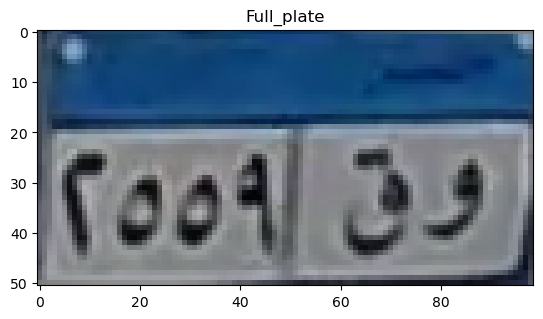

top
[0.27046075 0.38115126 0.41703502 0.55027984 0.62110146 0.60346375
 0.59490461 0.59978009 0.62442776 0.63857684 0.64419032 0.64229839
 0.62726587 0.60421096 0.59157184 0.60166974 0.60693462 0.60321819
 0.59449721 0.58479371 0.57588196 0.56517056 0.57601837 0.60248824
 0.60446672 0.59784376 0.58623537 0.57497533 0.56583338 0.55874748
 0.55088047 0.54445752 0.53656194 0.53663065 0.55032    0.55479304
 0.55131664 0.5418174  0.5407927  0.54363334 0.54335725 0.55152503
 0.56349294 0.57476077 0.57683716 0.58337471 0.57442292 0.54244283
 0.53439044]
[0.27531857 0.4015936  0.43080887 0.56850336 0.621107   0.56205352
 0.57318015 0.58651501 0.60747472 0.63602022 0.6445098  0.64471631
 0.63688354 0.63029317 0.5945085  0.55851739 0.55093467 0.54834918
 0.54190039 0.52724447 0.52016196 0.51014882 0.51686881 0.53119172
 0.53883955 0.53516213 0.52512531 0.5102339  0.50593314 0.50426936
 0.50290977 0.50054629 0.49880538 0.49880939 0.5059349  0.51947657
 0.52859498 0.51661075 0.50802808 0.50609793 

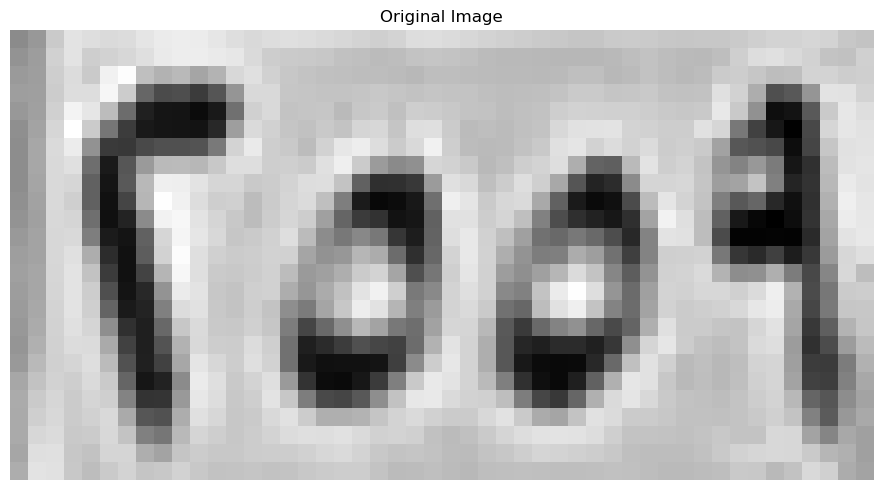

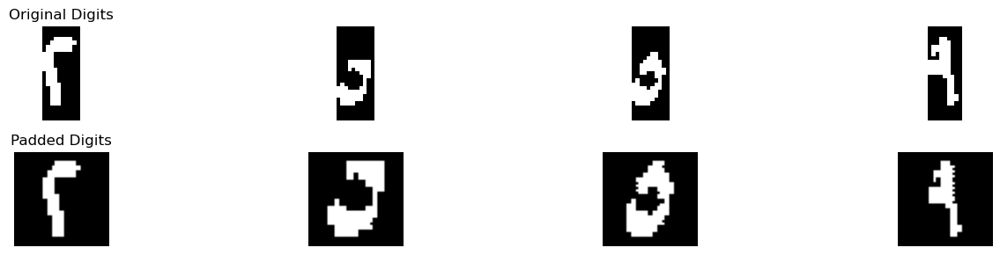

Best match: ٢
Full comparison results: {'١': 0.0, '٢': 4.125, '٣': 3.5359907120743035, '٤': 2.59375, '٥': 2.5936993218339968, '٦': 1.1, '٧': 1.7746323529411765, '٨': 0.3555555555555555, '٩': 0.8880718954248367}
Confidence :  0.29450464396284826
Best match: ٥
Full comparison results: {'١': 0.08333333333333333, '٢': 0.9166666666666667, '٣': 1.0416666666666665, '٤': 1.7916666666666667, '٥': 5.59375, '٦': 1.3020833333333335, '٧': 0.7083333333333334, '٨': 0.7916666666666666, '٩': 0.2916666666666667}
Confidence :  1.9010416666666665
Best match: ٥
Full comparison results: {'١': 0.5000000000000001, '٢': 0.95, '٣': 1.03125, '٤': 2.50625, '٥': 6.785416666666666, '٦': 1.4437499999999999, '٧': 0.65, '٨': 1.28125, '٩': 0.55625}
Confidence :  2.1395833333333334
Best match: ٩
Full comparison results: {'١': 3.53125, '٢': 2.3482142857142856, '٣': 1.27921826625387, '٤': 2.0125, '٥': 1.8738528306059266, '٦': 1.4833333333333334, '٧': 0.8279411764705883, '٨': 2.989583333333333, '٩': 5.394345238095239}
Conf

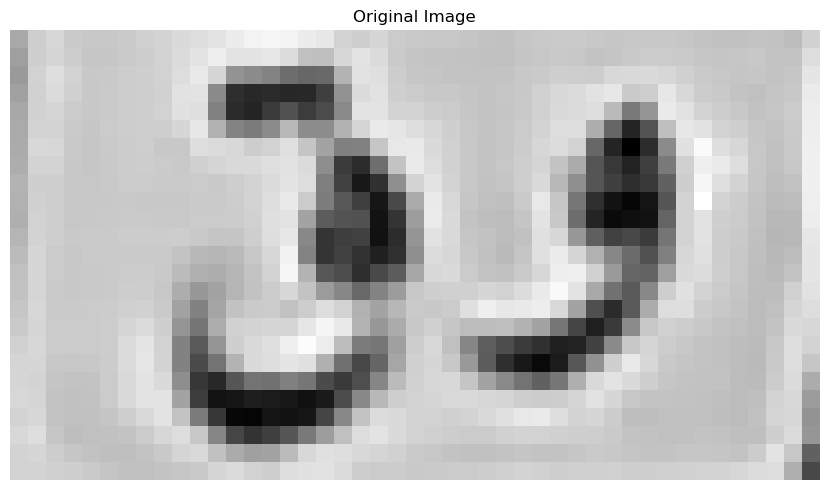

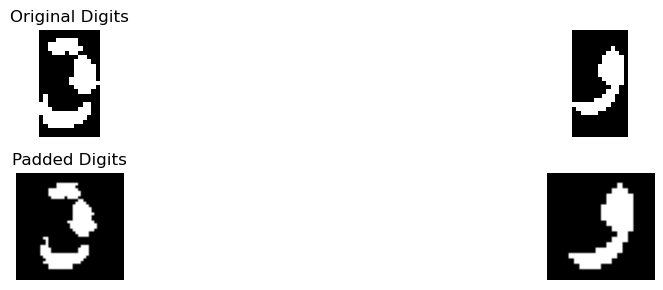

Best match: ق
Full comparison results: {'أ': 0.41220238095238093, 'ب': 0.5065484084880637, 'ج': 3.4322808833678398, 'د': 4.554590548340548, 'ر': 1.3816363246947951, 'س': 1.4196428571428572, 'ص': 1.6994047619047619, 'ط': 1.716979578392622, 'ع': 2.4330357142857144, 'ف': 3.6345899470899474, 'ق': 4.576554232804233, 'ك': 1.3768939393939394, 'ل': 2.050595238095238, 'م': 0.6364989177489178, 'ن': 2.9679166666666665, 'ه': 1.2716397849462366, 'و': 2.5459656084656084, 'ي': 2.729527990125816}
Confidence :  0.010981842231842176
Best match: و
Full comparison results: {'أ': 0.0, 'ب': 0.3951425729442971, 'ج': 0.5208333333333333, 'د': 3.649398148148148, 'ر': 4.42058908045977, 'س': 3.2767857142857144, 'ص': 2.3812499999999996, 'ط': 2.458333333333333, 'ع': 0.9270833333333333, 'ف': 3.318121693121693, 'ق': 2.909722222222222, 'ك': 2.0208333333333335, 'ل': 2.885416666666667, 'م': 0.125, 'ن': 2.4487500000000004, 'ه': 2.8235887096774195, 'و': 5.243055555555555, 'ي': 3.6171474358974356}
Confidence :  0.411233237

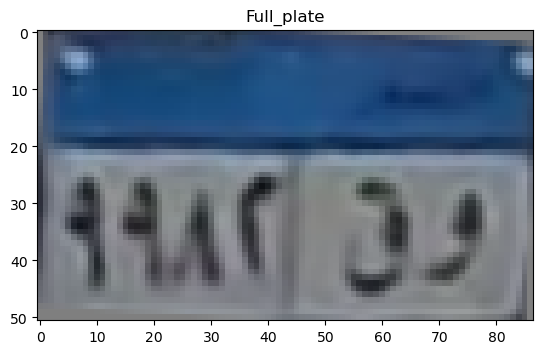

top
[0.26561598 0.3975125  0.48150176 0.51071457 0.53895867 0.57693132
 0.60872322 0.62371108 0.61999479 0.61746228 0.62356541 0.62345585
 0.62013915 0.60487051 0.58713067 0.57959488 0.57708055 0.57651995
 0.57536327 0.57314301 0.58218538 0.59403176 0.60628363 0.61441068
 0.61684537 0.61271335 0.60349533 0.59186498 0.58916343 0.58732312
 0.5902374  0.59371372 0.59834055 0.59970767 0.58720375 0.56992403
 0.55485224 0.55064854 0.5655155  0.58178778 0.57966109 0.56685867
 0.54436426]
[0.23949429 0.3995914  0.48763797 0.5158774  0.52604358 0.53614406
 0.56623461 0.59188773 0.588802   0.58800116 0.58088924 0.56842336
 0.56849933 0.56890431 0.56485428 0.57102581 0.57925952 0.58560546
 0.58741946 0.58401365 0.58875528 0.59057081 0.58511731 0.57865505
 0.57737034 0.57568772 0.56825427 0.56197156 0.56347579 0.56870643
 0.57365986 0.57998624 0.60002356 0.62315829 0.61910012 0.60665165
 0.60060094 0.60958389 0.62771354 0.63924515 0.63656464 0.62278165
 0.60097949]
[0.22368329 0.3964425  0.4867937

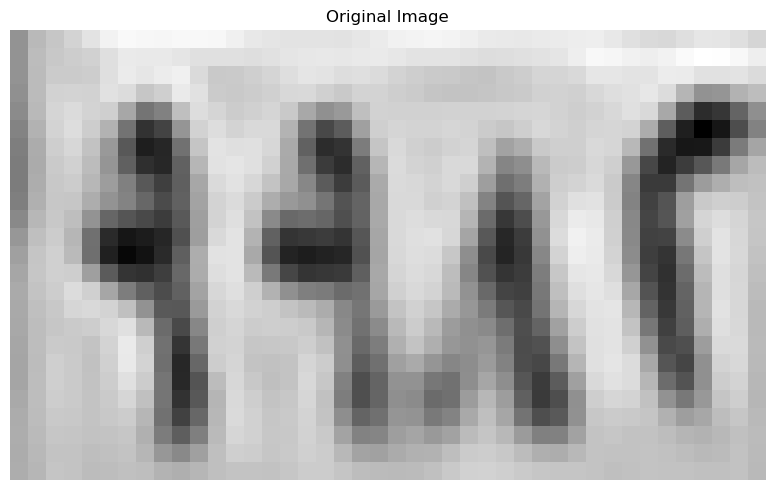

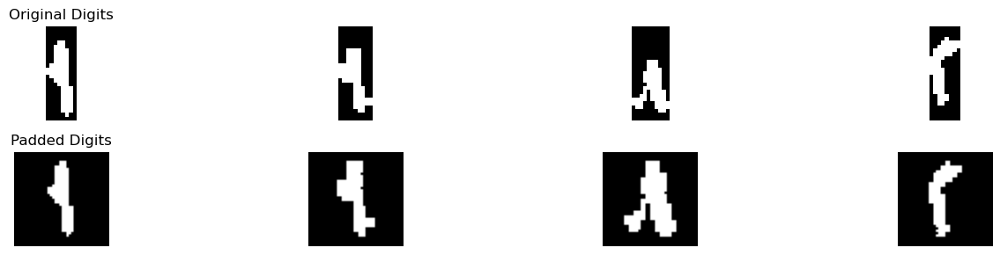

Best match: ١
Full comparison results: {'١': 4.78125, '٢': 2.5450174825174825, '٣': 1.1990131578947367, '٤': 2.8325549450549454, '٥': 1.2196345643520565, '٦': 0.9148809523809524, '٧': 0.7591911764705883, '٨': 3.2159722222222222, '٩': 3.3807032428355965}
Confidence :  0.7002733785822017
Best match: ٩
Full comparison results: {'١': 2.875, '٢': 3.53125, '٣': 1.546923374613003, '٤': 3.0625, '٥': 2.0681621332743623, '٦': 0.5625, '٧': 1.6169117647058824, '٨': 1.9923611111111112, '٩': 3.829861111111111}
Confidence :  0.14930555555555558
Best match: ٥
Full comparison results: {'١': 1.2755681818181819, '٢': 1.2698863636363635, '٣': 0.9147727272727273, '٤': 0.9460227272727273, '٥': 3.5738636363636367, '٦': 1.2954545454545456, '٧': 0.42613636363636365, '٨': 3.1079545454545454, '٩': 1.5909090909090908}
Confidence :  0.23295454545454564
Best match: ٢
Full comparison results: {'١': 0.125, '٢': 4.34375, '٣': 3.8349458204334366, '٤': 2.9535714285714287, '٥': 2.468547287335987, '٦': 1.1583333333333334,

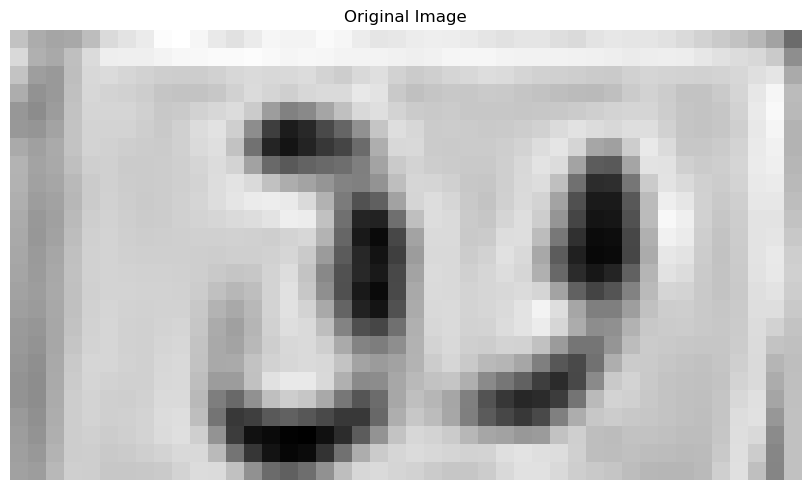

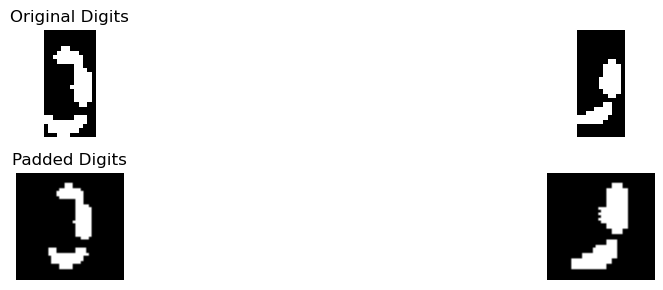

Best match: د
Full comparison results: {'أ': 0.375, 'ب': 0.23774314765694077, 'ج': 2.7506893874491327, 'د': 4.278705209365639, 'ر': 1.7486182801456414, 'س': 0.9732142857142857, 'ص': 0.9273809523809524, 'ط': 1.6431982872200264, 'ع': 1.3561365698729582, 'ف': 3.8960160818713447, 'ق': 4.211796733212341, 'ك': 0.5113636363636364, 'ل': 2.4254877495462797, 'م': 1.2272727272727273, 'ن': 3.5863095238095237, 'ه': 1.3028897849462366, 'و': 2.8584656084656084, 'ي': 2.5603655704199184}
Confidence :  0.033454238076648934
Best match: و
Full comparison results: {'أ': 0.3333333333333333, 'ب': 0.3609218576195773, 'ج': 0.6091589861751152, 'د': 3.4142905242905246, 'ر': 3.6814768508602844, 'س': 2.674107142857143, 'ص': 1.9699404761904762, 'ط': 2.5184041501976284, 'ع': 1.1948060675883254, 'ف': 2.9618855606758836, 'ق': 3.1948082010582013, 'ك': 2.350378787878788, 'ل': 2.679464285714286, 'م': 0.2585227272727273, 'ن': 2.200595238095238, 'ه': 2.1528225806451613, 'و': 4.971230158730158, 'ي': 3.5488732282210544}
Conf

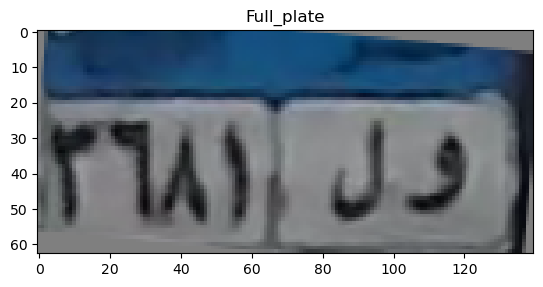

1.0 48.0 0.0 31.0
top
[0.38027711 0.35393107 0.34936727 0.294113   0.23211604 0.24033208
 0.36339478 0.42383077 0.43630779 0.38542314 0.27742299 0.20848917
 0.20726808 0.23633231 0.27093184 0.30639446 0.34896493 0.36647412
 0.36362807 0.29122964 0.17709079 0.08767587 0.08486926 0.09813136
 0.09901209 0.10639273 0.10099824 0.07859093 0.08830051 0.14480031
 0.30146971 0.47549835 0.55236179 0.54305477 0.53796745 0.53563902
 0.53302719 0.52736696 0.51345765 0.47585854 0.42827169 0.419459
 0.4532535  0.49448324 0.52335606 0.53364575 0.52088856]
[0.36608615 0.35939061 0.35113629 0.25325662 0.16171657 0.14913078
 0.25613605 0.3460198  0.33388975 0.24458118 0.13518227 0.10190231
 0.11665643 0.14277539 0.19007356 0.26559454 0.35807108 0.39784667
 0.38035279 0.27549679 0.11129176 0.04049738 0.06133602 0.1102101
 0.12493896 0.10757146 0.09910409 0.11908718 0.1133308  0.16248917
 0.30614986 0.47073979 0.54564883 0.5340949  0.53030814 0.52935838
 0.52850054 0.52941966 0.52914392 0.4931911  0.414468

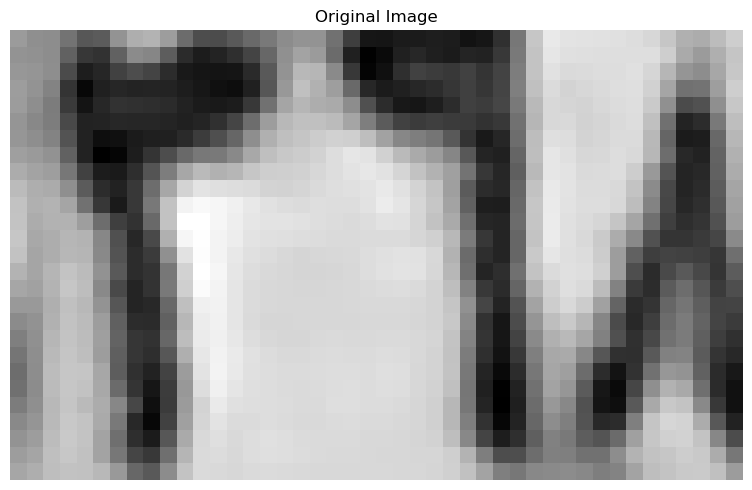

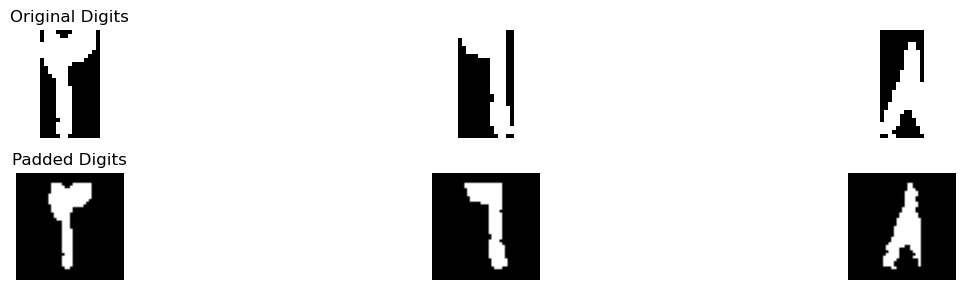

Best match: ٣
Full comparison results: {'١': 0.375, '٢': 4.65625, '٣': 6.866679566563468, '٤': 2.34375, '٥': 2.3245061182367683, '٦': 1.725, '٧': 2.5551470588235294, '٨': 0.47430555555555554, '٩': 1.0089869281045751}
Confidence :  1.1052147832817338
Best match: ٦
Full comparison results: {'١': 1.78125, '٢': 1.09375, '٣': 1.502999226006192, '٤': 0.125, '٥': 2.1269810555801265, '٦': 6.375, '٧': 0.3639705882352941, '٨': 1.2763888888888888, '٩': 2.6779003267973853}
Confidence :  1.8485498366013073
Best match: ٥
Full comparison results: {'١': 1.1964285714285712, '٢': 0.5714285714285714, '٣': 0.6015866873065016, '٤': 0.6830357142857143, '٥': 1.936597007223942, '٦': 1.5925595238095236, '٧': 1.2334558823529413, '٨': 1.8, '٩': 1.0876809056956116}
Confidence :  0.06829850361197098
In horizontal_segmentation_1
13 28
34 51
In refine_segmentation_1


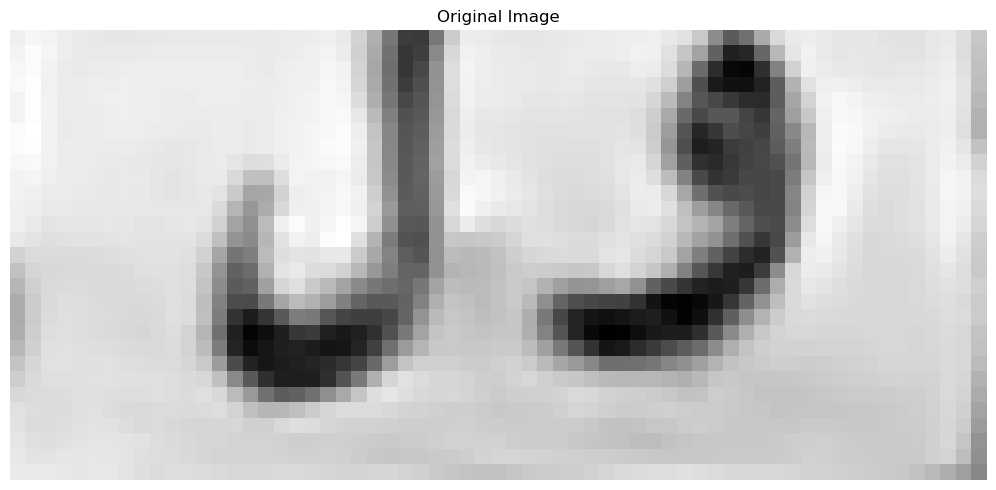

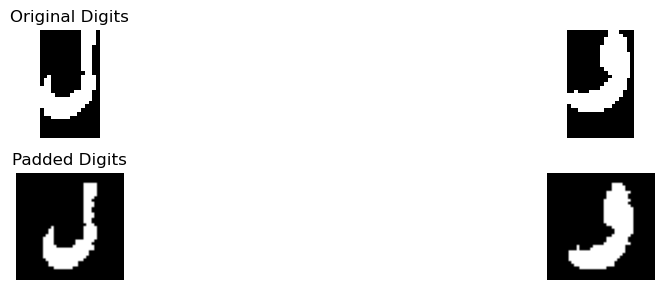

Best match: ن
Full comparison results: {'أ': 0.15000000000000002, 'ب': 0.3911637931034483, 'ج': 1.0283514492753625, 'د': 3.529259259259259, 'ر': 3.7730581138002424, 'س': 1.5, 'ص': 1.0952380952380953, 'ط': 1.838274044795784, 'ع': 1.68125, 'ف': 2.353505291005291, 'ق': 2.5056547619047618, 'ك': 1.081439393939394, 'ل': 4.04375, 'م': 0.19090909090909092, 'ن': 4.056666666666667, 'ه': 1.042540322580645, 'و': 2.6891203703703708, 'ي': 2.813802954292085}
Confidence :  0.006458333333333233
Best match: د
Full comparison results: {'أ': 0.125, 'ب': 0.4504310344827586, 'ج': 1.0844907407407407, 'د': 4.741759259259259, 'ر': 3.6072413793103446, 'س': 3.21875, 'ص': 1.9708333333333334, 'ط': 2.65625, 'ع': 1.1666666666666665, 'ف': 4.174933862433862, 'ق': 2.881944444444444, 'ك': 2.46875, 'ل': 3.083333333333333, 'م': 0.15625, 'ن': 2.8533333333333335, 'ه': 3.6068548387096775, 'و': 4.287037037037036, 'ي': 3.3391025641025642}
Confidence :  0.22736111111111112
[['٣', '٦', '٥'], ['ن', 'د']]
Tilt angle: -2.00 degrees

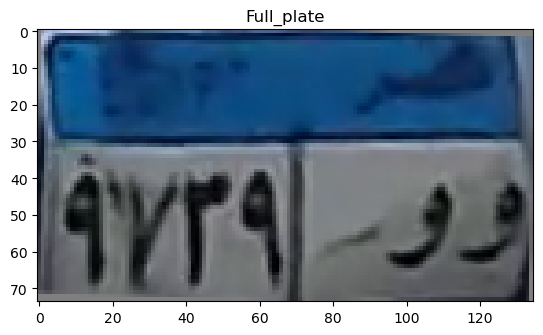

top
[0.12486998 0.07746759 0.33662262 0.42223358 0.36988329 0.35868553
 0.36709729 0.3687608  0.42896711 0.44818157 0.46058699 0.47306341
 0.4769911  0.47630789 0.47966875 0.45027017 0.41899719 0.37314088
 0.36900011 0.37240211 0.37538756 0.38937779 0.38780902 0.3550805
 0.3263351  0.34876157 0.36294978 0.36844577 0.35288664 0.34608977
 0.31506189 0.30781618 0.3064758  0.29637316 0.26002206 0.25974632
 0.27626297 0.27306564 0.2435926  0.25338528 0.37939383 0.41285723
 0.40057663 0.4080701  0.4393204  0.44363451 0.4432391  0.43243042
 0.43284183 0.43054147 0.4274555  0.42154603 0.42085027 0.43171804
 0.44360058 0.4351376  0.40691544 0.40128705 0.40809029 0.42448288
 0.43695643 0.4531171  0.48208408 0.51453555 0.5207792  0.50576186
 0.5112942 ]
[0.11210873 0.07621162 0.36235588 0.44485216 0.40274353 0.43527843
 0.45819426 0.41861738 0.48173549 0.51168199 0.53028799 0.54060517
 0.54149893 0.5416364  0.54940907 0.55297301 0.54550924 0.52476392
 0.54707991 0.55638089 0.55520531 0.56809471 0

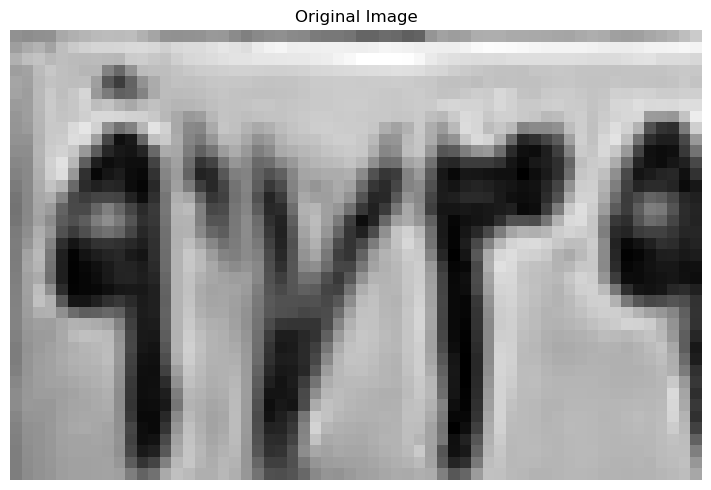

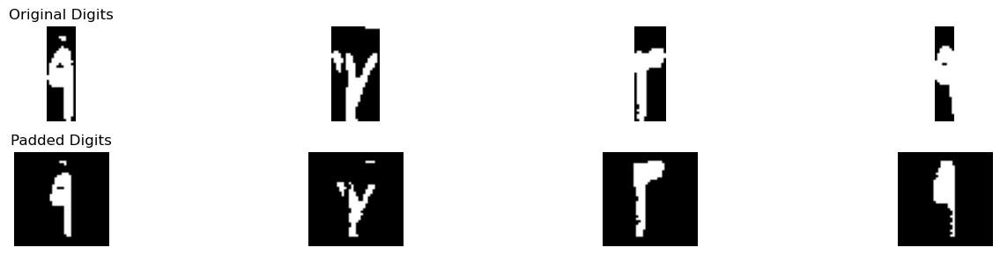

Best match: ١
Full comparison results: {'١': 4.714583333333334, '٢': 1.7835081585081587, '٣': 0.8338815789473684, '٤': 0.53125, '٥': 0.7288672047766473, '٦': 1.2458333333333333, '٧': 1.2757352941176472, '٨': 3.1083333333333334, '٩': 2.720855329311212}
Confidence :  0.8031250000000001
Best match: ٧
Full comparison results: {'١': 0.03125, '٢': 1.90625, '٣': 1.1167763157894737, '٤': 1.15625, '٥': 0.3330292643373139, '٦': 0.0, '٧': 2.0955882352941178, '٨': 0.2625, '٩': 0.360702614379085}
Confidence :  0.09466911764705888
Best match: ٣
Full comparison results: {'١': 0.6923076923076924, '٢': 3.966346153846154, '٣': 4.093653250773993, '٤': 1.662614468864469, '٥': 2.3870061182367683, '٦': 2.1690476190476193, '٧': 0.9540441176470589, '٨': 0.7409722222222223, '٩': 1.2690108094519859}
Confidence :  0.06365354846391957
Best match: ١
Full comparison results: {'١': 4.144444444444445, '٢': 2.4529428904428907, '٣': 1.2854102167182662, '٤': 2.096978021978022, '٥': 1.858971878224974, '٦': 1.045833333333

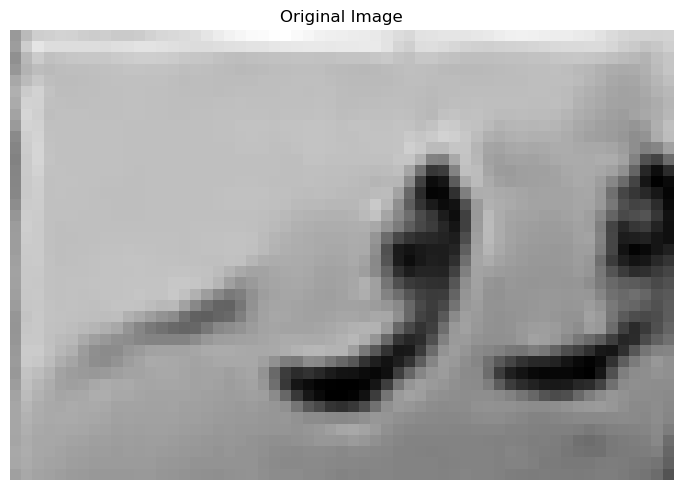

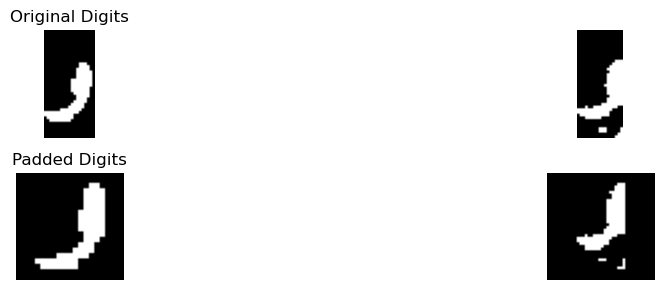

Best match: ر
Full comparison results: {'أ': 0.0, 'ب': 0.856763925729443, 'ج': 0.25, 'د': 2.5251068376068377, 'ر': 4.644728116710875, 'س': 1.6026785714285714, 'ص': 1.8993589743589743, 'ط': 2.71875, 'ع': 0.9879807692307692, 'ف': 3.6756461131461133, 'ق': 2.637286324786325, 'ك': 2.512019230769231, 'ل': 2.7620192307692304, 'م': 0.0, 'ن': 2.5072115384615388, 'ه': 1.78125, 'و': 4.448896011396012, 'ي': 3.2517628205128206}
Confidence :  0.09791605265743186
Best match: ق
Full comparison results: {'أ': 0.11805555555555555, 'ب': 0.09698275862068965, 'ج': 0.23379629629629628, 'د': 0.7231481481481481, 'ر': 0.7716071428571429, 'س': 0.5714285714285714, 'ص': 1.206547619047619, 'ط': 0.1758893280632411, 'ع': 0.05555555555555555, 'ف': 1.632866889445837, 'ق': 1.6463676552492341, 'ك': 0.34090909090909083, 'ل': 0.6220760233918128, 'م': 0.44949494949494945, 'ن': 0.2736111111111111, 'ه': 1.1998655913978493, 'و': 1.4871031746031749, 'ي': 0.8685850984764029}
Confidence :  0.006750382901698604
[['١', '٧', '٣', '

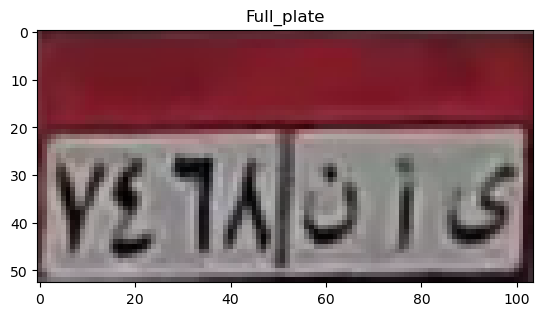

1.0 46.0 0.0 31.0
top
[0.25809085 0.3706128  0.4945081  0.58235546 0.61986576 0.65339146
 0.65135016 0.64733283 0.65007284 0.63352201 0.66316837 0.67044916
 0.67563911 0.6793992  0.67493561 0.67015304 0.66715642 0.66454517
 0.66260868 0.66338638 0.65652797 0.64904241 0.65254157 0.64666224
 0.64836814 0.64098626 0.62881288 0.61603098 0.61375719 0.61124878
 0.61568241 0.61654026 0.61107427 0.5689212  0.55759505 0.5629986
 0.58315029 0.60685045 0.60806909 0.60827817 0.60208064 0.59619376
 0.59601028 0.59597316 0.59570837]
[0.29543333 0.48392941 0.59642941 0.61311706 0.61458765 0.63891275
 0.61035882 0.59092431 0.58945373 0.59384275 0.59800941 0.60016804
 0.60147395 0.60626485 0.61053875 0.61682763 0.62581425 0.62995517
 0.63064257 0.62945213 0.60484117 0.58457386 0.59437319 0.587342
 0.59090333 0.5887229  0.59275635 0.58720801 0.58606729 0.5959438
 0.60314886 0.60788232 0.61242046 0.6021386  0.58138262 0.57738016
 0.57730392 0.57255515 0.57715074 0.58811469 0.59780667 0.57294071
 0.571772

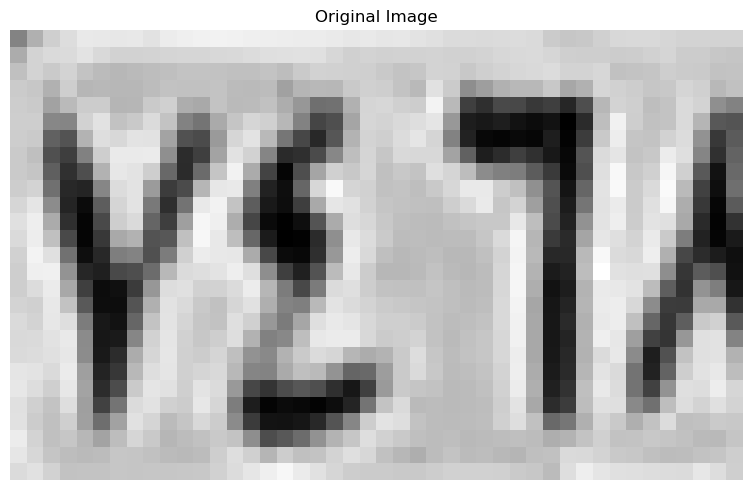

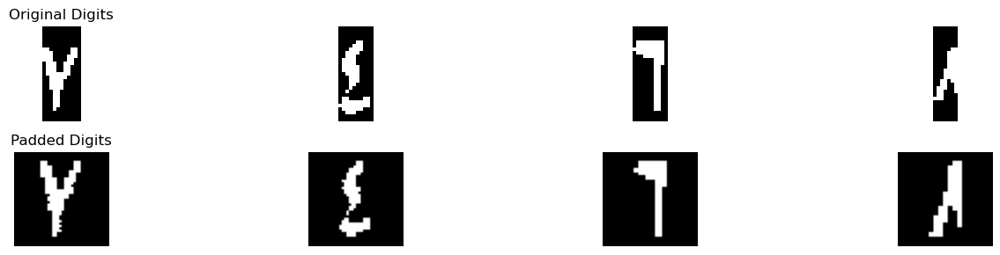

Best match: ٧
Full comparison results: {'١': 0.1764705882352941, '٢': 1.5716911764705883, '٣': 3.316756965944273, '٤': 1.6378676470588236, '٥': 0.9162151702786377, '٦': 0.2852941176470588, '٧': 3.9654411764705886, '٨': 1.2549428104575164, '٩': 1.6188725490196079}
Confidence :  0.3243421052631579
Best match: ٤
Full comparison results: {'١': 1.841346153846154, '٢': 2.40625, '٣': 2.011996904024768, '٤': 5.87799317617866, '٥': 2.70296605484299, '٦': 0.14285714285714285, '٧': 0.5176470588235293, '٨': 1.7395833333333333, '٩': 1.647404474610357}
Confidence :  1.587513560667835
Best match: ٦
Full comparison results: {'١': 2.3794642857142856, '٢': 1.0580357142857142, '٣': 1.594717492260062, '٤': 0.0, '٥': 1.6708314904909334, '٦': 5.9086309523809515, '٧': 0.7544117647058823, '٨': 0.43472222222222223, '٩': 2.5648342670401494}
Confidence :  1.671898342670401
Best match: ٥
Full comparison results: {'١': 0.5, '٢': 0.4999999999999999, '٣': 0.36145510835913314, '٤': 0.5803571428571428, '٥': 2.22231590

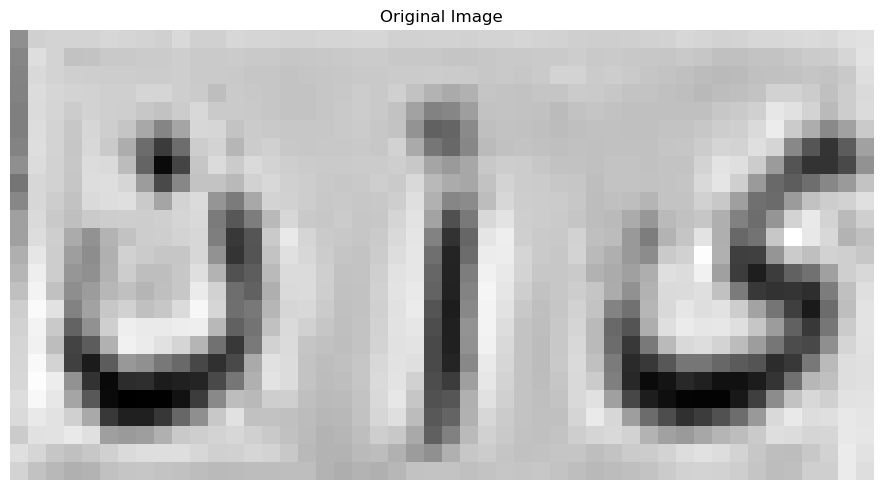

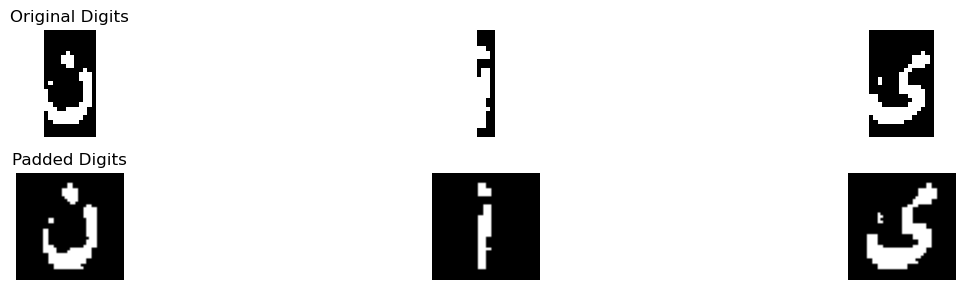

Best match: ن
Full comparison results: {'أ': 0.45, 'ب': 0.21087533156498675, 'ج': 2.1078200483091787, 'د': 4.812495791245791, 'ر': 2.862537927464839, 'س': 0.875, 'ص': 0.7172619047619048, 'ط': 2.6700839920948614, 'ع': 1.9375, 'ف': 3.4049933862433863, 'ق': 3.087929894179894, 'ك': 1.3522727272727273, 'ل': 2.8375000000000004, 'م': 0.8238636363636364, 'ن': 5.369166666666667, 'ه': 1.6486559139784946, 'و': 2.9144179894179896, 'ي': 2.4081661092530657}
Confidence :  0.2783354377104379
Best match: أ
Full comparison results: {'أ': 2.13901615857261, 'ب': 0.09375, 'ج': 0.3506728778467909, 'د': 0.5544167161814221, 'ر': 0.0, 'س': 0.03125, 'ص': 0.5092261904761904, 'ط': 0.9204607923311071, 'ع': 0.3770833333333333, 'ف': 0.6314964157706093, 'ق': 0.1193724020841871, 'ك': 0.0625, 'ل': 0.0, 'م': 0.2159090909090909, 'ن': 0.35719086021505375, 'ه': 0.4155241935483871, 'و': 0.5386904761904762, 'ي': 0.4205051892551892}
Confidence :  0.6092776831207514
Best match: ي
Full comparison results: {'أ': 0.30769230769230

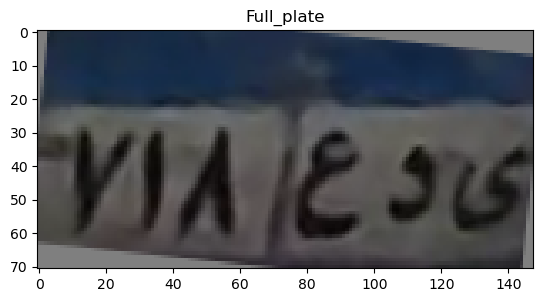

top
[0.32928922 0.31505111 0.32363296 0.34001764 0.35770985 0.35940851
 0.37230305 0.3858221  0.40507643 0.41273248 0.37994336 0.33876094
 0.27523326 0.18900049 0.16841394 0.26530855 0.35878388 0.38858612
 0.39072357 0.38978977 0.38673643 0.38671202 0.39269915 0.38997704
 0.35439142 0.33523561 0.2898404  0.27232061 0.2996854  0.34390997
 0.38117653 0.39226324 0.38894359 0.3580523  0.27818098 0.20660306
 0.20367125 0.28066525 0.35402433 0.38146713 0.38197998 0.37920587
 0.37900819 0.37688296 0.3804344  0.38580966 0.38773412 0.39346246
 0.40075248 0.40824603 0.41781927 0.43335283 0.41474576 0.30542318
 0.17489702 0.15372373 0.24212339 0.33972398 0.39435937 0.40354232
 0.39821743 0.39843032 0.39688095 0.39312845 0.3915588  0.38946211
 0.386056   0.38407221 0.38200657 0.38282309 0.39028814 0.39254558
 0.37489397 0.3487668 ]
[0.26693627 0.27985344 0.28765801 0.29360863 0.30429693 0.29129448
 0.29452798 0.30418317 0.33284774 0.3511651  0.33468409 0.30189793
 0.23137863 0.12415814 0.09345987 

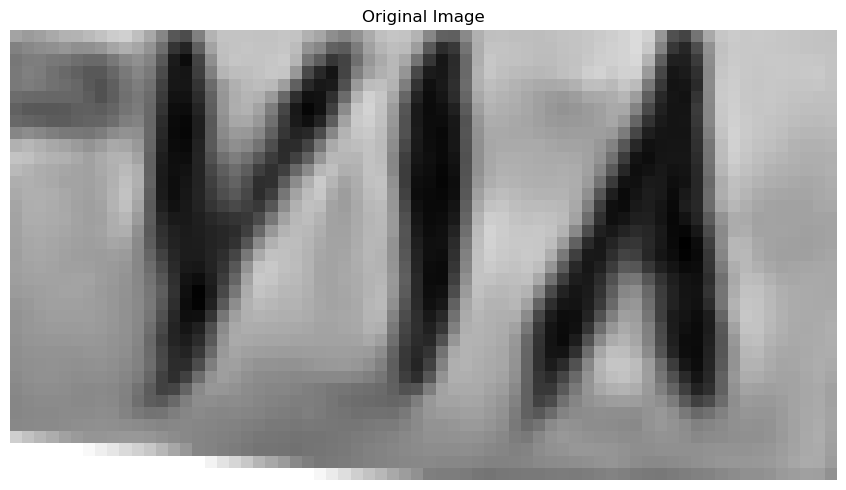

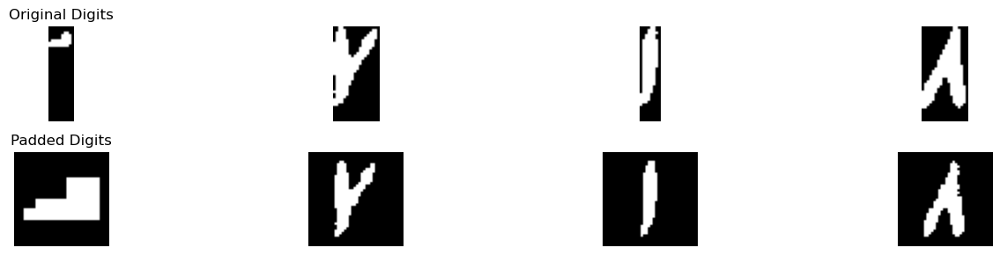

Best match: ٥
Full comparison results: {'١': 0.21875, '٢': 0.3125, '٣': 0.03125, '٤': 0.0, '٥': 1.125, '٦': 0.5625, '٧': 0.875, '٨': 1.0625, '٩': 0.3125}
Confidence :  0.03125
Best match: ٧
Full comparison results: {'١': 0.23529411764705882, '٢': 0.7647058823529412, '٣': 1.7374226006191953, '٤': 0.7720588235294118, '٥': 1.0997991301783872, '٦': 0.3165441176470588, '٧': 3.008455882352941, '٨': 0.9325163398692811, '٩': 1.2071078431372548}
Confidence :  0.6355166408668729
Best match: ١
Full comparison results: {'١': 3.3357142857142854, '٢': 2.0098339160839163, '٣': 1.27921826625387, '٤': 2.0468406593406594, '٥': 1.1835286746277458, '٦': 0.25535714285714284, '٧': 1.2088235294117649, '٨': 2.745138888888889, '٩': 1.1223919054801408}
Confidence :  0.2952876984126982
Best match: ٨
Full comparison results: {'١': 1.1525735294117647, '٢': 0.5882352941176471, '٣': 0.29411764705882354, '٤': 0.4154411764705882, '٥': 1.8137853825740824, '٦': 1.067279411764706, '٧': 0.9621323529411765, '٨': 4.67830882

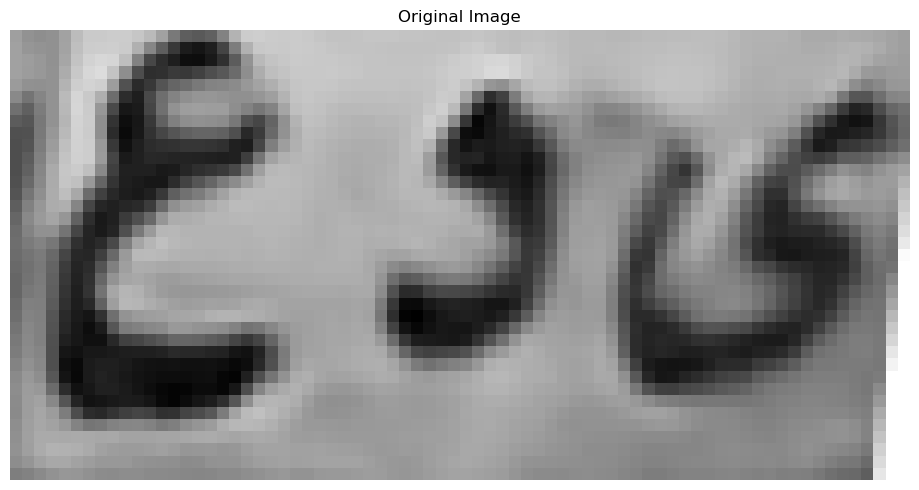

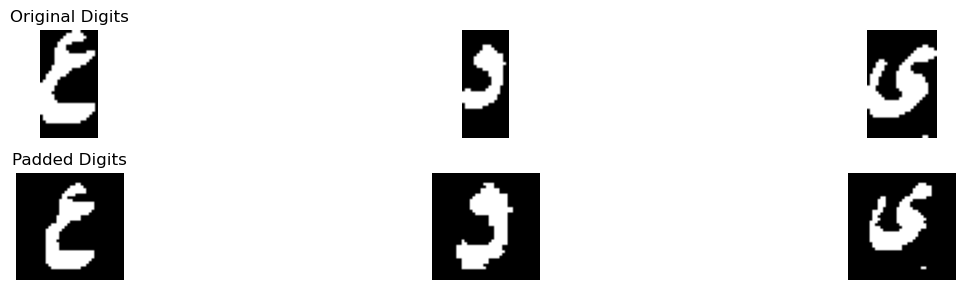

Best match: د
Full comparison results: {'أ': 0.4756944444444444, 'ب': 0.0, 'ج': 2.5019122383252816, 'د': 3.2182978911926283, 'ر': 0.5922282608695653, 'س': 1.0, 'ص': 0.26785714285714285, 'ط': 1.3944746376811594, 'ع': 1.88921783625731, 'ف': 2.483343776106934, 'ق': 1.6159878863826234, 'ك': 1.6089015151515151, 'ل': 1.2030336257309941, 'م': 2.100378787878788, 'ن': 1.650793650793651, 'ه': 2.15497311827957, 'و': 2.033564814814815, 'ي': 1.0659977703455965}
Confidence :  0.35819282643367334
Best match: د
Full comparison results: {'أ': 0.6339285714285714, 'ب': 0.0, 'ج': 2.1520517023234413, 'د': 4.06584114959115, 'ر': 1.1252044513457558, 'س': 2.665178571428571, 'ص': 1.5348214285714286, 'ط': 1.240818511198946, 'ع': 1.3139880952380951, 'ف': 3.4128637566137567, 'ق': 1.8606150793650793, 'ك': 1.321969696969697, 'ل': 1.7202380952380951, 'م': 2.5638528138528143, 'ن': 1.7037499999999997, 'ه': 3.2358870967741935, 'و': 2.6679894179894177, 'ي': 1.8061564341455645}
Confidence :  0.3264886964886966
Best match

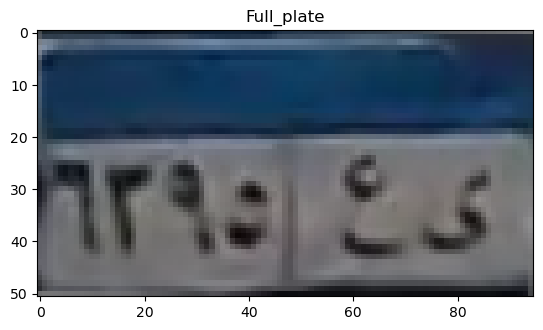

top
[0.32072958 0.32229625 0.38126878 0.41865743 0.4361923  0.46188594
 0.47253969 0.45526765 0.4429312  0.45125275 0.47152583 0.46824735
 0.47248566 0.47563364 0.48121728 0.49236924 0.50063747 0.50775515
 0.50919039 0.51666588 0.51738586 0.5240418  0.52808439 0.53431306
 0.53968848 0.53487843 0.51784412 0.49910178 0.49786097 0.51576679
 0.52196613 0.5294263  0.52450902 0.51652801 0.5190081  0.51856221
 0.51762306 0.52163054 0.52387176 0.52215608 0.5150176  0.51175308
 0.51443066 0.50877809 0.50067453 0.44359102 0.40002697]
[0.32909331 0.32294001 0.38937616 0.44488099 0.47406848 0.51255882
 0.51865362 0.50163596 0.48733473 0.47719827 0.47491084 0.47848874
 0.47856275 0.47368169 0.47003377 0.47258416 0.47651922 0.48391792
 0.48252765 0.47860608 0.47532075 0.46666568 0.46197262 0.46095281
 0.46165633 0.44881453 0.47965093 0.49430158 0.48802253 0.47938981
 0.48863169 0.48235694 0.47263598 0.47232049 0.46503865 0.4647835
 0.46573268 0.46999978 0.47026901 0.46612743 0.46266542 0.46146243
 0

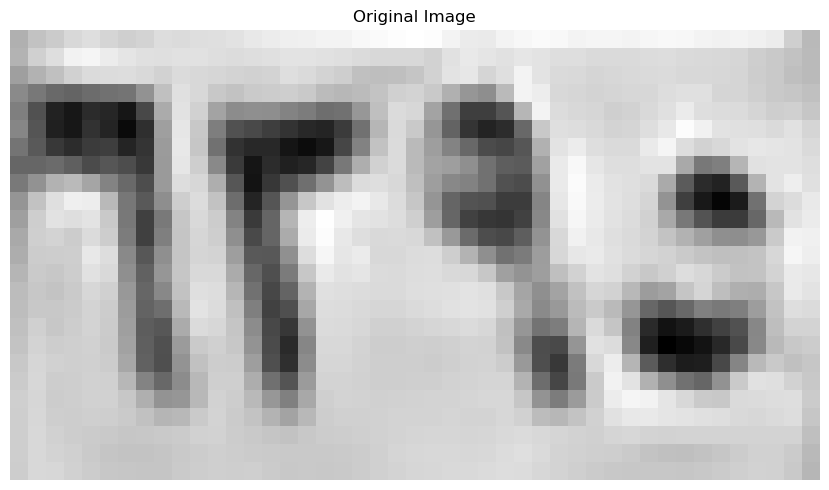

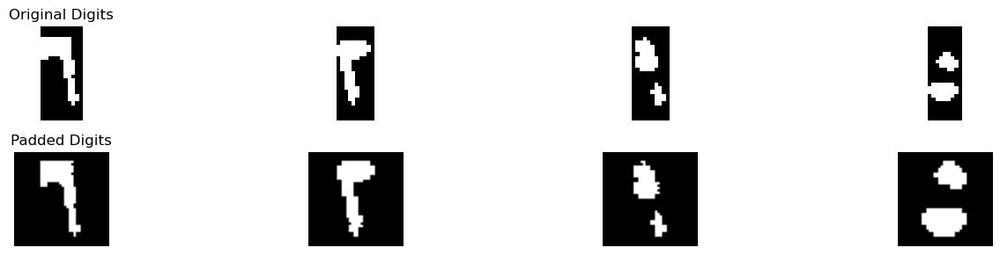

Best match: ٦
Full comparison results: {'١': 1.8308823529411764, '٢': 0.5790441176470589, '٣': 2.4235681114551086, '٤': 0.11764705882352941, '٥': 2.7407166814094057, '٦': 5.562132352941176, '٧': 0.973529411764706, '٨': 1.6959967320261438, '٩': 3.683823529411765}
Confidence :  0.9391544117647055
Best match: ٣
Full comparison results: {'١': 0.28125, '٢': 5.0625, '٣': 5.973974458204335, '٤': 2.71875, '٥': 2.353724384490638, '٦': 1.9375, '٧': 2.8738970588235295, '٨': 0.45, '٩': 0.8839869281045751}
Confidence :  0.4557372291021675
Best match: ٩
Full comparison results: {'١': 3.0357142857142856, '٢': 2.419642857142857, '٣': 1.8520704334365325, '٤': 2.3473214285714286, '٥': 1.0281309892378003, '٦': 0.7907738095238095, '٧': 1.063235294117647, '٨': 2.1055555555555556, '٩': 5.004303334236921}
Confidence :  0.9842945242613177
Best match: ٥
Full comparison results: {'١': 0.5263157894736842, '٢': 1.7088815789473684, '٣': 1.1529605263157894, '٤': 2.245065789473684, '٥': 6.178884711779448, '٦': 1.657

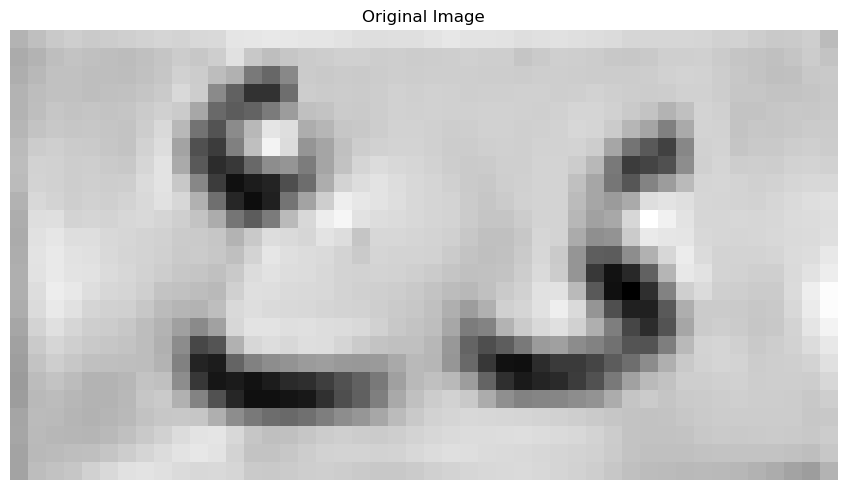

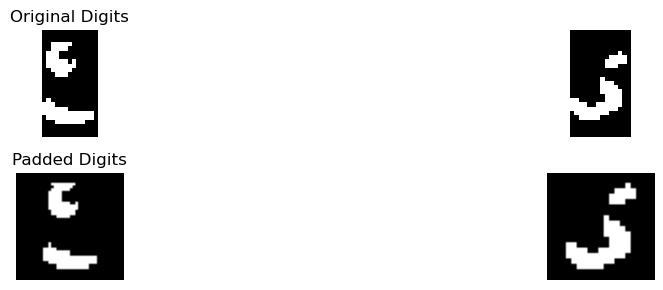

Best match: ع
Full comparison results: {'أ': 0.3125, 'ب': 0.2403846153846154, 'ج': 2.646282910132235, 'د': 2.4119612794612797, 'ر': 0.8767281743743514, 'س': 0.5535714285714286, 'ص': 0.5553571428571429, 'ط': 1.6148304605028867, 'ع': 4.663856423042959, 'ف': 1.402726574500768, 'ق': 1.2268827871650452, 'ك': 2.2821969696969697, 'ل': 1.2872282608695653, 'م': 1.015909090909091, 'ن': 2.2059523809523807, 'ه': 0.8643817204301075, 'و': 1.006655947819741, 'ي': 0.7857859531772575}
Confidence :  1.0087867564553619
Best match: ي
Full comparison results: {'أ': 0.11538461538461539, 'ب': 0.4296253315649867, 'ج': 1.4086360398860398, 'د': 3.1982727920227925, 'ر': 3.12632625994695, 'س': 2.1830357142857144, 'ص': 2.0658653846153845, 'ط': 2.933722527472528, 'ع': 1.1057692307692308, 'ف': 4.090684778184778, 'ق': 3.0928539426523303, 'ك': 2.478365384615385, 'ل': 2.789491758241758, 'م': 0.11538461538461539, 'ن': 2.762019230769231, 'ه': 1.84375, 'و': 3.2679843304843303, 'ي': 4.251080438378826}
Confidence :  0.08019

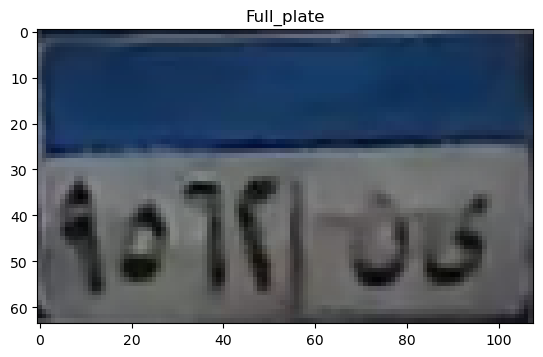

top
[0.41679225 0.28933407 0.2372358  0.21971333 0.24589852 0.26076197
 0.29939556 0.31769238 0.32284049 0.34768277 0.39001834 0.39109904
 0.36188109 0.36466295 0.37491494 0.38520906 0.36115011 0.36623571
 0.37827346 0.40097015 0.42360073 0.42248286 0.4053304  0.39444912
 0.39536632 0.4125798  0.42390273 0.42899897 0.43994969 0.43656044
 0.4267029  0.41463355 0.39199262 0.39982044 0.41339275 0.41834622
 0.41063731 0.38818206 0.37978185 0.4023599  0.41426878 0.41605385
 0.42129964 0.42841626 0.43718618 0.4477905  0.45441641 0.45463853
 0.45083951 0.45393448 0.4611687  0.45748074 0.48299775 0.47036431]
[0.41504195 0.35068602 0.40816581 0.44592205 0.46708078 0.47531961
 0.4840745  0.49415911 0.49827216 0.49008435 0.48308775 0.4781575
 0.47603186 0.46951526 0.46804468 0.46669664 0.46851584 0.46628575
 0.46190061 0.45677418 0.45986453 0.46564113 0.46394124 0.45521309
 0.44778951 0.45707637 0.46768759 0.47561804 0.47787754 0.47580952
 0.47111053 0.46787447 0.46183893 0.45428685 0.44194004 0.

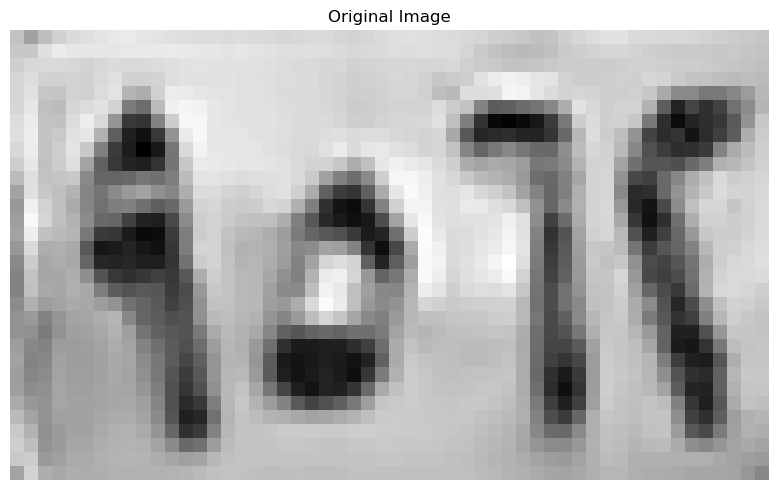

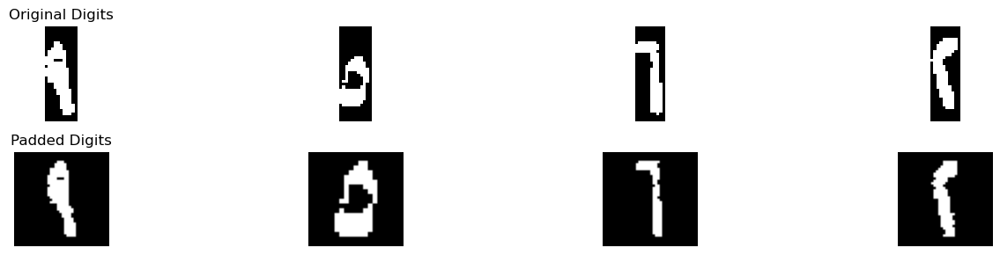

Best match: ٩
Full comparison results: {'١': 3.739583333333333, '٢': 3.814102564102564, '٣': 1.9922600619195046, '٤': 3.245467032967033, '٥': 1.3454868789621113, '٦': 1.0023809523809524, '٧': 1.5169117647058825, '٨': 2.884722222222222, '٩': 4.401913650075415}
Confidence :  0.2939055429864257
Best match: ٥
Full comparison results: {'١': 0.38888888888888895, '٢': 1.8819444444444442, '٣': 1.404422514619883, '٤': 2.177083333333333, '٥': 6.741854636591479, '٦': 1.5506944444444444, '٧': 0.9222222222222222, '٨': 1.3104166666666668, '٩': 0.5520833333333333}
Confidence :  2.282385651629073
Best match: ٦
Full comparison results: {'١': 2.0625, '٢': 1.3645104895104896, '٣': 0.26770510835913314, '٤': 0.16517857142857142, '٥': 1.088986252395695, '٦': 3.7092261904761905, '٧': 0.2665441176470588, '٨': 0.47152777777777777, '٩': 1.1539718451483159}
Confidence :  0.8233630952380953
Best match: ٢
Full comparison results: {'١': 1.7102272727272727, '٢': 5.937135780885781, '٣': 2.7875386996904026, '٤': 2.936

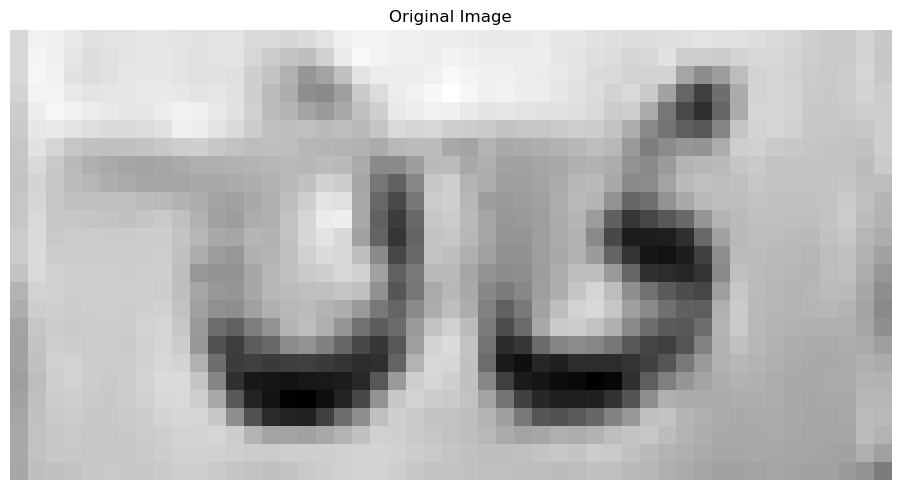

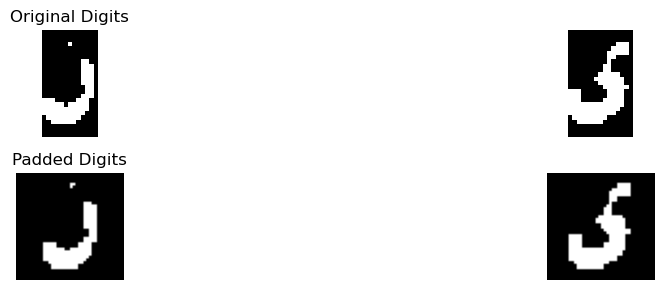

Best match: ن
Full comparison results: {'أ': 0.13125, 'ب': 0.4608753315649867, 'ج': 1.1135768921095008, 'د': 4.809515993265993, 'ر': 3.48376169058328, 'س': 1.4419642857142856, 'ص': 1.2413690476190475, 'ط': 2.2791503808213194, 'ع': 1.902514367816092, 'ف': 3.4301256613756617, 'ق': 3.6865848885593047, 'ك': 1.8428030303030305, 'ل': 3.9491071428571427, 'م': 0.08125, 'ن': 5.001768433179723, 'ه': 1.5882392473118279, 'و': 2.987464797747056, 'ي': 2.324059364548495}
Confidence :  0.0961262199568651
Best match: ي
Full comparison results: {'أ': 0.391304347826087, 'ب': 0.4224137931034483, 'ج': 1.5827294685990339, 'د': 3.826022544283414, 'ر': 2.740262368815592, 'س': 2.334821428571429, 'ص': 2.257427536231884, 'ط': 2.009963768115942, 'ع': 1.2758152173913042, 'ف': 4.046770761444675, 'ق': 3.1414553140096615, 'ك': 1.9538043478260871, 'ل': 3.0489130434782608, 'م': 0.17391304347826086, 'ن': 2.825108695652174, 'ه': 1.505040322580645, 'و': 3.8211050724637685, 'ي': 4.2167154403567455}
Confidence :  0.08497233

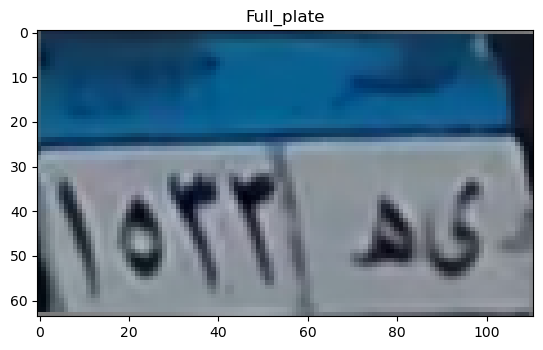

top
[0.36676993 0.56037838 0.58571379 0.59403126 0.60729278 0.59120018
 0.59187523 0.60044648 0.59898707 0.61151061 0.61221395 0.61615701
 0.61481626 0.6257487  0.6339611  0.63839793 0.64598575 0.64167408
 0.64507719 0.63827242 0.63244446 0.63020098 0.63298627 0.63726089
 0.64632775 0.63489269 0.63037216 0.6282208  0.62928497 0.63189485
 0.63151629 0.63540921 0.63405981 0.6353345  0.63270353 0.6376373
 0.64747388 0.65094398 0.65116589 0.65745646 0.65001564 0.63745436
 0.63089567 0.62812379 0.62310461 0.62599909 0.62623613 0.62422183
 0.62132786 0.62141488 0.60490219 0.54064887 0.48660325 0.43326404
 0.43185919]
[0.54232954 0.64073721 0.66079456 0.66274131 0.65065362 0.63725155
 0.63355752 0.62691977 0.627076   0.6289564  0.62480634 0.62060093
 0.62158804 0.62506754 0.63140409 0.63084758 0.62930975 0.62873271
 0.6237465  0.60979054 0.59769917 0.59539117 0.60006622 0.59856859
 0.60078501 0.59763697 0.59744451 0.59876259 0.60169422 0.60267578
 0.60125181 0.60224009 0.60226125 0.60207246 0

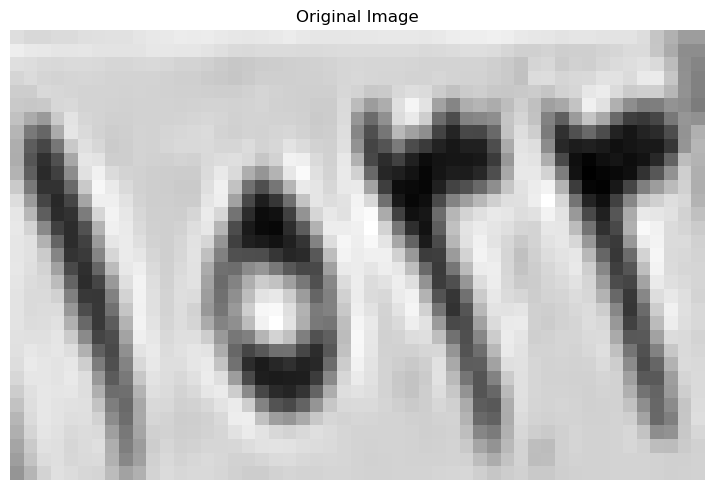

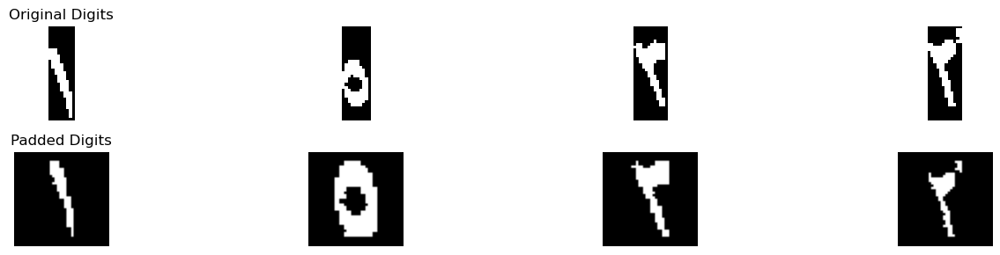

Best match: ١
Full comparison results: {'١': 6.48125, '٢': 0.16666666666666666, '٣': 0.3713235294117647, '٤': 0.6339285714285714, '٥': 0.45982603567742886, '٦': 2.285416666666667, '٧': 0.3290441176470588, '٨': 2.6277777777777778, '٩': 4.712528280542987}
Confidence :  0.8843608597285066
Best match: ٥
Full comparison results: {'١': 1.0, '٢': 1.5937499999999996, '٣': 1.5959429824561404, '٤': 2.2534722222222223, '٥': 6.9719089390142015, '٦': 1.8888888888888888, '٧': 0.7215277777777778, '٨': 0.8409722222222222, '٩': 1.0590277777777777}
Confidence :  2.3592183583959896
Best match: ٦
Full comparison results: {'١': 3.34375, '٢': 1.40625, '٣': 2.3363970588235294, '٤': 0.375, '٥': 2.08640627303553, '٦': 3.64375, '٧': 0.8955882352941177, '٨': 1.8666666666666667, '٩': 2.8139297385620914}
Confidence :  0.1499999999999999
Best match: ٢
Full comparison results: {'١': 1.90625, '٢': 3.321428571428572, '٣': 3.1505417956656347, '٤': 0.888095238095238, '٥': 1.0264862523956952, '٦': 0.5232142857142857, '٧'

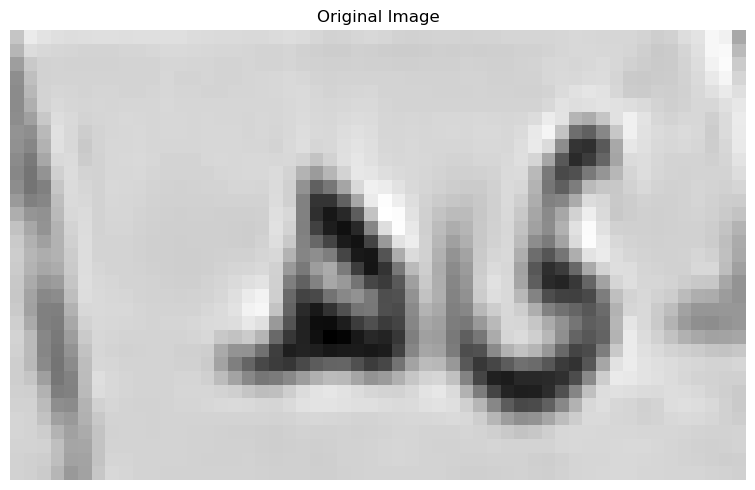

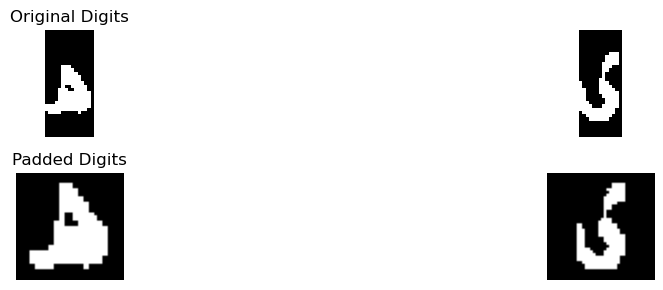

Best match: ه
Full comparison results: {'أ': 0.5420258620689655, 'ب': 0.3125, 'ج': 1.0991379310344827, 'د': 3.491379310344828, 'ر': 0.7392241379310344, 'س': 1.4288793103448276, 'ص': 0.8066810344827586, 'ط': 1.9913793103448274, 'ع': 0.5161637931034483, 'ف': 3.3545258620689653, 'ق': 1.3599137931034482, 'ك': 1.3405172413793103, 'ل': 0.5862068965517242, 'م': 1.6540948275862069, 'ن': 1.1239224137931034, 'ه': 5.8125, 'و': 1.9946120689655173, 'ي': 1.416235632183908}
Confidence :  1.160560344827586
Best match: ي
Full comparison results: {'أ': 0.4513888888888889, 'ب': 0.40235411140583555, 'ج': 2.095194962042788, 'د': 2.3787796827928407, 'ر': 2.6139383284548203, 'س': 0.9598214285714286, 'ص': 1.0333333333333332, 'ط': 1.9120553359683794, 'ع': 1.3249634502923977, 'ف': 2.3706749512670564, 'ق': 2.126522904483431, 'ك': 1.4630681818181819, 'ل': 3.124926900584795, 'م': 0.18781565656565657, 'ن': 2.271904761904762, 'ه': 1.010282258064516, 'و': 2.7177579365079367, 'ي': 3.867532980304719}
Confidence :  0.37

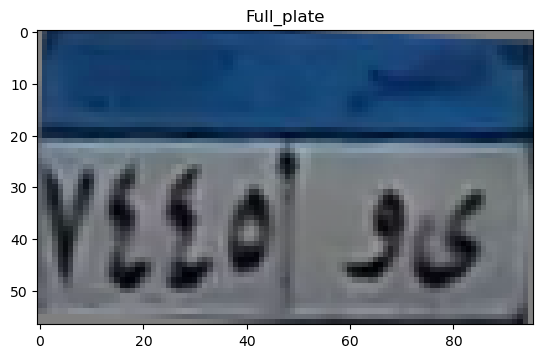

top
[0.45079737 0.50200291 0.51253459 0.48685096 0.47626881 0.49391352
 0.49736594 0.50656086 0.51646644 0.52026115 0.51257098 0.51055433
 0.49916848 0.49231497 0.49827364 0.5014564  0.50061238 0.53946235
 0.50599293 0.48218585 0.49378793 0.48096781 0.4778502  0.47823939
 0.47974794 0.47855314 0.48134939 0.49449593 0.51248426 0.52035804
 0.51325748 0.50676114 0.51052862 0.50892959 0.50985912 0.51176222
 0.51263377 0.50791196 0.50412636 0.49862384 0.49410382 0.49217062
 0.49774757 0.50143093 0.51476935 0.56394107 0.45118968 0.222028  ]
[0.3977455  0.45586961 0.48009649 0.51249462 0.47016006 0.46580191
 0.45041435 0.47317087 0.50307343 0.53718565 0.52546137 0.51260623
 0.49346382 0.47978079 0.47473136 0.5004622  0.50814534 0.49360891
 0.43774799 0.45149026 0.50805558 0.4786333  0.47279985 0.47342047
 0.47456324 0.46615621 0.46714669 0.46377292 0.49075539 0.53481882
 0.52596466 0.51717637 0.51292721 0.50426223 0.50302    0.50066324
 0.50250618 0.49511147 0.48684529 0.47696748 0.46693173 0

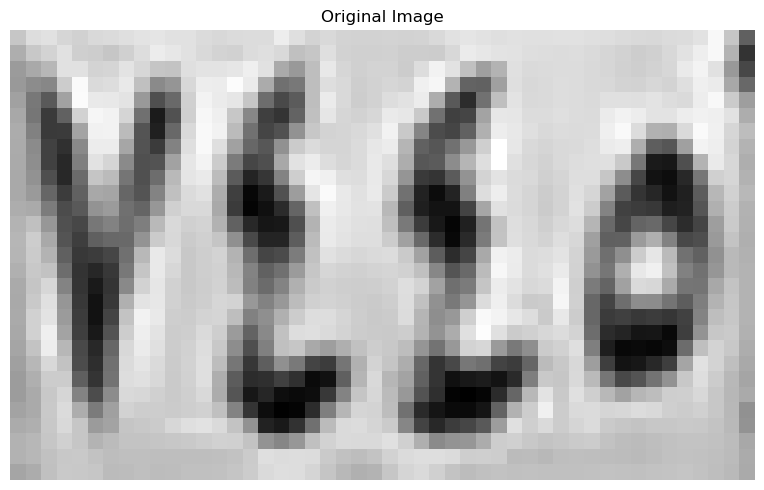

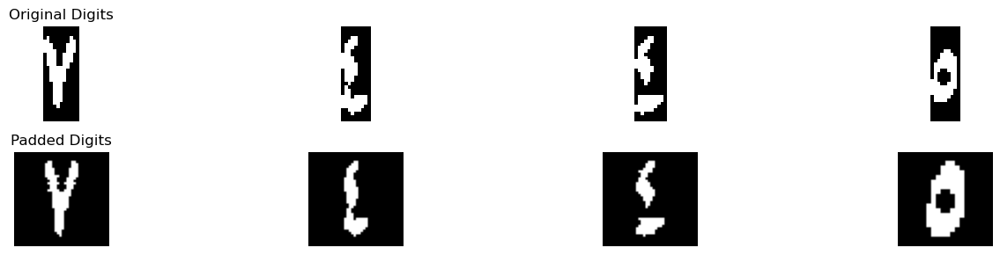

Best match: ٧
Full comparison results: {'١': 0.5625, '٢': 2.6517857142857144, '٣': 3.4755224458204332, '٤': 1.6770833333333335, '٥': 1.2460286746277458, '٦': 1.0907738095238095, '٧': 3.5290441176470586, '٨': 1.3340277777777776, '٩': 1.6079890289449115}
Confidence :  0.026760835913312686
Best match: ٤
Full comparison results: {'١': 1.1062500000000002, '٢': 2.7510198135198136, '٣': 2.2755417956656347, '٤': 5.0990155677655675, '٥': 1.6645796476485328, '٦': 0.0, '٧': 0.8066176470588236, '٨': 1.0055555555555555, '٩': 0.9065013826043239}
Confidence :  1.173997877122877
Best match: ٤
Full comparison results: {'١': 1.0625, '٢': 2.912660256410257, '٣': 2.000483746130031, '٤': 6.04177005789909, '٥': 2.362892525431225, '٦': 0.0, '٧': 0.5540441176470589, '٨': 1.0555555555555556, '٩': 1.392612493715435}
Confidence :  1.5645549007444164
Best match: ٥
Full comparison results: {'١': 0.9375, '٢': 1.5, '٣': 1.1505417956656347, '٤': 3.03125, '٥': 6.310850656051894, '٦': 1.625, '٧': 0.799264705882353, '٨'

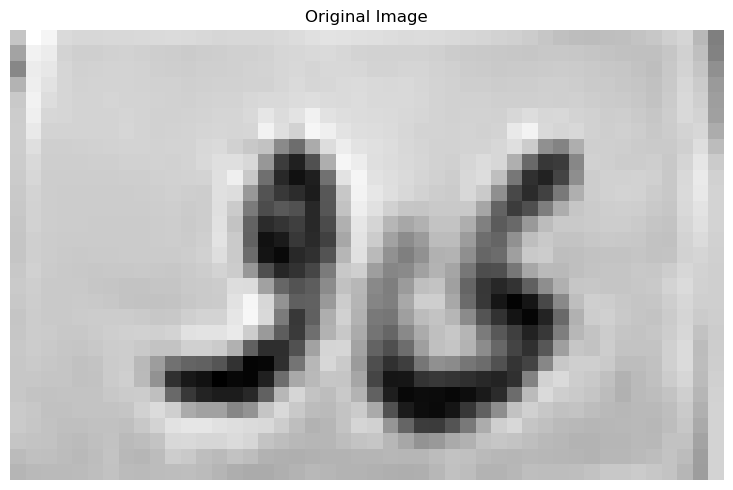

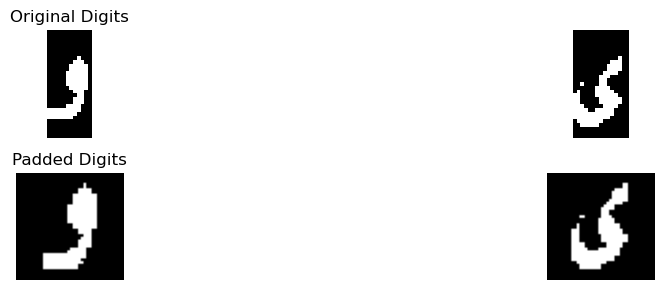

Best match: و
Full comparison results: {'أ': 0.35, 'ب': 0.3318965517241379, 'ج': 1.0546483206809294, 'د': 3.6211574074074075, 'ر': 3.630725976297566, 'س': 2.674107142857143, 'ص': 2.4499999999999997, 'ط': 2.453310276679842, 'ع': 1.4, 'ف': 2.9886574074074073, 'ق': 3.322222222222222, 'ك': 2.322916666666667, 'ل': 3.1624999999999996, 'م': 0.2897727272727273, 'ن': 2.508452380952381, 'ه': 2.62869623655914, 'و': 5.328373015873016, 'ي': 3.662360646599777}
Confidence :  0.8330061846366195
Best match: ي
Full comparison results: {'أ': 0.5386904761904762, 'ب': 0.2941810344827586, 'ج': 1.7612002530480793, 'د': 2.9347029822029826, 'ر': 2.763561344327836, 'س': 1.9464285714285714, 'ص': 2.2541666666666664, 'ط': 1.9186841238471675, 'ع': 1.0580357142857142, 'ف': 2.714616402116402, 'ق': 2.2531415343915344, 'ك': 1.8977272727272727, 'ل': 2.7038690476190474, 'م': 0.18398268398268397, 'ن': 2.343809523809524, 'ه': 1.3310483870967742, 'و': 3.185019841269841, 'ي': 3.98482839624144}
Confidence :  0.399904277485799

In [229]:
def compare_result_with_answer(result, answer):
    # Step 1: Flatten the result and join all characters into a single string
    flattened = [char for sublist in result for char in sublist]
    
    # Separate characters and digits
    characters = [char for char in flattened if not char.isdigit()]
    digits = [char for char in flattened if char.isdigit()]
    
    # Reverse characters and concatenate with digits
    reconstructed_result = ''.join(characters[::-1] + digits)
    
    print(reconstructed_result, answer)
    
    # Step 2: Compare the reconstructed result with the answer
    is_match = reconstructed_result == answer
    
    # Step 3: Calculate percentage match
    length = max(len(reconstructed_result), len(answer))
    matches = sum(1 for a, b in zip(reconstructed_result, answer) if a == b)
    percentage_match = (matches / length) * 100
    print(percentage_match)
    
    return is_match, percentage_match


def load_dataset(path_to_dataset):
    features = []
    labels = []
    img_filenames = os.listdir(path_to_dataset)

    for i, fn in enumerate(img_filenames):
        if fn.split('.')[-1] != 'png':
            continue

        label = fn.split('.')[0]
        labels.append(label)

        path = os.path.join(path_to_dataset, fn)
        result = []
        img = rgba2rgb(io.imread(path)) #if not read try to replace io to cv2
        img = fix_tilt(img)
        show_images([img],["Full_plate"])
        image1,image1_it,image2,image2_it = split_plate(img)
        padded_digits = character_extraction(image1,image1_it,1)
        answer = test_half(1,padded_digits)
        result.append(answer)
        padded_digits = character_extraction(image2,image2_it,2)
        answer = test_half(2,padded_digits)
        result.append(answer)
        print(result)
        features.append(result)
        
    return features, labels
def getaccuracy(features,labels):
    right = 0
    percentage_right = 0
    for i in range(len(labels)):
        x,y = compare_result_with_answer(features[i],labels[i])
        if x:
            right += 1
        percentage_right += y
            
    return 100*right/len(labels), (percentage_right / len(labels))

path_to_dataset = r'./Tests'
features,labels = load_dataset(path_to_dataset)
accuracy,character_accuracy = getaccuracy(features,labels)
print(accuracy)
print(character_accuracy)

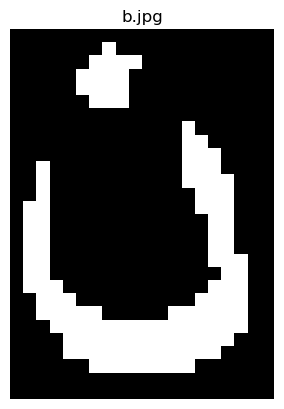

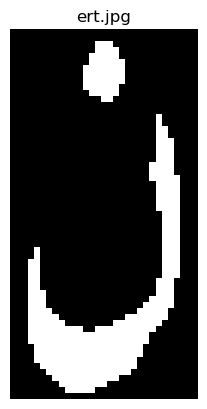

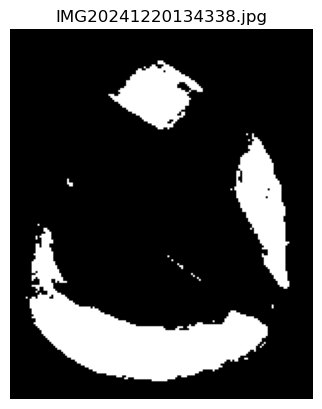

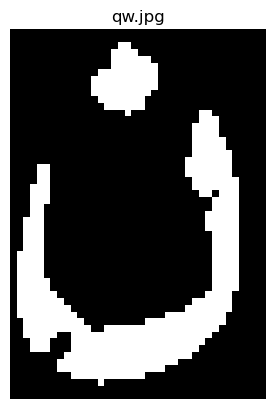

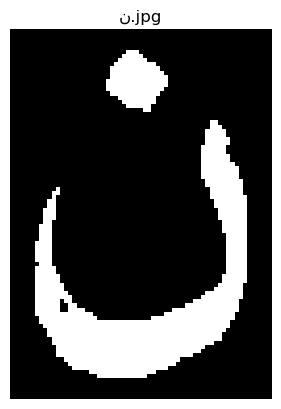

In [37]:
# Path to the folder containing the images
folder_path = "./Reference_Letters/ن"

# Get a list of all files in the folder
image_files = [file for file in os.listdir(folder_path) if file.endswith(('.jpg'))]

# Loop through each file, read it, and display it
for image_file in image_files:
    # Construct the full file path
    image_path = os.path.join(folder_path, image_file)
    
    # Read the image
    img = io.imread(image_path)
    img_g = rgb2gray(img)
    img_it = iterativeThreshold(img_g)
    
    # Display the image
    plt.imshow(img_it)
    plt.title(image_file)
    plt.axis('off')
    plt.show()

In [202]:
def bounding(img_it):
    # # Find contours
    contours = find_contours(img_it, 0.)
    bounding_boxes = []
    for contour in contours:
        Ymin = np.min(contour[:,0])
        Ymax = np.max(contour[:,0])
        Xmin = np.min(contour[:,1])
        Xmax = np.max(contour[:,1])
        aspect_ratio = (Xmax-Xmin)/(Ymax-Ymin)
        print(Xmin, Xmax, Ymin, Ymax)
        if 0.5 <= aspect_ratio <= 3 and (Xmax-Xmin) > 6 or (Ymax-Ymin) > 6:
            bounding_boxes.append([Xmin, Xmax, Ymin, Ymax])
    
    
    return bounding_boxes

def rectangular_distance(shape, step=0.1):
    """
    Calculate a rectangular distance matrix where distance is based on layers moving inward.
    
    Args:
        shape (tuple): The shape of the matrix (height, width).
        step (float): The decrement for each inward layer of distance.
        
    Returns:
        numpy.ndarray: Matrix of distances based on rectangular layers.
    """
    height, width = shape
    distance_matrix = np.zeros((height, width), dtype=float)
    
    # Calculate the number of layers
    num_layers = min(height, width) // 2
    
    # Assign distances for each layer
    for layer in range(num_layers):
        distance = 1 - layer * step
        # Stop assigning if distance is less than zero
        if distance < 0:
            break
        # Assign distance to the current layer
        distance_matrix[layer:height-layer, layer:width-layer] = distance 
    
    return distance_matrix

In [227]:
def sub_horizontal_segmentation(image, binary_image_original, min_width=1, max_width=20, min_height=4, offset = 0):
    """
    Segment digits horizontally
    
    Args:
        binary_image (numpy.ndarray): Binary image of the license plate
        min_width (int): Minimum width of a valid digit region
        max_width (int): Maximum width of a valid digit region
        min_height (int): Minimum height of a valid digit region
    
    Returns:
        list: List of segmented digit images
    """

    print("In sub_horizontal_segmentation")
    
    binary_image_new = iterativeThreshold(image)
    eroded = binary_erosion(binary_image_new,np.ones([3,2]))
    dilated = binary_dilation(eroded,np.ones([2,2]))

    #show_images([image,binary_image_new,eroded,dilated],["image","binary","eroded","dilated"])

    binary_image = dilated
    
    # Find horizontal projection
    horizontal_projection = np.sum(binary_image, axis=0)
    
    # Find potential digit regions
    digit_regions = []
    in_digit = False
    start = 0
    
    for x in range(len(horizontal_projection)):
        # Check if we're in a potential digit region
        if not in_digit and horizontal_projection[x] > 0:
            start = x
            in_digit = True
        
        # Check if we've exited a digit region
        elif in_digit and (horizontal_projection[x] == 0 or x == len(horizontal_projection)-1):
            end = x
            print(start,end)

            if (end - start) > max_width:
                digit_region = binary_image_original[:,start:int((end+start)/2)+1]
                
                digit_regions.append((start + offset, int((end+start)/2) + offset, digit_region))
    
                digit_region = binary_image_original[:,int((end+start)/2):end+1]
                
                digit_regions.append((int((end+start)/2) + offset, end + offset, digit_region))


            '''
            if (end - start) > max_width:
                boxes = bounding(binary_image)
                if len(boxes) == 1:
                    digit_region = binary_image_original[:,start:int((end+start)/2)+1]
                    
                    digit_regions.append((start + offset, int((end+start)/2) + offset, digit_region))
    
                    digit_region = binary_image_original[:,int((end+start)/2):end+1]
                    
                    digit_regions.append((int((end+start)/2) + offset, end + offset, digit_region))
                else:
                    for box in boxes:
                        digit_region = binary_image_original[:,int(box[0]):int(box[1])+1]
                    
                        digit_regions.append((int(box[0]) + offset, int(box[1]) + offset, digit_region))  
                '''               
            
            #filtering
            if (end - start >= min_width and end - start <= max_width and np.sum(binary_image_new[:,start:end+1]) > min_height * (end - start)):
        
                # Extract potential digit
                #digit_region = image[:, start:end]
                #digit_region = iterativeThreshold(digit_region)
                digit_region = binary_image_original[:,start:end+1]
                
                digit_regions.append((start + offset, end + offset, digit_region))
            
            in_digit = False
    
    return digit_regions


def horizontal_segmentation_1(image, binary_image_original, min_width=1, max_width=20, min_height=4):
    """
    Segment digits horizontally
    
    Args:
        binary_image (numpy.ndarray): Binary image of the license plate
        min_width (int): Minimum width of a valid digit region
        max_width (int): Maximum width of a valid digit region
        min_height (int): Minimum height of a valid digit region
    
    Returns:
        list: List of segmented digit images
    """

    print("In horizontal_segmentation_1")
    
    binary_image_new = iterativeThreshold(image)

    #show_images([image,binary_image_new],["image","binary"])
    
    # Find horizontal projection
    horizontal_projection = np.sum(binary_image_new, axis=0)
    
    # Find potential digit regions
    digit_regions = []
    in_digit = False
    start = 0
    
    for x in range(len(horizontal_projection)):
        # Check if we're in a potential digit region
        if not in_digit and horizontal_projection[x] > 0:
            start = x
            in_digit = True
        
        # Check if we've exited a digit region
        elif in_digit and (horizontal_projection[x] == 0 or x == len(horizontal_projection)-1):
            end = x
            print(start,end)
            
            #filtering
            
            while (end - start > max_width):
                sub_regions = sub_horizontal_segmentation(image[:,start:end+1], binary_image_original[:,start:end+1] , min_width, max_width, min_height, start)
                if len(sub_regions) == 0:
                    digit_region = binary_image_original[:,start:end+1]
                
                    digit_regions.append((start, end, digit_region))
                    break
                for x in range(len(sub_regions)):
                    digit_regions.append(sub_regions[x])
                    start = sub_regions[x][1]
                    
            if (end - start >= min_width and end - start <= max_width and np.sum(binary_image_new[:,start:end+1]) > min_height * (end - start) and ((end+start)/2 > len(horizontal_projection)/16 and (end+start)/2 < (len(horizontal_projection) - (len(horizontal_projection)/16)))):
        
                # Extract potential digit
                #digit_region = image[:, start:end]
                #digit_region = iterativeThreshold(digit_region)
                digit_region = binary_image_original[:,start:end+1]
                
                digit_regions.append((start, end, digit_region))
            
            in_digit = False
    #print(digit_regions)
    return digit_regions

def refine_segmentation_1(digit_regions, max_digits=4, min_separation=1, max_width = 14):
    """
    Refine segmentation by merging or filtering regions
    
    Args:
        digit_regions (list): List of detected digit regions
        max_digits (int): Maximum number of expected digits
        min_separation (int): Minimum separation between digits
    
    Returns:
        list: Refined list of digit regions
    """

    print("In refine_segmentation_1")
    
    # Sort regions from left to right
    sorted_regions = sorted(digit_regions, key=lambda x: x[0])
    
    # Merge closely connected regions
    refined_regions = []
    i = 0
    while i < len(sorted_regions):
        current = sorted_regions[i]
        
        # Look ahead to see if next region is close
        if i + 1 < len(sorted_regions):
            next_region = sorted_regions[i + 1]
            
            # If regions are close, merge them
            #also check connection????
            if i + 2 < len(sorted_regions):
                after_next_region = sorted_regions[i + 2]
                if next_region[0] - current[1] < min_separation and next_region[1] - current[0] <= max_width and (after_next_region[0] - next_region[1]) > (next_region[0] - current[1]):
                    # Merge the two regions
                    merged_region = (
                        current[0], 
                        next_region[1], 
                        np.hstack((current[2], next_region[2]))
                    )
                    refined_regions.append(merged_region)
                    i += 2
                    continue
            else:
                if next_region[0] - current[1] < min_separation and next_region[1] - current[0] <= max_width:
                    # Merge the two regions
                    merged_region = (
                        current[0], 
                        next_region[1], 
                        np.hstack((current[2], next_region[2]))
                    )
                    refined_regions.append(merged_region)
                    i += 2
                    continue
        
        refined_regions.append(current)
        i += 1
    refined_regions = sorted(refined_regions, key=lambda x: (x[0] - x[1]))
    refined_regions = refined_regions[:max_digits]
    refined_regions = sorted(refined_regions, key=lambda x: x[0])
    # Limit to max expected digits
    return refined_regions[:max_digits]

def vertical_segmentation(image):
    """
    Segment digits horizontally
    
    Args:
        binary_image (numpy.ndarray): Binary image of the license plate
        min_width (int): Minimum width of a valid digit region
        max_width (int): Maximum width of a valid digit region
        min_height (int): Minimum height of a valid digit region
    
    Returns:
        list: List of segmented digit images
    """

    height, width = image.shape
    
    # Find horizontal projection
    vertical_projection = np.sum(image, axis=1)

    vert_max = max(vertical_projection) 
    print(vert_max)
    
    # Find potential digit regions
    regions = []
    in_digit = False
    prev = -1
    start = 0
    
    for x in range(len(vertical_projection)):

        if not in_digit and (vertical_projection[x] > (0.1 * vert_max)):
            in_digit = True
            start = x
            
        if in_digit and (vertical_projection[x] < (0.4 * prev)):
            end = x
            in_digit = False
            regions.append((start, end))

        prev = vertical_projection[x]

    refined_regions = sorted(regions, key=lambda x: x[0])
    if len(refined_regions) > 1:
        if refined_regions[0][1] >= int(0.25 * height) and refined_regions[0][1] <= int(height - (0.25 * height)):
            if refined_regions[1][0] >= int(0.25 * height) and refined_regions[1][0] <= int(height - (0.25 * height)):
                return [(refined_regions[0][0], refined_regions[1][1])]
    return regions

def character_extraction(image_n,image_n_it,current_half):
    #show_images([image_n_it],["character_extraction"])
    height, width = image_n.shape
    #image_it = iterativeThreshold(image_n)
    #rectangle = 1 - rectangular_distance(np.shape(image_it),0.1)
    #image_it_new = image_it * rectangle
    #show_images([image_it,image_it_new],["1","2"])
    #vertical_regions = vertical_segmentation(image_it_new)
    #print(vertical_regions)
    #choosen_region = (sorted(vertical_regions, key=lambda x: x[0]-x[1]))[0]
    #print(choosen_region)
    #image_new = image_n[int(choosen_region[0]):int(choosen_region[1]),:]
    #show_images([image_n,image_new],["3","4"])
    if current_half == 1:
        digit_regions = horizontal_segmentation_1(image_n,image_n_it,3,int(0.35*width),3)
    if current_half == 2:
        digit_regions = horizontal_segmentation_1(image_n,image_n_it,2,int(0.35*width),3)

    #print(digit_regions)
        
    # Refine segmentation
    if current_half == 1:
        refined_regions = refine_segmentation_1(digit_regions,4,4,int(0.35*width))
        after_outliers=remove_outliers(refined_regions,5)
    if current_half == 2:
        refined_regions = refine_segmentation_1(digit_regions,4,4,int(0.35*width))
        after_outliers=remove_outliers_letters(refined_regions,4)
        
    # Pad and center digits
    padded_digits = [
        resize(after_outlier[2]) 
        for after_outlier in after_outliers
    ]
    # Visualize segmentation
    visualize_segmentation(image_n, refined_regions,padded_digits)

    return padded_digits


In [176]:
def horizontal_cutting(binary_image_original):
    
    # Find horizontal projection
    horizontal_projection = np.sum(binary_image_original, axis=0)
    
    # Find potential digit regions
    digit_regions = []
    in_digit = False
    start = 0
    
    for x in range(len(horizontal_projection)):
        # Check if we're in a potential digit region
        if not in_digit and horizontal_projection[x] > 0:
            start = x
            in_digit = True
        
        # Check if we've exited a digit region
        elif in_digit and (horizontal_projection[x] == 0 or x == len(horizontal_projection)-1):
            end = x
            print(start,end)
            digit_region = binary_image_original[:,start:end+1]    
            digit_regions.append((start, end, digit_region))
            in_digit = False
    #print(digit_regions)
    return digit_regions

In [223]:
def remove_outliers(refined_regions,thresh):
    #thresh*=255
    for refined_region in refined_regions:
        height, width = refined_region[2].shape
        increment=height//8
        print(height,increment)
        print(np.sum(refined_region[2][4*increment:5*increment,:]))
        if np.sum(refined_region[2][:increment,:])<thresh:
            refined_region[2][:increment,:]=0
        if np.sum(refined_region[2][increment:2*increment,:])<thresh:
            refined_region[2][increment:2*increment,:]=0
        if np.sum(refined_region[2][2*increment:3*increment,:])<thresh:
            refined_region[2][2*increment:3*increment,:]=0
        if np.sum(refined_region[2][3*increment:4*increment,:])<thresh:
            refined_region[2][3*increment:4*increment,:]=0
        if np.sum(refined_region[2][4*increment:5*increment,:])<thresh:
            refined_region[2][4*increment:5*increment,:]=0
        if np.sum(refined_region[2][5*increment:6*increment,:])<thresh:
            refined_region[2][5*increment:6*increment,:]=0
        if np.sum(refined_region[2][6*increment:7*increment,:])<thresh:
            refined_region[2][6*increment:7*increment,:]=0
        if np.sum(refined_region[2][7*increment:,:])<thresh:
            refined_region[2][7*increment:,:]=0
    '''
    thresh -=(3*255)
    for refined_region in refined_regions:
        height, width = refined_region[2].shape
        increment=height//8
        if np.sum(refined_region[2][:,:increment])<thresh:
            refined_region[2][:,:increment]=0
        if np.sum(refined_region[2][:,increment:2*increment])<thresh:
            refined_region[2][:,increment:2*increment]=0
        if np.sum(refined_region[2][:,2*increment:3*increment])<thresh:
            refined_region[2][:,2*increment:3*increment]=0
        if np.sum(refined_region[2][:,3*increment:4*increment])<thresh:
            refined_region[2][:,3*increment:4*increment]=0
        if np.sum(refined_region[2][:,4*increment:5*increment])<thresh:
            refined_region[2][:,4*increment:5*increment]=0
        if np.sum(refined_region[2][:,5*increment:6*increment])<thresh:
            refined_region[2][:,5*increment:6*increment]=0
        if np.sum(refined_region[2][:,6*increment:7*increment])<thresh:
            refined_region[2][:,6*increment:7*increment]=0
        if np.sum(refined_region[2][:,7*increment:])<thresh:
            refined_region[2][:,7*increment:]=0
    '''
    return refined_regions

def remove_outliers_letters(refined_regions,thresh):
    #thresh*=255
    for refined_region in refined_regions:
        height, width = refined_region[2].shape
        increment=height//8
        if np.sum(refined_region[2][:increment,:])<thresh:
            refined_region[2][:increment,:]=0
        if np.sum(refined_region[2][4*increment:5*increment,:])<thresh:
            refined_region[2][4*increment:5*increment,:]=0
        if np.sum(refined_region[2][5*increment:6*increment,:])<thresh:
            refined_region[2][5*increment:6*increment,:]=0
        if np.sum(refined_region[2][6*increment:7*increment,:])<thresh:
            refined_region[2][6*increment:7*increment,:]=0
        if np.sum(refined_region[2][7*increment:,:])<thresh:
            refined_region[2][7*increment:,:]=0

    return refined_regions